# Celda 1. Crear estructura de carpetas para resultados finales

En esta celda se crea una carpeta principal llamada `RESULTADOS_FINALES` dentro del proyecto, junto con las subcarpetas que se usarán para organizar ordenadamente los productos del capítulo de resultados.

La idea es separar desde el inicio:
- notebooks de resultados,
- insumos ya consolidados para leer,
- figuras finales,
- tablas finales,
- resúmenes de apoyo,
- y logs de validación.

Esto permite que el cuaderno de resultados sea limpio, reproducible y fácil de mantener, sin mezclarlo con celdas anteriores de procesamiento o modelación.

In [4]:
from pathlib import Path

# =========================================================
# 1. Ruta base del proyecto
# =========================================================
BASE_PROYECTO = Path(r"D:\TRABAJO DE GRADO BEN-MAP")
BASE_RESULTADOS = BASE_PROYECTO / "RESULTADOS_FINALES"

# =========================================================
# 2. Estructura principal de carpetas
# =========================================================
carpetas = [
    BASE_RESULTADOS / "00_notebooks",
    
    BASE_RESULTADOS / "01_insumos_resultados" / "panel",
    BASE_RESULTADOS / "01_insumos_resultados" / "adveccion_difusion",
    BASE_RESULTADOS / "01_insumos_resultados" / "hbm",
    BASE_RESULTADOS / "01_insumos_resultados" / "benmap_base",
    BASE_RESULTADOS / "01_insumos_resultados" / "sensibilidad_hbm",
    BASE_RESULTADOS / "01_insumos_resultados" / "sensibilidad_funcion_cr",
    BASE_RESULTADOS / "01_insumos_resultados" / "sensibilidad_climatica",
    
    BASE_RESULTADOS / "02_figuras" / "01_panel",
    BASE_RESULTADOS / "02_figuras" / "02_adveccion_difusion",
    BASE_RESULTADOS / "02_figuras" / "03_hbm",
    BASE_RESULTADOS / "02_figuras" / "04_benmap_base",
    BASE_RESULTADOS / "02_figuras" / "05_sensibilidad_hbm",
    BASE_RESULTADOS / "02_figuras" / "06_sensibilidad_funcion_cr",
    BASE_RESULTADOS / "02_figuras" / "07_sensibilidad_climatica",
    BASE_RESULTADOS / "02_figuras" / "08_mapas_finales",
    
    BASE_RESULTADOS / "03_tablas" / "tablas_panel",
    BASE_RESULTADOS / "03_tablas" / "tablas_adveccion_difusion",
    BASE_RESULTADOS / "03_tablas" / "tablas_hbm",
    BASE_RESULTADOS / "03_tablas" / "tablas_benmap_base",
    BASE_RESULTADOS / "03_tablas" / "tablas_sensibilidad_hbm",
    BASE_RESULTADOS / "03_tablas" / "tablas_sensibilidad_funcion_cr",
    BASE_RESULTADOS / "03_tablas" / "tablas_sensibilidad_climatica",
    
    BASE_RESULTADOS / "04_resumenes",
    BASE_RESULTADOS / "05_logs",
]

# =========================================================
# 3. Crear carpetas si no existen
# =========================================================
for carpeta in carpetas:
    carpeta.mkdir(parents=True, exist_ok=True)

# =========================================================
# 4. Mostrar resumen de creación
# =========================================================
print("=" * 80)
print("ESTRUCTURA DE RESULTADOS FINALES CREADA")
print("=" * 80)
print(f"Carpeta principal: {BASE_RESULTADOS}\n")

for carpeta in carpetas:
    print(f"- {carpeta}")

print("\nTotal de carpetas creadas/verificadas:", len(carpetas))

ESTRUCTURA DE RESULTADOS FINALES CREADA
Carpeta principal: D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES

- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\00_notebooks
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\panel
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\adveccion_difusion
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\benmap_base
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\sensibilidad_hbm
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\sensibilidad_funcion_cr
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\sensibilidad_climatica
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\01_panel
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\02_adveccion_difusion
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\03_hbm
- D:\TRABAJ

# Celda 2. Configuración general del notebook de resultados

En esta celda se definen las configuraciones base que se usarán en todo el cuaderno de resultados.

Aquí se deja preparado:
- el entorno de trabajo,
- las rutas principales de lectura y guardado,
- el formato visual de tablas y figuras,
- y funciones auxiliares para exportar gráficos y tablas con nombres consistentes.

Esto evita repetir código más adelante y hace que cada sección de resultados quede organizada y homogénea.

In [5]:
    # =========================================================
# 1. Librerías principales
# =========================================================
from pathlib import Path
import os
import warnings
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

warnings.filterwarnings("ignore")

# Opcional: mostrar más columnas y mejor formato en tablas
pd.set_option("display.max_columns", 100)
pd.set_option("display.width", 180)
pd.set_option("display.max_colwidth", 120)
pd.options.display.float_format = "{:,.6f}".format

# =========================================================
# 2. Rutas base del proyecto y resultados finales
# =========================================================
BASE_PROYECTO = Path(r"D:\TRABAJO DE GRADO BEN-MAP")
BASE_SENSIBILIDAD = BASE_PROYECTO / "SALIDAS_SENSIBILIDAD"

BASE_RESULTADOS = BASE_PROYECTO / "RESULTADOS_FINALES"

# Carpetas principales de salida
DIR_INSUMOS = BASE_RESULTADOS / "01_insumos_resultados"
DIR_FIGURAS = BASE_RESULTADOS / "02_figuras"
DIR_TABLAS = BASE_RESULTADOS / "03_tablas"
DIR_RESUMENES = BASE_RESULTADOS / "04_resumenes"
DIR_LOGS = BASE_RESULTADOS / "05_logs"

# Subcarpetas de figuras
FIG_PANEL = DIR_FIGURAS / "01_panel"
FIG_AD = DIR_FIGURAS / "02_adveccion_difusion"
FIG_HBM = DIR_FIGURAS / "03_hbm"
FIG_BENMAP = DIR_FIGURAS / "04_benmap_base"
FIG_SENS_HBM = DIR_FIGURAS / "05_sensibilidad_hbm"
FIG_SENS_CR = DIR_FIGURAS / "06_sensibilidad_funcion_cr"
FIG_SENS_CLIMA = DIR_FIGURAS / "07_sensibilidad_climatica"
FIG_MAPAS = DIR_FIGURAS / "08_mapas_finales"

# Subcarpetas de tablas
TAB_PANEL = DIR_TABLAS / "tablas_panel"
TAB_AD = DIR_TABLAS / "tablas_adveccion_difusion"
TAB_HBM = DIR_TABLAS / "tablas_hbm"
TAB_BENMAP = DIR_TABLAS / "tablas_benmap_base"
TAB_SENS_HBM = DIR_TABLAS / "tablas_sensibilidad_hbm"
TAB_SENS_CR = DIR_TABLAS / "tablas_sensibilidad_funcion_cr"
TAB_SENS_CLIMA = DIR_TABLAS / "tablas_sensibilidad_climatica"

# =========================================================
# 3. Configuración visual de gráficos
# =========================================================
plt.rcParams["figure.figsize"] = (10, 5)
plt.rcParams["figure.dpi"] = 130
plt.rcParams["savefig.dpi"] = 300
plt.rcParams["axes.titlesize"] = 12
plt.rcParams["axes.labelsize"] = 10
plt.rcParams["xtick.labelsize"] = 9
plt.rcParams["ytick.labelsize"] = 9
plt.rcParams["legend.fontsize"] = 9

# =========================================================
# 4. Funciones auxiliares
# =========================================================
def asegurar_carpeta(ruta):
    """
    Crea una carpeta si no existe y devuelve la ruta.
    """
    ruta = Path(ruta)
    ruta.mkdir(parents=True, exist_ok=True)
    return ruta


def guardar_figura(fig, carpeta, nombre_archivo, cerrar=True):
    """
    Guarda una figura en PNG y PDF.
    """
    carpeta = asegurar_carpeta(carpeta)
    ruta_png = carpeta / f"{nombre_archivo}.png"
    ruta_pdf = carpeta / f"{nombre_archivo}.pdf"

    fig.savefig(ruta_png, bbox_inches="tight")
    fig.savefig(ruta_pdf, bbox_inches="tight")

    if cerrar:
        plt.close(fig)

    print(f"Figura guardada en:\n- {ruta_png}\n- {ruta_pdf}")


def guardar_tabla(df, carpeta, nombre_archivo, index=False):
    """
    Guarda una tabla en CSV y Excel.
    """
    carpeta = asegurar_carpeta(carpeta)
    ruta_csv = carpeta / f"{nombre_archivo}.csv"
    ruta_xlsx = carpeta / f"{nombre_archivo}.xlsx"

    df.to_csv(ruta_csv, index=index, encoding="utf-8-sig")
    df.to_excel(ruta_xlsx, index=index)

    print(f"Tabla guardada en:\n- {ruta_csv}\n- {ruta_xlsx}")


def vista_previa(df, n=5, nombre="DataFrame"):
    """
    Muestra forma, columnas y primeras filas.
    """
    print("=" * 80)
    print(f"VISTA PREVIA: {nombre}")
    print("=" * 80)
    print("Forma:", df.shape)
    print("\nColumnas:")
    print(list(df.columns))
    print("\nPrimeras filas:")
    display(df.head(n))


# =========================================================
# 5. Resumen de configuración
# =========================================================
print("=" * 80)
print("CONFIGURACIÓN GENERAL CARGADA")
print("=" * 80)
print(f"Proyecto base      : {BASE_PROYECTO}")
print(f"Resultados finales : {BASE_RESULTADOS}")
print(f"Salidas sensibilidad: {BASE_SENSIBILIDAD}")

print("\nCarpetas clave de salida:")
print(f"- Figuras : {DIR_FIGURAS}")
print(f"- Tablas  : {DIR_TABLAS}")
print(f"- Resúmenes: {DIR_RESUMENES}")
print(f"- Logs    : {DIR_LOGS}")

CONFIGURACIÓN GENERAL CARGADA
Proyecto base      : D:\TRABAJO DE GRADO BEN-MAP
Resultados finales : D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES
Salidas sensibilidad: D:\TRABAJO DE GRADO BEN-MAP\SALIDAS_SENSIBILIDAD

Carpetas clave de salida:
- Figuras : D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras
- Tablas  : D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas
- Resúmenes: D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes
- Logs    : D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\05_logs


# Celda 3. Inventario de archivos candidatos para resultados

En esta celda se construye un inventario de archivos potencialmente útiles para el capítulo de resultados. La finalidad es identificar de forma ordenada qué productos finales ya existen dentro del proyecto y cuáles pueden alimentar cada bloque del capítulo 5.

La búsqueda se concentra en los directorios donde se consolidaron los resultados principales del estudio, incluyendo:
- salidas de sensibilidad,
- resultados del modelo jerárquico bayesiano,
- insumos espaciales y cartográficos.

El resultado esperado es una tabla resumen con:
- nombre del archivo,
- ruta,
- extensión,
- tamaño,
- categoría tentativa,
- y una prioridad preliminar para revisión.

Este inventario servirá como base para seleccionar, en las siguientes celdas, los archivos definitivos que se copiarán a la carpeta de `RESULTADOS_FINALES/01_insumos_resultados`.

In [6]:
# =========================================================
# 1. Librerías auxiliares
# =========================================================
from pathlib import Path
import pandas as pd

# =========================================================
# 2. Carpetas del proyecto a revisar
# =========================================================
carpetas_busqueda = [
    BASE_PROYECTO / "SALIDAS_SENSIBILIDAD",
    BASE_PROYECTO / "RESULTADOS_HBM",
    BASE_PROYECTO / "Qgis",
]

# Extensiones útiles para resultados
ext_validas = {".csv", ".xlsx", ".json", ".gpkg", ".shp"}

# =========================================================
# 3. Función para clasificar archivos tentativamente
# =========================================================
def clasificar_archivo(nombre_archivo: str, ruta_archivo: str) -> str:
    n = nombre_archivo.lower()
    r = ruta_archivo.lower()

    if "panel" in n or "faltantes" in n or "cobertura" in n:
        return "panel"

    if "grid_3km_ad" in n or "queen" in n or "adv_proxy" in n or "grad_" in n or "diff_" in n:
        return "adveccion_difusion"

    if "hbm" in n or "posterior" in n or "obs_vs_pred" in n or "pred" in n:
        return "hbm"

    if "corrida_base" in n or "impactos_sanitarios" in n or "valoracion_economica" in n or "base_analitica" in n:
        return "benmap_base"

    if "percentile" in n or "percentil" in n or "sensibilidad_hbm" in n:
        return "sensibilidad_hbm"

    if "funcion_cr" in n or "health_impact" in n or "impact_functions" in n:
        return "sensibilidad_funcion_cr"

    if "clima" in n or "climatica" in n or "climatic" in n:
        return "sensibilidad_climatica"

    if "localidad" in n or "mapa" in n or "grid_3km" in n or ".gpkg" in n or ".shp" in n:
        return "espacial_mapas"

    return "otros"


def prioridad_revision(categoria: str) -> int:
    prioridades = {
        "panel": 1,
        "adveccion_difusion": 1,
        "hbm": 1,
        "benmap_base": 1,
        "sensibilidad_hbm": 2,
        "sensibilidad_funcion_cr": 2,
        "sensibilidad_climatica": 2,
        "espacial_mapas": 2,
        "otros": 3,
    }
    return prioridades.get(categoria, 3)

# =========================================================
# 4. Recorrer carpetas y construir inventario
# =========================================================
registros = []

for carpeta in carpetas_busqueda:
    if not carpeta.exists():
        continue

    for archivo in carpeta.rglob("*"):
        if archivo.is_file() and archivo.suffix.lower() in ext_validas:
            categoria = clasificar_archivo(archivo.name, str(archivo))
            registros.append({
                "archivo": archivo.name,
                "extension": archivo.suffix.lower(),
                "ruta": str(archivo),
                "carpeta_base": carpeta.name,
                "tam_kb": round(archivo.stat().st_size / 1024, 2),
                "categoria_tentativa": categoria,
                "prioridad_revision": prioridad_revision(categoria),
            })

inventario = pd.DataFrame(registros)

if inventario.empty:
    print("No se encontraron archivos candidatos en las carpetas revisadas.")
else:
    inventario = inventario.sort_values(
        by=["prioridad_revision", "categoria_tentativa", "archivo"]
    ).reset_index(drop=True)

    print("=" * 100)
    print("INVENTARIO DE ARCHIVOS CANDIDATOS PARA RESULTADOS")
    print("=" * 100)
    print(f"Total de archivos encontrados: {len(inventario)}\n")

    display(inventario.head(80))

    print("\nResumen por categoría:")
    resumen_cat = (
        inventario.groupby("categoria_tentativa", as_index=False)
        .agg(
            n_archivos=("archivo", "count"),
            tam_total_kb=("tam_kb", "sum")
        )
        .sort_values("n_archivos", ascending=False)
        .reset_index(drop=True)
    )
    display(resumen_cat)

    # Guardar inventario
    ruta_inventario_csv = DIR_RESUMENES / "inventario_archivos_resultados.csv"
    ruta_inventario_xlsx = DIR_RESUMENES / "inventario_archivos_resultados.xlsx"

    inventario.to_csv(ruta_inventario_csv, index=False, encoding="utf-8-sig")
    inventario.to_excel(ruta_inventario_xlsx, index=False)

    print("\nInventario guardado en:")
    print("-", ruta_inventario_csv)
    print("-", ruta_inventario_xlsx)

INVENTARIO DE ARCHIVOS CANDIDATOS PARA RESULTADOS
Total de archivos encontrados: 167



,archivo,extension,ruta,carpeta_base,tam_kb,categoria_tentativa,prioridad_revision
0,06_base_analitica_final_por_corrida.json,.json,D:\TRABAJO DE GRADO BEN-MAP\SALIDAS_SENSIBILIDAD\00_logs_validacion\06_base_analitica_final_por_corrida.json,SALIDAS_SENSIBILIDAD,0.410000,benmap_base,1
1,06b_base_analitica_final_rebuilt.json,.json,D:\TRABAJO DE GRADO BEN-MAP\SALIDAS_SENSIBILIDAD\00_logs_validacion\06b_base_analitica_final_rebuilt.json,SALIDAS_SENSIBILIDAD,0.410000,benmap_base,1
2,07_impactos_sanitarios_por_corrida.json,.json,D:\TRABAJO DE GRADO BEN-MAP\SALIDAS_SENSIBILIDAD\00_logs_validacion\07_impactos_sanitarios_por_corrida.json,SALIDAS_SENSIBILIDAD,0.420000,benmap_base,1
3,07b_impactos_sanitarios_rebuilt.json,.json,D:\TRABAJO DE GRADO BEN-MAP\SALIDAS_SENSIBILIDAD\00_logs_validacion\07b_impactos_sanitarios_rebuilt.json,SALIDAS_SENSIBILIDAD,0.420000,benmap_base,1
4,08_valoracion_economica_base_usd2015.json,.json,D:\TRABAJO DE GRADO BEN-MAP\SALIDAS_SENSIBILIDAD\00_logs_validacion\08_valoracion_economica_base_usd2015.json,SALIDAS_SENSIBILIDAD,0.460000,benmap_base,1
...,...,...,...,...,...,...,...
75,15_escenarios_valoracion.json,.json,D:\TRABAJO DE GRADO BEN-MAP\SALIDAS_SENSIBILIDAD\00_logs_validacion\15_escenarios_valoracion.json,SALIDAS_SENSIBILIDAD,0.510000,otros,3
76,16_sensibilidad_valoracion_completa.json,.json,D:\TRABAJO DE GRADO BEN-MAP\SALIDAS_SENSIBILIDAD\00_logs_validacion\16_sensibilidad_valoracion_completa.json,SALIDAS_SENSIBILIDAD,0.670000,otros,3
77,17_tabla_resumen_integrada_final.json,.json,D:\TRABAJO DE GRADO BEN-MAP\SALIDAS_SENSIBILIDAD\00_logs_validacion\17_tabla_resumen_integrada_final.json,SALIDAS_SENSIBILIDAD,0.350000,otros,3
78,18_tabla_resumen_integrada_legible.json,.json,D:\TRABAJO DE GRADO BEN-MAP\SALIDAS_SENSIBILIDAD\00_logs_validacion\18_tabla_resumen_integrada_legible.json,SALIDAS_SENSIBILIDAD,0.360000,otros,3



Resumen por categoría:


,categoria_tentativa,n_archivos,tam_total_kb
0,otros,107,"16,124.350000"
1,hbm,22,"1,445.460000"
2,benmap_base,16,"1,122.910000"
3,sensibilidad_funcion_cr,11,183.250000
4,espacial_mapas,6,"25,565.620000"
5,sensibilidad_climatica,5,"1,297.540000"



Inventario guardado en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\inventario_archivos_resultados.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\inventario_archivos_resultados.xlsx


# Celda 4. Selección y copia de insumos definitivos para resultados

En esta celda se seleccionan de forma explícita los archivos finales que alimentarán el capítulo de resultados. En lugar de depender únicamente del inventario general, aquí se define una lista controlada de insumos ya validados, organizados por bloque temático del estudio.

La lógica es copiar a la carpeta `RESULTADOS_FINALES/01_insumos_resultados` únicamente los archivos que se usarán realmente en el notebook de resultados, evitando mezclar salidas intermedias, logs o versiones preliminares.

Los bloques considerados son:
- panel e insumos descriptivos,
- resultados del esquema de advección–difusión,
- resultados del modelo jerárquico bayesiano,
- resultados base sanitarios y económicos,
- sensibilidad del HBM,
- sensibilidad por función concentración–respuesta,
- y sensibilidad climática.

El resultado esperado es una carpeta de insumos limpia y ordenada, lista para ser leída en las siguientes secciones del cuaderno.

In [7]:
# =========================================================
# 1. Librerías
# =========================================================
from pathlib import Path
import shutil
import pandas as pd

# =========================================================
# 2. Definir archivos fuente por bloque
#    AJUSTABLE: si alguno no existe, la celda lo reporta
# =========================================================
archivos_resultados = {
    "panel": [
        BASE_PROYECTO / "BASES DE DATOS" / "panel_integrado_2020_2024.csv",
    ],

    "adveccion_difusion": [
        BASE_PROYECTO / "SALIDAS_SENSIBILIDAD" / "02_base_analitica" / "base_analitica_final_por_corrida.csv",
        BASE_PROYECTO / "Qgis" / "grid_3km_time_idw_2020_2024.gpkg",
        BASE_PROYECTO / "SALIDAS_SENSIBILIDAD" / "02_base_analitica" / "cell_to_localidad.csv",
    ],

    "hbm": [
        BASE_PROYECTO / "RESULTADOS_HBM" / "PM25",
        BASE_PROYECTO / "RESULTADOS_HBM" / "NO2",
        BASE_PROYECTO / "RESULTADOS_HBM" / "O3",
    ],

    "benmap_base": [
        BASE_PROYECTO / "SALIDAS_SENSIBILIDAD" / "03_corrida_principal" / "impactos_sanitarios_por_celda.csv",
        BASE_PROYECTO / "SALIDAS_SENSIBILIDAD" / "03_corrida_principal" / "impactos_sanitarios_resumen.csv",
        BASE_PROYECTO / "SALIDAS_SENSIBILIDAD" / "03_corrida_principal" / "valoracion_economica_por_celda_cop.csv",
        BASE_PROYECTO / "SALIDAS_SENSIBILIDAD" / "07_tablas" / "corrida_base_por_localidad_top.csv",
    ],

    "sensibilidad_hbm": [
        BASE_PROYECTO / "SALIDAS_SENSIBILIDAD" / "04_sensibilidad" / "percentiles_hbm" / "superficies_anuales_percentiles_hbm.csv",
        BASE_PROYECTO / "SALIDAS_SENSIBILIDAD" / "07_tablas" / "tabla_resumen_integrada_final.csv",
        BASE_PROYECTO / "SALIDAS_SENSIBILIDAD" / "07_tablas" / "tabla_resumen_integrada_legible.csv",
    ],

    "sensibilidad_funcion_cr": [
        BASE_PROYECTO / "SALIDAS_SENSIBILIDAD" / "04_sensibilidad" / "funcion_cr" / "sensibilidad_funcion_cr_pm25_resumen.csv",
        BASE_PROYECTO / "SALIDAS_SENSIBILIDAD" / "04_sensibilidad" / "funcion_cr" / "sensibilidad_funcion_cr_pm25_resumen_comparado_base.csv",
    ],

    "sensibilidad_climatica": [
        BASE_PROYECTO / "SALIDAS_SENSIBILIDAD" / "04_sensibilidad" / "clima" / "sensibilidad_climatica_resumen.csv",
        BASE_PROYECTO / "SALIDAS_SENSIBILIDAD" / "04_sensibilidad" / "clima" / "sensibilidad_climatica_resumen_comparado_central.csv",
        BASE_PROYECTO / "SALIDAS_SENSIBILIDAD" / "04_sensibilidad" / "clima" / "escenarios_climaticos_parametros.csv",
    ],
}

# =========================================================
# 3. Mapa de carpetas destino
# =========================================================
destinos = {
    "panel": DIR_INSUMOS / "panel",
    "adveccion_difusion": DIR_INSUMOS / "adveccion_difusion",
    "hbm": DIR_INSUMOS / "hbm",
    "benmap_base": DIR_INSUMOS / "benmap_base",
    "sensibilidad_hbm": DIR_INSUMOS / "sensibilidad_hbm",
    "sensibilidad_funcion_cr": DIR_INSUMOS / "sensibilidad_funcion_cr",
    "sensibilidad_climatica": DIR_INSUMOS / "sensibilidad_climatica",
}

# =========================================================
# 4. Copiar archivos/carpetas
# =========================================================
registros_copia = []

for categoria, lista_rutas in archivos_resultados.items():
    destino_categoria = destinos[categoria]
    destino_categoria.mkdir(parents=True, exist_ok=True)

    for ruta in lista_rutas:
        ruta = Path(ruta)

        if ruta.exists():
            if ruta.is_file():
                destino_final = destino_categoria / ruta.name
                shutil.copy2(ruta, destino_final)

                registros_copia.append({
                    "categoria": categoria,
                    "tipo": "archivo",
                    "origen": str(ruta),
                    "destino": str(destino_final),
                    "estado": "copiado"
                })

            elif ruta.is_dir():
                destino_final = destino_categoria / ruta.name

                # si ya existe, se elimina para evitar errores de recopia
                if destino_final.exists():
                    shutil.rmtree(destino_final)

                shutil.copytree(ruta, destino_final)

                registros_copia.append({
                    "categoria": categoria,
                    "tipo": "carpeta",
                    "origen": str(ruta),
                    "destino": str(destino_final),
                    "estado": "copiado"
                })
        else:
            registros_copia.append({
                "categoria": categoria,
                "tipo": "archivo_o_carpeta",
                "origen": str(ruta),
                "destino": "",
                "estado": "NO_ENCONTRADO"
            })

# =========================================================
# 5. Resumen de resultados
# =========================================================
df_copia = pd.DataFrame(registros_copia)

print("=" * 100)
print("COPIA DE INSUMOS DEFINITIVOS PARA RESULTADOS")
print("=" * 100)
display(df_copia)

print("\nResumen por categoría y estado:")
display(
    df_copia.groupby(["categoria", "estado"], as_index=False)
           .agg(n_elementos=("origen", "count"))
           .sort_values(["categoria", "estado"])
           .reset_index(drop=True)
)

# =========================================================
# 6. Guardar log de copia
# =========================================================
ruta_log_csv = DIR_LOGS / "log_copia_insumos_resultados.csv"
ruta_log_xlsx = DIR_LOGS / "log_copia_insumos_resultados.xlsx"

df_copia.to_csv(ruta_log_csv, index=False, encoding="utf-8-sig")
df_copia.to_excel(ruta_log_xlsx, index=False)

print("\nLog guardado en:")
print("-", ruta_log_csv)
print("-", ruta_log_xlsx)

COPIA DE INSUMOS DEFINITIVOS PARA RESULTADOS


,categoria,tipo,origen,destino,estado
0,panel,archivo_o_carpeta,D:\TRABAJO DE GRADO BEN-MAP\BASES DE DATOS\panel_integrado_2020_2024.csv,,NO_ENCONTRADO
1,adveccion_difusion,archivo,D:\TRABAJO DE GRADO BEN-MAP\SALIDAS_SENSIBILIDAD\02_base_analitica\base_analitica_final_por_corrida.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\adveccion_difusion\base_analitica_final_por_cor...,copiado
2,adveccion_difusion,archivo,D:\TRABAJO DE GRADO BEN-MAP\Qgis\grid_3km_time_idw_2020_2024.gpkg,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\adveccion_difusion\grid_3km_time_idw_2020_2024....,copiado
3,adveccion_difusion,archivo,D:\TRABAJO DE GRADO BEN-MAP\SALIDAS_SENSIBILIDAD\02_base_analitica\cell_to_localidad.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\adveccion_difusion\cell_to_localidad.csv,copiado
4,hbm,carpeta,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_HBM\PM25,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\PM25,copiado
5,hbm,carpeta,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_HBM\NO2,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\NO2,copiado
6,hbm,carpeta,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_HBM\O3,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\O3,copiado
7,benmap_base,archivo,D:\TRABAJO DE GRADO BEN-MAP\SALIDAS_SENSIBILIDAD\03_corrida_principal\impactos_sanitarios_por_celda.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\benmap_base\impactos_sanitarios_por_celda.csv,copiado
8,benmap_base,archivo,D:\TRABAJO DE GRADO BEN-MAP\SALIDAS_SENSIBILIDAD\03_corrida_principal\impactos_sanitarios_resumen.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\benmap_base\impactos_sanitarios_resumen.csv,copiado
9,benmap_base,archivo,D:\TRABAJO DE GRADO BEN-MAP\SALIDAS_SENSIBILIDAD\03_corrida_principal\valoracion_economica_por_celda_cop.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\benmap_base\valoracion_economica_por_celda_cop.csv,copiado



Resumen por categoría y estado:


,categoria,estado,n_elementos
0,adveccion_difusion,copiado,3
1,benmap_base,copiado,4
2,hbm,copiado,3
3,panel,NO_ENCONTRADO,1
4,sensibilidad_climatica,copiado,3
5,sensibilidad_funcion_cr,copiado,2
6,sensibilidad_hbm,copiado,3



Log guardado en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\05_logs\log_copia_insumos_resultados.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\05_logs\log_copia_insumos_resultados.xlsx


# Celda 5. Organización de la trazabilidad de archivos usados en el proyecto

En esta celda se crea una carpeta adicional de trazabilidad dentro de `RESULTADOS_FINALES`, con el objetivo de reunir, en un solo lugar, copias ordenadas de los archivos y carpetas que fueron utilizados a lo largo del desarrollo del proyecto.

La lógica no consiste en mover los archivos originales, sino en construir una estructura paralela que permita identificar con claridad:
- cuáles fueron las entradas principales,
- cuáles archivos surgieron de la etapa de limpieza,
- cuáles alimentaron el esquema de advección–difusión,
- cuáles corresponden al modelo jerárquico bayesiano,
- cuáles se usaron en la estimación sanitaria y económica base,
- cuáles pertenecen a los análisis de sensibilidad,
- y cuáles conforman los resultados finales.

Además, se incorporan los archivos de código más relevantes, incluyendo notebooks y salidas principales ubicadas en la carpeta `CODIGO`, con el fin de dejar documentada la trazabilidad completa del trabajo realizado.

El resultado esperado es una estructura organizada y un log de copia que permita auditar, revisar y explicar con facilidad qué archivos se usaron en cada etapa metodológica.

In [8]:
# =========================================================
# 1. Librerías
# =========================================================
from pathlib import Path
import shutil
import pandas as pd

# =========================================================
# 2. Carpeta nueva de trazabilidad
# =========================================================
DIR_TRAZABILIDAD = BASE_RESULTADOS / "06_trazabilidad_archivos"

subcarpetas_trazabilidad = {
    "00_codigo_usado": DIR_TRAZABILIDAD / "00_codigo_usado",
    "01_entradas": DIR_TRAZABILIDAD / "01_entradas",
    "02_limpieza": DIR_TRAZABILIDAD / "02_limpieza",
    "03_adveccion_difusion": DIR_TRAZABILIDAD / "03_adveccion_difusion",
    "04_hbm": DIR_TRAZABILIDAD / "04_hbm",
    "05_benmap_base": DIR_TRAZABILIDAD / "05_benmap_base",
    "06_sensibilidad": DIR_TRAZABILIDAD / "06_sensibilidad",
    "07_resultados_finales": DIR_TRAZABILIDAD / "07_resultados_finales",
    "08_cartografia": DIR_TRAZABILIDAD / "08_cartografia",
    "09_logs_trazabilidad": DIR_TRAZABILIDAD / "09_logs_trazabilidad",
}

for carpeta in subcarpetas_trazabilidad.values():
    carpeta.mkdir(parents=True, exist_ok=True)

# =========================================================
# 3. Función auxiliar para resolver el primer archivo existente
# =========================================================
def resolver_primera_ruta_existente(candidatas):
    for ruta in candidatas:
        ruta = Path(ruta)
        if ruta.exists():
            return ruta
    return None

# =========================================================
# 4. Lista maestra de archivos/carpetas a copiar
#    Puedes ir ampliándola luego sin dañar la estructura
# =========================================================
items_trazabilidad = [
    # -----------------------------------------------------
    # CÓDIGO USADO
    # -----------------------------------------------------
    {
        "bloque": "00_codigo_usado",
        "etapa": "codigo",
        "descripcion": "Notebook de resultados finales",
        "candidatas": [BASE_PROYECTO / "CODIGO" / "00_resultados_finales.ipynb"],
    },
    {
        "bloque": "00_codigo_usado",
        "etapa": "codigo",
        "descripcion": "Notebook de sensibilidad",
        "candidatas": [BASE_PROYECTO / "CODIGO" / "sensibilidad.ipynb"],
    },
    {
        "bloque": "00_codigo_usado",
        "etapa": "codigo",
        "descripcion": "Notebook principal HBM",
        "candidatas": [BASE_PROYECTO / "CODIGO" / "HBM.ipynb"],
    },
    {
        "bloque": "00_codigo_usado",
        "etapa": "codigo",
        "descripcion": "Notebook de inputs BenMAP",
        "candidatas": [BASE_PROYECTO / "CODIGO" / "Inputs_benmap.ipynb"],
    },
    {
        "bloque": "00_codigo_usado",
        "etapa": "codigo",
        "descripcion": "Notebook de resultados previo",
        "candidatas": [BASE_PROYECTO / "CODIGO" / "RESULTADOS.ipynb"],
    },
    {
        "bloque": "00_codigo_usado",
        "etapa": "codigo",
        "descripcion": "Notebook del objetivo 1",
        "candidatas": [BASE_PROYECTO / "CODIGO" / "Final_datos_objetivo_1.ipynb"],
    },

    # -----------------------------------------------------
    # ENTRADAS
    # -----------------------------------------------------
    {
        "bloque": "01_entradas",
        "etapa": "entradas",
        "descripcion": "Cartografía principal Bogotá en GPKG",
        "candidatas": [BASE_PROYECTO / "Qgis" / "grid_3km_time_idw_2020_2024.gpkg"],
    },
    {
        "bloque": "01_entradas",
        "etapa": "entradas",
        "descripcion": "Carpeta de Bogotá shapefile/localidades",
        "candidatas": [BASE_PROYECTO / "GRILLA-GEOVISOR MAPAS BEN-MAP" / "bogota"],
    },
    {
        "bloque": "01_entradas",
        "etapa": "entradas",
        "descripcion": "Carpeta GADM Colombia",
        "candidatas": [BASE_PROYECTO / "GRILLA-GEOVISOR MAPAS BEN-MAP" / "gadm41_COL_shp"],
    },

    # -----------------------------------------------------
    # LIMPIEZA
    # -----------------------------------------------------
    {
        "bloque": "02_limpieza",
        "etapa": "limpieza",
        "descripcion": "Estaciones corregidas y asignadas a celda 3 km",
        "candidatas": [BASE_PROYECTO / "CODIGO" / "estaciones_rmcab_coordenadas_corregidas_y_celda_3km.csv"],
    },
    {
        "bloque": "02_limpieza",
        "etapa": "limpieza",
        "descripcion": "Panel ambiental mensual corregido",
        "candidatas": [BASE_PROYECTO / "CODIGO" / "panel_ambiental_mensual_2020_2024_coords_corregidas.csv"],
    },

    # -----------------------------------------------------
    # ADVECCIÓN-DIFUSIÓN
    # -----------------------------------------------------
    {
        "bloque": "03_adveccion_difusion",
        "etapa": "adveccion_difusion",
        "descripcion": "Grilla AD mensual final",
        "candidatas": [BASE_PROYECTO / "CODIGO" / "grid_3km_AD_mensual_2020_2024.csv"],
    },
    {
        "bloque": "03_adveccion_difusion",
        "etapa": "adveccion_difusion",
        "descripcion": "Matriz de vecindad Queen",
        "candidatas": [BASE_PROYECTO / "CODIGO" / "wr_grid_3km_queen.csv"],
    },
    {
        "bloque": "03_adveccion_difusion",
        "etapa": "adveccion_difusion",
        "descripcion": "Base analítica final por corrida",
        "candidatas": [BASE_PROYECTO / "SALIDAS_SENSIBILIDAD" / "02_base_analitica" / "base_analitica_final_por_corrida.csv"],
    },
    {
        "bloque": "03_adveccion_difusion",
        "etapa": "adveccion_difusion",
        "descripcion": "Tabla celda a localidad",
        "candidatas": [BASE_PROYECTO / "SALIDAS_SENSIBILIDAD" / "02_base_analitica" / "cell_to_localidad.csv"],
    },

    # -----------------------------------------------------
    # HBM
    # -----------------------------------------------------
    {
        "bloque": "04_hbm",
        "etapa": "hbm",
        "descripcion": "Resultados HBM PM2.5",
        "candidatas": [
            BASE_PROYECTO / "RESULTADOS_HBM" / "PM25",
            BASE_PROYECTO / "CODIGO" / "HBM_PM25_V2_OUT",
        ],
    },
    {
        "bloque": "04_hbm",
        "etapa": "hbm",
        "descripcion": "Resultados HBM NO2",
        "candidatas": [
            BASE_PROYECTO / "RESULTADOS_HBM" / "NO2",
            BASE_PROYECTO / "CODIGO" / "HBM_NO2_V2_OUT",
        ],
    },
    {
        "bloque": "04_hbm",
        "etapa": "hbm",
        "descripcion": "Resultados HBM O3",
        "candidatas": [
            BASE_PROYECTO / "RESULTADOS_HBM" / "O3",
            BASE_PROYECTO / "CODIGO" / "HBM_O3_V2_OUT",
            BASE_PROYECTO / "CODIGO" / "HBM_O3_V3_SEASON_OUT",
        ],
    },

    # -----------------------------------------------------
    # BENMAP / CORRIDA BASE
    # -----------------------------------------------------
    {
        "bloque": "05_benmap_base",
        "etapa": "benmap_base",
        "descripcion": "Impactos sanitarios por celda",
        "candidatas": [BASE_PROYECTO / "SALIDAS_SENSIBILIDAD" / "03_corrida_principal" / "impactos_sanitarios_por_celda.csv"],
    },
    {
        "bloque": "05_benmap_base",
        "etapa": "benmap_base",
        "descripcion": "Impactos sanitarios resumen",
        "candidatas": [BASE_PROYECTO / "SALIDAS_SENSIBILIDAD" / "03_corrida_principal" / "impactos_sanitarios_resumen.csv"],
    },
    {
        "bloque": "05_benmap_base",
        "etapa": "benmap_base",
        "descripcion": "Valoración económica por celda COP",
        "candidatas": [BASE_PROYECTO / "SALIDAS_SENSIBILIDAD" / "03_corrida_principal" / "valoracion_economica_por_celda_cop.csv"],
    },
    {
        "bloque": "05_benmap_base",
        "etapa": "benmap_base",
        "descripcion": "Resultados base por localidad",
        "candidatas": [BASE_PROYECTO / "SALIDAS_SENSIBILIDAD" / "07_tablas" / "corrida_base_por_localidad_top.csv"],
    },

    # -----------------------------------------------------
    # SENSIBILIDAD
    # -----------------------------------------------------
    {
        "bloque": "06_sensibilidad",
        "etapa": "sensibilidad_hbm",
        "descripcion": "Superficies percentiles HBM",
        "candidatas": [BASE_PROYECTO / "SALIDAS_SENSIBILIDAD" / "04_sensibilidad" / "percentiles_hbm" / "superficies_anuales_percentiles_hbm.csv"],
    },
    {
        "bloque": "06_sensibilidad",
        "etapa": "sensibilidad_hbm",
        "descripcion": "Tabla resumen integrada final",
        "candidatas": [BASE_PROYECTO / "SALIDAS_SENSIBILIDAD" / "07_tablas" / "tabla_resumen_integrada_final.csv"],
    },
    {
        "bloque": "06_sensibilidad",
        "etapa": "sensibilidad_hbm",
        "descripcion": "Tabla resumen integrada legible",
        "candidatas": [BASE_PROYECTO / "SALIDAS_SENSIBILIDAD" / "07_tablas" / "tabla_resumen_integrada_legible.csv"],
    },
    {
        "bloque": "06_sensibilidad",
        "etapa": "sensibilidad_funcion_cr",
        "descripcion": "Resumen sensibilidad función C-R PM2.5",
        "candidatas": [BASE_PROYECTO / "SALIDAS_SENSIBILIDAD" / "04_sensibilidad" / "funcion_cr" / "sensibilidad_funcion_cr_pm25_resumen.csv"],
    },
    {
        "bloque": "06_sensibilidad",
        "etapa": "sensibilidad_funcion_cr",
        "descripcion": "Resumen comparado función C-R PM2.5",
        "candidatas": [BASE_PROYECTO / "SALIDAS_SENSIBILIDAD" / "04_sensibilidad" / "funcion_cr" / "sensibilidad_funcion_cr_pm25_resumen_comparado_base.csv"],
    },
    {
        "bloque": "06_sensibilidad",
        "etapa": "sensibilidad_climatica",
        "descripcion": "Resumen sensibilidad climática",
        "candidatas": [BASE_PROYECTO / "SALIDAS_SENSIBILIDAD" / "04_sensibilidad" / "clima" / "sensibilidad_climatica_resumen.csv"],
    },
    {
        "bloque": "06_sensibilidad",
        "etapa": "sensibilidad_climatica",
        "descripcion": "Resumen comparado sensibilidad climática",
        "candidatas": [BASE_PROYECTO / "SALIDAS_SENSIBILIDAD" / "04_sensibilidad" / "clima" / "sensibilidad_climatica_resumen_comparado_central.csv"],
    },
    {
        "bloque": "06_sensibilidad",
        "etapa": "sensibilidad_climatica",
        "descripcion": "Parámetros de escenarios climáticos",
        "candidatas": [BASE_PROYECTO / "SALIDAS_SENSIBILIDAD" / "04_sensibilidad" / "clima" / "escenarios_climaticos_parametros.csv"],
    },

    # -----------------------------------------------------
    # RESULTADOS FINALES YA GENERADOS
    # -----------------------------------------------------
    {
        "bloque": "07_resultados_finales",
        "etapa": "resultados_finales",
        "descripcion": "Inventario de archivos de resultados",
        "candidatas": [DIR_RESUMENES / "inventario_archivos_resultados.csv"],
    },
    {
        "bloque": "07_resultados_finales",
        "etapa": "resultados_finales",
        "descripcion": "Log de copia de insumos",
        "candidatas": [DIR_LOGS / "log_copia_insumos_resultados.csv"],
    },

    # -----------------------------------------------------
    # CARTOGRAFÍA / MAPAS
    # -----------------------------------------------------
    {
        "bloque": "08_cartografia",
        "etapa": "cartografia",
        "descripcion": "Proyecto QGIS Bogotá",
        "candidatas": [BASE_PROYECTO / "Qgis" / "BOGOTA_MAPA.qgz"],
    },
    {
        "bloque": "08_cartografia",
        "etapa": "cartografia",
        "descripcion": "Proyecto QGIS Colombia",
        "candidatas": [BASE_PROYECTO / "Qgis" / "colombia.qgz"],
    },
]

# =========================================================
# 5. Copiar elementos a trazabilidad
# =========================================================
registros = []

for item in items_trazabilidad:
    bloque = item["bloque"]
    etapa = item["etapa"]
    descripcion = item["descripcion"]
    destino_base = subcarpetas_trazabilidad[bloque]

    origen = resolver_primera_ruta_existente(item["candidatas"])

    if origen is None:
        registros.append({
            "bloque": bloque,
            "etapa": etapa,
            "descripcion": descripcion,
            "origen": " | ".join([str(x) for x in item["candidatas"]]),
            "destino": "",
            "tipo": "archivo_o_carpeta",
            "estado": "NO_ENCONTRADO"
        })
        continue

    if origen.is_file():
        destino = destino_base / origen.name
        shutil.copy2(origen, destino)
        tipo = "archivo"
    else:
        destino = destino_base / origen.name
        if destino.exists():
            shutil.rmtree(destino)
        shutil.copytree(origen, destino)
        tipo = "carpeta"

    registros.append({
        "bloque": bloque,
        "etapa": etapa,
        "descripcion": descripcion,
        "origen": str(origen),
        "destino": str(destino),
        "tipo": tipo,
        "estado": "copiado"
    })

# =========================================================
# 6. Consolidar log
# =========================================================
df_traza = pd.DataFrame(registros)

print("=" * 100)
print("TRAZABILIDAD DE ARCHIVOS USADOS EN EL PROYECTO")
print("=" * 100)
display(df_traza)

print("\nResumen por bloque y estado:")
display(
    df_traza.groupby(["bloque", "estado"], as_index=False)
            .agg(n_elementos=("descripcion", "count"))
            .sort_values(["bloque", "estado"])
            .reset_index(drop=True)
)

# =========================================================
# 7. Guardar log
# =========================================================
ruta_csv = subcarpetas_trazabilidad["09_logs_trazabilidad"] / "trazabilidad_archivos_usados.csv"
ruta_xlsx = subcarpetas_trazabilidad["09_logs_trazabilidad"] / "trazabilidad_archivos_usados.xlsx"

df_traza.to_csv(ruta_csv, index=False, encoding="utf-8-sig")
df_traza.to_excel(ruta_xlsx, index=False)

print("\nLog de trazabilidad guardado en:")
print("-", ruta_csv)
print("-", ruta_xlsx)

TRAZABILIDAD DE ARCHIVOS USADOS EN EL PROYECTO


,bloque,etapa,descripcion,origen,destino,tipo,estado
0,00_codigo_usado,codigo,Notebook de resultados finales,D:\TRABAJO DE GRADO BEN-MAP\CODIGO\00_resultados_finales.ipynb,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\06_trazabilidad_archivos\00_codigo_usado\00_resultados_finales.ipynb,archivo,copiado
1,00_codigo_usado,codigo,Notebook de sensibilidad,D:\TRABAJO DE GRADO BEN-MAP\CODIGO\sensibilidad.ipynb,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\06_trazabilidad_archivos\00_codigo_usado\sensibilidad.ipynb,archivo,copiado
2,00_codigo_usado,codigo,Notebook principal HBM,D:\TRABAJO DE GRADO BEN-MAP\CODIGO\HBM.ipynb,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\06_trazabilidad_archivos\00_codigo_usado\HBM.ipynb,archivo,copiado
3,00_codigo_usado,codigo,Notebook de inputs BenMAP,D:\TRABAJO DE GRADO BEN-MAP\CODIGO\Inputs_benmap.ipynb,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\06_trazabilidad_archivos\00_codigo_usado\Inputs_benmap.ipynb,archivo,copiado
4,00_codigo_usado,codigo,Notebook de resultados previo,D:\TRABAJO DE GRADO BEN-MAP\CODIGO\RESULTADOS.ipynb,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\06_trazabilidad_archivos\00_codigo_usado\RESULTADOS.ipynb,archivo,copiado
5,00_codigo_usado,codigo,Notebook del objetivo 1,D:\TRABAJO DE GRADO BEN-MAP\CODIGO\Final_datos_objetivo_1.ipynb,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\06_trazabilidad_archivos\00_codigo_usado\Final_datos_objetivo_1.ipynb,archivo,copiado
6,01_entradas,entradas,Cartografía principal Bogotá en GPKG,D:\TRABAJO DE GRADO BEN-MAP\Qgis\grid_3km_time_idw_2020_2024.gpkg,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\06_trazabilidad_archivos\01_entradas\grid_3km_time_idw_2020_2024.gpkg,archivo,copiado
7,01_entradas,entradas,Carpeta de Bogotá shapefile/localidades,D:\TRABAJO DE GRADO BEN-MAP\GRILLA-GEOVISOR MAPAS BEN-MAP\bogota,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\06_trazabilidad_archivos\01_entradas\bogota,carpeta,copiado
8,01_entradas,entradas,Carpeta GADM Colombia,D:\TRABAJO DE GRADO BEN-MAP\GRILLA-GEOVISOR MAPAS BEN-MAP\gadm41_COL_shp,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\06_trazabilidad_archivos\01_entradas\gadm41_COL_shp,carpeta,copiado
9,02_limpieza,limpieza,Estaciones corregidas y asignadas a celda 3 km,D:\TRABAJO DE GRADO BEN-MAP\CODIGO\estaciones_rmcab_coordenadas_corregidas_y_celda_3km.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\06_trazabilidad_archivos\02_limpieza\estaciones_rmcab_coordenadas_cor...,archivo,copiado



Resumen por bloque y estado:


,bloque,estado,n_elementos
0,00_codigo_usado,copiado,6
1,01_entradas,copiado,3
2,02_limpieza,copiado,2
3,03_adveccion_difusion,NO_ENCONTRADO,1
4,03_adveccion_difusion,copiado,3
5,04_hbm,copiado,3
6,05_benmap_base,copiado,4
7,06_sensibilidad,copiado,8
8,07_resultados_finales,copiado,2
9,08_cartografia,copiado,2



Log de trazabilidad guardado en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\06_trazabilidad_archivos\09_logs_trazabilidad\trazabilidad_archivos_usados.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\06_trazabilidad_archivos\09_logs_trazabilidad\trazabilidad_archivos_usados.xlsx


# Celda 6. Reparación de rutas faltantes en la trazabilidad

En esta celda se revisan los elementos que no fueron encontrados en la primera construcción de la trazabilidad. La finalidad es corregir rutas o nombres de archivos que sí existen dentro del proyecto, pero que no fueron detectados por diferencias en el nombre o en la ubicación exacta.

La estrategia consiste en:
- identificar los registros marcados como `NO_ENCONTRADO`,
- buscar automáticamente dentro del proyecto archivos con nombres equivalentes o muy cercanos,
- aplicar correcciones manuales cuando el problema corresponda a una diferencia conocida en el nombre del archivo,
- y actualizar la carpeta de trazabilidad y su log.

Esto permite dejar la organización final más robusta y evita perder archivos relevantes solo por inconsistencias menores de nomenclatura.

In [9]:
# =========================================================
# 1. Librerías
# =========================================================
from pathlib import Path
import shutil
import pandas as pd

# =========================================================
# 2. Cargar log de trazabilidad actual
# =========================================================
ruta_traza_csv = subcarpetas_trazabilidad["09_logs_trazabilidad"] / "trazabilidad_archivos_usados.csv"
df_traza_fix = pd.read_csv(ruta_traza_csv, encoding="utf-8-sig")

print("=" * 100)
print("REGISTROS MARCADOS COMO NO_ENCONTRADO ANTES DE CORREGIR")
print("=" * 100)
display(df_traza_fix[df_traza_fix["estado"] == "NO_ENCONTRADO"])

# =========================================================
# 3. Correcciones manuales conocidas
# =========================================================
# Aquí corregimos casos donde ya sabemos el nombre real
correcciones_manual = {
    "Notebook de inputs BenMAP": [
        BASE_PROYECTO / "CODIGO" / "Inputs_benmap.ipynb",
        BASE_PROYECTO / "CODIGO" / "inputs_benmap.ipynb",
        BASE_PROYECTO / "Inputs_benmap.ipynb",
        BASE_PROYECTO / "inputs_benmap.ipynb",
    ],
    "Matriz de vecindad Queen": [
        BASE_PROYECTO / "CODIGO" / "W_grid_3km_queen.csv",
        BASE_PROYECTO / "CODIGO" / "wr_grid_3km_queen.csv",
        BASE_PROYECTO / "W_grid_3km_queen.csv",
        BASE_PROYECTO / "wr_grid_3km_queen.csv",
    ],
}

# =========================================================
# 4. Función de búsqueda flexible por nombre
# =========================================================
def buscar_por_nombre_en_proyecto(nombre_objetivo, base_busqueda):
    """
    Busca coincidencias por nombre de archivo o carpeta dentro del proyecto.
    """
    coincidencias = []
    nombre_objetivo = str(nombre_objetivo).lower().strip()

    for p in base_busqueda.rglob("*"):
        if "RESULTADOS_FINALES" in str(p):
            continue
        if p.name.lower().strip() == nombre_objetivo:
            coincidencias.append(p)

    return coincidencias

# =========================================================
# 5. Reparar registros faltantes
# =========================================================
n_reparados = 0
n_siguen_faltando = 0

for idx, row in df_traza_fix[df_traza_fix["estado"] == "NO_ENCONTRADO"].iterrows():
    descripcion = row["descripcion"]
    bloque = row["bloque"]
    destino_base = subcarpetas_trazabilidad[bloque]

    ruta_encontrada = None

    # -----------------------------------------------------
    # 5.1 Primero: intentar corrección manual por descripción
    # -----------------------------------------------------
    if descripcion in correcciones_manual:
        for candidata in correcciones_manual[descripcion]:
            if candidata.exists():
                ruta_encontrada = candidata
                break

    # -----------------------------------------------------
    # 5.2 Segundo: búsqueda automática por nombre si no apareció
    # -----------------------------------------------------
    if ruta_encontrada is None:
        origen_txt = str(row["origen"])
        posibles_nombres = []

        # tomar la última parte de cada ruta candidata separada por |
        for frag in origen_txt.split("|"):
            frag = frag.strip()
            if frag:
                posibles_nombres.append(Path(frag).name)

        # buscar la primera coincidencia válida
        for nombre in posibles_nombres:
            hallados = buscar_por_nombre_en_proyecto(nombre, BASE_PROYECTO)
            if hallados:
                ruta_encontrada = hallados[0]
                break

    # -----------------------------------------------------
    # 5.3 Si se encuentra, copiar y actualizar
    # -----------------------------------------------------
    if ruta_encontrada is not None:
        ruta_encontrada = Path(ruta_encontrada)

        if ruta_encontrada.is_file():
            destino = destino_base / ruta_encontrada.name
            shutil.copy2(ruta_encontrada, destino)
            tipo = "archivo"
        else:
            destino = destino_base / ruta_encontrada.name
            if destino.exists():
                shutil.rmtree(destino)
            shutil.copytree(ruta_encontrada, destino)
            tipo = "carpeta"

        df_traza_fix.loc[idx, "origen"] = str(ruta_encontrada)
        df_traza_fix.loc[idx, "destino"] = str(destino)
        df_traza_fix.loc[idx, "tipo"] = tipo
        df_traza_fix.loc[idx, "estado"] = "copiado"
        n_reparados += 1
    else:
        n_siguen_faltando += 1

# =========================================================
# 6. Mostrar resultado de la reparación
# =========================================================
print("\n" + "=" * 100)
print("TRAZABILIDAD ACTUALIZADA DESPUÉS DE REPARAR RUTAS")
print("=" * 100)
display(df_traza_fix)

print("\nResumen por bloque y estado:")
display(
    df_traza_fix.groupby(["bloque", "estado"], as_index=False)
               .agg(n_elementos=("descripcion", "count"))
               .sort_values(["bloque", "estado"])
               .reset_index(drop=True)
)

print(f"\nRegistros reparados: {n_reparados}")
print(f"Registros que siguen faltando: {n_siguen_faltando}")

# =========================================================
# 7. Sobrescribir log actualizado
# =========================================================
df_traza_fix.to_csv(ruta_traza_csv, index=False, encoding="utf-8-sig")
ruta_traza_xlsx = subcarpetas_trazabilidad["09_logs_trazabilidad"] / "trazabilidad_archivos_usados.xlsx"
df_traza_fix.to_excel(ruta_traza_xlsx, index=False)

print("\nLog actualizado guardado en:")
print("-", ruta_traza_csv)
print("-", ruta_traza_xlsx)

REGISTROS MARCADOS COMO NO_ENCONTRADO ANTES DE CORREGIR


,bloque,etapa,descripcion,origen,destino,tipo,estado
12,03_adveccion_difusion,adveccion_difusion,Matriz de vecindad Queen,D:\TRABAJO DE GRADO BEN-MAP\CODIGO\wr_grid_3km_queen.csv,NaN,archivo_o_carpeta,NO_ENCONTRADO



TRAZABILIDAD ACTUALIZADA DESPUÉS DE REPARAR RUTAS


,bloque,etapa,descripcion,origen,destino,tipo,estado
0,00_codigo_usado,codigo,Notebook de resultados finales,D:\TRABAJO DE GRADO BEN-MAP\CODIGO\00_resultados_finales.ipynb,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\06_trazabilidad_archivos\00_codigo_usado\00_resultados_finales.ipynb,archivo,copiado
1,00_codigo_usado,codigo,Notebook de sensibilidad,D:\TRABAJO DE GRADO BEN-MAP\CODIGO\sensibilidad.ipynb,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\06_trazabilidad_archivos\00_codigo_usado\sensibilidad.ipynb,archivo,copiado
2,00_codigo_usado,codigo,Notebook principal HBM,D:\TRABAJO DE GRADO BEN-MAP\CODIGO\HBM.ipynb,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\06_trazabilidad_archivos\00_codigo_usado\HBM.ipynb,archivo,copiado
3,00_codigo_usado,codigo,Notebook de inputs BenMAP,D:\TRABAJO DE GRADO BEN-MAP\CODIGO\Inputs_benmap.ipynb,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\06_trazabilidad_archivos\00_codigo_usado\Inputs_benmap.ipynb,archivo,copiado
4,00_codigo_usado,codigo,Notebook de resultados previo,D:\TRABAJO DE GRADO BEN-MAP\CODIGO\RESULTADOS.ipynb,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\06_trazabilidad_archivos\00_codigo_usado\RESULTADOS.ipynb,archivo,copiado
5,00_codigo_usado,codigo,Notebook del objetivo 1,D:\TRABAJO DE GRADO BEN-MAP\CODIGO\Final_datos_objetivo_1.ipynb,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\06_trazabilidad_archivos\00_codigo_usado\Final_datos_objetivo_1.ipynb,archivo,copiado
6,01_entradas,entradas,Cartografía principal Bogotá en GPKG,D:\TRABAJO DE GRADO BEN-MAP\Qgis\grid_3km_time_idw_2020_2024.gpkg,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\06_trazabilidad_archivos\01_entradas\grid_3km_time_idw_2020_2024.gpkg,archivo,copiado
7,01_entradas,entradas,Carpeta de Bogotá shapefile/localidades,D:\TRABAJO DE GRADO BEN-MAP\GRILLA-GEOVISOR MAPAS BEN-MAP\bogota,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\06_trazabilidad_archivos\01_entradas\bogota,carpeta,copiado
8,01_entradas,entradas,Carpeta GADM Colombia,D:\TRABAJO DE GRADO BEN-MAP\GRILLA-GEOVISOR MAPAS BEN-MAP\gadm41_COL_shp,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\06_trazabilidad_archivos\01_entradas\gadm41_COL_shp,carpeta,copiado
9,02_limpieza,limpieza,Estaciones corregidas y asignadas a celda 3 km,D:\TRABAJO DE GRADO BEN-MAP\CODIGO\estaciones_rmcab_coordenadas_corregidas_y_celda_3km.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\06_trazabilidad_archivos\02_limpieza\estaciones_rmcab_coordenadas_cor...,archivo,copiado



Resumen por bloque y estado:


,bloque,estado,n_elementos
0,00_codigo_usado,copiado,6
1,01_entradas,copiado,3
2,02_limpieza,copiado,2
3,03_adveccion_difusion,copiado,4
4,04_hbm,copiado,3
5,05_benmap_base,copiado,4
6,06_sensibilidad,copiado,8
7,07_resultados_finales,copiado,2
8,08_cartografia,copiado,2



Registros reparados: 1
Registros que siguen faltando: 0

Log actualizado guardado en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\06_trazabilidad_archivos\09_logs_trazabilidad\trazabilidad_archivos_usados.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\06_trazabilidad_archivos\09_logs_trazabilidad\trazabilidad_archivos_usados.xlsx


# Celda 7. Verificación final de la trazabilidad

En esta celda se realiza una comprobación rápida del log de trazabilidad construido en las celdas anteriores. La finalidad es confirmar cuántos elementos fueron efectivamente copiados, cuántos continúan faltando y qué bloques del proyecto quedaron completamente documentados.

Este chequeo final permite cerrar la etapa de organización del proyecto antes de iniciar la generación de tablas y figuras del capítulo de resultados. Si no quedan faltantes críticos, el flujo puede continuar con la sección 5.1, dedicada a la caracterización de los datos e insumos del estudio.# Celda 7. Verificación final de la trazabilidad

En esta celda se realiza una comprobación rápida del log de trazabilidad construido en las celdas anteriores. La finalidad es confirmar cuántos elementos fueron efectivamente copiados, cuántos continúan faltando y qué bloques del proyecto quedaron completamente documentados.

Este chequeo final permite cerrar la etapa de organización del proyecto antes de iniciar la generación de tablas y figuras del capítulo de resultados. Si no quedan faltantes críticos, el flujo puede continuar con la sección 5.1, dedicada a la caracterización de los datos e insumos del estudio.

In [10]:
# =========================================================
# 1. Cargar log final de trazabilidad
# =========================================================
ruta_traza_csv = subcarpetas_trazabilidad["09_logs_trazabilidad"] / "trazabilidad_archivos_usados.csv"
df_traza_final = pd.read_csv(ruta_traza_csv, encoding="utf-8-sig")

# =========================================================
# 2. Resúmenes principales
# =========================================================
resumen_estado = (
    df_traza_final.groupby("estado", as_index=False)
    .agg(n_elementos=("descripcion", "count"))
    .sort_values("n_elementos", ascending=False)
    .reset_index(drop=True)
)

resumen_bloque = (
    df_traza_final.groupby(["bloque", "estado"], as_index=False)
    .agg(n_elementos=("descripcion", "count"))
    .sort_values(["bloque", "estado"])
    .reset_index(drop=True)
)

faltantes = df_traza_final[df_traza_final["estado"] != "copiado"].copy()

# =========================================================
# 3. Mostrar resultados
# =========================================================
print("=" * 90)
print("VERIFICACIÓN FINAL DE TRAZABILIDAD")
print("=" * 90)

print("\nResumen general por estado:")
display(resumen_estado)

print("\nResumen por bloque:")
display(resumen_bloque)

print("\nElementos faltantes:")
if faltantes.empty:
    print("No quedaron elementos faltantes. La trazabilidad quedó completa.")
else:
    display(faltantes)

# =========================================================
# 4. Indicador de cierre
# =========================================================
n_total = len(df_traza_final)
n_ok = (df_traza_final["estado"] == "copiado").sum()
n_faltantes = n_total - n_ok

print("\n" + "-" * 90)
print(f"Total de elementos revisados : {n_total}")
print(f"Elementos copiados           : {n_ok}")
print(f"Elementos faltantes          : {n_faltantes}")
print("-" * 90)

if n_faltantes == 0:
    print("Estado final: OK. Se puede iniciar el bloque de resultados.")
else:
    print("Estado final: revisar faltantes antes de cerrar organización.")

VERIFICACIÓN FINAL DE TRAZABILIDAD

Resumen general por estado:


,estado,n_elementos
0,copiado,34



Resumen por bloque:


,bloque,estado,n_elementos
0,00_codigo_usado,copiado,6
1,01_entradas,copiado,3
2,02_limpieza,copiado,2
3,03_adveccion_difusion,copiado,4
4,04_hbm,copiado,3
5,05_benmap_base,copiado,4
6,06_sensibilidad,copiado,8
7,07_resultados_finales,copiado,2
8,08_cartografia,copiado,2



Elementos faltantes:
No quedaron elementos faltantes. La trazabilidad quedó completa.

------------------------------------------------------------------------------------------
Total de elementos revisados : 34
Elementos copiados           : 34
Elementos faltantes          : 0
------------------------------------------------------------------------------------------
Estado final: OK. Se puede iniciar el bloque de resultados.


# Celda 8. Corrección puntual de archivos faltantes que sí existen

En esta celda se corrigen de forma específica los registros que continuaron marcados como no encontrados, a pesar de que los archivos sí existen dentro del proyecto.

La revisión se concentra en dos casos puntuales:
- el notebook `Inputs_benmap.ipynb`,
- y la matriz de vecindad Queen, cuyo nombre correcto es `W_grid_3km_queen.csv`.

La estrategia consiste en buscar ambos archivos dentro del proyecto, copiarlos a la carpeta de trazabilidad correspondiente y actualizar el log final. Con esto se cierra la etapa de organización y se deja lista la estructura para iniciar el bloque de resultados.

In [11]:
from pathlib import Path
import shutil
import pandas as pd

# =========================================================
# 1. Cargar log de trazabilidad
# =========================================================
ruta_traza_csv = subcarpetas_trazabilidad["09_logs_trazabilidad"] / "trazabilidad_archivos_usados.csv"
df_fix = pd.read_csv(ruta_traza_csv, encoding="utf-8-sig")

# =========================================================
# 2. Función de búsqueda exacta/case-insensitive por nombre
# =========================================================
def buscar_archivo_por_nombre(base_dir: Path, nombre_objetivo: str):
    nombre_objetivo = nombre_objetivo.lower().strip()
    hallados = []
    for p in base_dir.rglob("*"):
        if "RESULTADOS_FINALES" in str(p):
            continue
        if p.name.lower().strip() == nombre_objetivo:
            hallados.append(p)
    return hallados

# =========================================================
# 3. Definir correcciones puntuales
# =========================================================
correcciones_puntuales = {
    "Notebook de inputs BenMAP": "inputs_benmap.ipynb",
    "Matriz de vecindad Queen": "w_grid_3km_queen.csv",
}

# =========================================================
# 4. Aplicar correcciones
# =========================================================
reparados = []

for idx, row in df_fix[df_fix["estado"] != "copiado"].iterrows():
    descripcion = str(row["descripcion"]).strip()
    bloque = row["bloque"]

    if descripcion not in correcciones_puntuales:
        continue

    nombre_buscar = correcciones_puntuales[descripcion]
    hallados = buscar_archivo_por_nombre(BASE_PROYECTO, nombre_buscar)

    if len(hallados) == 0:
        continue

    origen = hallados[0]
    destino_base = subcarpetas_trazabilidad[bloque]

    if origen.is_file():
        destino = destino_base / origen.name
        shutil.copy2(origen, destino)
        tipo = "archivo"
    else:
        destino = destino_base / origen.name
        if destino.exists():
            shutil.rmtree(destino)
        shutil.copytree(origen, destino)
        tipo = "carpeta"

    df_fix.loc[idx, "origen"] = str(origen)
    df_fix.loc[idx, "destino"] = str(destino)
    df_fix.loc[idx, "tipo"] = tipo
    df_fix.loc[idx, "estado"] = "copiado"

    reparados.append({
        "descripcion": descripcion,
        "origen_corregido": str(origen),
        "destino": str(destino)
    })

df_reparados = pd.DataFrame(reparados)

# =========================================================
# 5. Guardar log actualizado
# =========================================================
df_fix.to_csv(ruta_traza_csv, index=False, encoding="utf-8-sig")
ruta_traza_xlsx = subcarpetas_trazabilidad["09_logs_trazabilidad"] / "trazabilidad_archivos_usados.xlsx"
df_fix.to_excel(ruta_traza_xlsx, index=False)

# =========================================================
# 6. Mostrar resultado
# =========================================================
print("=" * 90)
print("CORRECCIÓN PUNTUAL DE FALTANTES")
print("=" * 90)

if df_reparados.empty:
    print("No se reparó ningún archivo en esta pasada.")
else:
    display(df_reparados)

print("\nResumen final por estado:")
display(
    df_fix.groupby("estado", as_index=False)
          .agg(n_elementos=("descripcion", "count"))
          .sort_values("n_elementos", ascending=False)
          .reset_index(drop=True)
)

faltantes_finales = df_fix[df_fix["estado"] != "copiado"].copy()

print("\nFaltantes restantes:")
if faltantes_finales.empty:
    print("No quedaron faltantes. La trazabilidad quedó completa.")
else:
    display(faltantes_finales)

CORRECCIÓN PUNTUAL DE FALTANTES
No se reparó ningún archivo en esta pasada.

Resumen final por estado:


,estado,n_elementos
0,copiado,34



Faltantes restantes:
No quedaron faltantes. La trazabilidad quedó completa.


# Celda 9. Definición y carga del panel principal de resultados

En esta celda se selecciona el panel principal que servirá como base para la caracterización de los datos e insumos del estudio. Para esta etapa se utiliza la versión corregida del panel ambiental mensual, ya que corresponde a la base organizada después de los procesos de depuración, ajuste espacial y consolidación temporal.

La lógica consiste en:
- ubicar el archivo definitivo del panel,
- copiarlo a la carpeta de insumos de resultados,
- cargarlo en memoria,
- normalizar nombres de columnas,
- y realizar una primera inspección general de su estructura.

Este paso permite fijar una fuente única y consistente para las figuras y tablas del apartado 5.1 del documento.

In [12]:
# =========================================================
# 1. Definir archivo fuente del panel principal
# =========================================================
ruta_panel_fuente = BASE_PROYECTO / "CODIGO" / "panel_ambiental_mensual_2020_2024_coords_corregidas.csv"

if not ruta_panel_fuente.exists():
    raise FileNotFoundError(f"No se encontró el panel principal en:\n{ruta_panel_fuente}")

# =========================================================
# 2. Copiar a la carpeta organizada de insumos de resultados
# =========================================================
ruta_panel_destino = DIR_INSUMOS / "panel" / ruta_panel_fuente.name
ruta_panel_destino.parent.mkdir(parents=True, exist_ok=True)

import shutil
shutil.copy2(ruta_panel_fuente, ruta_panel_destino)

# =========================================================
# 3. Cargar panel
# =========================================================
panel_df = pd.read_csv(ruta_panel_destino, encoding="utf-8-sig")
panel_df.columns = [str(c).replace("\ufeff", "").strip() for c in panel_df.columns]

# =========================================================
# 4. Intentar conversiones básicas
# =========================================================
for col in panel_df.columns:
    if panel_df[col].dtype == "object":
        try:
            panel_df[col] = pd.to_numeric(panel_df[col])
        except:
            pass

# =========================================================
# 5. Mostrar resumen inicial
# =========================================================
print("=" * 90)
print("PANEL PRINCIPAL DE RESULTADOS CARGADO")
print("=" * 90)
print(f"Archivo fuente   : {ruta_panel_fuente}")
print(f"Archivo copiado a: {ruta_panel_destino}")
print(f"Forma del panel  : {panel_df.shape}")

print("\nPrimeras columnas:")
print(list(panel_df.columns[:15]))

print("\nVista previa:")
display(panel_df.head(10))

PANEL PRINCIPAL DE RESULTADOS CARGADO
Archivo fuente   : D:\TRABAJO DE GRADO BEN-MAP\CODIGO\panel_ambiental_mensual_2020_2024_coords_corregidas.csv
Archivo copiado a: D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\panel\panel_ambiental_mensual_2020_2024_coords_corregidas.csv
Forma del panel  : (862, 36)

Primeras columnas:
['Año', 'Mes', 'Estacion', 'NO2', 'O3', 'PM25', 'Cobertura_NO2', 'Cobertura_O3', 'Cobertura_PM25', 'valido_NO2', 'valido_O3', 'valido_PM25', 'Localidad', 'Fuente', 'Temp_media']

Vista previa:


,Año,Mes,Estacion,NO2,O3,PM25,Cobertura_NO2,Cobertura_O3,Cobertura_PM25,valido_NO2,valido_O3,valido_PM25,Localidad,Fuente,Temp_media,HR,Vel_viento,Presión,Precipitación,Precipitación_media,lat,lon,dias_esperados,Cobertura_Temp,Cobertura_HR,Cobertura_Viento,Cobertura_Presion,Cobertura_Precip,lat_original,lon_original,cell_id,LocNombre,x_3116,y_3116,coord_fuente,coord_corregida
0,2020,1,Carvajal - Sevillana,3.291089,NaN,29.811594,0.950269,NaN,0.927419,True,False,True,Tunjuelito,NASA_POWER,18.848065,79.683548,1.503226,NaN,23.510000,0.758387,4.595833,-74.148500,31,1.000000,1.000000,1.000000,0.000000,1.000000,4.589722,-74.217500,482,TUNJUELITO,"992,122.435958","999,959.798453",RMCAB_SDA_oficial,True
1,2020,1,Centro de Alto Rendimiento,13.822458,17.690691,13.672938,0.951613,0.952957,0.928763,True,True,True,Barrios Unidos,NASA_POWER,18.848065,79.683548,1.503226,NaN,23.510000,0.758387,4.658467,-74.083967,31,1.000000,1.000000,1.000000,0.000000,1.000000,4.658556,-74.088556,567,BARRIOS UNIDOS,"999,283.374566","1,006,885.498780",RMCAB_SDA_oficial,True
2,2020,1,Fontibon,16.696307,15.080595,19.646154,0.946237,0.948925,0.943548,True,True,True,Fontibón,NASA_POWER,18.848065,79.683548,1.503226,NaN,23.510000,0.758387,4.678242,-74.143819,31,1.000000,1.000000,1.000000,0.000000,1.000000,4.679722,-74.142500,485,FONTIBON,"992,642.661903","1,009,072.594499",RMCAB_SDA_oficial,True
3,2020,1,Guaymaral,11.346686,13.813510,14.772134,0.912634,0.915323,0.926075,True,True,True,Suba,NASA_POWER,13.868710,86.581290,1.102581,NaN,29.070000,0.937742,4.783750,-74.044139,31,1.000000,1.000000,1.000000,0.000000,1.000000,4.783756,-74.044183,653,USAQUEN,"1,003,701.769864","1,020,739.641701",RMCAB_SDA_oficial,True
4,2020,1,Kennedy,17.867042,21.176695,23.648442,0.954301,0.951613,0.948925,True,True,True,Kennedy,NASA_POWER,18.848065,79.683548,1.503226,NaN,23.510000,0.758387,4.625050,-74.161333,31,1.000000,1.000000,1.000000,0.000000,1.000000,4.621389,-74.140833,442,KENNEDY,"990,698.777238","1,003,190.777416",RMCAB_SDA_oficial,True
5,2020,1,Las Ferias,16.372946,11.864831,17.305022,0.948925,0.951613,0.936828,True,True,True,Engativá,NASA_POWER,18.848065,79.683548,1.503226,NaN,23.510000,0.758387,4.690700,-74.082483,31,1.000000,1.000000,1.000000,0.000000,1.000000,4.690722,-74.098600,568,ENGATIVA,"999,447.981854","1,010,449.912669",RMCAB_SDA_oficial,True
6,2020,1,MinAmbiente,NaN,9.765975,13.396893,NaN,0.647849,0.951613,False,False,True,Teusaquillo,NASA_POWER,18.848065,79.683548,1.503226,NaN,23.510000,0.758387,4.625486,-74.066981,31,1.000000,1.000000,1.000000,0.000000,1.000000,4.629306,-74.186944,606,SANTA FE,"1,001,168.109156","1,003,238.463251",RMCAB_SDA_oficial,True
7,2020,1,Puente Aranda,16.922934,10.027042,14.912748,0.943548,0.954301,0.948925,True,True,True,Puente Aranda,NASA_POWER,18.848065,79.683548,1.503226,NaN,23.510000,0.758387,4.631767,-74.117483,31,1.000000,1.000000,1.000000,0.000000,1.000000,4.592444,-74.106667,525,PUENTE ARANDA,"995,564.392482","1,003,933.092846",RMCAB_SDA_oficial,True
8,2020,1,San Cristobal,NaN,13.524825,11.995296,NaN,0.768817,0.885753,False,True,True,San Cristóbal,NASA_POWER,18.848065,79.683548,1.503226,NaN,23.510000,0.758387,4.572553,-74.083814,31,1.000000,1.000000,1.000000,0.000000,1.000000,4.572500,-74.086389,564,SAN CRISTOBAL,"999,300.241762","997,385.014777",RMCAB_SDA_oficial,True
9,2020,1,Suba,NaN,14.741197,16.588235,NaN,0.763441,0.936828,False,True,True,Suba,NASA_POWER,18.848065,79.683548,1.503226,NaN,23.510000,0.758387,4.761247,-74.093461,31,1.000000,1.000000,1.000000,0.000000,1.000000,4.680250,-74.596111,570,SUBA,"998,230.185912","1,018,251.170934",RMCAB_SDA_oficial,True


# Celda 10. Tabla resumen general del panel de estudio

En esta celda se construye una tabla sintética de caracterización general del panel utilizado en el estudio. La finalidad es resumir, en un solo cuadro, las dimensiones principales de la base analítica que alimenta las etapas posteriores de interpolación, modelación jerárquica bayesiana y evaluación sanitaria y económica.

La tabla resume aspectos clave como:
- número total de registros,
- número de variables,
- periodo temporal cubierto,
- número de meses observados,
- número de estaciones,
- número de localidades,
- número de celdas espaciales asociadas,
- y presencia de los principales contaminantes de interés.

Este resumen servirá como base para el apartado 5.1 del capítulo de resultados y permitirá presentar de forma clara la estructura general del insumo empírico del estudio.

In [13]:
# =========================================================
# 1. Construir indicadores generales del panel
# =========================================================
n_registros = len(panel_df)
n_variables = panel_df.shape[1]

anio_min = int(panel_df["Año"].min()) if "Año" in panel_df.columns else np.nan
anio_max = int(panel_df["Año"].max()) if "Año" in panel_df.columns else np.nan

n_meses = panel_df[["Año", "Mes"]].drop_duplicates().shape[0] if {"Año", "Mes"}.issubset(panel_df.columns) else np.nan
n_estaciones = panel_df["Estacion"].nunique() if "Estacion" in panel_df.columns else np.nan
n_localidades = panel_df["Localidad"].nunique() if "Localidad" in panel_df.columns else np.nan
n_celdas = panel_df["cell_id"].nunique() if "cell_id" in panel_df.columns else np.nan

contaminantes_presentes = []
for c in ["PM25", "NO2", "O3"]:
    if c in panel_df.columns:
        contaminantes_presentes.append(c)

vars_meteorologicas = [c for c in ["Temp_media", "HR", "Vel_viento", "Presión", "Precipitación", "Precipitación_media"] if c in panel_df.columns]
vars_cobertura = [c for c in panel_df.columns if str(c).startswith("Cobertura_")]
vars_validez = [c for c in panel_df.columns if str(c).startswith("valido_")]

# =========================================================
# 2. Armar tabla resumen
# =========================================================
tabla_resumen_panel = pd.DataFrame({
    "Indicador": [
        "Número total de registros",
        "Número total de variables",
        "Año inicial",
        "Año final",
        "Número de meses únicos",
        "Número de estaciones",
        "Número de localidades",
        "Número de celdas espaciales",
        "Contaminantes principales incluidos",
        "Número de variables meteorológicas",
        "Número de indicadores de cobertura",
        "Número de indicadores de validez",
    ],
    "Valor": [
        n_registros,
        n_variables,
        anio_min,
        anio_max,
        n_meses,
        n_estaciones,
        n_localidades,
        n_celdas,
        ", ".join(contaminantes_presentes),
        len(vars_meteorologicas),
        len(vars_cobertura),
        len(vars_validez),
    ]
})

# =========================================================
# 3. Mostrar resultado
# =========================================================
print("=" * 90)
print("TABLA RESUMEN GENERAL DEL PANEL")
print("=" * 90)
display(tabla_resumen_panel)

# =========================================================
# 4. Guardar tabla
# =========================================================
guardar_tabla(
    tabla_resumen_panel,
    TAB_PANEL,
    "tabla_5_01_resumen_general_panel",
    index=False
)

TABLA RESUMEN GENERAL DEL PANEL


,Indicador,Valor
0,Número total de registros,862
1,Número total de variables,36
2,Año inicial,2020
3,Año final,2024
4,Número de meses únicos,60
5,Número de estaciones,16
6,Número de localidades,11
7,Número de celdas espaciales,14
8,Contaminantes principales incluidos,"PM25, NO2, O3"
9,Número de variables meteorológicas,6


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_panel\tabla_5_01_resumen_general_panel.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_panel\tabla_5_01_resumen_general_panel.xlsx


# Celda 11. Completitud del panel por contaminante

En esta celda se resume la disponibilidad de información para los tres contaminantes principales del estudio: PM2.5, NO2 y O3. La finalidad es cuantificar de manera simple y transparente cuántos registros observados, cuántos valores faltantes y qué porcentaje de completitud presenta cada serie dentro del panel consolidado.

Este resumen permite identificar diferencias en la solidez empírica de cada contaminante antes de las etapas de interpolación y modelación. Además, sirve como base para la interpretación metodológica del capítulo de resultados, pues ayuda a explicar por qué algunos contaminantes ofrecen una señal observacional más estable que otros.

In [14]:
# =========================================================
# 1. Definir contaminantes a evaluar
# =========================================================
contaminantes = ["PM25", "NO2", "O3"]

filas = []
n_total = len(panel_df)

for cont in contaminantes:
    if cont not in panel_df.columns:
        continue

    n_no_nulos = panel_df[cont].notna().sum()
    n_faltantes = panel_df[cont].isna().sum()
    pct_completitud = (n_no_nulos / n_total) * 100 if n_total > 0 else np.nan
    pct_faltantes = (n_faltantes / n_total) * 100 if n_total > 0 else np.nan

    # si existe variable de cobertura asociada, resumirla
    col_cob = f"Cobertura_{cont}"
    cobertura_media = panel_df[col_cob].mean() if col_cob in panel_df.columns else np.nan

    # si existe indicador de validez asociado, resumirlo
    col_val = f"valido_{cont}"
    if col_val in panel_df.columns:
        validos_true = panel_df[col_val].fillna(False).astype(bool).sum()
        pct_validos = (validos_true / n_total) * 100 if n_total > 0 else np.nan
    else:
        validos_true = np.nan
        pct_validos = np.nan

    filas.append({
        "Contaminante": cont,
        "Registros totales": n_total,
        "Registros no nulos": int(n_no_nulos),
        "Registros faltantes": int(n_faltantes),
        "% completitud": round(pct_completitud, 2),
        "% faltantes": round(pct_faltantes, 2),
        "Cobertura media": round(cobertura_media, 4) if pd.notna(cobertura_media) else np.nan,
        "Registros marcados como válidos": int(validos_true) if pd.notna(validos_true) else np.nan,
        "% válidos": round(pct_validos, 2) if pd.notna(pct_validos) else np.nan,
    })

tabla_completitud_cont = pd.DataFrame(filas)

# Ordenar de mayor a menor completitud
tabla_completitud_cont = tabla_completitud_cont.sort_values(
    by="% completitud", ascending=False
).reset_index(drop=True)

# =========================================================
# 2. Mostrar resultado
# =========================================================
print("=" * 90)
print("TABLA DE COMPLETITUD POR CONTAMINANTE")
print("=" * 90)
display(tabla_completitud_cont)

# =========================================================
# 3. Guardar tabla
# =========================================================
guardar_tabla(
    tabla_completitud_cont,
    TAB_PANEL,
    "tabla_5_02_completitud_por_contaminante",
    index=False
)

TABLA DE COMPLETITUD POR CONTAMINANTE


,Contaminante,Registros totales,Registros no nulos,Registros faltantes,% completitud,% faltantes,Cobertura media,Registros marcados como válidos,% válidos
0,PM25,862,856,6,99.300000,0.700000,0.903700,808,93.740000
1,NO2,862,748,114,86.770000,13.230000,0.892100,691,80.160000
2,O3,862,718,144,83.290000,16.710000,0.881800,641,74.360000


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_panel\tabla_5_02_completitud_por_contaminante.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_panel\tabla_5_02_completitud_por_contaminante.xlsx


# Celda 12. Figura de porcentaje de faltantes por variable numérica

En esta celda se construye una figura descriptiva del porcentaje de valores faltantes para las variables numéricas del panel. La finalidad es identificar de manera visual qué variables presentan mayor ausencia de información y cuáles conservaron una estructura prácticamente completa dentro de la base consolidada.

La gráfica se organiza de mayor a menor porcentaje de faltantes, lo que facilita reconocer rápidamente las diferencias entre contaminantes, coberturas e indicadores meteorológicos. Esta visualización complementa la tabla de completitud por contaminante y permite describir de forma más general la calidad del panel antes de las etapas posteriores de interpolación y modelación.

In [15]:
# =========================================================
# 1. Identificar variables numéricas
# =========================================================
columnas_numericas = panel_df.select_dtypes(include=[np.number]).columns.tolist()

# Si no queremos mostrar identificadores espaciales o índices estructurales,
# los excluimos para que la figura sea más interpretable
excluir = {"cell_id", "x_3116", "y_3116", "lat", "lon", "lat_original", "lon_original"}
columnas_numericas_plot = [c for c in columnas_numericas if c not in excluir]

# =========================================================
# 2. Calcular porcentaje de faltantes por variable
# =========================================================
faltantes_vars = (
    panel_df[columnas_numericas_plot]
    .isna()
    .mean()
    .mul(100)
    .sort_values(ascending=False)
    .reset_index()
)

faltantes_vars.columns = ["Variable", "Porcentaje_faltantes"]

# =========================================================
# 3. Mostrar tabla auxiliar
# =========================================================
print("=" * 90)
print("PORCENTAJE DE FALTANTES POR VARIABLE NUMÉRICA")
print("=" * 90)
display(faltantes_vars)

# Guardar tabla
guardar_tabla(
    faltantes_vars,
    TAB_PANEL,
    "tabla_5_03_porcentaje_faltantes_variables_numericas",
    index=False
)

# =========================================================
# 4. Figura
# =========================================================
fig, ax = plt.subplots(figsize=(10, 6))

ax.barh(
    faltantes_vars["Variable"],
    faltantes_vars["Porcentaje_faltantes"]
)

ax.invert_yaxis()
ax.set_title("Porcentaje de valores faltantes por variable numérica")
ax.set_xlabel("Porcentaje de faltantes (%)")
ax.set_ylabel("Variable")

# Añadir etiquetas numéricas al final de cada barra
for i, v in enumerate(faltantes_vars["Porcentaje_faltantes"]):
    ax.text(v + 0.8, i, f"{v:.1f}%", va="center", fontsize=8)

plt.tight_layout()

# Guardar figura
guardar_figura(
    fig,
    FIG_PANEL,
    "fig_5_01_porcentaje_faltantes_variables_numericas"
)

PORCENTAJE DE FALTANTES POR VARIABLE NUMÉRICA


,Variable,Porcentaje_faltantes
0,Presión,100.000000
1,O3,16.705336
2,Cobertura_O3,16.705336
3,NO2,13.225058
4,Cobertura_NO2,13.225058
5,PM25,0.696056
6,Cobertura_PM25,0.696056
7,Mes,0.000000
8,Año,0.000000
9,Temp_media,0.000000


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_panel\tabla_5_03_porcentaje_faltantes_variables_numericas.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_panel\tabla_5_03_porcentaje_faltantes_variables_numericas.xlsx
Figura guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\01_panel\fig_5_01_porcentaje_faltantes_variables_numericas.png
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\01_panel\fig_5_01_porcentaje_faltantes_variables_numericas.pdf


# Celda 13. Cobertura mensual de registros no nulos por contaminante

En esta celda se construye una figura que resume la cobertura temporal mensual del panel para PM2.5, NO2 y O3. La finalidad es mostrar cuántos registros no nulos estuvieron disponibles en cada mes del periodo de estudio para cada contaminante.

Esta visualización permite identificar si la disponibilidad observacional fue estable en el tiempo o si, por el contrario, existieron periodos con mayor escasez de datos. Además, complementa la evaluación de completitud general al incorporar explícitamente la dimensión temporal del panel.

In [16]:
# =========================================================
# 1. Preparar base mensual de cobertura por contaminante
# =========================================================
if not {"Año", "Mes"}.issubset(panel_df.columns):
    raise ValueError("El panel no contiene las columnas 'Año' y 'Mes'.")

panel_df["fecha_mes"] = pd.to_datetime(
    dict(year=panel_df["Año"].astype(int), month=panel_df["Mes"].astype(int), day=1)
)

contaminantes = ["PM25", "NO2", "O3"]
registros_mensuales = []

for cont in contaminantes:
    if cont not in panel_df.columns:
        continue

    tmp = (
        panel_df.groupby("fecha_mes")[cont]
        .apply(lambda s: s.notna().sum())
        .reset_index(name="registros_no_nulos")
    )
    tmp["Contaminante"] = cont
    registros_mensuales.append(tmp)

cobertura_mensual = pd.concat(registros_mensuales, ignore_index=True)

# =========================================================
# 2. Tabla en formato ancho para revisar
# =========================================================
tabla_cobertura_mensual = (
    cobertura_mensual.pivot(index="fecha_mes", columns="Contaminante", values="registros_no_nulos")
    .reset_index()
    .sort_values("fecha_mes")
)

print("=" * 90)
print("COBERTURA MENSUAL DE REGISTROS NO NULOS POR CONTAMINANTE")
print("=" * 90)
display(tabla_cobertura_mensual.head(12))

guardar_tabla(
    tabla_cobertura_mensual,
    TAB_PANEL,
    "tabla_5_04_cobertura_mensual_registros_no_nulos",
    index=False
)

# =========================================================
# 3. Figura
# =========================================================
fig, ax = plt.subplots(figsize=(10, 5.5))

for cont in contaminantes:
    datos = cobertura_mensual[cobertura_mensual["Contaminante"] == cont].sort_values("fecha_mes")
    ax.plot(
        datos["fecha_mes"],
        datos["registros_no_nulos"],
        marker="o",
        linewidth=1.8,
        markersize=3.5,
        label=cont
    )

ax.set_title("Cobertura mensual de registros no nulos por contaminante")
ax.set_xlabel("Fecha")
ax.set_ylabel("Número de registros no nulos por mes")
ax.legend(title="Contaminante")
ax.grid(True, alpha=0.25)

plt.xticks(rotation=45)
plt.tight_layout()

guardar_figura(
    fig,
    FIG_PANEL,
    "fig_5_02_cobertura_mensual_registros_no_nulos"
)

COBERTURA MENSUAL DE REGISTROS NO NULOS POR CONTAMINANTE


Contaminante,fecha_mes,NO2,O3,PM25
0,2020-01-01,8,11,12
1,2020-02-01,8,11,12
2,2020-03-01,8,11,12
3,2020-04-01,8,11,12
4,2020-05-01,8,11,12
5,2020-06-01,8,11,12
6,2020-07-01,8,11,12
7,2020-08-01,8,11,12
8,2020-09-01,8,11,12
9,2020-10-01,12,11,13


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_panel\tabla_5_04_cobertura_mensual_registros_no_nulos.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_panel\tabla_5_04_cobertura_mensual_registros_no_nulos.xlsx
Figura guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\01_panel\fig_5_02_cobertura_mensual_registros_no_nulos.png
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\01_panel\fig_5_02_cobertura_mensual_registros_no_nulos.pdf


# Celda 14. Promedios anuales observados de concentración por contaminante

En esta celda se construye una figura con los promedios anuales observados de PM2.5, NO2 y O3 durante el periodo 2020–2024. La finalidad es resumir de manera más sintética la evolución temporal de las concentraciones y facilitar la comparación entre años.

A diferencia de la serie mensual completa, esta representación reduce el nivel de detalle temporal y permite identificar con mayor claridad si existen años con mayores o menores niveles promedio de contaminación para cada contaminante. Esta visualización resulta más conveniente para la lectura general del capítulo de resultados, mientras que la serie mensual puede conservarse como apoyo complementario.

In [17]:
# =========================================================
# 1. Preparar promedios anuales observados
# =========================================================
contaminantes = ["PM25", "NO2", "O3"]

promedios_anuales = (
    panel_df.groupby("Año")[contaminantes]
    .mean()
    .reset_index()
    .sort_values("Año")
)

print("=" * 90)
print("PROMEDIOS ANUALES OBSERVADOS POR CONTAMINANTE")
print("=" * 90)
display(promedios_anuales)

# Guardar tabla
guardar_tabla(
    promedios_anuales,
    TAB_PANEL,
    "tabla_5_05_promedios_anuales_observados_contaminantes",
    index=False
)

# =========================================================
# 2. Figura
# =========================================================
fig, ax = plt.subplots(figsize=(9, 5.5))

for cont in contaminantes:
    ax.plot(
        promedios_anuales["Año"],
        promedios_anuales[cont],
        marker="o",
        linewidth=2,
        markersize=5,
        label=cont
    )

ax.set_title("Promedios anuales observados de concentración por contaminante (2020–2024)")
ax.set_xlabel("Año")
ax.set_ylabel("Concentración promedio anual observada")
ax.legend(title="Contaminante")
ax.grid(True, alpha=0.25)
ax.set_xticks(promedios_anuales["Año"])

plt.tight_layout()

guardar_figura(
    fig,
    FIG_PANEL,
    "fig_5_03_promedios_anuales_observados_contaminantes"
)

PROMEDIOS ANUALES OBSERVADOS POR CONTAMINANTE


,Año,PM25,NO2,O3
0,2020,16.468311,13.510306,14.666689
1,2021,15.445428,15.188244,12.511980
2,2022,16.856868,16.000547,11.600527
3,2023,15.654262,15.372551,12.018689
4,2024,16.856676,15.953401,13.242541


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_panel\tabla_5_05_promedios_anuales_observados_contaminantes.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_panel\tabla_5_05_promedios_anuales_observados_contaminantes.xlsx
Figura guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\01_panel\fig_5_03_promedios_anuales_observados_contaminantes.png
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\01_panel\fig_5_03_promedios_anuales_observados_contaminantes.pdf


# Celda 15. Estadísticos descriptivos de concentración por contaminante

En esta celda se calculan estadísticos descriptivos básicos para PM2.5, NO2 y O3 dentro del panel consolidado. La finalidad es resumir la magnitud y la variabilidad de las concentraciones observadas a lo largo del periodo de estudio mediante medidas de tendencia central y dispersión.

Se incluyen, para cada contaminante:
- número de observaciones no nulas,
- media,
- mediana,
- desviación estándar,
- valor mínimo,
- percentil 25,
- percentil 75,
- y valor máximo.

Este resumen complementa el análisis temporal previo y proporciona una base cuantitativa clara para la interpretación descriptiva de las variables ambientales en el apartado 5.1 del capítulo de resultados.

In [18]:
# =========================================================
# 1. Definir contaminantes
# =========================================================
contaminantes = ["PM25", "NO2", "O3"]

# =========================================================
# 2. Calcular estadísticos descriptivos
# =========================================================
filas = []

for cont in contaminantes:
    if cont not in panel_df.columns:
        continue

    serie = panel_df[cont].dropna()

    filas.append({
        "Contaminante": cont,
        "n": int(serie.shape[0]),
        "Media": round(serie.mean(), 4),
        "Mediana": round(serie.median(), 4),
        "Desv. estándar": round(serie.std(), 4),
        "Mínimo": round(serie.min(), 4),
        "Percentil 25": round(serie.quantile(0.25), 4),
        "Percentil 75": round(serie.quantile(0.75), 4),
        "Máximo": round(serie.max(), 4),
    })

tabla_descriptivos_cont = pd.DataFrame(filas)

print("=" * 90)
print("ESTADÍSTICOS DESCRIPTIVOS POR CONTAMINANTE")
print("=" * 90)
display(tabla_descriptivos_cont)

# =========================================================
# 3. Guardar tabla
# =========================================================
guardar_tabla(
    tabla_descriptivos_cont,
    TAB_PANEL,
    "tabla_5_06_estadisticos_descriptivos_contaminantes",
    index=False
)

ESTADÍSTICOS DESCRIPTIVOS POR CONTAMINANTE


,Contaminante,n,Media,Mediana,Desv. estándar,Mínimo,Percentil 25,Percentil 75,Máximo
0,PM25,856,16.243300,15.555700,7.309100,2.702700,10.918600,19.805600,48.271900
1,NO2,748,15.330100,15.061200,5.163700,2.253500,11.649200,18.923400,29.149600
2,O3,718,12.783700,12.619700,4.893400,2.855600,9.173500,15.687300,30.935200


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_panel\tabla_5_06_estadisticos_descriptivos_contaminantes.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_panel\tabla_5_06_estadisticos_descriptivos_contaminantes.xlsx


# Celda 16. Distribución de concentraciones observadas por contaminante

En esta celda se construye una figura tipo boxplot para resumir la distribución de las concentraciones observadas de PM2.5, NO2 y O3 en el panel consolidado. La finalidad es complementar los estadísticos descriptivos con una visualización que permita comparar la mediana, la dispersión intercuartílica y la presencia de valores extremos en cada contaminante.

Esta figura resulta útil para mostrar de forma compacta cómo se distribuyen las observaciones y para identificar qué contaminantes presentan mayor heterogeneidad a lo largo del periodo analizado.

In [19]:
# =========================================================
# 1. Preparar datos en formato largo para graficar
# =========================================================
contaminantes = ["PM25", "NO2", "O3"]

panel_largo = panel_df[contaminantes].melt(
    var_name="Contaminante",
    value_name="Concentracion"
).dropna()

print("=" * 90)
print("DISTRIBUCIÓN DE CONCENTRACIONES OBSERVADAS POR CONTAMINANTE")
print("=" * 90)
display(panel_largo.head(10))

# Guardar tabla auxiliar
guardar_tabla(
    panel_largo,
    TAB_PANEL,
    "tabla_5_07_distribucion_larga_contaminantes",
    index=False
)

# =========================================================
# 2. Figura boxplot
# =========================================================
fig, ax = plt.subplots(figsize=(8, 5.5))

datos_box = [panel_df[c].dropna() for c in contaminantes]

ax.boxplot(
    datos_box,
    labels=contaminantes,
    showfliers=True,
    patch_artist=False
)

ax.set_title("Distribución de concentraciones observadas por contaminante")
ax.set_xlabel("Contaminante")
ax.set_ylabel("Concentración observada")
ax.grid(True, axis="y", alpha=0.25)

plt.tight_layout()

guardar_figura(
    fig,
    FIG_PANEL,
    "fig_5_04_boxplot_concentraciones_observadas_contaminantes"
)

DISTRIBUCIÓN DE CONCENTRACIONES OBSERVADAS POR CONTAMINANTE


,Contaminante,Concentracion
0,PM25,29.811594
1,PM25,13.672938
2,PM25,19.646154
3,PM25,14.772134
4,PM25,23.648442
5,PM25,17.305022
6,PM25,13.396893
7,PM25,14.912748
8,PM25,11.995296
9,PM25,16.588235


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_panel\tabla_5_07_distribucion_larga_contaminantes.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_panel\tabla_5_07_distribucion_larga_contaminantes.xlsx
Figura guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\01_panel\fig_5_04_boxplot_concentraciones_observadas_contaminantes.png
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\01_panel\fig_5_04_boxplot_concentraciones_observadas_contaminantes.pdf


# Celda 17. Estadísticos descriptivos de variables meteorológicas

En esta celda se resumen las principales variables meteorológicas incorporadas en el panel consolidado. La finalidad es describir el contexto ambiental que acompaña las concentraciones de PM2.5, NO2 y O3, y que posteriormente sirve como insumo explicativo en las etapas de interpolación y modelación.

Se incluyen medidas básicas de tendencia central y dispersión para temperatura media, humedad relativa, velocidad del viento, precipitación y precipitación media. Este resumen permite mostrar que la base no solo contiene información de calidad del aire, sino también covariables meteorológicas consistentes para interpretar la dinámica temporal de los contaminantes.

In [20]:
# =========================================================
# 1. Variables meteorológicas de interés
# =========================================================
vars_meteo = ["Temp_media", "HR", "Vel_viento", "Precipitación", "Precipitación_media"]

vars_meteo = [v for v in vars_meteo if v in panel_df.columns]

if len(vars_meteo) == 0:
    raise ValueError("No se encontraron variables meteorológicas esperadas en el panel.")

# =========================================================
# 2. Calcular estadísticos descriptivos
# =========================================================
filas = []

for var in vars_meteo:
    serie = panel_df[var].dropna()

    filas.append({
        "Variable": var,
        "n": int(serie.shape[0]),
        "Media": round(serie.mean(), 4),
        "Mediana": round(serie.median(), 4),
        "Desv. estándar": round(serie.std(), 4),
        "Mínimo": round(serie.min(), 4),
        "Percentil 25": round(serie.quantile(0.25), 4),
        "Percentil 75": round(serie.quantile(0.75), 4),
        "Máximo": round(serie.max(), 4),
    })

tabla_descriptivos_meteo = pd.DataFrame(filas)

print("=" * 90)
print("ESTADÍSTICOS DESCRIPTIVOS DE VARIABLES METEOROLÓGICAS")
print("=" * 90)
display(tabla_descriptivos_meteo)

# =========================================================
# 3. Guardar tabla
# =========================================================
guardar_tabla(
    tabla_descriptivos_meteo,
    TAB_PANEL,
    "tabla_5_08_estadisticos_descriptivos_variables_meteorologicas",
    index=False
)

ESTADÍSTICOS DESCRIPTIVOS DE VARIABLES METEOROLÓGICAS


,Variable,n,Media,Mediana,Desv. estándar,Mínimo,Percentil 25,Percentil 75,Máximo
0,Temp_media,862,18.905700,18.966500,1.747300,12.674800,18.587000,19.448700,25.697700
1,HR,862,78.898300,79.127300,4.057000,67.162300,76.043000,81.559700,90.001700
2,Vel_viento,862,1.121600,1.061300,0.231100,0.484000,0.944300,1.244000,1.919000
3,Precipitación,862,147.783200,139.460000,75.141200,2.180000,86.480000,196.890000,415.180000
4,Precipitación_media,862,4.852800,4.648700,2.454600,0.070300,2.882700,6.476100,13.839300


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_panel\tabla_5_08_estadisticos_descriptivos_variables_meteorologicas.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_panel\tabla_5_08_estadisticos_descriptivos_variables_meteorologicas.xlsx


# Celda 18. Síntesis de resultados de la caracterización del panel

En esta celda se construye una tabla sintética con los principales resultados del bloque 5.1, correspondiente a la caracterización de los datos e insumos del estudio. La finalidad es reunir en un solo cuadro los hallazgos más importantes sobre tamaño del panel, cobertura temporal, disponibilidad por contaminante y comportamiento general de las variables ambientales.

Esta tabla no reemplaza las tablas analíticas anteriores, sino que resume los puntos más relevantes para facilitar la redacción del capítulo de resultados y apoyar la discusión posterior.

In [21]:
# =========================================================
# 1. Reconstruir métricas base sin contar columnas auxiliares
# =========================================================
columnas_auxiliares = {"fecha_mes"}
n_registros = len(panel_df)
n_variables_originales = len([c for c in panel_df.columns if c not in columnas_auxiliares])

anio_min = int(panel_df["Año"].min())
anio_max = int(panel_df["Año"].max())
n_meses = panel_df[["Año", "Mes"]].drop_duplicates().shape[0]
n_estaciones = panel_df["Estacion"].nunique()
n_localidades = panel_df["Localidad"].nunique()
n_celdas_observadas = panel_df["cell_id"].nunique() if "cell_id" in panel_df.columns else np.nan

# =========================================================
# 2. Extraer filas ya calculadas
# =========================================================
fila_pm25 = tabla_completitud_cont.loc[tabla_completitud_cont["Contaminante"] == "PM25"].iloc[0]
fila_no2  = tabla_completitud_cont.loc[tabla_completitud_cont["Contaminante"] == "NO2"].iloc[0]
fila_o3   = tabla_completitud_cont.loc[tabla_completitud_cont["Contaminante"] == "O3"].iloc[0]

desc_pm25 = tabla_descriptivos_cont.loc[tabla_descriptivos_cont["Contaminante"] == "PM25"].iloc[0]
desc_no2  = tabla_descriptivos_cont.loc[tabla_descriptivos_cont["Contaminante"] == "NO2"].iloc[0]
desc_o3   = tabla_descriptivos_cont.loc[tabla_descriptivos_cont["Contaminante"] == "O3"].iloc[0]

var_meteo_media = tabla_descriptivos_meteo.sort_values("Media", ascending=False).iloc[0]["Variable"]
var_meteo_disp  = tabla_descriptivos_meteo.sort_values("Desv. estándar", ascending=False).iloc[0]["Variable"]

# =========================================================
# 3. Armar tabla corregida
# =========================================================
tabla_sintesis_51_corr = pd.DataFrame({
    "Aspecto": [
        "Tamaño del panel",
        "Horizonte temporal",
        "Número de meses",
        "Estaciones incluidas",
        "Localidades incluidas",
        "Celdas con observaciones del panel",
        "Contaminante con mayor completitud",
        "Contaminante con menor completitud",
        "Completitud de PM2.5",
        "Completitud de NO2",
        "Completitud de O3",
        "Media observada de PM2.5",
        "Media observada de NO2",
        "Media observada de O3",
        "Mayor variabilidad observada",
        "Variable meteorológica con mayor media",
        "Variable meteorológica con mayor dispersión"
    ],
    "Resultado": [
        f"{n_registros} registros y {n_variables_originales} variables",
        f"{anio_min}–{anio_max}",
        f"{n_meses} meses únicos",
        f"{n_estaciones} estaciones",
        f"{n_localidades} localidades",
        f"{n_celdas_observadas} celdas con observaciones",
        f"PM2.5 ({fila_pm25['% completitud']:.2f}%)",
        f"O3 ({fila_o3['% completitud']:.2f}%)",
        f"{int(fila_pm25['Registros no nulos'])} registros no nulos ({fila_pm25['% completitud']:.2f}%)",
        f"{int(fila_no2['Registros no nulos'])} registros no nulos ({fila_no2['% completitud']:.2f}%)",
        f"{int(fila_o3['Registros no nulos'])} registros no nulos ({fila_o3['% completitud']:.2f}%)",
        f"{desc_pm25['Media']:.3f}",
        f"{desc_no2['Media']:.3f}",
        f"{desc_o3['Media']:.3f}",
        "PM2.5",
        var_meteo_media,
        var_meteo_disp
    ]
})

# =========================================================
# 4. Mostrar y guardar
# =========================================================
print("=" * 90)
print("TABLA SÍNTESIS DEL BLOQUE 5.1 - VERSIÓN CORREGIDA")
print("=" * 90)
display(tabla_sintesis_51_corr)

guardar_tabla(
    tabla_sintesis_51_corr,
    TAB_PANEL,
    "tabla_5_09_sintesis_bloque_5_1_panel_corregida",
    index=False
)

TABLA SÍNTESIS DEL BLOQUE 5.1 - VERSIÓN CORREGIDA


,Aspecto,Resultado
0,Tamaño del panel,862 registros y 36 variables
1,Horizonte temporal,2020–2024
2,Número de meses,60 meses únicos
3,Estaciones incluidas,16 estaciones
4,Localidades incluidas,11 localidades
5,Celdas con observaciones del panel,14 celdas con observaciones
6,Contaminante con mayor completitud,PM2.5 (99.30%)
7,Contaminante con menor completitud,O3 (83.29%)
8,Completitud de PM2.5,856 registros no nulos (99.30%)
9,Completitud de NO2,748 registros no nulos (86.77%)


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_panel\tabla_5_09_sintesis_bloque_5_1_panel_corregida.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_panel\tabla_5_09_sintesis_bloque_5_1_panel_corregida.xlsx


# Celda 19. Carga y caracterización general de la base del esquema A–D

En esta celda se carga la base espacio-temporal final generada para el esquema de advección–difusión. Esta base constituye el principal producto de la etapa de interpolación espacial y construcción de variables derivadas sobre la malla regular de 3 km.

La finalidad de esta celda es:
- identificar la estructura general del archivo,
- verificar el número de registros, celdas y meses representados,
- reconocer las principales variables de concentración interpolada,
- y dejar preparado el insumo que alimenta tanto el análisis descriptivo del esquema A–D como las etapas posteriores del modelado jerárquico bayesiano.

Este paso abre formalmente el bloque 5.2 del capítulo de resultados.

In [22]:
# =========================================================
# 1. Definir archivo fuente del esquema A–D
# =========================================================
ruta_ad_fuente = BASE_PROYECTO / "CODIGO" / "grid_3km_AD_mensual_2020_2024.csv"

if not ruta_ad_fuente.exists():
    raise FileNotFoundError(f"No se encontró la base A–D en:\n{ruta_ad_fuente}")

# =========================================================
# 2. Copiar a la carpeta organizada de insumos de resultados
# =========================================================
ruta_ad_destino = DIR_INSUMOS / "adveccion_difusion" / ruta_ad_fuente.name
ruta_ad_destino.parent.mkdir(parents=True, exist_ok=True)

import shutil
shutil.copy2(ruta_ad_fuente, ruta_ad_destino)

# =========================================================
# 3. Cargar base A–D
# =========================================================
ad_df = pd.read_csv(ruta_ad_destino, encoding="utf-8-sig")
ad_df.columns = [str(c).replace("\ufeff", "").strip() for c in ad_df.columns]

# Intentar conversión numérica cuando aplique
for col in ad_df.columns:
    if ad_df[col].dtype == "object":
        try:
            ad_df[col] = pd.to_numeric(ad_df[col])
        except:
            pass

# =========================================================
# 4. Crear fecha mensual si existen Año y Mes
# =========================================================
if {"Año", "Mes"}.issubset(ad_df.columns):
    ad_df["fecha_mes"] = pd.to_datetime(
        dict(year=ad_df["Año"].astype(int), month=ad_df["Mes"].astype(int), day=1)
    )
elif {"year", "month"}.issubset(ad_df.columns):
    ad_df["fecha_mes"] = pd.to_datetime(
        dict(year=ad_df["year"].astype(int), month=ad_df["month"].astype(int), day=1)
    )

# =========================================================
# 5. Resumen general de estructura
# =========================================================
n_registros_ad = len(ad_df)
n_variables_ad = ad_df.shape[1]

col_celda = "cell_id" if "cell_id" in ad_df.columns else None
n_celdas_ad = ad_df[col_celda].nunique() if col_celda else np.nan

if "fecha_mes" in ad_df.columns:
    n_meses_ad = ad_df["fecha_mes"].nunique()
    fecha_min_ad = ad_df["fecha_mes"].min()
    fecha_max_ad = ad_df["fecha_mes"].max()
else:
    n_meses_ad = np.nan
    fecha_min_ad = np.nan
    fecha_max_ad = np.nan

variables_concentracion = [
    c for c in ad_df.columns
    if any(x in str(c).lower() for x in ["pm25_idw", "no2_idw", "o3_idw"])
]

variables_ad = [
    c for c in ad_df.columns
    if any(x in str(c).lower() for x in ["diff_", "grad_", "adv_proxy"])
]

tabla_resumen_ad = pd.DataFrame({
    "Indicador": [
        "Número total de registros",
        "Número total de variables",
        "Número de celdas",
        "Número de meses",
        "Fecha inicial",
        "Fecha final",
        "Variables de concentración interpolada detectadas",
        "Variables derivadas A–D detectadas"
    ],
    "Valor": [
        n_registros_ad,
        n_variables_ad,
        n_celdas_ad,
        n_meses_ad,
        str(fecha_min_ad.date()) if pd.notna(fecha_min_ad) else "No disponible",
        str(fecha_max_ad.date()) if pd.notna(fecha_max_ad) else "No disponible",
        ", ".join(variables_concentracion),
        ", ".join(variables_ad)
    ]
})

print("=" * 90)
print("BASE DEL ESQUEMA A–D CARGADA")
print("=" * 90)
print(f"Archivo fuente   : {ruta_ad_fuente}")
print(f"Archivo copiado a: {ruta_ad_destino}")
print(f"Forma de la base : {ad_df.shape}")

print("\nPrimeras columnas:")
print(list(ad_df.columns[:20]))

print("\nTabla resumen:")
display(tabla_resumen_ad)

print("\nVista previa:")
display(ad_df.head(10))

guardar_tabla(
    tabla_resumen_ad,
    TAB_AD,
    "tabla_5_10_resumen_general_base_ad",
    index=False
)

BASE DEL ESQUEMA A–D CARGADA
Archivo fuente   : D:\TRABAJO DE GRADO BEN-MAP\CODIGO\grid_3km_AD_mensual_2020_2024.csv
Archivo copiado a: D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\adveccion_difusion\grid_3km_AD_mensual_2020_2024.csv
Forma de la base : (15240, 15)

Primeras columnas:
['cell_id', 'fecha', 'PM25_idw', 'NO2_idw', 'O3_idw', 'Vel_viento_idw', 'diff_PM25_grid', 'grad_PM25_grid', 'adv_proxy_PM25_grid', 'diff_NO2_grid', 'grad_NO2_grid', 'adv_proxy_NO2_grid', 'diff_O3_grid', 'grad_O3_grid', 'adv_proxy_O3_grid']

Tabla resumen:


,Indicador,Valor
0,Número total de registros,15240
1,Número total de variables,15
2,Número de celdas,254
3,Número de meses,NaN
4,Fecha inicial,No disponible
5,Fecha final,No disponible
6,Variables de concentración interpolada detectadas,"PM25_idw, NO2_idw, O3_idw"
7,Variables derivadas A–D detectadas,"diff_PM25_grid, grad_PM25_grid, adv_proxy_PM25_grid, diff_NO2_grid, grad_NO2_grid, adv_proxy_NO2_grid, diff_O3_grid,..."



Vista previa:


,cell_id,fecha,PM25_idw,NO2_idw,O3_idw,Vel_viento_idw,diff_PM25_grid,grad_PM25_grid,adv_proxy_PM25_grid,diff_NO2_grid,grad_NO2_grid,adv_proxy_NO2_grid,diff_O3_grid,grad_O3_grid,adv_proxy_O3_grid
0,0,2020-01-01,17.829130,13.612870,15.205394,1.503226,0.006801,0.000001,0.000002,-0.001246,0.000001,0.000002,-0.009956,0.000001,0.000002
1,1,2020-01-01,17.833973,13.607786,15.204657,1.503226,-0.004273,0.000002,0.000002,0.012171,0.000002,0.000003,-0.010961,0.000001,0.000001
2,2,2020-01-01,17.837598,13.603756,15.204467,1.503226,-0.007511,0.000002,0.000002,0.013134,0.000002,0.000003,-0.006883,0.000001,0.000002
3,41,2020-01-01,17.827551,13.617862,15.200605,1.503226,-0.433543,0.000033,0.000050,-0.020188,0.000002,0.000003,0.001813,0.000001,0.000002
4,42,2020-01-01,17.832668,13.611718,15.200962,1.503226,-0.673298,0.000030,0.000045,0.000525,0.000002,0.000003,-0.001944,0.000001,0.000002
5,43,2020-01-01,17.838643,13.604898,15.200898,1.503226,-0.459923,0.000024,0.000036,0.017600,0.000002,0.000003,-0.007416,0.000001,0.000002
6,44,2020-01-01,17.843284,13.600218,15.199915,1.503226,-0.234914,0.000029,0.000044,0.016668,0.000002,0.000003,-0.006771,0.000001,0.000002
7,82,2020-01-01,17.601679,13.620766,15.197036,1.503226,0.461943,0.000063,0.000094,-0.016740,0.000002,0.000003,0.007250,0.000001,0.000002
8,83,2020-01-01,17.606762,13.615980,15.196790,1.503226,0.679435,0.000047,0.000070,-0.014307,0.000002,0.000003,0.011455,0.000001,0.000001
9,84,2020-01-01,17.612705,13.610348,15.195906,1.503226,1.553380,0.000074,0.000111,-0.012658,0.000002,0.000003,0.004685,0.000001,0.000002


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_adveccion_difusion\tabla_5_10_resumen_general_base_ad.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_adveccion_difusion\tabla_5_10_resumen_general_base_ad.xlsx


# Celda 20. Verificación de escala temporal y espacial del esquema A–D

En esta celda se realiza una verificación básica de dos aspectos importantes del producto generado por el esquema de advección–difusión.

En primer lugar, se comprueba la consistencia temporal de la base, transformando la variable de fecha para identificar correctamente el número de meses cubiertos por la grilla espacio-temporal.

En segundo lugar, se revisa la magnitud de los gradientes espaciales y del proxy advectivo en su escala original, comparándolos con una versión reexpresada por kilómetro. Esta verificación permite establecer si las magnitudes pequeñas observadas en los gradientes responden a que fueron calculados sobre coordenadas proyectadas en metros y no a un error metodológico.

El objetivo es dejar documentado, antes de continuar con las figuras del bloque 5.2, que la interpretación de estos términos debe hacerse con atención a su escala de construcción.

In [23]:
# =========================================================
# 1. Copia de trabajo
# =========================================================
ad_check = ad_df.copy()

# =========================================================
# 2. Verificar variable temporal
# =========================================================
if "fecha" in ad_check.columns:
    ad_check["fecha"] = pd.to_datetime(ad_check["fecha"], errors="coerce")
    n_fechas_nulas = ad_check["fecha"].isna().sum()
    n_meses_unicos = ad_check["fecha"].nunique()
    fecha_min = ad_check["fecha"].min()
    fecha_max = ad_check["fecha"].max()
else:
    raise ValueError("La base A–D no contiene la columna 'fecha'.")

# =========================================================
# 3. Identificar variables de gradiente y proxy advectivo
# =========================================================
vars_grad = [c for c in ad_check.columns if str(c).startswith("grad_")]
vars_adv = [c for c in ad_check.columns if str(c).startswith("adv_proxy_")]
vars_diff = [c for c in ad_check.columns if str(c).startswith("diff_")]

# =========================================================
# 4. Resumen descriptivo de escalas
# =========================================================
filas = []

for grupo, lista_vars in {
    "Gradiente (escala original)": vars_grad,
    "Gradiente (reexpresado por km)": vars_grad,
    "Proxy advectivo (escala original)": vars_adv,
    "Proxy advectivo (reexpresado por km)": vars_adv,
    "Término difusivo (escala original)": vars_diff,
}.items():
    
    for var in lista_vars:
        serie = ad_check[var].dropna()

        if "reexpresado por km" in grupo:
            serie_eval = serie * 1000
        else:
            serie_eval = serie

        filas.append({
            "Grupo": grupo,
            "Variable": var,
            "Media": serie_eval.mean(),
            "Mediana": serie_eval.median(),
            "Desv_est": serie_eval.std(),
            "Min": serie_eval.min(),
            "Max": serie_eval.max(),
            "Abs_media": serie_eval.abs().mean(),
            "Abs_p95": serie_eval.abs().quantile(0.95),
        })

tabla_escala_ad = pd.DataFrame(filas)

# Redondeo amigable
for col in ["Media", "Mediana", "Desv_est", "Min", "Max", "Abs_media", "Abs_p95"]:
    tabla_escala_ad[col] = tabla_escala_ad[col].round(6)

# =========================================================
# 5. Resumen temporal
# =========================================================
tabla_tiempo_ad = pd.DataFrame({
    "Indicador": [
        "Registros totales",
        "Celdas únicas",
        "Fechas nulas después de conversión",
        "Meses únicos detectados",
        "Fecha inicial",
        "Fecha final",
    ],
    "Valor": [
        len(ad_check),
        ad_check["cell_id"].nunique() if "cell_id" in ad_check.columns else np.nan,
        n_fechas_nulas,
        n_meses_unicos,
        str(fecha_min.date()) if pd.notna(fecha_min) else "No disponible",
        str(fecha_max.date()) if pd.notna(fecha_max) else "No disponible",
    ]
})

# =========================================================
# 6. Mostrar resultados
# =========================================================
print("=" * 90)
print("VERIFICACIÓN TEMPORAL DEL ESQUEMA A–D")
print("=" * 90)
display(tabla_tiempo_ad)

print("\n" + "=" * 90)
print("VERIFICACIÓN DE ESCALA DE GRADIENTES, PROXY ADVECTIVO Y TÉRMINO DIFUSIVO")
print("=" * 90)
display(tabla_escala_ad)

# =========================================================
# 7. Guardar tablas
# =========================================================
guardar_tabla(
    tabla_tiempo_ad,
    TAB_AD,
    "tabla_5_11_verificacion_temporal_base_ad",
    index=False
)

guardar_tabla(
    tabla_escala_ad,
    TAB_AD,
    "tabla_5_12_verificacion_escala_terminos_ad",
    index=False
)

VERIFICACIÓN TEMPORAL DEL ESQUEMA A–D


,Indicador,Valor
0,Registros totales,15240
1,Celdas únicas,254
2,Fechas nulas después de conversión,0
3,Meses únicos detectados,60
4,Fecha inicial,2020-01-01
5,Fecha final,2024-12-01



VERIFICACIÓN DE ESCALA DE GRADIENTES, PROXY ADVECTIVO Y TÉRMINO DIFUSIVO


,Grupo,Variable,Media,Mediana,Desv_est,Min,Max,Abs_media,Abs_p95
0,Gradiente (escala original),grad_PM25_grid,0.000122,0.000036,0.000220,0.000000,0.003206,0.000122,0.000513
1,Gradiente (escala original),grad_NO2_grid,0.000114,0.000018,0.000197,0.000000,0.001837,0.000114,0.000540
2,Gradiente (escala original),grad_O3_grid,0.000079,0.000015,0.000148,0.000000,0.001661,0.000079,0.000372
3,Gradiente (reexpresado por km),grad_PM25_grid,0.121671,0.035889,0.220442,0.000005,3.205594,0.121671,0.512823
4,Gradiente (reexpresado por km),grad_NO2_grid,0.114151,0.017974,0.197361,0.000069,1.837105,0.114151,0.539992
5,Gradiente (reexpresado por km),grad_O3_grid,0.078611,0.014593,0.147958,0.000011,1.660865,0.078611,0.372403
6,Proxy advectivo (escala original),adv_proxy_PM25_grid,0.000136,0.000039,0.000252,0.000000,0.004107,0.000136,0.000582
7,Proxy advectivo (escala original),adv_proxy_NO2_grid,0.000127,0.000019,0.000224,0.000000,0.002502,0.000127,0.000594
8,Proxy advectivo (escala original),adv_proxy_O3_grid,0.000086,0.000016,0.000162,0.000000,0.001855,0.000086,0.000422
9,Proxy advectivo (reexpresado por km),adv_proxy_PM25_grid,0.135605,0.038729,0.252120,0.000004,4.107434,0.135605,0.582000


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_adveccion_difusion\tabla_5_11_verificacion_temporal_base_ad.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_adveccion_difusion\tabla_5_11_verificacion_temporal_base_ad.xlsx
Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_adveccion_difusion\tabla_5_12_verificacion_escala_terminos_ad.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_adveccion_difusion\tabla_5_12_verificacion_escala_terminos_ad.xlsx


# Celda 21. Confirmación de la escala de los términos A–D en las bases asociadas al HBM

En esta celda se verifica directamente si los términos derivados del esquema de advección–difusión que alimentaron el modelado jerárquico bayesiano permanecen en su escala original o si fueron reexpresados antes del ajuste.

La revisión se realiza sobre dos tipos de insumos:
- la base analítica final por corrida,
- y los archivos tabulares disponibles dentro de las carpetas de resultados del HBM.

La lógica consiste en buscar automáticamente variables asociadas a gradiente espacial, proxy advectivo y término difusivo, calcular su magnitud promedio absoluta y comparar sus valores en escala original frente a una versión reexpresada por kilómetro.

Esta verificación permite establecer con mayor certeza si el HBM utilizó estos covariables en escala por metro o por kilómetro, y deja documentada esa decisión metodológica para la interpretación del capítulo de resultados.

In [24]:
# =========================================================
# 1. Librerías
# =========================================================
from pathlib import Path
import pandas as pd
import numpy as np

# =========================================================
# 2. Definir rutas candidatas a revisar
# =========================================================
rutas_candidatas = []

# Base analítica final por corrida
ruta_base_analitica = BASE_PROYECTO / "SALIDAS_SENSIBILIDAD" / "02_base_analitica" / "base_analitica_final_por_corrida.csv"
if ruta_base_analitica.exists():
    rutas_candidatas.append(ruta_base_analitica)

# Carpetas HBM ya organizadas/copias
for carpeta in [
    DIR_INSUMOS / "hbm",
    BASE_RESULTADOS / "06_trazabilidad_archivos" / "04_hbm",
]:
    if carpeta.exists():
        for p in carpeta.rglob("*.csv"):
            rutas_candidatas.append(p)

# Eliminar duplicados preservando orden
rutas_unicas = []
vistos = set()
for r in rutas_candidatas:
    rs = str(r)
    if rs not in vistos:
        rutas_unicas.append(r)
        vistos.add(rs)

print("=" * 95)
print("ARCHIVOS CANDIDATOS PARA VERIFICAR ESCALA DE TÉRMINOS A–D EN HBM")
print("=" * 95)
for r in rutas_unicas[:50]:
    print("-", r)
if len(rutas_unicas) > 50:
    print(f"... y {len(rutas_unicas) - 50} archivo(s) adicional(es)")

# =========================================================
# 3. Función para resumir magnitudes
# =========================================================
def resumir_escala_columnas(df, ruta_archivo):
    cols_grad = [c for c in df.columns if str(c).startswith("grad_")]
    cols_adv  = [c for c in df.columns if str(c).startswith("adv_proxy_")]
    cols_diff = [c for c in df.columns if str(c).startswith("diff_")]

    registros = []

    for grupo, cols in {
        "gradiente": cols_grad,
        "proxy_advectivo": cols_adv,
        "termino_difusivo": cols_diff,
    }.items():
        for col in cols:
            serie = pd.to_numeric(df[col], errors="coerce").dropna()
            if serie.empty:
                continue

            abs_media_original = serie.abs().mean()
            abs_p95_original = serie.abs().quantile(0.95)

            abs_media_km = (serie * 1000).abs().mean()
            abs_p95_km = (serie * 1000).abs().quantile(0.95)

            registros.append({
                "archivo": Path(ruta_archivo).name,
                "ruta": str(ruta_archivo),
                "grupo": grupo,
                "variable": col,
                "n_no_nulos": int(serie.shape[0]),
                "abs_media_original": abs_media_original,
                "abs_p95_original": abs_p95_original,
                "abs_media_reexpresada_km": abs_media_km,
                "abs_p95_reexpresada_km": abs_p95_km,
            })

    return registros

# =========================================================
# 4. Recorrer archivos y construir resumen
# =========================================================
registros_escala = []
archivos_revisados = []
archivos_con_columnas_ad = []

for ruta in rutas_unicas:
    try:
        df_tmp = pd.read_csv(ruta, nrows=50000, encoding="utf-8-sig", low_memory=False)
        df_tmp.columns = [str(c).replace("\ufeff", "").strip() for c in df_tmp.columns]

        archivos_revisados.append({
            "archivo": ruta.name,
            "ruta": str(ruta),
            "n_columnas": len(df_tmp.columns),
            "n_filas_leidas": len(df_tmp),
        })

        tiene_ad = any(
            str(c).startswith(("grad_", "adv_proxy_", "diff_"))
            for c in df_tmp.columns
        )

        if tiene_ad:
            archivos_con_columnas_ad.append(str(ruta))
            registros_escala.extend(resumir_escala_columnas(df_tmp, ruta))

    except Exception as e:
        archivos_revisados.append({
            "archivo": ruta.name,
            "ruta": str(ruta),
            "n_columnas": np.nan,
            "n_filas_leidas": np.nan,
            "error": str(e)
        })

tabla_archivos_revisados = pd.DataFrame(archivos_revisados)
tabla_escala_hbm = pd.DataFrame(registros_escala)

# =========================================================
# 5. Mostrar resultados
# =========================================================
print("\n" + "=" * 95)
print("RESUMEN DE ARCHIVOS REVISADOS")
print("=" * 95)
display(tabla_archivos_revisados.head(30))

print("\n" + "=" * 95)
print("ARCHIVOS DONDE SE DETECTARON COLUMNAS A–D")
print("=" * 95)
if len(archivos_con_columnas_ad) == 0:
    print("No se detectaron columnas grad_ / adv_proxy_ / diff_ en los archivos revisados.")
else:
    for r in archivos_con_columnas_ad:
        print("-", r)

print("\n" + "=" * 95)
print("TABLA DE CONFIRMACIÓN DE ESCALA EN BASES ASOCIADAS AL HBM")
print("=" * 95)
if tabla_escala_hbm.empty:
    print("No se generó tabla de escala porque no se detectaron columnas A–D.")
else:
    for col in ["abs_media_original", "abs_p95_original", "abs_media_reexpresada_km", "abs_p95_reexpresada_km"]:
        tabla_escala_hbm[col] = tabla_escala_hbm[col].round(6)

    display(tabla_escala_hbm.sort_values(["grupo", "archivo", "variable"]).reset_index(drop=True))

    resumen_grupo = (
        tabla_escala_hbm.groupby("grupo", as_index=False)
        .agg(
            n_variables=("variable", "count"),
            abs_media_original_prom=("abs_media_original", "mean"),
            abs_media_km_prom=("abs_media_reexpresada_km", "mean"),
            abs_p95_original_prom=("abs_p95_original", "mean"),
            abs_p95_km_prom=("abs_p95_reexpresada_km", "mean"),
        )
    )
    for col in ["abs_media_original_prom", "abs_media_km_prom", "abs_p95_original_prom", "abs_p95_km_prom"]:
        resumen_grupo[col] = resumen_grupo[col].round(6)

    print("\nResumen por grupo:")
    display(resumen_grupo)

# =========================================================
# 6. Guardar resultados
# =========================================================
guardar_tabla(
    tabla_archivos_revisados,
    TAB_AD,
    "tabla_5_13_archivos_revisados_escala_hbm",
    index=False
)

if not tabla_escala_hbm.empty:
    guardar_tabla(
        tabla_escala_hbm,
        TAB_AD,
        "tabla_5_14_confirmacion_escala_terminos_ad_en_hbm",
        index=False
    )

ARCHIVOS CANDIDATOS PARA VERIFICAR ESCALA DE TÉRMINOS A–D EN HBM
- D:\TRABAJO DE GRADO BEN-MAP\SALIDAS_SENSIBILIDAD\02_base_analitica\base_analitica_final_por_corrida.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\NO2\tabla_ancho_intervalo_mensual_no2.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\NO2\tabla_auditoria_flags_no2.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\NO2\tabla_metricas_folds_raw_no2.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\NO2\tabla_metricas_resumen_no2.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\NO2\tabla_pred_test_all_folds_no2.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\NO2\tabla_resumen_estaciones_no2.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\NO2\tabla_serie_mensual_obs_vs_pred_no2.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTA

,archivo,ruta,n_columnas,n_filas_leidas
0,base_analitica_final_por_corrida.csv,D:\TRABAJO DE GRADO BEN-MAP\SALIDAS_SENSIBILIDAD\02_base_analitica\base_analitica_final_por_corrida.csv,19,1016
1,tabla_ancho_intervalo_mensual_no2.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\NO2\tabla_ancho_intervalo_mensual_no2.csv,2,60
2,tabla_auditoria_flags_no2.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\NO2\tabla_auditoria_flags_no2.csv,10,15
3,tabla_metricas_folds_raw_no2.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\NO2\tabla_metricas_folds_raw_no2.csv,13,3
4,tabla_metricas_resumen_no2.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\NO2\tabla_metricas_resumen_no2.csv,5,10
5,tabla_pred_test_all_folds_no2.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\NO2\tabla_pred_test_all_folds_no2.csv,13,453
6,tabla_resumen_estaciones_no2.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\NO2\tabla_resumen_estaciones_no2.csv,13,15
7,tabla_serie_mensual_obs_vs_pred_no2.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\NO2\tabla_serie_mensual_obs_vs_pred_no2.csv,3,36
8,tabla_superficie_central_mensual_no2.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\NO2\tabla_superficie_central_mensual_no2.csv,2,60
9,tabla_surface_final_no2.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\NO2\tabla_surface_final_no2.csv,10,15240



ARCHIVOS DONDE SE DETECTARON COLUMNAS A–D
No se detectaron columnas grad_ / adv_proxy_ / diff_ en los archivos revisados.

TABLA DE CONFIRMACIÓN DE ESCALA EN BASES ASOCIADAS AL HBM
No se generó tabla de escala porque no se detectaron columnas A–D.
Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_adveccion_difusion\tabla_5_13_archivos_revisados_escala_hbm.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_adveccion_difusion\tabla_5_13_archivos_revisados_escala_hbm.xlsx


# Celda 22. Conectividad espacial de la malla regular

En esta celda se caracteriza la estructura de vecindad de la malla regular de 3 km utilizada en el estudio. La finalidad es resumir cuántas relaciones de adyacencia existen entre celdas y cómo se distribuye el número de vecinas por unidad espacial bajo el criterio Queen.

Este análisis es importante porque los operadores espaciales del esquema de advección–difusión, así como parte de la estructura del modelado posterior, dependen de la conectividad local de la grilla. Por ello, antes de describir los campos interpolados y los términos derivados del esquema A–D, conviene verificar que la malla tenga una estructura espacial coherente y suficientemente conectada.

La salida de esta celda incluye:
- una tabla resumen de conectividad,
- una tabla por celda con número de vecinas,
- y una figura con la distribución del número de vecinas por celda.

In [25]:
# =========================================================
# 1. Cargar matriz de vecindad Queen
# =========================================================
ruta_w_queen = BASE_PROYECTO / "CODIGO" / "W_grid_3km_queen.csv"

if not ruta_w_queen.exists():
    raise FileNotFoundError(f"No se encontró la matriz Queen en:\n{ruta_w_queen}")

# Copiar a insumos organizados
ruta_w_queen_destino = DIR_INSUMOS / "adveccion_difusion" / ruta_w_queen.name
ruta_w_queen_destino.parent.mkdir(parents=True, exist_ok=True)

import shutil
shutil.copy2(ruta_w_queen, ruta_w_queen_destino)

# Cargar
w_df = pd.read_csv(ruta_w_queen_destino, encoding="utf-8-sig")
w_df.columns = [str(c).replace("\ufeff", "").strip() for c in w_df.columns]

print("=" * 90)
print("MATRIZ DE VECINDAD QUEEN CARGADA")
print("=" * 90)
print(f"Archivo fuente   : {ruta_w_queen}")
print(f"Archivo copiado a: {ruta_w_queen_destino}")
print(f"Forma de la tabla: {w_df.shape}")
print("\nColumnas detectadas:")
print(list(w_df.columns))

display(w_df.head(10))

# =========================================================
# 2. Detectar columnas clave
# =========================================================
# Buscamos nombres comunes para origen/destino
col_origen = None
col_destino = None

for c in w_df.columns:
    cl = c.lower()
    if col_origen is None and cl in ["cell_id", "id", "source", "from", "origin", "id_origen"]:
        col_origen = c
    elif col_destino is None and cl in ["neighbor", "neighbor_id", "target", "to", "dest", "id_destino"]:
        col_destino = c

# Si no las detecta automáticamente, asumimos dos primeras columnas
if col_origen is None or col_destino is None:
    if w_df.shape[1] >= 2:
        col_origen = w_df.columns[0]
        col_destino = w_df.columns[1]
    else:
        raise ValueError("No fue posible identificar columnas de origen y destino en la matriz Queen.")

# =========================================================
# 3. Construir tabla de número de vecinas por celda
# =========================================================
vecinas_por_celda = (
    w_df.groupby(col_origen, as_index=False)
    .agg(n_vecinas=(col_destino, "nunique"))
    .rename(columns={col_origen: "cell_id"})
    .sort_values("cell_id")
    .reset_index(drop=True)
)

# =========================================================
# 4. Resumen general de conectividad
# =========================================================
n_celdas_conectadas = vecinas_por_celda["cell_id"].nunique()
n_relaciones = len(w_df)
promedio_vecinas = vecinas_por_celda["n_vecinas"].mean()
mediana_vecinas = vecinas_por_celda["n_vecinas"].median()
min_vecinas = vecinas_por_celda["n_vecinas"].min()
max_vecinas = vecinas_por_celda["n_vecinas"].max()

tabla_resumen_vecindad = pd.DataFrame({
    "Indicador": [
        "Número total de relaciones de vecindad",
        "Número de celdas con información de vecindad",
        "Promedio de vecinas por celda",
        "Mediana de vecinas por celda",
        "Número mínimo de vecinas",
        "Número máximo de vecinas",
    ],
    "Valor": [
        int(n_relaciones),
        int(n_celdas_conectadas),
        round(promedio_vecinas, 3),
        round(mediana_vecinas, 3),
        int(min_vecinas),
        int(max_vecinas),
    ]
})

# =========================================================
# 5. Mostrar tablas
# =========================================================
print("\n" + "=" * 90)
print("TABLA RESUMEN DE CONECTIVIDAD ESPACIAL")
print("=" * 90)
display(tabla_resumen_vecindad)

print("\nVista previa del número de vecinas por celda:")
display(vecinas_por_celda.head(15))

# Guardar tablas
guardar_tabla(
    tabla_resumen_vecindad,
    TAB_AD,
    "tabla_5_15_resumen_conectividad_malla_queen",
    index=False
)

guardar_tabla(
    vecinas_por_celda,
    TAB_AD,
    "tabla_5_16_vecinas_por_celda_malla_queen",
    index=False
)

# =========================================================
# 6. Figura: distribución del número de vecinas
# =========================================================
fig, ax = plt.subplots(figsize=(8, 5.5))

valores_ordenados = vecinas_por_celda["n_vecinas"].sort_values().unique()
frecuencias = vecinas_por_celda["n_vecinas"].value_counts().sort_index()

ax.bar(frecuencias.index.astype(str), frecuencias.values)

ax.set_title("Distribución del número de vecinas por celda")
ax.set_xlabel("Número de vecinas")
ax.set_ylabel("Frecuencia de celdas")
ax.grid(True, axis="y", alpha=0.25)

for x, y in zip(range(len(frecuencias.index)), frecuencias.values):
    ax.text(x, y + 1, str(int(y)), ha="center", va="bottom", fontsize=8)

plt.tight_layout()

guardar_figura(
    fig,
    FIG_AD,
    "fig_5_05_distribucion_numero_vecinas_malla_queen"
)

MATRIZ DE VECINDAD QUEEN CARGADA
Archivo fuente   : D:\TRABAJO DE GRADO BEN-MAP\CODIGO\W_grid_3km_queen.csv
Archivo copiado a: D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\adveccion_difusion\W_grid_3km_queen.csv
Forma de la tabla: (1610, 2)

Columnas detectadas:
['cell_id', 'neighbor_id']


,cell_id,neighbor_id
0,0,1
1,0,42
2,0,41
3,1,0
4,1,2
5,1,41
6,1,42
7,1,43
8,2,1
9,2,42



TABLA RESUMEN DE CONECTIVIDAD ESPACIAL


,Indicador,Valor
0,Número total de relaciones de vecindad,"1,610.000000"
1,Número de celdas con información de vecindad,254.000000
2,Promedio de vecinas por celda,6.339000
3,Mediana de vecinas por celda,7.000000
4,Número mínimo de vecinas,1.000000
5,Número máximo de vecinas,8.000000



Vista previa del número de vecinas por celda:


,cell_id,n_vecinas
0,0,3
1,1,5
2,2,3
3,41,5
4,42,8
5,43,7
6,44,3
7,82,3
8,83,5
9,84,7


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_adveccion_difusion\tabla_5_15_resumen_conectividad_malla_queen.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_adveccion_difusion\tabla_5_15_resumen_conectividad_malla_queen.xlsx
Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_adveccion_difusion\tabla_5_16_vecinas_por_celda_malla_queen.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_adveccion_difusion\tabla_5_16_vecinas_por_celda_malla_queen.xlsx
Figura guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\02_adveccion_difusion\fig_5_05_distribucion_numero_vecinas_malla_queen.png
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\02_adveccion_difusion\fig_5_05_distribucion_numero_vecinas_malla_queen.pdf


# Celda 23. Promedio mensual del campo interpolado por contaminante

En esta celda se resume el comportamiento temporal del campo interpolado de concentraciones sobre la malla regular de 3 km. Para ello, se calcula el promedio mensual de las superficies interpoladas de PM2.5, NO2 y O3 a partir de las 254 celdas de la grilla.

La finalidad de esta celda es mostrar si el producto generado por la etapa de interpolación conserva una señal temporal coherente con la dinámica general observada en el panel original. Esta verificación es importante porque el campo interpolado constituye la base empírica sobre la cual se calculan los términos espaciales del esquema de advección–difusión y, posteriormente, se alimenta el modelado jerárquico bayesiano.

La salida incluye una tabla con los promedios mensuales del campo interpolado y una figura comparativa para los tres contaminantes.

In [26]:
# =========================================================
# 1. Asegurar que la fecha esté en formato datetime
# =========================================================
if "fecha" not in ad_df.columns:
    raise ValueError("La base A–D no contiene la columna 'fecha'.")

ad_df["fecha"] = pd.to_datetime(ad_df["fecha"], errors="coerce")

if ad_df["fecha"].isna().sum() > 0:
    raise ValueError("La columna 'fecha' tiene valores que no pudieron convertirse a datetime.")

# =========================================================
# 2. Variables interpoladas de concentración
# =========================================================
vars_interp = ["PM25_idw", "NO2_idw", "O3_idw"]
vars_interp = [v for v in vars_interp if v in ad_df.columns]

if len(vars_interp) == 0:
    raise ValueError("No se encontraron variables interpoladas PM25_idw / NO2_idw / O3_idw en la base A–D.")

# =========================================================
# 3. Promedios mensuales del campo interpolado
# =========================================================
tabla_interp_mensual = (
    ad_df.groupby("fecha")[vars_interp]
    .mean()
    .reset_index()
    .sort_values("fecha")
)

print("=" * 90)
print("PROMEDIO MENSUAL DEL CAMPO INTERPOLADO POR CONTAMINANTE")
print("=" * 90)
display(tabla_interp_mensual.head(12))

guardar_tabla(
    tabla_interp_mensual,
    TAB_AD,
    "tabla_5_17_promedio_mensual_campo_interpolado_contaminantes",
    index=False
)

# =========================================================
# 4. Figura
# =========================================================
fig, ax = plt.subplots(figsize=(10, 5.5))

for var in vars_interp:
    etiqueta = var.replace("_idw", "")
    ax.plot(
        tabla_interp_mensual["fecha"],
        tabla_interp_mensual[var],
        marker="o",
        linewidth=1.8,
        markersize=3.5,
        label=etiqueta
    )

ax.set_title("Promedio mensual del campo interpolado por contaminante")
ax.set_xlabel("Fecha")
ax.set_ylabel("Concentración promedio sobre la malla")
ax.legend(title="Contaminante")
ax.grid(True, alpha=0.25)

plt.xticks(rotation=45)
plt.tight_layout()

guardar_figura(
    fig,
    FIG_AD,
    "fig_5_06_promedio_mensual_campo_interpolado_contaminantes"
)

PROMEDIO MENSUAL DEL CAMPO INTERPOLADO POR CONTAMINANTE


,fecha,PM25_idw,NO2_idw,O3_idw
0,2020-01-01,17.264995,13.797458,14.908065
1,2020-02-01,23.913713,18.009137,15.823541
2,2020-03-01,34.275907,14.912454,23.148203
3,2020-04-01,15.536702,9.462531,19.763493
4,2020-05-01,10.360062,10.506219,11.676962
5,2020-06-01,10.582861,10.670467,9.943255
6,2020-07-01,9.787954,11.562038,10.691745
7,2020-08-01,11.973301,11.422791,11.518284
8,2020-09-01,12.564048,14.722501,12.655018
9,2020-10-01,14.684712,14.905867,16.161068


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_adveccion_difusion\tabla_5_17_promedio_mensual_campo_interpolado_contaminantes.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_adveccion_difusion\tabla_5_17_promedio_mensual_campo_interpolado_contaminantes.xlsx
Figura guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\02_adveccion_difusion\fig_5_06_promedio_mensual_campo_interpolado_contaminantes.png
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\02_adveccion_difusion\fig_5_06_promedio_mensual_campo_interpolado_contaminantes.pdf


# Celda 24. Promedio mensual del gradiente espacial por contaminante

En esta celda se resume el comportamiento temporal del gradiente espacial promedio de PM2.5, NO2 y O3 sobre la malla regular de 3 km. Dado que los gradientes fueron construidos inicialmente sobre coordenadas proyectadas en metros, su magnitud original resulta numéricamente pequeña. Por esta razón, para fines de presentación e interpretación, en esta sección se reexpresan en escala por kilómetro.

La finalidad de esta celda es mostrar cómo varió en el tiempo la intensidad promedio de los contrastes espaciales locales de concentración para cada contaminante. En otras palabras, no se busca describir el nivel medio de concentración, sino la magnitud de los cambios espaciales entre celdas vecinas a lo largo del periodo de estudio.

La salida incluye una tabla con los promedios mensuales del gradiente espacial y una figura comparativa que facilita identificar cuál contaminante presentó mayor heterogeneidad espacial local en cada periodo.

In [27]:
# =========================================================
# 1. Variables de gradiente
# =========================================================
vars_grad = ["grad_PM25_grid", "grad_NO2_grid", "grad_O3_grid"]
vars_grad = [v for v in vars_grad if v in ad_df.columns]

if len(vars_grad) == 0:
    raise ValueError("No se encontraron variables de gradiente en la base A–D.")

# =========================================================
# 2. Asegurar fecha en datetime
# =========================================================
ad_df["fecha"] = pd.to_datetime(ad_df["fecha"], errors="coerce")

if ad_df["fecha"].isna().sum() > 0:
    raise ValueError("La columna 'fecha' contiene valores no válidos.")

# =========================================================
# 3. Reexpresar gradientes por km
# =========================================================
ad_grad = ad_df[["fecha"] + vars_grad].copy()

for var in vars_grad:
    ad_grad[var] = ad_grad[var] * 1000

# =========================================================
# 4. Promedio mensual del gradiente espacial
# =========================================================
tabla_grad_mensual = (
    ad_grad.groupby("fecha")[vars_grad]
    .mean()
    .reset_index()
    .sort_values("fecha")
)

print("=" * 90)
print("PROMEDIO MENSUAL DEL GRADIENTE ESPACIAL POR CONTAMINANTE (ESCALA POR KM)")
print("=" * 90)
display(tabla_grad_mensual.head(12))

guardar_tabla(
    tabla_grad_mensual,
    TAB_AD,
    "tabla_5_18_promedio_mensual_gradiente_espacial_km",
    index=False
)

# =========================================================
# 5. Figura
# =========================================================
fig, ax = plt.subplots(figsize=(10, 5.5))

for var in vars_grad:
    etiqueta = (
        var.replace("grad_", "")
           .replace("_grid", "")
    )
    ax.plot(
        tabla_grad_mensual["fecha"],
        tabla_grad_mensual[var],
        marker="o",
        linewidth=1.8,
        markersize=3.5,
        label=etiqueta
    )

ax.set_title("Promedio mensual del gradiente espacial por contaminante (escala por km)")
ax.set_xlabel("Fecha")
ax.set_ylabel("Gradiente espacial promedio")
ax.legend(title="Contaminante")
ax.grid(True, alpha=0.25)

plt.xticks(rotation=45)
plt.tight_layout()

guardar_figura(
    fig,
    FIG_AD,
    "fig_5_07_promedio_mensual_gradiente_espacial_km"
)

PROMEDIO MENSUAL DEL GRADIENTE ESPACIAL POR CONTAMINANTE (ESCALA POR KM)


,fecha,grad_PM25_grid,grad_NO2_grid,grad_O3_grid
0,2020-01-01,0.126220,0.093013,0.074464
1,2020-02-01,0.154691,0.134911,0.086329
2,2020-03-01,0.130883,0.108291,0.118999
3,2020-04-01,0.079330,0.059007,0.086871
4,2020-05-01,0.093317,0.083048,0.043696
5,2020-06-01,0.079169,0.075577,0.034859
6,2020-07-01,0.121069,0.088113,0.041264
7,2020-08-01,0.132466,0.087586,0.071986
8,2020-09-01,0.102075,0.113109,0.082458
9,2020-10-01,0.143922,0.089148,0.063225


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_adveccion_difusion\tabla_5_18_promedio_mensual_gradiente_espacial_km.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_adveccion_difusion\tabla_5_18_promedio_mensual_gradiente_espacial_km.xlsx
Figura guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\02_adveccion_difusion\fig_5_07_promedio_mensual_gradiente_espacial_km.png
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\02_adveccion_difusion\fig_5_07_promedio_mensual_gradiente_espacial_km.pdf


# Celda 25. Promedio mensual del proxy advectivo por contaminante

En esta celda se resume el comportamiento temporal del proxy advectivo promedio de PM2.5, NO2 y O3 sobre la malla regular de 3 km. Este indicador combina la velocidad del viento interpolada con la intensidad local del gradiente espacial, por lo que se interpreta como una medida empírica del potencial relativo de transporte asociado a contrastes espaciales de concentración.

Dado que su magnitud original también resulta pequeña por la escala de construcción del gradiente, en esta sección se presenta reexpresado por kilómetro para facilitar su lectura. La finalidad es comparar cómo varió en el tiempo este potencial relativo de advección entre contaminantes y verificar si reproduce patrones consistentes con la heterogeneidad espacial observada previamente.

In [28]:
# =========================================================
# 1. Variables de proxy advectivo
# =========================================================
vars_adv = ["adv_proxy_PM25_grid", "adv_proxy_NO2_grid", "adv_proxy_O3_grid"]
vars_adv = [v for v in vars_adv if v in ad_df.columns]

if len(vars_adv) == 0:
    raise ValueError("No se encontraron variables de proxy advectivo en la base A–D.")

# =========================================================
# 2. Asegurar fecha en datetime
# =========================================================
ad_df["fecha"] = pd.to_datetime(ad_df["fecha"], errors="coerce")

if ad_df["fecha"].isna().sum() > 0:
    raise ValueError("La columna 'fecha' contiene valores no válidos.")

# =========================================================
# 3. Reexpresar proxy advectivo por km
# =========================================================
ad_adv = ad_df[["fecha"] + vars_adv].copy()

for var in vars_adv:
    ad_adv[var] = ad_adv[var] * 1000

# =========================================================
# 4. Promedio mensual del proxy advectivo
# =========================================================
tabla_adv_mensual = (
    ad_adv.groupby("fecha")[vars_adv]
    .mean()
    .reset_index()
    .sort_values("fecha")
)

print("=" * 90)
print("PROMEDIO MENSUAL DEL PROXY ADVECTIVO POR CONTAMINANTE (ESCALA POR KM)")
print("=" * 90)
display(tabla_adv_mensual.head(12))

guardar_tabla(
    tabla_adv_mensual,
    TAB_AD,
    "tabla_5_19_promedio_mensual_proxy_advectivo_km",
    index=False
)

# =========================================================
# 5. Figura
# =========================================================
fig, ax = plt.subplots(figsize=(10, 5.5))

for var in vars_adv:
    etiqueta = (
        var.replace("adv_proxy_", "")
           .replace("_grid", "")
    )
    ax.plot(
        tabla_adv_mensual["fecha"],
        tabla_adv_mensual[var],
        marker="o",
        linewidth=1.8,
        markersize=3.5,
        label=etiqueta
    )

ax.set_title("Promedio mensual del proxy advectivo por contaminante (escala por km)")
ax.set_xlabel("Fecha")
ax.set_ylabel("Proxy advectivo promedio")
ax.legend(title="Contaminante")
ax.grid(True, alpha=0.25)

plt.xticks(rotation=45)
plt.tight_layout()

guardar_figura(
    fig,
    FIG_AD,
    "fig_5_08_promedio_mensual_proxy_advectivo_km"
)

PROMEDIO MENSUAL DEL PROXY ADVECTIVO POR CONTAMINANTE (ESCALA POR KM)


,fecha,adv_proxy_PM25_grid,adv_proxy_NO2_grid,adv_proxy_O3_grid
0,2020-01-01,0.187345,0.135379,0.110679
1,2020-02-01,0.209702,0.180532,0.117088
2,2020-03-01,0.134496,0.110384,0.123689
3,2020-04-01,0.070654,0.052551,0.077426
4,2020-05-01,0.106660,0.094915,0.049973
5,2020-06-01,0.098425,0.093899,0.043348
6,2020-07-01,0.137155,0.100189,0.046845
7,2020-08-01,0.147386,0.097095,0.080192
8,2020-09-01,0.114970,0.126253,0.092960
9,2020-10-01,0.181637,0.110024,0.079450


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_adveccion_difusion\tabla_5_19_promedio_mensual_proxy_advectivo_km.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_adveccion_difusion\tabla_5_19_promedio_mensual_proxy_advectivo_km.xlsx
Figura guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\02_adveccion_difusion\fig_5_08_promedio_mensual_proxy_advectivo_km.png
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\02_adveccion_difusion\fig_5_08_promedio_mensual_proxy_advectivo_km.pdf


# Celda 26. Comportamiento mensual del término difusivo por contaminante

En esta celda se resume el comportamiento temporal del término difusivo calculado para PM2.5, NO2 y O3 sobre la malla regular de 3 km. Este componente representa un contraste espacial local entre cada celda y sus vecinas, por lo que su promedio global puede acercarse a cero cuando las diferencias positivas y negativas tienden a compensarse en la agregación espacial.

Por esta razón, además del promedio mensual simple, se calcula también el promedio mensual del valor absoluto del término difusivo. Esta segunda medida resulta más informativa para describir la intensidad media de los contrastes espaciales locales, independientemente de su signo.

La salida incluye una tabla de resumen y dos figuras: una para el promedio mensual del término difusivo y otra para su magnitud media absoluta mensual.

In [29]:
# =========================================================
# 1. Variables del término difusivo
# =========================================================
vars_diff = ["diff_PM25_grid", "diff_NO2_grid", "diff_O3_grid"]
vars_diff = [v for v in vars_diff if v in ad_df.columns]

if len(vars_diff) == 0:
    raise ValueError("No se encontraron variables del término difusivo en la base A–D.")

# =========================================================
# 2. Asegurar fecha en datetime
# =========================================================
ad_df["fecha"] = pd.to_datetime(ad_df["fecha"], errors="coerce")

if ad_df["fecha"].isna().sum() > 0:
    raise ValueError("La columna 'fecha' contiene valores no válidos.")

# =========================================================
# 3. Promedio mensual simple
# =========================================================
tabla_diff_mensual = (
    ad_df.groupby("fecha")[vars_diff]
    .mean()
    .reset_index()
    .sort_values("fecha")
)

print("=" * 90)
print("PROMEDIO MENSUAL DEL TÉRMINO DIFUSIVO POR CONTAMINANTE")
print("=" * 90)
display(tabla_diff_mensual.head(12))

guardar_tabla(
    tabla_diff_mensual,
    TAB_AD,
    "tabla_5_20_promedio_mensual_termino_difusivo",
    index=False
)

# =========================================================
# 4. Promedio mensual del valor absoluto
# =========================================================
ad_diff_abs = ad_df[["fecha"] + vars_diff].copy()

for var in vars_diff:
    ad_diff_abs[var] = ad_diff_abs[var].abs()

tabla_diff_abs_mensual = (
    ad_diff_abs.groupby("fecha")[vars_diff]
    .mean()
    .reset_index()
    .sort_values("fecha")
)

print("\n" + "=" * 90)
print("PROMEDIO MENSUAL DEL VALOR ABSOLUTO DEL TÉRMINO DIFUSIVO")
print("=" * 90)
display(tabla_diff_abs_mensual.head(12))

guardar_tabla(
    tabla_diff_abs_mensual,
    TAB_AD,
    "tabla_5_21_promedio_mensual_absoluto_termino_difusivo",
    index=False
)

# =========================================================
# 5. Figura 1: promedio mensual simple
# =========================================================
fig, ax = plt.subplots(figsize=(10, 5.5))

for var in vars_diff:
    etiqueta = var.replace("diff_", "").replace("_grid", "")
    ax.plot(
        tabla_diff_mensual["fecha"],
        tabla_diff_mensual[var],
        marker="o",
        linewidth=1.8,
        markersize=3.5,
        label=etiqueta
    )

ax.set_title("Promedio mensual del término difusivo por contaminante")
ax.set_xlabel("Fecha")
ax.set_ylabel("Término difusivo promedio")
ax.legend(title="Contaminante")
ax.grid(True, alpha=0.25)
plt.xticks(rotation=45)
plt.tight_layout()

guardar_figura(
    fig,
    FIG_AD,
    "fig_5_09_promedio_mensual_termino_difusivo"
)

# =========================================================
# 6. Figura 2: promedio mensual del valor absoluto
# =========================================================
fig, ax = plt.subplots(figsize=(10, 5.5))

for var in vars_diff:
    etiqueta = var.replace("diff_", "").replace("_grid", "")
    ax.plot(
        tabla_diff_abs_mensual["fecha"],
        tabla_diff_abs_mensual[var],
        marker="o",
        linewidth=1.8,
        markersize=3.5,
        label=etiqueta
    )

ax.set_title("Promedio mensual de la magnitud del término difusivo por contaminante")
ax.set_xlabel("Fecha")
ax.set_ylabel("Valor absoluto promedio del término difusivo")
ax.legend(title="Contaminante")
ax.grid(True, alpha=0.25)
plt.xticks(rotation=45)
plt.tight_layout()

guardar_figura(
    fig,
    FIG_AD,
    "fig_5_10_promedio_mensual_absoluto_termino_difusivo"
)

PROMEDIO MENSUAL DEL TÉRMINO DIFUSIVO POR CONTAMINANTE


,fecha,diff_PM25_grid,diff_NO2_grid,diff_O3_grid
0,2020-01-01,-0.000000,-0.000000,-0.000000
1,2020-02-01,-0.000000,-0.000000,-0.000000
2,2020-03-01,-0.000000,0.000000,0.000000
3,2020-04-01,0.000000,0.000000,-0.000000
4,2020-05-01,0.000000,-0.000000,0.000000
5,2020-06-01,-0.000000,0.000000,-0.000000
6,2020-07-01,-0.000000,-0.000000,0.000000
7,2020-08-01,-0.000000,0.000000,0.000000
8,2020-09-01,0.000000,0.000000,-0.000000
9,2020-10-01,0.000000,0.000000,0.000000


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_adveccion_difusion\tabla_5_20_promedio_mensual_termino_difusivo.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_adveccion_difusion\tabla_5_20_promedio_mensual_termino_difusivo.xlsx

PROMEDIO MENSUAL DEL VALOR ABSOLUTO DEL TÉRMINO DIFUSIVO


,fecha,diff_PM25_grid,diff_NO2_grid,diff_O3_grid
0,2020-01-01,1.295603,0.853314,0.930281
1,2020-02-01,1.789831,1.312585,1.049421
2,2020-03-01,1.483231,0.859248,1.510657
3,2020-04-01,1.074026,0.582128,1.096389
4,2020-05-01,1.030861,0.842217,0.576793
5,2020-06-01,1.125640,0.774218,0.473170
6,2020-07-01,1.369944,0.821692,0.536365
7,2020-08-01,1.550182,0.805875,0.857241
8,2020-09-01,1.456804,1.014864,1.127331
9,2020-10-01,1.766042,0.848587,0.864723


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_adveccion_difusion\tabla_5_21_promedio_mensual_absoluto_termino_difusivo.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_adveccion_difusion\tabla_5_21_promedio_mensual_absoluto_termino_difusivo.xlsx
Figura guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\02_adveccion_difusion\fig_5_09_promedio_mensual_termino_difusivo.png
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\02_adveccion_difusion\fig_5_09_promedio_mensual_termino_difusivo.pdf
Figura guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\02_adveccion_difusion\fig_5_10_promedio_mensual_absoluto_termino_difusivo.png
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\02_adveccion_difusion\fig_5_10_promedio_mensual_absoluto_termino_difusivo.pdf


# Celda 28 corregida. Tabla robusta de desempeño predictivo del HBM

En esta celda se reconstruye la tabla comparativa de desempeño predictivo del modelo jerárquico bayesiano para PM2.5, NO2 y O3, conservando únicamente métricas más robustas y útiles para la interpretación del ajuste.

Se excluyen explícitamente métricas como la correlación lineal y el coeficiente de determinación, ya que no constituyen por sí solas evidencia suficiente de buen desempeño predictivo ni de adecuada calibración probabilística. En su lugar, se priorizan métricas de error puntual, sesgo y desempeño probabilístico, que ofrecen una evaluación más consistente del comportamiento del modelo.

La tabla final incluye:
- MAE,
- RMSE,
- Bias,
- Coverage_90,
- Width_90_mean,
- WIS_90.

Esta versión reemplaza la tabla previa y será la que se utilice en el capítulo de resultados.

In [30]:
# =========================================================
# 1. Extraer valores clave ya calculados
# =========================================================
# Conectividad
prom_vecinas = float(tabla_resumen_vecindad.loc[
    tabla_resumen_vecindad["Indicador"] == "Promedio de vecinas por celda", "Valor"
].iloc[0])

min_vecinas = int(float(tabla_resumen_vecindad.loc[
    tabla_resumen_vecindad["Indicador"] == "Número mínimo de vecinas", "Valor"
].iloc[0]))

max_vecinas = int(float(tabla_resumen_vecindad.loc[
    tabla_resumen_vecindad["Indicador"] == "Número máximo de vecinas", "Valor"
].iloc[0]))

# Campo interpolado: medias globales
media_pm25_interp = ad_df["PM25_idw"].mean() if "PM25_idw" in ad_df.columns else np.nan
media_no2_interp  = ad_df["NO2_idw"].mean() if "NO2_idw" in ad_df.columns else np.nan
media_o3_interp   = ad_df["O3_idw"].mean() if "O3_idw" in ad_df.columns else np.nan

# Gradiente: media global en escala por km
grad_pm25_km = (ad_df["grad_PM25_grid"] * 1000).mean() if "grad_PM25_grid" in ad_df.columns else np.nan
grad_no2_km  = (ad_df["grad_NO2_grid"] * 1000).mean() if "grad_NO2_grid" in ad_df.columns else np.nan
grad_o3_km   = (ad_df["grad_O3_grid"] * 1000).mean() if "grad_O3_grid" in ad_df.columns else np.nan

# Proxy advectivo: media global en escala por km
adv_pm25_km = (ad_df["adv_proxy_PM25_grid"] * 1000).mean() if "adv_proxy_PM25_grid" in ad_df.columns else np.nan
adv_no2_km  = (ad_df["adv_proxy_NO2_grid"] * 1000).mean() if "adv_proxy_NO2_grid" in ad_df.columns else np.nan
adv_o3_km   = (ad_df["adv_proxy_O3_grid"] * 1000).mean() if "adv_proxy_O3_grid" in ad_df.columns else np.nan

# Difusión: magnitud media absoluta
diff_pm25_abs = ad_df["diff_PM25_grid"].abs().mean() if "diff_PM25_grid" in ad_df.columns else np.nan
diff_no2_abs  = ad_df["diff_NO2_grid"].abs().mean() if "diff_NO2_grid" in ad_df.columns else np.nan
diff_o3_abs   = ad_df["diff_O3_grid"].abs().mean() if "diff_O3_grid" in ad_df.columns else np.nan

# Comparaciones
mayor_grad = max(
    [("PM2.5", grad_pm25_km), ("NO2", grad_no2_km), ("O3", grad_o3_km)],
    key=lambda x: x[1]
)[0]

mayor_adv = max(
    [("PM2.5", adv_pm25_km), ("NO2", adv_no2_km), ("O3", adv_o3_km)],
    key=lambda x: x[1]
)[0]

mayor_diff_abs = max(
    [("PM2.5", diff_pm25_abs), ("NO2", diff_no2_abs), ("O3", diff_o3_abs)],
    key=lambda x: x[1]
)[0]

# =========================================================
# 2. Construir tabla síntesis
# =========================================================
tabla_sintesis_52 = pd.DataFrame({
    "Aspecto": [
        "Tamaño de la base A–D",
        "Horizonte temporal cubierto",
        "Número de celdas de la malla",
        "Promedio de vecinas por celda",
        "Rango de vecinas por celda",
        "Media interpolada de PM2.5",
        "Media interpolada de NO2",
        "Media interpolada de O3",
        "Mayor gradiente espacial promedio (escala por km)",
        "Mayor proxy advectivo promedio (escala por km)",
        "Mayor magnitud difusiva media absoluta",
        "Interpretación del término difusivo",
    ],
    "Resultado": [
        f"{len(ad_df)} registros y {ad_df.shape[1]} variables",
        f"{ad_df['fecha'].min().date()} a {ad_df['fecha'].max().date()}",
        f"{ad_df['cell_id'].nunique()} celdas",
        f"{prom_vecinas:.3f}",
        f"{min_vecinas} a {max_vecinas} vecinas",
        f"{media_pm25_interp:.3f}",
        f"{media_no2_interp:.3f}",
        f"{media_o3_interp:.3f}",
        mayor_grad,
        mayor_adv,
        mayor_diff_abs,
        "La media simple tiende a cero por compensación; la magnitud absoluta refleja mejor la intensidad local"
    ]
})

# =========================================================
# 3. Mostrar y guardar
# =========================================================
print("=" * 90)
print("TABLA SÍNTESIS DEL BLOQUE 5.2")
print("=" * 90)
display(tabla_sintesis_52)

guardar_tabla(
    tabla_sintesis_52,
    TAB_AD,
    "tabla_5_22_sintesis_bloque_5_2_ad",
    index=False
)

TABLA SÍNTESIS DEL BLOQUE 5.2


,Aspecto,Resultado
0,Tamaño de la base A–D,15240 registros y 15 variables
1,Horizonte temporal cubierto,2020-01-01 a 2024-12-01
2,Número de celdas de la malla,254 celdas
3,Promedio de vecinas por celda,6.339
4,Rango de vecinas por celda,1 a 8 vecinas
5,Media interpolada de PM2.5,16.612
6,Media interpolada de NO2,15.162
7,Media interpolada de O3,12.936
8,Mayor gradiente espacial promedio (escala por km),PM2.5
9,Mayor proxy advectivo promedio (escala por km),PM2.5


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_adveccion_difusion\tabla_5_22_sintesis_bloque_5_2_ad.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_adveccion_difusion\tabla_5_22_sintesis_bloque_5_2_ad.xlsx


# Celda 28. Tabla comparativa del desempeño predictivo del HBM por contaminante

En esta celda se consolida una tabla comparativa con las principales métricas de desempeño predictivo del modelo jerárquico bayesiano para PM2.5, NO2 y O3. La finalidad es resumir, en un solo cuadro, la calidad del ajuste fuera de muestra obtenida para cada contaminante a partir de los archivos de resultados ya generados.

Se consideran métricas de error, asociación y calibración probabilística, de modo que la comparación no dependa únicamente de una sola medida. Esta tabla constituye la base del apartado 5.3.2 del capítulo de resultados, donde se interpreta la capacidad predictiva relativa del HBM para cada contaminante.

In [31]:
# =========================================================
# 1. Definir archivos resumen del HBM por contaminante
# =========================================================
archivos_metricas = {
    "PM25": DIR_INSUMOS / "hbm" / "PM25" / "tabla_metricas_resumen_pm25.csv",
    "NO2":  DIR_INSUMOS / "hbm" / "NO2"  / "tabla_metricas_resumen_no2.csv",
    "O3":   DIR_INSUMOS / "hbm" / "O3"   / "tabla_metricas_resumen_o3.csv",
}

# =========================================================
# 2. Cargar archivos en formato largo
# =========================================================
lista_metricas = []

for contaminante, ruta in archivos_metricas.items():
    if not ruta.exists():
        print(f"No se encontró: {ruta}")
        continue

    df_tmp = pd.read_csv(ruta, encoding="utf-8-sig")
    df_tmp.columns = [str(c).replace("\ufeff", "").strip() for c in df_tmp.columns]
    df_tmp["Contaminante"] = contaminante
    lista_metricas.append(df_tmp)

if len(lista_metricas) == 0:
    raise ValueError("No se encontraron archivos de métricas resumen del HBM.")

metricas_hbm_long = pd.concat(lista_metricas, ignore_index=True)

print("=" * 90)
print("MÉTRICAS HBM CONSOLIDADAS EN FORMATO LARGO")
print("=" * 90)
display(metricas_hbm_long.head(20))

# =========================================================
# 3. Normalizar nombres de métricas
# =========================================================
metricas_hbm_long["metrica_norm"] = (
    metricas_hbm_long["metrica"]
    .astype(str)
    .str.strip()
    .str.lower()
    .replace({
        "mae": "MAE",
        "rmse": "RMSE",
        "bias": "Bias",
        "coverage_90": "Coverage_90",
        "coverage90": "Coverage_90",
        "width_90_mean": "Width_90_mean",
        "width90_mean": "Width_90_mean",
        "wis_90": "WIS_90",
        "wis90": "WIS_90",
        "r": "r",
        "r2": "R2"
    })
)

# =========================================================
# 4. Conservar solo métricas robustas
# =========================================================
metricas_robustas = ["MAE", "RMSE", "Bias", "Coverage_90", "Width_90_mean", "WIS_90"]

metricas_hbm_rob = metricas_hbm_long[
    metricas_hbm_long["metrica_norm"].isin(metricas_robustas)
].copy()

# =========================================================
# 5. Pasar de formato largo a formato ancho usando la media
# =========================================================
tabla_hbm_desempeno_rob = (
    metricas_hbm_rob
    .pivot_table(
        index="Contaminante",
        columns="metrica_norm",
        values="media",
        aggfunc="first"
    )
    .reset_index()
)

# Orden de columnas
columnas_finales = ["Contaminante"] + [c for c in metricas_robustas if c in tabla_hbm_desempeno_rob.columns]
tabla_hbm_desempeno_rob = tabla_hbm_desempeno_rob[columnas_finales]

# Redondeo
for c in columnas_finales:
    if c != "Contaminante":
        tabla_hbm_desempeno_rob[c] = pd.to_numeric(tabla_hbm_desempeno_rob[c], errors="coerce").round(4)

# Orden de contaminantes
orden = ["PM25", "NO2", "O3"]
tabla_hbm_desempeno_rob["Contaminante"] = pd.Categorical(
    tabla_hbm_desempeno_rob["Contaminante"],
    categories=orden,
    ordered=True
)
tabla_hbm_desempeno_rob = tabla_hbm_desempeno_rob.sort_values("Contaminante").reset_index(drop=True)

# =========================================================
# 6. Mostrar tabla final
# =========================================================
print("\n" + "=" * 90)
print("TABLA ROBUSTA DE DESEMPEÑO PREDICTIVO DEL HBM")
print("=" * 90)
display(tabla_hbm_desempeno_rob)

# =========================================================
# 7. Sobrescribir archivo final con la versión robusta
# =========================================================
guardar_tabla(
    tabla_hbm_desempeno_rob,
    TAB_HBM,
    "tabla_5_23_desempeno_predictivo_hbm_por_contaminante",
    index=False
)

MÉTRICAS HBM CONSOLIDADAS EN FORMATO LARGO


,metrica,media,desv_std,min,max,Contaminante
0,n,170.000000,8.660254,165.000000,180.000000,PM25
1,mae,4.629019,1.157612,3.487976,5.802517,PM25
2,rmse,5.824659,1.397130,4.361790,7.145146,PM25
3,bias,1.786152,1.489077,0.422162,3.374788,PM25
4,r,0.654548,0.122049,0.528357,0.771983,PM25
5,r2,0.438363,0.158405,0.279161,0.595958,PM25
6,coverage_90,0.939899,0.090051,0.836364,1.000000,PM25
7,width_90_mean,39.680143,6.221817,33.646620,46.074545,PM25
8,wis_90,41.788335,3.712080,39.616349,46.074545,PM25
9,test_years,"2,023.000000",1.000000,"2,022.000000","2,024.000000",PM25



TABLA ROBUSTA DE DESEMPEÑO PREDICTIVO DEL HBM


metrica_norm,Contaminante,MAE,RMSE,Bias,Coverage_90,Width_90_mean,WIS_90
0,PM25,4.629000,5.824700,1.786200,0.939900,39.680100,41.788300
1,NO2,2.432100,2.991100,0.317700,0.977500,19.963200,20.408700
2,O3,3.057300,3.711800,-0.267400,0.942100,19.813300,21.172500


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_hbm\tabla_5_23_desempeno_predictivo_hbm_por_contaminante.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_hbm\tabla_5_23_desempeno_predictivo_hbm_por_contaminante.xlsx


# Ajuste final de la tabla robusta del HBM

En esta celda se limpia la presentación final de la tabla robusta de desempeño predictivo del HBM. El objetivo es eliminar el nombre residual del eje de columnas (`metrica_norm`) que deja la operación de pivoteo, mejorar la legibilidad de los nombres de los contaminantes y sobrescribir la tabla final que será usada en el capítulo de resultados.

Esta corrección no modifica los valores calculados; únicamente mejora la presentación del resultado final.

In [32]:
# =========================================================
# 1. Limpiar nombre residual del eje de columnas
# =========================================================
tabla_hbm_desempeno_rob.columns.name = None

# =========================================================
# 2. Mejorar etiquetas de contaminantes para presentación
# =========================================================
tabla_hbm_desempeno_rob["Contaminante"] = tabla_hbm_desempeno_rob["Contaminante"].replace({
    "PM25": "PM2.5"
})

# =========================================================
# 3. Reordenar columnas finales
# =========================================================
columnas_finales = [
    "Contaminante",
    "MAE",
    "RMSE",
    "Bias",
    "Coverage_90",
    "Width_90_mean",
    "WIS_90"
]
columnas_finales = [c for c in columnas_finales if c in tabla_hbm_desempeno_rob.columns]
tabla_hbm_desempeno_rob = tabla_hbm_desempeno_rob[columnas_finales].copy()

# =========================================================
# 4. Redondeo final
# =========================================================
for c in columnas_finales:
    if c != "Contaminante":
        tabla_hbm_desempeno_rob[c] = pd.to_numeric(
            tabla_hbm_desempeno_rob[c], errors="coerce"
        ).round(4)

# =========================================================
# 5. Mostrar tabla final limpia
# =========================================================
print("=" * 90)
print("TABLA ROBUSTA FINAL DE DESEMPEÑO PREDICTIVO DEL HBM")
print("=" * 90)
display(tabla_hbm_desempeno_rob)

# =========================================================
# 6. Sobrescribir archivo final
# =========================================================
guardar_tabla(
    tabla_hbm_desempeno_rob,
    TAB_HBM,
    "tabla_5_23_desempeno_predictivo_hbm_por_contaminante",
    index=False
)

TABLA ROBUSTA FINAL DE DESEMPEÑO PREDICTIVO DEL HBM


,Contaminante,MAE,RMSE,Bias,Coverage_90,Width_90_mean,WIS_90
0,PM2.5,4.629000,5.824700,1.786200,0.939900,39.680100,41.788300
1,NO2,2.432100,2.991100,0.317700,0.977500,19.963200,20.408700
2,O3,3.057300,3.711800,-0.267400,0.942100,19.813300,21.172500


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_hbm\tabla_5_23_desempeno_predictivo_hbm_por_contaminante.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_hbm\tabla_5_23_desempeno_predictivo_hbm_por_contaminante.xlsx


# Celda 29. Conformación del panel observado usado por el HBM

En esta celda se consolida una tabla comparativa con la estructura del panel observado utilizado para ajustar el modelo jerárquico bayesiano para PM2.5, NO2 y O3. La finalidad es resumir, para cada contaminante, el número de registros efectivamente usados, la cantidad de estaciones representadas y el horizonte temporal cubierto.

Este resultado permite mostrar que el HBM no se ajustó sobre una misma base observacional para los tres contaminantes, sino sobre paneles diferenciados según la disponibilidad de información. Por ello, esta tabla constituye el punto de partida del apartado 5.3.1 del capítulo de resultados.

In [33]:
# =========================================================
# 1. Archivos resumen por contaminante
# =========================================================
archivos_resumen_estaciones = {
    "PM2.5": DIR_INSUMOS / "hbm" / "PM25" / "tabla_resumen_estaciones_pm25.csv",
    "NO2":   DIR_INSUMOS / "hbm" / "NO2"  / "tabla_resumen_estaciones_no2.csv",
    "O3":    DIR_INSUMOS / "hbm" / "O3"   / "tabla_resumen_estaciones_o3.csv",
}

# =========================================================
# 2. Funciones auxiliares
# =========================================================
import unicodedata
import re

def normalizar_nombre(txt):
    txt = str(txt).strip().lower()
    txt = unicodedata.normalize("NFKD", txt).encode("ascii", "ignore").decode("utf-8")
    txt = re.sub(r"[^a-z0-9]+", "_", txt).strip("_")
    return txt

def buscar_columna(cols, candidatos):
    mapa = {normalizar_nombre(c): c for c in cols}
    for cand in candidatos:
        cand_norm = normalizar_nombre(cand)
        if cand_norm in mapa:
            return mapa[cand_norm]
    return None

# =========================================================
# 3. Recorrer archivos y resumir
# =========================================================
filas_panel_hbm = []
vistas_previas = {}

for contaminante, ruta in archivos_resumen_estaciones.items():
    if not ruta.exists():
        print(f"No se encontró el archivo: {ruta}")
        continue

    df_tmp = pd.read_csv(ruta, encoding="utf-8-sig")
    df_tmp.columns = [str(c).replace("\ufeff", "").strip() for c in df_tmp.columns]

    vistas_previas[contaminante] = df_tmp.head(10)

    # Buscar columnas probables
    col_estacion = buscar_columna(
        df_tmp.columns,
        ["estacion", "station", "nombre_estacion"]
    )

    col_registros = buscar_columna(
        df_tmp.columns,
        ["n_obs", "n_observaciones", "n_registros", "registros", "observaciones",
         "n_validos", "n_no_nulos", "n", "count"]
    )

    col_meses = buscar_columna(
        df_tmp.columns,
        ["n_meses", "meses", "months", "n_months", "meses_con_datos"]
    )

    # Conteos
    if col_estacion is not None:
        n_estaciones = df_tmp[col_estacion].nunique()
    else:
        n_estaciones = len(df_tmp)

    if col_registros is not None:
        registros_usados = pd.to_numeric(df_tmp[col_registros], errors="coerce").sum()
    else:
        registros_usados = np.nan

    if col_meses is not None:
        meses_cubiertos = pd.to_numeric(df_tmp[col_meses], errors="coerce").max()
    else:
        meses_cubiertos = 60  # horizonte del estudio 2020–2024

    filas_panel_hbm.append({
        "Contaminante": contaminante,
        "Registros usados en el HBM": int(registros_usados) if pd.notna(registros_usados) else np.nan,
        "Estaciones incluidas": int(n_estaciones) if pd.notna(n_estaciones) else np.nan,
        "Meses cubiertos": int(meses_cubiertos) if pd.notna(meses_cubiertos) else np.nan,
        "Archivo fuente": ruta.name
    })

# =========================================================
# 4. Tabla consolidada
# =========================================================
tabla_panel_hbm = pd.DataFrame(filas_panel_hbm)

orden = ["PM2.5", "NO2", "O3"]
tabla_panel_hbm["Contaminante"] = pd.Categorical(
    tabla_panel_hbm["Contaminante"],
    categories=orden,
    ordered=True
)
tabla_panel_hbm = tabla_panel_hbm.sort_values("Contaminante").reset_index(drop=True)

print("=" * 90)
print("TABLA DEL PANEL OBSERVADO USADO POR EL HBM")
print("=" * 90)
display(tabla_panel_hbm)

print("\n" + "=" * 90)
print("VISTAS PREVIAS DE LOS ARCHIVOS RESUMEN")
print("=" * 90)
for contaminante, vista in vistas_previas.items():
    print(f"\n--- {contaminante} ---")
    display(vista)

# =========================================================
# 5. Guardar tabla final
# =========================================================
guardar_tabla(
    tabla_panel_hbm,
    TAB_HBM,
    "tabla_5_24_panel_observado_usado_hbm",
    index=False
)

TABLA DEL PANEL OBSERVADO USADO POR EL HBM


,Contaminante,Registros usados en el HBM,Estaciones incluidas,Meses cubiertos,Archivo fuente
0,PM2.5,808,16,60,tabla_resumen_estaciones_pm25.csv
1,NO2,691,15,60,tabla_resumen_estaciones_no2.csv
2,O3,641,13,60,tabla_resumen_estaciones_o3.csv



VISTAS PREVIAS DE LOS ARCHIVOS RESUMEN

--- PM2.5 ---


,Estacion,n,mean,std,min,q01,q05,q25,median,q75,q95,q99,max
0,Carvajal - Sevillana,36,32.969860,6.911568,18.519718,18.991463,21.891855,27.975281,33.446371,37.629680,42.572293,46.682765,48.271889
1,Kennedy,54,21.213496,5.887640,9.075212,9.893371,12.333130,17.833018,20.894828,24.548958,30.309963,35.279183,38.651700
2,Movil Fontibon,43,20.945950,5.062750,10.429802,11.213605,13.211790,18.279614,20.148886,24.486874,27.826976,32.805619,36.261831
3,Fontibon,57,19.169282,5.366224,8.539245,9.909468,11.846008,15.504494,18.777860,21.449919,27.255827,35.393145,37.472482
4,Ciudad Bolivar,12,17.636170,4.845790,10.472881,10.501898,10.617966,13.744895,19.173946,21.925982,23.095106,23.107436,23.110518
5,Puente Aranda,59,17.144319,6.034727,5.104018,5.149119,7.940079,12.753140,16.808438,20.026076,27.258921,31.932485,37.357021
6,Tunal,58,16.788691,6.151187,6.188034,6.763960,7.651699,11.490155,17.112077,21.046759,25.505038,30.824473,31.978903
7,Bolivia,42,14.844154,4.078052,4.576040,5.670759,7.356603,12.234956,15.504561,18.162863,20.302612,21.496061,21.616190
8,Suba,58,14.739178,5.537005,6.642793,6.887230,7.671638,10.895217,13.957181,16.816879,23.548628,31.561347,33.220651
9,Las Ferias,57,14.495973,5.497687,6.011130,6.120674,6.873497,10.398105,14.200282,17.305022,23.589098,31.434328,34.273371



--- NO2 ---


,Estacion,n,mean,std,min,q01,q05,q25,median,q75,q95,q99,max
0,Movil Fontibon,41,22.487010,2.996244,14.659360,15.840765,17.617188,20.414468,22.826496,24.401067,27.140537,27.969767,28.411307
1,Colina,44,20.043809,4.408827,10.876454,11.824493,14.111747,16.633629,19.849463,23.248970,27.115494,28.245821,29.000852
2,Puente Aranda,55,19.414134,4.230511,10.513422,11.170235,12.407443,16.613826,19.111989,23.266281,25.886259,26.499810,26.837196
3,Kennedy,56,19.240490,2.686244,12.737240,13.130411,15.395727,17.780347,19.075312,20.965567,23.821699,24.812207,25.115036
4,Fontibon,56,18.527935,3.013420,10.848613,11.807391,12.858754,16.668824,19.073410,20.515434,22.516605,24.290668,25.339971
5,Bolivia,25,18.246689,2.074532,14.672035,14.688211,15.049291,17.192439,17.880621,19.100587,22.237043,23.091770,23.208772
6,Las Ferias,57,15.927606,3.767637,7.912392,8.664536,9.879546,13.215260,16.313752,18.476992,22.289905,23.175238,23.429806
7,MinAmbiente,41,15.059355,3.700623,7.839212,7.936239,8.568688,12.307660,15.644729,17.987408,19.929514,21.277854,21.476972
8,Tunal,51,13.668538,3.138572,7.492582,7.494033,9.579143,11.496209,13.813456,15.471360,19.056329,21.548852,22.522886
9,Centro de Alto Rendimiento,56,12.849231,2.904646,6.943706,7.075447,8.309460,10.365301,12.975367,14.834760,17.794590,18.458175,18.593842



--- O3 ---


,Estacion,n,mean,std,min,q01,q05,q25,median,q75,q95,q99,max
0,Usaquen,51,17.937328,4.283682,11.055108,11.158857,12.153578,14.928425,17.752492,20.739756,24.240819,27.763404,29.473617
1,Fontibon,48,16.459771,4.608458,7.668927,7.794597,9.571037,13.975386,16.297133,18.557883,24.961024,28.953072,30.480650
2,Kennedy,47,15.202748,4.898863,5.461821,5.478597,6.662224,12.121556,14.886197,18.922981,21.672908,25.866897,29.263366
3,Tunal,54,14.048399,3.494724,8.308227,8.491760,8.838025,11.497216,13.896803,16.559136,19.506059,21.793331,23.465912
4,Centro de Alto Rendimiento,52,14.035078,4.393337,7.404240,7.594264,8.204113,11.580287,13.117854,15.792641,20.210945,28.971717,30.935177
5,MinAmbiente,42,13.846842,3.923727,7.355540,7.361674,7.810999,11.136097,13.475283,17.204467,20.688696,21.326248,21.688210
6,Las Ferias,58,13.173022,3.401223,7.158400,7.264181,8.843822,10.607936,12.879289,14.562837,19.715336,23.090518,25.389185
7,Suba,55,12.564030,3.845955,6.512940,6.588514,6.869007,9.847548,12.789083,14.064412,18.305968,23.614369,26.820282
8,Guaymaral,55,12.000670,3.563216,3.573851,5.310641,7.320790,9.763073,11.961096,13.746040,17.717862,22.211151,26.142073
9,San Cristobal,50,11.495471,4.033298,2.956871,3.474486,4.884314,8.914462,11.822432,14.006287,18.046626,20.812146,21.282764


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_hbm\tabla_5_24_panel_observado_usado_hbm.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_hbm\tabla_5_24_panel_observado_usado_hbm.xlsx


# Celda 30. Comparación entre valores observados y predichos por el HBM

En esta celda se construyen las figuras de comparación entre valores observados y valores predichos por el modelo jerárquico bayesiano para PM2.5, NO2 y O3. La finalidad es complementar las métricas robustas de desempeño con una visualización directa de la capacidad del modelo para reproducir la señal observada fuera de muestra.

Cada figura representa la nube de puntos observada-predicha para un contaminante e incorpora la diagonal identidad como referencia visual. De este modo, puede evaluarse si las predicciones se concentran alrededor de la línea de ajuste perfecto o si presentan dispersión, suavización o sesgos sistemáticos.

Estas figuras constituyen un insumo central para interpretar el desempeño predictivo relativo del HBM en el apartado 5.3.2 del capítulo de resultados.

In [34]:
# =========================================================
# 1. Archivos con predicciones fuera de muestra del HBM
# =========================================================
archivos_pred = {
    "PM2.5": DIR_INSUMOS / "hbm" / "PM25" / "tabla_pred_test_all_folds_pm25.csv",
    "NO2":   DIR_INSUMOS / "hbm" / "NO2"  / "tabla_pred_test_all_folds_no2.csv",
    "O3":    DIR_INSUMOS / "hbm" / "O3"   / "tabla_pred_test_all_folds_o3.csv",
}

# =========================================================
# 2. Nombres reales de columnas
# =========================================================
columnas_obs = {
    "PM2.5": "PM25_obs",
    "NO2": "NO2_obs",
    "O3": "O3_obs"
}

col_pred_central = "p50_hbm"
col_p05 = "p05_hbm"
col_p95 = "p95_hbm"

# =========================================================
# 3. Cargar archivos y consolidar resumen
# =========================================================
resumen_obs_pred = []
predicciones_hbm = {}

for contaminante, ruta in archivos_pred.items():
    if not ruta.exists():
        print(f"No se encontró el archivo para {contaminante}: {ruta}")
        continue

    df_tmp = pd.read_csv(ruta, encoding="utf-8-sig", low_memory=False)
    df_tmp.columns = [str(c).replace("\ufeff", "").strip() for c in df_tmp.columns]

    col_obs = columnas_obs[contaminante]

    columnas_necesarias = [col_obs, col_pred_central, col_p05, col_p95]
    faltantes = [c for c in columnas_necesarias if c not in df_tmp.columns]

    if faltantes:
        print(f"Faltan columnas en {ruta.name}: {faltantes}")
        print("Columnas disponibles:", list(df_tmp.columns))
        continue

    df_plot = df_tmp[[col_obs, col_pred_central, col_p05, col_p95]].copy()
    df_plot.columns = ["observado", "predicho", "p05_hbm", "p95_hbm"]

    for c in ["observado", "predicho", "p05_hbm", "p95_hbm"]:
        df_plot[c] = pd.to_numeric(df_plot[c], errors="coerce")

    df_plot = df_plot.dropna().reset_index(drop=True)
    predicciones_hbm[contaminante] = df_plot

    resumen_obs_pred.append({
        "Contaminante": contaminante,
        "n_puntos": len(df_plot),
        "Min_observado": round(df_plot["observado"].min(), 4),
        "Max_observado": round(df_plot["observado"].max(), 4),
        "Min_predicho": round(df_plot["predicho"].min(), 4),
        "Max_predicho": round(df_plot["predicho"].max(), 4),
        "Media_observado": round(df_plot["observado"].mean(), 4),
        "Media_predicho": round(df_plot["predicho"].mean(), 4),
    })

tabla_resumen_obs_pred = pd.DataFrame(resumen_obs_pred)

print("=" * 90)
print("RESUMEN DE ARCHIVOS OBSERVADO VS. PREDICHO DEL HBM")
print("=" * 90)
display(tabla_resumen_obs_pred)

guardar_tabla(
    tabla_resumen_obs_pred,
    TAB_HBM,
    "tabla_5_25_resumen_archivos_observado_vs_predicho_hbm",
    index=False
)

# =========================================================
# 4. Gráfico observado vs predicho por contaminante
# =========================================================
for contaminante, df_plot in predicciones_hbm.items():

    min_eje = min(df_plot["observado"].min(), df_plot["predicho"].min())
    max_eje = max(df_plot["observado"].max(), df_plot["predicho"].max())

    fig, ax = plt.subplots(figsize=(6.5, 6))

    ax.scatter(
        df_plot["observado"],
        df_plot["predicho"],
        alpha=0.65,
        s=18
    )

    # línea identidad
    ax.plot(
        [min_eje, max_eje],
        [min_eje, max_eje],
        linestyle="--",
        linewidth=1.5
    )

    ax.set_title(f"HBM {contaminante}: observado vs. predicho")
    ax.set_xlabel("Valor observado")
    ax.set_ylabel("Predicción central (p50_hbm)")
    ax.grid(True, alpha=0.25)
    ax.set_xlim(min_eje, max_eje)
    ax.set_ylim(min_eje, max_eje)

    plt.tight_layout()

    nombre_fig = f"fig_5_11_obs_vs_pred_hbm_{contaminante.lower().replace('.', '').replace(' ', '_')}"
    guardar_figura(fig, FIG_HBM, nombre_fig)

# =========================================================
# 5. Guardar tablas largas por contaminante
# =========================================================
for contaminante, df_plot in predicciones_hbm.items():
    nombre_tabla = f"tabla_5_26_obs_vs_pred_hbm_{contaminante.lower().replace('.', '').replace(' ', '_')}"
    guardar_tabla(
        df_plot,
        TAB_HBM,
        nombre_tabla,
        index=False
    )

print("\nArchivos procesados correctamente:")
for k in predicciones_hbm.keys():
    print(f"- {k}")

RESUMEN DE ARCHIVOS OBSERVADO VS. PREDICHO DEL HBM


,Contaminante,n_puntos,Min_observado,Max_observado,Min_predicho,Max_predicho,Media_observado,Media_predicho
0,PM2.5,510,3.565600,48.271900,7.007800,36.814700,16.321000,18.100500
1,NO2,453,3.724000,28.411300,8.796100,24.092400,15.716500,16.022800
2,O3,384,2.855600,30.480600,4.512300,18.204700,12.298500,11.994700


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_hbm\tabla_5_25_resumen_archivos_observado_vs_predicho_hbm.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_hbm\tabla_5_25_resumen_archivos_observado_vs_predicho_hbm.xlsx
Figura guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\03_hbm\fig_5_11_obs_vs_pred_hbm_pm25.png
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\03_hbm\fig_5_11_obs_vs_pred_hbm_pm25.pdf
Figura guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\03_hbm\fig_5_11_obs_vs_pred_hbm_no2.png
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\03_hbm\fig_5_11_obs_vs_pred_hbm_no2.pdf
Figura guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\03_hbm\fig_5_11_obs_vs_pred_hbm_o3.png
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\03_hbm\fig_5_11_obs_vs_pred_hbm_o3.pdf
Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINA

# Celda 31. Serie mensual observada vs. predicha por contaminante

En esta celda se construyen las series mensuales promedio de los valores observados y de la predicción central del HBM para PM2.5, NO2 y O3.

La comparación se realiza sobre los registros fuera de muestra consolidados en los archivos `tabla_pred_test_all_folds_*`, utilizando la columna `p50_hbm` como estimación central posterior. El objetivo es evaluar si el modelo reproduce adecuadamente la trayectoria temporal de las concentraciones observadas, más allá del ajuste puntual analizado en los diagramas de dispersión.

Como resultado, se generan tablas mensuales por contaminante y figuras de líneas con ejes claramente definidos, que permiten identificar suavización de picos, sesgos medios y capacidad de seguimiento temporal del modelo.

In [35]:
# =========================================================
# 1. Archivos de predicción fuera de muestra del HBM
# =========================================================
archivos_pred = {
    "PM2.5": DIR_INSUMOS / "hbm" / "PM25" / "tabla_pred_test_all_folds_pm25.csv",
    "NO2":   DIR_INSUMOS / "hbm" / "NO2"  / "tabla_pred_test_all_folds_no2.csv",
    "O3":    DIR_INSUMOS / "hbm" / "O3"   / "tabla_pred_test_all_folds_o3.csv",
}

columnas_obs = {
    "PM2.5": "PM25_obs",
    "NO2": "NO2_obs",
    "O3": "O3_obs"
}

col_pred = "p50_hbm"

# =========================================================
# 2. Construcción de series mensuales observadas vs predichas
# =========================================================
series_mensuales = {}
resumen_series = []

for contaminante, ruta in archivos_pred.items():
    if not ruta.exists():
        print(f"No se encontró el archivo para {contaminante}: {ruta}")
        continue

    df_tmp = pd.read_csv(ruta, encoding="utf-8-sig", low_memory=False)
    df_tmp.columns = [str(c).replace("\ufeff", "").strip() for c in df_tmp.columns]

    col_obs = columnas_obs[contaminante]
    cols_necesarias = ["fecha", col_obs, col_pred]

    faltantes = [c for c in cols_necesarias if c not in df_tmp.columns]
    if faltantes:
        print(f"Faltan columnas en {ruta.name}: {faltantes}")
        print("Columnas disponibles:", list(df_tmp.columns))
        continue

    df_plot = df_tmp[["fecha", col_obs, col_pred]].copy()
    df_plot.columns = ["fecha", "observado", "predicho"]

    df_plot["fecha"] = pd.to_datetime(df_plot["fecha"], errors="coerce")
    df_plot["observado"] = pd.to_numeric(df_plot["observado"], errors="coerce")
    df_plot["predicho"] = pd.to_numeric(df_plot["predicho"], errors="coerce")

    df_plot = df_plot.dropna(subset=["fecha", "observado", "predicho"]).copy()

    serie_mensual = (
        df_plot.groupby("fecha", as_index=False)
        .agg(
            observado=("observado", "mean"),
            predicho=("predicho", "mean"),
            n_registros=("observado", "size")
        )
        .sort_values("fecha")
        .reset_index(drop=True)
    )

    serie_mensual["diferencia_pred_menos_obs"] = serie_mensual["predicho"] - serie_mensual["observado"]
    serie_mensual["abs_diff"] = (serie_mensual["predicho"] - serie_mensual["observado"]).abs()

    series_mensuales[contaminante] = serie_mensual

    resumen_series.append({
        "Contaminante": contaminante,
        "n_meses": int(serie_mensual["fecha"].nunique()),
        "media_observada": round(serie_mensual["observado"].mean(), 4),
        "media_predicha": round(serie_mensual["predicho"].mean(), 4),
        "bias_medio_mensual": round(serie_mensual["diferencia_pred_menos_obs"].mean(), 4),
        "desviacion_media_absoluta_mensual": round(serie_mensual["abs_diff"].mean(), 4),
    })

tabla_resumen_series = pd.DataFrame(resumen_series)

print("=" * 90)
print("SERIES MENSUALES OBSERVADAS VS. PREDICHAS DEL HBM")
print("=" * 90)
display(tabla_resumen_series)

guardar_tabla(
    tabla_resumen_series,
    TAB_HBM,
    "tabla_5_27_resumen_series_mensuales_obs_vs_pred_hbm",
    index=False
)

# =========================================================
# 3. Guardar tablas mensuales por contaminante
# =========================================================
for contaminante, serie_mensual in series_mensuales.items():
    sufijo = contaminante.lower().replace(".", "").replace(" ", "_")
    guardar_tabla(
        serie_mensual,
        TAB_HBM,
        f"tabla_5_28_serie_mensual_obs_vs_pred_hbm_{sufijo}",
        index=False
    )

# =========================================================
# 4. Figuras por contaminante
# =========================================================
for contaminante, serie_mensual in series_mensuales.items():

    fig, ax = plt.subplots(figsize=(10, 4.8))

    ax.plot(
        serie_mensual["fecha"],
        serie_mensual["observado"],
        marker="o",
        linewidth=1.6,
        markersize=3.5,
        label="Observado"
    )

    ax.plot(
        serie_mensual["fecha"],
        serie_mensual["predicho"],
        marker="o",
        linewidth=1.6,
        markersize=3.5,
        label="Predicho (p50_hbm)"
    )

    ax.set_title(f"Serie mensual observada vs. predicha - HBM {contaminante}")
    ax.set_xlabel("Fecha")
    ax.set_ylabel("Concentración")
    ax.grid(True, alpha=0.25)
    ax.legend()

    plt.xticks(rotation=45)
    plt.tight_layout()

    nombre_fig = f"fig_5_12_serie_mensual_obs_vs_pred_hbm_{contaminante.lower().replace('.', '').replace(' ', '_')}"
    guardar_figura(fig, FIG_HBM, nombre_fig)

# =========================================================
# 5. Vista previa de las series
# =========================================================
for contaminante, serie_mensual in series_mensuales.items():
    print("\n" + "=" * 90)
    print(f"VISTA PREVIA SERIE MENSUAL OBSERVADA VS. PREDICHA - {contaminante}")
    print("=" * 90)
    display(serie_mensual.head(12))

SERIES MENSUALES OBSERVADAS VS. PREDICHAS DEL HBM


,Contaminante,n_meses,media_observada,media_predicha,bias_medio_mensual,desviacion_media_absoluta_mensual
0,PM2.5,36,16.323000,18.043300,1.720400,3.575400
1,NO2,36,15.784100,16.043200,0.259100,1.527800
2,O3,36,12.235100,12.024400,-0.210700,2.623600


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_hbm\tabla_5_27_resumen_series_mensuales_obs_vs_pred_hbm.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_hbm\tabla_5_27_resumen_series_mensuales_obs_vs_pred_hbm.xlsx
Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_hbm\tabla_5_28_serie_mensual_obs_vs_pred_hbm_pm25.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_hbm\tabla_5_28_serie_mensual_obs_vs_pred_hbm_pm25.xlsx
Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_hbm\tabla_5_28_serie_mensual_obs_vs_pred_hbm_no2.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_hbm\tabla_5_28_serie_mensual_obs_vs_pred_hbm_no2.xlsx
Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_hbm\tabla_5_28_serie_mensual_obs_vs_pred_hbm_o3.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_hbm\tab

,fecha,observado,predicho,n_registros,diferencia_pred_menos_obs,abs_diff
0,2022-01-01,18.908542,18.800473,12,-0.108068,0.108068
1,2022-02-01,22.515643,21.481859,14,-1.033784,1.033784
2,2022-03-01,20.186140,21.581443,14,1.395303,1.395303
3,2022-04-01,17.011003,20.008088,14,2.997086,2.997086
4,2022-05-01,13.829847,20.771541,15,6.941695,6.941695
5,2022-06-01,15.053358,22.171818,15,7.118460,7.118460
6,2022-07-01,10.783686,18.274433,14,7.490746,7.490746
7,2022-08-01,12.422727,16.953844,13,4.531117,4.531117
8,2022-09-01,17.285498,19.499496,13,2.213998,2.213998
9,2022-10-01,15.528502,19.671148,13,4.142646,4.142646



VISTA PREVIA SERIE MENSUAL OBSERVADA VS. PREDICHA - NO2


,fecha,observado,predicho,n_registros,diferencia_pred_menos_obs,abs_diff
0,2022-01-01,14.710723,15.410215,14,0.699492,0.699492
1,2022-02-01,18.767900,16.479680,12,-2.288220,2.288220
2,2022-03-01,17.100252,16.221661,14,-0.878592,0.878592
3,2022-04-01,15.465510,15.865792,14,0.400282,0.400282
4,2022-05-01,13.497060,15.880373,14,2.383313,2.383313
5,2022-06-01,15.798168,16.521871,13,0.723703,0.723703
6,2022-07-01,12.444023,15.723063,13,3.279040,3.279040
7,2022-08-01,13.788506,14.558309,13,0.769803,0.769803
8,2022-09-01,18.892626,14.873847,11,-4.018779,4.018779
9,2022-10-01,18.504028,15.566231,11,-2.937796,2.937796



VISTA PREVIA SERIE MENSUAL OBSERVADA VS. PREDICHA - O3


,fecha,observado,predicho,n_registros,diferencia_pred_menos_obs,abs_diff
0,2022-01-01,15.376083,12.404687,13,-2.971395,2.971395
1,2022-02-01,15.425695,12.261921,12,-3.163774,3.163774
2,2022-03-01,12.529128,12.162131,12,-0.366997,0.366997
3,2022-04-01,11.438715,12.410476,12,0.971762,0.971762
4,2022-05-01,7.905374,12.007856,11,4.102482,4.102482
5,2022-06-01,8.089631,11.925317,10,3.835686,3.835686
6,2022-07-01,9.293666,12.285738,11,2.992073,2.992073
7,2022-08-01,10.949742,12.067184,10,1.117443,1.117443
8,2022-09-01,10.559876,11.764514,9,1.204638,1.204638
9,2022-10-01,12.267136,13.078630,9,0.811494,0.811494


# Celda 32 corregida. Superficies posteriores centrales mensuales del HBM

En esta celda se consolidan los resúmenes mensuales de la superficie posterior central del HBM para PM2.5, NO2 y O3. La finalidad es describir cómo evolucionó en el tiempo la estimación central del proceso latente reconstruido sobre la malla regular de 3 km.

En los archivos de salida disponibles, la estimación central mensual está almacenada en la columna `p50_hbm`, la cual se interpreta como la mediana posterior de la superficie mensual estimada. Por ello, esta variable se adopta como representación de la superficie posterior central del modelo.

La celda genera:
- una tabla resumen por contaminante,
- las series mensuales de la superficie central,
- y una figura independiente para cada contaminante.

In [36]:
# =========================================================
# 1. Archivos de superficie central mensual
# =========================================================
archivos_superficie = {
    "PM2.5": DIR_INSUMOS / "hbm" / "PM25" / "tabla_superficie_central_mensual_pm25.csv",
    "NO2":   DIR_INSUMOS / "hbm" / "NO2"  / "tabla_superficie_central_mensual_no2.csv",
    "O3":    DIR_INSUMOS / "hbm" / "O3"   / "tabla_superficie_central_mensual_o3.csv",
}

# =========================================================
# 2. Cargar y resumir
# =========================================================
series_superficie = {}
filas_resumen = []

for contaminante, ruta in archivos_superficie.items():
    if not ruta.exists():
        print(f"No se encontró: {ruta}")
        continue

    df_tmp = pd.read_csv(ruta, encoding="utf-8-sig", low_memory=False)
    df_tmp.columns = [str(c).replace("\ufeff", "").strip() for c in df_tmp.columns]

    # En estos archivos ya sabemos que las columnas son: fecha y p50_hbm
    if "fecha" not in df_tmp.columns or "p50_hbm" not in df_tmp.columns:
        print(f"No fue posible usar {ruta.name}")
        print("Columnas disponibles:", list(df_tmp.columns))
        continue

    df_serie = df_tmp[["fecha", "p50_hbm"]].copy()
    df_serie.columns = ["fecha", "superficie_central"]

    df_serie["fecha"] = pd.to_datetime(df_serie["fecha"], errors="coerce")
    df_serie["superficie_central"] = pd.to_numeric(df_serie["superficie_central"], errors="coerce")
    df_serie = df_serie.dropna().sort_values("fecha").reset_index(drop=True)

    series_superficie[contaminante] = df_serie

    filas_resumen.append({
        "Contaminante": contaminante,
        "n_meses": int(df_serie["fecha"].nunique()),
        "media_superficie_central": round(df_serie["superficie_central"].mean(), 4),
        "min_superficie_central": round(df_serie["superficie_central"].min(), 4),
        "max_superficie_central": round(df_serie["superficie_central"].max(), 4),
    })

tabla_resumen_superficie = pd.DataFrame(filas_resumen)

orden = ["PM2.5", "NO2", "O3"]
if not tabla_resumen_superficie.empty:
    tabla_resumen_superficie["Contaminante"] = pd.Categorical(
        tabla_resumen_superficie["Contaminante"],
        categories=orden,
        ordered=True
    )
    tabla_resumen_superficie = tabla_resumen_superficie.sort_values("Contaminante").reset_index(drop=True)

print("=" * 90)
print("SUPERFICIES POSTERIORES CENTRALES MENSUALES DEL HBM")
print("=" * 90)
display(tabla_resumen_superficie)

guardar_tabla(
    tabla_resumen_superficie,
    TAB_HBM,
    "tabla_5_29_resumen_superficies_posteriores_centrales_hbm",
    index=False
)

# =========================================================
# 3. Guardar tablas por contaminante
# =========================================================
for contaminante, df_serie in series_superficie.items():
    sufijo = contaminante.lower().replace(".", "").replace(" ", "_")
    guardar_tabla(
        df_serie,
        TAB_HBM,
        f"tabla_5_30_superficie_posterior_central_mensual_hbm_{sufijo}",
        index=False
    )

# =========================================================
# 4. Figuras por contaminante
# =========================================================
for contaminante, df_serie in series_superficie.items():
    fig, ax = plt.subplots(figsize=(10, 4.8))

    ax.plot(
        df_serie["fecha"],
        df_serie["superficie_central"],
        marker="o",
        linewidth=1.7,
        markersize=3.5
    )

    ax.set_title(f"Promedio mensual de la superficie posterior central - HBM {contaminante}")
    ax.set_xlabel("Fecha")
    ax.set_ylabel("Concentración media estimada")
    ax.grid(True, alpha=0.25)

    plt.xticks(rotation=45)
    plt.tight_layout()

    nombre_fig = f"fig_5_13_superficie_posterior_central_hbm_{contaminante.lower().replace('.', '').replace(' ', '_')}"
    guardar_figura(fig, FIG_HBM, nombre_fig)

# =========================================================
# 5. Vista previa
# =========================================================
for contaminante, df_serie in series_superficie.items():
    print("\n" + "=" * 90)
    print(f"VISTA PREVIA SUPERFICIE POSTERIOR CENTRAL - {contaminante}")
    print("=" * 90)
    display(df_serie.head(12))

SUPERFICIES POSTERIORES CENTRALES MENSUALES DEL HBM


,Contaminante,n_meses,media_superficie_central,min_superficie_central,max_superficie_central
0,PM2.5,60,14.780400,6.744200,30.345100
1,NO2,60,14.337900,9.542200,19.388500
2,O3,60,11.955600,6.500400,22.179800


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_hbm\tabla_5_29_resumen_superficies_posteriores_centrales_hbm.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_hbm\tabla_5_29_resumen_superficies_posteriores_centrales_hbm.xlsx
Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_hbm\tabla_5_30_superficie_posterior_central_mensual_hbm_pm25.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_hbm\tabla_5_30_superficie_posterior_central_mensual_hbm_pm25.xlsx
Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_hbm\tabla_5_30_superficie_posterior_central_mensual_hbm_no2.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_hbm\tabla_5_30_superficie_posterior_central_mensual_hbm_no2.xlsx
Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_hbm\tabla_5_30_superficie_posterior_central_mensual_hbm_o3.csv
- D:\TRA

,fecha,superficie_central
0,2020-01-01,15.839478
1,2020-02-01,21.736137
2,2020-03-01,30.345056
3,2020-04-01,15.091707
4,2020-05-01,8.941441
5,2020-06-01,9.600816
6,2020-07-01,8.303903
7,2020-08-01,10.076357
8,2020-09-01,11.395334
9,2020-10-01,12.024366



VISTA PREVIA SUPERFICIE POSTERIOR CENTRAL - NO2


,fecha,superficie_central
0,2020-01-01,12.559914
1,2020-02-01,14.437907
2,2020-03-01,12.377255
3,2020-04-01,9.551119
4,2020-05-01,9.542184
5,2020-06-01,9.739024
6,2020-07-01,10.267470
7,2020-08-01,10.485720
8,2020-09-01,12.395417
9,2020-10-01,13.389179



VISTA PREVIA SUPERFICIE POSTERIOR CENTRAL - O3


,fecha,superficie_central
0,2020-01-01,13.838799
1,2020-02-01,15.449788
2,2020-03-01,22.179783
3,2020-04-01,18.049348
4,2020-05-01,10.740565
5,2020-06-01,9.159676
6,2020-07-01,9.659394
7,2020-08-01,10.615217
8,2020-09-01,11.775672
9,2020-10-01,14.528801


# Celda 33. Incertidumbre posterior mensual del HBM

En esta celda se consolidan los resúmenes mensuales del ancho del intervalo creíble central del 90% para PM2.5, NO2 y O3. La finalidad es describir cómo varió en el tiempo la incertidumbre posterior asociada a las estimaciones del HBM sobre la malla regular de 3 km.

A diferencia de la superficie posterior central, que resume la estimación media del proceso latente, el ancho del intervalo creíble permite evaluar la precisión relativa de las predicciones del modelo. Valores más altos indican mayor incertidumbre posterior, mientras que valores más bajos sugieren una estimación más concentrada.

La celda genera:
- una tabla resumen por contaminante,
- las series mensuales del ancho del intervalo creíble,
- y una figura independiente para cada contaminante.

In [37]:
# =========================================================
# 1. Archivos de ancho mensual del intervalo creíble
# =========================================================
archivos_incertidumbre = {
    "PM2.5": DIR_INSUMOS / "hbm" / "PM25" / "tabla_ancho_intervalo_mensual_pm25.csv",
    "NO2":   DIR_INSUMOS / "hbm" / "NO2"  / "tabla_ancho_intervalo_mensual_no2.csv",
    "O3":    DIR_INSUMOS / "hbm" / "O3"   / "tabla_ancho_intervalo_mensual_o3.csv",
}

# =========================================================
# 2. Cargar y resumir series de incertidumbre
# =========================================================
series_incertidumbre = {}
filas_resumen_unc = []

for contaminante, ruta in archivos_incertidumbre.items():
    if not ruta.exists():
        print(f"No se encontró: {ruta}")
        continue

    df_tmp = pd.read_csv(ruta, encoding="utf-8-sig", low_memory=False)
    df_tmp.columns = [str(c).replace("\ufeff", "").strip() for c in df_tmp.columns]

    # En estos archivos ya sabemos que las columnas son: fecha y ancho_ic90
    if "fecha" not in df_tmp.columns or "ancho_ic90" not in df_tmp.columns:
        print(f"No fue posible usar {ruta.name}")
        print("Columnas disponibles:", list(df_tmp.columns))
        continue

    df_serie = df_tmp[["fecha", "ancho_ic90"]].copy()
    df_serie.columns = ["fecha", "ancho_intervalo_90"]

    df_serie["fecha"] = pd.to_datetime(df_serie["fecha"], errors="coerce")
    df_serie["ancho_intervalo_90"] = pd.to_numeric(df_serie["ancho_intervalo_90"], errors="coerce")
    df_serie = df_serie.dropna().sort_values("fecha").reset_index(drop=True)

    series_incertidumbre[contaminante] = df_serie

    filas_resumen_unc.append({
        "Contaminante": contaminante,
        "n_meses": int(df_serie["fecha"].nunique()),
        "media_ancho_intervalo_90": round(df_serie["ancho_intervalo_90"].mean(), 4),
        "min_ancho_intervalo_90": round(df_serie["ancho_intervalo_90"].min(), 4),
        "max_ancho_intervalo_90": round(df_serie["ancho_intervalo_90"].max(), 4),
    })

tabla_resumen_unc = pd.DataFrame(filas_resumen_unc)

orden = ["PM2.5", "NO2", "O3"]
if not tabla_resumen_unc.empty:
    tabla_resumen_unc["Contaminante"] = pd.Categorical(
        tabla_resumen_unc["Contaminante"],
        categories=orden,
        ordered=True
    )
    tabla_resumen_unc = tabla_resumen_unc.sort_values("Contaminante").reset_index(drop=True)

print("=" * 90)
print("INCERTIDUMBRE POSTERIOR MENSUAL DEL HBM")
print("=" * 90)
display(tabla_resumen_unc)

guardar_tabla(
    tabla_resumen_unc,
    TAB_HBM,
    "tabla_5_31_resumen_incertidumbre_posterior_hbm",
    index=False
)

# =========================================================
# 3. Guardar tablas por contaminante
# =========================================================
for contaminante, df_serie in series_incertidumbre.items():
    sufijo = contaminante.lower().replace(".", "").replace(" ", "_")
    guardar_tabla(
        df_serie,
        TAB_HBM,
        f"tabla_5_32_incertidumbre_posterior_mensual_hbm_{sufijo}",
        index=False
    )

# =========================================================
# 4. Figuras por contaminante
# =========================================================
for contaminante, df_serie in series_incertidumbre.items():
    fig, ax = plt.subplots(figsize=(10, 4.8))

    ax.plot(
        df_serie["fecha"],
        df_serie["ancho_intervalo_90"],
        marker="o",
        linewidth=1.7,
        markersize=3.5
    )

    ax.set_title(f"Promedio mensual del ancho del intervalo creíble (90%) - HBM {contaminante}")
    ax.set_xlabel("Fecha")
    ax.set_ylabel("Ancho del intervalo creíble")
    ax.grid(True, alpha=0.25)

    plt.xticks(rotation=45)
    plt.tight_layout()

    nombre_fig = f"fig_5_14_incertidumbre_posterior_hbm_{contaminante.lower().replace('.', '').replace(' ', '_')}"
    guardar_figura(fig, FIG_HBM, nombre_fig)

# =========================================================
# 5. Vista previa
# =========================================================
for contaminante, df_serie in series_incertidumbre.items():
    print("\n" + "=" * 90)
    print(f"VISTA PREVIA INCERTIDUMBRE POSTERIOR - {contaminante}")
    print("=" * 90)
    display(df_serie.head(12))

INCERTIDUMBRE POSTERIOR MENSUAL DEL HBM


,Contaminante,n_meses,media_ancho_intervalo_90,min_ancho_intervalo_90,max_ancho_intervalo_90
0,PM2.5,60,73.527000,33.571800,151.080000
1,NO2,60,72.122500,48.070400,97.601700
2,O3,60,60.036700,32.631900,111.391900


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_hbm\tabla_5_31_resumen_incertidumbre_posterior_hbm.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_hbm\tabla_5_31_resumen_incertidumbre_posterior_hbm.xlsx
Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_hbm\tabla_5_32_incertidumbre_posterior_mensual_hbm_pm25.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_hbm\tabla_5_32_incertidumbre_posterior_mensual_hbm_pm25.xlsx
Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_hbm\tabla_5_32_incertidumbre_posterior_mensual_hbm_no2.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_hbm\tabla_5_32_incertidumbre_posterior_mensual_hbm_no2.xlsx
Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_hbm\tabla_5_32_incertidumbre_posterior_mensual_hbm_o3.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_t

,fecha,ancho_intervalo_90
0,2020-01-01,78.747773
1,2020-02-01,108.107967
2,2020-03-01,151.080044
3,2020-04-01,75.130948
4,2020-05-01,44.551497
5,2020-06-01,47.855391
6,2020-07-01,41.386802
7,2020-08-01,50.185781
8,2020-09-01,56.737039
9,2020-10-01,59.885258



VISTA PREVIA INCERTIDUMBRE POSTERIOR - NO2


,fecha,ancho_intervalo_90
0,2020-01-01,63.313414
1,2020-02-01,72.724406
2,2020-03-01,62.294753
3,2020-04-01,48.161544
4,2020-05-01,48.070449
5,2020-06-01,49.058113
6,2020-07-01,51.699037
7,2020-08-01,52.853493
8,2020-09-01,62.386570
9,2020-10-01,67.315019



VISTA PREVIA INCERTIDUMBRE POSTERIOR - O3


,fecha,ancho_intervalo_90
0,2020-01-01,69.615248
1,2020-02-01,77.637038
2,2020-03-01,111.391914
3,2020-04-01,90.564480
4,2020-05-01,53.902399
5,2020-06-01,45.912686
6,2020-07-01,48.487970
7,2020-08-01,53.282584
8,2020-09-01,59.097963
9,2020-10-01,72.901736


# Celda 34. Síntesis de resultados del HBM

En esta celda se construye una tabla de síntesis con los principales resultados del bloque 5.3, correspondiente al modelo jerárquico bayesiano espacio-temporal. La finalidad es reunir en un solo cuadro la información central sobre conformación del panel observado, desempeño predictivo, superficies posteriores centrales e incertidumbre posterior.

Esta tabla resume los elementos más relevantes que luego serán utilizados en la redacción del capítulo de resultados, especialmente para sustentar que el HBM permitió reconstruir superficies continuas de concentración para PM2.5, NO2 y O3, preservando la señal temporal general y aportando una cuantificación explícita de la incertidumbre.

In [38]:
# =========================================================
# 1. Tomar insumos ya calculados
# =========================================================
# Tabla panel HBM
tabla_panel_aux = tabla_panel_hbm.copy()

# Tabla robusta desempeño HBM
tabla_desempeno_aux = tabla_hbm_desempeno_rob.copy()

# Tabla superficies centrales
tabla_superficie_aux = tabla_resumen_superficie.copy()

# Tabla incertidumbre posterior
tabla_unc_aux = tabla_resumen_unc.copy()

# =========================================================
# 2. Estandarizar nombres para facilitar cruces
# =========================================================
def norm_name(x):
    return str(x).replace("PM25", "PM2.5").strip()

tabla_panel_aux["Contaminante"] = tabla_panel_aux["Contaminante"].astype(str).map(norm_name)
tabla_desempeno_aux["Contaminante"] = tabla_desempeno_aux["Contaminante"].astype(str).map(norm_name)
tabla_superficie_aux["Contaminante"] = tabla_superficie_aux["Contaminante"].astype(str).map(norm_name)
tabla_unc_aux["Contaminante"] = tabla_unc_aux["Contaminante"].astype(str).map(norm_name)

# =========================================================
# 3. Unir tablas
# =========================================================
tabla_hbm_sintesis = (
    tabla_panel_aux.merge(tabla_desempeno_aux, on="Contaminante", how="left")
                  .merge(tabla_superficie_aux, on="Contaminante", how="left")
                  .merge(tabla_unc_aux, on="Contaminante", how="left")
)

# =========================================================
# 4. Seleccionar columnas finales
# =========================================================
columnas_finales = [
    "Contaminante",
    "Registros usados en el HBM",
    "Estaciones incluidas",
    "Meses cubiertos",
    "MAE",
    "RMSE",
    "Bias",
    "Coverage_90",
    "Width_90_mean",
    "WIS_90",
    "media_superficie_central",
    "min_superficie_central",
    "max_superficie_central",
    "media_ancho_intervalo_90",
    "min_ancho_intervalo_90",
    "max_ancho_intervalo_90"
]
columnas_finales = [c for c in columnas_finales if c in tabla_hbm_sintesis.columns]
tabla_hbm_sintesis = tabla_hbm_sintesis[columnas_finales].copy()

# =========================================================
# 5. Orden final y redondeo
# =========================================================
orden = ["PM2.5", "NO2", "O3"]
tabla_hbm_sintesis["Contaminante"] = pd.Categorical(
    tabla_hbm_sintesis["Contaminante"],
    categories=orden,
    ordered=True
)
tabla_hbm_sintesis = tabla_hbm_sintesis.sort_values("Contaminante").reset_index(drop=True)

for c in tabla_hbm_sintesis.columns:
    if c != "Contaminante":
        tabla_hbm_sintesis[c] = pd.to_numeric(tabla_hbm_sintesis[c], errors="ignore")
        if pd.api.types.is_numeric_dtype(tabla_hbm_sintesis[c]):
            tabla_hbm_sintesis[c] = tabla_hbm_sintesis[c].round(4)

print("=" * 90)
print("TABLA SÍNTESIS DEL BLOQUE 5.3 - HBM")
print("=" * 90)
display(tabla_hbm_sintesis)

guardar_tabla(
    tabla_hbm_sintesis,
    TAB_HBM,
    "tabla_5_33_sintesis_bloque_5_3_hbm",
    index=False
)

TABLA SÍNTESIS DEL BLOQUE 5.3 - HBM


,Contaminante,Registros usados en el HBM,Estaciones incluidas,Meses cubiertos,MAE,RMSE,Bias,Coverage_90,Width_90_mean,WIS_90,media_superficie_central,min_superficie_central,max_superficie_central,media_ancho_intervalo_90,min_ancho_intervalo_90,max_ancho_intervalo_90
0,PM2.5,808,16,60,4.629000,5.824700,1.786200,0.939900,39.680100,41.788300,14.780400,6.744200,30.345100,73.527000,33.571800,151.080000
1,NO2,691,15,60,2.432100,2.991100,0.317700,0.977500,19.963200,20.408700,14.337900,9.542200,19.388500,72.122500,48.070400,97.601700
2,O3,641,13,60,3.057300,3.711800,-0.267400,0.942100,19.813300,21.172500,11.955600,6.500400,22.179800,60.036700,32.631900,111.391900


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_hbm\tabla_5_33_sintesis_bloque_5_3_hbm.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_hbm\tabla_5_33_sintesis_bloque_5_3_hbm.xlsx


# Celda 35. Resultados base del módulo tipo BenMAP

En esta celda se consolidan los resultados base del módulo computacional inspirado en la lógica de BenMAP para PM2.5, NO2 y O3. La finalidad es resumir, para cada corrida principal y cada desenlace en salud, el número total de casos evitados y su correspondiente valoración económica.

La celda integra la información sanitaria y económica a partir de los archivos base ya generados en etapas previas. Como resultado, se construye una tabla sintética que permite identificar la magnitud relativa de los impactos estimados para cada contaminante y endpoint.

Esta salida constituye el punto de partida del bloque 5.4 del capítulo de resultados, ya que resume la estimación central de carga sanitaria y económica antes de introducir análisis por localidad o ejercicios de sensibilidad.

In [39]:
# =========================================================
# 1. Archivos base del módulo tipo BenMAP
# =========================================================
ruta_impactos_resumen = DIR_INSUMOS / "benmap_base" / "impactos_sanitarios_resumen.csv"
ruta_impactos_celda   = DIR_INSUMOS / "benmap_base" / "impactos_sanitarios_por_celda.csv"
ruta_valoracion_cop   = DIR_INSUMOS / "benmap_base" / "valoracion_economica_por_celda_cop.csv"

# =========================================================
# 2. Funciones auxiliares
# =========================================================
import unicodedata
import re

def normalizar_nombre(txt):
    txt = str(txt).strip().lower()
    txt = unicodedata.normalize("NFKD", txt).encode("ascii", "ignore").decode("utf-8")
    txt = re.sub(r"[^a-z0-9]+", "_", txt).strip("_")
    return txt

def buscar_columna(cols, candidatos):
    mapa = {normalizar_nombre(c): c for c in cols}
    for cand in candidatos:
        cand_norm = normalizar_nombre(cand)
        if cand_norm in mapa:
            return mapa[cand_norm]
    return None

def formatear_contaminante(x):
    x = str(x).strip()
    if x.upper() == "PM25":
        return "PM2.5"
    return x.upper()

# =========================================================
# 3. Cargar archivos
# =========================================================
df_imp_res = pd.read_csv(ruta_impactos_resumen, encoding="utf-8-sig", low_memory=False)
df_imp_res.columns = [str(c).replace("\ufeff", "").strip() for c in df_imp_res.columns]

df_imp_celda = pd.read_csv(ruta_impactos_celda, encoding="utf-8-sig", low_memory=False)
df_imp_celda.columns = [str(c).replace("\ufeff", "").strip() for c in df_imp_celda.columns]

df_val_cop = pd.read_csv(ruta_valoracion_cop, encoding="utf-8-sig", low_memory=False)
df_val_cop.columns = [str(c).replace("\ufeff", "").strip() for c in df_val_cop.columns]

print("=" * 90)
print("ARCHIVOS BASE DEL MÓDULO TIPO BENMAP CARGADOS")
print("=" * 90)
print("impactos_sanitarios_resumen.csv ->", df_imp_res.shape)
print("impactos_sanitarios_por_celda.csv ->", df_imp_celda.shape)
print("valoracion_economica_por_celda_cop.csv ->", df_val_cop.shape)

# =========================================================
# 4. Detectar columnas clave
# =========================================================
# Impactos resumen
col_run_imp = buscar_columna(df_imp_res.columns, ["run_id", "corrida", "run"])
col_pol_imp = buscar_columna(df_imp_res.columns, ["pollutant", "contaminante"])
col_group_imp = buscar_columna(df_imp_res.columns, ["endpoint_group", "grupo_endpoint", "endpointgroup"])
col_endpoint_imp = buscar_columna(df_imp_res.columns, ["endpoint", "desenlace"])
col_cases_imp = buscar_columna(df_imp_res.columns, ["avoided_cases_total", "casos_evitados", "avoided_cases", "delta_cases", "result"])

# Impactos por celda (para USD si no viene en resumen)
col_run_imp_c = buscar_columna(df_imp_celda.columns, ["run_id", "corrida", "run"])
col_pol_imp_c = buscar_columna(df_imp_celda.columns, ["pollutant", "contaminante"])
col_group_imp_c = buscar_columna(df_imp_celda.columns, ["endpoint_group", "grupo_endpoint", "endpointgroup"])
col_endpoint_imp_c = buscar_columna(df_imp_celda.columns, ["endpoint", "desenlace"])
col_usd_imp_c = buscar_columna(df_imp_celda.columns, ["economic_value_usd_2015", "economic_value_total_usd_2015", "usd_2015", "valor_usd_2015"])

# Valoración COP
col_run_val = buscar_columna(df_val_cop.columns, ["run_id", "corrida", "run"])
col_pol_val = buscar_columna(df_val_cop.columns, ["pollutant", "contaminante"])
col_group_val = buscar_columna(df_val_cop.columns, ["endpoint_group", "grupo_endpoint", "endpointgroup"])
col_endpoint_val = buscar_columna(df_val_cop.columns, ["endpoint", "desenlace"])
col_cop_val = buscar_columna(df_val_cop.columns, ["economic_value_cop_2015", "economic_value_total_cop_2015", "cop_2015", "valor_cop_2015"])

# =========================================================
# 5. Construir tabla sanitaria base
# =========================================================
cols_imp_usar = [c for c in [col_run_imp, col_pol_imp, col_group_imp, col_endpoint_imp, col_cases_imp] if c is not None]
if len(cols_imp_usar) < 5:
    raise ValueError(
        "No se pudieron identificar todas las columnas clave en impactos_sanitarios_resumen.csv.\n"
        f"Columnas detectadas: run={col_run_imp}, pollutant={col_pol_imp}, group={col_group_imp}, endpoint={col_endpoint_imp}, cases={col_cases_imp}"
    )

tabla_base_imp = df_imp_res[cols_imp_usar].copy()
tabla_base_imp.columns = ["run_id", "pollutant", "endpoint_group", "endpoint", "avoided_cases_total"]

tabla_base_imp["avoided_cases_total"] = pd.to_numeric(tabla_base_imp["avoided_cases_total"], errors="coerce")
tabla_base_imp["pollutant"] = tabla_base_imp["pollutant"].map(formatear_contaminante)

# =========================================================
# 6. Agregar USD 2015 desde impactos por celda
# =========================================================
if all(c is not None for c in [col_run_imp_c, col_pol_imp_c, col_group_imp_c, col_endpoint_imp_c, col_usd_imp_c]):
    tabla_usd = df_imp_celda[[col_run_imp_c, col_pol_imp_c, col_group_imp_c, col_endpoint_imp_c, col_usd_imp_c]].copy()
    tabla_usd.columns = ["run_id", "pollutant", "endpoint_group", "endpoint", "economic_value_total_usd_2015"]
    tabla_usd["economic_value_total_usd_2015"] = pd.to_numeric(tabla_usd["economic_value_total_usd_2015"], errors="coerce")
    tabla_usd["pollutant"] = tabla_usd["pollutant"].map(formatear_contaminante)

    tabla_usd = (
        tabla_usd.groupby(["run_id", "pollutant", "endpoint_group", "endpoint"], as_index=False)
        .agg(economic_value_total_usd_2015=("economic_value_total_usd_2015", "sum"))
    )
else:
    tabla_usd = pd.DataFrame(columns=["run_id", "pollutant", "endpoint_group", "endpoint", "economic_value_total_usd_2015"])

# =========================================================
# 7. Agregar COP 2015 desde valoración por celda
# =========================================================
if all(c is not None for c in [col_run_val, col_pol_val, col_group_val, col_endpoint_val, col_cop_val]):
    tabla_cop = df_val_cop[[col_run_val, col_pol_val, col_group_val, col_endpoint_val, col_cop_val]].copy()
    tabla_cop.columns = ["run_id", "pollutant", "endpoint_group", "endpoint", "economic_value_total_cop_2015"]
    tabla_cop["economic_value_total_cop_2015"] = pd.to_numeric(tabla_cop["economic_value_total_cop_2015"], errors="coerce")
    tabla_cop["pollutant"] = tabla_cop["pollutant"].map(formatear_contaminante)

    tabla_cop = (
        tabla_cop.groupby(["run_id", "pollutant", "endpoint_group", "endpoint"], as_index=False)
        .agg(economic_value_total_cop_2015=("economic_value_total_cop_2015", "sum"))
    )
else:
    raise ValueError(
        "No se pudieron identificar las columnas clave en valoracion_economica_por_celda_cop.csv.\n"
        f"Columnas detectadas: run={col_run_val}, pollutant={col_pol_val}, group={col_group_val}, endpoint={col_endpoint_val}, cop={col_cop_val}"
    )

# =========================================================
# 8. Unir resultados sanitarios y económicos
# =========================================================
tabla_benmap_base = (
    tabla_base_imp
    .merge(tabla_usd, on=["run_id", "pollutant", "endpoint_group", "endpoint"], how="left")
    .merge(tabla_cop, on=["run_id", "pollutant", "endpoint_group", "endpoint"], how="left")
)

# =========================================================
# 9. Limpieza y orden
# =========================================================
tabla_benmap_base["avoided_cases_total"] = pd.to_numeric(tabla_benmap_base["avoided_cases_total"], errors="coerce")
tabla_benmap_base["economic_value_total_usd_2015"] = pd.to_numeric(tabla_benmap_base["economic_value_total_usd_2015"], errors="coerce")
tabla_benmap_base["economic_value_total_cop_2015"] = pd.to_numeric(tabla_benmap_base["economic_value_total_cop_2015"], errors="coerce")

tabla_benmap_base = tabla_benmap_base.rename(columns={
    "run_id": "Corrida",
    "pollutant": "Contaminante",
    "endpoint_group": "Grupo endpoint",
    "endpoint": "Endpoint",
    "avoided_cases_total": "Casos evitados",
    "economic_value_total_usd_2015": "Valor económico USD 2015",
    "economic_value_total_cop_2015": "Valor económico COP 2015"
})

tabla_benmap_base["Casos evitados"] = tabla_benmap_base["Casos evitados"].round(4)
tabla_benmap_base["Valor económico USD 2015"] = tabla_benmap_base["Valor económico USD 2015"].round(4)
tabla_benmap_base["Valor económico COP 2015"] = tabla_benmap_base["Valor económico COP 2015"].round(4)

orden_cont = ["PM2.5", "NO2", "O3"]
tabla_benmap_base["Contaminante"] = pd.Categorical(tabla_benmap_base["Contaminante"], categories=orden_cont, ordered=True)
tabla_benmap_base = tabla_benmap_base.sort_values(["Contaminante", "Grupo endpoint", "Endpoint"]).reset_index(drop=True)

# =========================================================
# 10. Mostrar y guardar
# =========================================================
print("=" * 90)
print("RESULTADOS BASE DEL MÓDULO TIPO BENMAP")
print("=" * 90)
display(tabla_benmap_base)

guardar_tabla(
    tabla_benmap_base,
    TAB_BENMAP,
    "tabla_5_34_resultados_base_benmap",
    index=False
)

ARCHIVOS BASE DEL MÓDULO TIPO BENMAP CARGADOS
impactos_sanitarios_resumen.csv -> (4, 16)
impactos_sanitarios_por_celda.csv -> (1016, 23)
valoracion_economica_por_celda_cop.csv -> (1016, 30)
RESULTADOS BASE DEL MÓDULO TIPO BENMAP


,Corrida,Contaminante,Grupo endpoint,Endpoint,Casos evitados,Valor económico USD 2015,Valor económico COP 2015
0,PM25_MAIN,PM2.5,Mortality,All-cause mortality,1.299800,NaN,"31,381,080,244.766300"
1,NO2_ASTHMA,NO2,Hospital Admissions,Asthma,12.713500,NaN,"396,041,158.652300"
2,NO2_CLD,NO2,Hospital Admissions,Chronic Lung Disease,9.454100,NaN,"403,138,491.992400"
3,O3_MAIN,O3,Mortality,Respiratory mortality,2.204600,NaN,"53,224,570,212.140198"


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_benmap_base\tabla_5_34_resultados_base_benmap.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_benmap_base\tabla_5_34_resultados_base_benmap.xlsx


# Celda 35b. Auditoría de fuentes para el valor económico en USD 2015

En esta celda se revisan los archivos base del módulo tipo BenMAP y se inspeccionan sus columnas, con el fin de identificar en qué archivo se encuentra realmente la valoración económica en USD 2015.

La finalidad es corregir la tabla base del bloque 5.4 sin asumir nombres de columnas o rutas equivocadas. Como salida, la celda mostrará:
- las columnas disponibles en los archivos ya cargados,
- y un inventario de archivos candidatos que contengan referencias a USD dentro de las carpetas relevantes del proyecto.

In [40]:
# =========================================================
# 1. Revisar columnas de los archivos ya usados
# =========================================================
print("=" * 100)
print("COLUMNAS DISPONIBLES EN LOS ARCHIVOS BASE YA CARGADOS")
print("=" * 100)

for nombre, df in [
    ("impactos_sanitarios_resumen", df_imp_res),
    ("impactos_sanitarios_por_celda", df_imp_celda),
    ("valoracion_economica_por_celda_cop", df_val_cop),
]:
    print(f"\n--- {nombre} ---")
    print(list(df.columns))

# =========================================================
# 2. Buscar archivos candidatos con 'usd' o 'valoracion' en rutas clave
# =========================================================
from pathlib import Path

rutas_busqueda = [
    DIR_INSUMOS / "benmap_base",
    BASE_PROYECTO / "SALIDAS_SENSIBILIDAD" / "03_corrida_principal",
    BASE_PROYECTO / "SALIDAS_SENSIBILIDAD" / "07_tablas",
    BASE_PROYECTO / "SALIDAS_SENSIBILIDAD" / "08_resumenes_finales",
]

candidatos = []

for carpeta in rutas_busqueda:
    if carpeta.exists():
        for p in carpeta.rglob("*.csv"):
            nombre = p.name.lower()
            if ("usd" in nombre) or ("valoracion" in nombre) or ("econom" in nombre):
                candidatos.append({
                    "archivo": p.name,
                    "ruta": str(p),
                    "carpeta_base": str(carpeta)
                })

tabla_candidatos_usd = pd.DataFrame(candidatos).drop_duplicates()

print("\n" + "=" * 100)
print("ARCHIVOS CANDIDATOS PARA VALOR ECONÓMICO EN USD")
print("=" * 100)
display(tabla_candidatos_usd)

# =========================================================
# 3. Inspeccionar columnas de los candidatos encontrados
# =========================================================
inspeccion = []

for _, row in tabla_candidatos_usd.iterrows():
    ruta = Path(row["ruta"])
    try:
        df_tmp = pd.read_csv(ruta, encoding="utf-8-sig", low_memory=False, nrows=5)
        cols = list(df_tmp.columns)
        inspeccion.append({
            "archivo": ruta.name,
            "ruta": str(ruta),
            "n_columnas": len(cols),
            "columnas": ", ".join(cols[:20]) + (" ..." if len(cols) > 20 else "")
        })
    except Exception as e:
        inspeccion.append({
            "archivo": ruta.name,
            "ruta": str(ruta),
            "n_columnas": np.nan,
            "columnas": f"ERROR: {e}"
        })

tabla_inspeccion_usd = pd.DataFrame(inspeccion)

print("\n" + "=" * 100)
print("INSPECCIÓN RÁPIDA DE COLUMNAS EN ARCHIVOS CANDIDATOS")
print("=" * 100)
display(tabla_inspeccion_usd)

guardar_tabla(
    tabla_inspeccion_usd,
    TAB_BENMAP,
    "tabla_5_34a_auditoria_fuentes_usd_benmap",
    index=False
)

COLUMNAS DISPONIBLES EN LOS ARCHIVOS BASE YA CARGADOS

--- impactos_sanitarios_resumen ---
['run_id', 'pollutant', 'endpoint_group', 'endpoint', 'economic_method', 'n_rows', 'n_unique_cells', 'delta_mean', 'population_total', 'incidence_mean', 'beta', 'beta_se', 'rr_mean', 'af_avoided_mean', 'baseline_cases_total', 'avoided_cases_total']

--- impactos_sanitarios_por_celda ---
['run_id', 'pollutant', 'endpoint_group', 'endpoint', 'start_age', 'end_age', 'cell_id', 'Row', 'Column', 'concentration_baseline', 'concentration_control', 'delta_concentration', 'population_target', 'incidence_target', 'beta', 'beta_se', 'economic_method', 'valuation_parameter_name', 'valuation_value_fixed', 'rr', 'af_avoided', 'baseline_cases', 'avoided_cases']

--- valoracion_economica_por_celda_cop ---
['run_id', 'pollutant', 'endpoint_group', 'endpoint', 'start_age', 'end_age', 'cell_id', 'Row', 'Column', 'concentration_baseline', 'concentration_control', 'delta_concentration', 'population_target', 'incidenc

,archivo,ruta,carpeta_base
0,valoracion_economica_por_celda_cop.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\benmap_base\valoracion_economica_por_celda_cop.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\benmap_base
1,valoracion_economica_por_celda_cop.csv,D:\TRABAJO DE GRADO BEN-MAP\SALIDAS_SENSIBILIDAD\03_corrida_principal\valoracion_economica_por_celda_cop.csv,D:\TRABAJO DE GRADO BEN-MAP\SALIDAS_SENSIBILIDAD\03_corrida_principal
2,valoracion_economica_por_celda_usd2015.csv,D:\TRABAJO DE GRADO BEN-MAP\SALIDAS_SENSIBILIDAD\03_corrida_principal\valoracion_economica_por_celda_usd2015.csv,D:\TRABAJO DE GRADO BEN-MAP\SALIDAS_SENSIBILIDAD\03_corrida_principal
3,valoracion_economica_resumen_usd2015.csv,D:\TRABAJO DE GRADO BEN-MAP\SALIDAS_SENSIBILIDAD\03_corrida_principal\valoracion_economica_resumen_usd2015.csv,D:\TRABAJO DE GRADO BEN-MAP\SALIDAS_SENSIBILIDAD\03_corrida_principal
4,valoracion_economica_resumen_cop.csv,D:\TRABAJO DE GRADO BEN-MAP\SALIDAS_SENSIBILIDAD\07_tablas\valoracion_economica_resumen_cop.csv,D:\TRABAJO DE GRADO BEN-MAP\SALIDAS_SENSIBILIDAD\07_tablas



INSPECCIÓN RÁPIDA DE COLUMNAS EN ARCHIVOS CANDIDATOS


,archivo,ruta,n_columnas,columnas
0,valoracion_economica_por_celda_cop.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\benmap_base\valoracion_economica_por_celda_cop.csv,30,"run_id, pollutant, endpoint_group, endpoint, start_age, end_age, cell_id, Row, Column, concentration_baseline, conce..."
1,valoracion_economica_por_celda_cop.csv,D:\TRABAJO DE GRADO BEN-MAP\SALIDAS_SENSIBILIDAD\03_corrida_principal\valoracion_economica_por_celda_cop.csv,30,"run_id, pollutant, endpoint_group, endpoint, start_age, end_age, cell_id, Row, Column, concentration_baseline, conce..."
2,valoracion_economica_por_celda_usd2015.csv,D:\TRABAJO DE GRADO BEN-MAP\SALIDAS_SENSIBILIDAD\03_corrida_principal\valoracion_economica_por_celda_usd2015.csv,25,"run_id, pollutant, endpoint_group, endpoint, start_age, end_age, cell_id, Row, Column, concentration_baseline, conce..."
3,valoracion_economica_resumen_usd2015.csv,D:\TRABAJO DE GRADO BEN-MAP\SALIDAS_SENSIBILIDAD\03_corrida_principal\valoracion_economica_resumen_usd2015.csv,11,"run_id, pollutant, endpoint_group, endpoint, economic_method, n_rows, n_unique_cells, avoided_cases_total, valuation..."
4,valoracion_economica_resumen_cop.csv,D:\TRABAJO DE GRADO BEN-MAP\SALIDAS_SENSIBILIDAD\07_tablas\valoracion_economica_resumen_cop.csv,14,"run_id, pollutant, endpoint_group, endpoint, economic_method, n_rows, n_unique_cells, avoided_cases_total, valuation..."


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_benmap_base\tabla_5_34a_auditoria_fuentes_usd_benmap.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_benmap_base\tabla_5_34a_auditoria_fuentes_usd_benmap.xlsx


# Celda 35 corregida. Resultados base del módulo tipo BenMAP

En esta celda se reconstruye la tabla base del módulo computacional inspirado en la lógica de BenMAP, utilizando las fuentes correctas para la valoración económica en USD 2015 y COP 2015.

La auditoría de archivos mostró que la valoración económica resumida no debía extraerse desde los archivos por celda para la tabla principal, sino desde los archivos de resumen económico ya consolidados. Por ello, esta versión:
- conserva los casos evitados desde `impactos_sanitarios_resumen.csv`,
- incorpora el valor económico en USD 2015 desde `valoracion_economica_resumen_usd2015.csv`,
- e incorpora el valor económico en COP 2015 desde `valoracion_economica_resumen_cop.csv`.

Esta celda sobrescribe la tabla base del bloque 5.4 con una versión consistente y completa.

In [41]:
# =========================================================
# 1. Rutas correctas de archivos resumen
# =========================================================
ruta_impactos_resumen = DIR_INSUMOS / "benmap_base" / "impactos_sanitarios_resumen.csv"

ruta_val_usd_resumen = BASE_PROYECTO / "SALIDAS_SENSIBILIDAD" / "03_corrida_principal" / "valoracion_economica_resumen_usd2015.csv"
ruta_val_cop_resumen = BASE_PROYECTO / "SALIDAS_SENSIBILIDAD" / "07_tablas" / "valoracion_economica_resumen_cop.csv"

if not ruta_impactos_resumen.exists():
    raise FileNotFoundError(f"No se encontró:\n{ruta_impactos_resumen}")

if not ruta_val_usd_resumen.exists():
    raise FileNotFoundError(f"No se encontró:\n{ruta_val_usd_resumen}")

if not ruta_val_cop_resumen.exists():
    raise FileNotFoundError(f"No se encontró:\n{ruta_val_cop_resumen}")

# =========================================================
# 2. Funciones auxiliares
# =========================================================
import unicodedata
import re

def normalizar_nombre(txt):
    txt = str(txt).strip().lower()
    txt = unicodedata.normalize("NFKD", txt).encode("ascii", "ignore").decode("utf-8")
    txt = re.sub(r"[^a-z0-9]+", "_", txt).strip("_")
    return txt

def buscar_columna(cols, candidatos):
    mapa = {normalizar_nombre(c): c for c in cols}
    for cand in candidatos:
        cand_norm = normalizar_nombre(cand)
        if cand_norm in mapa:
            return mapa[cand_norm]
    return None

def formatear_contaminante(x):
    x = str(x).strip().upper()
    if x == "PM25":
        return "PM2.5"
    return x

# =========================================================
# 3. Cargar archivos
# =========================================================
df_imp = pd.read_csv(ruta_impactos_resumen, encoding="utf-8-sig", low_memory=False)
df_imp.columns = [str(c).replace("\ufeff", "").strip() for c in df_imp.columns]

df_usd = pd.read_csv(ruta_val_usd_resumen, encoding="utf-8-sig", low_memory=False)
df_usd.columns = [str(c).replace("\ufeff", "").strip() for c in df_usd.columns]

df_cop = pd.read_csv(ruta_val_cop_resumen, encoding="utf-8-sig", low_memory=False)
df_cop.columns = [str(c).replace("\ufeff", "").strip() for c in df_cop.columns]

print("=" * 90)
print("ARCHIVOS RESUMEN DEL MÓDULO TIPO BENMAP CARGADOS")
print("=" * 90)
print("impactos_sanitarios_resumen.csv      ->", df_imp.shape)
print("valoracion_economica_resumen_usd2015 ->", df_usd.shape)
print("valoracion_economica_resumen_cop     ->", df_cop.shape)

# =========================================================
# 4. Detectar columnas clave
# =========================================================
# Impactos
col_run_imp = buscar_columna(df_imp.columns, ["run_id", "corrida", "run"])
col_pol_imp = buscar_columna(df_imp.columns, ["pollutant", "contaminante"])
col_group_imp = buscar_columna(df_imp.columns, ["endpoint_group", "grupo_endpoint"])
col_endpoint_imp = buscar_columna(df_imp.columns, ["endpoint", "desenlace"])
col_cases_imp = buscar_columna(df_imp.columns, ["avoided_cases_total", "casos_evitados", "avoided_cases"])

# USD resumen
col_run_usd = buscar_columna(df_usd.columns, ["run_id", "corrida", "run"])
col_pol_usd = buscar_columna(df_usd.columns, ["pollutant", "contaminante"])
col_group_usd = buscar_columna(df_usd.columns, ["endpoint_group", "grupo_endpoint"])
col_endpoint_usd = buscar_columna(df_usd.columns, ["endpoint", "desenlace"])
col_val_usd = buscar_columna(df_usd.columns, [
    "valuation_total_usd_2015",
    "valuation_usd_2015",
    "economic_value_total_usd_2015",
    "economic_value_usd_2015",
    "valor_total_usd_2015",
    "valor_usd_2015"
])

# COP resumen
col_run_cop = buscar_columna(df_cop.columns, ["run_id", "corrida", "run"])
col_pol_cop = buscar_columna(df_cop.columns, ["pollutant", "contaminante"])
col_group_cop = buscar_columna(df_cop.columns, ["endpoint_group", "grupo_endpoint"])
col_endpoint_cop = buscar_columna(df_cop.columns, ["endpoint", "desenlace"])
col_val_cop = buscar_columna(df_cop.columns, [
    "valuation_total_cop_2015",
    "valuation_cop_2015",
    "economic_value_total_cop_2015",
    "economic_value_cop_2015",
    "valor_total_cop_2015",
    "valor_cop_2015"
])

# Verificación
faltantes = {
    "impactos": [col_run_imp, col_pol_imp, col_group_imp, col_endpoint_imp, col_cases_imp],
    "usd": [col_run_usd, col_pol_usd, col_group_usd, col_endpoint_usd, col_val_usd],
    "cop": [col_run_cop, col_pol_cop, col_group_cop, col_endpoint_cop, col_val_cop],
}
for bloque, vals in faltantes.items():
    if any(v is None for v in vals):
        raise ValueError(f"No se pudieron detectar todas las columnas clave en el bloque {bloque}.\n"
                         f"Impactos: run={col_run_imp}, pol={col_pol_imp}, group={col_group_imp}, endpoint={col_endpoint_imp}, cases={col_cases_imp}\n"
                         f"USD: run={col_run_usd}, pol={col_pol_usd}, group={col_group_usd}, endpoint={col_endpoint_usd}, usd={col_val_usd}\n"
                         f"COP: run={col_run_cop}, pol={col_pol_cop}, group={col_group_cop}, endpoint={col_endpoint_cop}, cop={col_val_cop}")

# =========================================================
# 5. Preparar tablas base
# =========================================================
tabla_imp = df_imp[[col_run_imp, col_pol_imp, col_group_imp, col_endpoint_imp, col_cases_imp]].copy()
tabla_imp.columns = ["run_id", "pollutant", "endpoint_group", "endpoint", "avoided_cases_total"]
tabla_imp["pollutant"] = tabla_imp["pollutant"].map(formatear_contaminante)
tabla_imp["avoided_cases_total"] = pd.to_numeric(tabla_imp["avoided_cases_total"], errors="coerce")

tabla_usd = df_usd[[col_run_usd, col_pol_usd, col_group_usd, col_endpoint_usd, col_val_usd]].copy()
tabla_usd.columns = ["run_id", "pollutant", "endpoint_group", "endpoint", "economic_value_total_usd_2015"]
tabla_usd["pollutant"] = tabla_usd["pollutant"].map(formatear_contaminante)
tabla_usd["economic_value_total_usd_2015"] = pd.to_numeric(tabla_usd["economic_value_total_usd_2015"], errors="coerce")

tabla_cop = df_cop[[col_run_cop, col_pol_cop, col_group_cop, col_endpoint_cop, col_val_cop]].copy()
tabla_cop.columns = ["run_id", "pollutant", "endpoint_group", "endpoint", "economic_value_total_cop_2015"]
tabla_cop["pollutant"] = tabla_cop["pollutant"].map(formatear_contaminante)
tabla_cop["economic_value_total_cop_2015"] = pd.to_numeric(tabla_cop["economic_value_total_cop_2015"], errors="coerce")

# Si por alguna razón vienen duplicados, consolidar
tabla_imp = (
    tabla_imp.groupby(["run_id", "pollutant", "endpoint_group", "endpoint"], as_index=False)
    .agg(avoided_cases_total=("avoided_cases_total", "sum"))
)

tabla_usd = (
    tabla_usd.groupby(["run_id", "pollutant", "endpoint_group", "endpoint"], as_index=False)
    .agg(economic_value_total_usd_2015=("economic_value_total_usd_2015", "sum"))
)

tabla_cop = (
    tabla_cop.groupby(["run_id", "pollutant", "endpoint_group", "endpoint"], as_index=False)
    .agg(economic_value_total_cop_2015=("economic_value_total_cop_2015", "sum"))
)

# =========================================================
# 6. Unir resultados sanitarios y económicos
# =========================================================
tabla_benmap_base = (
    tabla_imp
    .merge(tabla_usd, on=["run_id", "pollutant", "endpoint_group", "endpoint"], how="left")
    .merge(tabla_cop, on=["run_id", "pollutant", "endpoint_group", "endpoint"], how="left")
)

# =========================================================
# 7. Renombrar y ordenar
# =========================================================
tabla_benmap_base = tabla_benmap_base.rename(columns={
    "run_id": "Corrida",
    "pollutant": "Contaminante",
    "endpoint_group": "Grupo endpoint",
    "endpoint": "Endpoint",
    "avoided_cases_total": "Casos evitados",
    "economic_value_total_usd_2015": "Valor económico USD 2015",
    "economic_value_total_cop_2015": "Valor económico COP 2015"
})

tabla_benmap_base["Casos evitados"] = tabla_benmap_base["Casos evitados"].round(4)
tabla_benmap_base["Valor económico USD 2015"] = tabla_benmap_base["Valor económico USD 2015"].round(4)
tabla_benmap_base["Valor económico COP 2015"] = tabla_benmap_base["Valor económico COP 2015"].round(4)

orden_cont = ["PM2.5", "NO2", "O3"]
tabla_benmap_base["Contaminante"] = pd.Categorical(
    tabla_benmap_base["Contaminante"],
    categories=orden_cont,
    ordered=True
)

tabla_benmap_base = tabla_benmap_base.sort_values(
    ["Contaminante", "Grupo endpoint", "Endpoint"]
).reset_index(drop=True)

print("=" * 90)
print("RESULTADOS BASE CORREGIDOS DEL MÓDULO TIPO BENMAP")
print("=" * 90)
display(tabla_benmap_base)

guardar_tabla(
    tabla_benmap_base,
    TAB_BENMAP,
    "tabla_5_34_resultados_base_benmap",
    index=False
)

ARCHIVOS RESUMEN DEL MÓDULO TIPO BENMAP CARGADOS
impactos_sanitarios_resumen.csv      -> (4, 16)
valoracion_economica_resumen_usd2015 -> (4, 11)
valoracion_economica_resumen_cop     -> (4, 14)
RESULTADOS BASE CORREGIDOS DEL MÓDULO TIPO BENMAP


,Corrida,Contaminante,Grupo endpoint,Endpoint,Casos evitados,Valor económico USD 2015,Valor económico COP 2015
0,PM25_MAIN,PM2.5,Mortality,All-cause mortality,1.299800,"11,314,898.968000","31,381,080,244.766300"
1,NO2_ASTHMA,NO2,Hospital Admissions,Asthma,12.713500,"142,798.325100","396,041,158.652300"
2,NO2_CLD,NO2,Hospital Admissions,Chronic Lung Disease,9.454100,"145,357.370500","403,138,491.992400"
3,O3_MAIN,O3,Mortality,Respiratory mortality,2.204600,"19,190,882.846200","53,224,570,212.140198"


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_benmap_base\tabla_5_34_resultados_base_benmap.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_benmap_base\tabla_5_34_resultados_base_benmap.xlsx


# Celda 36. Versión legible de los resultados base del módulo tipo BenMAP

En esta celda se construye una versión legible de la tabla base del módulo computacional inspirado en la lógica de BenMAP. La finalidad es facilitar la interpretación de los resultados sanitarios y económicos mediante una presentación resumida y más adecuada para el capítulo de resultados.

Para ello, los valores económicos se expresan en unidades de lectura más claras:
- USD 2015 en miles o millones,
- COP 2015 en millones o miles de millones.

Adicionalmente, se normalizan los nombres de los desenlaces en salud para mejorar la presentación del cuadro. Esta tabla no reemplaza la tabla numérica exacta, sino que la complementa con una versión más adecuada para exposición e interpretación.

In [42]:
# =========================================================
# 1. Copiar tabla base numérica
# =========================================================
tabla_benmap_legible = tabla_benmap_base.copy()

# =========================================================
# 2. Funciones de formato legible
# =========================================================
def formato_usd_legible(x):
    if pd.isna(x):
        return np.nan
    x = float(x)
    if abs(x) >= 1_000_000:
        return f"{x/1_000_000:.2f} millones USD"
    elif abs(x) >= 1_000:
        return f"{x/1_000:.2f} mil USD"
    else:
        return f"{x:.2f} USD"

def formato_cop_legible(x):
    if pd.isna(x):
        return np.nan
    x = float(x)
    if abs(x) >= 1_000_000_000:
        return f"{x/1_000_000_000:.2f} mil millones COP"
    elif abs(x) >= 1_000_000:
        return f"{x/1_000_000:.2f} millones COP"
    else:
        return f"{x:.2f} COP"

def traducir_endpoint(x):
    x = str(x).strip()
    mapa = {
        "All-cause mortality": "Mortalidad por todas las causas",
        "Respiratory mortality": "Mortalidad respiratoria",
        "Asthma": "Hospitalizaciones por asma",
        "Chronic Lung Disease": "Hospitalizaciones por enfermedad pulmonar crónica",
    }
    return mapa.get(x, x)

def traducir_grupo(x):
    x = str(x).strip()
    mapa = {
        "Mortality": "Mortalidad",
        "Hospital Admissions": "Hospitalizaciones",
    }
    return mapa.get(x, x)

# =========================================================
# 3. Crear columnas legibles
# =========================================================
tabla_benmap_legible["Grupo endpoint"] = tabla_benmap_legible["Grupo endpoint"].map(traducir_grupo)
tabla_benmap_legible["Endpoint"] = tabla_benmap_legible["Endpoint"].map(traducir_endpoint)

tabla_benmap_legible["Casos evitados"] = pd.to_numeric(
    tabla_benmap_legible["Casos evitados"], errors="coerce"
).round(4)

tabla_benmap_legible["Valor económico USD 2015 (legible)"] = tabla_benmap_legible["Valor económico USD 2015"].apply(formato_usd_legible)
tabla_benmap_legible["Valor económico COP 2015 (legible)"] = tabla_benmap_legible["Valor económico COP 2015"].apply(formato_cop_legible)

# =========================================================
# 4. Seleccionar columnas finales legibles
# =========================================================
tabla_benmap_legible_final = tabla_benmap_legible[
    [
        "Corrida",
        "Contaminante",
        "Grupo endpoint",
        "Endpoint",
        "Casos evitados",
        "Valor económico USD 2015 (legible)",
        "Valor económico COP 2015 (legible)",
    ]
].copy()

# =========================================================
# 5. Mostrar y guardar
# =========================================================
print("=" * 90)
print("TABLA LEGIBLE DE RESULTADOS BASE DEL MÓDULO TIPO BENMAP")
print("=" * 90)
display(tabla_benmap_legible_final)

guardar_tabla(
    tabla_benmap_legible_final,
    TAB_BENMAP,
    "tabla_5_35_resultados_base_benmap_legible",
    index=False
)

TABLA LEGIBLE DE RESULTADOS BASE DEL MÓDULO TIPO BENMAP


,Corrida,Contaminante,Grupo endpoint,Endpoint,Casos evitados,Valor económico USD 2015 (legible),Valor económico COP 2015 (legible)
0,PM25_MAIN,PM2.5,Mortalidad,Mortalidad por todas las causas,1.299800,11.31 millones USD,31.38 mil millones COP
1,NO2_ASTHMA,NO2,Hospitalizaciones,Hospitalizaciones por asma,12.713500,142.80 mil USD,396.04 millones COP
2,NO2_CLD,NO2,Hospitalizaciones,Hospitalizaciones por enfermedad pulmonar crónica,9.454100,145.36 mil USD,403.14 millones COP
3,O3_MAIN,O3,Mortalidad,Mortalidad respiratoria,2.204600,19.19 millones USD,53.22 mil millones COP


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_benmap_base\tabla_5_35_resultados_base_benmap_legible.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_benmap_base\tabla_5_35_resultados_base_benmap_legible.xlsx


# Celda 37. Principales localidades en la corrida base

En esta celda se consolidan los resultados espaciales de la corrida base del módulo tipo BenMAP, con énfasis en las localidades que concentran la mayor proporción de casos evitados y valor económico dentro de cada contaminante y desenlace en salud.

La finalidad es trasladar la lectura del nivel agregado a una escala territorial más interpretable. Para ello, se utiliza la tabla de resultados por localidad ya construida en etapas previas y se seleccionan las localidades con mayor participación relativa en cada corrida base.

Como resultado, la celda genera:
- una tabla consolidada de localidades líderes por corrida,
- una versión resumida para el capítulo,
- y una figura comparativa de participación porcentual del valor económico por localidad.

In [43]:
# =========================================================
# 1. Archivo base por localidad
# =========================================================
ruta_localidad_base = DIR_INSUMOS / "benmap_base" / "corrida_base_por_localidad_top.csv"

if not ruta_localidad_base.exists():
    raise FileNotFoundError(f"No se encontró:\n{ruta_localidad_base}")

# =========================================================
# 2. Funciones auxiliares
# =========================================================
import unicodedata
import re

def normalizar_nombre(txt):
    txt = str(txt).strip().lower()
    txt = unicodedata.normalize("NFKD", txt).encode("ascii", "ignore").decode("utf-8")
    txt = re.sub(r"[^a-z0-9]+", "_", txt).strip("_")
    return txt

def buscar_columna(cols, candidatos):
    mapa = {normalizar_nombre(c): c for c in cols}
    for cand in candidatos:
        cand_norm = normalizar_nombre(cand)
        if cand_norm in mapa:
            return mapa[cand_norm]
    return None

def formatear_contaminante(x):
    x = str(x).strip().upper()
    if x == "PM25":
        return "PM2.5"
    return x

def traducir_endpoint(x):
    x = str(x).strip()
    mapa = {
        "All-cause mortality": "Todas las causas",
        "Respiratory mortality": "Respiratoria",
        "Asthma": "Asma",
        "Chronic Lung Disease": "Enfermedad pulmonar crónica",
    }
    return mapa.get(x, x)

# =========================================================
# 3. Cargar archivo
# =========================================================
df_loc = pd.read_csv(ruta_localidad_base, encoding="utf-8-sig", low_memory=False)
df_loc.columns = [str(c).replace("\ufeff", "").strip() for c in df_loc.columns]

print("=" * 90)
print("ARCHIVO DE RESULTADOS BASE POR LOCALIDAD CARGADO")
print("=" * 90)
print(df_loc.shape)
display(df_loc.head(10))

# =========================================================
# 4. Detectar columnas clave
# =========================================================
col_run = buscar_columna(df_loc.columns, ["run_id", "corrida", "run"])
col_pol = buscar_columna(df_loc.columns, ["pollutant", "contaminante"])
col_endpoint = buscar_columna(df_loc.columns, ["endpoint", "desenlace"])
col_localidad = buscar_columna(df_loc.columns, ["localidad", "locnombre", "loc_nomb"])
col_cases = buscar_columna(df_loc.columns, ["avoided_cases_total", "casos_evitados_total", "casos_evitados"])
col_cop = buscar_columna(df_loc.columns, ["economic_value_total_cop_2015", "valor_total_cop_2015", "cop_2015"])
col_pct_cases = buscar_columna(df_loc.columns, ["participacion_casos_pct", "participacion_casos", "pct_casos"])
col_pct_cop = buscar_columna(df_loc.columns, ["participacion_cop_pct", "participacion_cop", "pct_cop"])

faltantes = [name for name, col in {
    "run": col_run,
    "pollutant": col_pol,
    "endpoint": col_endpoint,
    "localidad": col_localidad,
    "casos": col_cases,
    "cop": col_cop,
    "pct_casos": col_pct_cases,
    "pct_cop": col_pct_cop,
}.items() if col is None]

if faltantes:
    raise ValueError(f"No se pudieron detectar todas las columnas clave: {faltantes}\nColumnas disponibles: {list(df_loc.columns)}")

# =========================================================
# 5. Preparar tabla principal
# =========================================================
tabla_loc = df_loc[
    [col_run, col_pol, col_endpoint, col_localidad, col_cases, col_cop, col_pct_cases, col_pct_cop]
].copy()

tabla_loc.columns = [
    "Corrida", "Contaminante", "Endpoint", "Localidad",
    "Casos evitados", "Valor económico COP 2015",
    "Participación casos (%)", "Participación valor económico (%)"
]

tabla_loc["Contaminante"] = tabla_loc["Contaminante"].map(formatear_contaminante)
tabla_loc["Endpoint"] = tabla_loc["Endpoint"].map(traducir_endpoint)

for c in ["Casos evitados", "Valor económico COP 2015", "Participación casos (%)", "Participación valor económico (%)"]:
    tabla_loc[c] = pd.to_numeric(tabla_loc[c], errors="coerce")

tabla_loc = tabla_loc.sort_values(
    ["Contaminante", "Endpoint", "Participación valor económico (%)"],
    ascending=[True, True, False]
).reset_index(drop=True)

print("\n" + "=" * 90)
print("PRINCIPALES LOCALIDADES EN LA CORRIDA BASE")
print("=" * 90)
display(tabla_loc.head(20))

guardar_tabla(
    tabla_loc,
    TAB_BENMAP,
    "tabla_5_36_corrida_base_por_localidad_detalle",
    index=False
)

# =========================================================
# 6. Tabla resumida: top 5 por corrida según participación económica
# =========================================================
tabla_loc_top5 = (
    tabla_loc.groupby(["Corrida", "Contaminante", "Endpoint"], group_keys=False)
    .head(5)
    .reset_index(drop=True)
)

print("\n" + "=" * 90)
print("TOP 5 DE LOCALIDADES POR CORRIDA SEGÚN PARTICIPACIÓN ECONÓMICA")
print("=" * 90)
display(tabla_loc_top5)

guardar_tabla(
    tabla_loc_top5,
    TAB_BENMAP,
    "tabla_5_37_corrida_base_por_localidad_top5",
    index=False
)

# =========================================================
# 7. Figura: participación económica por localidad
# =========================================================
for (corrida, contaminante, endpoint), df_sub in tabla_loc.groupby(["Corrida", "Contaminante", "Endpoint"]):
    df_plot = df_sub.head(10).copy()

    fig, ax = plt.subplots(figsize=(10, 5.2))
    ax.bar(df_plot["Localidad"], df_plot["Participación valor económico (%)"])

    ax.set_title(f"{contaminante} - {endpoint}: participación del valor económico por localidad")
    ax.set_xlabel("Localidad")
    ax.set_ylabel("Participación del valor económico (%)")
    ax.grid(True, axis="y", alpha=0.25)

    plt.xticks(rotation=45, ha="right")
    plt.tight_layout()

    nombre_fig = f"fig_5_15_localidades_top_valor_{contaminante.lower().replace('.', '').replace(' ', '_')}_{normalizar_nombre(endpoint)}"
    guardar_figura(fig, FIG_BENMAP, nombre_fig)

ARCHIVO DE RESULTADOS BASE POR LOCALIDAD CARGADO
(72, 8)


,run_id,pollutant,endpoint,Localidad,avoided_cases_total,economic_value_total_cop_2015,participacion_casos_pct,participacion_cop_pct
0,NO2_ASTHMA,NO2,Asthma,SUMAPAZ,6.062825,"188,864,056.782583",47.687987,47.687987
1,NO2_ASTHMA,NO2,Asthma,USME,1.697184,"52,869,267.734442",13.349438,13.349438
2,NO2_ASTHMA,NO2,Asthma,CIUDAD BOLIVAR,0.993115,"30,936,685.342802",7.811482,7.811482
3,NO2_ASTHMA,NO2,Asthma,SUBA,0.799094,"24,892,709.030278",6.285384,6.285384
4,NO2_ASTHMA,NO2,Asthma,USAQUEN,0.448484,"13,970,792.269780",3.527611,3.527611
5,NO2_ASTHMA,NO2,Asthma,SAN CRISTOBAL,0.411515,"12,819,175.005701",3.236829,3.236829
6,NO2_ASTHMA,NO2,Asthma,SANTA FE,0.397137,"12,371,284.496456",3.123737,3.123737
7,NO2_ASTHMA,NO2,Asthma,FONTIBON,0.315904,"9,840,778.815480",2.484787,2.484787
8,NO2_ASTHMA,NO2,Asthma,KENNEDY,0.311293,"9,697,125.947157",2.448515,2.448515
9,NO2_ASTHMA,NO2,Asthma,ENGATIVA,0.273963,"8,534,278.487762",2.154897,2.154897



PRINCIPALES LOCALIDADES EN LA CORRIDA BASE


,Corrida,Contaminante,Endpoint,Localidad,Casos evitados,Valor económico COP 2015,Participación casos (%),Participación valor económico (%)
0,NO2_ASTHMA,NO2,Asma,SUMAPAZ,6.062825,"188,864,056.782583",47.687987,47.687987
1,NO2_ASTHMA,NO2,Asma,USME,1.697184,"52,869,267.734442",13.349438,13.349438
2,NO2_ASTHMA,NO2,Asma,CIUDAD BOLIVAR,0.993115,"30,936,685.342802",7.811482,7.811482
3,NO2_ASTHMA,NO2,Asma,SUBA,0.799094,"24,892,709.030278",6.285384,6.285384
4,NO2_ASTHMA,NO2,Asma,USAQUEN,0.448484,"13,970,792.269780",3.527611,3.527611
5,NO2_ASTHMA,NO2,Asma,SAN CRISTOBAL,0.411515,"12,819,175.005701",3.236829,3.236829
6,NO2_ASTHMA,NO2,Asma,SANTA FE,0.397137,"12,371,284.496456",3.123737,3.123737
7,NO2_ASTHMA,NO2,Asma,FONTIBON,0.315904,"9,840,778.815480",2.484787,2.484787
8,NO2_ASTHMA,NO2,Asma,KENNEDY,0.311293,"9,697,125.947157",2.448515,2.448515
9,NO2_ASTHMA,NO2,Asma,ENGATIVA,0.273963,"8,534,278.487762",2.154897,2.154897


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_benmap_base\tabla_5_36_corrida_base_por_localidad_detalle.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_benmap_base\tabla_5_36_corrida_base_por_localidad_detalle.xlsx

TOP 5 DE LOCALIDADES POR CORRIDA SEGÚN PARTICIPACIÓN ECONÓMICA


,Corrida,Contaminante,Endpoint,Localidad,Casos evitados,Valor económico COP 2015,Participación casos (%),Participación valor económico (%)
0,NO2_ASTHMA,NO2,Asma,SUMAPAZ,6.062825,"188,864,056.782583",47.687987,47.687987
1,NO2_ASTHMA,NO2,Asma,USME,1.697184,"52,869,267.734442",13.349438,13.349438
2,NO2_ASTHMA,NO2,Asma,CIUDAD BOLIVAR,0.993115,"30,936,685.342802",7.811482,7.811482
3,NO2_ASTHMA,NO2,Asma,SUBA,0.799094,"24,892,709.030278",6.285384,6.285384
4,NO2_ASTHMA,NO2,Asma,USAQUEN,0.448484,"13,970,792.269780",3.527611,3.527611
5,NO2_CLD,NO2,Enfermedad pulmonar crónica,SUMAPAZ,4.508445,"192,246,800.202574",47.687533,47.687533
6,NO2_CLD,NO2,Enfermedad pulmonar crónica,USME,1.262067,"53,816,423.676854",13.349364,13.349364
7,NO2_CLD,NO2,Enfermedad pulmonar crónica,CIUDAD BOLIVAR,0.738503,"31,490,872.667540",7.811428,7.811428
8,NO2_CLD,NO2,Enfermedad pulmonar crónica,SUBA,0.594247,"25,339,593.303117",6.285580,6.285580
9,NO2_CLD,NO2,Enfermedad pulmonar crónica,USAQUEN,0.333480,"14,220,092.028715",3.527347,3.527347


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_benmap_base\tabla_5_37_corrida_base_por_localidad_top5.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_benmap_base\tabla_5_37_corrida_base_por_localidad_top5.xlsx
Figura guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\04_benmap_base\fig_5_15_localidades_top_valor_no2_asma.png
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\04_benmap_base\fig_5_15_localidades_top_valor_no2_asma.pdf
Figura guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\04_benmap_base\fig_5_15_localidades_top_valor_no2_enfermedad_pulmonar_cronica.png
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\04_benmap_base\fig_5_15_localidades_top_valor_no2_enfermedad_pulmonar_cronica.pdf
Figura guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\04_benmap_base\fig_5_15_localidades_top_valor_o3_respiratoria.png
- D:\TRABAJO DE GRADO 

# Celda 38. Versión legible del top 5 por localidad en la corrida base

En esta celda se construye una versión legible de la tabla de principales localidades de la corrida base del módulo tipo BenMAP. La finalidad es facilitar la interpretación territorial de los resultados sanitarios y económicos, evitando una presentación excesivamente numérica.

La tabla resume, para cada corrida principal, las cinco localidades con mayor participación relativa en el valor económico estimado. Además de los casos evitados, se incluyen:
- el valor económico en COP 2015 expresado en unidades legibles,
- la participación porcentual en casos evitados,
- y la participación porcentual en el valor económico.

Esta salida no reemplaza la tabla detallada por localidad, sino que la complementa con una versión más adecuada para la exposición de resultados en el documento final.

In [44]:
# =========================================================
# 1. Copiar tabla top 5 ya construida
# =========================================================
tabla_loc_top5_legible = tabla_loc_top5.copy()

# =========================================================
# 2. Funciones de formato
# =========================================================
def formato_cop_legible(x):
    if pd.isna(x):
        return np.nan
    x = float(x)
    if abs(x) >= 1_000_000_000:
        return f"{x/1_000_000_000:.2f} mil millones COP"
    elif abs(x) >= 1_000_000:
        return f"{x/1_000_000:.2f} millones COP"
    else:
        return f"{x:.2f} COP"

def traducir_endpoint_final(x):
    x = str(x).strip()
    mapa = {
        "Todas las causas": "Todas las causas",
        "Respiratoria": "Respiratoria",
        "Asma": "Asma",
        "Enfermedad pulmonar crónica": "Enfermedad pulmonar crónica",
        "All-cause mortality": "Todas las causas",
        "Respiratory mortality": "Respiratoria",
        "Asthma": "Asma",
        "Chronic Lung Disease": "Enfermedad pulmonar crónica",
    }
    return mapa.get(x, x)

# =========================================================
# 3. Limpiar y crear columnas legibles
# =========================================================
tabla_loc_top5_legible["Endpoint"] = tabla_loc_top5_legible["Endpoint"].map(traducir_endpoint_final)

tabla_loc_top5_legible["Casos evitados"] = pd.to_numeric(
    tabla_loc_top5_legible["Casos evitados"], errors="coerce"
).round(4)

tabla_loc_top5_legible["Participación casos (%)"] = pd.to_numeric(
    tabla_loc_top5_legible["Participación casos (%)"], errors="coerce"
).round(2)

tabla_loc_top5_legible["Participación valor económico (%)"] = pd.to_numeric(
    tabla_loc_top5_legible["Participación valor económico (%)"], errors="coerce"
).round(2)

tabla_loc_top5_legible["Valor económico COP 2015 (legible)"] = tabla_loc_top5_legible[
    "Valor económico COP 2015"
].apply(formato_cop_legible)

# =========================================================
# 4. Seleccionar columnas finales
# =========================================================
tabla_loc_top5_legible_final = tabla_loc_top5_legible[
    [
        "Corrida",
        "Contaminante",
        "Endpoint",
        "Localidad",
        "Casos evitados",
        "Valor económico COP 2015 (legible)",
        "Participación casos (%)",
        "Participación valor económico (%)",
    ]
].copy()

# =========================================================
# 5. Mostrar y guardar
# =========================================================
print("=" * 90)
print("TABLA LEGIBLE DEL TOP 5 POR LOCALIDAD EN LA CORRIDA BASE")
print("=" * 90)
display(tabla_loc_top5_legible_final)

guardar_tabla(
    tabla_loc_top5_legible_final,
    TAB_BENMAP,
    "tabla_5_38_corrida_base_por_localidad_top5_legible",
    index=False
)

TABLA LEGIBLE DEL TOP 5 POR LOCALIDAD EN LA CORRIDA BASE


,Corrida,Contaminante,Endpoint,Localidad,Casos evitados,Valor económico COP 2015 (legible),Participación casos (%),Participación valor económico (%)
0,NO2_ASTHMA,NO2,Asma,SUMAPAZ,6.062800,188.86 millones COP,47.690000,47.690000
1,NO2_ASTHMA,NO2,Asma,USME,1.697200,52.87 millones COP,13.350000,13.350000
2,NO2_ASTHMA,NO2,Asma,CIUDAD BOLIVAR,0.993100,30.94 millones COP,7.810000,7.810000
3,NO2_ASTHMA,NO2,Asma,SUBA,0.799100,24.89 millones COP,6.290000,6.290000
4,NO2_ASTHMA,NO2,Asma,USAQUEN,0.448500,13.97 millones COP,3.530000,3.530000
5,NO2_CLD,NO2,Enfermedad pulmonar crónica,SUMAPAZ,4.508400,192.25 millones COP,47.690000,47.690000
6,NO2_CLD,NO2,Enfermedad pulmonar crónica,USME,1.262100,53.82 millones COP,13.350000,13.350000
7,NO2_CLD,NO2,Enfermedad pulmonar crónica,CIUDAD BOLIVAR,0.738500,31.49 millones COP,7.810000,7.810000
8,NO2_CLD,NO2,Enfermedad pulmonar crónica,SUBA,0.594200,25.34 millones COP,6.290000,6.290000
9,NO2_CLD,NO2,Enfermedad pulmonar crónica,USAQUEN,0.333500,14.22 millones COP,3.530000,3.530000


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_benmap_base\tabla_5_38_corrida_base_por_localidad_top5_legible.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_benmap_base\tabla_5_38_corrida_base_por_localidad_top5_legible.xlsx


# Celda 39. Síntesis espacial de la corrida base

En esta celda se construye una tabla de síntesis territorial de la corrida base del módulo tipo BenMAP. La finalidad es resumir, para cada corrida principal, la localidad líder en términos de participación económica, su peso relativo dentro del total estimado y la concentración acumulada del top 5 de localidades.

Esta salida permite condensar la lectura espacial de los resultados en un formato breve y directamente utilizable en el capítulo de resultados. En particular, la tabla ayuda a identificar si la carga sanitaria y económica estimada se encuentra ampliamente distribuida o si, por el contrario, se concentra en un conjunto reducido de localidades.

In [45]:
# =========================================================
# 1. Partir de la tabla top 5 por localidad ya construida
# =========================================================
df_top5 = tabla_loc_top5.copy()

# =========================================================
# 2. Funciones auxiliares de formato
# =========================================================
def formato_pct(x):
    if pd.isna(x):
        return np.nan
    return round(float(x), 2)

def formato_cop_legible(x):
    if pd.isna(x):
        return np.nan
    x = float(x)
    if abs(x) >= 1_000_000_000:
        return f"{x/1_000_000_000:.2f} mil millones COP"
    elif abs(x) >= 1_000_000:
        return f"{x/1_000_000:.2f} millones COP"
    else:
        return f"{x:.2f} COP"

# =========================================================
# 3. Construir síntesis por corrida
# =========================================================
filas_sintesis_espacial = []

for (corrida, contaminante, endpoint), df_sub in df_top5.groupby(["Corrida", "Contaminante", "Endpoint"]):
    df_sub = df_sub.sort_values("Participación valor económico (%)", ascending=False).reset_index(drop=True)

    fila_top1 = df_sub.iloc[0]

    participacion_top1 = pd.to_numeric(fila_top1["Participación valor económico (%)"], errors="coerce")
    participacion_top5 = pd.to_numeric(df_sub["Participación valor económico (%)"], errors="coerce").sum()

    filas_sintesis_espacial.append({
        "Corrida": corrida,
        "Contaminante": contaminante,
        "Endpoint": endpoint,
        "Localidad líder": fila_top1["Localidad"],
        "Casos evitados en localidad líder": round(pd.to_numeric(fila_top1["Casos evitados"], errors="coerce"), 4),
        "Valor económico de localidad líder (legible)": formato_cop_legible(fila_top1["Valor económico COP 2015"]),
        "Participación de localidad líder (%)": formato_pct(participacion_top1),
        "Participación acumulada top 5 (%)": formato_pct(participacion_top5),
    })

tabla_sintesis_espacial = pd.DataFrame(filas_sintesis_espacial)

# =========================================================
# 4. Ordenar salida
# =========================================================
orden_cont = ["PM2.5", "NO2", "O3"]
tabla_sintesis_espacial["Contaminante"] = pd.Categorical(
    tabla_sintesis_espacial["Contaminante"],
    categories=orden_cont,
    ordered=True
)

tabla_sintesis_espacial = tabla_sintesis_espacial.sort_values(
    ["Contaminante", "Endpoint"]
).reset_index(drop=True)

# =========================================================
# 5. Mostrar y guardar
# =========================================================
print("=" * 90)
print("TABLA SÍNTESIS ESPACIAL DE LA CORRIDA BASE")
print("=" * 90)
display(tabla_sintesis_espacial)

guardar_tabla(
    tabla_sintesis_espacial,
    TAB_BENMAP,
    "tabla_5_39_sintesis_espacial_corrida_base",
    index=False
)

TABLA SÍNTESIS ESPACIAL DE LA CORRIDA BASE


,Corrida,Contaminante,Endpoint,Localidad líder,Casos evitados en localidad líder,Valor económico de localidad líder (legible),Participación de localidad líder (%),Participación acumulada top 5 (%)
0,PM25_MAIN,PM2.5,Todas las causas,SUMAPAZ,0.615000,14.85 mil millones COP,47.310000,78.390000
1,NO2_ASTHMA,NO2,Asma,SUMAPAZ,6.062800,188.86 millones COP,47.690000,78.660000
2,NO2_CLD,NO2,Enfermedad pulmonar crónica,SUMAPAZ,4.508400,192.25 millones COP,47.690000,78.660000
3,O3_MAIN,O3,Respiratoria,SUMAPAZ,1.048000,25.30 mil millones COP,47.540000,78.710000


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_benmap_base\tabla_5_39_sintesis_espacial_corrida_base.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_benmap_base\tabla_5_39_sintesis_espacial_corrida_base.xlsx


# Celda 40 corregida. Síntesis del bloque 5.4 - BenMAP base

En esta celda se reconstruye la tabla de síntesis del bloque 5.4 utilizando llaves normalizadas de cruce para evitar inconsistencias entre tablas derivadas. La finalidad es integrar correctamente los resultados sanitarios, económicos y espaciales de la corrida base del módulo tipo BenMAP.

Para ello, se normalizan los campos de corrida, contaminante y endpoint antes de realizar las uniones. Esta corrección permite obtener una tabla final consistente, sin pérdidas por diferencias de formato en las etiquetas.

In [46]:
# =========================================================
# 1. Copiar tablas ya construidas
# =========================================================
tabla_base_num = tabla_benmap_base.copy()
tabla_base_leg = tabla_benmap_legible_final.copy()
tabla_espacial = tabla_sintesis_espacial.copy()

# =========================================================
# 2. Funciones auxiliares para normalizar llaves
# =========================================================
import unicodedata
import re

def normalizar_texto(txt):
    txt = str(txt).strip().lower()
    txt = unicodedata.normalize("NFKD", txt).encode("ascii", "ignore").decode("utf-8")
    txt = re.sub(r"\s+", " ", txt).strip()
    return txt

def endpoint_sintesis(txt):
    txt0 = str(txt).strip()

    mapa = {
        "All-cause mortality": "Todas las causas",
        "Respiratory mortality": "Respiratoria",
        "Asthma": "Asma",
        "Chronic Lung Disease": "Enfermedad pulmonar crónica",
        "Mortalidad por todas las causas": "Todas las causas",
        "Mortalidad respiratoria": "Respiratoria",
        "Hospitalizaciones por asma": "Asma",
        "Hospitalizaciones por enfermedad pulmonar crónica": "Enfermedad pulmonar crónica",
        "Todas las causas": "Todas las causas",
        "Respiratoria": "Respiratoria",
        "Asma": "Asma",
        "Enfermedad pulmonar crónica": "Enfermedad pulmonar crónica",
    }
    return mapa.get(txt0, txt0)

def cont_sintesis(txt):
    txt = str(txt).strip().upper()
    if txt == "PM25":
        return "PM2.5"
    return txt

# =========================================================
# 3. Crear llaves normalizadas en las tres tablas
# =========================================================
for df in [tabla_base_num, tabla_base_leg, tabla_espacial]:
    df["Corrida_key"] = df["Corrida"].astype(str).map(normalizar_texto)
    df["Contaminante_key"] = df["Contaminante"].astype(str).map(cont_sintesis).map(normalizar_texto)
    df["Endpoint_key"] = df["Endpoint"].astype(str).map(endpoint_sintesis).map(normalizar_texto)

# =========================================================
# 4. Preparar tablas auxiliares
# =========================================================
tabla_base_num_aux = tabla_base_num[
    ["Corrida", "Contaminante", "Endpoint", "Corrida_key", "Contaminante_key", "Endpoint_key", "Casos evitados"]
].copy()

tabla_base_leg_aux = tabla_base_leg[
    [
        "Corrida_key", "Contaminante_key", "Endpoint_key",
        "Valor económico USD 2015 (legible)",
        "Valor económico COP 2015 (legible)"
    ]
].copy()

tabla_espacial_aux = tabla_espacial[
    [
        "Corrida_key", "Contaminante_key", "Endpoint_key",
        "Localidad líder",
        "Participación de localidad líder (%)",
        "Participación acumulada top 5 (%)"
    ]
].copy()

# =========================================================
# 5. Normalizar también las columnas visibles de salida
# =========================================================
tabla_base_num_aux["Contaminante"] = tabla_base_num_aux["Contaminante"].map(cont_sintesis)
tabla_base_num_aux["Endpoint"] = tabla_base_num_aux["Endpoint"].map(endpoint_sintesis)

# =========================================================
# 6. Unir correctamente
# =========================================================
tabla_benmap_sintesis = (
    tabla_base_num_aux
    .merge(
        tabla_base_leg_aux,
        on=["Corrida_key", "Contaminante_key", "Endpoint_key"],
        how="left"
    )
    .merge(
        tabla_espacial_aux,
        on=["Corrida_key", "Contaminante_key", "Endpoint_key"],
        how="left"
    )
)

# =========================================================
# 7. Limpiar columnas auxiliares
# =========================================================
tabla_benmap_sintesis = tabla_benmap_sintesis.drop(
    columns=["Corrida_key", "Contaminante_key", "Endpoint_key"]
)

tabla_benmap_sintesis["Casos evitados"] = pd.to_numeric(
    tabla_benmap_sintesis["Casos evitados"], errors="coerce"
).round(4)

tabla_benmap_sintesis["Participación de localidad líder (%)"] = pd.to_numeric(
    tabla_benmap_sintesis["Participación de localidad líder (%)"], errors="coerce"
).round(2)

tabla_benmap_sintesis["Participación acumulada top 5 (%)"] = pd.to_numeric(
    tabla_benmap_sintesis["Participación acumulada top 5 (%)"], errors="coerce"
).round(2)

# =========================================================
# 8. Orden final
# =========================================================
orden_cont = ["PM2.5", "NO2", "O3"]
tabla_benmap_sintesis["Contaminante"] = pd.Categorical(
    tabla_benmap_sintesis["Contaminante"],
    categories=orden_cont,
    ordered=True
)

tabla_benmap_sintesis = tabla_benmap_sintesis.sort_values(
    ["Contaminante", "Endpoint"]
).reset_index(drop=True)

columnas_finales = [
    "Corrida",
    "Contaminante",
    "Endpoint",
    "Casos evitados",
    "Valor económico USD 2015 (legible)",
    "Valor económico COP 2015 (legible)",
    "Localidad líder",
    "Participación de localidad líder (%)",
    "Participación acumulada top 5 (%)",
]
tabla_benmap_sintesis = tabla_benmap_sintesis[columnas_finales].copy()

# =========================================================
# 9. Mostrar y guardar
# =========================================================
print("=" * 90)
print("TABLA SÍNTESIS DEL BLOQUE 5.4 - BENMAP BASE (CORREGIDA)")
print("=" * 90)
display(tabla_benmap_sintesis)

guardar_tabla(
    tabla_benmap_sintesis,
    TAB_BENMAP,
    "tabla_5_40_sintesis_bloque_5_4_benmap_base",
    index=False
)

TABLA SÍNTESIS DEL BLOQUE 5.4 - BENMAP BASE (CORREGIDA)


,Corrida,Contaminante,Endpoint,Casos evitados,Valor económico USD 2015 (legible),Valor económico COP 2015 (legible),Localidad líder,Participación de localidad líder (%),Participación acumulada top 5 (%)
0,PM25_MAIN,PM2.5,Todas las causas,1.299800,11.31 millones USD,31.38 mil millones COP,SUMAPAZ,47.310000,78.390000
1,NO2_ASTHMA,NO2,Asma,12.713500,142.80 mil USD,396.04 millones COP,SUMAPAZ,47.690000,78.660000
2,NO2_CLD,NO2,Enfermedad pulmonar crónica,9.454100,145.36 mil USD,403.14 millones COP,SUMAPAZ,47.690000,78.660000
3,O3_MAIN,O3,Respiratoria,2.204600,19.19 millones USD,53.22 mil millones COP,SUMAPAZ,47.540000,78.710000


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_benmap_base\tabla_5_40_sintesis_bloque_5_4_benmap_base.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_benmap_base\tabla_5_40_sintesis_bloque_5_4_benmap_base.xlsx


# Celda 41. Carga del resumen integrado de sensibilidad HBM

En esta celda se cargan los archivos consolidados del análisis de sensibilidad asociado al HBM. La finalidad es identificar y organizar la tabla resumen integrada que reúne los resultados comparativos entre la corrida base y los escenarios de sensibilidad construidos a partir de las superficies generadas por el modelo jerárquico bayesiano.

Como salida, la celda:
- verifica la existencia de los archivos principales,
- inspecciona sus columnas,
- muestra una vista previa de los resultados,
- y deja cargada la tabla que servirá como base para construir el bloque de resultados de sensibilidad.

In [47]:
# =========================================================
# 1. Rutas esperadas del bloque de sensibilidad HBM
# =========================================================
ruta_sens_hbm_final = DIR_INSUMOS / "sensibilidad_hbm" / "tabla_resumen_integrada_final.csv"
ruta_sens_hbm_legible = DIR_INSUMOS / "sensibilidad_hbm" / "tabla_resumen_integrada_legible.csv"

rutas_hbm = {
    "final": ruta_sens_hbm_final,
    "legible": ruta_sens_hbm_legible,
}

# =========================================================
# 2. Cargar archivos disponibles
# =========================================================
tablas_sens_hbm = {}

print("=" * 90)
print("ARCHIVOS DE SENSIBILIDAD HBM")
print("=" * 90)

for nombre, ruta in rutas_hbm.items():
    print(f"\n[{nombre.upper()}]")
    print("Ruta esperada:", ruta)

    if ruta.exists():
        df_tmp = pd.read_csv(ruta, encoding="utf-8-sig", low_memory=False)
        df_tmp.columns = [str(c).replace("\ufeff", "").strip() for c in df_tmp.columns]
        tablas_sens_hbm[nombre] = df_tmp

        print("Estado: encontrado")
        print("Forma:", df_tmp.shape)
        print("Columnas:")
        print(list(df_tmp.columns))
        print("\nVista previa:")
        display(df_tmp.head(10))
    else:
        print("Estado: NO_ENCONTRADO")

# =========================================================
# 3. Seleccionar tabla principal de trabajo
# =========================================================
if "legible" in tablas_sens_hbm:
    tabla_sens_hbm_base = tablas_sens_hbm["legible"].copy()
    fuente_usada = "tabla_resumen_integrada_legible.csv"
elif "final" in tablas_sens_hbm:
    tabla_sens_hbm_base = tablas_sens_hbm["final"].copy()
    fuente_usada = "tabla_resumen_integrada_final.csv"
else:
    raise FileNotFoundError(
        "No se encontró ningún archivo de resumen integrado de sensibilidad HBM en la carpeta esperada."
    )

print("\n" + "=" * 90)
print("TABLA PRINCIPAL SELECCIONADA PARA EL BLOQUE DE SENSIBILIDAD HBM")
print("=" * 90)
print("Fuente usada:", fuente_usada)
print("Forma:", tabla_sens_hbm_base.shape)
display(tabla_sens_hbm_base.head(15))

ARCHIVOS DE SENSIBILIDAD HBM

[FINAL]
Ruta esperada: D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\sensibilidad_hbm\tabla_resumen_integrada_final.csv
Estado: encontrado
Forma: (35, 12)
Columnas:
['Tipo de resultado', 'Corrida', 'run_id', 'pollutant', 'endpoint_group', 'endpoint', 'Escenario', 'Casos evitados', 'Valor económico total (USD 2015)', 'Valor económico total (COP 2015)', 'Cambio vs. escenario central', 'Razón vs. escenario central']

Vista previa:


,Tipo de resultado,Corrida,run_id,pollutant,endpoint_group,endpoint,Escenario,Casos evitados,Valor económico total (USD 2015),Valor económico total (COP 2015),Cambio vs. escenario central,Razón vs. escenario central
0,Corrida base,PM2.5 - Mortalidad por todas las causas,PM25_MAIN,PM25,Mortality,All-cause mortality,Escenario central,1.300000,"11,314,899.000000","31,381,080,245.000000",NaN,NaN
1,Corrida base,O3 - Mortalidad respiratoria,O3_MAIN,O3,Mortality,Respiratory mortality,Escenario central,2.205000,"19,190,883.000000","53,224,570,212.000000",NaN,NaN
2,Corrida base,NO2 - Hospitalizaciones por asma,NO2_ASTHMA,NO2,Hospital Admissions,Asthma,Escenario central,12.714000,"142,798.000000","396,041,159.000000",NaN,NaN
3,Corrida base,NO2 - Hospitalizaciones por enfermedad pulmonar crónica,NO2_CLD,NO2,Hospital Admissions,Chronic Lung Disease,Escenario central,9.454000,"145,357.000000","403,138,492.000000",NaN,NaN
4,Sensibilidad HBM,PM2.5 - Mortalidad por todas las causas,PM25_MAIN,PM25,Mortality,All-cause mortality,Escenario alto (p95),42.675000,"371,489,563.000000","1,030,300,299,786.000000",41.375000,32.832000
5,Sensibilidad HBM,PM2.5 - Mortalidad por todas las causas,PM25_MAIN,PM25,Mortality,All-cause mortality,Escenario bajo (p05),-9.035000,"-78,647,386.000000","-218,123,018,568.000000",-10.334000,-6.951000
6,Sensibilidad HBM,PM2.5 - Mortalidad por todas las causas,PM25_MAIN,PM25,Mortality,All-cause mortality,Escenario central (p50),1.300000,"11,314,899.000000","31,381,080,245.000000",0.000000,1.000000
7,Sensibilidad HBM,O3 - Mortalidad respiratoria,O3_MAIN,O3,Mortality,Respiratory mortality,Escenario alto (p95),91.848000,"799,542,966.000000","2,217,476,448,651.000000",89.643000,41.663000
8,Sensibilidad HBM,O3 - Mortalidad respiratoria,O3_MAIN,O3,Mortality,Respiratory mortality,Escenario bajo (p05),-14.718000,"-128,124,176.000000","-355,343,432,465.000000",-16.923000,-6.676000
9,Sensibilidad HBM,O3 - Mortalidad respiratoria,O3_MAIN,O3,Mortality,Respiratory mortality,Escenario central (p50),2.205000,"19,190,883.000000","53,224,570,212.000000",0.000000,1.000000



[LEGIBLE]
Ruta esperada: D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\sensibilidad_hbm\tabla_resumen_integrada_legible.csv
Estado: encontrado
Forma: (35, 8)
Columnas:
['Tipo de resultado', 'Corrida', 'Escenario', 'Casos evitados (lectura)', 'Valor económico USD 2015 (lectura)', 'Valor económico COP 2015 (lectura)', 'Cambio vs. escenario central (lectura)', 'Razón vs. escenario central (lectura)']

Vista previa:


,Tipo de resultado,Corrida,Escenario,Casos evitados (lectura),Valor económico USD 2015 (lectura),Valor económico COP 2015 (lectura),Cambio vs. escenario central (lectura),Razón vs. escenario central (lectura)
0,Corrida base,PM2.5 - Mortalidad por todas las causas,Escenario central,"1,300","11,31 millones USD","31,38 mil millones COP",NaN,NaN
1,Corrida base,O3 - Mortalidad respiratoria,Escenario central,"2,205","19,19 millones USD","53,22 mil millones COP",NaN,NaN
2,Corrida base,NO2 - Hospitalizaciones por asma,Escenario central,"12,714","142,80 mil USD","396,04 millones COP",NaN,NaN
3,Corrida base,NO2 - Hospitalizaciones por enfermedad pulmonar crónica,Escenario central,"9,454","145,36 mil USD","403,14 millones COP",NaN,NaN
4,Sensibilidad HBM,PM2.5 - Mortalidad por todas las causas,Escenario alto (p95),"42,675","371,49 millones USD","1.030,30 mil millones COP","41,375","32,832"
5,Sensibilidad HBM,PM2.5 - Mortalidad por todas las causas,Escenario bajo (p05),"-9,035","-78,65 millones USD","-218,12 mil millones COP","-10,334","-6,951"
6,Sensibilidad HBM,PM2.5 - Mortalidad por todas las causas,Escenario central (p50),"1,300","11,31 millones USD","31,38 mil millones COP","0,000","1,000"
7,Sensibilidad HBM,O3 - Mortalidad respiratoria,Escenario alto (p95),"91,848","799,54 millones USD","2.217,48 mil millones COP","89,643","41,663"
8,Sensibilidad HBM,O3 - Mortalidad respiratoria,Escenario bajo (p05),"-14,718","-128,12 millones USD","-355,34 mil millones COP","-16,923","-6,676"
9,Sensibilidad HBM,O3 - Mortalidad respiratoria,Escenario central (p50),"2,205","19,19 millones USD","53,22 mil millones COP","0,000","1,000"



TABLA PRINCIPAL SELECCIONADA PARA EL BLOQUE DE SENSIBILIDAD HBM
Fuente usada: tabla_resumen_integrada_legible.csv
Forma: (35, 8)


,Tipo de resultado,Corrida,Escenario,Casos evitados (lectura),Valor económico USD 2015 (lectura),Valor económico COP 2015 (lectura),Cambio vs. escenario central (lectura),Razón vs. escenario central (lectura)
0,Corrida base,PM2.5 - Mortalidad por todas las causas,Escenario central,"1,300","11,31 millones USD","31,38 mil millones COP",NaN,NaN
1,Corrida base,O3 - Mortalidad respiratoria,Escenario central,"2,205","19,19 millones USD","53,22 mil millones COP",NaN,NaN
2,Corrida base,NO2 - Hospitalizaciones por asma,Escenario central,"12,714","142,80 mil USD","396,04 millones COP",NaN,NaN
3,Corrida base,NO2 - Hospitalizaciones por enfermedad pulmonar crónica,Escenario central,"9,454","145,36 mil USD","403,14 millones COP",NaN,NaN
4,Sensibilidad HBM,PM2.5 - Mortalidad por todas las causas,Escenario alto (p95),"42,675","371,49 millones USD","1.030,30 mil millones COP","41,375","32,832"
5,Sensibilidad HBM,PM2.5 - Mortalidad por todas las causas,Escenario bajo (p05),"-9,035","-78,65 millones USD","-218,12 mil millones COP","-10,334","-6,951"
6,Sensibilidad HBM,PM2.5 - Mortalidad por todas las causas,Escenario central (p50),"1,300","11,31 millones USD","31,38 mil millones COP","0,000","1,000"
7,Sensibilidad HBM,O3 - Mortalidad respiratoria,Escenario alto (p95),"91,848","799,54 millones USD","2.217,48 mil millones COP","89,643","41,663"
8,Sensibilidad HBM,O3 - Mortalidad respiratoria,Escenario bajo (p05),"-14,718","-128,12 millones USD","-355,34 mil millones COP","-16,923","-6,676"
9,Sensibilidad HBM,O3 - Mortalidad respiratoria,Escenario central (p50),"2,205","19,19 millones USD","53,22 mil millones COP","0,000","1,000"


# Celda 42. Síntesis numérica del bloque de sensibilidad HBM

En esta celda se construye una tabla de síntesis numérica del análisis de sensibilidad asociado al HBM, utilizando la versión final del resumen integrado. La finalidad es comparar, para cada corrida principal, los escenarios bajo (p05), central (p50) y alto (p95), cuantificando su efecto sobre los casos evitados y la valoración económica.

La tabla resume:
- el valor central,
- el escenario alto,
- el escenario bajo,
- el cambio absoluto frente al escenario central,
- y la razón relativa frente al escenario central.

Esta salida constituye la base analítica del bloque de sensibilidad HBM y permite identificar qué contaminantes y endpoints presentan mayor sensibilidad ante cambios en las superficies derivadas del modelo jerárquico bayesiano.

In [48]:
# =========================================================
# 1. Usar la tabla numérica final, no la legible
# =========================================================
tabla_sens_hbm_num = tablas_sens_hbm["final"].copy()
tabla_sens_hbm_num.columns = [str(c).replace("\ufeff", "").strip() for c in tabla_sens_hbm_num.columns]

print("=" * 90)
print("TABLA NUMÉRICA DE SENSIBILIDAD HBM SELECCIONADA")
print("=" * 90)
print("Forma:", tabla_sens_hbm_num.shape)

# =========================================================
# 2. Filtrar solo el bloque de sensibilidad HBM
# =========================================================
df_sens = tabla_sens_hbm_num.copy()
df_sens = df_sens[df_sens["Tipo de resultado"].astype(str).str.strip() == "Sensibilidad HBM"].copy()

# =========================================================
# 3. Estandarizar columnas numéricas
# =========================================================
cols_num = [
    "Casos evitados",
    "Valor económico total (USD 2015)",
    "Valor económico total (COP 2015)",
    "Cambio vs. escenario central",
    "Razón vs. escenario central"
]

for c in cols_num:
    if c in df_sens.columns:
        df_sens[c] = pd.to_numeric(df_sens[c], errors="coerce")

# =========================================================
# 4. Crear etiqueta corta de escenario
# =========================================================
def simplificar_escenario(x):
    x = str(x).strip()
    mapa = {
        "Escenario alto (p95)": "alto_p95",
        "Escenario bajo (p05)": "bajo_p05",
        "Escenario central (p50)": "central_p50",
        "Escenario central": "central"
    }
    return mapa.get(x, x)

df_sens["escenario_key"] = df_sens["Escenario"].map(simplificar_escenario)

# =========================================================
# 5. Construir tabla resumen por corrida
# =========================================================
filas = []

for corrida, df_sub in df_sens.groupby("Corrida"):
    df_sub = df_sub.copy()

    fila_meta = df_sub.iloc[0]
    contaminante = fila_meta["pollutant"]
    endpoint = fila_meta["endpoint"]

    fila_central = df_sub[df_sub["escenario_key"] == "central_p50"]
    fila_alto = df_sub[df_sub["escenario_key"] == "alto_p95"]
    fila_bajo = df_sub[df_sub["escenario_key"] == "bajo_p05"]

    if len(fila_central) == 0:
        continue

    fila_central = fila_central.iloc[0]
    fila_alto = fila_alto.iloc[0] if len(fila_alto) > 0 else None
    fila_bajo = fila_bajo.iloc[0] if len(fila_bajo) > 0 else None

    filas.append({
        "Corrida": corrida,
        "Contaminante": contaminante,
        "Endpoint": endpoint,

        "Casos central (p50)": fila_central["Casos evitados"],
        "Casos alto (p95)": np.nan if fila_alto is None else fila_alto["Casos evitados"],
        "Casos bajo (p05)": np.nan if fila_bajo is None else fila_bajo["Casos evitados"],

        "Cambio casos alto vs central": np.nan if fila_alto is None else fila_alto["Cambio vs. escenario central"],
        "Cambio casos bajo vs central": np.nan if fila_bajo is None else fila_bajo["Cambio vs. escenario central"],

        "Razón casos alto vs central": np.nan if fila_alto is None else fila_alto["Razón vs. escenario central"],
        "Razón casos bajo vs central": np.nan if fila_bajo is None else fila_bajo["Razón vs. escenario central"],

        "USD central": fila_central["Valor económico total (USD 2015)"],
        "USD alto": np.nan if fila_alto is None else fila_alto["Valor económico total (USD 2015)"],
        "USD bajo": np.nan if fila_bajo is None else fila_bajo["Valor económico total (USD 2015)"],

        "COP central": fila_central["Valor económico total (COP 2015)"],
        "COP alto": np.nan if fila_alto is None else fila_alto["Valor económico total (COP 2015)"],
        "COP bajo": np.nan if fila_bajo is None else fila_bajo["Valor económico total (COP 2015)"],
    })

tabla_sintesis_sens_hbm = pd.DataFrame(filas)

# =========================================================
# 6. Normalizar nombres visibles
# =========================================================
def fmt_cont(x):
    x = str(x).strip().upper()
    if x == "PM25":
        return "PM2.5"
    return x

def fmt_endpoint(x):
    x = str(x).strip()
    mapa = {
        "All-cause mortality": "Todas las causas",
        "Respiratory mortality": "Respiratoria",
        "Asthma": "Asma",
        "Chronic Lung Disease": "Enfermedad pulmonar crónica",
    }
    return mapa.get(x, x)

tabla_sintesis_sens_hbm["Contaminante"] = tabla_sintesis_sens_hbm["Contaminante"].map(fmt_cont)
tabla_sintesis_sens_hbm["Endpoint"] = tabla_sintesis_sens_hbm["Endpoint"].map(fmt_endpoint)

# =========================================================
# 7. Redondeo
# =========================================================
for c in tabla_sintesis_sens_hbm.columns:
    if c not in ["Corrida", "Contaminante", "Endpoint"]:
        tabla_sintesis_sens_hbm[c] = pd.to_numeric(tabla_sintesis_sens_hbm[c], errors="coerce").round(4)

orden_cont = ["PM2.5", "NO2", "O3"]
tabla_sintesis_sens_hbm["Contaminante"] = pd.Categorical(
    tabla_sintesis_sens_hbm["Contaminante"],
    categories=orden_cont,
    ordered=True
)
tabla_sintesis_sens_hbm = tabla_sintesis_sens_hbm.sort_values(
    ["Contaminante", "Endpoint"]
).reset_index(drop=True)

print("=" * 90)
print("TABLA SÍNTESIS NUMÉRICA DEL BLOQUE DE SENSIBILIDAD HBM")
print("=" * 90)
display(tabla_sintesis_sens_hbm)

guardar_tabla(
    tabla_sintesis_sens_hbm,
    TAB_SENS_HBM,
    "tabla_5_41_sintesis_numerica_sensibilidad_hbm",
    index=False
)

TABLA NUMÉRICA DE SENSIBILIDAD HBM SELECCIONADA
Forma: (35, 12)
TABLA SÍNTESIS NUMÉRICA DEL BLOQUE DE SENSIBILIDAD HBM


,Corrida,Contaminante,Endpoint,Casos central (p50),Casos alto (p95),Casos bajo (p05),Cambio casos alto vs central,Cambio casos bajo vs central,Razón casos alto vs central,Razón casos bajo vs central,USD central,USD alto,USD bajo,COP central,COP alto,COP bajo
0,PM2.5 - Mortalidad por todas las causas,PM2.5,Todas las causas,1.300000,42.675000,-9.035000,41.375000,-10.334000,32.832000,-6.951000,"11,314,899.000000","371,489,563.000000","-78,647,386.000000","31,381,080,245.000000","1,030,300,299,786.000000","-218,123,018,568.000000"
1,NO2 - Hospitalizaciones por asma,NO2,Asma,12.714000,491.044000,-86.701000,478.331000,-99.415000,38.624000,-6.820000,"142,798.000000","5,515,408.000000","-973,829.000000","396,041,159.000000","15,296,598,224.000000","-2,700,846,129.000000"
2,NO2 - Hospitalizaciones por enfermedad pulmonar crónica,NO2,Enfermedad pulmonar crónica,9.454000,382.273000,-63.917000,372.819000,-73.371000,40.434000,-6.761000,"145,357.000000","5,877,445.000000","-982,725.000000","403,138,492.000000","16,300,681,633.000000","-2,725,519,270.000000"
3,O3 - Mortalidad respiratoria,O3,Respiratoria,2.205000,91.848000,-14.718000,89.643000,-16.923000,41.663000,-6.676000,"19,190,883.000000","799,542,966.000000","-128,124,176.000000","53,224,570,212.000000","2,217,476,448,651.000000","-355,343,432,465.000000"


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_sensibilidad_hbm\tabla_5_41_sintesis_numerica_sensibilidad_hbm.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_sensibilidad_hbm\tabla_5_41_sintesis_numerica_sensibilidad_hbm.xlsx


# Celda 43. Versión legible de la sensibilidad asociada al HBM

En esta celda se construye una versión legible de la tabla de síntesis numérica del análisis de sensibilidad HBM. La finalidad es facilitar la interpretación de los cambios observados entre los escenarios bajo (p05), central (p50) y alto (p95), tanto en términos de casos evitados como de valoración económica.

La tabla resume, para cada corrida principal:
- el valor central,
- el valor bajo y alto,
- los cambios absolutos frente al escenario central,
- y la razón relativa frente al mismo.

Además, los valores económicos se presentan en formato legible, con el fin de obtener una salida más adecuada para el capítulo de resultados.

In [49]:
# =========================================================
# 1. Copiar tabla numérica ya construida
# =========================================================
tabla_sens_hbm_legible = tabla_sintesis_sens_hbm.copy()

# =========================================================
# 2. Funciones auxiliares de formato
# =========================================================
def formato_usd_legible(x):
    if pd.isna(x):
        return np.nan
    x = float(x)
    if abs(x) >= 1_000_000:
        return f"{x/1_000_000:.2f} millones USD"
    elif abs(x) >= 1_000:
        return f"{x/1_000:.2f} mil USD"
    else:
        return f"{x:.2f} USD"

def formato_cop_legible(x):
    if pd.isna(x):
        return np.nan
    x = float(x)
    if abs(x) >= 1_000_000_000:
        return f"{x/1_000_000_000:.2f} mil millones COP"
    elif abs(x) >= 1_000_000:
        return f"{x/1_000_000:.2f} millones COP"
    else:
        return f"{x:.2f} COP"

# =========================================================
# 3. Crear columnas legibles
# =========================================================
for col in [
    "Casos central (p50)",
    "Casos alto (p95)",
    "Casos bajo (p05)",
    "Cambio casos alto vs central",
    "Cambio casos bajo vs central",
    "Razón casos alto vs central",
    "Razón casos bajo vs central",
]:
    tabla_sens_hbm_legible[col] = pd.to_numeric(tabla_sens_hbm_legible[col], errors="coerce").round(3)

tabla_sens_hbm_legible["USD central (legible)"] = tabla_sens_hbm_legible["USD central"].apply(formato_usd_legible)
tabla_sens_hbm_legible["USD alto (legible)"] = tabla_sens_hbm_legible["USD alto"].apply(formato_usd_legible)
tabla_sens_hbm_legible["USD bajo (legible)"] = tabla_sens_hbm_legible["USD bajo"].apply(formato_usd_legible)

tabla_sens_hbm_legible["COP central (legible)"] = tabla_sens_hbm_legible["COP central"].apply(formato_cop_legible)
tabla_sens_hbm_legible["COP alto (legible)"] = tabla_sens_hbm_legible["COP alto"].apply(formato_cop_legible)
tabla_sens_hbm_legible["COP bajo (legible)"] = tabla_sens_hbm_legible["COP bajo"].apply(formato_cop_legible)

# =========================================================
# 4. Seleccionar columnas finales legibles
# =========================================================
tabla_sens_hbm_legible_final = tabla_sens_hbm_legible[
    [
        "Corrida",
        "Contaminante",
        "Endpoint",
        "Casos central (p50)",
        "Casos alto (p95)",
        "Casos bajo (p05)",
        "Cambio casos alto vs central",
        "Cambio casos bajo vs central",
        "Razón casos alto vs central",
        "Razón casos bajo vs central",
        "USD central (legible)",
        "USD alto (legible)",
        "USD bajo (legible)",
        "COP central (legible)",
        "COP alto (legible)",
        "COP bajo (legible)",
    ]
].copy()

print("=" * 90)
print("TABLA LEGIBLE DEL BLOQUE DE SENSIBILIDAD HBM")
print("=" * 90)
display(tabla_sens_hbm_legible_final)

guardar_tabla(
    tabla_sens_hbm_legible_final,
    TAB_SENS_HBM,
    "tabla_5_42_sensibilidad_hbm_legible",
    index=False
)

TABLA LEGIBLE DEL BLOQUE DE SENSIBILIDAD HBM


,Corrida,Contaminante,Endpoint,Casos central (p50),Casos alto (p95),Casos bajo (p05),Cambio casos alto vs central,Cambio casos bajo vs central,Razón casos alto vs central,Razón casos bajo vs central,USD central (legible),USD alto (legible),USD bajo (legible),COP central (legible),COP alto (legible),COP bajo (legible)
0,PM2.5 - Mortalidad por todas las causas,PM2.5,Todas las causas,1.300000,42.675000,-9.035000,41.375000,-10.334000,32.832000,-6.951000,11.31 millones USD,371.49 millones USD,-78.65 millones USD,31.38 mil millones COP,1030.30 mil millones COP,-218.12 mil millones COP
1,NO2 - Hospitalizaciones por asma,NO2,Asma,12.714000,491.044000,-86.701000,478.331000,-99.415000,38.624000,-6.820000,142.80 mil USD,5.52 millones USD,-973.83 mil USD,396.04 millones COP,15.30 mil millones COP,-2.70 mil millones COP
2,NO2 - Hospitalizaciones por enfermedad pulmonar crónica,NO2,Enfermedad pulmonar crónica,9.454000,382.273000,-63.917000,372.819000,-73.371000,40.434000,-6.761000,145.36 mil USD,5.88 millones USD,-982.73 mil USD,403.14 millones COP,16.30 mil millones COP,-2.73 mil millones COP
3,O3 - Mortalidad respiratoria,O3,Respiratoria,2.205000,91.848000,-14.718000,89.643000,-16.923000,41.663000,-6.676000,19.19 millones USD,799.54 millones USD,-128.12 millones USD,53.22 mil millones COP,2217.48 mil millones COP,-355.34 mil millones COP


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_sensibilidad_hbm\tabla_5_42_sensibilidad_hbm_legible.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_sensibilidad_hbm\tabla_5_42_sensibilidad_hbm_legible.xlsx


# Celda 44. Síntesis corta del bloque de sensibilidad HBM

En esta celda se resume el comportamiento principal del análisis de sensibilidad asociado al HBM. La finalidad es identificar, para cada corrida, la magnitud de la amplificación en el escenario alto, la caída en el escenario bajo y si el resultado cambia de signo respecto al escenario central.

Esta tabla permite cerrar el bloque de sensibilidad con una lectura compacta y directamente utilizable en el capítulo de resultados.

In [50]:
# =========================================================
# 1. Copiar tabla numérica ya consolidada
# =========================================================
df_hbm_sens_resumen = tabla_sintesis_sens_hbm.copy()

# =========================================================
# 2. Crear indicadores sintéticos
# =========================================================
df_hbm_sens_resumen["Cambio de signo en p05"] = np.where(
    (pd.to_numeric(df_hbm_sens_resumen["Casos central (p50)"], errors="coerce") > 0) &
    (pd.to_numeric(df_hbm_sens_resumen["Casos bajo (p05)"], errors="coerce") < 0),
    "Sí",
    "No"
)

df_hbm_sens_resumen["Escenario más crítico"] = np.where(
    pd.to_numeric(df_hbm_sens_resumen["Razón casos alto vs central"], errors="coerce").abs() >=
    pd.to_numeric(df_hbm_sens_resumen["Razón casos bajo vs central"], errors="coerce").abs(),
    "Alto (p95)",
    "Bajo (p05)"
)

# =========================================================
# 3. Seleccionar columnas clave
# =========================================================
tabla_sintesis_corta_hbm = df_hbm_sens_resumen[
    [
        "Corrida",
        "Contaminante",
        "Endpoint",
        "Casos central (p50)",
        "Casos alto (p95)",
        "Casos bajo (p05)",
        "Razón casos alto vs central",
        "Razón casos bajo vs central",
        "Cambio de signo en p05",
        "Escenario más crítico",
    ]
].copy()

# =========================================================
# 4. Redondeo final
# =========================================================
for col in [
    "Casos central (p50)",
    "Casos alto (p95)",
    "Casos bajo (p05)",
    "Razón casos alto vs central",
    "Razón casos bajo vs central",
]:
    tabla_sintesis_corta_hbm[col] = pd.to_numeric(
        tabla_sintesis_corta_hbm[col], errors="coerce"
    ).round(3)

orden_cont = ["PM2.5", "NO2", "O3"]
tabla_sintesis_corta_hbm["Contaminante"] = pd.Categorical(
    tabla_sintesis_corta_hbm["Contaminante"],
    categories=orden_cont,
    ordered=True
)

tabla_sintesis_corta_hbm = tabla_sintesis_corta_hbm.sort_values(
    ["Contaminante", "Endpoint"]
).reset_index(drop=True)

# =========================================================
# 5. Mostrar y guardar
# =========================================================
print("=" * 90)
print("TABLA SÍNTESIS CORTA DEL BLOQUE DE SENSIBILIDAD HBM")
print("=" * 90)
display(tabla_sintesis_corta_hbm)

guardar_tabla(
    tabla_sintesis_corta_hbm,
    TAB_SENS_HBM,
    "tabla_5_43_sintesis_corta_sensibilidad_hbm",
    index=False
)

TABLA SÍNTESIS CORTA DEL BLOQUE DE SENSIBILIDAD HBM


,Corrida,Contaminante,Endpoint,Casos central (p50),Casos alto (p95),Casos bajo (p05),Razón casos alto vs central,Razón casos bajo vs central,Cambio de signo en p05,Escenario más crítico
0,PM2.5 - Mortalidad por todas las causas,PM2.5,Todas las causas,1.300000,42.675000,-9.035000,32.832000,-6.951000,Sí,Alto (p95)
1,NO2 - Hospitalizaciones por asma,NO2,Asma,12.714000,491.044000,-86.701000,38.624000,-6.820000,Sí,Alto (p95)
2,NO2 - Hospitalizaciones por enfermedad pulmonar crónica,NO2,Enfermedad pulmonar crónica,9.454000,382.273000,-63.917000,40.434000,-6.761000,Sí,Alto (p95)
3,O3 - Mortalidad respiratoria,O3,Respiratoria,2.205000,91.848000,-14.718000,41.663000,-6.676000,Sí,Alto (p95)


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_sensibilidad_hbm\tabla_5_43_sintesis_corta_sensibilidad_hbm.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_sensibilidad_hbm\tabla_5_43_sintesis_corta_sensibilidad_hbm.xlsx


# Celda 45. Carga del bloque de sensibilidad por función C-R

En esta celda se cargan los archivos consolidados del análisis de sensibilidad por función concentración-respuesta (C-R). La finalidad es identificar las tablas resumen disponibles y dejar seleccionada la fuente principal de trabajo para construir el bloque de resultados correspondiente.

A diferencia del análisis de sensibilidad asociado al HBM, en este caso la variación proviene del uso de funciones C-R alternativas, manteniendo fija la estructura general de exposición. Por ello, este bloque permite evaluar en qué medida la elección de la función epidemiológica modifica las estimaciones sanitarias y económicas derivadas del módulo tipo BenMAP.

Como salida, la celda:
- verifica la existencia de los archivos del bloque,
- inspecciona sus columnas,
- muestra una vista previa,
- y selecciona la tabla principal que servirá de base para el resto del análisis.

In [51]:
# =========================================================
# 1. Rutas esperadas del bloque de sensibilidad por función C-R
# =========================================================
ruta_cr_resumen = DIR_INSUMOS / "sensibilidad_funcion_cr" / "sensibilidad_funcion_cr_pm25_resumen.csv"
ruta_cr_comparado = DIR_INSUMOS / "sensibilidad_funcion_cr" / "sensibilidad_funcion_cr_pm25_resumen_comparado_base.csv"

rutas_cr = {
    "resumen": ruta_cr_resumen,
    "comparado_base": ruta_cr_comparado,
}

# =========================================================
# 2. Cargar archivos disponibles
# =========================================================
tablas_sens_cr = {}

print("=" * 90)
print("ARCHIVOS DE SENSIBILIDAD POR FUNCIÓN C-R")
print("=" * 90)

for nombre, ruta in rutas_cr.items():
    print(f"\n[{nombre.upper()}]")
    print("Ruta esperada:", ruta)

    if ruta.exists():
        df_tmp = pd.read_csv(ruta, encoding="utf-8-sig", low_memory=False)
        df_tmp.columns = [str(c).replace("\ufeff", "").strip() for c in df_tmp.columns]
        tablas_sens_cr[nombre] = df_tmp

        print("Estado: encontrado")
        print("Forma:", df_tmp.shape)
        print("Columnas:")
        print(list(df_tmp.columns))
        print("\nVista previa:")
        display(df_tmp.head(10))
    else:
        print("Estado: NO_ENCONTRADO")

# =========================================================
# 3. Seleccionar tabla principal
# =========================================================
if "comparado_base" in tablas_sens_cr:
    tabla_sens_cr_base = tablas_sens_cr["comparado_base"].copy()
    fuente_cr_usada = "sensibilidad_funcion_cr_pm25_resumen_comparado_base.csv"
elif "resumen" in tablas_sens_cr:
    tabla_sens_cr_base = tablas_sens_cr["resumen"].copy()
    fuente_cr_usada = "sensibilidad_funcion_cr_pm25_resumen.csv"
else:
    raise FileNotFoundError(
        "No se encontró ningún archivo de sensibilidad por función C-R en la carpeta esperada."
    )

print("\n" + "=" * 90)
print("TABLA PRINCIPAL SELECCIONADA PARA EL BLOQUE DE FUNCIÓN C-R")
print("=" * 90)
print("Fuente usada:", fuente_cr_usada)
print("Forma:", tabla_sens_cr_base.shape)
display(tabla_sens_cr_base.head(15))

ARCHIVOS DE SENSIBILIDAD POR FUNCIÓN C-R

[RESUMEN]
Ruta esperada: D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\sensibilidad_funcion_cr\sensibilidad_funcion_cr_pm25_resumen.csv
Estado: encontrado
Forma: (2, 12)
Columnas:
['run_id', 'pollutant', 'cr_scenario', 'cr_reference', 'n_rows', 'n_unique_cells', 'delta_mean', 'baseline_cases_total', 'avoided_cases_total', 'beta_value', 'economic_value_total_usd_2015', 'economic_value_total_cop_2015']

Vista previa:


,run_id,pollutant,cr_scenario,cr_reference,n_rows,n_unique_cells,delta_mean,baseline_cases_total,avoided_cases_total,beta_value,economic_value_total_usd_2015,economic_value_total_cop_2015
0,PM25_MAIN,PM25,Función alternativa,Di et al. (2017),254,254,1.478043,109.744592,0.177207,0.001094,"1,542,609.227566","4,278,318,710.007003"
1,PM25_MAIN,PM25,Función base,Corrida principal PM2.5,254,254,1.478043,109.744592,1.299799,0.008066,"11,314,898.967981","31,381,080,244.766628"



[COMPARADO_BASE]
Ruta esperada: D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\sensibilidad_funcion_cr\sensibilidad_funcion_cr_pm25_resumen_comparado_base.csv
Estado: encontrado
Forma: (2, 19)
Columnas:
['run_id', 'pollutant', 'cr_scenario', 'cr_reference', 'n_rows', 'n_unique_cells', 'delta_mean', 'baseline_cases_total', 'avoided_cases_total', 'beta_value', 'economic_value_total_usd_2015', 'economic_value_total_cop_2015', 'cases_base', 'usd_base', 'cop_base', 'diferencia_casos_vs_base', 'razon_casos_vs_base', 'diferencia_usd_vs_base', 'razon_usd_vs_base']

Vista previa:


,run_id,pollutant,cr_scenario,cr_reference,n_rows,n_unique_cells,delta_mean,baseline_cases_total,avoided_cases_total,beta_value,economic_value_total_usd_2015,economic_value_total_cop_2015,cases_base,usd_base,cop_base,diferencia_casos_vs_base,razon_casos_vs_base,diferencia_usd_vs_base,razon_usd_vs_base
0,PM25_MAIN,PM25,Función alternativa,Di et al. (2017),254,254,1.478043,109.744592,0.177207,0.001094,"1,542,609.227566","4,278,318,710.007003",1.299799,"11,314,898.967981","31,381,080,244.766628",-1.122592,0.136334,"-9,772,289.740415",0.136334
1,PM25_MAIN,PM25,Función base,Corrida principal PM2.5,254,254,1.478043,109.744592,1.299799,0.008066,"11,314,898.967981","31,381,080,244.766628",1.299799,"11,314,898.967981","31,381,080,244.766628",0.000000,1.000000,0.000000,1.000000



TABLA PRINCIPAL SELECCIONADA PARA EL BLOQUE DE FUNCIÓN C-R
Fuente usada: sensibilidad_funcion_cr_pm25_resumen_comparado_base.csv
Forma: (2, 19)


,run_id,pollutant,cr_scenario,cr_reference,n_rows,n_unique_cells,delta_mean,baseline_cases_total,avoided_cases_total,beta_value,economic_value_total_usd_2015,economic_value_total_cop_2015,cases_base,usd_base,cop_base,diferencia_casos_vs_base,razon_casos_vs_base,diferencia_usd_vs_base,razon_usd_vs_base
0,PM25_MAIN,PM25,Función alternativa,Di et al. (2017),254,254,1.478043,109.744592,0.177207,0.001094,"1,542,609.227566","4,278,318,710.007003",1.299799,"11,314,898.967981","31,381,080,244.766628",-1.122592,0.136334,"-9,772,289.740415",0.136334
1,PM25_MAIN,PM25,Función base,Corrida principal PM2.5,254,254,1.478043,109.744592,1.299799,0.008066,"11,314,898.967981","31,381,080,244.766628",1.299799,"11,314,898.967981","31,381,080,244.766628",0.000000,1.000000,0.000000,1.000000


# Celda 46. Síntesis numérica de sensibilidad por función C-R

En esta celda se construye la tabla de síntesis numérica del análisis de sensibilidad por función concentración-respuesta (C-R). La finalidad es comparar la corrida base de PM2.5 con la función alternativa seleccionada, cuantificando las diferencias en casos evitados y en la valoración económica.

A diferencia de la sensibilidad asociada al HBM, en este bloque la exposición permanece fija y la fuente de variación proviene exclusivamente de la función epidemiológica empleada. Por ello, esta tabla permite aislar el efecto de la especificación C-R sobre los resultados finales del módulo tipo BenMAP.

La salida resume:
- la función base y la función alternativa,
- los casos evitados en cada escenario,
- la valoración económica en USD y COP 2015,
- la diferencia respecto a la corrida base,
- y la razón relativa frente a la misma.

In [52]:
# =========================================================
# 1. Copiar tabla base del bloque C-R
# =========================================================
df_cr = tabla_sens_cr_base.copy()
df_cr.columns = [str(c).replace("\ufeff", "").strip() for c in df_cr.columns]

# =========================================================
# 2. Funciones auxiliares
# =========================================================
import unicodedata
import re

def normalizar_nombre(txt):
    txt = str(txt).strip().lower()
    txt = unicodedata.normalize("NFKD", txt).encode("ascii", "ignore").decode("utf-8")
    txt = re.sub(r"[^a-z0-9]+", "_", txt).strip("_")
    return txt

def buscar_columna(cols, candidatos):
    mapa = {normalizar_nombre(c): c for c in cols}
    for cand in candidatos:
        candn = normalizar_nombre(cand)
        if candn in mapa:
            return mapa[candn]
    return None

# =========================================================
# 3. Detectar columnas clave
# =========================================================
col_run = buscar_columna(df_cr.columns, ["run_id", "corrida", "run"])
col_pol = buscar_columna(df_cr.columns, ["pollutant", "contaminante"])
col_scenario = buscar_columna(df_cr.columns, ["cr_scenario", "escenario_cr", "scenario"])
col_ref = buscar_columna(df_cr.columns, ["cr_reference", "referencia_cr", "reference"])
col_cases = buscar_columna(df_cr.columns, ["avoided_cases_total", "casos_evitados_total", "casos_evitados"])
col_usd = buscar_columna(df_cr.columns, ["economic_value_total_usd_2015", "valor_usd_2015", "usd_2015"])
col_cop = buscar_columna(df_cr.columns, ["economic_value_total_cop_2015", "valor_cop_2015", "cop_2015"])

col_cases_base = buscar_columna(df_cr.columns, ["cases_base", "casos_base"])
col_usd_base = buscar_columna(df_cr.columns, ["usd_base", "valor_usd_base"])
col_cop_base = buscar_columna(df_cr.columns, ["cop_base", "valor_cop_base"])

col_diff_cases = buscar_columna(df_cr.columns, ["diferencia_casos_vs_base", "diff_cases_vs_base"])
col_ratio_cases = buscar_columna(df_cr.columns, ["razon_casos_vs_base", "ratio_cases_vs_base"])
col_diff_usd = buscar_columna(df_cr.columns, ["diferencia_usd_vs_base", "diff_usd_vs_base"])
col_ratio_usd = buscar_columna(df_cr.columns, ["razon_usd_vs_base", "ratio_usd_vs_base"])
col_diff_cop = buscar_columna(df_cr.columns, ["diferencia_cop_vs_base", "diff_cop_vs_base"])
col_ratio_cop = buscar_columna(df_cr.columns, ["razon_cop_vs_base", "ratio_cop_vs_base"])

faltantes = [k for k, v in {
    "run": col_run,
    "pollutant": col_pol,
    "cr_scenario": col_scenario,
    "cr_reference": col_ref,
    "avoided_cases_total": col_cases,
    "economic_value_total_usd_2015": col_usd,
    "economic_value_total_cop_2015": col_cop,
    "cases_base": col_cases_base,
    "usd_base": col_usd_base,
    "cop_base": col_cop_base,
    "diferencia_casos_vs_base": col_diff_cases,
    "razon_casos_vs_base": col_ratio_cases,
    "diferencia_usd_vs_base": col_diff_usd,
    "razon_usd_vs_base": col_ratio_usd,
}.items() if v is None]

if faltantes:
    raise ValueError(f"No se pudieron detectar estas columnas clave: {faltantes}\nColumnas disponibles: {list(df_cr.columns)}")

# =========================================================
# 4. Construir tabla numérica final
# =========================================================
cols_usar = [
    col_run, col_pol, col_scenario, col_ref,
    col_cases, col_usd, col_cop,
    col_cases_base, col_usd_base, col_cop_base,
    col_diff_cases, col_ratio_cases,
    col_diff_usd, col_ratio_usd
]
if col_diff_cop is not None:
    cols_usar.append(col_diff_cop)
if col_ratio_cop is not None:
    cols_usar.append(col_ratio_cop)

tabla_cr_num = df_cr[cols_usar].copy()

rename_map = {
    col_run: "Corrida",
    col_pol: "Contaminante",
    col_scenario: "Escenario C-R",
    col_ref: "Referencia C-R",
    col_cases: "Casos evitados",
    col_usd: "Valor económico USD 2015",
    col_cop: "Valor económico COP 2015",
    col_cases_base: "Casos base",
    col_usd_base: "USD base",
    col_cop_base: "COP base",
    col_diff_cases: "Diferencia casos vs. base",
    col_ratio_cases: "Razón casos vs. base",
    col_diff_usd: "Diferencia USD vs. base",
    col_ratio_usd: "Razón USD vs. base",
}
if col_diff_cop is not None:
    rename_map[col_diff_cop] = "Diferencia COP vs. base"
if col_ratio_cop is not None:
    rename_map[col_ratio_cop] = "Razón COP vs. base"

tabla_cr_num = tabla_cr_num.rename(columns=rename_map)

# Normalización simple
tabla_cr_num["Contaminante"] = tabla_cr_num["Contaminante"].astype(str).str.upper().replace({"PM25": "PM2.5"})

for c in tabla_cr_num.columns:
    if c not in ["Corrida", "Contaminante", "Escenario C-R", "Referencia C-R"]:
        tabla_cr_num[c] = pd.to_numeric(tabla_cr_num[c], errors="coerce").round(4)

print("=" * 90)
print("TABLA SÍNTESIS NUMÉRICA DE SENSIBILIDAD POR FUNCIÓN C-R")
print("=" * 90)
display(tabla_cr_num)

guardar_tabla(
    tabla_cr_num,
    TAB_SENS_CR,
    "tabla_5_44_sintesis_numerica_sensibilidad_funcion_cr",
    index=False
)

TABLA SÍNTESIS NUMÉRICA DE SENSIBILIDAD POR FUNCIÓN C-R


,Corrida,Contaminante,Escenario C-R,Referencia C-R,Casos evitados,Valor económico USD 2015,Valor económico COP 2015,Casos base,USD base,COP base,Diferencia casos vs. base,Razón casos vs. base,Diferencia USD vs. base,Razón USD vs. base
0,PM25_MAIN,PM2.5,Función alternativa,Di et al. (2017),0.177200,"1,542,609.227600","4,278,318,710.007000",1.299800,"11,314,898.968000","31,381,080,244.766602",-1.122600,0.136300,"-9,772,289.740400",0.136300
1,PM25_MAIN,PM2.5,Función base,Corrida principal PM2.5,1.299800,"11,314,898.968000","31,381,080,244.766602",1.299800,"11,314,898.968000","31,381,080,244.766602",0.000000,1.000000,0.000000,1.000000


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_sensibilidad_funcion_cr\tabla_5_44_sintesis_numerica_sensibilidad_funcion_cr.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_sensibilidad_funcion_cr\tabla_5_44_sintesis_numerica_sensibilidad_funcion_cr.xlsx


# Celda 47. Versión legible de la sensibilidad por función C-R

En esta celda se construye una versión legible de la tabla de sensibilidad por función concentración-respuesta (C-R). La finalidad es facilitar la interpretación comparativa entre la función base y la función alternativa para PM2.5, expresando los valores económicos en unidades de lectura más claras.

La tabla resume:
- la función considerada,
- los casos evitados,
- la valoración económica en USD y COP 2015,
- las diferencias frente a la función base,
- y las razones relativas respecto a dicha referencia.

Esta salida complementa la tabla numérica exacta y deja una versión más adecuada para la presentación del capítulo de resultados.

In [53]:
# =========================================================
# 1. Copiar tabla numérica ya construida
# =========================================================
tabla_cr_legible = tabla_cr_num.copy()

# =========================================================
# 2. Funciones auxiliares de formato
# =========================================================
def formato_usd_legible(x):
    if pd.isna(x):
        return np.nan
    x = float(x)
    if abs(x) >= 1_000_000:
        return f"{x/1_000_000:.2f} millones USD"
    elif abs(x) >= 1_000:
        return f"{x/1_000:.2f} mil USD"
    else:
        return f"{x:.2f} USD"

def formato_cop_legible(x):
    if pd.isna(x):
        return np.nan
    x = float(x)
    if abs(x) >= 1_000_000_000:
        return f"{x/1_000_000_000:.2f} mil millones COP"
    elif abs(x) >= 1_000_000:
        return f"{x/1_000_000:.2f} millones COP"
    else:
        return f"{x:.2f} COP"

def traducir_escenario_cr(x):
    x = str(x).strip()
    mapa = {
        "Función base": "Función base",
        "Función alternativa": "Función alternativa",
    }
    return mapa.get(x, x)

# =========================================================
# 3. Formatear columnas
# =========================================================
tabla_cr_legible["Escenario C-R"] = tabla_cr_legible["Escenario C-R"].map(traducir_escenario_cr)

for col in [
    "Casos evitados",
    "Casos base",
    "Diferencia casos vs. base",
    "Razón casos vs. base",
    "Diferencia USD vs. base",
    "Razón USD vs. base",
]:
    if col in tabla_cr_legible.columns:
        tabla_cr_legible[col] = pd.to_numeric(tabla_cr_legible[col], errors="coerce").round(4)

if "Diferencia COP vs. base" in tabla_cr_legible.columns:
    tabla_cr_legible["Diferencia COP vs. base"] = pd.to_numeric(
        tabla_cr_legible["Diferencia COP vs. base"], errors="coerce"
    ).round(4)

if "Razón COP vs. base" in tabla_cr_legible.columns:
    tabla_cr_legible["Razón COP vs. base"] = pd.to_numeric(
        tabla_cr_legible["Razón COP vs. base"], errors="coerce"
    ).round(4)

tabla_cr_legible["Valor económico USD 2015 (legible)"] = tabla_cr_legible["Valor económico USD 2015"].apply(formato_usd_legible)
tabla_cr_legible["Valor económico COP 2015 (legible)"] = tabla_cr_legible["Valor económico COP 2015"].apply(formato_cop_legible)
tabla_cr_legible["USD base (legible)"] = tabla_cr_legible["USD base"].apply(formato_usd_legible)
tabla_cr_legible["COP base (legible)"] = tabla_cr_legible["COP base"].apply(formato_cop_legible)

if "Diferencia COP vs. base" in tabla_cr_legible.columns:
    tabla_cr_legible["Diferencia COP vs. base (legible)"] = tabla_cr_legible["Diferencia COP vs. base"].apply(formato_cop_legible)

tabla_cr_legible["Diferencia USD vs. base (legible)"] = tabla_cr_legible["Diferencia USD vs. base"].apply(formato_usd_legible)

# =========================================================
# 4. Seleccionar columnas finales legibles
# =========================================================
columnas_finales = [
    "Corrida",
    "Contaminante",
    "Escenario C-R",
    "Referencia C-R",
    "Casos evitados",
    "Casos base",
    "Diferencia casos vs. base",
    "Razón casos vs. base",
    "Valor económico USD 2015 (legible)",
    "USD base (legible)",
    "Diferencia USD vs. base (legible)",
    "Valor económico COP 2015 (legible)",
    "COP base (legible)",
]

if "Diferencia COP vs. base (legible)" in tabla_cr_legible.columns:
    columnas_finales.append("Diferencia COP vs. base (legible)")

tabla_cr_legible_final = tabla_cr_legible[columnas_finales].copy()

# =========================================================
# 5. Mostrar y guardar
# =========================================================
print("=" * 90)
print("TABLA LEGIBLE DE SENSIBILIDAD POR FUNCIÓN C-R")
print("=" * 90)
display(tabla_cr_legible_final)

guardar_tabla(
    tabla_cr_legible_final,
    TAB_SENS_CR,
    "tabla_5_45_sensibilidad_funcion_cr_legible",
    index=False
)

TABLA LEGIBLE DE SENSIBILIDAD POR FUNCIÓN C-R


,Corrida,Contaminante,Escenario C-R,Referencia C-R,Casos evitados,Casos base,Diferencia casos vs. base,Razón casos vs. base,Valor económico USD 2015 (legible),USD base (legible),Diferencia USD vs. base (legible),Valor económico COP 2015 (legible),COP base (legible)
0,PM25_MAIN,PM2.5,Función alternativa,Di et al. (2017),0.177200,1.299800,-1.122600,0.136300,1.54 millones USD,11.31 millones USD,-9.77 millones USD,4.28 mil millones COP,31.38 mil millones COP
1,PM25_MAIN,PM2.5,Función base,Corrida principal PM2.5,1.299800,1.299800,0.000000,1.000000,11.31 millones USD,11.31 millones USD,0.00 USD,31.38 mil millones COP,31.38 mil millones COP


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_sensibilidad_funcion_cr\tabla_5_45_sensibilidad_funcion_cr_legible.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_sensibilidad_funcion_cr\tabla_5_45_sensibilidad_funcion_cr_legible.xlsx


# Celda 48. Síntesis corta del bloque de sensibilidad por función C-R

En esta celda se construye una tabla de síntesis corta del análisis de sensibilidad por función concentración-respuesta (C-R). La finalidad es resumir, de forma compacta, el efecto de sustituir la función base por una función alternativa en la estimación de casos evitados y valoración económica para PM2.5.

La tabla identifica:
- la dirección del cambio respecto a la base,
- la magnitud relativa de la reducción,
- y la proporción del resultado conservada bajo la función alternativa.

Esta salida permite cerrar el bloque de sensibilidad por función C-R con una lectura breve y directamente utilizable en el capítulo de resultados.

In [54]:
# =========================================================
# 1. Copiar tabla numérica ya consolidada
# =========================================================
df_cr_short = tabla_cr_num.copy()

# =========================================================
# 2. Crear indicadores sintéticos
# =========================================================
df_cr_short["Dirección del cambio"] = np.where(
    pd.to_numeric(df_cr_short["Diferencia casos vs. base"], errors="coerce") < 0,
    "Reducción frente a la base",
    np.where(
        pd.to_numeric(df_cr_short["Diferencia casos vs. base"], errors="coerce") > 0,
        "Aumento frente a la base",
        "Sin cambio"
    )
)

df_cr_short["Porcentaje del resultado base conservado (%)"] = (
    pd.to_numeric(df_cr_short["Razón casos vs. base"], errors="coerce") * 100
).round(2)

df_cr_short["Porcentaje de reducción vs. base (%)"] = (
    (1 - pd.to_numeric(df_cr_short["Razón casos vs. base"], errors="coerce")) * 100
).round(2)

# =========================================================
# 3. Seleccionar columnas clave
# =========================================================
tabla_cr_sintesis_corta = df_cr_short[
    [
        "Corrida",
        "Contaminante",
        "Escenario C-R",
        "Referencia C-R",
        "Casos evitados",
        "Casos base",
        "Diferencia casos vs. base",
        "Razón casos vs. base",
        "Porcentaje del resultado base conservado (%)",
        "Porcentaje de reducción vs. base (%)",
        "Dirección del cambio",
    ]
].copy()

# =========================================================
# 4. Redondeo final
# =========================================================
for col in [
    "Casos evitados",
    "Casos base",
    "Diferencia casos vs. base",
    "Razón casos vs. base",
]:
    tabla_cr_sintesis_corta[col] = pd.to_numeric(
        tabla_cr_sintesis_corta[col], errors="coerce"
    ).round(4)

# =========================================================
# 5. Mostrar y guardar
# =========================================================
print("=" * 90)
print("TABLA SÍNTESIS CORTA DE SENSIBILIDAD POR FUNCIÓN C-R")
print("=" * 90)
display(tabla_cr_sintesis_corta)

guardar_tabla(
    tabla_cr_sintesis_corta,
    TAB_SENS_CR,
    "tabla_5_46_sintesis_corta_sensibilidad_funcion_cr",
    index=False
)

TABLA SÍNTESIS CORTA DE SENSIBILIDAD POR FUNCIÓN C-R


,Corrida,Contaminante,Escenario C-R,Referencia C-R,Casos evitados,Casos base,Diferencia casos vs. base,Razón casos vs. base,Porcentaje del resultado base conservado (%),Porcentaje de reducción vs. base (%),Dirección del cambio
0,PM25_MAIN,PM2.5,Función alternativa,Di et al. (2017),0.177200,1.299800,-1.122600,0.136300,13.630000,86.370000,Reducción frente a la base
1,PM25_MAIN,PM2.5,Función base,Corrida principal PM2.5,1.299800,1.299800,0.000000,1.000000,100.000000,0.000000,Sin cambio


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_sensibilidad_funcion_cr\tabla_5_46_sintesis_corta_sensibilidad_funcion_cr.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_sensibilidad_funcion_cr\tabla_5_46_sintesis_corta_sensibilidad_funcion_cr.xlsx


# Celda 49. Carga del bloque de sensibilidad climática

En esta celda se cargan los archivos consolidados del análisis de sensibilidad climática. La finalidad es identificar las tablas principales disponibles y seleccionar la fuente base para construir el bloque de resultados correspondiente.

A diferencia de la sensibilidad asociada al HBM y de la sensibilidad por función C-R, en este bloque la variación proviene de escenarios climáticos aplicados sobre los contaminantes y desenlaces considerados en el módulo tipo BenMAP. Por ello, esta etapa permite evaluar cómo cambian los casos evitados y la valoración económica bajo escenarios climáticos favorables, centrales y desfavorables.

Como salida, la celda:
- verifica la existencia de los archivos principales del bloque,
- inspecciona sus columnas,
- muestra una vista previa,
- y selecciona la tabla principal para el análisis posterior.

In [55]:
# =========================================================
# 1. Rutas esperadas del bloque de sensibilidad climática
# =========================================================
ruta_clima_resumen = DIR_INSUMOS / "sensibilidad_climatica" / "sensibilidad_climatica_resumen.csv"
ruta_clima_comparado = DIR_INSUMOS / "sensibilidad_climatica" / "sensibilidad_climatica_resumen_comparado_central.csv"
ruta_clima_parametros = DIR_INSUMOS / "sensibilidad_climatica" / "escenarios_climaticos_parametros.csv"

rutas_clima = {
    "resumen": ruta_clima_resumen,
    "comparado_central": ruta_clima_comparado,
    "parametros": ruta_clima_parametros,
}

# =========================================================
# 2. Cargar archivos disponibles
# =========================================================
tablas_sens_clima = {}

print("=" * 90)
print("ARCHIVOS DE SENSIBILIDAD CLIMÁTICA")
print("=" * 90)

for nombre, ruta in rutas_clima.items():
    print(f"\n[{nombre.upper()}]")
    print("Ruta esperada:", ruta)

    if ruta.exists():
        df_tmp = pd.read_csv(ruta, encoding="utf-8-sig", low_memory=False)
        df_tmp.columns = [str(c).replace("\ufeff", "").strip() for c in df_tmp.columns]
        tablas_sens_clima[nombre] = df_tmp

        print("Estado: encontrado")
        print("Forma:", df_tmp.shape)
        print("Columnas:")
        print(list(df_tmp.columns))
        print("\nVista previa:")
        display(df_tmp.head(10))
    else:
        print("Estado: NO_ENCONTRADO")

# =========================================================
# 3. Seleccionar tabla principal para análisis
# =========================================================
if "comparado_central" in tablas_sens_clima:
    tabla_sens_clima_base = tablas_sens_clima["comparado_central"].copy()
    fuente_clima_usada = "sensibilidad_climatica_resumen_comparado_central.csv"
elif "resumen" in tablas_sens_clima:
    tabla_sens_clima_base = tablas_sens_clima["resumen"].copy()
    fuente_clima_usada = "sensibilidad_climatica_resumen.csv"
else:
    raise FileNotFoundError(
        "No se encontró ningún archivo principal del bloque de sensibilidad climática en la carpeta esperada."
    )

print("\n" + "=" * 90)
print("TABLA PRINCIPAL SELECCIONADA PARA EL BLOQUE DE SENSIBILIDAD CLIMÁTICA")
print("=" * 90)
print("Fuente usada:", fuente_clima_usada)
print("Forma:", tabla_sens_clima_base.shape)
display(tabla_sens_clima_base.head(15))

# =========================================================
# 4. Si está disponible, mostrar también la tabla de parámetros
# =========================================================
if "parametros" in tablas_sens_clima:
    print("\n" + "=" * 90)
    print("TABLA DE PARÁMETROS DE ESCENARIOS CLIMÁTICOS")
    print("=" * 90)
    display(tablas_sens_clima["parametros"].head(20))

ARCHIVOS DE SENSIBILIDAD CLIMÁTICA

[RESUMEN]
Ruta esperada: D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\sensibilidad_climatica\sensibilidad_climatica_resumen.csv
Estado: encontrado
Forma: (12, 16)
Columnas:
['run_id', 'pollutant', 'endpoint_group', 'endpoint', 'economic_method', 'climate_scenario', 'climate_note', 'n_rows', 'n_unique_cells', 'climate_multiplier', 'delta_mean_clim', 'baseline_cases_total', 'avoided_cases_total', 'beta', 'economic_value_total_usd_2015', 'economic_value_total_cop_2015']

Vista previa:


,run_id,pollutant,endpoint_group,endpoint,economic_method,climate_scenario,climate_note,n_rows,n_unique_cells,climate_multiplier,delta_mean_clim,baseline_cases_total,avoided_cases_total,beta,economic_value_total_usd_2015,economic_value_total_cop_2015
0,NO2_ASTHMA,NO2,Hospital Admissions,Asthma,UNIT_VALUE_ASTHMA_HA,Escenario climático central,Escenario de referencia,254,254,1.000000,1.433793,"2,676.999472",12.713526,0.003324,"142,798.325053","396,041,158.652331"
1,NO2_ASTHMA,NO2,Hospital Admissions,Asthma,UNIT_VALUE_ASTHMA_HA,Escenario climático desfavorable,Mayor estancamiento local,254,254,1.050000,1.505483,"2,676.999472",13.347607,0.003324,"149,920.320330","415,793,514.012111"
2,NO2_ASTHMA,NO2,Hospital Admissions,Asthma,UNIT_VALUE_ASTHMA_HA,Escenario climático favorable,Menor acumulación local,254,254,0.970000,1.390779,"2,676.999472",12.333005,0.003324,"138,524.309917","384,187,476.852340"
3,NO2_CLD,NO2,Hospital Admissions,Chronic Lung Disease,UNIT_VALUE_CLD_HA,Escenario climático central,Escenario de referencia,254,254,1.000000,1.433793,"3,573.000074",9.454138,0.001850,"145,357.370474","403,138,491.992415"
4,NO2_CLD,NO2,Hospital Admissions,Chronic Lung Disease,UNIT_VALUE_CLD_HA,Escenario climático desfavorable,Mayor estancamiento local,254,254,1.050000,1.505483,"3,573.000074",9.926184,0.001850,"152,615.082152","423,267,247.294038"
5,NO2_CLD,NO2,Hospital Admissions,Chronic Lung Disease,UNIT_VALUE_CLD_HA,Escenario climático favorable,Menor acumulación local,254,254,0.970000,1.390779,"3,573.000074",9.170880,0.001850,"141,002.279555","391,059,952.186868"
6,O3_MAIN,O3,Mortality,Respiratory mortality,VSL,Escenario climático central,Escenario de referencia,254,254,1.000000,1.195564,"2,120.000000",2.204553,0.000867,"19,190,882.846201","53,224,570,212.140503"
7,O3_MAIN,O3,Mortality,Respiratory mortality,VSL,Escenario climático desfavorable,Mayor formación fotoquímica,254,254,1.150000,1.374898,"2,120.000000",2.535037,0.000867,"22,067,785.035421","61,203,457,050.787720"
8,O3_MAIN,O3,Mortality,Respiratory mortality,VSL,Escenario climático favorable,Menor formación fotoquímica,254,254,0.900000,1.076007,"2,120.000000",1.984201,0.000867,"17,272,697.373380","47,904,617,076.254417"
9,PM25_MAIN,PM25,Mortality,All-cause mortality,VSL,Escenario climático central,Escenario de referencia,254,254,1.000000,1.478043,109.744592,1.299799,0.008066,"11,314,898.967981","31,381,080,244.766640"



[COMPARADO_CENTRAL]
Ruta esperada: D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\sensibilidad_climatica\sensibilidad_climatica_resumen_comparado_central.csv
Estado: encontrado
Forma: (12, 23)
Columnas:
['run_id', 'pollutant', 'endpoint_group', 'endpoint', 'economic_method', 'climate_scenario', 'climate_note', 'n_rows', 'n_unique_cells', 'climate_multiplier', 'delta_mean_clim', 'baseline_cases_total', 'avoided_cases_total', 'beta', 'economic_value_total_usd_2015', 'economic_value_total_cop_2015', 'cases_central', 'usd_central', 'cop_central', 'diferencia_casos_vs_central', 'razon_casos_vs_central', 'diferencia_usd_vs_central', 'razon_usd_vs_central']

Vista previa:


,run_id,pollutant,endpoint_group,endpoint,economic_method,climate_scenario,climate_note,n_rows,n_unique_cells,climate_multiplier,delta_mean_clim,baseline_cases_total,avoided_cases_total,beta,economic_value_total_usd_2015,economic_value_total_cop_2015,cases_central,usd_central,cop_central,diferencia_casos_vs_central,razon_casos_vs_central,diferencia_usd_vs_central,razon_usd_vs_central
0,NO2_ASTHMA,NO2,Hospital Admissions,Asthma,UNIT_VALUE_ASTHMA_HA,Escenario climático central,Escenario de referencia,254,254,1.000000,1.433793,"2,676.999472",12.713526,0.003324,"142,798.325053","396,041,158.652331",12.713526,"142,798.325053","396,041,158.652331",0.000000,1.000000,0.000000,1.000000
1,NO2_ASTHMA,NO2,Hospital Admissions,Asthma,UNIT_VALUE_ASTHMA_HA,Escenario climático desfavorable,Mayor estancamiento local,254,254,1.050000,1.505483,"2,676.999472",13.347607,0.003324,"149,920.320330","415,793,514.012111",12.713526,"142,798.325053","396,041,158.652331",0.634081,1.049875,"7,121.995277",1.049875
2,NO2_ASTHMA,NO2,Hospital Admissions,Asthma,UNIT_VALUE_ASTHMA_HA,Escenario climático favorable,Menor acumulación local,254,254,0.970000,1.390779,"2,676.999472",12.333005,0.003324,"138,524.309917","384,187,476.852340",12.713526,"142,798.325053","396,041,158.652331",-0.380521,0.970070,"-4,274.015136",0.970070
3,NO2_CLD,NO2,Hospital Admissions,Chronic Lung Disease,UNIT_VALUE_CLD_HA,Escenario climático central,Escenario de referencia,254,254,1.000000,1.433793,"3,573.000074",9.454138,0.001850,"145,357.370474","403,138,491.992415",9.454138,"145,357.370474","403,138,491.992415",0.000000,1.000000,0.000000,1.000000
4,NO2_CLD,NO2,Hospital Admissions,Chronic Lung Disease,UNIT_VALUE_CLD_HA,Escenario climático desfavorable,Mayor estancamiento local,254,254,1.050000,1.505483,"3,573.000074",9.926184,0.001850,"152,615.082152","423,267,247.294038",9.454138,"145,357.370474","403,138,491.992415",0.472046,1.049930,"7,257.711679",1.049930
5,NO2_CLD,NO2,Hospital Admissions,Chronic Lung Disease,UNIT_VALUE_CLD_HA,Escenario climático favorable,Menor acumulación local,254,254,0.970000,1.390779,"3,573.000074",9.170880,0.001850,"141,002.279555","391,059,952.186868",9.454138,"145,357.370474","403,138,491.992415",-0.283258,0.970039,"-4,355.090918",0.970039
6,O3_MAIN,O3,Mortality,Respiratory mortality,VSL,Escenario climático central,Escenario de referencia,254,254,1.000000,1.195564,"2,120.000000",2.204553,0.000867,"19,190,882.846201","53,224,570,212.140503",2.204553,"19,190,882.846201","53,224,570,212.140503",0.000000,1.000000,0.000000,1.000000
7,O3_MAIN,O3,Mortality,Respiratory mortality,VSL,Escenario climático desfavorable,Mayor formación fotoquímica,254,254,1.150000,1.374898,"2,120.000000",2.535037,0.000867,"22,067,785.035421","61,203,457,050.787720",2.204553,"19,190,882.846201","53,224,570,212.140503",0.330484,1.149910,"2,876,902.189220",1.149910
8,O3_MAIN,O3,Mortality,Respiratory mortality,VSL,Escenario climático favorable,Menor formación fotoquímica,254,254,0.900000,1.076007,"2,120.000000",1.984201,0.000867,"17,272,697.373380","47,904,617,076.254417",2.204553,"19,190,882.846201","53,224,570,212.140503",-0.220352,0.900047,"-1,918,185.472821",0.900047
9,PM25_MAIN,PM25,Mortality,All-cause mortality,VSL,Escenario climático central,Escenario de referencia,254,254,1.000000,1.478043,109.744592,1.299799,0.008066,"11,314,898.967981","31,381,080,244.766640",1.299799,"11,314,898.967981","31,381,080,244.766640",0.000000,1.000000,0.000000,1.000000



[PARAMETROS]
Ruta esperada: D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\sensibilidad_climatica\escenarios_climaticos_parametros.csv
Estado: encontrado
Forma: (9, 4)
Columnas:
['pollutant', 'climate_scenario', 'climate_multiplier', 'climate_note']

Vista previa:


,pollutant,climate_scenario,climate_multiplier,climate_note
0,PM25,Escenario climático favorable,0.950000,Mayor dispersión / menor acumulación
1,PM25,Escenario climático central,1.000000,Escenario de referencia
2,PM25,Escenario climático desfavorable,1.100000,Mayor acumulación / menor ventilación
3,NO2,Escenario climático favorable,0.970000,Menor acumulación local
4,NO2,Escenario climático central,1.000000,Escenario de referencia
5,NO2,Escenario climático desfavorable,1.050000,Mayor estancamiento local
6,O3,Escenario climático favorable,0.900000,Menor formación fotoquímica
7,O3,Escenario climático central,1.000000,Escenario de referencia
8,O3,Escenario climático desfavorable,1.150000,Mayor formación fotoquímica



TABLA PRINCIPAL SELECCIONADA PARA EL BLOQUE DE SENSIBILIDAD CLIMÁTICA
Fuente usada: sensibilidad_climatica_resumen_comparado_central.csv
Forma: (12, 23)


,run_id,pollutant,endpoint_group,endpoint,economic_method,climate_scenario,climate_note,n_rows,n_unique_cells,climate_multiplier,delta_mean_clim,baseline_cases_total,avoided_cases_total,beta,economic_value_total_usd_2015,economic_value_total_cop_2015,cases_central,usd_central,cop_central,diferencia_casos_vs_central,razon_casos_vs_central,diferencia_usd_vs_central,razon_usd_vs_central
0,NO2_ASTHMA,NO2,Hospital Admissions,Asthma,UNIT_VALUE_ASTHMA_HA,Escenario climático central,Escenario de referencia,254,254,1.000000,1.433793,"2,676.999472",12.713526,0.003324,"142,798.325053","396,041,158.652331",12.713526,"142,798.325053","396,041,158.652331",0.000000,1.000000,0.000000,1.000000
1,NO2_ASTHMA,NO2,Hospital Admissions,Asthma,UNIT_VALUE_ASTHMA_HA,Escenario climático desfavorable,Mayor estancamiento local,254,254,1.050000,1.505483,"2,676.999472",13.347607,0.003324,"149,920.320330","415,793,514.012111",12.713526,"142,798.325053","396,041,158.652331",0.634081,1.049875,"7,121.995277",1.049875
2,NO2_ASTHMA,NO2,Hospital Admissions,Asthma,UNIT_VALUE_ASTHMA_HA,Escenario climático favorable,Menor acumulación local,254,254,0.970000,1.390779,"2,676.999472",12.333005,0.003324,"138,524.309917","384,187,476.852340",12.713526,"142,798.325053","396,041,158.652331",-0.380521,0.970070,"-4,274.015136",0.970070
3,NO2_CLD,NO2,Hospital Admissions,Chronic Lung Disease,UNIT_VALUE_CLD_HA,Escenario climático central,Escenario de referencia,254,254,1.000000,1.433793,"3,573.000074",9.454138,0.001850,"145,357.370474","403,138,491.992415",9.454138,"145,357.370474","403,138,491.992415",0.000000,1.000000,0.000000,1.000000
4,NO2_CLD,NO2,Hospital Admissions,Chronic Lung Disease,UNIT_VALUE_CLD_HA,Escenario climático desfavorable,Mayor estancamiento local,254,254,1.050000,1.505483,"3,573.000074",9.926184,0.001850,"152,615.082152","423,267,247.294038",9.454138,"145,357.370474","403,138,491.992415",0.472046,1.049930,"7,257.711679",1.049930
5,NO2_CLD,NO2,Hospital Admissions,Chronic Lung Disease,UNIT_VALUE_CLD_HA,Escenario climático favorable,Menor acumulación local,254,254,0.970000,1.390779,"3,573.000074",9.170880,0.001850,"141,002.279555","391,059,952.186868",9.454138,"145,357.370474","403,138,491.992415",-0.283258,0.970039,"-4,355.090918",0.970039
6,O3_MAIN,O3,Mortality,Respiratory mortality,VSL,Escenario climático central,Escenario de referencia,254,254,1.000000,1.195564,"2,120.000000",2.204553,0.000867,"19,190,882.846201","53,224,570,212.140503",2.204553,"19,190,882.846201","53,224,570,212.140503",0.000000,1.000000,0.000000,1.000000
7,O3_MAIN,O3,Mortality,Respiratory mortality,VSL,Escenario climático desfavorable,Mayor formación fotoquímica,254,254,1.150000,1.374898,"2,120.000000",2.535037,0.000867,"22,067,785.035421","61,203,457,050.787720",2.204553,"19,190,882.846201","53,224,570,212.140503",0.330484,1.149910,"2,876,902.189220",1.149910
8,O3_MAIN,O3,Mortality,Respiratory mortality,VSL,Escenario climático favorable,Menor formación fotoquímica,254,254,0.900000,1.076007,"2,120.000000",1.984201,0.000867,"17,272,697.373380","47,904,617,076.254417",2.204553,"19,190,882.846201","53,224,570,212.140503",-0.220352,0.900047,"-1,918,185.472821",0.900047
9,PM25_MAIN,PM25,Mortality,All-cause mortality,VSL,Escenario climático central,Escenario de referencia,254,254,1.000000,1.478043,109.744592,1.299799,0.008066,"11,314,898.967981","31,381,080,244.766640",1.299799,"11,314,898.967981","31,381,080,244.766640",0.000000,1.000000,0.000000,1.000000



TABLA DE PARÁMETROS DE ESCENARIOS CLIMÁTICOS


,pollutant,climate_scenario,climate_multiplier,climate_note
0,PM25,Escenario climático favorable,0.950000,Mayor dispersión / menor acumulación
1,PM25,Escenario climático central,1.000000,Escenario de referencia
2,PM25,Escenario climático desfavorable,1.100000,Mayor acumulación / menor ventilación
3,NO2,Escenario climático favorable,0.970000,Menor acumulación local
4,NO2,Escenario climático central,1.000000,Escenario de referencia
5,NO2,Escenario climático desfavorable,1.050000,Mayor estancamiento local
6,O3,Escenario climático favorable,0.900000,Menor formación fotoquímica
7,O3,Escenario climático central,1.000000,Escenario de referencia
8,O3,Escenario climático desfavorable,1.150000,Mayor formación fotoquímica


# Celda 50. Síntesis numérica del bloque de sensibilidad climática

En esta celda se construye una tabla de síntesis numérica del análisis de sensibilidad climática, utilizando la tabla comparada frente al escenario central. La finalidad es resumir, para cada corrida principal, el comportamiento de los escenarios favorable, central y desfavorable en términos de casos evitados y valoración económica.

A diferencia de la sensibilidad asociada al HBM, en este bloque los cambios provienen de multiplicadores climáticos definidos para cada contaminante. Por ello, la tabla permite identificar qué contaminantes muestran mayor respuesta ante escenarios climáticos menos favorables o más favorables, y en qué magnitud cambian respecto al escenario de referencia.

La salida resume:
- el valor central,
- el valor en escenario desfavorable,
- el valor en escenario favorable,
- las diferencias frente al central,
- y las razones relativas respecto al escenario de referencia.

In [56]:
# =========================================================
# 1. Copiar tabla base numérica
# =========================================================
df_clima = tabla_sens_clima_base.copy()
df_clima.columns = [str(c).replace("\ufeff", "").strip() for c in df_clima.columns]

# =========================================================
# 2. Funciones auxiliares
# =========================================================
import unicodedata
import re

def normalizar_nombre(txt):
    txt = str(txt).strip().lower()
    txt = unicodedata.normalize("NFKD", txt).encode("ascii", "ignore").decode("utf-8")
    txt = re.sub(r"[^a-z0-9]+", "_", txt).strip("_")
    return txt

def buscar_columna(cols, candidatos):
    mapa = {normalizar_nombre(c): c for c in cols}
    for cand in candidatos:
        candn = normalizar_nombre(cand)
        if candn in mapa:
            return mapa[candn]
    return None

def fmt_contaminante(x):
    x = str(x).strip().upper()
    if x == "PM25":
        return "PM2.5"
    return x

def fmt_endpoint(x):
    x = str(x).strip()
    mapa = {
        "All-cause mortality": "Todas las causas",
        "Respiratory mortality": "Respiratoria",
        "Asthma": "Asma",
        "Chronic Lung Disease": "Enfermedad pulmonar crónica",
    }
    return mapa.get(x, x)

def escenario_clave(x):
    x = str(x).strip().lower()
    if "desfavorable" in x:
        return "desfavorable"
    if "favorable" in x:
        return "favorable"
    if "central" in x or "referencia" in x:
        return "central"
    return x

# =========================================================
# 3. Detectar columnas clave
# =========================================================
col_run = buscar_columna(df_clima.columns, ["run_id", "corrida", "run"])
col_pol = buscar_columna(df_clima.columns, ["pollutant", "contaminante"])
col_endpoint = buscar_columna(df_clima.columns, ["endpoint", "desenlace"])
col_clim_scenario = buscar_columna(df_clima.columns, ["climate_scenario", "escenario_climatico"])
col_clim_note = buscar_columna(df_clima.columns, ["climate_note", "nota_climatica"])
col_mult = buscar_columna(df_clima.columns, ["climate_multiplier", "multiplicador_climatico"])

col_cases = buscar_columna(df_clima.columns, ["avoided_cases_total", "casos_evitados_total", "casos_evitados"])
col_usd = buscar_columna(df_clima.columns, ["economic_value_total_usd_2015", "valor_usd_2015", "usd_2015"])
col_cop = buscar_columna(df_clima.columns, ["economic_value_total_cop_2015", "valor_cop_2015", "cop_2015"])

col_cases_central = buscar_columna(df_clima.columns, ["cases_central", "casos_central"])
col_usd_central = buscar_columna(df_clima.columns, ["usd_central", "valor_usd_central"])
col_cop_central = buscar_columna(df_clima.columns, ["cop_central", "valor_cop_central"])

col_diff_cases = buscar_columna(df_clima.columns, ["diferencia_casos_vs_central", "diff_cases_vs_central"])
col_ratio_cases = buscar_columna(df_clima.columns, ["razon_casos_vs_central", "ratio_cases_vs_central"])
col_diff_usd = buscar_columna(df_clima.columns, ["diferencia_usd_vs_central", "diff_usd_vs_central"])
col_ratio_usd = buscar_columna(df_clima.columns, ["razon_usd_vs_central", "ratio_usd_vs_central"])

faltantes = [k for k, v in {
    "run": col_run,
    "pollutant": col_pol,
    "endpoint": col_endpoint,
    "climate_scenario": col_clim_scenario,
    "climate_note": col_clim_note,
    "climate_multiplier": col_mult,
    "cases": col_cases,
    "usd": col_usd,
    "cop": col_cop,
    "cases_central": col_cases_central,
    "usd_central": col_usd_central,
    "cop_central": col_cop_central,
    "diff_cases": col_diff_cases,
    "ratio_cases": col_ratio_cases,
    "diff_usd": col_diff_usd,
    "ratio_usd": col_ratio_usd,
}.items() if v is None]

if faltantes:
    raise ValueError(f"No se pudieron detectar estas columnas clave: {faltantes}\nColumnas disponibles: {list(df_clima.columns)}")

# =========================================================
# 4. Preparar tabla base
# =========================================================
tabla_clima_base = df_clima[
    [
        col_run, col_pol, col_endpoint, col_clim_scenario, col_clim_note, col_mult,
        col_cases, col_usd, col_cop,
        col_cases_central, col_usd_central, col_cop_central,
        col_diff_cases, col_ratio_cases, col_diff_usd, col_ratio_usd
    ]
].copy()

tabla_clima_base.columns = [
    "Corrida", "Contaminante", "Endpoint", "Escenario climático", "Nota climática", "Multiplicador climático",
    "Casos evitados", "USD 2015", "COP 2015",
    "Casos central", "USD central", "COP central",
    "Diferencia casos vs. central", "Razón casos vs. central",
    "Diferencia USD vs. central", "Razón USD vs. central"
]

tabla_clima_base["Contaminante"] = tabla_clima_base["Contaminante"].map(fmt_contaminante)
tabla_clima_base["Endpoint"] = tabla_clima_base["Endpoint"].map(fmt_endpoint)
tabla_clima_base["escenario_key"] = tabla_clima_base["Escenario climático"].map(escenario_clave)

for c in [
    "Multiplicador climático", "Casos evitados", "USD 2015", "COP 2015",
    "Casos central", "USD central", "COP central",
    "Diferencia casos vs. central", "Razón casos vs. central",
    "Diferencia USD vs. central", "Razón USD vs. central"
]:
    tabla_clima_base[c] = pd.to_numeric(tabla_clima_base[c], errors="coerce")

# Calcular diferencia y razón en COP aunque no vengan explícitas
tabla_clima_base["Diferencia COP vs. central"] = tabla_clima_base["COP 2015"] - tabla_clima_base["COP central"]
tabla_clima_base["Razón COP vs. central"] = tabla_clima_base["COP 2015"] / tabla_clima_base["COP central"]

# =========================================================
# 5. Construir síntesis por corrida
# =========================================================
filas = []

for corrida, df_sub in tabla_clima_base.groupby("Corrida"):
    fila_meta = df_sub.iloc[0]
    contaminante = fila_meta["Contaminante"]
    endpoint = fila_meta["Endpoint"]

    fila_central = df_sub[df_sub["escenario_key"] == "central"]
    fila_desf = df_sub[df_sub["escenario_key"] == "desfavorable"]
    fila_fav = df_sub[df_sub["escenario_key"] == "favorable"]

    if len(fila_central) == 0:
        continue

    fila_central = fila_central.iloc[0]
    fila_desf = fila_desf.iloc[0] if len(fila_desf) > 0 else None
    fila_fav = fila_fav.iloc[0] if len(fila_fav) > 0 else None

    filas.append({
        "Corrida": corrida,
        "Contaminante": contaminante,
        "Endpoint": endpoint,

        "Casos central": fila_central["Casos central"],
        "Casos desfavorable": np.nan if fila_desf is None else fila_desf["Casos evitados"],
        "Casos favorable": np.nan if fila_fav is None else fila_fav["Casos evitados"],

        "Cambio casos desfavorable vs. central": np.nan if fila_desf is None else fila_desf["Diferencia casos vs. central"],
        "Cambio casos favorable vs. central": np.nan if fila_fav is None else fila_fav["Diferencia casos vs. central"],

        "Razón casos desfavorable vs. central": np.nan if fila_desf is None else fila_desf["Razón casos vs. central"],
        "Razón casos favorable vs. central": np.nan if fila_fav is None else fila_fav["Razón casos vs. central"],

        "USD central": fila_central["USD central"],
        "USD desfavorable": np.nan if fila_desf is None else fila_desf["USD 2015"],
        "USD favorable": np.nan if fila_fav is None else fila_fav["USD 2015"],

        "COP central": fila_central["COP central"],
        "COP desfavorable": np.nan if fila_desf is None else fila_desf["COP 2015"],
        "COP favorable": np.nan if fila_fav is None else fila_fav["COP 2015"],

        "Multiplicador central": fila_central["Multiplicador climático"],
        "Multiplicador desfavorable": np.nan if fila_desf is None else fila_desf["Multiplicador climático"],
        "Multiplicador favorable": np.nan if fila_fav is None else fila_fav["Multiplicador climático"],

        "Nota escenario desfavorable": None if fila_desf is None else fila_desf["Nota climática"],
        "Nota escenario favorable": None if fila_fav is None else fila_fav["Nota climática"],
    })

tabla_sintesis_clima = pd.DataFrame(filas)

# =========================================================
# 6. Redondeo y orden
# =========================================================
for c in tabla_sintesis_clima.columns:
    if c not in ["Corrida", "Contaminante", "Endpoint", "Nota escenario desfavorable", "Nota escenario favorable"]:
        tabla_sintesis_clima[c] = pd.to_numeric(tabla_sintesis_clima[c], errors="coerce").round(4)

orden_cont = ["PM2.5", "NO2", "O3"]
tabla_sintesis_clima["Contaminante"] = pd.Categorical(
    tabla_sintesis_clima["Contaminante"],
    categories=orden_cont,
    ordered=True
)
tabla_sintesis_clima = tabla_sintesis_clima.sort_values(
    ["Contaminante", "Endpoint"]
).reset_index(drop=True)

print("=" * 90)
print("TABLA SÍNTESIS NUMÉRICA DEL BLOQUE DE SENSIBILIDAD CLIMÁTICA")
print("=" * 90)
display(tabla_sintesis_clima)

guardar_tabla(
    tabla_sintesis_clima,
    TAB_SENS_CLIMA,
    "tabla_5_47_sintesis_numerica_sensibilidad_climatica",
    index=False
)

TABLA SÍNTESIS NUMÉRICA DEL BLOQUE DE SENSIBILIDAD CLIMÁTICA


,Corrida,Contaminante,Endpoint,Casos central,Casos desfavorable,Casos favorable,Cambio casos desfavorable vs. central,Cambio casos favorable vs. central,Razón casos desfavorable vs. central,Razón casos favorable vs. central,USD central,USD desfavorable,USD favorable,COP central,COP desfavorable,COP favorable,Multiplicador central,Multiplicador desfavorable,Multiplicador favorable,Nota escenario desfavorable,Nota escenario favorable
0,PM25_MAIN,PM2.5,Todas las causas,1.299800,1.428900,1.235200,0.129100,-0.064600,1.099300,0.950300,"11,314,898.968000","12,438,951.191600","10,752,367.677200","31,381,080,244.766602","34,498,560,403.256104","29,820,939,086.989201",1.000000,1.100000,0.950000,Mayor acumulación / menor ventilación,Mayor dispersión / menor acumulación
1,NO2_ASTHMA,NO2,Asma,12.713500,13.347600,12.333000,0.634100,-0.380500,1.049900,0.970100,"142,798.325100","149,920.320300","138,524.309900","396,041,158.652300","415,793,514.012100","384,187,476.852300",1.000000,1.050000,0.970000,Mayor estancamiento local,Menor acumulación local
2,NO2_CLD,NO2,Enfermedad pulmonar crónica,9.454100,9.926200,9.170900,0.472000,-0.283300,1.049900,0.970000,"145,357.370500","152,615.082200","141,002.279600","403,138,491.992400","423,267,247.294000","391,059,952.186900",1.000000,1.050000,0.970000,Mayor estancamiento local,Menor acumulación local
3,O3_MAIN,O3,Respiratoria,2.204600,2.535000,1.984200,0.330500,-0.220400,1.149900,0.900000,"19,190,882.846200","22,067,785.035400","17,272,697.373400","53,224,570,212.140503","61,203,457,050.787697","47,904,617,076.254402",1.000000,1.150000,0.900000,Mayor formación fotoquímica,Menor formación fotoquímica


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_sensibilidad_climatica\tabla_5_47_sintesis_numerica_sensibilidad_climatica.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_sensibilidad_climatica\tabla_5_47_sintesis_numerica_sensibilidad_climatica.xlsx


# Celda 51. Versión legible del bloque de sensibilidad climática

En esta celda se construye una versión legible de la tabla de síntesis numérica del análisis de sensibilidad climática. La finalidad es facilitar la interpretación comparativa entre los escenarios favorable, central y desfavorable, tanto en términos de casos evitados como de valoración económica.

La tabla resume, para cada corrida principal:
- el valor central,
- el valor en el escenario desfavorable,
- el valor en el escenario favorable,
- los cambios frente al escenario central,
- y los multiplicadores climáticos utilizados.

Los valores económicos se presentan en formato legible para obtener una salida más adecuada para la exposición de resultados en el documento final.

In [57]:
# =========================================================
# 1. Copiar tabla numérica ya construida
# =========================================================
tabla_clima_legible = tabla_sintesis_clima.copy()

# =========================================================
# 2. Funciones auxiliares de formato
# =========================================================
def formato_usd_legible(x):
    if pd.isna(x):
        return np.nan
    x = float(x)
    if abs(x) >= 1_000_000:
        return f"{x/1_000_000:.2f} millones USD"
    elif abs(x) >= 1_000:
        return f"{x/1_000:.2f} mil USD"
    else:
        return f"{x:.2f} USD"

def formato_cop_legible(x):
    if pd.isna(x):
        return np.nan
    x = float(x)
    if abs(x) >= 1_000_000_000:
        return f"{x/1_000_000_000:.2f} mil millones COP"
    elif abs(x) >= 1_000_000:
        return f"{x/1_000_000:.2f} millones COP"
    else:
        return f"{x:.2f} COP"

# =========================================================
# 3. Redondear columnas clave
# =========================================================
for col in [
    "Casos central",
    "Casos desfavorable",
    "Casos favorable",
    "Cambio casos desfavorable vs. central",
    "Cambio casos favorable vs. central",
    "Razón casos desfavorable vs. central",
    "Razón casos favorable vs. central",
    "Multiplicador central",
    "Multiplicador desfavorable",
    "Multiplicador favorable",
]:
    tabla_clima_legible[col] = pd.to_numeric(tabla_clima_legible[col], errors="coerce").round(4)

# =========================================================
# 4. Crear columnas económicas legibles
# =========================================================
tabla_clima_legible["USD central (legible)"] = tabla_clima_legible["USD central"].apply(formato_usd_legible)
tabla_clima_legible["USD desfavorable (legible)"] = tabla_clima_legible["USD desfavorable"].apply(formato_usd_legible)
tabla_clima_legible["USD favorable (legible)"] = tabla_clima_legible["USD favorable"].apply(formato_usd_legible)

tabla_clima_legible["COP central (legible)"] = tabla_clima_legible["COP central"].apply(formato_cop_legible)
tabla_clima_legible["COP desfavorable (legible)"] = tabla_clima_legible["COP desfavorable"].apply(formato_cop_legible)
tabla_clima_legible["COP favorable (legible)"] = tabla_clima_legible["COP favorable"].apply(formato_cop_legible)

# =========================================================
# 5. Seleccionar columnas finales legibles
# =========================================================
tabla_clima_legible_final = tabla_clima_legible[
    [
        "Corrida",
        "Contaminante",
        "Endpoint",
        "Casos central",
        "Casos desfavorable",
        "Casos favorable",
        "Cambio casos desfavorable vs. central",
        "Cambio casos favorable vs. central",
        "Razón casos desfavorable vs. central",
        "Razón casos favorable vs. central",
        "USD central (legible)",
        "USD desfavorable (legible)",
        "USD favorable (legible)",
        "COP central (legible)",
        "COP desfavorable (legible)",
        "COP favorable (legible)",
        "Multiplicador central",
        "Multiplicador desfavorable",
        "Multiplicador favorable",
        "Nota escenario desfavorable",
        "Nota escenario favorable",
    ]
].copy()

print("=" * 90)
print("TABLA LEGIBLE DEL BLOQUE DE SENSIBILIDAD CLIMÁTICA")
print("=" * 90)
display(tabla_clima_legible_final)

guardar_tabla(
    tabla_clima_legible_final,
    TAB_SENS_CLIMA,
    "tabla_5_48_sensibilidad_climatica_legible",
    index=False
)

TABLA LEGIBLE DEL BLOQUE DE SENSIBILIDAD CLIMÁTICA


,Corrida,Contaminante,Endpoint,Casos central,Casos desfavorable,Casos favorable,Cambio casos desfavorable vs. central,Cambio casos favorable vs. central,Razón casos desfavorable vs. central,Razón casos favorable vs. central,USD central (legible),USD desfavorable (legible),USD favorable (legible),COP central (legible),COP desfavorable (legible),COP favorable (legible),Multiplicador central,Multiplicador desfavorable,Multiplicador favorable,Nota escenario desfavorable,Nota escenario favorable
0,PM25_MAIN,PM2.5,Todas las causas,1.299800,1.428900,1.235200,0.129100,-0.064600,1.099300,0.950300,11.31 millones USD,12.44 millones USD,10.75 millones USD,31.38 mil millones COP,34.50 mil millones COP,29.82 mil millones COP,1.000000,1.100000,0.950000,Mayor acumulación / menor ventilación,Mayor dispersión / menor acumulación
1,NO2_ASTHMA,NO2,Asma,12.713500,13.347600,12.333000,0.634100,-0.380500,1.049900,0.970100,142.80 mil USD,149.92 mil USD,138.52 mil USD,396.04 millones COP,415.79 millones COP,384.19 millones COP,1.000000,1.050000,0.970000,Mayor estancamiento local,Menor acumulación local
2,NO2_CLD,NO2,Enfermedad pulmonar crónica,9.454100,9.926200,9.170900,0.472000,-0.283300,1.049900,0.970000,145.36 mil USD,152.62 mil USD,141.00 mil USD,403.14 millones COP,423.27 millones COP,391.06 millones COP,1.000000,1.050000,0.970000,Mayor estancamiento local,Menor acumulación local
3,O3_MAIN,O3,Respiratoria,2.204600,2.535000,1.984200,0.330500,-0.220400,1.149900,0.900000,19.19 millones USD,22.07 millones USD,17.27 millones USD,53.22 mil millones COP,61.20 mil millones COP,47.90 mil millones COP,1.000000,1.150000,0.900000,Mayor formación fotoquímica,Menor formación fotoquímica


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_sensibilidad_climatica\tabla_5_48_sensibilidad_climatica_legible.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_sensibilidad_climatica\tabla_5_48_sensibilidad_climatica_legible.xlsx


# Celda 52. Síntesis corta del bloque de sensibilidad climática

En esta celda se construye una tabla de síntesis corta del análisis de sensibilidad climática. La finalidad es resumir, para cada corrida principal, la magnitud del aumento en el escenario desfavorable, la reducción en el escenario favorable y la amplitud total de variación respecto al escenario central.

Esta salida permite cerrar el bloque con una lectura compacta, destacando qué contaminantes son más sensibles a los escenarios climáticos y en qué dirección se modifican los resultados sanitarios y económicos.

In [58]:
# =========================================================
# 1. Copiar tabla numérica ya consolidada
# =========================================================
df_clima_short = tabla_sintesis_clima.copy()

# =========================================================
# 2. Crear indicadores sintéticos
# =========================================================
df_clima_short["Amplitud total de cambio en casos"] = (
    pd.to_numeric(df_clima_short["Casos desfavorable"], errors="coerce")
    - pd.to_numeric(df_clima_short["Casos favorable"], errors="coerce")
)

df_clima_short["Amplitud relativa total"] = (
    pd.to_numeric(df_clima_short["Razón casos desfavorable vs. central"], errors="coerce")
    - pd.to_numeric(df_clima_short["Razón casos favorable vs. central"], errors="coerce")
)

df_clima_short["Escenario de mayor impacto"] = np.where(
    pd.to_numeric(df_clima_short["Casos desfavorable"], errors="coerce")
    >= pd.to_numeric(df_clima_short["Casos central"], errors="coerce"),
    "Desfavorable",
    "Central"
)

df_clima_short["Dirección dominante"] = np.where(
    pd.to_numeric(df_clima_short["Cambio casos desfavorable vs. central"], errors="coerce").abs()
    >= pd.to_numeric(df_clima_short["Cambio casos favorable vs. central"], errors="coerce").abs(),
    "Mayor aumento en desfavorable",
    "Mayor reducción en favorable"
)

# =========================================================
# 3. Seleccionar columnas clave
# =========================================================
tabla_clima_sintesis_corta = df_clima_short[
    [
        "Corrida",
        "Contaminante",
        "Endpoint",
        "Casos central",
        "Casos desfavorable",
        "Casos favorable",
        "Cambio casos desfavorable vs. central",
        "Cambio casos favorable vs. central",
        "Razón casos desfavorable vs. central",
        "Razón casos favorable vs. central",
        "Amplitud total de cambio en casos",
        "Amplitud relativa total",
        "Escenario de mayor impacto",
        "Dirección dominante",
    ]
].copy()

# =========================================================
# 4. Redondeo final
# =========================================================
for col in [
    "Casos central",
    "Casos desfavorable",
    "Casos favorable",
    "Cambio casos desfavorable vs. central",
    "Cambio casos favorable vs. central",
    "Razón casos desfavorable vs. central",
    "Razón casos favorable vs. central",
    "Amplitud total de cambio en casos",
    "Amplitud relativa total",
]:
    tabla_clima_sintesis_corta[col] = pd.to_numeric(
        tabla_clima_sintesis_corta[col], errors="coerce"
    ).round(4)

orden_cont = ["PM2.5", "NO2", "O3"]
tabla_clima_sintesis_corta["Contaminante"] = pd.Categorical(
    tabla_clima_sintesis_corta["Contaminante"],
    categories=orden_cont,
    ordered=True
)

tabla_clima_sintesis_corta = tabla_clima_sintesis_corta.sort_values(
    ["Contaminante", "Endpoint"]
).reset_index(drop=True)

# =========================================================
# 5. Mostrar y guardar
# =========================================================
print("=" * 90)
print("TABLA SÍNTESIS CORTA DEL BLOQUE DE SENSIBILIDAD CLIMÁTICA")
print("=" * 90)
display(tabla_clima_sintesis_corta)

guardar_tabla(
    tabla_clima_sintesis_corta,
    TAB_SENS_CLIMA,
    "tabla_5_49_sintesis_corta_sensibilidad_climatica",
    index=False
)

TABLA SÍNTESIS CORTA DEL BLOQUE DE SENSIBILIDAD CLIMÁTICA


,Corrida,Contaminante,Endpoint,Casos central,Casos desfavorable,Casos favorable,Cambio casos desfavorable vs. central,Cambio casos favorable vs. central,Razón casos desfavorable vs. central,Razón casos favorable vs. central,Amplitud total de cambio en casos,Amplitud relativa total,Escenario de mayor impacto,Dirección dominante
0,PM25_MAIN,PM2.5,Todas las causas,1.299800,1.428900,1.235200,0.129100,-0.064600,1.099300,0.950300,0.193700,0.149000,Desfavorable,Mayor aumento en desfavorable
1,NO2_ASTHMA,NO2,Asma,12.713500,13.347600,12.333000,0.634100,-0.380500,1.049900,0.970100,1.014600,0.079800,Desfavorable,Mayor aumento en desfavorable
2,NO2_CLD,NO2,Enfermedad pulmonar crónica,9.454100,9.926200,9.170900,0.472000,-0.283300,1.049900,0.970000,0.755300,0.079900,Desfavorable,Mayor aumento en desfavorable
3,O3_MAIN,O3,Respiratoria,2.204600,2.535000,1.984200,0.330500,-0.220400,1.149900,0.900000,0.550800,0.249900,Desfavorable,Mayor aumento en desfavorable


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_sensibilidad_climatica\tabla_5_49_sintesis_corta_sensibilidad_climatica.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_sensibilidad_climatica\tabla_5_49_sintesis_corta_sensibilidad_climatica.xlsx


# Celda 53. Tabla integradora final de sensibilidades

En esta celda se construye una tabla integradora de los tres bloques de sensibilidad desarrollados en la investigación: sensibilidad asociada al HBM, sensibilidad por función concentración-respuesta (C-R) y sensibilidad climática.

La finalidad es comparar, en un solo cuadro, la magnitud y dirección de la variación observada en cada fuente de incertidumbre. Esta tabla sirve como puente entre los resultados y las conclusiones, porque permite identificar qué componente genera los mayores cambios en las estimaciones finales.

La salida resume:
- el bloque de sensibilidad,
- la corrida evaluada,
- el contaminante y endpoint,
- el escenario o referencia más crítica,
- y un indicador compacto de magnitud del cambio.

# Celda 54. Jerarquización final de las fuentes de sensibilidad

En esta celda se construye una tabla final de jerarquización de las fuentes de sensibilidad analizadas en el estudio. La finalidad es comparar, de manera compacta, qué bloque genera la mayor variación relativa respecto a su referencia: el HBM, la función concentración-respuesta (C-R) o los escenarios climáticos.

Para lograr una comparación homogénea, se define un indicador de magnitud comparable:
- en HBM, se usa la mayor desviación relativa respecto al escenario central;
- en función C-R, se usa la desviación relativa respecto a la función base;
- en sensibilidad climática, se usa la amplitud relativa total entre los escenarios desfavorable y favorable respecto al central.

Esta tabla sirve como cierre analítico del capítulo de resultados, porque permite identificar de forma explícita cuál componente introduce la mayor sensibilidad en las estimaciones sanitarias y económicas finales.

In [59]:
# =========================================================
# CELDA 54. JERARQUIZACIÓN FINAL DE FUENTES DE SENSIBILIDAD
# =========================================================

from pathlib import Path
import pandas as pd
import numpy as np

# =========================================================
# 0. Resolver carpeta de guardado
# =========================================================
if "DIR_RESUMENES" in globals():
    DESTINO_RESUMENES = Path(DIR_RESUMENES)
elif "DIR_RESULTADOS_FINALES" in globals():
    DESTINO_RESUMENES = Path(DIR_RESULTADOS_FINALES) / "04_resumenes"
elif "DIR_RESULTADOS" in globals():
    DESTINO_RESUMENES = Path(DIR_RESULTADOS) / "04_resumenes"
else:
    raise NameError(
        "No se encontró una ruta válida de salida. "
        "Debe existir DIR_RESUMENES o DIR_RESULTADOS_FINALES en la sesión."
    )

DESTINO_RESUMENES.mkdir(parents=True, exist_ok=True)

# =========================================================
# 1. Preparar HBM
# Magnitud comparable = mayor desviación relativa respecto a 1
# usando los escenarios alto y bajo frente al central
# =========================================================
hbm_rank = tabla_sintesis_corta_hbm.copy()

hbm_rank["magnitud_relativa_comparable"] = np.maximum(
    np.abs(pd.to_numeric(hbm_rank["Razón casos alto vs central"], errors="coerce") - 1.0),
    np.abs(pd.to_numeric(hbm_rank["Razón casos bajo vs central"], errors="coerce") - 1.0)
)

hbm_rank["bloque"] = "HBM"
hbm_rank["escenario_dominante"] = hbm_rank["Escenario más crítico"]
hbm_rank["detalle_metrica"] = (
    "máx(|razón_alta-1|, |razón_baja-1|)"
)

hbm_rank["lectura_corta"] = (
    "Razón alta/central = "
    + pd.to_numeric(hbm_rank["Razón casos alto vs central"], errors="coerce").round(3).astype(str)
    + "; Razón baja/central = "
    + pd.to_numeric(hbm_rank["Razón casos bajo vs central"], errors="coerce").round(3).astype(str)
)

hbm_rank = hbm_rank.rename(columns={
    "Corrida": "corrida",
    "Contaminante": "contaminante",
    "Endpoint": "endpoint"
})[
    [
        "bloque", "corrida", "contaminante", "endpoint",
        "escenario_dominante", "magnitud_relativa_comparable",
        "detalle_metrica", "lectura_corta"
    ]
].copy()

# =========================================================
# 2. Preparar Función C-R
# Magnitud comparable = |razón vs base - 1|
# Solo función alternativa
# =========================================================
cr_rank = tabla_cr_sintesis_corta.copy()
cr_rank = cr_rank[
    cr_rank["Escenario C-R"].astype(str).str.strip().str.lower() != "función base"
].copy()

cr_rank["magnitud_relativa_comparable"] = np.abs(
    pd.to_numeric(cr_rank["Razón casos vs. base"], errors="coerce") - 1.0
)

cr_rank["bloque"] = "Función C-R"
cr_rank["escenario_dominante"] = cr_rank["Escenario C-R"]
cr_rank["detalle_metrica"] = "|razón_vs_base - 1|"
cr_rank["lectura_corta"] = (
    "Razón vs base = "
    + pd.to_numeric(cr_rank["Razón casos vs. base"], errors="coerce").round(3).astype(str)
    + "; Reducción = "
    + pd.to_numeric(cr_rank["Porcentaje de reducción vs. base (%)"], errors="coerce").round(2).astype(str)
    + "%"
)

# si no existiera endpoint, se fija para mantener consistencia
if "Endpoint" not in cr_rank.columns:
    cr_rank["Endpoint"] = "Todas las causas"

cr_rank = cr_rank.rename(columns={
    "Corrida": "corrida",
    "Contaminante": "contaminante",
    "Endpoint": "endpoint"
})[
    [
        "bloque", "corrida", "contaminante", "endpoint",
        "escenario_dominante", "magnitud_relativa_comparable",
        "detalle_metrica", "lectura_corta"
    ]
].copy()

# =========================================================
# 3. Preparar Climática
# Magnitud comparable = amplitud relativa total
# =========================================================
clima_rank = tabla_clima_sintesis_corta.copy()

clima_rank["magnitud_relativa_comparable"] = pd.to_numeric(
    clima_rank["Amplitud relativa total"], errors="coerce"
)

clima_rank["bloque"] = "Climática"
clima_rank["escenario_dominante"] = clima_rank["Escenario de mayor impacto"]
clima_rank["detalle_metrica"] = "razón_desfavorable - razón_favorable"
clima_rank["lectura_corta"] = (
    "Amplitud relativa = "
    + pd.to_numeric(clima_rank["Amplitud relativa total"], errors="coerce").round(3).astype(str)
    + "; Amplitud casos = "
    + pd.to_numeric(clima_rank["Amplitud total de cambio en casos"], errors="coerce").round(3).astype(str)
)

clima_rank = clima_rank.rename(columns={
    "Corrida": "corrida",
    "Contaminante": "contaminante",
    "Endpoint": "endpoint"
})[
    [
        "bloque", "corrida", "contaminante", "endpoint",
        "escenario_dominante", "magnitud_relativa_comparable",
        "detalle_metrica", "lectura_corta"
    ]
].copy()

# =========================================================
# 4. Unir y ordenar
# =========================================================
tabla_ranking_sens = pd.concat(
    [hbm_rank, cr_rank, clima_rank],
    ignore_index=True
)

tabla_ranking_sens["magnitud_relativa_comparable"] = pd.to_numeric(
    tabla_ranking_sens["magnitud_relativa_comparable"], errors="coerce"
).round(4)

tabla_ranking_sens = tabla_ranking_sens.sort_values(
    by="magnitud_relativa_comparable",
    ascending=False
).reset_index(drop=True)

tabla_ranking_sens.insert(0, "ranking_global", np.arange(1, len(tabla_ranking_sens) + 1))

# =========================================================
# 5. Síntesis por bloque
# =========================================================
tabla_ranking_bloque = (
    tabla_ranking_sens
    .groupby("bloque", as_index=False)
    .agg(
        max_magnitud_relativa=("magnitud_relativa_comparable", "max"),
        promedio_magnitud_relativa=("magnitud_relativa_comparable", "mean"),
        n_corridas=("bloque", "size")
    )
)

tabla_ranking_bloque["promedio_magnitud_relativa"] = pd.to_numeric(
    tabla_ranking_bloque["promedio_magnitud_relativa"], errors="coerce"
).round(4)

tabla_ranking_bloque["max_magnitud_relativa"] = pd.to_numeric(
    tabla_ranking_bloque["max_magnitud_relativa"], errors="coerce"
).round(4)

tabla_ranking_bloque = tabla_ranking_bloque.sort_values(
    by="max_magnitud_relativa", ascending=False
).reset_index(drop=True)

tabla_ranking_bloque.insert(0, "ranking_bloque", np.arange(1, len(tabla_ranking_bloque) + 1))

# =========================================================
# 6. Mostrar
# =========================================================
print("=" * 90)
print("JERARQUIZACIÓN GLOBAL DE FUENTES DE SENSIBILIDAD")
print("=" * 90)
display(tabla_ranking_sens)

print("\n" + "=" * 90)
print("JERARQUIZACIÓN RESUMIDA POR BLOQUE")
print("=" * 90)
display(tabla_ranking_bloque)

# =========================================================
# 7. Guardar
# =========================================================
guardar_tabla(
    tabla_ranking_sens,
    DESTINO_RESUMENES,
    "tabla_5_51_ranking_global_sensibilidades",
    index=False
)

guardar_tabla(
    tabla_ranking_bloque,
    DESTINO_RESUMENES,
    "tabla_5_52_ranking_resumido_por_bloque_sensibilidades",
    index=False
)

print("\nTablas guardadas en:")
print("-", DESTINO_RESUMENES / "tabla_5_51_ranking_global_sensibilidades.csv")
print("-", DESTINO_RESUMENES / "tabla_5_51_ranking_global_sensibilidades.xlsx")
print("-", DESTINO_RESUMENES / "tabla_5_52_ranking_resumido_por_bloque_sensibilidades.csv")
print("-", DESTINO_RESUMENES / "tabla_5_52_ranking_resumido_por_bloque_sensibilidades.xlsx")

JERARQUIZACIÓN GLOBAL DE FUENTES DE SENSIBILIDAD


,ranking_global,bloque,corrida,contaminante,endpoint,escenario_dominante,magnitud_relativa_comparable,detalle_metrica,lectura_corta
0,1,HBM,O3 - Mortalidad respiratoria,O3,Respiratoria,Alto (p95),40.663000,"máx(|razón_alta-1|, |razón_baja-1|)",Razón alta/central = 41.663; Razón baja/central = -6.676
1,2,HBM,NO2 - Hospitalizaciones por enfermedad pulmonar crónica,NO2,Enfermedad pulmonar crónica,Alto (p95),39.434000,"máx(|razón_alta-1|, |razón_baja-1|)",Razón alta/central = 40.434; Razón baja/central = -6.761
2,3,HBM,NO2 - Hospitalizaciones por asma,NO2,Asma,Alto (p95),37.624000,"máx(|razón_alta-1|, |razón_baja-1|)",Razón alta/central = 38.624; Razón baja/central = -6.82
3,4,HBM,PM2.5 - Mortalidad por todas las causas,PM2.5,Todas las causas,Alto (p95),31.832000,"máx(|razón_alta-1|, |razón_baja-1|)",Razón alta/central = 32.832; Razón baja/central = -6.951
4,5,Función C-R,PM25_MAIN,PM2.5,Todas las causas,Función alternativa,0.863700,|razón_vs_base - 1|,Razón vs base = 0.136; Reducción = 86.37%
5,6,Climática,O3_MAIN,O3,Respiratoria,Desfavorable,0.249900,razón_desfavorable - razón_favorable,Amplitud relativa = 0.25; Amplitud casos = 0.551
6,7,Climática,PM25_MAIN,PM2.5,Todas las causas,Desfavorable,0.149000,razón_desfavorable - razón_favorable,Amplitud relativa = 0.149; Amplitud casos = 0.194
7,8,Climática,NO2_CLD,NO2,Enfermedad pulmonar crónica,Desfavorable,0.079900,razón_desfavorable - razón_favorable,Amplitud relativa = 0.08; Amplitud casos = 0.755
8,9,Climática,NO2_ASTHMA,NO2,Asma,Desfavorable,0.079800,razón_desfavorable - razón_favorable,Amplitud relativa = 0.08; Amplitud casos = 1.015



JERARQUIZACIÓN RESUMIDA POR BLOQUE


,ranking_bloque,bloque,max_magnitud_relativa,promedio_magnitud_relativa,n_corridas
0,1,HBM,40.663000,37.388200,4
1,2,Función C-R,0.863700,0.863700,1
2,3,Climática,0.249900,0.139600,4


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\tabla_5_51_ranking_global_sensibilidades.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\tabla_5_51_ranking_global_sensibilidades.xlsx


Tabla guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\tabla_5_52_ranking_resumido_por_bloque_sensibilidades.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\tabla_5_52_ranking_resumido_por_bloque_sensibilidades.xlsx

Tablas guardadas en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\tabla_5_51_ranking_global_sensibilidades.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\tabla_5_51_ranking_global_sensibilidades.xlsx
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\tabla_5_52_ranking_resumido_por_bloque_sensibilidades.csv
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\tabla_5_52_ranking_resumido_por_bloque_sensibilidades.xlsx


## Mapas


# Celda 1. Vista previa del mapa base de Bogotá

En esta celda se construye una vista previa del mapa base del estudio, integrando tres elementos espaciales fundamentales: los límites de Bogotá, la malla regular de 3 km y las estaciones de monitoreo empleadas en el panel ambiental.

La finalidad de esta visualización es verificar que los insumos espaciales estén correctamente alineados y que la red de monitoreo quede bien ubicada respecto a la grilla de análisis. Esta figura servirá como mapa de referencia para las secciones posteriores del capítulo de resultados, especialmente para la presentación de superficies interpoladas, superficies posteriores del HBM e impactos sanitarios y económicos.

En esta etapa la figura se muestra únicamente en pantalla y no se guarda en disco.

RUTAS DETECTADAS PARA EL MAPA BASE
Bogotá/localidades : D:\TRABAJO DE GRADO BEN-MAP\GRILLA-GEOVISOR MAPAS BEN-MAP\bogota\Loca.shp
Malla 3 km         : D:\TRABAJO DE GRADO BEN-MAP\Qgis\grid_3km_time_idw_2020_2024.gpkg
Estaciones/panel   : D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\panel\panel_ambiental_mensual_2020_2024_coords_corregidas.csv

RESUMEN DE CAPAS
Localidades/polígonos: 20
Celdas de la malla   : 254
Estaciones únicas    : 16


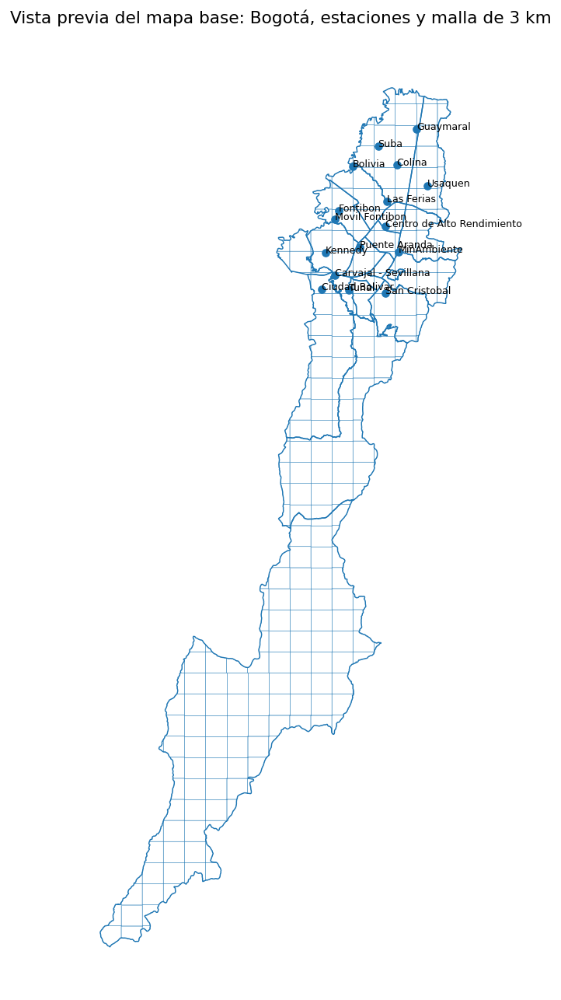

In [60]:
# =========================================================
# CELDA 1. VISTA PREVIA DEL MAPA BASE DE BOGOTÁ
# (solo visualización, sin guardar)
# =========================================================

from pathlib import Path
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

# ---------------------------------------------------------
# 0. Ruta base del proyecto
# ---------------------------------------------------------
BASE = Path(r"D:\TRABAJO DE GRADO BEN-MAP")

# ---------------------------------------------------------
# 1. Funciones auxiliares
# ---------------------------------------------------------
def buscar_primero(rutas_candidatas):
    for ruta in rutas_candidatas:
        if Path(ruta).exists():
            return Path(ruta)
    return None

def buscar_shapefile_en_carpeta(carpeta):
    carpeta = Path(carpeta)
    if not carpeta.exists():
        return None
    shp = list(carpeta.rglob("*.shp"))
    return shp[0] if shp else None

def normalizar_col(s):
    return str(s).strip().lower().replace("á", "a").replace("é", "e").replace("í", "i").replace("ó", "o").replace("ú", "u")

def encontrar_columna(cols, candidatos):
    mapa = {normalizar_col(c): c for c in cols}
    for cand in candidatos:
        cand_n = normalizar_col(cand)
        if cand_n in mapa:
            return mapa[cand_n]
    return None

# ---------------------------------------------------------
# 2. Buscar archivos espaciales
# ---------------------------------------------------------
# shapefile/localidades Bogotá
ruta_bogota = buscar_shapefile_en_carpeta(BASE / "GRILLA-GEOVISOR MAPAS BEN-MAP" / "bogota")

# malla 3 km
ruta_grid = buscar_primero([
    BASE / "Qgis" / "grid_3km_time_idw_2020_2024.gpkg",
    BASE / "RESULTADOS_FINALES" / "01_insumos_resultados" / "adveccion_difusion" / "grid_3km_time_idw_2020_2024.gpkg",
])

# panel/estaciones
ruta_estaciones = buscar_primero([
    BASE / "RESULTADOS_FINALES" / "01_insumos_resultados" / "panel" / "panel_ambiental_mensual_2020_2024_coords_corregidas.csv",
    BASE / "CODIGO" / "panel_ambiental_mensual_2020_2024_coords_corregidas.csv",
    BASE / "CODIGO" / "estaciones_rmcab_coordenadas_corregidas_y_celda_3km.csv",
])

print("=" * 90)
print("RUTAS DETECTADAS PARA EL MAPA BASE")
print("=" * 90)
print("Bogotá/localidades :", ruta_bogota)
print("Malla 3 km         :", ruta_grid)
print("Estaciones/panel   :", ruta_estaciones)

if ruta_bogota is None:
    raise FileNotFoundError("No se encontró el shapefile de Bogotá/localidades.")
if ruta_grid is None:
    raise FileNotFoundError("No se encontró el archivo de la malla 3 km.")
if ruta_estaciones is None:
    raise FileNotFoundError("No se encontró el archivo de estaciones/panel.")

# ---------------------------------------------------------
# 3. Cargar capas
# ---------------------------------------------------------
gdf_bogota = gpd.read_file(ruta_bogota)
gdf_grid = gpd.read_file(ruta_grid)

df_est = pd.read_csv(ruta_estaciones, encoding="utf-8-sig", low_memory=False)
df_est.columns = [str(c).replace("\ufeff", "").strip() for c in df_est.columns]

# ---------------------------------------------------------
# 4. Detectar columnas de estaciones
# ---------------------------------------------------------
col_estacion = encontrar_columna(df_est.columns, ["Estacion", "station", "nombre_estacion"])
col_lat = encontrar_columna(df_est.columns, ["lat", "latitude"])
col_lon = encontrar_columna(df_est.columns, ["lon", "longitude", "long"])
col_x = encontrar_columna(df_est.columns, ["x_3116", "x", "este"])
col_y = encontrar_columna(df_est.columns, ["y_3116", "y", "norte"])

if col_estacion is None:
    raise ValueError(f"No se encontró columna de nombre de estación. Columnas disponibles: {list(df_est.columns)}")

# deduplicar estaciones
if (col_x is not None) and (col_y is not None):
    df_est_uni = df_est[[col_estacion, col_x, col_y]].dropna().drop_duplicates(subset=[col_estacion]).copy()
    gdf_est = gpd.GeoDataFrame(
        df_est_uni,
        geometry=gpd.points_from_xy(df_est_uni[col_x], df_est_uni[col_y]),
        crs="EPSG:3116"
    )
elif (col_lon is not None) and (col_lat is not None):
    df_est_uni = df_est[[col_estacion, col_lon, col_lat]].dropna().drop_duplicates(subset=[col_estacion]).copy()
    gdf_est = gpd.GeoDataFrame(
        df_est_uni,
        geometry=gpd.points_from_xy(df_est_uni[col_lon], df_est_uni[col_lat]),
        crs="EPSG:4326"
    )
else:
    raise ValueError(
        "No se encontraron coordenadas válidas para las estaciones. "
        f"Columnas disponibles: {list(df_est.columns)}"
    )

# ---------------------------------------------------------
# 5. Homologar CRS
# ---------------------------------------------------------
crs_objetivo = gdf_grid.crs if gdf_grid.crs is not None else gdf_bogota.crs

if gdf_bogota.crs != crs_objetivo:
    gdf_bogota = gdf_bogota.to_crs(crs_objetivo)

if gdf_grid.crs != crs_objetivo:
    gdf_grid = gdf_grid.to_crs(crs_objetivo)

if gdf_est.crs != crs_objetivo:
    gdf_est = gdf_est.to_crs(crs_objetivo)

# ---------------------------------------------------------
# 6. Resumen rápido
# ---------------------------------------------------------
print("\n" + "=" * 90)
print("RESUMEN DE CAPAS")
print("=" * 90)
print("Localidades/polígonos:", len(gdf_bogota))
print("Celdas de la malla   :", len(gdf_grid))
print("Estaciones únicas    :", len(gdf_est))

# ---------------------------------------------------------
# 7. Vista previa del mapa base
# ---------------------------------------------------------
fig, ax = plt.subplots(figsize=(10, 10))

# Bogotá/localidades
gdf_bogota.boundary.plot(ax=ax, linewidth=0.8)

# malla
gdf_grid.boundary.plot(ax=ax, linewidth=0.35, alpha=0.6)

# estaciones
gdf_est.plot(ax=ax, markersize=24)

# etiquetas de estaciones
for _, row in gdf_est.iterrows():
    x, y = row.geometry.x, row.geometry.y
    ax.text(x, y, str(row[col_estacion]), fontsize=7)

ax.set_title("Vista previa del mapa base: Bogotá, estaciones y malla de 3 km", fontsize=12)
ax.set_axis_off()
plt.tight_layout()
plt.show()

# Celda 1B. Vista previa mejorada del mapa base de Bogotá

En esta celda se genera una versión más legible del mapa base del estudio, manteniendo los límites de Bogotá, la malla regular de 3 km y la ubicación de las estaciones de monitoreo. La finalidad es mejorar la interpretación visual del mapa, reduciendo el solapamiento entre etiquetas y diferenciando mejor los elementos espaciales.

Esta salida sigue siendo solo de visualización y no se guarda en disco.

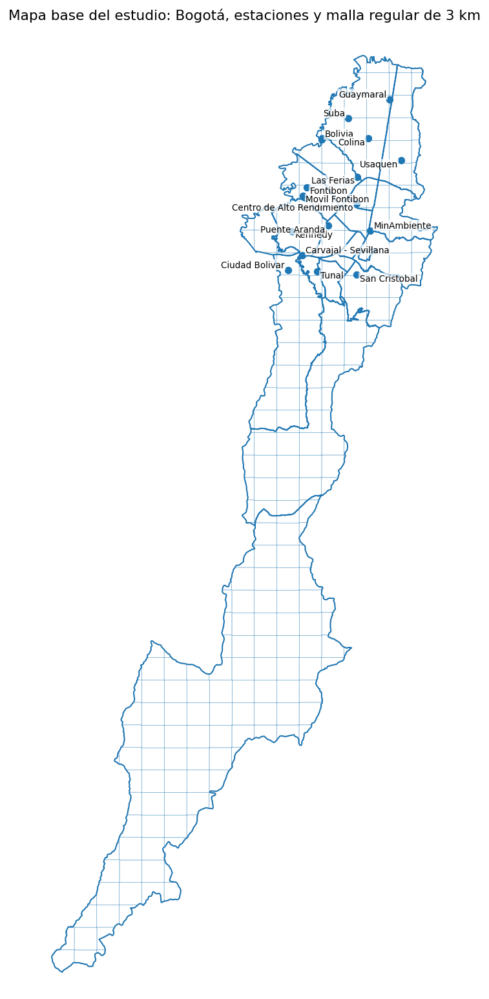

In [61]:
# =========================================================
# CELDA 1B. VISTA PREVIA MEJORADA DEL MAPA BASE
# (solo visualización, sin guardar)
# =========================================================

import matplotlib.pyplot as plt

# ---------------------------------------------------------
# 1. Copias de trabajo
# ---------------------------------------------------------
gdf_bog = gdf_bogota.copy()
gdf_malla = gdf_grid.copy()
gdf_pts = gdf_est.copy()

# ---------------------------------------------------------
# 2. Recuadro espacial
#    Se mantiene Bogotá completa, pero con mejor margen
# ---------------------------------------------------------
xmin, ymin, xmax, ymax = gdf_bog.total_bounds
dx = xmax - xmin
dy = ymax - ymin

# ---------------------------------------------------------
# 3. Figura
# ---------------------------------------------------------
fig, ax = plt.subplots(figsize=(8, 12))

# Fondo de localidades
gdf_bog.plot(ax=ax, color="white", edgecolor="0.65", linewidth=0.8)

# Malla
gdf_malla.boundary.plot(ax=ax, linewidth=0.35, alpha=0.45)

# Contorno externo más fuerte
gdf_bog.boundary.plot(ax=ax, linewidth=1.1)

# Estaciones
gdf_pts.plot(ax=ax, markersize=28)

# ---------------------------------------------------------
# 4. Etiquetas con pequeño desplazamiento alternado
# ---------------------------------------------------------
for i, (_, row) in enumerate(gdf_pts.iterrows()):
    x, y = row.geometry.x, row.geometry.y
    nombre = str(row[col_estacion])

    # desplazamiento alternado para evitar choques
    dx_txt = dx * (0.008 if i % 2 == 0 else -0.008)
    dy_txt = dy * (0.006 if i % 3 == 0 else -0.004)

    ax.text(
        x + dx_txt,
        y + dy_txt,
        nombre,
        fontsize=7.5,
        ha="left" if dx_txt > 0 else "right",
        va="center",
        bbox=dict(facecolor="white", edgecolor="none", alpha=0.7, pad=0.8)
    )

# ---------------------------------------------------------
# 5. Estética general
# ---------------------------------------------------------
ax.set_title("Mapa base del estudio: Bogotá, estaciones y malla regular de 3 km", fontsize=12)
ax.set_xlim(xmin - dx * 0.03, xmax + dx * 0.03)
ax.set_ylim(ymin - dy * 0.02, ymax + dy * 0.02)
ax.set_axis_off()

plt.tight_layout()
plt.show()

# Celda 1C. Vista mejorada del mapa base del estudio

En esta celda se genera una versión más estética y legible del mapa base del estudio, diferenciando visualmente tres elementos: el contorno de Bogotá y sus localidades, la malla regular de 3 km y la ubicación de las estaciones de monitoreo.

La mejora visual se basa en una jerarquía gráfica más clara: rellenos suaves para el fondo territorial, líneas tenues para la malla, un contorno más visible para el límite del área de estudio y marcadores contrastantes para las estaciones. Esta salida es únicamente de visualización y no se guarda todavía.

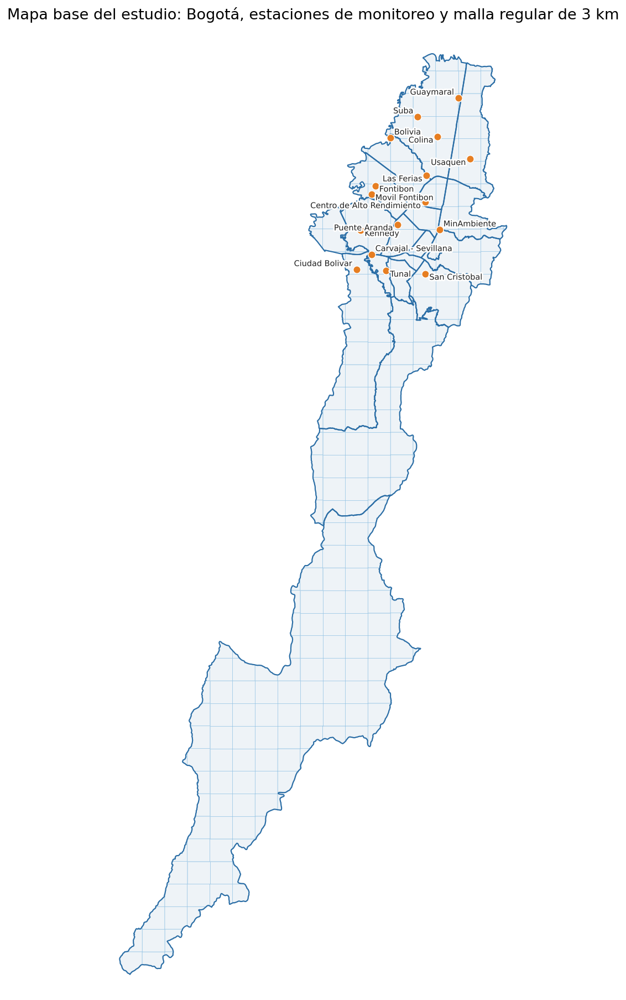

In [62]:
# =========================================================
# CELDA 1C. MAPA BASE MÁS ESTÉTICO Y LEGIBLE
# (solo visualización, sin guardar)
# =========================================================

import matplotlib.pyplot as plt
import matplotlib.patheffects as pe

# ---------------------------------------------------------
# 1. Copias de trabajo
# ---------------------------------------------------------
gdf_bog = gdf_bogota.copy()
gdf_malla = gdf_grid.copy()
gdf_pts = gdf_est.copy()

# ---------------------------------------------------------
# 2. Límites del mapa
# ---------------------------------------------------------
xmin, ymin, xmax, ymax = gdf_bog.total_bounds
dx = xmax - xmin
dy = ymax - ymin

# ---------------------------------------------------------
# 3. Figura
# ---------------------------------------------------------
fig, ax = plt.subplots(figsize=(8, 14))
fig.patch.set_facecolor("white")
ax.set_facecolor("white")

# ---------------------------------------------------------
# 4. Fondo: localidades de Bogotá
# ---------------------------------------------------------
gdf_bog.plot(
    ax=ax,
    color="#eef3f7",        # gris-azulado muy suave
    edgecolor="#9aa7b3",
    linewidth=0.6,
    zorder=1
)

# ---------------------------------------------------------
# 5. Malla 3 km
# ---------------------------------------------------------
gdf_malla.boundary.plot(
    ax=ax,
    color="#8fc1e3",        # azul claro
    linewidth=0.35,
    alpha=0.75,
    zorder=2
)

# ---------------------------------------------------------
# 6. Contorno externo de Bogotá
# ---------------------------------------------------------
gdf_bog.boundary.plot(
    ax=ax,
    color="#2b6ea6",        # azul más fuerte
    linewidth=1.2,
    zorder=3
)

# ---------------------------------------------------------
# 7. Estaciones
# ---------------------------------------------------------
gdf_pts.plot(
    ax=ax,
    color="#e67e22",        # naranja
    edgecolor="white",
    linewidth=0.8,
    markersize=55,
    zorder=4
)

# ---------------------------------------------------------
# 8. Etiquetas de estaciones con halo blanco
# ---------------------------------------------------------
for i, (_, row) in enumerate(gdf_pts.iterrows()):
    x, y = row.geometry.x, row.geometry.y
    nombre = str(row[col_estacion])

    # desplazamientos alternados para reducir solapamiento
    offset_x = dx * (0.010 if i % 2 == 0 else -0.010)
    offset_y = dy * (0.006 if i % 3 == 0 else -0.004)

    txt = ax.text(
        x + offset_x,
        y + offset_y,
        nombre,
        fontsize=8,
        color="#1f1f1f",
        ha="left" if offset_x > 0 else "right",
        va="center",
        zorder=5
    )

    # halo/blanco alrededor del texto
    txt.set_path_effects([
        pe.Stroke(linewidth=3, foreground="white"),
        pe.Normal()
    ])

# ---------------------------------------------------------
# 9. Título
# ---------------------------------------------------------
ax.set_title(
    "Mapa base del estudio: Bogotá, estaciones de monitoreo y malla regular de 3 km",
    fontsize=15,
    pad=16
)

# ---------------------------------------------------------
# 10. Ajustes finales
# ---------------------------------------------------------
ax.set_xlim(xmin - dx * 0.03, xmax + dx * 0.03)
ax.set_ylim(ymin - dy * 0.02, ymax + dy * 0.02)
ax.set_axis_off()

plt.tight_layout()
plt.show()

# Celda 1D. Mapa base del estudio con estaciones diferenciadas por color

En esta celda se genera una versión mejorada del mapa base del estudio. Cada estación de monitoreo se representa con un color específico y ese mismo color se replica en una tabla lateral de identificación, con el fin de facilitar la lectura del mapa y mejorar su presentación para el capítulo de resultados.

La figura mantiene como fondo el límite de Bogotá y sus localidades, superpone la malla regular de 3 km y destaca la ubicación de las estaciones con colores diferenciados. Esta salida es solo de visualización y no se guarda todavía.

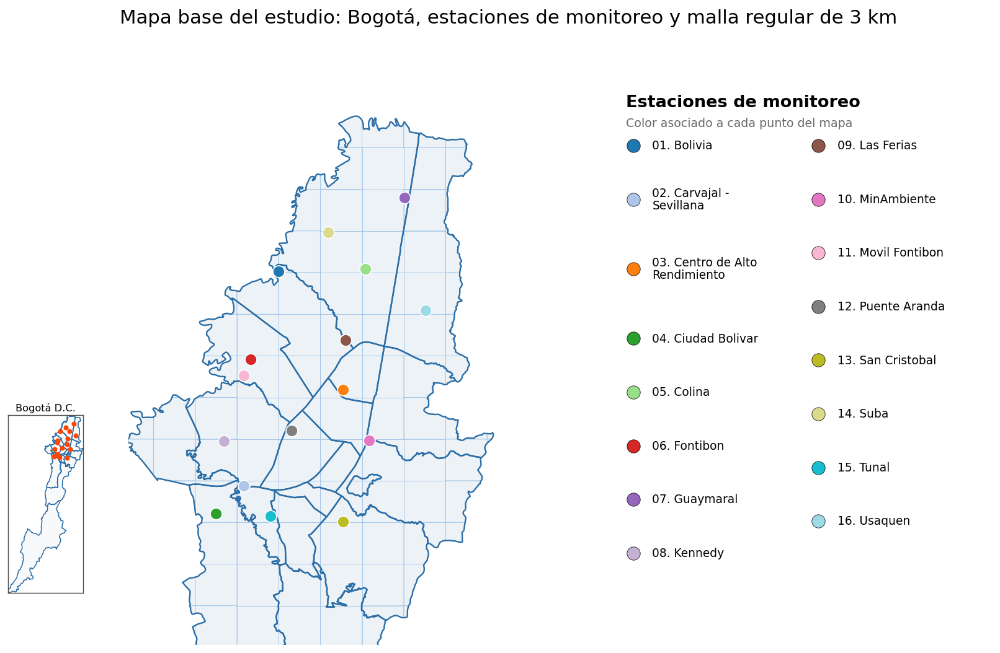

In [63]:
# =========================================================
# MAPA BASE MEJORADO:
# Bogotá + malla 3 km + estaciones de monitoreo
# con leyenda organizada y recuadro inset mejor ubicado
# =========================================================

import math
import textwrap
import matplotlib.pyplot as plt
from matplotlib import gridspec
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

# ---------------------------------------------------------
# 1. Copias de trabajo
# ---------------------------------------------------------
gdf_bog = gdf_bogota.copy()
gdf_malla = gdf_grid.copy()
gdf_pts = gdf_est.copy()

# ---------------------------------------------------------
# 2. Estaciones y colores
# ---------------------------------------------------------
estaciones_unicas = sorted(gdf_pts[col_estacion].astype(str).unique().tolist())

cmap = plt.cm.get_cmap("tab20", len(estaciones_unicas))
colores_est = {est: cmap(i) for i, est in enumerate(estaciones_unicas)}
gdf_pts["color_estacion"] = gdf_pts[col_estacion].astype(str).map(colores_est)

# ---------------------------------------------------------
# 3. Límites
# ---------------------------------------------------------
xmin_b, ymin_b, xmax_b, ymax_b = gdf_bog.total_bounds
xmin_p, ymin_p, xmax_p, ymax_p = gdf_pts.total_bounds

dxp = xmax_p - xmin_p
dyp = ymax_p - ymin_p

zoom_pad_x = dxp * 0.42
zoom_pad_y = dyp * 0.38

xmin_z = xmin_p - zoom_pad_x
xmax_z = xmax_p + zoom_pad_x
ymin_z = ymin_p - zoom_pad_y
ymax_z = ymax_p + zoom_pad_y

# ---------------------------------------------------------
# 4. Función para partir nombres largos
# ---------------------------------------------------------
def partir_texto(nombre, ancho=20):
    return "\n".join(textwrap.wrap(str(nombre), width=ancho, break_long_words=False))

# ---------------------------------------------------------
# 5. Figura y layout
#    Se deja un poco menos dominante el mapa principal
# ---------------------------------------------------------
fig = plt.figure(figsize=(15, 9.2))
gs = gridspec.GridSpec(
    nrows=1,
    ncols=2,
    width_ratios=[2.75, 1.95],   # mapa un poco más pequeño
    wspace=0.06
)

ax_map = fig.add_subplot(gs[0, 0])
ax_leg = fig.add_subplot(gs[0, 1])

# ---------------------------------------------------------
# 6. MAPA PRINCIPAL
# ---------------------------------------------------------
gdf_bog.plot(
    ax=ax_map,
    color="#edf2f7",
    edgecolor="#9aa7b3",
    linewidth=0.7,
    zorder=1
)

gdf_malla.boundary.plot(
    ax=ax_map,
    color="#9fc5e8",
    linewidth=0.45,
    alpha=0.90,
    zorder=2
)

gdf_bog.boundary.plot(
    ax=ax_map,
    color="#2b6ea6",
    linewidth=1.3,
    zorder=3
)

for est in estaciones_unicas:
    sub = gdf_pts[gdf_pts[col_estacion].astype(str) == est]
    sub.plot(
        ax=ax_map,
        color=colores_est[est],
        edgecolor="white",
        linewidth=0.9,
        markersize=110,
        zorder=4
    )

ax_map.set_xlim(xmin_z, xmax_z)
ax_map.set_ylim(ymin_z, ymax_z)
ax_map.set_axis_off()

fig.suptitle(
    "Mapa base del estudio: Bogotá, estaciones de monitoreo y malla regular de 3 km",
    fontsize=17,
    y=0.97
)

# ---------------------------------------------------------
# 7. INSET: Bogotá completa
#    Se ubica en la franja izquierda de la figura
# ---------------------------------------------------------
ax_inset = fig.add_axes([0.075, 0.18, 0.085, 0.24])
# [left, bottom, width, height]

gdf_bog.plot(
    ax=ax_inset,
    color="#f7f9fb",
    edgecolor="#9aa7b3",
    linewidth=0.5,
    zorder=1
)

gdf_bog.boundary.plot(
    ax=ax_inset,
    color="#2b6ea6",
    linewidth=0.8,
    zorder=2
)

gdf_pts.plot(
    ax=ax_inset,
    color="orangered",
    markersize=12,
    zorder=3
)

ax_inset.set_xlim(xmin_b, xmax_b)
ax_inset.set_ylim(ymin_b, ymax_b)
ax_inset.set_xticks([])
ax_inset.set_yticks([])
ax_inset.set_title("Bogotá D.C.", fontsize=9, pad=4)

for spine in ax_inset.spines.values():
    spine.set_edgecolor("#4d4d4d")
    spine.set_linewidth(0.8)

# ---------------------------------------------------------
# 8. LEYENDA LATERAL
# ---------------------------------------------------------
ax_leg.set_axis_off()
ax_leg.set_xlim(0, 1)
ax_leg.set_ylim(0, 1)

ax_leg.text(
    0.03, 0.965,
    "Estaciones de monitoreo",
    fontsize=15,
    fontweight="bold",
    va="top"
)

ax_leg.text(
    0.03, 0.925,
    "Color asociado a cada punto del mapa",
    fontsize=10.5,
    color="dimgray",
    va="top"
)

# dividir estaciones en dos columnas
n_total = len(estaciones_unicas)
mitad = math.ceil(n_total / 2)

col_izq = estaciones_unicas[:mitad]
col_der = estaciones_unicas[mitad:]

def dibujar_columna(ax, lista_estaciones, x_punto, x_texto,
                    y_inicio=0.88, salto_base=0.085,
                    salto_linea_extra=0.026, ancho_wrap=18):
    y = y_inicio
    for idx_global, est in lista_estaciones:
        texto = f"{idx_global:02d}. {partir_texto(est, ancho=ancho_wrap)}"
        n_lineas = texto.count("\n") + 1

        ax.scatter(
            x_punto, y,
            s=140,
            color=colores_est[est],
            edgecolors="black",
            linewidths=0.4,
            zorder=3
        )

        ax.text(
            x_texto, y,
            texto,
            fontsize=10.3,
            va="center",
            ha="left",
            linespacing=1.1
        )

        y -= salto_base + (n_lineas - 1) * salto_linea_extra

col_izq_num = list(enumerate(col_izq, start=1))
col_der_num = list(enumerate(col_der, start=mitad + 1))

dibujar_columna(
    ax_leg,
    col_izq_num,
    x_punto=0.05,
    x_texto=0.10,
    y_inicio=0.875,
    salto_base=0.094,
    salto_linea_extra=0.028,
    ancho_wrap=18
)

dibujar_columna(
    ax_leg,
    col_der_num,
    x_punto=0.54,
    x_texto=0.59,
    y_inicio=0.875,
    salto_base=0.094,
    salto_linea_extra=0.028,
    ancho_wrap=16
)

plt.tight_layout()
plt.show()

# Celda 2. Vista previa de los mapas promedio interpolados 2020–2024

En esta celda se construyen los mapas promedio del campo interpolado para PM2.5, NO2 y O3 sobre la malla regular de 3 km, utilizando la geometría de la grilla y la base tabular mensual del esquema A–D. La finalidad es visualizar la distribución espacial media de las concentraciones interpoladas durante el periodo 2020–2024, antes de la etapa de modelación jerárquica bayesiana.

En esta etapa las figuras se muestran únicamente en pantalla y no se guardan todavía.

RUTAS DETECTADAS
Geometría malla : D:\TRABAJO DE GRADO BEN-MAP\Qgis\grid_3km_time_idw_2020_2024.gpkg
Base tabular A-D: D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\adveccion_difusion\grid_3km_AD_mensual_2020_2024.csv

COLUMNAS EN GPKG
['cell_id', 'LocNombre', 'geometry']

COLUMNAS EN CSV A-D
['cell_id', 'fecha', 'PM25_idw', 'NO2_idw', 'O3_idw', 'Vel_viento_idw', 'diff_PM25_grid', 'grad_PM25_grid', 'adv_proxy_PM25_grid', 'diff_NO2_grid', 'grad_NO2_grid', 'adv_proxy_NO2_grid', 'diff_O3_grid', 'grad_O3_grid', 'adv_proxy_O3_grid']

RESUMEN DE UNIÓN
Celdas en malla: 254
Celdas con promedio unido: 254


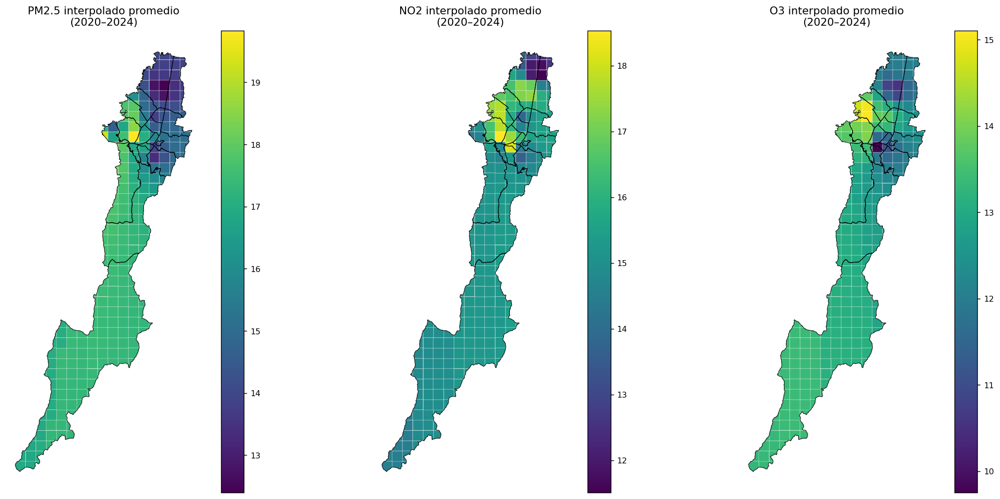


RESUMEN RÁPIDO DE LOS MAPAS PROMEDIO INTERPOLADOS


,Contaminante,Media espacial,Mínimo espacial,Máximo espacial
0,PM2.5,16.612200,12.398900,19.826400
1,NO2,15.161600,11.507500,18.529500
2,O3,12.935600,9.752500,15.101600


In [64]:
# =========================================================
# CELDA 2. VISTA PREVIA DE MAPAS PROMEDIO INTERPOLADOS 2020-2024
# usando:
# - GPKG = geometría de la malla
# - CSV  = variables mensuales A-D / interpoladas
# (solo visualización, sin guardar)
# =========================================================

from pathlib import Path
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

# ---------------------------------------------------------
# 1. Rutas candidatas
# ---------------------------------------------------------
ruta_gpkg_candidatas = [
    Path(r"D:\TRABAJO DE GRADO BEN-MAP\Qgis\grid_3km_time_idw_2020_2024.gpkg"),
    Path(r"D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\adveccion_difusion\grid_3km_time_idw_2020_2024.gpkg"),
]

ruta_csv_candidatas = [
    Path(r"D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\adveccion_difusion\grid_3km_AD_mensual_2020_2024.csv"),
    Path(r"D:\TRABAJO DE GRADO BEN-MAP\CODIGO\grid_3km_AD_mensual_2020_2024.csv"),
]

def buscar_primero(lista_rutas):
    for ruta in lista_rutas:
        if ruta.exists():
            return ruta
    return None

ruta_gpkg = buscar_primero(ruta_gpkg_candidatas)
ruta_csv = buscar_primero(ruta_csv_candidatas)

print("=" * 90)
print("RUTAS DETECTADAS")
print("=" * 90)
print("Geometría malla :", ruta_gpkg)
print("Base tabular A-D:", ruta_csv)

if ruta_gpkg is None:
    raise FileNotFoundError("No se encontró el archivo GPKG de la malla.")
if ruta_csv is None:
    raise FileNotFoundError("No se encontró el CSV mensual del esquema A–D.")

# ---------------------------------------------------------
# 2. Cargar geometría de la malla
# ---------------------------------------------------------
gdf_grid_base = gpd.read_file(ruta_gpkg)
gdf_grid_base.columns = [str(c).replace("\ufeff", "").strip() for c in gdf_grid_base.columns]

print("\n" + "=" * 90)
print("COLUMNAS EN GPKG")
print("=" * 90)
print(list(gdf_grid_base.columns))

if "cell_id" not in gdf_grid_base.columns:
    raise ValueError(f"El GPKG no contiene 'cell_id'. Columnas: {list(gdf_grid_base.columns)}")

# ---------------------------------------------------------
# 3. Cargar base tabular mensual
# ---------------------------------------------------------
df_ad = pd.read_csv(ruta_csv, encoding="utf-8-sig", low_memory=False)
df_ad.columns = [str(c).replace("\ufeff", "").strip() for c in df_ad.columns]

print("\n" + "=" * 90)
print("COLUMNAS EN CSV A-D")
print("=" * 90)
print(list(df_ad.columns))

# ---------------------------------------------------------
# 4. Detectar columnas de concentración interpolada
# ---------------------------------------------------------
def buscar_columna(df_cols, candidatos):
    cols_norm = {str(c).strip().lower(): c for c in df_cols}
    for cand in candidatos:
        cand_norm = cand.strip().lower()
        if cand_norm in cols_norm:
            return cols_norm[cand_norm]
    return None

col_cell = buscar_columna(df_ad.columns, ["cell_id"])
col_pm25 = buscar_columna(df_ad.columns, ["PM25_idw", "pm25_idw"])
col_no2  = buscar_columna(df_ad.columns, ["NO2_idw", "no2_idw"])
col_o3   = buscar_columna(df_ad.columns, ["O3_idw", "o3_idw"])
col_fecha = buscar_columna(df_ad.columns, ["fecha", "date"])

faltantes = []
for nombre, col in {
    "cell_id": col_cell,
    "PM25_idw": col_pm25,
    "NO2_idw": col_no2,
    "O3_idw": col_o3
}.items():
    if col is None:
        faltantes.append(nombre)

if faltantes:
    raise ValueError(
        f"No se encontraron columnas necesarias en el CSV A-D: {faltantes}. "
        f"Columnas disponibles: {list(df_ad.columns)}"
    )

# ---------------------------------------------------------
# 5. Promedio 2020–2024 por celda
# ---------------------------------------------------------
tabla_prom = (
    df_ad[[col_cell, col_pm25, col_no2, col_o3]]
    .groupby(col_cell, as_index=False)
    .mean()
)

tabla_prom = tabla_prom.rename(columns={
    col_cell: "cell_id",
    col_pm25: "PM25_idw_mean",
    col_no2:  "NO2_idw_mean",
    col_o3:   "O3_idw_mean"
})

# ---------------------------------------------------------
# 6. Unir tabla promedio con geometría
# ---------------------------------------------------------
gdf_prom = gdf_grid_base.merge(tabla_prom, on="cell_id", how="left")

print("\n" + "=" * 90)
print("RESUMEN DE UNIÓN")
print("=" * 90)
print("Celdas en malla:", len(gdf_grid_base))
print("Celdas con promedio unido:", gdf_prom["PM25_idw_mean"].notna().sum())

# ---------------------------------------------------------
# 7. Elegir contorno de Bogotá para superponer
# ---------------------------------------------------------
if "gdf_bog" in globals():
    capa_bogota = gdf_bog
elif "gdf_bogota" in globals():
    capa_bogota = gdf_bogota
else:
    capa_bogota = None

if capa_bogota is not None and capa_bogota.crs != gdf_prom.crs:
    capa_bogota = capa_bogota.to_crs(gdf_prom.crs)

# ---------------------------------------------------------
# 8. Figura de tres paneles
# ---------------------------------------------------------
fig, axes = plt.subplots(1, 3, figsize=(18, 8))
fig.patch.set_facecolor("white")

mapas = [
    ("PM25_idw_mean", "PM2.5 interpolado promedio\n(2020–2024)"),
    ("NO2_idw_mean",  "NO2 interpolado promedio\n(2020–2024)"),
    ("O3_idw_mean",   "O3 interpolado promedio\n(2020–2024)")
]

for ax, (columna, titulo) in zip(axes, mapas):
    gdf_prom.plot(
        column=columna,
        ax=ax,
        legend=True,
        linewidth=0.20,
        edgecolor="white"
    )

    if capa_bogota is not None:
        capa_bogota.boundary.plot(ax=ax, color="black", linewidth=0.6)

    ax.set_title(titulo, fontsize=12)
    ax.set_axis_off()

plt.tight_layout()
plt.show()

# ---------------------------------------------------------
# 9. Resumen numérico rápido
# ---------------------------------------------------------
tabla_resumen_interp = pd.DataFrame({
    "Contaminante": ["PM2.5", "NO2", "O3"],
    "Media espacial": [
        gdf_prom["PM25_idw_mean"].mean(),
        gdf_prom["NO2_idw_mean"].mean(),
        gdf_prom["O3_idw_mean"].mean()
    ],
    "Mínimo espacial": [
        gdf_prom["PM25_idw_mean"].min(),
        gdf_prom["NO2_idw_mean"].min(),
        gdf_prom["O3_idw_mean"].min()
    ],
    "Máximo espacial": [
        gdf_prom["PM25_idw_mean"].max(),
        gdf_prom["NO2_idw_mean"].max(),
        gdf_prom["O3_idw_mean"].max()
    ]
}).round(4)

print("\n" + "=" * 90)
print("RESUMEN RÁPIDO DE LOS MAPAS PROMEDIO INTERPOLADOS")
print("=" * 90)
display(tabla_resumen_interp)

# Celda 3. Vista previa de mapas anuales del campo interpolado (2020–2024)

En esta celda se construyen mapas anuales promedio del campo interpolado para PM2.5, NO2 y O3 sobre la malla regular de 3 km. Para cada año del periodo 2020–2024 se calcula el promedio de las concentraciones interpoladas por celda y se generan tres paneles comparativos, uno por contaminante.

La visualización se hace únicamente en pantalla, sin guardar archivos todavía. Además, se fija una escala de color consistente por contaminante entre todos los años, con el fin de facilitar la comparación temporal.

AÑOS DISPONIBLES PARA MAPEO


,anio_mapa,celdas_con_pm25,celdas_con_no2,celdas_con_o3
0,2020,254,254,254
1,2021,254,254,254
2,2022,254,254,254
3,2023,254,254,254
4,2024,254,254,254


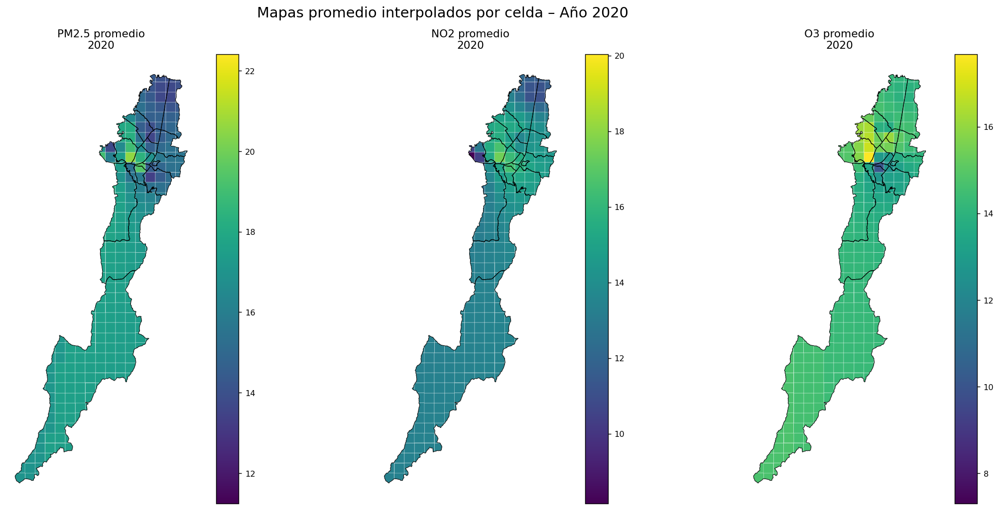

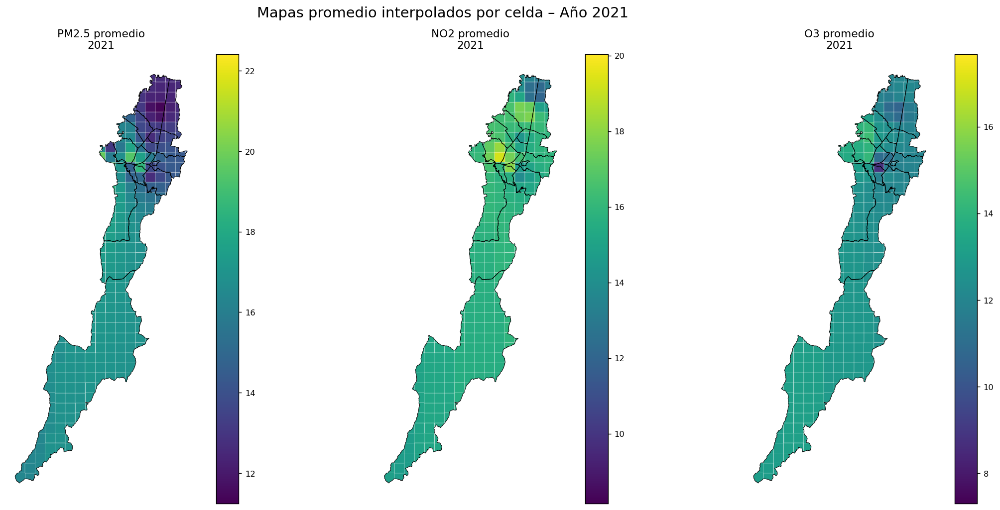

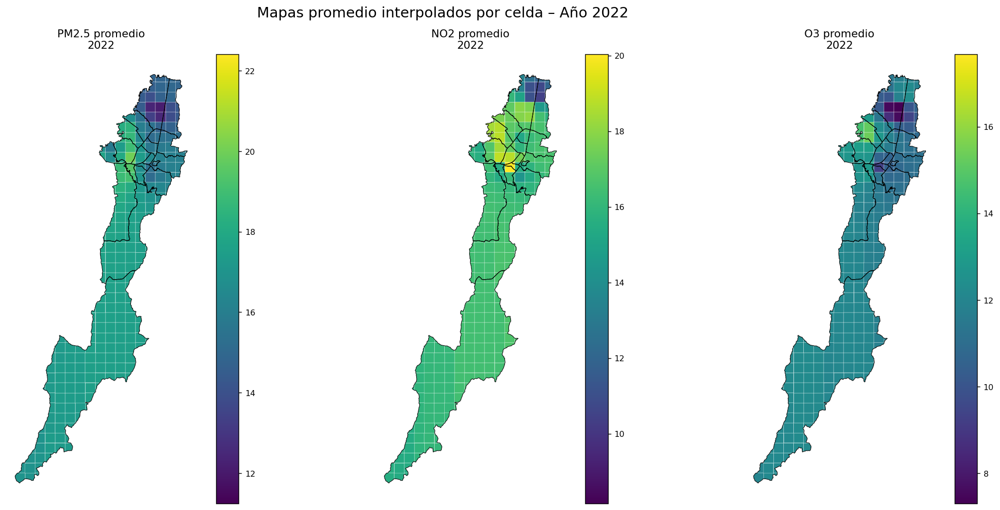

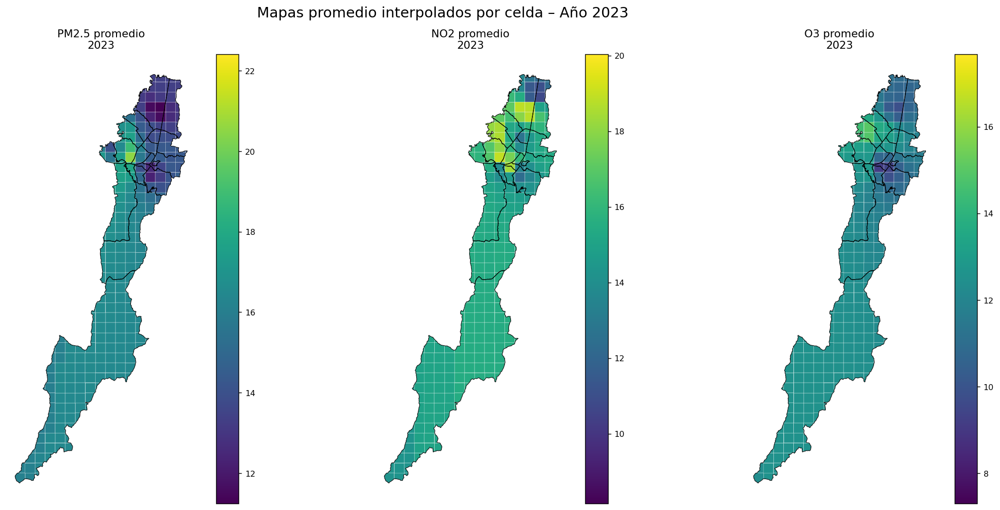

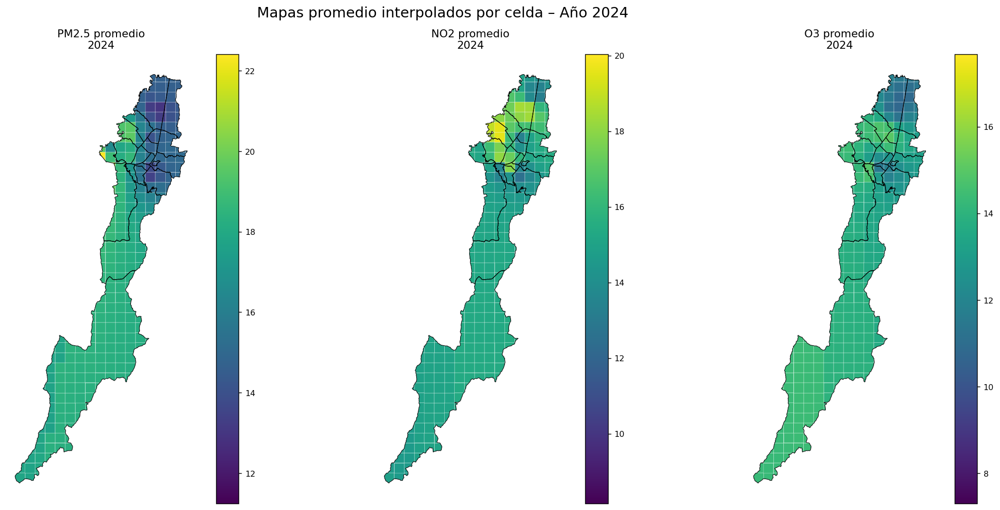

In [65]:
# =========================================================
# CELDA 3. VISTA PREVIA DE MAPAS ANUALES 2020-2024
# PM2.5, NO2 y O3 sobre la malla de 3 km
# (solo visualización, sin guardar)
# =========================================================

from pathlib import Path
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

# ---------------------------------------------------------
# 1. Función auxiliar para detectar columnas
# ---------------------------------------------------------
def buscar_columna(df_cols, candidatos):
    cols_norm = {str(c).replace("\ufeff", "").strip().lower(): c for c in df_cols}
    for cand in candidatos:
        cand_norm = cand.strip().lower()
        if cand_norm in cols_norm:
            return cols_norm[cand_norm]
    return None

# ---------------------------------------------------------
# 2. Cargar datos si no existen en memoria
# ---------------------------------------------------------
if "gdf_grid_base" not in globals():
    ruta_gpkg_candidatas = [
        Path(r"D:\TRABAJO DE GRADO BEN-MAP\Qgis\grid_3km_time_idw_2020_2024.gpkg"),
        Path(r"D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\adveccion_difusion\grid_3km_time_idw_2020_2024.gpkg"),
    ]

    ruta_gpkg = None
    for r in ruta_gpkg_candidatas:
        if r.exists():
            ruta_gpkg = r
            break

    if ruta_gpkg is None:
        raise FileNotFoundError("No se encontró el GPKG de la malla.")

    gdf_grid_base = gpd.read_file(ruta_gpkg)
    gdf_grid_base.columns = [str(c).replace("\ufeff", "").strip() for c in gdf_grid_base.columns]

if "df_ad" not in globals():
    ruta_csv_candidatas = [
        Path(r"D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\adveccion_difusion\grid_3km_AD_mensual_2020_2024.csv"),
        Path(r"D:\TRABAJO DE GRADO BEN-MAP\CODIGO\grid_3km_AD_mensual_2020_2024.csv"),
    ]

    ruta_csv = None
    for r in ruta_csv_candidatas:
        if r.exists():
            ruta_csv = r
            break

    if ruta_csv is None:
        raise FileNotFoundError("No se encontró el CSV del esquema A–D.")

    df_ad = pd.read_csv(ruta_csv, encoding="utf-8-sig", low_memory=False)
    df_ad.columns = [str(c).replace("\ufeff", "").strip() for c in df_ad.columns]

# ---------------------------------------------------------
# 3. Detectar columnas necesarias
# ---------------------------------------------------------
col_cell = buscar_columna(df_ad.columns, ["cell_id"])
col_pm25 = buscar_columna(df_ad.columns, ["PM25_idw", "pm25_idw"])
col_no2  = buscar_columna(df_ad.columns, ["NO2_idw", "no2_idw"])
col_o3   = buscar_columna(df_ad.columns, ["O3_idw", "o3_idw"])
col_fecha = buscar_columna(df_ad.columns, ["fecha", "date"])
col_anio  = buscar_columna(df_ad.columns, ["Año", "Ano", "anio", "year"])

faltantes = []
for nombre, col in {
    "cell_id": col_cell,
    "PM25_idw": col_pm25,
    "NO2_idw": col_no2,
    "O3_idw": col_o3
}.items():
    if col is None:
        faltantes.append(nombre)

if faltantes:
    raise ValueError(
        f"Faltan columnas necesarias en df_ad: {faltantes}. "
        f"Columnas disponibles: {list(df_ad.columns)}"
    )

if col_anio is None and col_fecha is None:
    raise ValueError(
        "No se encontró ni columna de año ni columna de fecha para construir los promedios anuales."
    )

# ---------------------------------------------------------
# 4. Crear columna de año
# ---------------------------------------------------------
df_map = df_ad.copy()

if col_anio is not None:
    df_map["anio_mapa"] = pd.to_numeric(df_map[col_anio], errors="coerce")
else:
    df_map[col_fecha] = pd.to_datetime(df_map[col_fecha], errors="coerce")
    df_map["anio_mapa"] = df_map[col_fecha].dt.year

df_map["anio_mapa"] = pd.to_numeric(df_map["anio_mapa"], errors="coerce")
df_map = df_map[df_map["anio_mapa"].notna()].copy()
df_map["anio_mapa"] = df_map["anio_mapa"].astype(int)

# Filtrar solo 2020–2024 por seguridad
df_map = df_map[df_map["anio_mapa"].between(2020, 2024)].copy()

if df_map.empty:
    raise ValueError("No quedaron datos para el periodo 2020–2024.")

# ---------------------------------------------------------
# 5. Promedio anual por celda
# ---------------------------------------------------------
tabla_anual = (
    df_map[[col_cell, "anio_mapa", col_pm25, col_no2, col_o3]]
    .groupby([col_cell, "anio_mapa"], as_index=False)
    .mean()
)

tabla_anual = tabla_anual.rename(columns={
    col_cell: "cell_id",
    col_pm25: "PM25_idw_mean",
    col_no2:  "NO2_idw_mean",
    col_o3:   "O3_idw_mean"
})

# ---------------------------------------------------------
# 6. Resumen rápido de años disponibles
# ---------------------------------------------------------
resumen_anios = (
    tabla_anual.groupby("anio_mapa")
    .agg(
        celdas_con_pm25=("PM25_idw_mean", lambda s: s.notna().sum()),
        celdas_con_no2=("NO2_idw_mean", lambda s: s.notna().sum()),
        celdas_con_o3=("O3_idw_mean", lambda s: s.notna().sum())
    )
    .reset_index()
)

print("=" * 90)
print("AÑOS DISPONIBLES PARA MAPEO")
print("=" * 90)
display(resumen_anios)

# ---------------------------------------------------------
# 7. Preparar contorno de Bogotá si existe
# ---------------------------------------------------------
if "gdf_bog" in globals():
    capa_bogota = gdf_bog.copy()
elif "gdf_bogota" in globals():
    capa_bogota = gdf_bogota.copy()
else:
    capa_bogota = None

if capa_bogota is not None and capa_bogota.crs != gdf_grid_base.crs:
    capa_bogota = capa_bogota.to_crs(gdf_grid_base.crs)

# ---------------------------------------------------------
# 8. Escalas globales por contaminante
#    (misma escala entre años para comparar bien)
# ---------------------------------------------------------
vmin_pm25 = tabla_anual["PM25_idw_mean"].min()
vmax_pm25 = tabla_anual["PM25_idw_mean"].max()

vmin_no2 = tabla_anual["NO2_idw_mean"].min()
vmax_no2 = tabla_anual["NO2_idw_mean"].max()

vmin_o3 = tabla_anual["O3_idw_mean"].min()
vmax_o3 = tabla_anual["O3_idw_mean"].max()

# ---------------------------------------------------------
# 9. Graficar un bloque por año
# ---------------------------------------------------------
anios = sorted(tabla_anual["anio_mapa"].unique())

for anio in anios:
    tabla_anio = tabla_anual[tabla_anual["anio_mapa"] == anio].copy()
    gdf_anio = gdf_grid_base.merge(tabla_anio, on="cell_id", how="left")

    fig, axes = plt.subplots(1, 3, figsize=(18, 8))
    fig.patch.set_facecolor("white")
    fig.suptitle(f"Mapas promedio interpolados por celda – Año {anio}", fontsize=16, y=0.98)

    mapas = [
        ("PM25_idw_mean", f"PM2.5 promedio\n{anio}", vmin_pm25, vmax_pm25),
        ("NO2_idw_mean",  f"NO2 promedio\n{anio}",  vmin_no2,  vmax_no2),
        ("O3_idw_mean",   f"O3 promedio\n{anio}",   vmin_o3,   vmax_o3),
    ]

    for ax, (columna, titulo, vmin_, vmax_) in zip(axes, mapas):
        gdf_anio.plot(
            column=columna,
            ax=ax,
            legend=True,
            linewidth=0.20,
            edgecolor="white",
            vmin=vmin_,
            vmax=vmax_
        )

        if capa_bogota is not None:
            capa_bogota.boundary.plot(ax=ax, color="black", linewidth=0.6)

        ax.set_title(titulo, fontsize=12)
        ax.set_axis_off()

    plt.tight_layout()
    plt.show()

# Celda 5. Vista previa de mapas anuales del gradiente espacial (escala por km)

En esta celda se generan mapas anuales promedio del gradiente espacial para PM2.5, NO2 y O3 sobre la malla regular de 3 km. Para cada año del periodo 2020–2024 se calcula el promedio anual por celda y se visualizan tres paneles comparativos, uno por contaminante.

Con el fin de facilitar la interpretación, el gradiente espacial se reexpresa en escala por kilómetro. La celda es únicamente de exploración visual y no guarda archivos.

RESUMEN DE CELDAS CON DATOS DE GRADIENTE POR AÑO


,anio_mapa,celdas_grad_pm25,celdas_grad_no2,celdas_grad_o3
0,2020,254,254,254
1,2021,254,254,254
2,2022,254,254,254
3,2023,254,254,254
4,2024,254,254,254


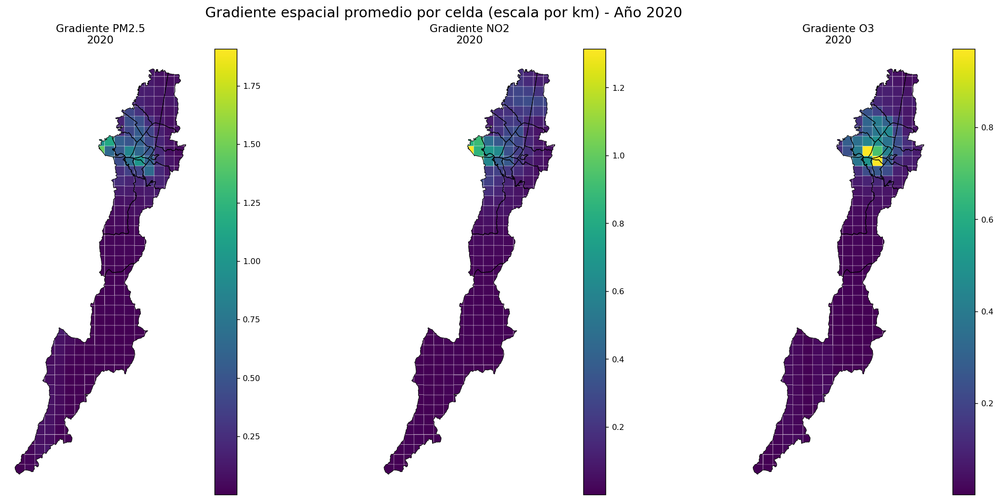

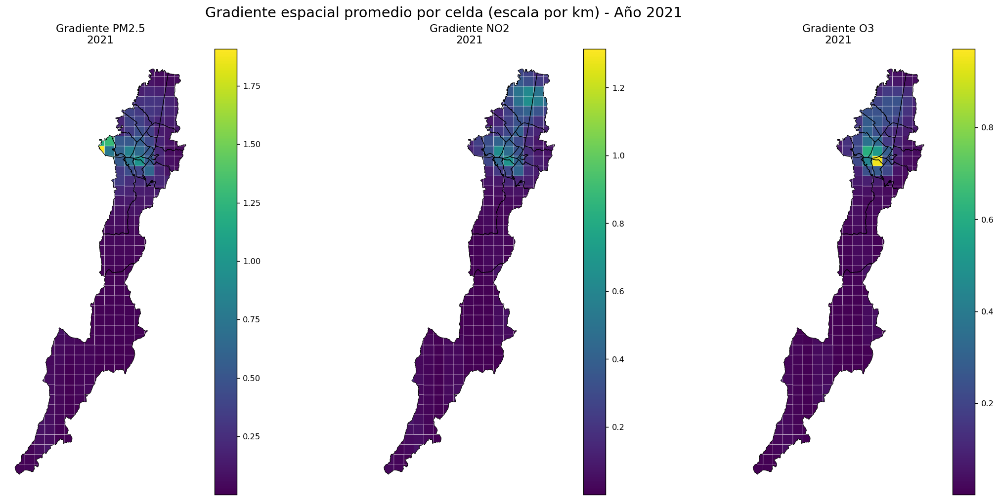

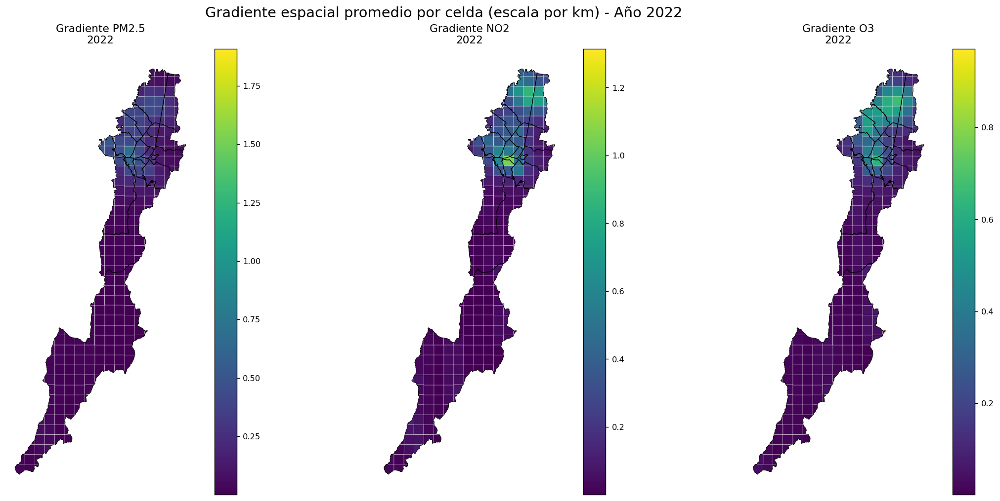

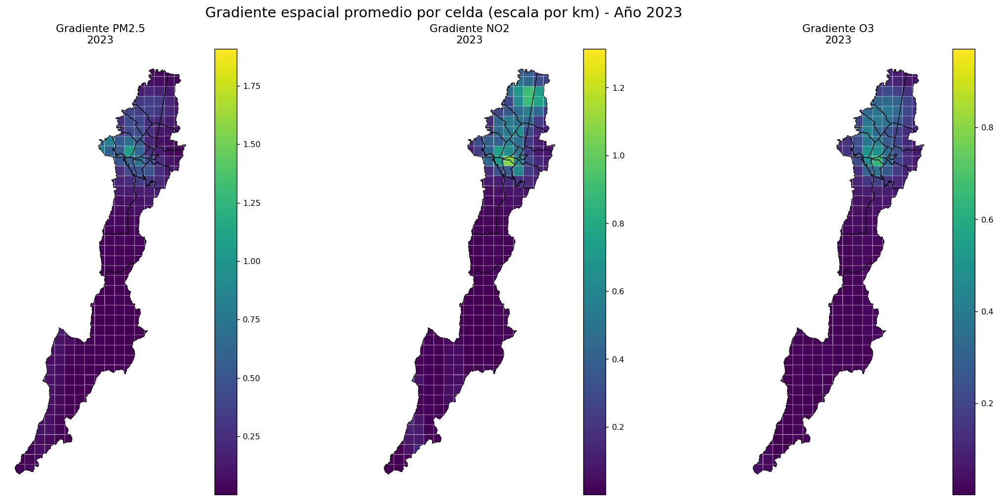

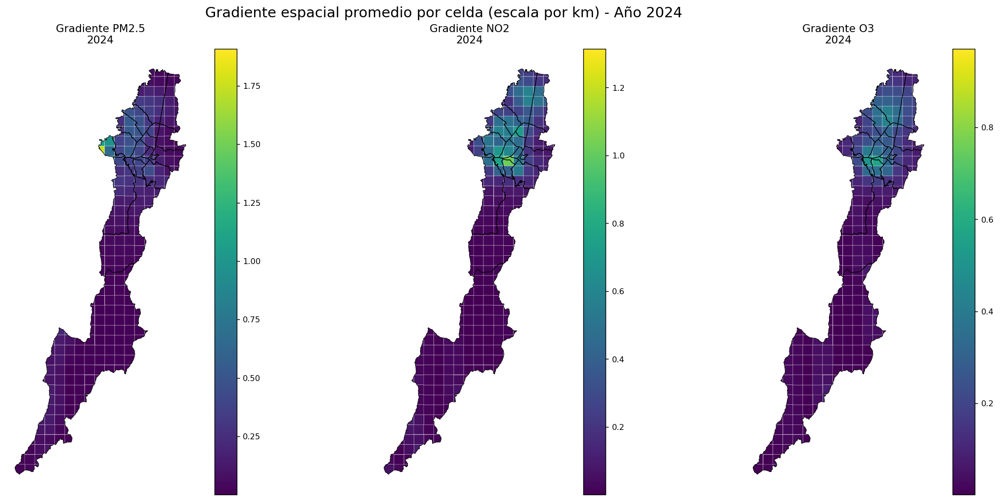


RESUMEN RÁPIDO DEL GRADIENTE ESPACIAL (ESCALA POR KM)


,Contaminante,Media global (km),Mínimo global (km),Máximo global (km)
0,PM2.5,0.121700,0.000400,1.909100
1,NO2,0.114200,0.000600,1.314600
2,O3,0.078600,0.001300,0.971200


In [66]:
# =========================================================
# CELDA 5. VISTA PREVIA DE MAPAS ANUALES DEL GRADIENTE ESPACIAL
# Escala reexpresada por km
# SOLO VISUALIZACIÓN - SIN GUARDAR
# =========================================================

from pathlib import Path
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

# ---------------------------------------------------------
# 1. Función auxiliar
# ---------------------------------------------------------
def buscar_columna(columnas, candidatos):
    mapa = {str(c).replace("\ufeff", "").strip().lower(): c for c in columnas}
    for cand in candidatos:
        cand_norm = cand.strip().lower()
        if cand_norm in mapa:
            return mapa[cand_norm]
    return None

# ---------------------------------------------------------
# 2. Cargar insumos si no existen en memoria
# ---------------------------------------------------------
if "gdf_grid_base" not in globals():
    rutas_gpkg = [
        Path(r"D:\TRABAJO DE GRADO BEN-MAP\Qgis\grid_3km_time_idw_2020_2024.gpkg"),
        Path(r"D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\adveccion_difusion\grid_3km_time_idw_2020_2024.gpkg"),
    ]
    ruta_gpkg = next((r for r in rutas_gpkg if r.exists()), None)
    if ruta_gpkg is None:
        raise FileNotFoundError("No se encontró el archivo GPKG de la malla.")
    gdf_grid_base = gpd.read_file(ruta_gpkg)
    gdf_grid_base.columns = [str(c).replace("\ufeff", "").strip() for c in gdf_grid_base.columns]

if "df_ad" not in globals():
    rutas_csv = [
        Path(r"D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\adveccion_difusion\grid_3km_AD_mensual_2020_2024.csv"),
        Path(r"D:\TRABAJO DE GRADO BEN-MAP\CODIGO\grid_3km_AD_mensual_2020_2024.csv"),
    ]
    ruta_csv = next((r for r in rutas_csv if r.exists()), None)
    if ruta_csv is None:
        raise FileNotFoundError("No se encontró el CSV mensual del esquema A-D.")
    df_ad = pd.read_csv(ruta_csv, encoding="utf-8-sig", low_memory=False)
    df_ad.columns = [str(c).replace("\ufeff", "").strip() for c in df_ad.columns]

# ---------------------------------------------------------
# 3. Detectar columnas necesarias
# ---------------------------------------------------------
col_cell  = buscar_columna(df_ad.columns, ["cell_id"])
col_fecha = buscar_columna(df_ad.columns, ["fecha", "date"])
col_anio  = buscar_columna(df_ad.columns, ["Año", "Ano", "anio", "year"])

col_grad_pm25 = buscar_columna(df_ad.columns, ["grad_PM25_grid", "grad_pm25_grid"])
col_grad_no2  = buscar_columna(df_ad.columns, ["grad_NO2_grid", "grad_no2_grid"])
col_grad_o3   = buscar_columna(df_ad.columns, ["grad_O3_grid", "grad_o3_grid"])

faltantes = []
for nombre, col in {
    "cell_id": col_cell,
    "grad_PM25_grid": col_grad_pm25,
    "grad_NO2_grid": col_grad_no2,
    "grad_O3_grid": col_grad_o3
}.items():
    if col is None:
        faltantes.append(nombre)

if faltantes:
    raise ValueError(
        f"Faltan columnas necesarias en df_ad: {faltantes}. "
        f"Columnas disponibles: {list(df_ad.columns)}"
    )

if col_anio is None and col_fecha is None:
    raise ValueError("No se encontró columna de año ni columna de fecha para construir promedios anuales.")

# ---------------------------------------------------------
# 4. Construir variable de año
# ---------------------------------------------------------
df_map = df_ad.copy()

if col_anio is not None:
    df_map["anio_mapa"] = pd.to_numeric(df_map[col_anio], errors="coerce")
else:
    df_map[col_fecha] = pd.to_datetime(df_map[col_fecha], errors="coerce")
    df_map["anio_mapa"] = df_map[col_fecha].dt.year

df_map = df_map[df_map["anio_mapa"].notna()].copy()
df_map["anio_mapa"] = df_map["anio_mapa"].astype(int)
df_map = df_map[df_map["anio_mapa"].between(2020, 2024)].copy()

if df_map.empty:
    raise ValueError("No quedaron observaciones para el periodo 2020–2024.")

# ---------------------------------------------------------
# 5. Reexpresar gradiente por km
#    (si originalmente está por metro)
# ---------------------------------------------------------
df_map["grad_PM25_km"] = df_map[col_grad_pm25] * 1000.0
df_map["grad_NO2_km"]  = df_map[col_grad_no2]  * 1000.0
df_map["grad_O3_km"]   = df_map[col_grad_o3]   * 1000.0

# ---------------------------------------------------------
# 6. Promedio anual por celda
# ---------------------------------------------------------
tabla_anual_grad = (
    df_map[[col_cell, "anio_mapa", "grad_PM25_km", "grad_NO2_km", "grad_O3_km"]]
    .groupby([col_cell, "anio_mapa"], as_index=False)
    .mean()
    .rename(columns={col_cell: "cell_id"})
)

print("=" * 90)
print("RESUMEN DE CELDAS CON DATOS DE GRADIENTE POR AÑO")
print("=" * 90)
display(
    tabla_anual_grad.groupby("anio_mapa").agg(
        celdas_grad_pm25=("grad_PM25_km", lambda s: s.notna().sum()),
        celdas_grad_no2=("grad_NO2_km", lambda s: s.notna().sum()),
        celdas_grad_o3=("grad_O3_km", lambda s: s.notna().sum())
    ).reset_index()
)

# ---------------------------------------------------------
# 7. Cargar borde de Bogotá si existe
# ---------------------------------------------------------
capa_bogota = None
for nombre in ["gdf_bog", "gdf_bogota", "gdf_localidades", "gdf_loc"]:
    if nombre in globals():
        capa_bogota = globals()[nombre].copy()
        break

if capa_bogota is not None and capa_bogota.crs != gdf_grid_base.crs:
    capa_bogota = capa_bogota.to_crs(gdf_grid_base.crs)

# ---------------------------------------------------------
# 8. Escalas globales fijas por contaminante
# ---------------------------------------------------------
vmin_pm25, vmax_pm25 = tabla_anual_grad["grad_PM25_km"].min(), tabla_anual_grad["grad_PM25_km"].max()
vmin_no2,  vmax_no2  = tabla_anual_grad["grad_NO2_km"].min(),  tabla_anual_grad["grad_NO2_km"].max()
vmin_o3,   vmax_o3   = tabla_anual_grad["grad_O3_km"].min(),   tabla_anual_grad["grad_O3_km"].max()

# ---------------------------------------------------------
# 9. Graficar año por año
# ---------------------------------------------------------
anios = sorted(tabla_anual_grad["anio_mapa"].unique())

for anio in anios:
    tabla_anio = tabla_anual_grad[tabla_anual_grad["anio_mapa"] == anio].copy()
    gdf_anio = gdf_grid_base.merge(tabla_anio, on="cell_id", how="left")

    fig, axes = plt.subplots(1, 3, figsize=(18, 8))
    fig.patch.set_facecolor("white")
    fig.suptitle(f"Gradiente espacial promedio por celda (escala por km) - Año {anio}", fontsize=16, y=0.97)

    especificaciones = [
        ("grad_PM25_km", f"Gradiente PM2.5\n{anio}", vmin_pm25, vmax_pm25),
        ("grad_NO2_km",  f"Gradiente NO2\n{anio}",  vmin_no2,  vmax_no2),
        ("grad_O3_km",   f"Gradiente O3\n{anio}",   vmin_o3,   vmax_o3),
    ]

    for ax, (columna, titulo, vmin_, vmax_) in zip(axes, especificaciones):
        gdf_anio.plot(
            column=columna,
            ax=ax,
            cmap="viridis",
            linewidth=0.20,
            edgecolor="white",
            legend=True,
            vmin=vmin_,
            vmax=vmax_,
            missing_kwds={"color": "lightgrey"}
        )

        if capa_bogota is not None:
            capa_bogota.boundary.plot(ax=ax, color="black", linewidth=0.6)

        ax.set_title(titulo, fontsize=12)
        ax.set_axis_off()

    plt.tight_layout()
    plt.show()

# ---------------------------------------------------------
# 10. Resumen rápido agregado
# ---------------------------------------------------------
tabla_resumen_grad = pd.DataFrame({
    "Contaminante": ["PM2.5", "NO2", "O3"],
    "Media global (km)": [
        tabla_anual_grad["grad_PM25_km"].mean(),
        tabla_anual_grad["grad_NO2_km"].mean(),
        tabla_anual_grad["grad_O3_km"].mean()
    ],
    "Mínimo global (km)": [
        tabla_anual_grad["grad_PM25_km"].min(),
        tabla_anual_grad["grad_NO2_km"].min(),
        tabla_anual_grad["grad_O3_km"].min()
    ],
    "Máximo global (km)": [
        tabla_anual_grad["grad_PM25_km"].max(),
        tabla_anual_grad["grad_NO2_km"].max(),
        tabla_anual_grad["grad_O3_km"].max()
    ]
}).round(4)

print("\n" + "=" * 90)
print("RESUMEN RÁPIDO DEL GRADIENTE ESPACIAL (ESCALA POR KM)")
print("=" * 90)
display(tabla_resumen_grad)

# Celda 6. Vista previa de mapas anuales del proxy advectivo (escala por km)

En esta celda se generan mapas anuales promedio del proxy advectivo para PM2.5, NO2 y O3 sobre la malla regular de 3 km. Para cada año del periodo 2020–2024 se calcula el promedio anual por celda y se visualizan tres paneles comparativos, uno por contaminante.

Con fines de interpretación, el proxy advectivo se reexpresa en escala por kilómetro. La celda es únicamente de exploración visual y no guarda archivos.

RESUMEN DE CELDAS CON DATOS DE PROXY ADVECTIVO POR AÑO


,anio_mapa,celdas_adv_pm25,celdas_adv_no2,celdas_adv_o3
0,2020,254,254,254
1,2021,254,254,254
2,2022,254,254,254
3,2023,254,254,254
4,2024,254,254,254


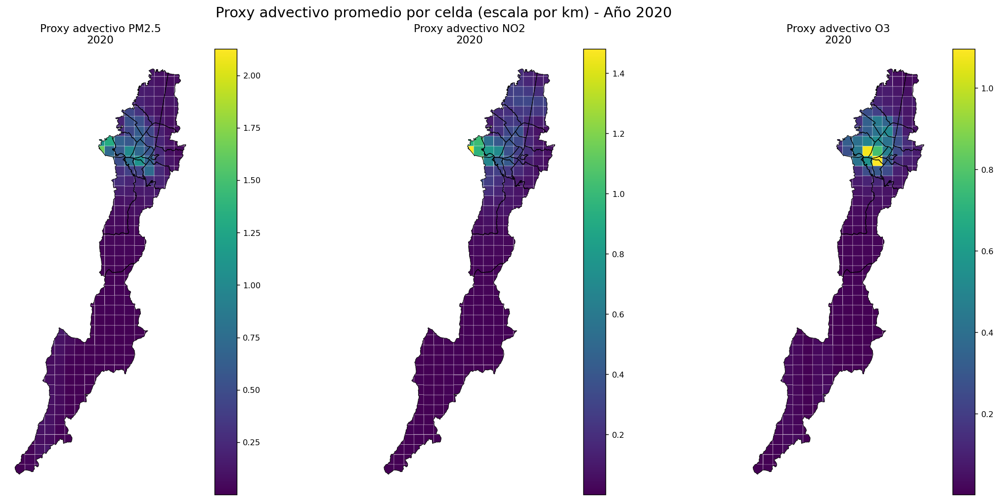

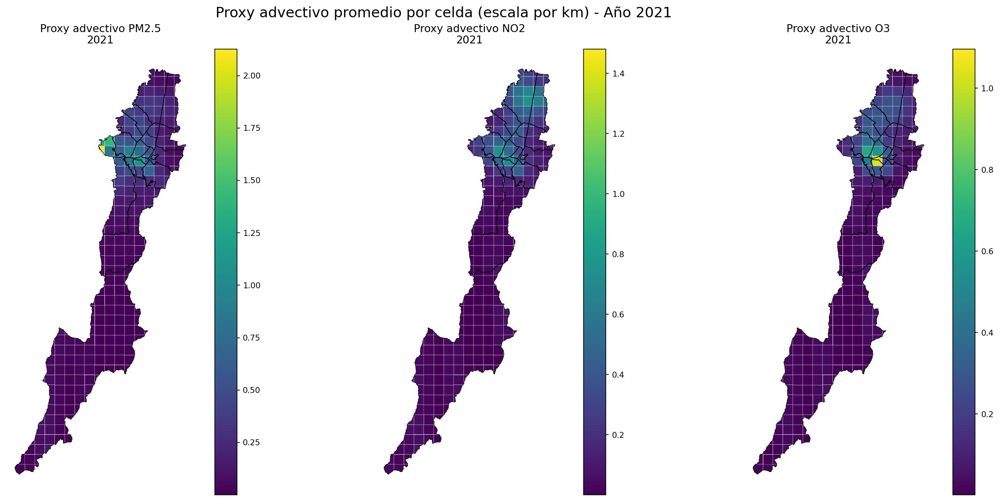

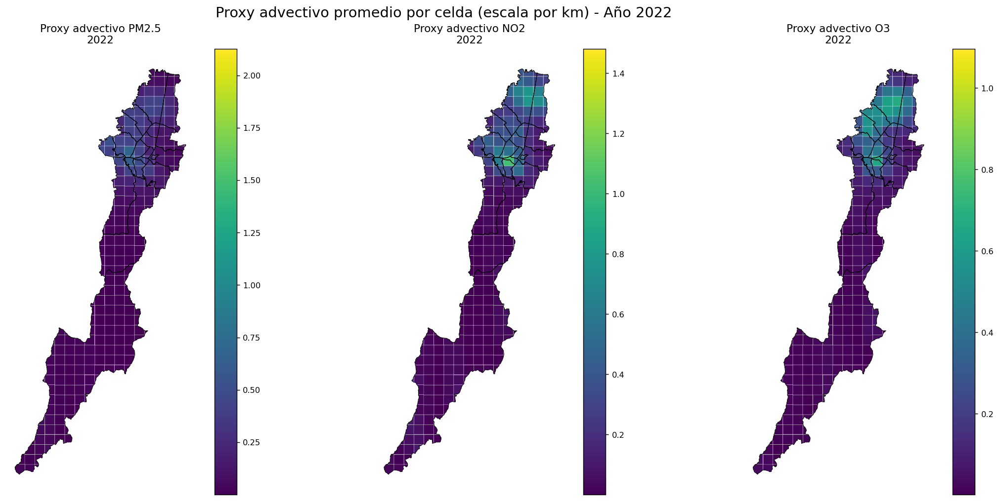

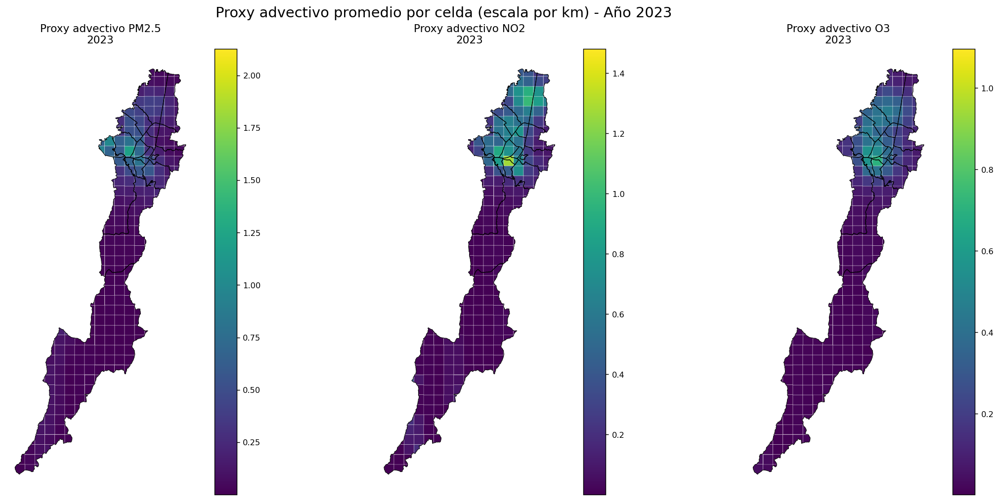

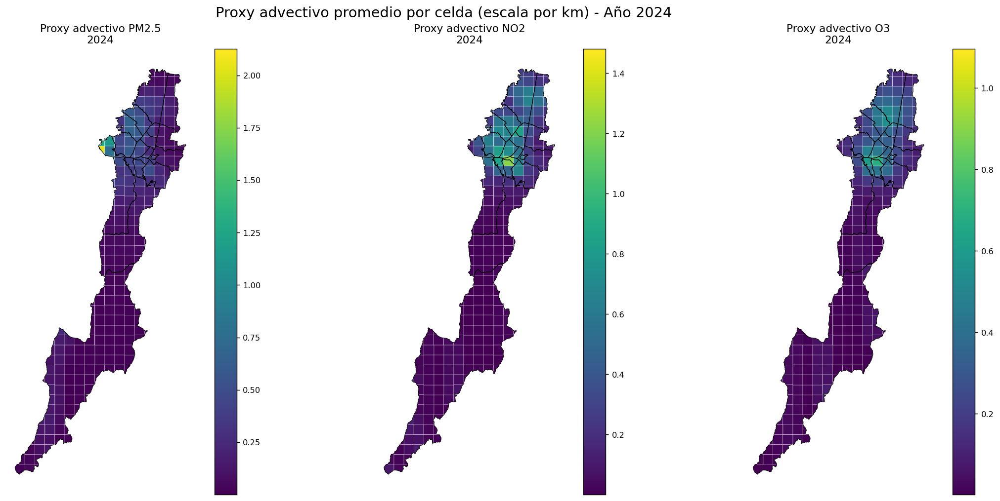


RESUMEN RÁPIDO DEL PROXY ADVECTIVO (ESCALA POR KM)


,Contaminante,Media global (km),Mínimo global (km),Máximo global (km)
0,PM2.5,0.135600,0.000500,2.127600
1,NO2,0.126800,0.000700,1.481500
2,O3,0.086400,0.001500,1.096700


In [67]:
# =========================================================
# CELDA 6. VISTA PREVIA DE MAPAS ANUALES DEL PROXY ADVECTIVO
# Escala reexpresada por km
# SOLO VISUALIZACIÓN - SIN GUARDAR
# =========================================================

from pathlib import Path
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

# ---------------------------------------------------------
# 1. Función auxiliar
# ---------------------------------------------------------
def buscar_columna(columnas, candidatos):
    mapa = {str(c).replace("\ufeff", "").strip().lower(): c for c in columnas}
    for cand in candidatos:
        cand_norm = cand.strip().lower()
        if cand_norm in mapa:
            return mapa[cand_norm]
    return None

# ---------------------------------------------------------
# 2. Cargar insumos si no existen en memoria
# ---------------------------------------------------------
if "gdf_grid_base" not in globals():
    rutas_gpkg = [
        Path(r"D:\TRABAJO DE GRADO BEN-MAP\Qgis\grid_3km_time_idw_2020_2024.gpkg"),
        Path(r"D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\adveccion_difusion\grid_3km_time_idw_2020_2024.gpkg"),
    ]
    ruta_gpkg = next((r for r in rutas_gpkg if r.exists()), None)
    if ruta_gpkg is None:
        raise FileNotFoundError("No se encontró el archivo GPKG de la malla.")
    gdf_grid_base = gpd.read_file(ruta_gpkg)
    gdf_grid_base.columns = [str(c).replace("\ufeff", "").strip() for c in gdf_grid_base.columns]

if "df_ad" not in globals():
    rutas_csv = [
        Path(r"D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\adveccion_difusion\grid_3km_AD_mensual_2020_2024.csv"),
        Path(r"D:\TRABAJO DE GRADO BEN-MAP\CODIGO\grid_3km_AD_mensual_2020_2024.csv"),
    ]
    ruta_csv = next((r for r in rutas_csv if r.exists()), None)
    if ruta_csv is None:
        raise FileNotFoundError("No se encontró el CSV mensual del esquema A-D.")
    df_ad = pd.read_csv(ruta_csv, encoding="utf-8-sig", low_memory=False)
    df_ad.columns = [str(c).replace("\ufeff", "").strip() for c in df_ad.columns]

# ---------------------------------------------------------
# 3. Detectar columnas necesarias
# ---------------------------------------------------------
col_cell  = buscar_columna(df_ad.columns, ["cell_id"])
col_fecha = buscar_columna(df_ad.columns, ["fecha", "date"])
col_anio  = buscar_columna(df_ad.columns, ["Año", "Ano", "anio", "year"])

col_adv_pm25 = buscar_columna(df_ad.columns, ["adv_proxy_PM25_grid", "adv_proxy_pm25_grid"])
col_adv_no2  = buscar_columna(df_ad.columns, ["adv_proxy_NO2_grid", "adv_proxy_no2_grid"])
col_adv_o3   = buscar_columna(df_ad.columns, ["adv_proxy_O3_grid", "adv_proxy_o3_grid"])

faltantes = []
for nombre, col in {
    "cell_id": col_cell,
    "adv_proxy_PM25_grid": col_adv_pm25,
    "adv_proxy_NO2_grid": col_adv_no2,
    "adv_proxy_O3_grid": col_adv_o3
}.items():
    if col is None:
        faltantes.append(nombre)

if faltantes:
    raise ValueError(
        f"Faltan columnas necesarias en df_ad: {faltantes}. "
        f"Columnas disponibles: {list(df_ad.columns)}"
    )

if col_anio is None and col_fecha is None:
    raise ValueError("No se encontró columna de año ni columna de fecha para construir promedios anuales.")

# ---------------------------------------------------------
# 4. Construir variable de año
# ---------------------------------------------------------
df_map = df_ad.copy()

if col_anio is not None:
    df_map["anio_mapa"] = pd.to_numeric(df_map[col_anio], errors="coerce")
else:
    df_map[col_fecha] = pd.to_datetime(df_map[col_fecha], errors="coerce")
    df_map["anio_mapa"] = df_map[col_fecha].dt.year

df_map = df_map[df_map["anio_mapa"].notna()].copy()
df_map["anio_mapa"] = df_map["anio_mapa"].astype(int)
df_map = df_map[df_map["anio_mapa"].between(2020, 2024)].copy()

if df_map.empty:
    raise ValueError("No quedaron observaciones para el periodo 2020–2024.")

# ---------------------------------------------------------
# 5. Reexpresar proxy por km
# ---------------------------------------------------------
df_map["adv_PM25_km"] = df_map[col_adv_pm25] * 1000.0
df_map["adv_NO2_km"]  = df_map[col_adv_no2]  * 1000.0
df_map["adv_O3_km"]   = df_map[col_adv_o3]   * 1000.0

# ---------------------------------------------------------
# 6. Promedio anual por celda
# ---------------------------------------------------------
tabla_anual_adv = (
    df_map[[col_cell, "anio_mapa", "adv_PM25_km", "adv_NO2_km", "adv_O3_km"]]
    .groupby([col_cell, "anio_mapa"], as_index=False)
    .mean()
    .rename(columns={col_cell: "cell_id"})
)

print("=" * 90)
print("RESUMEN DE CELDAS CON DATOS DE PROXY ADVECTIVO POR AÑO")
print("=" * 90)
display(
    tabla_anual_adv.groupby("anio_mapa").agg(
        celdas_adv_pm25=("adv_PM25_km", lambda s: s.notna().sum()),
        celdas_adv_no2=("adv_NO2_km", lambda s: s.notna().sum()),
        celdas_adv_o3=("adv_O3_km", lambda s: s.notna().sum())
    ).reset_index()
)

# ---------------------------------------------------------
# 7. Cargar borde de Bogotá si existe
# ---------------------------------------------------------
capa_bogota = None
for nombre in ["gdf_bog", "gdf_bogota", "gdf_localidades", "gdf_loc"]:
    if nombre in globals():
        capa_bogota = globals()[nombre].copy()
        break

if capa_bogota is not None and capa_bogota.crs != gdf_grid_base.crs:
    capa_bogota = capa_bogota.to_crs(gdf_grid_base.crs)

# ---------------------------------------------------------
# 8. Escalas globales fijas
# ---------------------------------------------------------
vmin_pm25, vmax_pm25 = tabla_anual_adv["adv_PM25_km"].min(), tabla_anual_adv["adv_PM25_km"].max()
vmin_no2,  vmax_no2  = tabla_anual_adv["adv_NO2_km"].min(),  tabla_anual_adv["adv_NO2_km"].max()
vmin_o3,   vmax_o3   = tabla_anual_adv["adv_O3_km"].min(),   tabla_anual_adv["adv_O3_km"].max()

# ---------------------------------------------------------
# 9. Graficar año por año
# ---------------------------------------------------------
anios = sorted(tabla_anual_adv["anio_mapa"].unique())

for anio in anios:
    tabla_anio = tabla_anual_adv[tabla_anual_adv["anio_mapa"] == anio].copy()
    gdf_anio = gdf_grid_base.merge(tabla_anio, on="cell_id", how="left")

    fig, axes = plt.subplots(1, 3, figsize=(18, 8))
    fig.patch.set_facecolor("white")
    fig.suptitle(f"Proxy advectivo promedio por celda (escala por km) - Año {anio}", fontsize=16, y=0.97)

    especificaciones = [
        ("adv_PM25_km", f"Proxy advectivo PM2.5\n{anio}", vmin_pm25, vmax_pm25),
        ("adv_NO2_km",  f"Proxy advectivo NO2\n{anio}",  vmin_no2,  vmax_no2),
        ("adv_O3_km",   f"Proxy advectivo O3\n{anio}",   vmin_o3,   vmax_o3),
    ]

    for ax, (columna, titulo, vmin_, vmax_) in zip(axes, especificaciones):
        gdf_anio.plot(
            column=columna,
            ax=ax,
            cmap="viridis",
            linewidth=0.20,
            edgecolor="white",
            legend=True,
            vmin=vmin_,
            vmax=vmax_,
            missing_kwds={"color": "lightgrey"}
        )

        if capa_bogota is not None:
            capa_bogota.boundary.plot(ax=ax, color="black", linewidth=0.6)

        ax.set_title(titulo, fontsize=12)
        ax.set_axis_off()

    plt.tight_layout()
    plt.show()

# ---------------------------------------------------------
# 10. Resumen rápido agregado
# ---------------------------------------------------------
tabla_resumen_adv = pd.DataFrame({
    "Contaminante": ["PM2.5", "NO2", "O3"],
    "Media global (km)": [
        tabla_anual_adv["adv_PM25_km"].mean(),
        tabla_anual_adv["adv_NO2_km"].mean(),
        tabla_anual_adv["adv_O3_km"].mean()
    ],
    "Mínimo global (km)": [
        tabla_anual_adv["adv_PM25_km"].min(),
        tabla_anual_adv["adv_NO2_km"].min(),
        tabla_anual_adv["adv_O3_km"].min()
    ],
    "Máximo global (km)": [
        tabla_anual_adv["adv_PM25_km"].max(),
        tabla_anual_adv["adv_NO2_km"].max(),
        tabla_anual_adv["adv_O3_km"].max()
    ]
}).round(4)

print("\n" + "=" * 90)
print("RESUMEN RÁPIDO DEL PROXY ADVECTIVO (ESCALA POR KM)")
print("=" * 90)
display(tabla_resumen_adv)

# Celda 7. Vista previa de mapas anuales de la superficie posterior central del HBM

En esta celda se generan mapas anuales promedio de la superficie posterior central del modelo jerárquico bayesiano para PM2.5, NO2 y O3 sobre la malla regular de 3 km. Para cada año del periodo 2020–2024 se calcula el promedio anual por celda a partir del percentil 50 posterior, que aquí se interpreta como estimación central de la superficie latente.

La celda es únicamente de exploración visual y no guarda archivos.

ARCHIVOS HBM DETECTADOS
PM2.5: D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\PM25\tabla_surface_final_pm25.csv
NO2: D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\NO2\tabla_surface_final_no2.csv
O3: D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\O3\tabla_surface_final_o3.csv

RESUMEN DE ARCHIVOS HBM


,Contaminante,Archivo,n_filas,celdas_unicas,anios
0,PM2.5,tabla_surface_final_pm25.csv,15240,254,"[2020, 2021, 2022, 2023, 2024]"
1,NO2,tabla_surface_final_no2.csv,15240,254,"[2020, 2021, 2022, 2023, 2024]"
2,O3,tabla_surface_final_o3.csv,15240,254,"[2020, 2021, 2022, 2023, 2024]"



RANGOS GLOBALES DE LA SUPERFICIE POSTERIOR CENTRAL


,Contaminante,Min_global,Max_global
0,PM2.5,9.797300,24.453500
1,NO2,8.001500,21.186100
2,O3,5.694400,21.119100


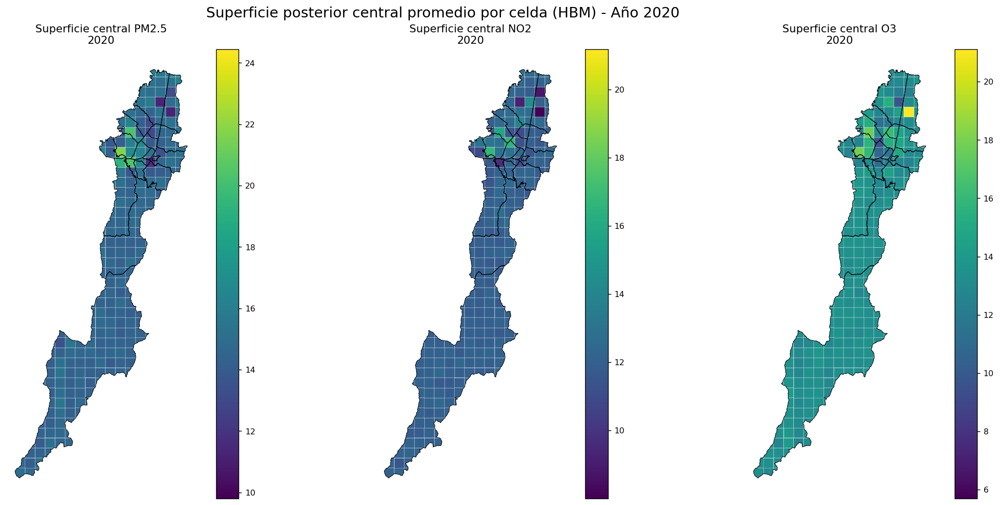

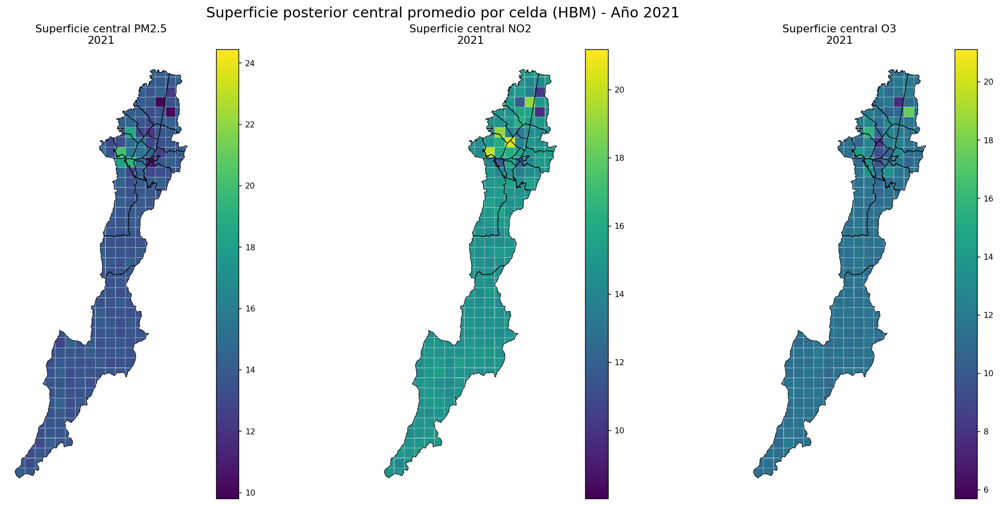

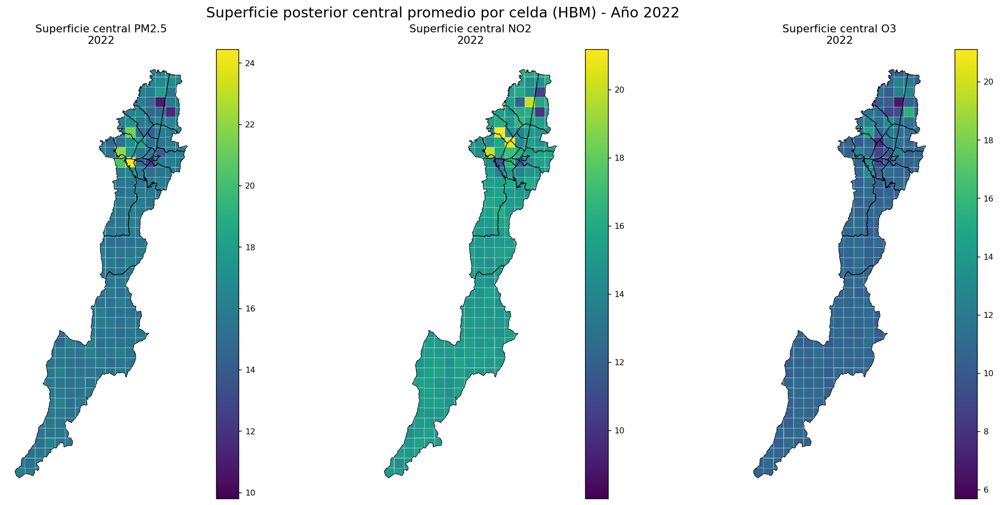

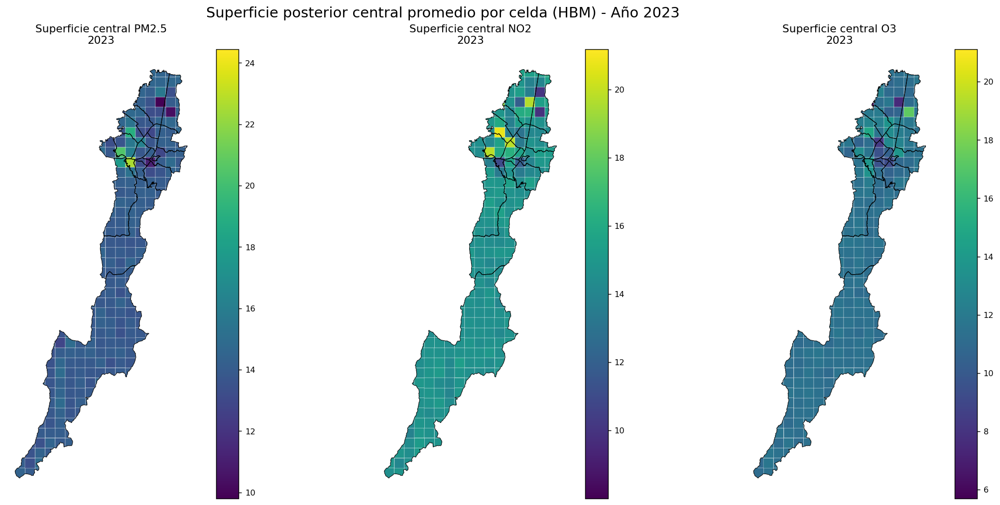

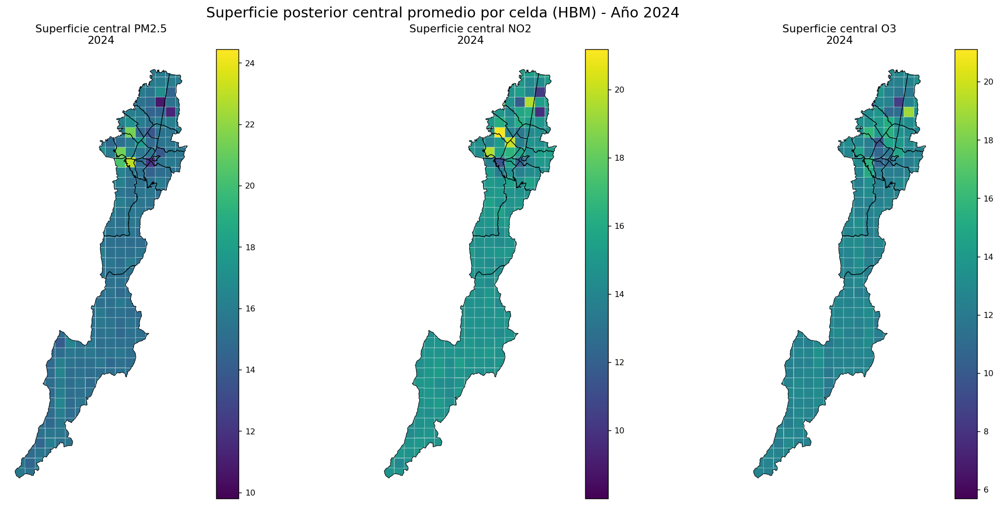


RESUMEN RÁPIDO DE LA SUPERFICIE POSTERIOR CENTRAL DEL HBM


,Contaminante,Media global,Mínimo global,Máximo global
0,PM2.5,14.780400,9.797300,24.453500
1,NO2,14.337900,8.001500,21.186100
2,O3,11.955600,5.694400,21.119100


In [68]:
# =========================================================
# CELDA 7. VISTA PREVIA DE MAPAS ANUALES DE LA SUPERFICIE
# POSTERIOR CENTRAL DEL HBM (p50)
# SOLO VISUALIZACIÓN - SIN GUARDAR
# =========================================================

from pathlib import Path
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

# ---------------------------------------------------------
# 1. Función auxiliar para buscar columnas
# ---------------------------------------------------------
def buscar_columna(columnas, candidatos):
    mapa = {str(c).replace("\ufeff", "").strip().lower(): c for c in columnas}
    for cand in candidatos:
        cand_norm = cand.strip().lower()
        if cand_norm in mapa:
            return mapa[cand_norm]
    return None


# ---------------------------------------------------------
# 2. Cargar malla base si no existe
# ---------------------------------------------------------
if "gdf_grid_base" not in globals():
    rutas_gpkg = [
        Path(r"D:\TRABAJO DE GRADO BEN-MAP\Qgis\grid_3km_time_idw_2020_2024.gpkg"),
        Path(r"D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\adveccion_difusion\grid_3km_time_idw_2020_2024.gpkg"),
    ]
    ruta_gpkg = next((r for r in rutas_gpkg if r.exists()), None)
    if ruta_gpkg is None:
        raise FileNotFoundError("No se encontró el archivo GPKG de la malla.")
    gdf_grid_base = gpd.read_file(ruta_gpkg)
    gdf_grid_base.columns = [str(c).replace("\ufeff", "").strip() for c in gdf_grid_base.columns]

if "cell_id" not in gdf_grid_base.columns:
    raise ValueError(f"La malla no contiene 'cell_id'. Columnas: {list(gdf_grid_base.columns)}")


# ---------------------------------------------------------
# 3. Rutas de archivos surface_final por contaminante
# ---------------------------------------------------------
rutas_hbm = {
    "PM2.5": [
        Path(r"D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\PM25\tabla_surface_final_pm25.csv"),
    ],
    "NO2": [
        Path(r"D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\NO2\tabla_surface_final_no2.csv"),
    ],
    "O3": [
        Path(r"D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\O3\tabla_surface_final_o3.csv"),
    ],
}

archivos_hbm = {}
for contaminante, candidatas in rutas_hbm.items():
    ruta = next((r for r in candidatas if r.exists()), None)
    if ruta is None:
        raise FileNotFoundError(f"No se encontró el archivo surface_final para {contaminante}.")
    archivos_hbm[contaminante] = ruta

print("=" * 90)
print("ARCHIVOS HBM DETECTADOS")
print("=" * 90)
for k, v in archivos_hbm.items():
    print(f"{k}: {v}")


# ---------------------------------------------------------
# 4. Cargar y estandarizar cada archivo
# ---------------------------------------------------------
tablas_hbm = {}
resumen_archivos = []

for contaminante, ruta in archivos_hbm.items():
    df = pd.read_csv(ruta, encoding="utf-8-sig", low_memory=False)
    df.columns = [str(c).replace("\ufeff", "").strip() for c in df.columns]

    col_cell = buscar_columna(df.columns, ["cell_id"])
    col_fecha = buscar_columna(df.columns, ["fecha", "date"])
    col_anio = buscar_columna(df.columns, ["year", "anio", "ano", "año"])
    col_p50 = buscar_columna(df.columns, ["p50_hbm", "p50", "surface_central", "superficie_central"])

    if col_cell is None:
        raise ValueError(f"{contaminante}: no se encontró 'cell_id'. Columnas: {list(df.columns)}")
    if col_p50 is None:
        raise ValueError(f"{contaminante}: no se encontró columna p50/superficie central. Columnas: {list(df.columns)}")
    if col_anio is None and col_fecha is None:
        raise ValueError(f"{contaminante}: no se encontró año ni fecha. Columnas: {list(df.columns)}")

    df_std = df.copy()

    if col_anio is not None:
        df_std["anio_mapa"] = pd.to_numeric(df_std[col_anio], errors="coerce")
    else:
        df_std[col_fecha] = pd.to_datetime(df_std[col_fecha], errors="coerce")
        df_std["anio_mapa"] = df_std[col_fecha].dt.year

    df_std = df_std[df_std["anio_mapa"].notna()].copy()
    df_std["anio_mapa"] = df_std["anio_mapa"].astype(int)
    df_std = df_std[df_std["anio_mapa"].between(2020, 2024)].copy()

    df_std = df_std[[col_cell, "anio_mapa", col_p50]].rename(columns={
        col_cell: "cell_id",
        col_p50: "p50_hbm"
    })

    tablas_hbm[contaminante] = df_std

    resumen_archivos.append({
        "Contaminante": contaminante,
        "Archivo": ruta.name,
        "n_filas": len(df_std),
        "celdas_unicas": df_std["cell_id"].nunique(),
        "anios": sorted(df_std["anio_mapa"].unique().tolist())
    })

print("\n" + "=" * 90)
print("RESUMEN DE ARCHIVOS HBM")
print("=" * 90)
display(pd.DataFrame(resumen_archivos))


# ---------------------------------------------------------
# 5. Preparar borde de Bogotá si existe
# ---------------------------------------------------------
capa_bogota = None
for nombre in ["gdf_bog", "gdf_bogota", "gdf_localidades", "gdf_loc"]:
    if nombre in globals():
        capa_bogota = globals()[nombre].copy()
        break

if capa_bogota is not None and capa_bogota.crs != gdf_grid_base.crs:
    capa_bogota = capa_bogota.to_crs(gdf_grid_base.crs)


# ---------------------------------------------------------
# 6. Calcular promedio anual por celda
# ---------------------------------------------------------
promedios_anuales = {}
rangos = {}

for contaminante, df_std in tablas_hbm.items():
    tabla = (
        df_std.groupby(["cell_id", "anio_mapa"], as_index=False)["p50_hbm"]
        .mean()
        .rename(columns={"p50_hbm": "p50_hbm_mean"})
    )
    promedios_anuales[contaminante] = tabla
    rangos[contaminante] = (
        tabla["p50_hbm_mean"].min(),
        tabla["p50_hbm_mean"].max()
    )

print("\n" + "=" * 90)
print("RANGOS GLOBALES DE LA SUPERFICIE POSTERIOR CENTRAL")
print("=" * 90)
display(pd.DataFrame([
    {
        "Contaminante": k,
        "Min_global": rangos[k][0],
        "Max_global": rangos[k][1]
    }
    for k in ["PM2.5", "NO2", "O3"]
]).round(4))


# ---------------------------------------------------------
# 7. Graficar año por año
# ---------------------------------------------------------
anios = [2020, 2021, 2022, 2023, 2024]

for anio in anios:
    fig, axes = plt.subplots(1, 3, figsize=(18, 8))
    fig.patch.set_facecolor("white")
    fig.suptitle(
        f"Superficie posterior central promedio por celda (HBM) - Año {anio}",
        fontsize=16,
        y=0.97
    )

    for ax, contaminante in zip(axes, ["PM2.5", "NO2", "O3"]):
        tabla_anio = promedios_anuales[contaminante]
        tabla_anio = tabla_anio[tabla_anio["anio_mapa"] == anio].copy()

        gdf_anio = gdf_grid_base.merge(tabla_anio, on="cell_id", how="left")

        vmin_, vmax_ = rangos[contaminante]

        gdf_anio.plot(
            column="p50_hbm_mean",
            ax=ax,
            cmap="viridis",
            linewidth=0.20,
            edgecolor="white",
            legend=True,
            vmin=vmin_,
            vmax=vmax_,
            missing_kwds={"color": "lightgrey"}
        )

        if capa_bogota is not None:
            capa_bogota.boundary.plot(ax=ax, color="black", linewidth=0.6)

        ax.set_title(f"Superficie central {contaminante}\n{anio}", fontsize=12)
        ax.set_axis_off()

    plt.tight_layout()
    plt.show()


# ---------------------------------------------------------
# 8. Resumen agregado
# ---------------------------------------------------------
tabla_resumen_superficie = pd.DataFrame([
    {
        "Contaminante": contaminante,
        "Media global": promedios_anuales[contaminante]["p50_hbm_mean"].mean(),
        "Mínimo global": promedios_anuales[contaminante]["p50_hbm_mean"].min(),
        "Máximo global": promedios_anuales[contaminante]["p50_hbm_mean"].max()
    }
    for contaminante in ["PM2.5", "NO2", "O3"]
]).round(4)

print("\n" + "=" * 90)
print("RESUMEN RÁPIDO DE LA SUPERFICIE POSTERIOR CENTRAL DEL HBM")
print("=" * 90)
display(tabla_resumen_superficie)

# Celda 8. Vista previa de mapas anuales de incertidumbre posterior del HBM

En esta celda se generan mapas anuales promedio de la incertidumbre posterior del modelo jerárquico bayesiano para PM2.5, NO2 y O3 sobre la malla regular de 3 km. La incertidumbre se resume mediante el ancho del intervalo creíble central del 90%, calculado como la diferencia entre los percentiles posteriores 95 y 5.

Para cada año del periodo 2020–2024 se calcula el promedio anual por celda y se visualizan tres paneles comparativos, uno por contaminante. La celda es únicamente de exploración visual y no guarda archivos.

ARCHIVOS HBM DETECTADOS PARA INCERTIDUMBRE
PM2.5: D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\PM25\tabla_surface_final_pm25.csv
NO2: D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\NO2\tabla_surface_final_no2.csv
O3: D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\O3\tabla_surface_final_o3.csv

RESUMEN DE ARCHIVOS HBM PARA INCERTIDUMBRE


,Contaminante,Archivo,n_filas,celdas_unicas,anios
0,PM2.5,tabla_surface_final_pm25.csv,15240,254,"[2020, 2021, 2022, 2023, 2024]"
1,NO2,tabla_surface_final_no2.csv,15240,254,"[2020, 2021, 2022, 2023, 2024]"
2,O3,tabla_surface_final_o3.csv,15240,254,"[2020, 2021, 2022, 2023, 2024]"



RANGOS GLOBALES DE INCERTIDUMBRE POSTERIOR


,Contaminante,Min_global,Max_global
0,PM2.5,1.917200,96.650900
1,NO2,1.840000,88.610200
2,O3,1.001900,85.209300


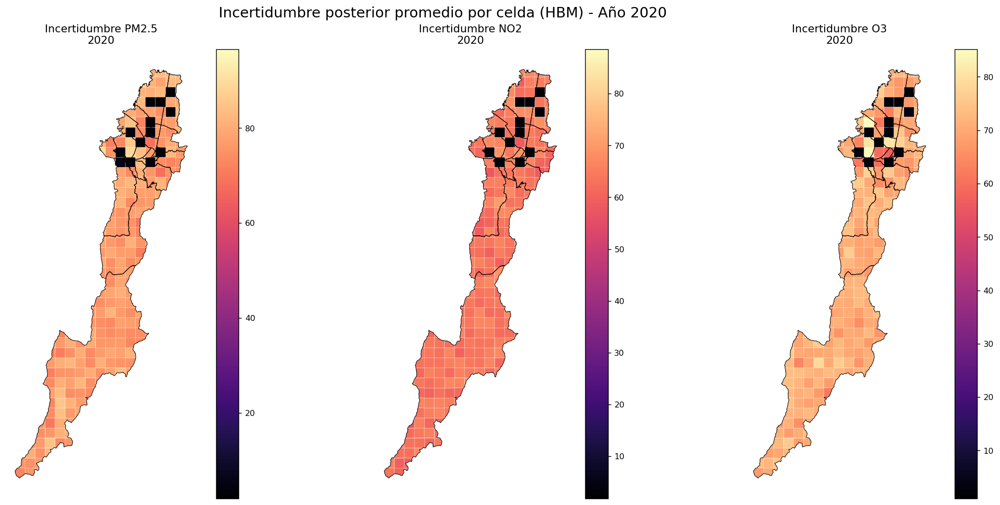

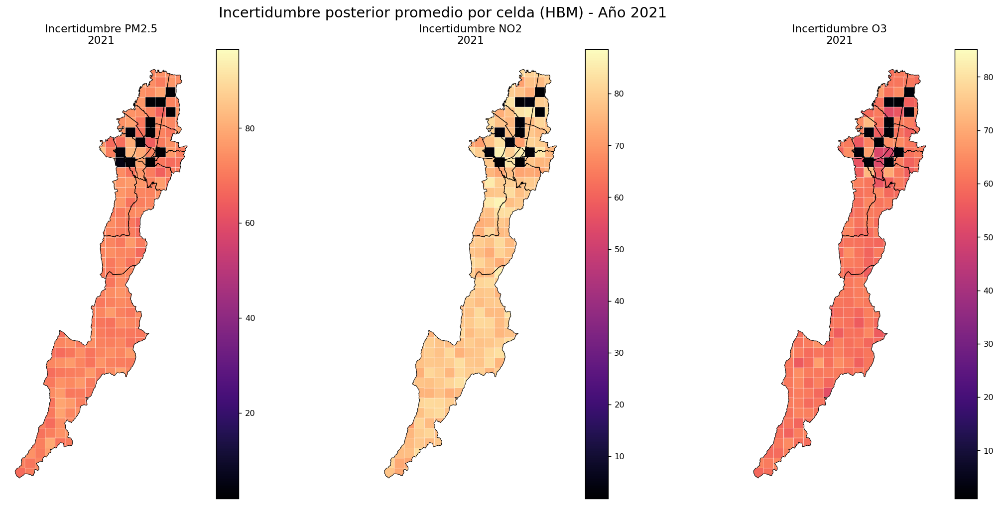

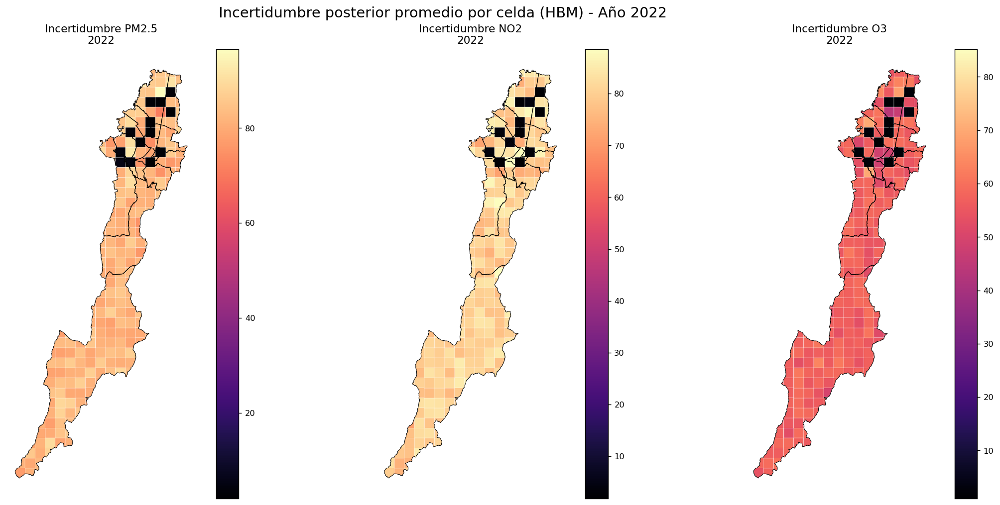

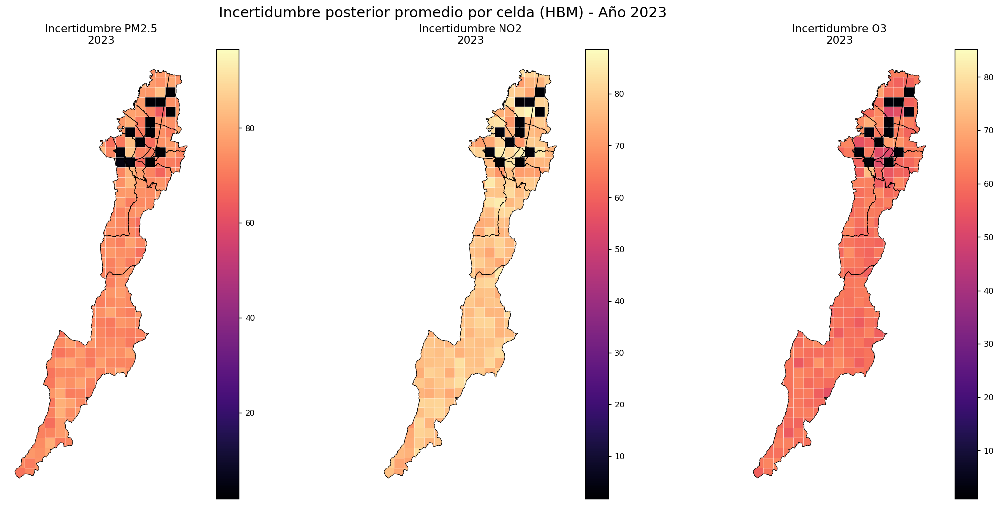

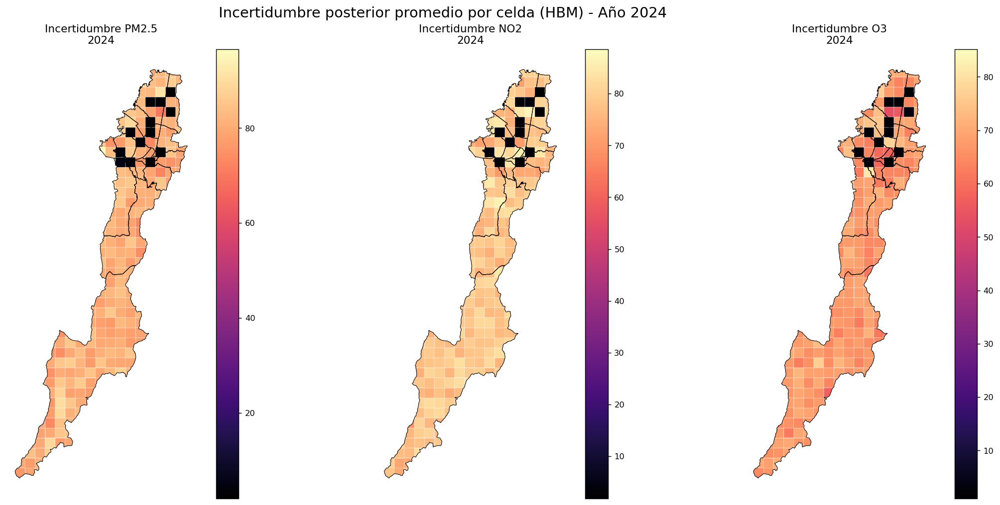


RESUMEN RÁPIDO DE LA INCERTIDUMBRE POSTERIOR DEL HBM


,Contaminante,Media global,Mínimo global,Máximo global
0,PM2.5,73.527000,1.917200,96.650900
1,NO2,72.122500,1.840000,88.610200
2,O3,60.036700,1.001900,85.209300


In [69]:
# =========================================================
# CELDA 8. VISTA PREVIA DE MAPAS ANUALES DE INCERTIDUMBRE
# POSTERIOR DEL HBM (ancho intervalo creíble 90%)
# SOLO VISUALIZACIÓN - SIN GUARDAR
# =========================================================

from pathlib import Path
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

# ---------------------------------------------------------
# 1. Función auxiliar para buscar columnas
# ---------------------------------------------------------
def buscar_columna(columnas, candidatos):
    mapa = {str(c).replace("\ufeff", "").strip().lower(): c for c in columnas}
    for cand in candidatos:
        cand_norm = cand.strip().lower()
        if cand_norm in mapa:
            return mapa[cand_norm]
    return None


# ---------------------------------------------------------
# 2. Cargar malla base si no existe
# ---------------------------------------------------------
if "gdf_grid_base" not in globals():
    rutas_gpkg = [
        Path(r"D:\TRABAJO DE GRADO BEN-MAP\Qgis\grid_3km_time_idw_2020_2024.gpkg"),
        Path(r"D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\adveccion_difusion\grid_3km_time_idw_2020_2024.gpkg"),
    ]
    ruta_gpkg = next((r for r in rutas_gpkg if r.exists()), None)
    if ruta_gpkg is None:
        raise FileNotFoundError("No se encontró el archivo GPKG de la malla.")
    gdf_grid_base = gpd.read_file(ruta_gpkg)
    gdf_grid_base.columns = [str(c).replace("\ufeff", "").strip() for c in gdf_grid_base.columns]

if "cell_id" not in gdf_grid_base.columns:
    raise ValueError(f"La malla no contiene 'cell_id'. Columnas: {list(gdf_grid_base.columns)}")


# ---------------------------------------------------------
# 3. Rutas de archivos surface_final por contaminante
# ---------------------------------------------------------
rutas_hbm = {
    "PM2.5": [
        Path(r"D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\PM25\tabla_surface_final_pm25.csv"),
    ],
    "NO2": [
        Path(r"D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\NO2\tabla_surface_final_no2.csv"),
    ],
    "O3": [
        Path(r"D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\O3\tabla_surface_final_o3.csv"),
    ],
}

archivos_hbm = {}
for contaminante, candidatas in rutas_hbm.items():
    ruta = next((r for r in candidatas if r.exists()), None)
    if ruta is None:
        raise FileNotFoundError(f"No se encontró el archivo surface_final para {contaminante}.")
    archivos_hbm[contaminante] = ruta

print("=" * 90)
print("ARCHIVOS HBM DETECTADOS PARA INCERTIDUMBRE")
print("=" * 90)
for k, v in archivos_hbm.items():
    print(f"{k}: {v}")


# ---------------------------------------------------------
# 4. Cargar y estandarizar cada archivo
# ---------------------------------------------------------
tablas_hbm_ic = {}
resumen_archivos_ic = []

for contaminante, ruta in archivos_hbm.items():
    df = pd.read_csv(ruta, encoding="utf-8-sig", low_memory=False)
    df.columns = [str(c).replace("\ufeff", "").strip() for c in df.columns]

    col_cell = buscar_columna(df.columns, ["cell_id"])
    col_fecha = buscar_columna(df.columns, ["fecha", "date"])
    col_anio = buscar_columna(df.columns, ["year", "anio", "ano", "año"])

    col_p05 = buscar_columna(df.columns, ["p05_hbm", "p05"])
    col_p95 = buscar_columna(df.columns, ["p95_hbm", "p95"])
    col_width = buscar_columna(df.columns, ["width_90", "width_90_mean", "ancho_ic90", "ancho_intervalo_90"])

    if col_cell is None:
        raise ValueError(f"{contaminante}: no se encontró 'cell_id'. Columnas: {list(df.columns)}")
    if col_anio is None and col_fecha is None:
        raise ValueError(f"{contaminante}: no se encontró año ni fecha. Columnas: {list(df.columns)}")

    # construir ancho del intervalo
    if col_width is not None:
        df["width_ic90"] = pd.to_numeric(df[col_width], errors="coerce")
    elif col_p05 is not None and col_p95 is not None:
        df["width_ic90"] = pd.to_numeric(df[col_p95], errors="coerce") - pd.to_numeric(df[col_p05], errors="coerce")
    else:
        raise ValueError(
            f"{contaminante}: no se encontró width_90 ni el par p05/p95. "
            f"Columnas: {list(df.columns)}"
        )

    if col_anio is not None:
        df["anio_mapa"] = pd.to_numeric(df[col_anio], errors="coerce")
    else:
        df[col_fecha] = pd.to_datetime(df[col_fecha], errors="coerce")
        df["anio_mapa"] = df[col_fecha].dt.year

    df = df[df["anio_mapa"].notna()].copy()
    df["anio_mapa"] = df["anio_mapa"].astype(int)
    df = df[df["anio_mapa"].between(2020, 2024)].copy()

    df_std = df[[col_cell, "anio_mapa", "width_ic90"]].rename(columns={
        col_cell: "cell_id"
    })

    tablas_hbm_ic[contaminante] = df_std

    resumen_archivos_ic.append({
        "Contaminante": contaminante,
        "Archivo": ruta.name,
        "n_filas": len(df_std),
        "celdas_unicas": df_std["cell_id"].nunique(),
        "anios": sorted(df_std["anio_mapa"].unique().tolist())
    })

print("\n" + "=" * 90)
print("RESUMEN DE ARCHIVOS HBM PARA INCERTIDUMBRE")
print("=" * 90)
display(pd.DataFrame(resumen_archivos_ic))


# ---------------------------------------------------------
# 5. Preparar borde de Bogotá si existe
# ---------------------------------------------------------
capa_bogota = None
for nombre in ["gdf_bog", "gdf_bogota", "gdf_localidades", "gdf_loc"]:
    if nombre in globals():
        capa_bogota = globals()[nombre].copy()
        break

if capa_bogota is not None and capa_bogota.crs != gdf_grid_base.crs:
    capa_bogota = capa_bogota.to_crs(gdf_grid_base.crs)


# ---------------------------------------------------------
# 6. Calcular promedio anual por celda
# ---------------------------------------------------------
promedios_ic_anuales = {}
rangos_ic = {}

for contaminante, df_std in tablas_hbm_ic.items():
    tabla = (
        df_std.groupby(["cell_id", "anio_mapa"], as_index=False)["width_ic90"]
        .mean()
        .rename(columns={"width_ic90": "width_ic90_mean"})
    )
    promedios_ic_anuales[contaminante] = tabla
    rangos_ic[contaminante] = (
        tabla["width_ic90_mean"].min(),
        tabla["width_ic90_mean"].max()
    )

print("\n" + "=" * 90)
print("RANGOS GLOBALES DE INCERTIDUMBRE POSTERIOR")
print("=" * 90)
display(pd.DataFrame([
    {
        "Contaminante": k,
        "Min_global": rangos_ic[k][0],
        "Max_global": rangos_ic[k][1]
    }
    for k in ["PM2.5", "NO2", "O3"]
]).round(4))


# ---------------------------------------------------------
# 7. Graficar año por año
# ---------------------------------------------------------
anios = [2020, 2021, 2022, 2023, 2024]

for anio in anios:
    fig, axes = plt.subplots(1, 3, figsize=(18, 8))
    fig.patch.set_facecolor("white")
    fig.suptitle(
        f"Incertidumbre posterior promedio por celda (HBM) - Año {anio}",
        fontsize=16,
        y=0.97
    )

    for ax, contaminante in zip(axes, ["PM2.5", "NO2", "O3"]):
        tabla_anio = promedios_ic_anuales[contaminante]
        tabla_anio = tabla_anio[tabla_anio["anio_mapa"] == anio].copy()

        gdf_anio = gdf_grid_base.merge(tabla_anio, on="cell_id", how="left")

        vmin_, vmax_ = rangos_ic[contaminante]

        gdf_anio.plot(
            column="width_ic90_mean",
            ax=ax,
            cmap="magma",
            linewidth=0.20,
            edgecolor="white",
            legend=True,
            vmin=vmin_,
            vmax=vmax_,
            missing_kwds={"color": "lightgrey"}
        )

        if capa_bogota is not None:
            capa_bogota.boundary.plot(ax=ax, color="black", linewidth=0.6)

        ax.set_title(f"Incertidumbre {contaminante}\n{anio}", fontsize=12)
        ax.set_axis_off()

    plt.tight_layout()
    plt.show()


# ---------------------------------------------------------
# 8. Resumen agregado
# ---------------------------------------------------------
tabla_resumen_ic = pd.DataFrame([
    {
        "Contaminante": contaminante,
        "Media global": promedios_ic_anuales[contaminante]["width_ic90_mean"].mean(),
        "Mínimo global": promedios_ic_anuales[contaminante]["width_ic90_mean"].min(),
        "Máximo global": promedios_ic_anuales[contaminante]["width_ic90_mean"].max()
    }
    for contaminante in ["PM2.5", "NO2", "O3"]
]).round(4)

print("\n" + "=" * 90)
print("RESUMEN RÁPIDO DE LA INCERTIDUMBRE POSTERIOR DEL HBM")
print("=" * 90)
display(tabla_resumen_ic)

# ============================================================
# RESUMENES DEL HBM A PARTIR DE SUPERFICIES POSTERIORES



TABLA GLOBAL DEL HBM (SUPERFICIE CENTRAL E INCERTIDUMBRE)


,contaminante,media_global_p50,minimo_global_p50,maximo_global_p50,media_global_p05,media_global_p95,amplitud_media_ic90,amplitud_min_ic90,amplitud_max_ic90,n_celdas,n_registros
0,NO2,14.337900,6.151100,26.366100,3.167700,75.290200,72.122500,1.228900,116.167000,254,15240
1,O3,11.955600,3.421700,33.510600,2.656100,62.692800,60.036700,0.586200,148.640500,254,15240
2,PM2.5,14.780400,4.751600,44.161200,3.327700,76.854700,73.527000,0.939000,183.660400,254,15240



TABLA ANUAL DEL HBM (SUPERFICIE CENTRAL E INCERTIDUMBRE)


,contaminante,year,media_anual_p50,minimo_anual_p50,maximo_anual_p50,media_anual_p05,media_anual_p95,amplitud_media_ic90,amplitud_min_ic90,amplitud_max_ic90,n_celdas
0,NO2,2020,12.081300,6.151100,22.434000,2.661900,63.483800,60.821800,1.443000,94.974400,254
1,NO2,2021,14.836300,7.333700,26.366100,3.276100,77.924300,74.648200,1.413700,116.167000,254
2,NO2,2022,15.240500,7.688900,24.582800,3.373000,79.993400,76.620500,1.482000,104.464200,254
3,NO2,2023,14.706400,6.441900,25.133800,3.251200,77.215100,73.963900,1.228900,105.642200,254
4,NO2,2024,14.825200,7.001600,25.025000,3.276300,77.834300,74.558000,1.328700,105.751600,254
5,O3,2020,13.354900,4.957900,33.510600,2.964300,70.041000,67.076700,0.937500,148.640500,254
6,O3,2021,11.488700,4.381800,21.954700,2.557100,60.220800,57.663600,0.760900,91.835900,254
7,O3,2022,10.781900,4.026200,21.290000,2.398600,56.510200,54.111600,0.703500,99.514300,254
8,O3,2023,11.450200,3.878100,24.160500,2.539400,60.072500,57.533100,0.718400,99.534600,254
9,O3,2024,12.702400,3.421700,26.086000,2.821100,66.619600,63.798500,0.586200,117.479600,254


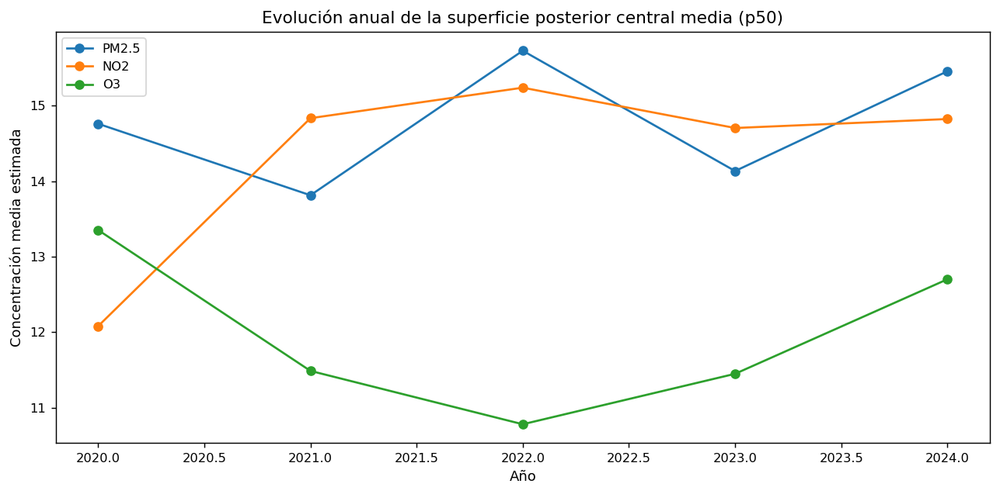

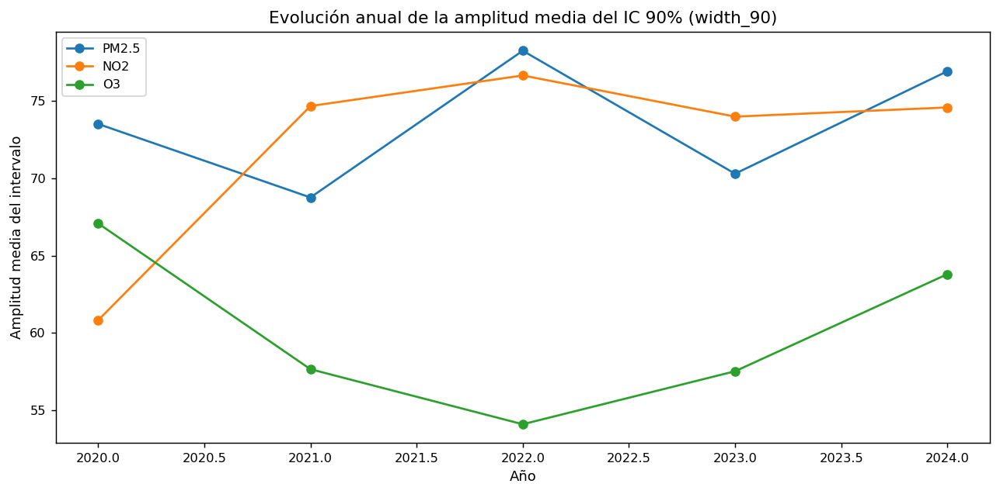


LECTURA RESUMIDA AUTOMÁTICA DEL HBM


,Contaminante,Año mayor superficie central,Media p50 máxima,Año menor superficie central,Media p50 mínima,Año mayor incertidumbre,Amplitud media IC90 máxima
0,PM2.5,2022,15.729900,2021,13.815400,2022,78.217100
1,NO2,2022,15.240500,2020,12.081300,2022,76.620500
2,O3,2020,13.354900,2022,10.781900,2020,67.076700


In [70]:
# ============================================================
# RESUMENES DEL HBM A PARTIR DE SUPERFICIES POSTERIORES
# Usa p50_hbm como superficie central
# Usa p05_hbm y p95_hbm / width_90 como incertidumbre
# ============================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# ------------------------------------------------------------
# 1. Rutas
# ------------------------------------------------------------
archivos_hbm = {
    "PM2.5": r"D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\PM25\tabla_surface_final_pm25.csv",
    "NO2":   r"D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\NO2\tabla_surface_final_no2.csv",
    "O3":    r"D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\O3\tabla_surface_final_o3.csv"
}

# ------------------------------------------------------------
# 2. Cargar y homologar
# ------------------------------------------------------------
bases = []

for contaminante, ruta in archivos_hbm.items():
    ruta = Path(ruta)
    if not ruta.exists():
        print(f"⚠️ Archivo no encontrado para {contaminante}: {ruta}")
        continue

    df = pd.read_csv(ruta)

    columnas_necesarias = ["cell_id", "fecha", "year", "month", "p05_hbm", "p50_hbm", "p95_hbm"]
    faltantes = [c for c in columnas_necesarias if c not in df.columns]

    if faltantes:
        print(f"⚠️ Faltan columnas en {contaminante}: {faltantes}")
        print("Columnas disponibles:", list(df.columns))
        continue

    base = df.copy()
    base["contaminante"] = contaminante

    # Si width_90 no existe, se calcula
    if "width_90" not in base.columns:
        base["width_90"] = base["p95_hbm"] - base["p05_hbm"]

    base = base[[
        "contaminante", "cell_id", "fecha", "year", "month",
        "p05_hbm", "p50_hbm", "p95_hbm", "width_90"
    ]].copy()

    bases.append(base)

if len(bases) == 0:
    raise ValueError("No se pudo cargar ninguna base HBM.")

df_hbm = pd.concat(bases, ignore_index=True)

# ------------------------------------------------------------
# 3. Tabla resumen global por contaminante
# ------------------------------------------------------------
tabla_global_hbm = (
    df_hbm
    .groupby("contaminante", as_index=False)
    .agg(
        media_global_p50=("p50_hbm", "mean"),
        minimo_global_p50=("p50_hbm", "min"),
        maximo_global_p50=("p50_hbm", "max"),
        media_global_p05=("p05_hbm", "mean"),
        media_global_p95=("p95_hbm", "mean"),
        amplitud_media_ic90=("width_90", "mean"),
        amplitud_min_ic90=("width_90", "min"),
        amplitud_max_ic90=("width_90", "max"),
        n_celdas=("cell_id", "nunique"),
        n_registros=("cell_id", "size")
    )
)

# ------------------------------------------------------------
# 4. Tabla anual por contaminante
# ------------------------------------------------------------
tabla_anual_hbm = (
    df_hbm
    .groupby(["contaminante", "year"], as_index=False)
    .agg(
        media_anual_p50=("p50_hbm", "mean"),
        minimo_anual_p50=("p50_hbm", "min"),
        maximo_anual_p50=("p50_hbm", "max"),
        media_anual_p05=("p05_hbm", "mean"),
        media_anual_p95=("p95_hbm", "mean"),
        amplitud_media_ic90=("width_90", "mean"),
        amplitud_min_ic90=("width_90", "min"),
        amplitud_max_ic90=("width_90", "max"),
        n_celdas=("cell_id", "nunique")
    )
    .sort_values(["contaminante", "year"])
    .reset_index(drop=True)
)

# ------------------------------------------------------------
# 5. Mostrar tablas
# ------------------------------------------------------------
print("\n" + "="*70)
print("TABLA GLOBAL DEL HBM (SUPERFICIE CENTRAL E INCERTIDUMBRE)")
print("="*70)
display(tabla_global_hbm.round(4))

print("\n" + "="*70)
print("TABLA ANUAL DEL HBM (SUPERFICIE CENTRAL E INCERTIDUMBRE)")
print("="*70)
display(tabla_anual_hbm.round(4))

# ------------------------------------------------------------
# 6. Gráfica 1: evolución anual de la media de la superficie central
# ------------------------------------------------------------
fig, ax = plt.subplots(figsize=(10, 5))

for cont in ["PM2.5", "NO2", "O3"]:
    sub = tabla_anual_hbm[tabla_anual_hbm["contaminante"] == cont]
    ax.plot(sub["year"], sub["media_anual_p50"], marker="o", label=cont)

ax.set_title("Evolución anual de la superficie posterior central media (p50)")
ax.set_xlabel("Año")
ax.set_ylabel("Concentración media estimada")
ax.legend()
plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 7. Gráfica 2: evolución anual de la incertidumbre media
# ------------------------------------------------------------
fig, ax = plt.subplots(figsize=(10, 5))

for cont in ["PM2.5", "NO2", "O3"]:
    sub = tabla_anual_hbm[tabla_anual_hbm["contaminante"] == cont]
    ax.plot(sub["year"], sub["amplitud_media_ic90"], marker="o", label=cont)

ax.set_title("Evolución anual de la amplitud media del IC 90% (width_90)")
ax.set_xlabel("Año")
ax.set_ylabel("Amplitud media del intervalo")
ax.legend()
plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 8. Lectura resumida automática
# ------------------------------------------------------------
lecturas = []

for cont in ["PM2.5", "NO2", "O3"]:
    sub = tabla_anual_hbm[tabla_anual_hbm["contaminante"] == cont].sort_values("year")
    if sub.empty:
        continue

    fila_max = sub.loc[sub["media_anual_p50"].idxmax()]
    fila_min = sub.loc[sub["media_anual_p50"].idxmin()]
    fila_inc = sub.loc[sub["amplitud_media_ic90"].idxmax()]

    lecturas.append({
        "Contaminante": cont,
        "Año mayor superficie central": int(fila_max["year"]),
        "Media p50 máxima": round(float(fila_max["media_anual_p50"]), 4),
        "Año menor superficie central": int(fila_min["year"]),
        "Media p50 mínima": round(float(fila_min["media_anual_p50"]), 4),
        "Año mayor incertidumbre": int(fila_inc["year"]),
        "Amplitud media IC90 máxima": round(float(fila_inc["amplitud_media_ic90"]), 4)
    })

tabla_lectura_hbm = pd.DataFrame(lecturas)

print("\n" + "="*70)
print("LECTURA RESUMIDA AUTOMÁTICA DEL HBM")
print("="*70)
display(tabla_lectura_hbm)

In [71]:
# ============================================================
# BUSQUEDA AUTOMATICA DE ARCHIVOS DE VALIDACION DEL HBM
# ============================================================

from pathlib import Path
import pandas as pd

base_hbm = Path(r"D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm")

ext_validas = {".csv", ".xlsx", ".parquet"}
palabras_clave = [
    "valid", "val", "metric", "metrics", "fold", "cv", "test", "pred",
    "prediction", "predicciones", "observado", "observed", "residual",
    "residu", "outsample", "holdout"
]

hallazgos = []

for ruta in base_hbm.rglob("*"):
    if ruta.is_file() and ruta.suffix.lower() in ext_validas:
        nombre = ruta.name.lower()
        if any(k in nombre for k in palabras_clave):
            hallazgos.append({
                "archivo": ruta.name,
                "ruta": str(ruta),
                "extension": ruta.suffix.lower()
            })

tabla_archivos_validacion = pd.DataFrame(hallazgos).sort_values("archivo").reset_index(drop=True)

print("="*80)
print("ARCHIVOS CANDIDATOS PARA VALIDACION HBM")
print("="*80)

if tabla_archivos_validacion.empty:
    print("No se detectaron archivos candidatos por nombre.")
else:
    display(tabla_archivos_validacion)

ARCHIVOS CANDIDATOS PARA VALIDACION HBM


,archivo,ruta,extension
0,tabla_ancho_intervalo_mensual_no2.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\NO2\tabla_ancho_intervalo_mensual_no2.csv,.csv
1,tabla_ancho_intervalo_mensual_o3.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\O3\tabla_ancho_intervalo_mensual_o3.csv,.csv
2,tabla_ancho_intervalo_mensual_pm25.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\PM25\tabla_ancho_intervalo_mensual_pm25.csv,.csv
3,tabla_metricas_folds_raw_no2.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\NO2\tabla_metricas_folds_raw_no2.csv,.csv
4,tabla_metricas_folds_raw_o3.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\O3\tabla_metricas_folds_raw_o3.csv,.csv
5,tabla_metricas_folds_raw_pm25.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\PM25\tabla_metricas_folds_raw_pm25.csv,.csv
6,tabla_metricas_resumen_no2.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\NO2\tabla_metricas_resumen_no2.csv,.csv
7,tabla_metricas_resumen_o3.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\O3\tabla_metricas_resumen_o3.csv,.csv
8,tabla_metricas_resumen_pm25.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\PM25\tabla_metricas_resumen_pm25.csv,.csv
9,tabla_pred_test_all_folds_no2.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\NO2\tabla_pred_test_all_folds_no2.csv,.csv


In [72]:
# ============================================================
# INSPECCION DE COLUMNAS DE ARCHIVOS CANDIDATOS
# ============================================================

import pandas as pd
from pathlib import Path

def leer_muestra(ruta_archivo, n=5):
    ruta = Path(ruta_archivo)
    ext = ruta.suffix.lower()

    if ext == ".csv":
        df = pd.read_csv(ruta, nrows=n)
    elif ext == ".xlsx":
        df = pd.read_excel(ruta, nrows=n)
    elif ext == ".parquet":
        df = pd.read_parquet(ruta).head(n)
    else:
        raise ValueError(f"Extensión no soportada: {ext}")
    return df

resumen_columnas = []

if not tabla_archivos_validacion.empty:
    for _, fila in tabla_archivos_validacion.iterrows():
        ruta = fila["ruta"]
        try:
            df_tmp = leer_muestra(ruta, n=5)
            resumen_columnas.append({
                "archivo": fila["archivo"],
                "ruta": ruta,
                "columnas": list(df_tmp.columns)
            })
        except Exception as e:
            resumen_columnas.append({
                "archivo": fila["archivo"],
                "ruta": ruta,
                "columnas": [f"ERROR: {e}"]
            })

tabla_columnas_validacion = pd.DataFrame(resumen_columnas)

print("="*80)
print("COLUMNAS DETECTADAS EN ARCHIVOS CANDIDATOS")
print("="*80)
display(tabla_columnas_validacion)

COLUMNAS DETECTADAS EN ARCHIVOS CANDIDATOS


,archivo,ruta,columnas
0,tabla_ancho_intervalo_mensual_no2.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\NO2\tabla_ancho_intervalo_mensual_no2.csv,"[fecha, ancho_ic90]"
1,tabla_ancho_intervalo_mensual_o3.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\O3\tabla_ancho_intervalo_mensual_o3.csv,"[fecha, ancho_ic90]"
2,tabla_ancho_intervalo_mensual_pm25.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\PM25\tabla_ancho_intervalo_mensual_pm25.csv,"[fecha, ancho_ic90]"
3,tabla_metricas_folds_raw_no2.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\NO2\tabla_metricas_folds_raw_no2.csv,"[n, mae, rmse, bias, r, r2, coverage_90, width_90_mean, wis_90, model, fold, train_years, test_years]"
4,tabla_metricas_folds_raw_o3.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\O3\tabla_metricas_folds_raw_o3.csv,"[n, mae, rmse, bias, r, r2, coverage_90, width_90_mean, wis_90, model, fold, train_years, test_years]"
5,tabla_metricas_folds_raw_pm25.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\PM25\tabla_metricas_folds_raw_pm25.csv,"[n, mae, rmse, bias, r, r2, coverage_90, width_90_mean, wis_90, model, fold, train_years, test_years]"
6,tabla_metricas_resumen_no2.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\NO2\tabla_metricas_resumen_no2.csv,"[metrica, media, desv_std, min, max]"
7,tabla_metricas_resumen_o3.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\O3\tabla_metricas_resumen_o3.csv,"[metrica, media, desv_std, min, max]"
8,tabla_metricas_resumen_pm25.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\PM25\tabla_metricas_resumen_pm25.csv,"[metrica, media, desv_std, min, max]"
9,tabla_pred_test_all_folds_no2.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\NO2\tabla_pred_test_all_folds_no2.csv,"[Estacion, fecha, year, month, cell_id, cell_idx, time_idx, NO2_obs, p05_hbm, p50_hbm, p95_hbm, width_90, fold]"


# Celda 9. Tabla robusta de validación y evaluación del HBM

En esta celda se consolidan las métricas robustas de validación del modelo jerárquico bayesiano a partir de los archivos resumen por contaminante. Se excluyen explícitamente métricas como la correlación y R² del bloque principal de resultados, priorizando medidas más robustas de error puntual, calibración probabilística e incertidumbre predictiva.

Las métricas retenidas son: MAE, RMSE, Bias, Coverage_90, Width_90_mean y WIS_90.

METRICAS ROBUSTAS HBM CONSOLIDADAS EN FORMATO LARGO


,Contaminante,metrica_norm,media,desv_std,min,max
0,NO2,bias,0.317700,0.603700,-0.368200,0.768000
1,NO2,coverage_90,0.977500,0.016600,0.958300,0.987100
2,NO2,mae,2.432100,0.203300,2.255100,2.654200
3,NO2,rmse,2.991100,0.251400,2.757500,3.257100
4,NO2,width_90_mean,19.963200,1.156200,18.684200,20.934500
5,NO2,wis_90,20.408700,1.134600,19.288300,21.557000
6,O3,bias,-0.267400,1.309400,-1.737300,0.774100
7,O3,coverage_90,0.942100,0.043100,0.897100,0.983100
8,O3,mae,3.057300,0.723300,2.607000,3.891600
9,O3,rmse,3.711800,0.776200,3.189700,4.603700



TABLA ROBUSTA DE VALIDACION Y EVALUACION DEL HBM


,Contaminante,MAE,RMSE,Bias,Coverage_90,Width_90_mean,WIS_90
0,PM2.5,4.629000,5.824700,1.786200,0.939900,39.680100,41.788300
1,NO2,2.432100,2.991100,0.317700,0.977500,19.963200,20.408700
2,O3,3.057300,3.711800,-0.267400,0.942100,19.813300,21.172500


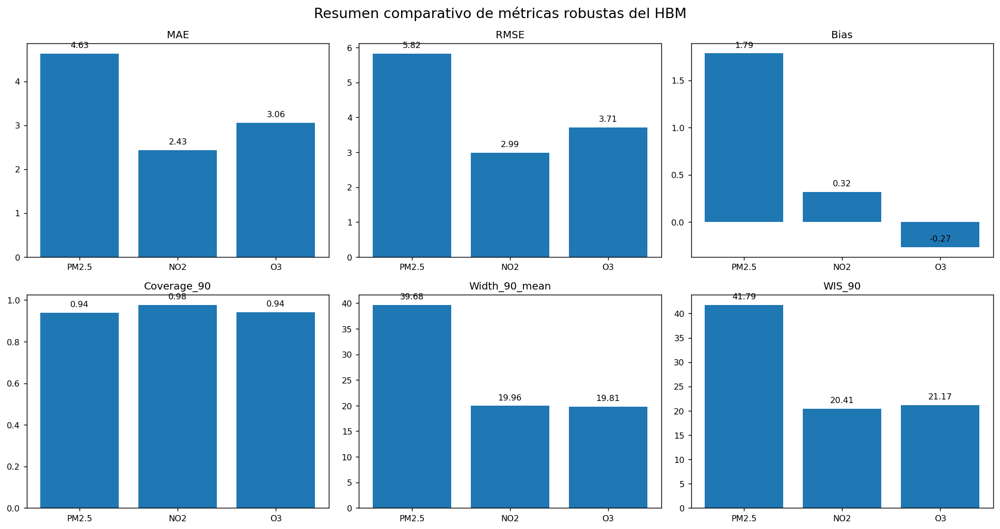


LECTURA AUTOMATICA DE METRICAS ROBUSTAS DEL HBM


,Indicador,Contaminante,Valor
0,Menor MAE,NO2,2.432100
1,Menor RMSE,NO2,2.991100
2,Mayor cobertura 90%,NO2,0.977500
3,Menor WIS_90,NO2,20.408700


In [73]:
# ============================================================
# CELDA 9. TABLA ROBUSTA DE VALIDACION DEL HBM
# Sin r ni r2
# ============================================================

from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt

# ------------------------------------------------------------
# 1. Rutas de archivos resumen por contaminante
# ------------------------------------------------------------
rutas_metricas = {
    "PM2.5": Path(r"D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\PM25\tabla_metricas_resumen_pm25.csv"),
    "NO2":   Path(r"D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\NO2\tabla_metricas_resumen_no2.csv"),
    "O3":    Path(r"D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\hbm\O3\tabla_metricas_resumen_o3.csv"),
}

# ------------------------------------------------------------
# 2. Métricas robustas a conservar
# ------------------------------------------------------------
metricas_objetivo = [
    "mae",
    "rmse",
    "bias",
    "coverage_90",
    "width_90_mean",
    "wis_90"
]

tablas = []

for contaminante, ruta in rutas_metricas.items():
    if not ruta.exists():
        print(f"⚠️ No se encontró el archivo de métricas para {contaminante}: {ruta}")
        continue

    df = pd.read_csv(ruta, encoding="utf-8-sig")
    df.columns = [str(c).replace("\ufeff", "").strip() for c in df.columns]

    # homologar nombres esperados
    if "metrica" not in df.columns:
        raise ValueError(f"{contaminante}: no existe la columna 'metrica'. Columnas: {list(df.columns)}")

    columnas_esperadas = ["media", "desv_std", "min", "max"]
    faltantes = [c for c in columnas_esperadas if c not in df.columns]
    if faltantes:
        raise ValueError(f"{contaminante}: faltan columnas {faltantes}. Columnas: {list(df.columns)}")

    df["metrica_norm"] = df["metrica"].astype(str).str.strip().str.lower()
    df = df[df["metrica_norm"].isin(metricas_objetivo)].copy()
    df["Contaminante"] = contaminante

    tablas.append(df)

if len(tablas) == 0:
    raise ValueError("No se pudo cargar ninguna tabla de métricas resumen.")

df_metricas = pd.concat(tablas, ignore_index=True)

# ------------------------------------------------------------
# 3. Tabla larga consolidada
# ------------------------------------------------------------
tabla_larga = (
    df_metricas[["Contaminante", "metrica_norm", "media", "desv_std", "min", "max"]]
    .sort_values(["Contaminante", "metrica_norm"])
    .reset_index(drop=True)
)

print("=" * 90)
print("METRICAS ROBUSTAS HBM CONSOLIDADAS EN FORMATO LARGO")
print("=" * 90)
display(tabla_larga.round(4))

# ------------------------------------------------------------
# 4. Tabla ancha principal para tesis
# ------------------------------------------------------------
tabla_robusta_hbm = (
    df_metricas.pivot_table(
        index="Contaminante",
        columns="metrica_norm",
        values="media",
        aggfunc="first"
    )
    .reset_index()
)

# quitar nombre del encabezado de columnas
tabla_robusta_hbm.columns.name = None

# ordenar columnas si existen
columnas_finales = [
    "Contaminante",
    "mae",
    "rmse",
    "bias",
    "coverage_90",
    "width_90_mean",
    "wis_90"
]
columnas_presentes = [c for c in columnas_finales if c in tabla_robusta_hbm.columns]
tabla_robusta_hbm = tabla_robusta_hbm[columnas_presentes].copy()

tabla_robusta_hbm = tabla_robusta_hbm.rename(columns={
    "mae": "MAE",
    "rmse": "RMSE",
    "bias": "Bias",
    "coverage_90": "Coverage_90",
    "width_90_mean": "Width_90_mean",
    "wis_90": "WIS_90"
})

orden_cont = ["PM2.5", "NO2", "O3"]
tabla_robusta_hbm["Contaminante"] = pd.Categorical(
    tabla_robusta_hbm["Contaminante"],
    categories=orden_cont,
    ordered=True
)
tabla_robusta_hbm = tabla_robusta_hbm.sort_values("Contaminante").reset_index(drop=True)

print("\n" + "=" * 90)
print("TABLA ROBUSTA DE VALIDACION Y EVALUACION DEL HBM")
print("=" * 90)
display(tabla_robusta_hbm.round(4))

# ------------------------------------------------------------
# 5. Figura corta comparativa
# ------------------------------------------------------------
metricas_graficar = [c for c in ["MAE", "RMSE", "Bias", "Coverage_90", "Width_90_mean", "WIS_90"] if c in tabla_robusta_hbm.columns]

fig, axes = plt.subplots(2, 3, figsize=(15, 8))
axes = axes.ravel()

for ax, metrica in zip(axes, metricas_graficar):
    sub = tabla_robusta_hbm[["Contaminante", metrica]].copy()
    bars = ax.bar(sub["Contaminante"].astype(str), sub[metrica])

    ax.set_title(metrica, fontsize=11)
    ax.set_xlabel("")
    ax.set_ylabel("")

    ymin, ymax = ax.get_ylim()
    rango = ymax - ymin if ymax != ymin else 1.0

    for b in bars:
        val = b.get_height()
        ax.text(
            b.get_x() + b.get_width() / 2,
            val + 0.02 * rango,
            f"{val:.2f}",
            ha="center",
            va="bottom",
            fontsize=9
        )

# apagar ejes sobrantes si faltan métricas
for j in range(len(metricas_graficar), len(axes)):
    axes[j].axis("off")

fig.suptitle("Resumen comparativo de métricas robustas del HBM", fontsize=15)
plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 6. Lectura automática corta
# ------------------------------------------------------------
lecturas = []

if "MAE" in tabla_robusta_hbm.columns:
    fila = tabla_robusta_hbm.loc[tabla_robusta_hbm["MAE"].idxmin()]
    lecturas.append({
        "Indicador": "Menor MAE",
        "Contaminante": str(fila["Contaminante"]),
        "Valor": round(float(fila["MAE"]), 4)
    })

if "RMSE" in tabla_robusta_hbm.columns:
    fila = tabla_robusta_hbm.loc[tabla_robusta_hbm["RMSE"].idxmin()]
    lecturas.append({
        "Indicador": "Menor RMSE",
        "Contaminante": str(fila["Contaminante"]),
        "Valor": round(float(fila["RMSE"]), 4)
    })

if "Coverage_90" in tabla_robusta_hbm.columns:
    fila = tabla_robusta_hbm.loc[tabla_robusta_hbm["Coverage_90"].idxmax()]
    lecturas.append({
        "Indicador": "Mayor cobertura 90%",
        "Contaminante": str(fila["Contaminante"]),
        "Valor": round(float(fila["Coverage_90"]), 4)
    })

if "WIS_90" in tabla_robusta_hbm.columns:
    fila = tabla_robusta_hbm.loc[tabla_robusta_hbm["WIS_90"].idxmin()]
    lecturas.append({
        "Indicador": "Menor WIS_90",
        "Contaminante": str(fila["Contaminante"]),
        "Valor": round(float(fila["WIS_90"]), 4)
    })

tabla_lectura_robusta = pd.DataFrame(lecturas)

print("\n" + "=" * 90)
print("LECTURA AUTOMATICA DE METRICAS ROBUSTAS DEL HBM")
print("=" * 90)
display(tabla_lectura_robusta)

# Celda 10. Tabla principal compacta del bloque 5.4: resultados base sanitario-económicos

En esta celda se consolidan los resultados base del módulo tipo BenMAP a partir de los resúmenes sanitarios y económicos. Se integran los casos evitados con la valoración económica en USD 2015 y COP 2015, generando una tabla compacta y una versión legible para el capítulo de resultados.

Además, se construyen dos gráficos sintéticos para comparar entre corridas base: uno para casos evitados y otro para valoración económica en COP 2015. Esta celda es de exploración y validación visual; no guarda archivos todavía.

ARCHIVOS BASE DEL MODULO TIPO BENMAP DETECTADOS
Impactos sanitarios : D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\benmap_base\impactos_sanitarios_resumen.csv
Valoración USD 2015 : D:\TRABAJO DE GRADO BEN-MAP\SALIDAS_SENSIBILIDAD\03_corrida_principal\valoracion_economica_resumen_usd2015.csv
Valoración COP 2015 : D:\TRABAJO DE GRADO BEN-MAP\SALIDAS_SENSIBILIDAD\07_tablas\valoracion_economica_resumen_cop.csv

FORMAS DE LOS ARCHIVOS CARGADOS
impactos_sanitarios_resumen.csv      -> (4, 16)
valoracion_economica_resumen_usd2015 -> (4, 11)
valoracion_economica_resumen_cop     -> (4, 14)

TABLA PRINCIPAL DEL BLOQUE 5.4 - BENMAP BASE


,Corrida,Contaminante,Grupo endpoint,Endpoint legible,Casos evitados,Valor económico USD 2015,Valor económico COP 2015
0,PM25_MAIN,PM25,Mortalidad,Mortalidad por todas las causas,1.299800,"11,314,898.968000","31,381,080,244.766300"
1,NO2_ASTHMA,NO2,Hospitalizaciones,Hospitalizaciones por asma,12.713500,"142,798.325100","396,041,158.652300"
2,NO2_CLD,NO2,Hospitalizaciones,Hospitalizaciones por enfermedad pulmonar crónica,9.454100,"145,357.370500","403,138,491.992400"
3,O3_MAIN,O3,Mortalidad,Mortalidad respiratoria,2.204600,"19,190,882.846200","53,224,570,212.140198"



TABLA LEGIBLE DEL BLOQUE 5.4 - BENMAP BASE


,Corrida,Contaminante,Grupo endpoint,Endpoint legible,Casos evitados,Valor económico USD 2015 (legible),Valor económico COP 2015 (legible)
0,PM25_MAIN,PM25,Mortalidad,Mortalidad por todas las causas,1.2998,11.31 millones USD,31.38 mil millones COP
1,NO2_ASTHMA,NO2,Hospitalizaciones,Hospitalizaciones por asma,12.7135,142.80 mil USD,396.04 millones COP
2,NO2_CLD,NO2,Hospitalizaciones,Hospitalizaciones por enfermedad pulmonar crónica,9.4541,145.36 mil USD,403.14 millones COP
3,O3_MAIN,O3,Mortalidad,Mortalidad respiratoria,2.2046,19.19 millones USD,53.22 mil millones COP


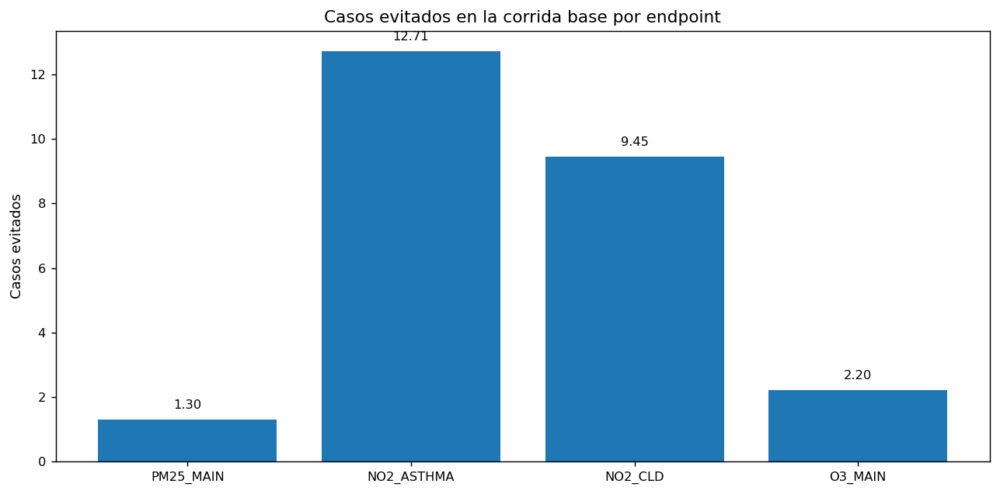

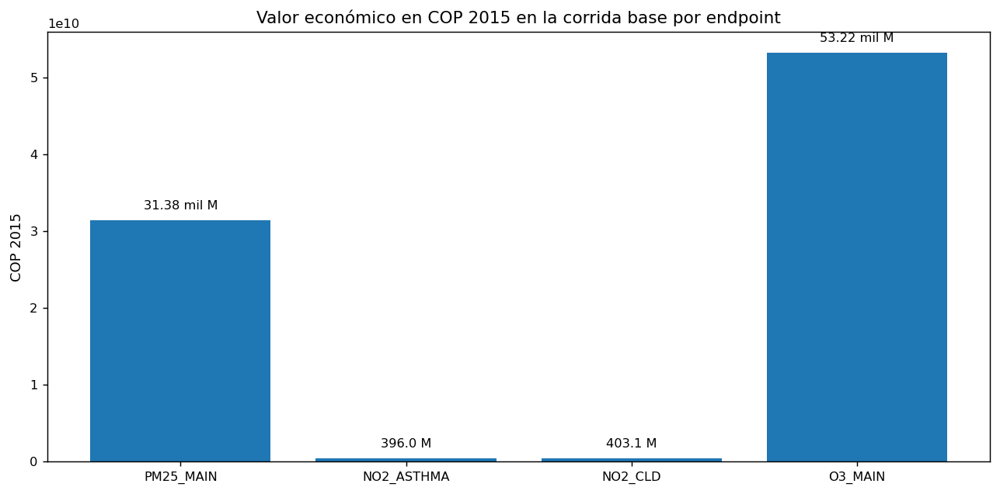


LECTURA RESUMIDA AUTOMÁTICA DEL BLOQUE 5.4


,Indicador,Corrida,Contaminante,Endpoint,Valor
0,Mayor número de casos evitados,NO2_ASTHMA,NO2,Hospitalizaciones por asma,12.713500
1,Mayor valor económico en COP 2015,O3_MAIN,O3,Mortalidad respiratoria,"53,224,570,212.139999"


In [74]:
# ============================================================
# CELDA 10. TABLA PRINCIPAL COMPACTA DEL BLOQUE 5.4
# RESULTADOS BASE SANITARIO-ECONOMICOS
# SOLO VISUALIZACION - SIN GUARDAR
# ============================================================

from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import unicodedata

# ------------------------------------------------------------
# 1. Funciones auxiliares
# ------------------------------------------------------------
def norm_txt(x):
    x = str(x).strip().lower()
    x = unicodedata.normalize("NFKD", x).encode("ascii", "ignore").decode("utf-8")
    return x

def buscar_col(df, candidatos_exactos=None, contiene=None, excluir=None):
    if candidatos_exactos is None:
        candidatos_exactos = []
    if contiene is None:
        contiene = []
    if excluir is None:
        excluir = []

    mapa = {c: norm_txt(c) for c in df.columns}

    cand_exact = [norm_txt(x) for x in candidatos_exactos]
    for c, cn in mapa.items():
        if cn in cand_exact:
            return c

    cand_cont = [norm_txt(x) for x in contiene]
    cand_excl = [norm_txt(x) for x in excluir]
    for c, cn in mapa.items():
        if any(t in cn for t in cand_cont) and not any(t in cn for t in cand_excl):
            return c

    return None

def formato_usd_legible(x):
    if pd.isna(x):
        return np.nan
    x = float(x)
    if abs(x) >= 1_000_000:
        return f"{x/1_000_000:.2f} millones USD"
    if abs(x) >= 1_000:
        return f"{x/1_000:.2f} mil USD"
    return f"{x:.2f} USD"

def formato_cop_legible(x):
    if pd.isna(x):
        return np.nan
    x = float(x)
    if abs(x) >= 1_000_000_000:
        return f"{x/1_000_000_000:.2f} mil millones COP"
    if abs(x) >= 1_000_000:
        return f"{x/1_000_000:.2f} millones COP"
    return f"{x:.2f} COP"

# ------------------------------------------------------------
# 2. Rutas candidatas
# ------------------------------------------------------------
candidatos_impactos = [
    Path(r"D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\benmap_base\impactos_sanitarios_resumen.csv"),
    Path(r"D:\TRABAJO DE GRADO BEN-MAP\SALIDAS_SENSIBILIDAD\03_corrida_principal\impactos_sanitarios_resumen.csv"),
]

candidatos_usd = [
    Path(r"D:\TRABAJO DE GRADO BEN-MAP\SALIDAS_SENSIBILIDAD\03_corrida_principal\valoracion_economica_resumen_usd2015.csv"),
    Path(r"D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\benmap_base\valoracion_economica_resumen_usd2015.csv"),
]

candidatos_cop = [
    Path(r"D:\TRABAJO DE GRADO BEN-MAP\SALIDAS_SENSIBILIDAD\07_tablas\valoracion_economica_resumen_cop.csv"),
    Path(r"D:\TRABAJO DE GRADO BEN-MAP\SALIDAS_SENSIBILIDAD\03_corrida_principal\valoracion_economica_resumen_cop.csv"),
    Path(r"D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\benmap_base\valoracion_economica_resumen_cop.csv"),
]

ruta_impactos = next((p for p in candidatos_impactos if p.exists()), None)
ruta_usd = next((p for p in candidatos_usd if p.exists()), None)
ruta_cop = next((p for p in candidatos_cop if p.exists()), None)

if ruta_impactos is None:
    raise FileNotFoundError("No se encontró impactos_sanitarios_resumen.csv")
if ruta_usd is None:
    raise FileNotFoundError("No se encontró valoracion_economica_resumen_usd2015.csv")
if ruta_cop is None:
    raise FileNotFoundError("No se encontró valoracion_economica_resumen_cop.csv")

print("=" * 90)
print("ARCHIVOS BASE DEL MODULO TIPO BENMAP DETECTADOS")
print("=" * 90)
print(f"Impactos sanitarios : {ruta_impactos}")
print(f"Valoración USD 2015 : {ruta_usd}")
print(f"Valoración COP 2015 : {ruta_cop}")

# ------------------------------------------------------------
# 3. Cargar archivos
# ------------------------------------------------------------
df_imp = pd.read_csv(ruta_impactos, encoding="utf-8-sig")
df_usd = pd.read_csv(ruta_usd, encoding="utf-8-sig")
df_cop = pd.read_csv(ruta_cop, encoding="utf-8-sig")

for df in [df_imp, df_usd, df_cop]:
    df.columns = [str(c).replace("\ufeff", "").strip() for c in df.columns]

print("\n" + "=" * 90)
print("FORMAS DE LOS ARCHIVOS CARGADOS")
print("=" * 90)
print("impactos_sanitarios_resumen.csv      ->", df_imp.shape)
print("valoracion_economica_resumen_usd2015 ->", df_usd.shape)
print("valoracion_economica_resumen_cop     ->", df_cop.shape)

# ------------------------------------------------------------
# 4. Detectar columnas clave
# ------------------------------------------------------------
# impactos
col_run_imp  = buscar_col(df_imp,  candidatos_exactos=["run_id"])
col_pol_imp  = buscar_col(df_imp,  candidatos_exactos=["pollutant"])
col_grp_imp  = buscar_col(df_imp,  candidatos_exactos=["endpoint_group"])
col_end_imp  = buscar_col(df_imp,  candidatos_exactos=["endpoint"])
col_case_imp = buscar_col(
    df_imp,
    candidatos_exactos=["avoided_cases_total", "cases_avoided", "casos_evitados"],
    contiene=["avoided_cases", "cases_avoided", "casos"],
    excluir=["base", "central"]
)

# usd
col_run_usd  = buscar_col(df_usd, candidatos_exactos=["run_id"])
col_pol_usd  = buscar_col(df_usd, candidatos_exactos=["pollutant"])
col_grp_usd  = buscar_col(df_usd, candidatos_exactos=["endpoint_group"])
col_end_usd  = buscar_col(df_usd, candidatos_exactos=["endpoint"])
col_val_usd  = buscar_col(
    df_usd,
    candidatos_exactos=["economic_value_total_usd_2015", "valuation_usd_2015", "value_usd_2015"],
    contiene=["usd_2015", "value_total_usd", "economic_value_total_usd", "valuation"],
    excluir=["cop"]
)

# cop
col_run_cop  = buscar_col(df_cop, candidatos_exactos=["run_id"])
col_pol_cop  = buscar_col(df_cop, candidatos_exactos=["pollutant"])
col_grp_cop  = buscar_col(df_cop, candidatos_exactos=["endpoint_group"])
col_end_cop  = buscar_col(df_cop, candidatos_exactos=["endpoint"])
col_val_cop  = buscar_col(
    df_cop,
    candidatos_exactos=["economic_value_total_cop_2015", "valuation_cop_2015", "value_cop_2015"],
    contiene=["cop_2015", "value_total_cop", "economic_value_total_cop", "valuation"],
    excluir=["usd"]
)

det = {
    "impactos": [col_run_imp, col_pol_imp, col_grp_imp, col_end_imp, col_case_imp],
    "usd":      [col_run_usd, col_pol_usd, col_grp_usd, col_end_usd, col_val_usd],
    "cop":      [col_run_cop, col_pol_cop, col_grp_cop, col_end_cop, col_val_cop],
}

if any(x is None for x in det["impactos"]):
    raise ValueError(f"No se detectaron bien columnas en impactos. Columnas: {list(df_imp.columns)}")
if any(x is None for x in det["usd"]):
    raise ValueError(f"No se detectaron bien columnas en USD. Columnas: {list(df_usd.columns)}")
if any(x is None for x in det["cop"]):
    raise ValueError(f"No se detectaron bien columnas en COP. Columnas: {list(df_cop.columns)}")

# ------------------------------------------------------------
# 5. Homologar y unir
# ------------------------------------------------------------
imp = df_imp[[col_run_imp, col_pol_imp, col_grp_imp, col_end_imp, col_case_imp]].copy()
imp.columns = ["run_id", "pollutant", "endpoint_group", "endpoint", "avoided_cases_total"]

usd = df_usd[[col_run_usd, col_pol_usd, col_grp_usd, col_end_usd, col_val_usd]].copy()
usd.columns = ["run_id", "pollutant", "endpoint_group", "endpoint", "economic_value_total_usd_2015"]

cop = df_cop[[col_run_cop, col_pol_cop, col_grp_cop, col_end_cop, col_val_cop]].copy()
cop.columns = ["run_id", "pollutant", "endpoint_group", "endpoint", "economic_value_total_cop_2015"]

tabla_base = imp.merge(
    usd,
    on=["run_id", "pollutant", "endpoint_group", "endpoint"],
    how="left"
).merge(
    cop,
    on=["run_id", "pollutant", "endpoint_group", "endpoint"],
    how="left"
)

# ------------------------------------------------------------
# 6. Etiquetas legibles
# ------------------------------------------------------------
map_grp = {
    "Mortality": "Mortalidad",
    "Hospital Admissions": "Hospitalizaciones"
}
map_endpoint = {
    "All-cause mortality": "Mortalidad por todas las causas",
    "Respiratory mortality": "Mortalidad respiratoria",
    "Asthma": "Hospitalizaciones por asma",
    "Chronic Lung Disease": "Hospitalizaciones por enfermedad pulmonar crónica"
}

tabla_base["Grupo endpoint"] = tabla_base["endpoint_group"].replace(map_grp)
tabla_base["Endpoint legible"] = tabla_base["endpoint"].replace(map_endpoint)

# por si algún texto no coincide exactamente
tabla_base["Grupo endpoint"] = tabla_base["Grupo endpoint"].fillna(tabla_base["endpoint_group"])
tabla_base["Endpoint legible"] = tabla_base["Endpoint legible"].fillna(tabla_base["endpoint"])

tabla_base["Contaminante"] = tabla_base["pollutant"]
tabla_base["Corrida"] = tabla_base["run_id"]

# ------------------------------------------------------------
# 7. Tabla compacta principal
# ------------------------------------------------------------
tabla_principal_base = tabla_base[[
    "Corrida",
    "Contaminante",
    "Grupo endpoint",
    "Endpoint legible",
    "avoided_cases_total",
    "economic_value_total_usd_2015",
    "economic_value_total_cop_2015"
]].copy()

tabla_principal_base = tabla_principal_base.rename(columns={
    "avoided_cases_total": "Casos evitados",
    "economic_value_total_usd_2015": "Valor económico USD 2015",
    "economic_value_total_cop_2015": "Valor económico COP 2015"
})

orden_run = ["PM25_MAIN", "NO2_ASTHMA", "NO2_CLD", "O3_MAIN"]
tabla_principal_base["Corrida"] = pd.Categorical(
    tabla_principal_base["Corrida"],
    categories=orden_run,
    ordered=True
)
tabla_principal_base = tabla_principal_base.sort_values("Corrida").reset_index(drop=True)

print("\n" + "=" * 90)
print("TABLA PRINCIPAL DEL BLOQUE 5.4 - BENMAP BASE")
print("=" * 90)
display(tabla_principal_base.round(4))

# ------------------------------------------------------------
# 8. Versión legible
# ------------------------------------------------------------
tabla_legible_base = tabla_principal_base.copy()
tabla_legible_base["Casos evitados"] = tabla_legible_base["Casos evitados"].map(lambda x: f"{x:,.4f}")
tabla_legible_base["Valor económico USD 2015 (legible)"] = tabla_principal_base["Valor económico USD 2015"].apply(formato_usd_legible)
tabla_legible_base["Valor económico COP 2015 (legible)"] = tabla_principal_base["Valor económico COP 2015"].apply(formato_cop_legible)

tabla_legible_base = tabla_legible_base[[
    "Corrida",
    "Contaminante",
    "Grupo endpoint",
    "Endpoint legible",
    "Casos evitados",
    "Valor económico USD 2015 (legible)",
    "Valor económico COP 2015 (legible)"
]]

print("\n" + "=" * 90)
print("TABLA LEGIBLE DEL BLOQUE 5.4 - BENMAP BASE")
print("=" * 90)
display(tabla_legible_base)

# ------------------------------------------------------------
# 9. Figura 1 - Casos evitados
# ------------------------------------------------------------
fig, ax = plt.subplots(figsize=(10, 5))
sub = tabla_principal_base.copy()

bars = ax.bar(
    sub["Corrida"].astype(str),
    sub["Casos evitados"]
)

ax.set_title("Casos evitados en la corrida base por endpoint")
ax.set_xlabel("")
ax.set_ylabel("Casos evitados")

ymin, ymax = ax.get_ylim()
rango = ymax - ymin if ymax != ymin else 1.0

for b in bars:
    val = b.get_height()
    ax.text(
        b.get_x() + b.get_width() / 2,
        val + 0.02 * rango,
        f"{val:.2f}",
        ha="center",
        va="bottom",
        fontsize=9
    )

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 10. Figura 2 - Valor económico COP 2015
# ------------------------------------------------------------
fig, ax = plt.subplots(figsize=(10, 5))

bars = ax.bar(
    sub["Corrida"].astype(str),
    sub["Valor económico COP 2015"]
)

ax.set_title("Valor económico en COP 2015 en la corrida base por endpoint")
ax.set_xlabel("")
ax.set_ylabel("COP 2015")

ymin, ymax = ax.get_ylim()
rango = ymax - ymin if ymax != ymin else 1.0

for b in bars:
    val = b.get_height()
    etiqueta = f"{val/1_000_000:.1f} M" if abs(val) < 1_000_000_000 else f"{val/1_000_000_000:.2f} mil M"
    ax.text(
        b.get_x() + b.get_width() / 2,
        val + 0.02 * rango,
        etiqueta,
        ha="center",
        va="bottom",
        fontsize=9
    )

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 11. Lectura resumida automática
# ------------------------------------------------------------
fila_mayor_casos = tabla_principal_base.loc[tabla_principal_base["Casos evitados"].idxmax()]
fila_mayor_valor = tabla_principal_base.loc[tabla_principal_base["Valor económico COP 2015"].idxmax()]

tabla_lectura_base = pd.DataFrame([
    {
        "Indicador": "Mayor número de casos evitados",
        "Corrida": str(fila_mayor_casos["Corrida"]),
        "Contaminante": fila_mayor_casos["Contaminante"],
        "Endpoint": fila_mayor_casos["Endpoint legible"],
        "Valor": round(float(fila_mayor_casos["Casos evitados"]), 4)
    },
    {
        "Indicador": "Mayor valor económico en COP 2015",
        "Corrida": str(fila_mayor_valor["Corrida"]),
        "Contaminante": fila_mayor_valor["Contaminante"],
        "Endpoint": fila_mayor_valor["Endpoint legible"],
        "Valor": round(float(fila_mayor_valor["Valor económico COP 2015"]), 2)
    }
])

print("\n" + "=" * 90)
print("LECTURA RESUMIDA AUTOMÁTICA DEL BLOQUE 5.4")
print("=" * 90)
display(tabla_lectura_base)

### Gráfica económica corregida del bloque 5.4

La gráfica económica original fue reemplazada por una versión más interpretable, separando los endpoints según su naturaleza sanitaria. Esta corrección evita distorsiones visuales derivadas de la diferencia de magnitudes entre los desenlaces de mortalidad y los de hospitalización.

En particular, se construyen dos gráficas independientes:
1. **Valor económico asociado a endpoints de mortalidad**.
2. **Valor económico asociado a endpoints de hospitalización**.

Esta separación mejora la comparabilidad entre resultados y permite una interpretación más clara del peso económico relativo de cada desenlace dentro de la corrida base del módulo tipo BenMAP.

In [75]:
from pathlib import Path
import os
import pandas as pd

# ============================================================
# 1. BASE DEL PROYECTO
# ============================================================
BASE = Path(r"D:\TRABAJO DE GRADO BEN-MAP")

def leer_csv_flexible(path):
    path = str(path)
    if not os.path.exists(path):
        raise FileNotFoundError(f"No existe el archivo:\n{path}")
    for enc in ["utf-8-sig", "utf-8", "latin1", "cp1252"]:
        try:
            return pd.read_csv(path, encoding=enc)
        except Exception:
            continue
    raise ValueError(f"No pude leer el archivo:\n{path}")

def buscar_archivo(nombre, carpeta_prioritaria=None):
    hallados = list(BASE.rglob(nombre))
    if not hallados:
        return None

    if carpeta_prioritaria:
        hallados = sorted(
            hallados,
            key=lambda p: (0 if carpeta_prioritaria.lower() in str(p).lower() else 1, len(str(p)))
        )
    else:
        hallados = sorted(hallados, key=lambda p: len(str(p)))

    return hallados[0]

# ============================================================
# 2. BUSCAR ARCHIVOS AUTOMÁTICAMENTE
# ============================================================
PATH_IMPACTOS = buscar_archivo(
    "impactos_sanitarios_resumen.csv",
    carpeta_prioritaria="03_corrida_principal"
)

PATH_USD = buscar_archivo(
    "valoracion_economica_resumen_usd2015.csv",
    carpeta_prioritaria="03_corrida_principal"
)

# primero intenta resumen COP; si no existe, usa el de por celda
PATH_COP = buscar_archivo(
    "valoracion_economica_resumen_cop.csv",
    carpeta_prioritaria="07_tablas"
)

if PATH_COP is None:
    PATH_COP = buscar_archivo(
        "valoracion_economica_por_celda_cop.csv",
        carpeta_prioritaria="03_corrida_principal"
    )

print("=" * 90)
print("RUTAS DETECTADAS")
print("=" * 90)
print("Impactos :", PATH_IMPACTOS)
print("USD      :", PATH_USD)
print("COP      :", PATH_COP)

if PATH_IMPACTOS is None:
    raise FileNotFoundError("No encontré 'impactos_sanitarios_resumen.csv' dentro del proyecto.")

if PATH_USD is None:
    raise FileNotFoundError("No encontré 'valoracion_economica_resumen_usd2015.csv' dentro del proyecto.")

if PATH_COP is None:
    raise FileNotFoundError("No encontré ni 'valoracion_economica_resumen_cop.csv' ni 'valoracion_economica_por_celda_cop.csv' dentro del proyecto.")

# ============================================================
# 3. CARGAR ARCHIVOS
# ============================================================
impactos = leer_csv_flexible(PATH_IMPACTOS)
val_usd  = leer_csv_flexible(PATH_USD)
val_cop  = leer_csv_flexible(PATH_COP)

print("\n" + "=" * 90)
print("FORMAS CARGADAS")
print("=" * 90)
print("impactos:", impactos.shape)
print("usd     :", val_usd.shape)
print("cop     :", val_cop.shape)

RUTAS DETECTADAS
Impactos : D:\TRABAJO DE GRADO BEN-MAP\SALIDAS_SENSIBILIDAD\03_corrida_principal\impactos_sanitarios_resumen.csv
USD      : D:\TRABAJO DE GRADO BEN-MAP\SALIDAS_SENSIBILIDAD\03_corrida_principal\valoracion_economica_resumen_usd2015.csv
COP      : D:\TRABAJO DE GRADO BEN-MAP\SALIDAS_SENSIBILIDAD\07_tablas\valoracion_economica_resumen_cop.csv

FORMAS CARGADAS
impactos: (4, 16)
usd     : (4, 11)
cop     : (4, 14)


COLUMNAS DISPONIBLES
impactos: ['run_id', 'pollutant', 'endpoint_group', 'endpoint', 'economic_method', 'n_rows', 'n_unique_cells', 'delta_mean', 'population_total', 'incidence_mean', 'beta', 'beta_se', 'rr_mean', 'af_avoided_mean', 'baseline_cases_total', 'avoided_cases_total']
usd     : ['run_id', 'pollutant', 'endpoint_group', 'endpoint', 'economic_method', 'n_rows', 'n_unique_cells', 'avoided_cases_total', 'valuation_value_used_usd_2015', 'economic_value_total_usd_2015', 'economic_value_mean_usd_2015']
cop     : ['run_id', 'pollutant', 'endpoint_group', 'endpoint', 'economic_method', 'n_rows', 'n_unique_cells', 'avoided_cases_total', 'valuation_value_used_usd_2015', 'valuation_value_used_cop_2015', 'economic_value_total_usd_2015', 'economic_value_total_cop_2015', 'economic_value_total_cop_local_base', 'local_base_year_label']

TABLA PRINCIPAL DEL BLOQUE 5.4 - BENMAP BASE


,Corrida,Contaminante,Grupo endpoint,Endpoint legible,Casos evitados,Valor económico USD 2015,Valor económico COP 2015
0,PM25_MAIN,PM25,Mortalidad,Mortalidad por todas las causas,1.299800,"11,314,898.968000","31,381,080,244.766300"
1,NO2_ASTHMA,NO2,Hospitalizaciones,Hospitalizaciones por asma,12.713500,"142,798.325100","396,041,158.652300"
2,NO2_CLD,NO2,Hospitalizaciones,Hospitalizaciones por enfermedad pulmonar crónica,9.454100,"145,357.370500","403,138,491.992400"
3,O3_MAIN,O3,Mortalidad,Mortalidad respiratoria,2.204600,"19,190,882.846200","53,224,570,212.140198"



TABLA LEGIBLE DEL BLOQUE 5.4 - BENMAP BASE


,Corrida,Contaminante,Grupo endpoint,Endpoint legible,Casos evitados,Valor económico USD 2015 (legible),Valor económico COP 2015 (legible)
0,PM25_MAIN,PM25,Mortalidad,Mortalidad por todas las causas,1.299799,11.31 millones USD,31.38 mil millones COP
1,NO2_ASTHMA,NO2,Hospitalizaciones,Hospitalizaciones por asma,12.713526,142.80 mil USD,396.04 millones COP
2,NO2_CLD,NO2,Hospitalizaciones,Hospitalizaciones por enfermedad pulmonar crónica,9.454138,145.36 mil USD,403.14 millones COP
3,O3_MAIN,O3,Mortalidad,Mortalidad respiratoria,2.204553,19.19 millones USD,53.22 mil millones COP


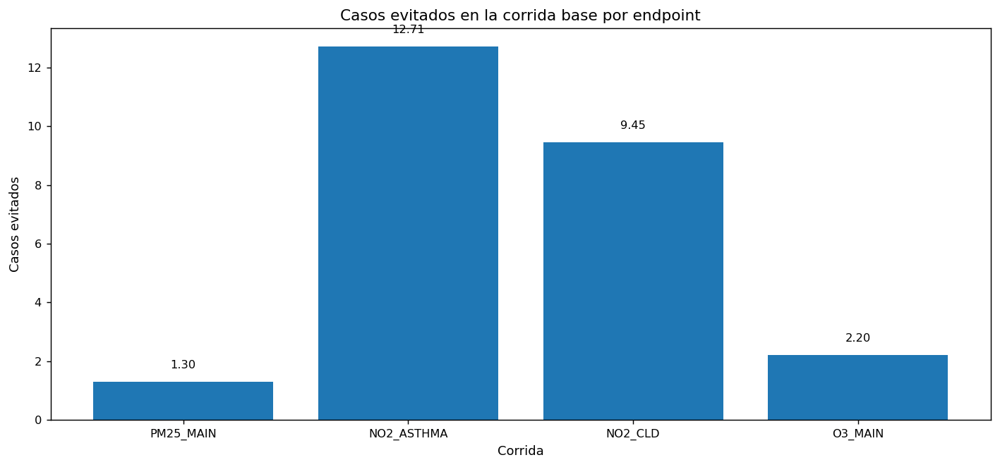

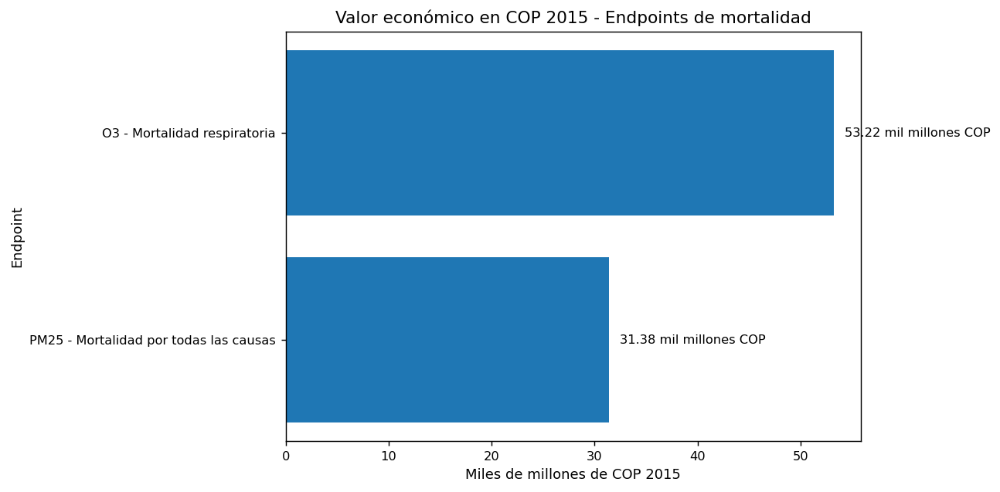

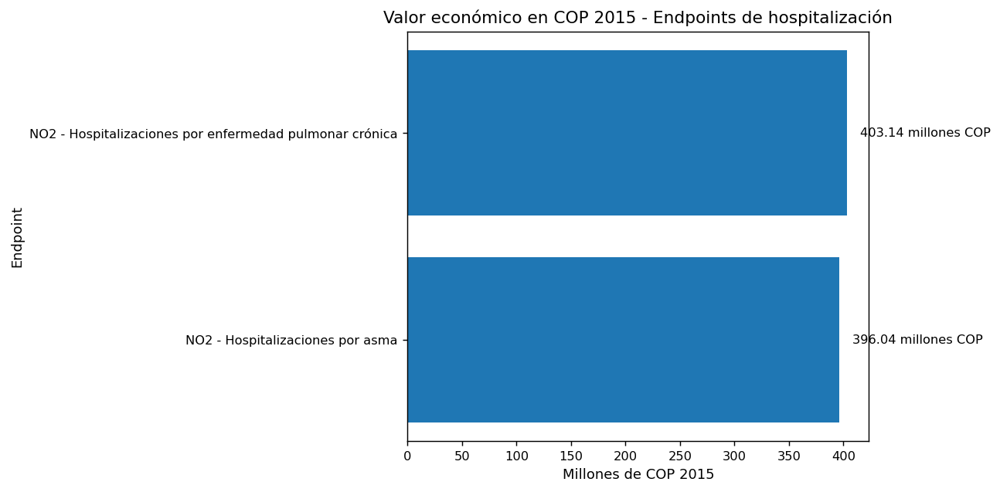


LECTURA RESUMIDA AUTOMÁTICA DEL BLOQUE 5.4


,Indicador,Corrida,Contaminante,Endpoint,Valor
0,Mayor número de casos evitados,NO2_ASTHMA,NO2,Hospitalizaciones por asma,12.713500
1,Mayor valor económico en mortalidad,O3_MAIN,O3,Mortalidad respiratoria,53.22 mil millones COP
2,Mayor valor económico en hospitalización,NO2_CLD,NO2,Hospitalizaciones por enfermedad pulmonar crónica,403.14 millones COP


In [76]:
# ============================================================
# 4. CONSOLIDAR TABLA BASE DEL BLOQUE 5.4
# ============================================================

import re
import unicodedata
import pandas as pd
import matplotlib.pyplot as plt

def normalizar_texto(txt):
    txt = str(txt).strip().lower()
    txt = unicodedata.normalize("NFKD", txt).encode("ascii", "ignore").decode("utf-8")
    txt = re.sub(r"[^a-z0-9]+", "_", txt)
    txt = re.sub(r"_+", "_", txt).strip("_")
    return txt

def mapa_columnas(df):
    return {normalizar_texto(c): c for c in df.columns}

def buscar_columna(df, candidatos_norm):
    cols_map = mapa_columnas(df)
    for cand in candidatos_norm:
        if cand in cols_map:
            return cols_map[cand]
    return None

def buscar_columna_por_fragmentos(df, incluir, excluir=None, solo_numerica=False):
    excluir = excluir or []
    for c in df.columns:
        cn = normalizar_texto(c)
        if all(frag in cn for frag in incluir) and not any(frag in cn for frag in excluir):
            if solo_numerica:
                if pd.api.types.is_numeric_dtype(df[c]):
                    return c
            else:
                return c
    return None

def formatear_cop(valor):
    if pd.isna(valor):
        return ""
    if abs(valor) >= 1e12:
        return f"{valor/1e12:.2f} billones COP"
    if abs(valor) >= 1e9:
        return f"{valor/1e9:.2f} mil millones COP"
    if abs(valor) >= 1e6:
        return f"{valor/1e6:.2f} millones COP"
    return f"{valor:,.0f} COP"

def formatear_usd(valor):
    if pd.isna(valor):
        return ""
    if abs(valor) >= 1e9:
        return f"{valor/1e9:.2f} mil millones USD"
    if abs(valor) >= 1e6:
        return f"{valor/1e6:.2f} millones USD"
    if abs(valor) >= 1e3:
        return f"{valor/1e3:.2f} mil USD"
    return f"{valor:,.0f} USD"

# limpiar nombres
for df in [impactos, val_usd, val_cop]:
    df.columns = [str(c).replace("\ufeff", "").strip() for c in df.columns]

print("=" * 90)
print("COLUMNAS DISPONIBLES")
print("=" * 90)
print("impactos:", list(impactos.columns))
print("usd     :", list(val_usd.columns))
print("cop     :", list(val_cop.columns))

# ------------------------------------------------------------
# Detectar columnas clave
# ------------------------------------------------------------
col_run_imp = buscar_columna(impactos, ["run_id"])
col_pol_imp = buscar_columna(impactos, ["pollutant"])
col_grp_imp = buscar_columna(impactos, ["endpoint_group"])
col_end_imp = buscar_columna(impactos, ["endpoint"])
col_case_imp = buscar_columna(impactos, ["avoided_cases_total"])

if col_case_imp is None:
    col_case_imp = buscar_columna_por_fragmentos(impactos, ["avoided", "cases"], solo_numerica=True)

col_run_usd = buscar_columna(val_usd, ["run_id"])
col_pol_usd = buscar_columna(val_usd, ["pollutant"])
col_grp_usd = buscar_columna(val_usd, ["endpoint_group"])
col_end_usd = buscar_columna(val_usd, ["endpoint"])
col_val_usd = buscar_columna(val_usd, ["economic_value_total_usd_2015"])

if col_val_usd is None:
    col_val_usd = buscar_columna_por_fragmentos(val_usd, ["usd"], solo_numerica=True)

col_run_cop = buscar_columna(val_cop, ["run_id"])
col_pol_cop = buscar_columna(val_cop, ["pollutant"])
col_grp_cop = buscar_columna(val_cop, ["endpoint_group"])
col_end_cop = buscar_columna(val_cop, ["endpoint"])
col_val_cop = buscar_columna(val_cop, ["economic_value_total_cop_2015"])

if col_val_cop is None:
    col_val_cop = buscar_columna_por_fragmentos(val_cop, ["cop"], solo_numerica=True)

faltantes = {
    "impactos": [col_run_imp, col_pol_imp, col_grp_imp, col_end_imp, col_case_imp],
    "usd": [col_run_usd, col_pol_usd, col_grp_usd, col_end_usd, col_val_usd],
    "cop": [col_run_cop, col_pol_cop, col_grp_cop, col_end_cop, col_val_cop],
}

if any(x is None for x in faltantes["impactos"]):
    raise ValueError(f"No pude detectar bien columnas en impactos. {list(impactos.columns)}")
if any(x is None for x in faltantes["usd"]):
    raise ValueError(f"No pude detectar bien columnas en USD. {list(val_usd.columns)}")
if any(x is None for x in faltantes["cop"]):
    raise ValueError(f"No pude detectar bien columnas en COP. {list(val_cop.columns)}")

# ------------------------------------------------------------
# Homologar
# ------------------------------------------------------------
imp = impactos[[col_run_imp, col_pol_imp, col_grp_imp, col_end_imp, col_case_imp]].copy()
imp.columns = ["run_id", "pollutant", "endpoint_group", "endpoint", "Casos evitados"]

usd = val_usd[[col_run_usd, col_pol_usd, col_grp_usd, col_end_usd, col_val_usd]].copy()
usd.columns = ["run_id", "pollutant", "endpoint_group", "endpoint", "Valor económico USD 2015"]

cop = val_cop[[col_run_cop, col_pol_cop, col_grp_cop, col_end_cop, col_val_cop]].copy()
cop.columns = ["run_id", "pollutant", "endpoint_group", "endpoint", "Valor económico COP 2015"]

tabla_54 = imp.merge(
    usd,
    on=["run_id", "pollutant", "endpoint_group", "endpoint"],
    how="left"
).merge(
    cop,
    on=["run_id", "pollutant", "endpoint_group", "endpoint"],
    how="left"
)

# ------------------------------------------------------------
# Etiquetas legibles
# ------------------------------------------------------------
map_grp = {
    "Mortality": "Mortalidad",
    "Hospital Admissions": "Hospitalizaciones"
}

map_endpoint = {
    "All-cause mortality": "Mortalidad por todas las causas",
    "Respiratory mortality": "Mortalidad respiratoria",
    "Asthma": "Hospitalizaciones por asma",
    "Chronic Lung Disease": "Hospitalizaciones por enfermedad pulmonar crónica"
}

tabla_54["Corrida"] = tabla_54["run_id"]
tabla_54["Contaminante"] = tabla_54["pollutant"]
tabla_54["Grupo endpoint"] = tabla_54["endpoint_group"].replace(map_grp)
tabla_54["Endpoint legible"] = tabla_54["endpoint"].replace(map_endpoint)

tabla_54["Grupo endpoint"] = tabla_54["Grupo endpoint"].fillna(tabla_54["endpoint_group"])
tabla_54["Endpoint legible"] = tabla_54["Endpoint legible"].fillna(tabla_54["endpoint"])

tabla_54["Etiqueta"] = tabla_54["Contaminante"].astype(str) + " - " + tabla_54["Endpoint legible"].astype(str)

# ------------------------------------------------------------
# Tabla principal
# ------------------------------------------------------------
tabla_principal_54 = tabla_54[[
    "Corrida",
    "Contaminante",
    "Grupo endpoint",
    "Endpoint legible",
    "Casos evitados",
    "Valor económico USD 2015",
    "Valor económico COP 2015"
]].copy()

orden_run = ["PM25_MAIN", "NO2_ASTHMA", "NO2_CLD", "O3_MAIN"]
tabla_principal_54["Corrida"] = pd.Categorical(
    tabla_principal_54["Corrida"],
    categories=orden_run,
    ordered=True
)
tabla_principal_54 = tabla_principal_54.sort_values("Corrida").reset_index(drop=True)

print("\n" + "=" * 90)
print("TABLA PRINCIPAL DEL BLOQUE 5.4 - BENMAP BASE")
print("=" * 90)
display(tabla_principal_54.round(4))

tabla_legible_54 = tabla_principal_54.copy()
tabla_legible_54["Valor económico USD 2015 (legible)"] = tabla_legible_54["Valor económico USD 2015"].apply(formatear_usd)
tabla_legible_54["Valor económico COP 2015 (legible)"] = tabla_legible_54["Valor económico COP 2015"].apply(formatear_cop)

tabla_legible_54 = tabla_legible_54[[
    "Corrida", "Contaminante", "Grupo endpoint", "Endpoint legible",
    "Casos evitados", "Valor económico USD 2015 (legible)", "Valor económico COP 2015 (legible)"
]]

print("\n" + "=" * 90)
print("TABLA LEGIBLE DEL BLOQUE 5.4 - BENMAP BASE")
print("=" * 90)
display(tabla_legible_54)

# ============================================================
# 5. GRÁFICA DE CASOS EVITADOS
# ============================================================
plt.figure(figsize=(11, 5.2))
bars = plt.bar(tabla_principal_54["Corrida"].astype(str), tabla_principal_54["Casos evitados"])
plt.title("Casos evitados en la corrida base por endpoint")
plt.ylabel("Casos evitados")
plt.xlabel("Corrida")

ymax = tabla_principal_54["Casos evitados"].max()
for bar, val in zip(bars, tabla_principal_54["Casos evitados"]):
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        val + ymax * 0.03,
        f"{val:.2f}",
        ha="center",
        va="bottom",
        fontsize=9
    )

plt.tight_layout()
plt.show()

# ============================================================
# 6. GRÁFICA ECONÓMICA CORREGIDA
# Separar mortalidad y hospitalizaciones
# ============================================================

tabla_principal_54["Etiqueta"] = (
    tabla_principal_54["Contaminante"].astype(str)
    + " - " +
    tabla_principal_54["Endpoint legible"].astype(str)
)

tabla_principal_54["grupo_norm"] = (
    tabla_principal_54["Grupo endpoint"].astype(str).str.lower().str.strip()
)

df_mortalidad = tabla_principal_54[
    tabla_principal_54["grupo_norm"].str.contains("mortal", na=False)
].copy()

df_hosp = tabla_principal_54[
    tabla_principal_54["grupo_norm"].str.contains("hospital", na=False)
].copy()

# Mortalidad
if len(df_mortalidad) > 0:
    df_mortalidad = df_mortalidad.sort_values("Valor económico COP 2015", ascending=True)
    df_mortalidad["valor_plot"] = df_mortalidad["Valor económico COP 2015"] / 1e9

    plt.figure(figsize=(10, 5))
    bars = plt.barh(df_mortalidad["Etiqueta"], df_mortalidad["valor_plot"])
    plt.title("Valor económico en COP 2015 - Endpoints de mortalidad")
    plt.xlabel("Miles de millones de COP 2015")
    plt.ylabel("Endpoint")

    xmax = df_mortalidad["valor_plot"].max()
    for bar, val_real in zip(bars, df_mortalidad["Valor económico COP 2015"]):
        plt.text(
            bar.get_width() + xmax * 0.02,
            bar.get_y() + bar.get_height() / 2,
            formatear_cop(val_real),
            va="center",
            fontsize=9
        )

    plt.tight_layout()
    plt.show()

# Hospitalizaciones
if len(df_hosp) > 0:
    df_hosp = df_hosp.sort_values("Valor económico COP 2015", ascending=True)
    df_hosp["valor_plot"] = df_hosp["Valor económico COP 2015"] / 1e6

    plt.figure(figsize=(10, 5))
    bars = plt.barh(df_hosp["Etiqueta"], df_hosp["valor_plot"])
    plt.title("Valor económico en COP 2015 - Endpoints de hospitalización")
    plt.xlabel("Millones de COP 2015")
    plt.ylabel("Endpoint")

    xmax = df_hosp["valor_plot"].max()
    for bar, val_real in zip(bars, df_hosp["Valor económico COP 2015"]):
        plt.text(
            bar.get_width() + xmax * 0.03,
            bar.get_y() + bar.get_height() / 2,
            formatear_cop(val_real),
            va="center",
            fontsize=9
        )

    plt.tight_layout()
    plt.show()

# ============================================================
# 7. LECTURA RESUMIDA
# ============================================================
lectura_54 = []

fila_mayor_casos = tabla_principal_54.loc[tabla_principal_54["Casos evitados"].idxmax()]
lectura_54.append({
    "Indicador": "Mayor número de casos evitados",
    "Corrida": fila_mayor_casos["Corrida"],
    "Contaminante": fila_mayor_casos["Contaminante"],
    "Endpoint": fila_mayor_casos["Endpoint legible"],
    "Valor": round(float(fila_mayor_casos["Casos evitados"]), 4)
})

if len(df_mortalidad) > 0:
    fila_mort = df_mortalidad.loc[df_mortalidad["Valor económico COP 2015"].idxmax()]
    lectura_54.append({
        "Indicador": "Mayor valor económico en mortalidad",
        "Corrida": fila_mort["Corrida"],
        "Contaminante": fila_mort["Contaminante"],
        "Endpoint": fila_mort["Endpoint legible"],
        "Valor": formatear_cop(fila_mort["Valor económico COP 2015"])
    })

if len(df_hosp) > 0:
    fila_hosp = df_hosp.loc[df_hosp["Valor económico COP 2015"].idxmax()]
    lectura_54.append({
        "Indicador": "Mayor valor económico en hospitalización",
        "Corrida": fila_hosp["Corrida"],
        "Contaminante": fila_hosp["Contaminante"],
        "Endpoint": fila_hosp["Endpoint legible"],
        "Valor": formatear_cop(fila_hosp["Valor económico COP 2015"])
    })

print("\n" + "=" * 90)
print("LECTURA RESUMIDA AUTOMÁTICA DEL BLOQUE 5.4")
print("=" * 90)
display(pd.DataFrame(lectura_54))

# Celda 10A. Pulido visual del bloque 5.4

En esta celda se mejora la presentación del bloque 5.4 sin modificar los resultados numéricos. En particular, se reemplazan los identificadores técnicos de corrida por etiquetas más legibles, se ajusta la gráfica de casos evitados para hacerla más interpretable y se genera una tabla final compacta de lectura para su uso en el capítulo de resultados.

TABLA COMPACTA FINAL DEL BLOQUE 5.4


,Contaminante,Grupo endpoint,Endpoint legible,Casos evitados,Valor económico USD 2015 (lectura),Valor económico COP 2015 (lectura)
0,PM25,Mortalidad,Mortalidad por todas las causas,1.299800,11.31 millones USD,31.38 mil millones COP
1,NO2,Hospitalizaciones,Hospitalizaciones por asma,12.713500,142.80 mil USD,396.04 millones COP
2,NO2,Hospitalizaciones,Hospitalizaciones por enfermedad pulmonar crónica,9.454100,145.36 mil USD,403.14 millones COP
3,O3,Mortalidad,Mortalidad respiratoria,2.204600,19.19 millones USD,53.22 mil millones COP


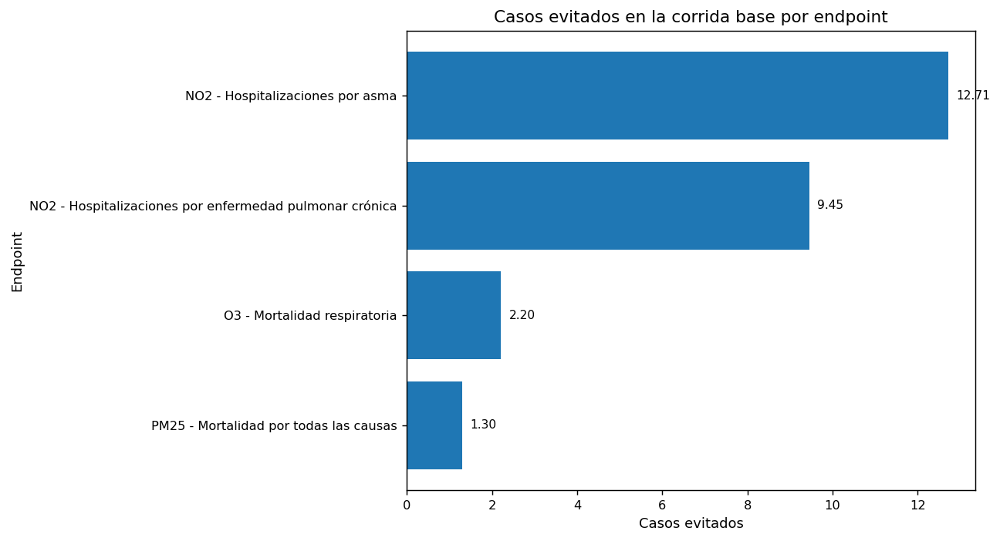


TABLA SINTÉTICA FINAL DE LECTURA DEL BLOQUE 5.4


,Indicador,Resultado,Valor
0,Mayor número de casos evitados,NO2 - Hospitalizaciones por asma,12.7135 casos
1,Mayor valor económico en mortalidad,O3 - Mortalidad respiratoria,53.22 mil millones COP
2,Mayor valor económico en hospitalización,NO2 - Hospitalizaciones por enfermedad pulmonar crónica,403.14 millones COP


In [77]:
# ============================================================
# CELDA 10A. PULIDO VISUAL DEL BLOQUE 5.4
# No recalcula resultados; solo mejora la presentación
# ============================================================

import pandas as pd
import matplotlib.pyplot as plt

# ------------------------------------------------------------
# 1. Copia de trabajo
# ------------------------------------------------------------
tabla_54_final = tabla_principal_54.copy()

# Etiqueta más legible para tablas y figuras
tabla_54_final["Etiqueta corta"] = tabla_54_final["Contaminante"].astype(str) + " - " + tabla_54_final["Endpoint legible"].astype(str)

# Etiqueta con salto de línea para gráficas
tabla_54_final["Etiqueta grafica"] = tabla_54_final["Contaminante"].astype(str) + "\n" + tabla_54_final["Endpoint legible"].astype(str)

# ------------------------------------------------------------
# 2. Tabla compacta final para tesis
# ------------------------------------------------------------
tabla_compacta_54 = tabla_54_final[[
    "Contaminante",
    "Grupo endpoint",
    "Endpoint legible",
    "Casos evitados",
    "Valor económico USD 2015",
    "Valor económico COP 2015"
]].copy()

tabla_compacta_54["Casos evitados"] = tabla_compacta_54["Casos evitados"].round(4)
tabla_compacta_54["Valor económico USD 2015 (lectura)"] = tabla_compacta_54["Valor económico USD 2015"].apply(formatear_usd)
tabla_compacta_54["Valor económico COP 2015 (lectura)"] = tabla_compacta_54["Valor económico COP 2015"].apply(formatear_cop)

tabla_compacta_54 = tabla_compacta_54[[
    "Contaminante",
    "Grupo endpoint",
    "Endpoint legible",
    "Casos evitados",
    "Valor económico USD 2015 (lectura)",
    "Valor económico COP 2015 (lectura)"
]]

print("=" * 90)
print("TABLA COMPACTA FINAL DEL BLOQUE 5.4")
print("=" * 90)
display(tabla_compacta_54)

# ------------------------------------------------------------
# 3. Gráfica pulida de casos evitados
# ------------------------------------------------------------
df_casos = tabla_54_final.sort_values("Casos evitados", ascending=False).copy()

plt.figure(figsize=(10, 5.5))
bars = plt.barh(df_casos["Etiqueta corta"], df_casos["Casos evitados"])
plt.title("Casos evitados en la corrida base por endpoint")
plt.xlabel("Casos evitados")
plt.ylabel("Endpoint")
plt.gca().invert_yaxis()

xmax = df_casos["Casos evitados"].max()
for bar, val in zip(bars, df_casos["Casos evitados"]):
   plt.text(
    bar.get_width() + xmax * 0.015,
    bar.get_y() + bar.get_height() / 2,
    f"{val:.2f}",
    va="center",
    fontsize=8.5
)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 4. Tabla sintética de lectura final
# ------------------------------------------------------------
fila_mayor_casos = tabla_54_final.loc[tabla_54_final["Casos evitados"].idxmax()]
fila_mayor_mort = df_mortalidad.loc[df_mortalidad["Valor económico COP 2015"].idxmax()] if len(df_mortalidad) > 0 else None
fila_mayor_hosp = df_hosp.loc[df_hosp["Valor económico COP 2015"].idxmax()] if len(df_hosp) > 0 else None

resumen_54_final = [
    {
        "Indicador": "Mayor número de casos evitados",
        "Resultado": f"{fila_mayor_casos['Contaminante']} - {fila_mayor_casos['Endpoint legible']}",
        "Valor": f"{float(fila_mayor_casos['Casos evitados']):.4f} casos"
    }
]

if fila_mayor_mort is not None:
    resumen_54_final.append({
        "Indicador": "Mayor valor económico en mortalidad",
        "Resultado": f"{fila_mayor_mort['Contaminante']} - {fila_mayor_mort['Endpoint legible']}",
        "Valor": formatear_cop(fila_mayor_mort["Valor económico COP 2015"])
    })

if fila_mayor_hosp is not None:
    resumen_54_final.append({
        "Indicador": "Mayor valor económico en hospitalización",
        "Resultado": f"{fila_mayor_hosp['Contaminante']} - {fila_mayor_hosp['Endpoint legible']}",
        "Valor": formatear_cop(fila_mayor_hosp["Valor económico COP 2015"])
    })

tabla_sintetica_54 = pd.DataFrame(resumen_54_final)

# ampliar ancho visual de la columna Resultado
tabla_sintetica_54["Resultado"] = tabla_sintetica_54["Resultado"].astype(str)

print("\n" + "=" * 90)
print("TABLA SINTÉTICA FINAL DE LECTURA DEL BLOQUE 5.4")
print("=" * 90)
display(tabla_sintetica_54.style.set_properties(
    subset=["Indicador"], **{"width": "280px", "text-align": "left"}
).set_properties(
    subset=["Resultado"], **{"width": "520px", "text-align": "left", "white-space": "normal"}
).set_properties(
    subset=["Valor"], **{"width": "180px", "text-align": "left"}
))

# Celda 11. Distribución espacial por localidad del bloque 5.4

En esta celda se consolida la información sanitaria y económica a nivel de celda para la corrida base del módulo tipo BenMAP, y posteriormente se agrega por localidad. El objetivo es identificar la distribución espacial de los casos evitados y de la valoración económica, así como reconocer cuáles localidades concentran una mayor proporción del impacto estimado.

Se construyen cuatro salidas principales:  
1. una tabla detallada por localidad,  
2. una tabla del top 5 de localidades por corrida según valoración económica,  
3. una figura comparativa por corrida, y  
4. una síntesis espacial con la localidad líder y la participación acumulada del top 5.

ARCHIVOS DETECTADOS PARA LA PARTE ESPACIAL DEL BLOQUE 5.4
Impactos por celda : D:\TRABAJO DE GRADO BEN-MAP\SALIDAS_SENSIBILIDAD\03_corrida_principal\impactos_sanitarios_por_celda.csv
Valoración COP     : D:\TRABAJO DE GRADO BEN-MAP\SALIDAS_SENSIBILIDAD\03_corrida_principal\valoracion_economica_por_celda_cop.csv
Grilla / Localidad : D:\TRABAJO DE GRADO BEN-MAP\Qgis\grid_3km_time_idw_2020_2024.gpkg

Candidatos de grilla/localidad encontrados:
 - D:\TRABAJO DE GRADO BEN-MAP\Qgis\grid_3km_time_idw_2020_2024.gpkg
 - D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\adveccion_difusion\cell_to_localidad.csv
 - D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\01_insumos_resultados\adveccion_difusion\grid_3km_time_idw_2020_2024.gpkg
 - D:\TRABAJO DE GRADO BEN-MAP\SALIDAS_SENSIBILIDAD\02_base_analitica\cell_to_localidad.csv
 - D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\06_trazabilidad_archivos\03_adveccion_difusion\cell_to_localidad.csv
 - D:\TRABAJO DE GRADO BEN-MAP\RESULTA

,Corrida,Contaminante,Grupo endpoint,Endpoint legible,Localidad,Casos evitados,Valor económico COP 2015,Casos total corrida,Valor total corrida COP,Participación casos (%),Participación valor económico (%)
0,NO2_ASTHMA,NO2,Hospitalizaciones,Asma,SUMAPAZ,6.055800,"188,646,036.195300",12.644300,"393,884,405.448800",47.893800,47.893800
1,NO2_ASTHMA,NO2,Hospitalizaciones,Asma,USME,1.695500,"52,816,051.614400",12.644300,"393,884,405.448800",13.409000,13.409000
2,NO2_ASTHMA,NO2,Hospitalizaciones,Asma,CIUDAD BOLIVAR,0.985700,"30,706,528.805300",12.644300,"393,884,405.448800",7.795800,7.795800
3,NO2_ASTHMA,NO2,Hospitalizaciones,Asma,SUBA,0.799100,"24,892,709.030300",12.644300,"393,884,405.448800",6.319800,6.319800
4,NO2_ASTHMA,NO2,Hospitalizaciones,Asma,USAQUEN,0.448500,"13,970,792.269800",12.644300,"393,884,405.448800",3.546900,3.546900
...,...,...,...,...,...,...,...,...,...,...,...
67,PM25_MAIN,PM25,Mortalidad,Mortalidad por todas las causas,RAFAEL URIBE URIBE,0.014400,"348,484,972.433600",1.292500,"31,206,030,124.515301",1.116700,1.116700
68,PM25_MAIN,PM25,Mortalidad,Mortalidad por todas las causas,TUNJUELITO,0.010600,"255,902,808.167500",1.292500,"31,206,030,124.515301",0.820000,0.820000
69,PM25_MAIN,PM25,Mortalidad,Mortalidad por todas las causas,LOS MARTIRES,0.007300,"175,770,449.361100",1.292500,"31,206,030,124.515301",0.563300,0.563300
70,PM25_MAIN,PM25,Mortalidad,Mortalidad por todas las causas,TEUSAQUILLO,0.006800,"164,837,017.102900",1.292500,"31,206,030,124.515301",0.528200,0.528200



TOP 5 DE LOCALIDADES POR CORRIDA SEGÚN VALOR ECONÓMICO


,Corrida,Contaminante,Endpoint legible,Localidad,Casos evitados,Valor económico COP 2015 (lectura),Participación casos (%),Participación valor económico (%)
0,NO2_ASTHMA,NO2,Asma,SUMAPAZ,6.055800,188.65 millones COP,47.893800,47.893800
1,NO2_ASTHMA,NO2,Asma,USME,1.695500,52.82 millones COP,13.409000,13.409000
2,NO2_ASTHMA,NO2,Asma,CIUDAD BOLIVAR,0.985700,30.71 millones COP,7.795800,7.795800
3,NO2_ASTHMA,NO2,Asma,SUBA,0.799100,24.89 millones COP,6.319800,6.319800
4,NO2_ASTHMA,NO2,Asma,USAQUEN,0.448500,13.97 millones COP,3.546900,3.546900
5,NO2_CLD,NO2,Enfermedad pulmonar crónica,SUMAPAZ,4.503200,192.02 millones COP,47.893300,47.893300
6,NO2_CLD,NO2,Enfermedad pulmonar crónica,USME,1.260800,53.76 millones COP,13.408900,13.408900
7,NO2_CLD,NO2,Enfermedad pulmonar crónica,CIUDAD BOLIVAR,0.733000,31.26 millones COP,7.795800,7.795800
8,NO2_CLD,NO2,Enfermedad pulmonar crónica,SUBA,0.594200,25.34 millones COP,6.320000,6.320000
9,NO2_CLD,NO2,Enfermedad pulmonar crónica,USAQUEN,0.333500,14.22 millones COP,3.546700,3.546700


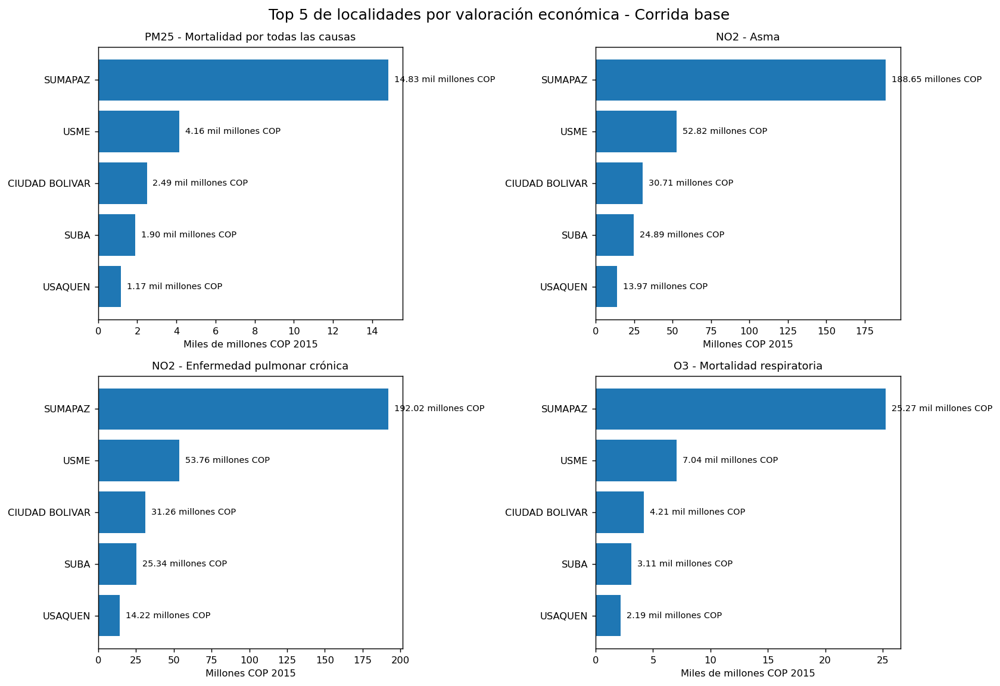


SÍNTESIS ESPACIAL DEL BLOQUE 5.4


,Corrida,Contaminante,Endpoint legible,Localidad,Casos evitados,Valor económico localidad líder (lectura),Participación valor económico (%),Participación acumulada top 5 (%)
0,NO2_ASTHMA,NO2,Asma,SUMAPAZ,6.055800,188.65 millones COP,47.893800,78.965300
1,NO2_CLD,NO2,Enfermedad pulmonar crónica,SUMAPAZ,4.503200,192.02 millones COP,47.893300,78.964600
2,O3_MAIN,O3,Mortalidad respiratoria,SUMAPAZ,1.046800,25.27 mil millones COP,47.749300,79.026000
3,PM25_MAIN,PM25,Mortalidad por todas las causas,SUMAPAZ,0.614200,14.83 mil millones COP,47.522300,78.694900


In [78]:
# ============================================================
# CELDA 11. DISTRIBUCIÓN ESPACIAL POR LOCALIDAD - BLOQUE 5.4
# SOLO VISUALIZACIÓN - SIN GUARDAR
# ============================================================

from pathlib import Path
import os
import re
import unicodedata
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ------------------------------------------------------------
# 1. Utilidades
# ------------------------------------------------------------
BASE = Path(r"D:\TRABAJO DE GRADO BEN-MAP")

def leer_csv_flexible(path):
    path = str(path)
    if not os.path.exists(path):
        raise FileNotFoundError(f"No existe el archivo:\n{path}")
    for enc in ["utf-8-sig", "utf-8", "latin1", "cp1252"]:
        try:
            return pd.read_csv(path, encoding=enc)
        except Exception:
            continue
    raise ValueError(f"No pude leer el archivo:\n{path}")

def normalizar_texto(txt):
    txt = str(txt).strip().lower()
    txt = unicodedata.normalize("NFKD", txt).encode("ascii", "ignore").decode("utf-8")
    txt = re.sub(r"[^a-z0-9]+", "_", txt)
    txt = re.sub(r"_+", "_", txt).strip("_")
    return txt

def mapa_columnas(df):
    return {normalizar_texto(c): c for c in df.columns}

def buscar_columna(df, candidatos_norm):
    cols_map = mapa_columnas(df)
    for cand in candidatos_norm:
        if cand in cols_map:
            return cols_map[cand]
    return None

def buscar_columna_por_fragmentos(df, incluir, excluir=None, solo_numerica=False):
    excluir = excluir or []
    for c in df.columns:
        cn = normalizar_texto(c)
        if all(frag in cn for frag in incluir) and not any(frag in cn for frag in excluir):
            if solo_numerica:
                if pd.api.types.is_numeric_dtype(df[c]):
                    return c
            else:
                return c
    return None

def buscar_archivo(nombre, carpeta_prioritaria=None):
    hallados = list(BASE.rglob(nombre))
    if not hallados:
        return None
    if carpeta_prioritaria:
        hallados = sorted(
            hallados,
            key=lambda p: (0 if carpeta_prioritaria.lower() in str(p).lower() else 1, len(str(p)))
        )
    else:
        hallados = sorted(hallados, key=lambda p: len(str(p)))
    return hallados[0]

def formatear_cop(valor):
    if pd.isna(valor):
        return ""
    if abs(valor) >= 1e12:
        return f"{valor/1e12:.2f} billones COP"
    if abs(valor) >= 1e9:
        return f"{valor/1e9:.2f} mil millones COP"
    if abs(valor) >= 1e6:
        return f"{valor/1e6:.2f} millones COP"
    return f"{valor:,.0f} COP"

# ------------------------------------------------------------
# 2. Detectar archivos
# ------------------------------------------------------------
PATH_IMP_CELDA = buscar_archivo(
    "impactos_sanitarios_por_celda.csv",
    carpeta_prioritaria="03_corrida_principal"
)

PATH_COP_CELDA = buscar_archivo(
    "valoracion_economica_por_celda_cop.csv",
    carpeta_prioritaria="03_corrida_principal"
)

def buscar_archivo_por_patrones(base, patrones, carpetas_prioritarias=None):
    carpetas_prioritarias = carpetas_prioritarias or []
    hallados = []

    for patron in patrones:
        hallados.extend(list(base.rglob(patron)))

    # quitar duplicados preservando orden
    vistos = set()
    unicos = []
    for p in hallados:
        s = str(p).lower()
        if s not in vistos:
            vistos.add(s)
            unicos.append(p)

    if not unicos:
        return None, []

    def puntaje(p):
        s = str(p).lower()
        score = 0
        for i, carp in enumerate(carpetas_prioritarias):
            if carp.lower() in s:
                score -= (10 - i)
        return (score, len(str(p)))

    unicos = sorted(unicos, key=puntaje)
    return unicos[0], unicos

PATH_GRID, CANDIDATOS_GRID = buscar_archivo_por_patrones(
    BASE,
    patrones=[
        "grid_3km_time_id_2020_2024.gpkg",
        "grid_3km*.gpkg",
        "grid*.gpkg",
        "*cell*loc*.csv",
        "*cell*local*.csv",
        "*grid*loc*.csv"
    ],
    carpetas_prioritarias=["Qgis", "qgis", "01_insumos_resultados", "GRILLA-GEOVISOR MAPAS BEN-MAP"]
)

print("=" * 90)
print("ARCHIVOS DETECTADOS PARA LA PARTE ESPACIAL DEL BLOQUE 5.4")
print("=" * 90)
print("Impactos por celda :", PATH_IMP_CELDA)
print("Valoración COP     :", PATH_COP_CELDA)
print("Grilla / Localidad :", PATH_GRID)

print("\nCandidatos de grilla/localidad encontrados:")
if CANDIDATOS_GRID:
    for p in CANDIDATOS_GRID[:15]:
        print(" -", p)
else:
    print(" - Ninguno")

# ------------------------------------------------------------
# 3. Cargar archivos
# ------------------------------------------------------------
df_imp_cell = leer_csv_flexible(PATH_IMP_CELDA)
df_cop_cell = leer_csv_flexible(PATH_COP_CELDA)

for df in [df_imp_cell, df_cop_cell]:
    df.columns = [str(c).replace("\ufeff", "").strip() for c in df.columns]

print("\n" + "=" * 90)
print("FORMAS CARGADAS")
print("=" * 90)
print("impactos por celda:", df_imp_cell.shape)
print("valoración cop    :", df_cop_cell.shape)

# ------------------------------------------------------------
# 4. Detectar columnas clave
# ------------------------------------------------------------
# Impactos
col_run_imp  = buscar_columna(df_imp_cell, ["run_id"])
col_pol_imp  = buscar_columna(df_imp_cell, ["pollutant"])
col_grp_imp  = buscar_columna(df_imp_cell, ["endpoint_group"])
col_end_imp  = buscar_columna(df_imp_cell, ["endpoint"])
col_cell_imp = buscar_columna(df_imp_cell, ["cell_id"])
if col_cell_imp is None:
    col_cell_imp = buscar_columna(df_imp_cell, ["cell_idx"])

col_case_imp = buscar_columna(df_imp_cell, ["avoided_cases_total"])
if col_case_imp is None:
    col_case_imp = buscar_columna_por_fragmentos(df_imp_cell, ["avoided", "cases"], solo_numerica=True)

col_loc_imp = buscar_columna(df_imp_cell, ["locnombre"])
if col_loc_imp is None:
    col_loc_imp = buscar_columna(df_imp_cell, ["localidad"])

# COP
col_run_cop  = buscar_columna(df_cop_cell, ["run_id"])
col_pol_cop  = buscar_columna(df_cop_cell, ["pollutant"])
col_grp_cop  = buscar_columna(df_cop_cell, ["endpoint_group"])
col_end_cop  = buscar_columna(df_cop_cell, ["endpoint"])
col_cell_cop = buscar_columna(df_cop_cell, ["cell_id"])
if col_cell_cop is None:
    col_cell_cop = buscar_columna(df_cop_cell, ["cell_idx"])

col_val_cop = buscar_columna(df_cop_cell, ["economic_value_total_cop_2015"])
if col_val_cop is None:
    col_val_cop = buscar_columna_por_fragmentos(df_cop_cell, ["cop"], excluir=["usd", "used"], solo_numerica=True)

col_loc_cop = buscar_columna(df_cop_cell, ["locnombre"])
if col_loc_cop is None:
    col_loc_cop = buscar_columna(df_cop_cell, ["localidad"])

falt_imp = [x is None for x in [col_run_imp, col_pol_imp, col_grp_imp, col_end_imp, col_cell_imp, col_case_imp]]
falt_cop = [x is None for x in [col_run_cop, col_pol_cop, col_grp_cop, col_end_cop, col_cell_cop, col_val_cop]]

if any(falt_imp):
    raise ValueError(f"No pude detectar bien columnas en impactos por celda. Columnas: {list(df_imp_cell.columns)}")
if any(falt_cop):
    raise ValueError(f"No pude detectar bien columnas en valoración COP por celda. Columnas: {list(df_cop_cell.columns)}")

# ------------------------------------------------------------
# 5. Base local de localidad por celda
# ------------------------------------------------------------
df_loc = None

# Opción A: usar localidad desde impactos
if col_loc_imp is not None:
    df_loc = df_imp_cell[[col_cell_imp, col_loc_imp]].copy()
    df_loc.columns = ["cell_id", "Localidad"]
    df_loc = df_loc.dropna().drop_duplicates()

# Opción B: usar localidad desde valoración
elif col_loc_cop is not None:
    df_loc = df_cop_cell[[col_cell_cop, col_loc_cop]].copy()
    df_loc.columns = ["cell_id", "Localidad"]
    df_loc = df_loc.dropna().drop_duplicates()

# Opción C: usar archivo externo de grilla/localidad
else:
    if PATH_GRID is None:
        print("\nColumnas impactos:", list(df_imp_cell.columns))
        print("Columnas valoración COP:", list(df_cop_cell.columns))
        raise ValueError(
            "No encontré columna de localidad en los CSV ni un archivo externo de grilla/localidad."
        )

    ext = str(PATH_GRID).lower().split(".")[-1]

    if ext == "gpkg":
        import geopandas as gpd
        gdf_grid = gpd.read_file(PATH_GRID)
        print("\nColumnas de la grilla detectadas:")
        print(list(gdf_grid.columns))

        col_cell_grid = buscar_columna(gdf_grid, ["cell_id"])
        if col_cell_grid is None:
            col_cell_grid = buscar_columna(gdf_grid, ["cell_idx"])

        col_loc_grid = buscar_columna(gdf_grid, ["locnombre"])
        if col_loc_grid is None:
            col_loc_grid = buscar_columna(gdf_grid, ["localidad"])
        if col_loc_grid is None:
            col_loc_grid = buscar_columna(gdf_grid, ["locnombre_1"])

        if col_cell_grid is None or col_loc_grid is None:
            raise ValueError(
                f"No pude detectar 'cell_id' y 'LocNombre/localidad' en la grilla. "
                f"Columnas disponibles: {list(gdf_grid.columns)}"
            )

        df_loc = gdf_grid[[col_cell_grid, col_loc_grid]].copy()
        df_loc.columns = ["cell_id", "Localidad"]
        df_loc = pd.DataFrame(df_loc).dropna().drop_duplicates(subset=["cell_id"])

    elif ext == "csv":
        df_grid = leer_csv_flexible(PATH_GRID)
        print("\nColumnas del archivo auxiliar detectadas:")
        print(list(df_grid.columns))

        col_cell_grid = buscar_columna(df_grid, ["cell_id"])
        if col_cell_grid is None:
            col_cell_grid = buscar_columna(df_grid, ["cell_idx"])

        col_loc_grid = buscar_columna(df_grid, ["locnombre"])
        if col_loc_grid is None:
            col_loc_grid = buscar_columna(df_grid, ["localidad"])

        if col_cell_grid is None or col_loc_grid is None:
            raise ValueError(
                f"No pude detectar 'cell_id' y 'LocNombre/localidad' en el CSV auxiliar. "
                f"Columnas disponibles: {list(df_grid.columns)}"
            )

        df_loc = df_grid[[col_cell_grid, col_loc_grid]].copy()
        df_loc.columns = ["cell_id", "Localidad"]
        df_loc = df_loc.dropna().drop_duplicates(subset=["cell_id"])

    else:
        raise ValueError(f"Formato no soportado para el archivo auxiliar: {PATH_GRID}")

print("\nResumen base localidad-celda:")
print(df_loc.head())
print("n celdas con localidad:", df_loc['cell_id'].nunique())
print("n localidades:", df_loc['Localidad'].nunique())

# ------------------------------------------------------------
# 6. Homologar y unir bases por celda
# ------------------------------------------------------------
imp = df_imp_cell[[col_run_imp, col_pol_imp, col_grp_imp, col_end_imp, col_cell_imp, col_case_imp]].copy()
imp.columns = ["run_id", "pollutant", "endpoint_group", "endpoint", "cell_id", "Casos evitados"]

cop = df_cop_cell[[col_run_cop, col_pol_cop, col_grp_cop, col_end_cop, col_cell_cop, col_val_cop]].copy()
cop.columns = ["run_id", "pollutant", "endpoint_group", "endpoint", "cell_id", "Valor económico COP 2015"]

df_spatial = imp.merge(
    cop,
    on=["run_id", "pollutant", "endpoint_group", "endpoint", "cell_id"],
    how="left"
).merge(
    df_loc,
    on="cell_id",
    how="left"
)

# Etiquetas legibles
map_grp = {
    "Mortality": "Mortalidad",
    "Hospital Admissions": "Hospitalizaciones"
}
map_endpoint = {
    "All-cause mortality": "Mortalidad por todas las causas",
    "Respiratory mortality": "Mortalidad respiratoria",
    "Asthma": "Asma",
    "Chronic Lung Disease": "Enfermedad pulmonar crónica"
}

df_spatial["Corrida"] = df_spatial["run_id"]
df_spatial["Contaminante"] = df_spatial["pollutant"]
df_spatial["Grupo endpoint"] = df_spatial["endpoint_group"].replace(map_grp).fillna(df_spatial["endpoint_group"])
df_spatial["Endpoint legible"] = df_spatial["endpoint"].replace(map_endpoint).fillna(df_spatial["endpoint"])

# ------------------------------------------------------------
# 7. Agregar por localidad
# ------------------------------------------------------------
tabla_localidad = (
    df_spatial
    .groupby(
        ["Corrida", "Contaminante", "Grupo endpoint", "Endpoint legible", "Localidad"],
        as_index=False
    )[["Casos evitados", "Valor económico COP 2015"]]
    .sum()
)

totales_run = (
    tabla_localidad
    .groupby(["Corrida"], as_index=False)[["Casos evitados", "Valor económico COP 2015"]]
    .sum()
    .rename(columns={
        "Casos evitados": "Casos total corrida",
        "Valor económico COP 2015": "Valor total corrida COP"
    })
)

tabla_localidad = tabla_localidad.merge(totales_run, on="Corrida", how="left")
tabla_localidad["Participación casos (%)"] = 100 * tabla_localidad["Casos evitados"] / tabla_localidad["Casos total corrida"]
tabla_localidad["Participación valor económico (%)"] = 100 * tabla_localidad["Valor económico COP 2015"] / tabla_localidad["Valor total corrida COP"]

tabla_localidad = tabla_localidad.sort_values(
    ["Corrida", "Valor económico COP 2015"],
    ascending=[True, False]
).reset_index(drop=True)

print("\n" + "=" * 90)
print("TABLA DETALLADA POR LOCALIDAD - BLOQUE 5.4")
print("=" * 90)
display(tabla_localidad.round(4))

# ------------------------------------------------------------
# 8. Top 5 por corrida
# ------------------------------------------------------------
tabla_top5 = (
    tabla_localidad
    .sort_values(["Corrida", "Valor económico COP 2015"], ascending=[True, False])
    .groupby("Corrida", group_keys=False)
    .head(5)
    .reset_index(drop=True)
)

tabla_top5_legible = tabla_top5.copy()
tabla_top5_legible["Valor económico COP 2015 (lectura)"] = tabla_top5_legible["Valor económico COP 2015"].apply(formatear_cop)

print("\n" + "=" * 90)
print("TOP 5 DE LOCALIDADES POR CORRIDA SEGÚN VALOR ECONÓMICO")
print("=" * 90)
display(
    tabla_top5_legible[[
        "Corrida", "Contaminante", "Endpoint legible", "Localidad",
        "Casos evitados", "Valor económico COP 2015 (lectura)",
        "Participación casos (%)", "Participación valor económico (%)"
    ]].round(4)
)

# ------------------------------------------------------------
# 9. Figura comparativa 2x2
# ------------------------------------------------------------
orden_run = ["PM25_MAIN", "NO2_ASTHMA", "NO2_CLD", "O3_MAIN"]
fig, axes = plt.subplots(2, 2, figsize=(13, 9))
axes = axes.flatten()

for ax, run in zip(axes, orden_run):
    sub = tabla_top5[tabla_top5["Corrida"] == run].copy()

    if sub.empty:
        ax.axis("off")
        continue

    sub = sub.sort_values("Valor económico COP 2015", ascending=True)

    # Escala según magnitud
    max_val = sub["Valor económico COP 2015"].max()
    if max_val >= 1e9:
        sub["valor_plot"] = sub["Valor económico COP 2015"] / 1e9
        xlabel = "Miles de millones COP 2015"
    else:
        sub["valor_plot"] = sub["Valor económico COP 2015"] / 1e6
        xlabel = "Millones COP 2015"

    bars = ax.barh(sub["Localidad"], sub["valor_plot"])
    titulo = f"{sub['Contaminante'].iloc[0]} - {sub['Endpoint legible'].iloc[0]}"
    ax.set_title(titulo, fontsize=10)
    ax.set_xlabel(xlabel, fontsize=9)
    ax.set_ylabel("")

    xmax = sub["valor_plot"].max()
    for bar, val_real in zip(bars, sub["Valor económico COP 2015"]):
        etiqueta = formatear_cop(val_real)
        ax.text(
            bar.get_width() + xmax * 0.02,
            bar.get_y() + bar.get_height() / 2,
            etiqueta,
            va="center",
            fontsize=8
        )

fig.suptitle("Top 5 de localidades por valoración económica - Corrida base", fontsize=14)
plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 10. Síntesis espacial
# ------------------------------------------------------------
lideres = (
    tabla_localidad
    .sort_values(["Corrida", "Valor económico COP 2015"], ascending=[True, False])
    .groupby("Corrida", as_index=False)
    .first()[[
        "Corrida", "Contaminante", "Endpoint legible", "Localidad",
        "Casos evitados", "Valor económico COP 2015",
        "Participación valor económico (%)"
    ]]
)

acum_top5 = (
    tabla_top5
    .groupby("Corrida", as_index=False)["Participación valor económico (%)"]
    .sum()
    .rename(columns={"Participación valor económico (%)": "Participación acumulada top 5 (%)"})
)

tabla_sintesis_espacial = lideres.merge(acum_top5, on="Corrida", how="left")
tabla_sintesis_espacial["Valor económico localidad líder (lectura)"] = tabla_sintesis_espacial["Valor económico COP 2015"].apply(formatear_cop)

print("\n" + "=" * 90)
print("SÍNTESIS ESPACIAL DEL BLOQUE 5.4")
print("=" * 90)
display(
    tabla_sintesis_espacial[[
        "Corrida", "Contaminante", "Endpoint legible", "Localidad",
        "Casos evitados", "Valor económico localidad líder (lectura)",
        "Participación valor económico (%)", "Participación acumulada top 5 (%)"
    ]].round(4)
)

# Celda 11A. Corrección del mapeo localidad-celda para el bloque 5.4

En esta corrección se reemplaza el uso directo de la grilla por una tabla auxiliar de correspondencia entre celda y localidad. Esto permite evitar pérdida de celdas en la agregación espacial y asegurar que los totales por localidad sean consistentes con los resultados globales de la corrida base del bloque 5.4.

In [79]:
# ============================================================
# CELDA 11A. CORRECCIÓN DE MAPEO LOCALIDAD-CELDA
# Priorizar cell_to_localidad.csv y validar consistencia
# ============================================================

from pathlib import Path
import os
import pandas as pd

BASE = Path(r"D:\TRABAJO DE GRADO BEN-MAP")

def leer_csv_flexible(path):
    path = str(path)
    if not os.path.exists(path):
        raise FileNotFoundError(f"No existe el archivo:\n{path}")
    for enc in ["utf-8-sig", "utf-8", "latin1", "cp1252"]:
        try:
            return pd.read_csv(path, encoding=enc)
        except Exception:
            continue
    raise ValueError(f"No pude leer el archivo:\n{path}")

def buscar_archivo(nombre):
    hallados = list(BASE.rglob(nombre))
    hallados = sorted(hallados, key=lambda p: len(str(p)))
    return hallados[0] if hallados else None

def normalizar_texto(txt):
    import re, unicodedata
    txt = str(txt).strip().lower()
    txt = unicodedata.normalize("NFKD", txt).encode("ascii", "ignore").decode("utf-8")
    txt = re.sub(r"[^a-z0-9]+", "_", txt)
    txt = re.sub(r"_+", "_", txt).strip("_")
    return txt

def mapa_columnas(df):
    return {normalizar_texto(c): c for c in df.columns}

def buscar_columna(df, candidatos_norm):
    cols_map = mapa_columnas(df)
    for cand in candidatos_norm:
        if cand in cols_map:
            return cols_map[cand]
    return None

# ------------------------------------------------------------
# 1. Detectar archivo auxiliar cell_to_localidad
# ------------------------------------------------------------
PATH_CELL_LOC = buscar_archivo("cell_to_localidad.csv")

print("=" * 90)
print("ARCHIVO AUXILIAR LOCALIDAD-CELDA")
print("=" * 90)
print("Ruta detectada:", PATH_CELL_LOC)

if PATH_CELL_LOC is None:
    raise FileNotFoundError("No encontré 'cell_to_localidad.csv' dentro del proyecto.")

df_loc = leer_csv_flexible(PATH_CELL_LOC)
df_loc.columns = [str(c).replace("\ufeff", "").strip() for c in df_loc.columns]

print("\nColumnas del archivo auxiliar:")
print(list(df_loc.columns))

col_cell_aux = buscar_columna(df_loc, ["cell_id"])
if col_cell_aux is None:
    col_cell_aux = buscar_columna(df_loc, ["cell_idx"])

col_loc_aux = buscar_columna(df_loc, ["locnombre"])
if col_loc_aux is None:
    col_loc_aux = buscar_columna(df_loc, ["localidad"])

if col_cell_aux is None or col_loc_aux is None:
    raise ValueError(
        f"No pude detectar 'cell_id' y 'LocNombre/localidad' en cell_to_localidad.csv. "
        f"Columnas disponibles: {list(df_loc.columns)}"
    )

df_loc = df_loc[[col_cell_aux, col_loc_aux]].copy()
df_loc.columns = ["cell_id", "Localidad"]
df_loc = df_loc.dropna().drop_duplicates(subset=["cell_id"]).reset_index(drop=True)

print("\nResumen del mapeo auxiliar:")
print(df_loc.head())
print("n celdas con localidad:", df_loc["cell_id"].nunique())
print("n localidades:", df_loc["Localidad"].nunique())

# ------------------------------------------------------------
# 2. Reconstruir base espacial usando este mapeo
#    (usa las bases ya cargadas: df_imp_cell y df_cop_cell)
# ------------------------------------------------------------
imp = df_imp_cell[[col_run_imp, col_pol_imp, col_grp_imp, col_end_imp, col_cell_imp, col_case_imp]].copy()
imp.columns = ["run_id", "pollutant", "endpoint_group", "endpoint", "cell_id", "Casos evitados"]

cop = df_cop_cell[[col_run_cop, col_pol_cop, col_grp_cop, col_end_cop, col_cell_cop, col_val_cop]].copy()
cop.columns = ["run_id", "pollutant", "endpoint_group", "endpoint", "cell_id", "Valor económico COP 2015"]

df_spatial_fix = (
    imp.merge(
        cop,
        on=["run_id", "pollutant", "endpoint_group", "endpoint", "cell_id"],
        how="left"
    )
    .merge(
        df_loc,
        on="cell_id",
        how="left"
    )
)

map_grp = {
    "Mortality": "Mortalidad",
    "Hospital Admissions": "Hospitalizaciones"
}
map_endpoint = {
    "All-cause mortality": "Mortalidad por todas las causas",
    "Respiratory mortality": "Mortalidad respiratoria",
    "Asthma": "Asma",
    "Chronic Lung Disease": "Enfermedad pulmonar crónica"
}

df_spatial_fix["Corrida"] = df_spatial_fix["run_id"]
df_spatial_fix["Contaminante"] = df_spatial_fix["pollutant"]
df_spatial_fix["Grupo endpoint"] = df_spatial_fix["endpoint_group"].replace(map_grp).fillna(df_spatial_fix["endpoint_group"])
df_spatial_fix["Endpoint legible"] = df_spatial_fix["endpoint"].replace(map_endpoint).fillna(df_spatial_fix["endpoint"])

# ------------------------------------------------------------
# 3. Agregar por localidad
# ------------------------------------------------------------
tabla_localidad_fix = (
    df_spatial_fix
    .groupby(
        ["Corrida", "Contaminante", "Grupo endpoint", "Endpoint legible", "Localidad"],
        as_index=False
    )[["Casos evitados", "Valor económico COP 2015"]]
    .sum()
)

# ------------------------------------------------------------
# 4. Validación contra la corrida base del bloque 5.4
# ------------------------------------------------------------
totales_localidad = (
    tabla_localidad_fix
    .groupby("Corrida", as_index=False)[["Casos evitados", "Valor económico COP 2015"]]
    .sum()
    .rename(columns={
        "Casos evitados": "Casos_localidad",
        "Valor económico COP 2015": "COP_localidad"
    })
)

totales_base = (
    tabla_principal_54[["Corrida", "Casos evitados", "Valor económico COP 2015"]]
    .copy()
    .rename(columns={
        "Casos evitados": "Casos_base",
        "Valor económico COP 2015": "COP_base"
    })
)

validacion = totales_base.merge(totales_localidad, on="Corrida", how="left")
validacion["Dif_casos"] = validacion["Casos_localidad"] - validacion["Casos_base"]
validacion["Dif_COP"] = validacion["COP_localidad"] - validacion["COP_base"]

print("\n" + "=" * 90)
print("VALIDACIÓN DE CONSISTENCIA: BASE VS LOCALIDAD")
print("=" * 90)
display(validacion)

# ------------------------------------------------------------
# 5. Recalcular participaciones y top 5 ya corregidos
# ------------------------------------------------------------
totales_run_fix = (
    tabla_localidad_fix
    .groupby(["Corrida"], as_index=False)[["Casos evitados", "Valor económico COP 2015"]]
    .sum()
    .rename(columns={
        "Casos evitados": "Casos total corrida",
        "Valor económico COP 2015": "Valor total corrida COP"
    })
)

tabla_localidad_fix = tabla_localidad_fix.merge(totales_run_fix, on="Corrida", how="left")
tabla_localidad_fix["Participación casos (%)"] = 100 * tabla_localidad_fix["Casos evitados"] / tabla_localidad_fix["Casos total corrida"]
tabla_localidad_fix["Participación valor económico (%)"] = 100 * tabla_localidad_fix["Valor económico COP 2015"] / tabla_localidad_fix["Valor total corrida COP"]

tabla_top5_fix = (
    tabla_localidad_fix
    .sort_values(["Corrida", "Valor económico COP 2015"], ascending=[True, False])
    .groupby("Corrida", group_keys=False)
    .head(5)
    .reset_index(drop=True)
)

print("\n" + "=" * 90)
print("TOP 5 CORREGIDO POR LOCALIDAD")
print("=" * 90)
display(
    tabla_top5_fix[[
        "Corrida", "Contaminante", "Endpoint legible", "Localidad",
        "Casos evitados", "Valor económico COP 2015",
        "Participación casos (%)", "Participación valor económico (%)"
    ]].round(4)
)

ARCHIVO AUXILIAR LOCALIDAD-CELDA
Ruta detectada: D:\TRABAJO DE GRADO BEN-MAP\SALIDAS_SENSIBILIDAD\02_base_analitica\cell_to_localidad.csv

Columnas del archivo auxiliar:
['cell_id', 'Row', 'Column', 'Localidad']

Resumen del mapeo auxiliar:
   cell_id Localidad
0        0   SUMAPAZ
1        1   SUMAPAZ
2        2   SUMAPAZ
3       41   SUMAPAZ
4       42   SUMAPAZ
n celdas con localidad: 254
n localidades: 18

VALIDACIÓN DE CONSISTENCIA: BASE VS LOCALIDAD


,Corrida,Casos_base,COP_base,Casos_localidad,COP_localidad,Dif_casos,Dif_COP
0,PM25_MAIN,1.299799,"31,381,080,244.766338",1.299799,"31,381,080,244.766338",-0.000000,0.000000
1,NO2_ASTHMA,12.713526,"396,041,158.652330",12.713526,"396,041,158.652330",-0.000000,0.000000
2,NO2_CLD,9.454138,"403,138,491.992414",9.454138,"403,138,491.992414",-0.000000,0.000000
3,O3_MAIN,2.204553,"53,224,570,212.140251",2.204553,"53,224,570,212.140251",-0.000000,0.000000



TOP 5 CORREGIDO POR LOCALIDAD


,Corrida,Contaminante,Endpoint legible,Localidad,Casos evitados,Valor económico COP 2015,Participación casos (%),Participación valor económico (%)
0,NO2_ASTHMA,NO2,Asma,SUMAPAZ,6.062800,"188,864,056.782600",47.688000,47.688000
1,NO2_ASTHMA,NO2,Asma,USME,1.697200,"52,869,267.734400",13.349400,13.349400
2,NO2_ASTHMA,NO2,Asma,CIUDAD BOLIVAR,0.993100,"30,936,685.342800",7.811500,7.811500
3,NO2_ASTHMA,NO2,Asma,SUBA,0.799100,"24,892,709.030300",6.285400,6.285400
4,NO2_ASTHMA,NO2,Asma,USAQUEN,0.448500,"13,970,792.269800",3.527600,3.527600
5,NO2_CLD,NO2,Enfermedad pulmonar crónica,SUMAPAZ,4.508400,"192,246,800.202600",47.687500,47.687500
6,NO2_CLD,NO2,Enfermedad pulmonar crónica,USME,1.262100,"53,816,423.676900",13.349400,13.349400
7,NO2_CLD,NO2,Enfermedad pulmonar crónica,CIUDAD BOLIVAR,0.738500,"31,490,872.667500",7.811400,7.811400
8,NO2_CLD,NO2,Enfermedad pulmonar crónica,SUBA,0.594200,"25,339,593.303100",6.285600,6.285600
9,NO2_CLD,NO2,Enfermedad pulmonar crónica,USAQUEN,0.333500,"14,220,092.028700",3.527300,3.527300


# Celda 11B. Salidas finales legibles del componente espacial del bloque 5.4

En esta celda se consolidan las salidas espaciales finales del bloque 5.4 a partir de la versión corregida del mapeo celda-localidad. Se genera una tabla legible del top 5 de localidades por corrida, una figura comparativa final y una síntesis espacial resumida para apoyar la redacción del capítulo de resultados.

TOP 5 FINAL DE LOCALIDADES POR CORRIDA - BLOQUE 5.4


,Corrida,Contaminante,Endpoint legible,Localidad,Casos evitados,Valor económico COP 2015 (lectura),Participación casos (%),Participación valor económico (%)
0,NO2_ASTHMA,NO2,Asma,SUMAPAZ,6.062800,188.86 millones COP,47.688000,47.688000
1,NO2_ASTHMA,NO2,Asma,USME,1.697200,52.87 millones COP,13.349400,13.349400
2,NO2_ASTHMA,NO2,Asma,CIUDAD BOLIVAR,0.993100,30.94 millones COP,7.811500,7.811500
3,NO2_ASTHMA,NO2,Asma,SUBA,0.799100,24.89 millones COP,6.285400,6.285400
4,NO2_ASTHMA,NO2,Asma,USAQUEN,0.448500,13.97 millones COP,3.527600,3.527600
5,NO2_CLD,NO2,Enfermedad pulmonar crónica,SUMAPAZ,4.508400,192.25 millones COP,47.687500,47.687500
6,NO2_CLD,NO2,Enfermedad pulmonar crónica,USME,1.262100,53.82 millones COP,13.349400,13.349400
7,NO2_CLD,NO2,Enfermedad pulmonar crónica,CIUDAD BOLIVAR,0.738500,31.49 millones COP,7.811400,7.811400
8,NO2_CLD,NO2,Enfermedad pulmonar crónica,SUBA,0.594200,25.34 millones COP,6.285600,6.285600
9,NO2_CLD,NO2,Enfermedad pulmonar crónica,USAQUEN,0.333500,14.22 millones COP,3.527300,3.527300


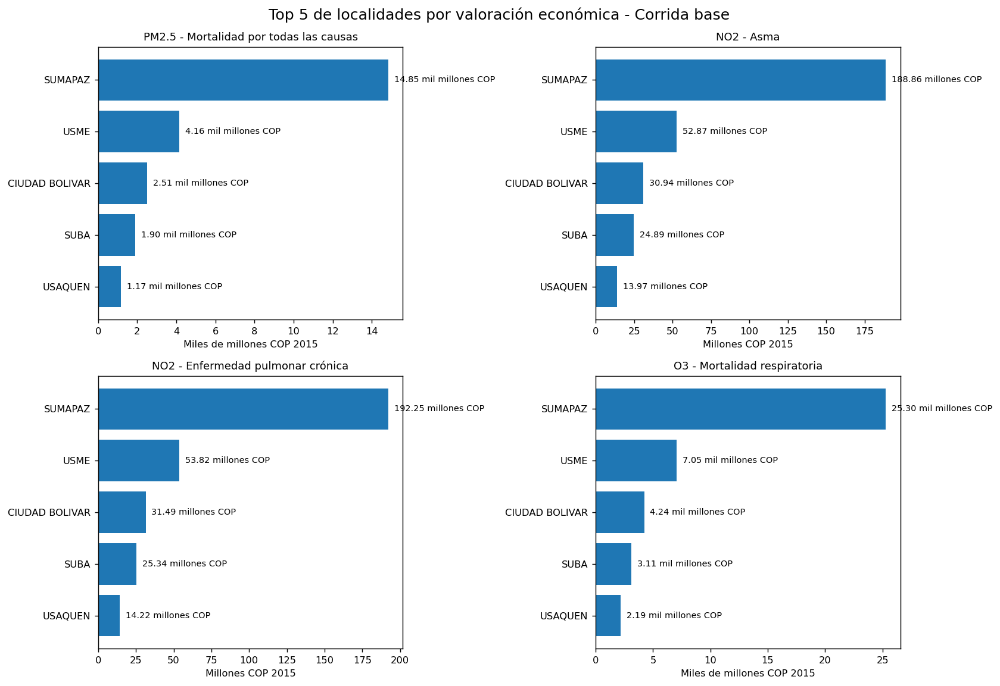


SÍNTESIS ESPACIAL FINAL DEL BLOQUE 5.4


,Corrida,Contaminante,Endpoint legible,Localidad,Casos evitados,Valor económico localidad líder (lectura),Participación valor económico (%),Participación acumulada top 5 (%)
0,NO2_ASTHMA,NO2,Asma,SUMAPAZ,6.062800,188.86 millones COP,47.688000,78.661900
1,NO2_CLD,NO2,Enfermedad pulmonar crónica,SUMAPAZ,4.508400,192.25 millones COP,47.687500,78.661300
2,O3_MAIN,O3,Mortalidad respiratoria,SUMAPAZ,1.048000,25.30 mil millones COP,47.537600,78.710500
3,PM25_MAIN,PM25,Mortalidad por todas las causas,SUMAPAZ,0.615000,14.85 mil millones COP,47.313000,78.387500



LECTURA RESUMIDA AUTOMÁTICA DEL COMPONENTE ESPACIAL


,Corrida,Lectura resumida
0,NO2_ASTHMA,"La localidad líder fue SUMAPAZ, con 6.0628 casos evitados y una participación económica de 47.69%. El top 5 concentr..."
1,NO2_CLD,"La localidad líder fue SUMAPAZ, con 4.5084 casos evitados y una participación económica de 47.69%. El top 5 concentr..."
2,O3_MAIN,"La localidad líder fue SUMAPAZ, con 1.0480 casos evitados y una participación económica de 47.54%. El top 5 concentr..."
3,PM25_MAIN,"La localidad líder fue SUMAPAZ, con 0.6150 casos evitados y una participación económica de 47.31%. El top 5 concentr..."


In [80]:
# ============================================================
# CELDA 11B. SALIDAS FINALES LEGIBLES - BLOQUE 5.4 ESPACIAL
# Usa la versión corregida: tabla_localidad_fix y tabla_top5_fix
# ============================================================

import pandas as pd
import matplotlib.pyplot as plt

def formatear_cop(valor):
    if pd.isna(valor):
        return ""
    if abs(valor) >= 1e12:
        return f"{valor/1e12:.2f} billones COP"
    if abs(valor) >= 1e9:
        return f"{valor/1e9:.2f} mil millones COP"
    if abs(valor) >= 1e6:
        return f"{valor/1e6:.2f} millones COP"
    return f"{valor:,.0f} COP"

# ------------------------------------------------------------
# 1. Tabla top 5 legible final
# ------------------------------------------------------------
tabla_top5_final = tabla_top5_fix.copy()
tabla_top5_final["Valor económico COP 2015 (lectura)"] = tabla_top5_final["Valor económico COP 2015"].apply(formatear_cop)

tabla_top5_final = tabla_top5_final[[
    "Corrida",
    "Contaminante",
    "Endpoint legible",
    "Localidad",
    "Casos evitados",
    "Valor económico COP 2015 (lectura)",
    "Participación casos (%)",
    "Participación valor económico (%)"
]].copy()

print("=" * 90)
print("TOP 5 FINAL DE LOCALIDADES POR CORRIDA - BLOQUE 5.4")
print("=" * 90)
display(tabla_top5_final.round(4))

# ------------------------------------------------------------
# 2. Figura comparativa final 2x2
# ------------------------------------------------------------
orden_run = ["PM25_MAIN", "NO2_ASTHMA", "NO2_CLD", "O3_MAIN"]
titulos = {
    "PM25_MAIN": "PM2.5 - Mortalidad por todas las causas",
    "NO2_ASTHMA": "NO2 - Asma",
    "NO2_CLD": "NO2 - Enfermedad pulmonar crónica",
    "O3_MAIN": "O3 - Mortalidad respiratoria"
}

fig, axes = plt.subplots(2, 2, figsize=(13, 9))
axes = axes.flatten()

for ax, run in zip(axes, orden_run):
    sub = tabla_top5_fix[tabla_top5_fix["Corrida"] == run].copy()

    if sub.empty:
        ax.axis("off")
        continue

    sub = sub.sort_values("Valor económico COP 2015", ascending=True)

    max_val = sub["Valor económico COP 2015"].max()
    if max_val >= 1e9:
        sub["valor_plot"] = sub["Valor económico COP 2015"] / 1e9
        xlabel = "Miles de millones COP 2015"
    else:
        sub["valor_plot"] = sub["Valor económico COP 2015"] / 1e6
        xlabel = "Millones COP 2015"

    bars = ax.barh(sub["Localidad"], sub["valor_plot"])
    ax.set_title(titulos.get(run, run), fontsize=10)
    ax.set_xlabel(xlabel, fontsize=9)
    ax.set_ylabel("")

    xmax = sub["valor_plot"].max()
    for bar, val_real in zip(bars, sub["Valor económico COP 2015"]):
        ax.text(
            bar.get_width() + xmax * 0.02,
            bar.get_y() + bar.get_height() / 2,
            formatear_cop(val_real),
            va="center",
            fontsize=8
        )

fig.suptitle("Top 5 de localidades por valoración económica - Corrida base", fontsize=14)
plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 3. Síntesis espacial final
# ------------------------------------------------------------
lideres_fix = (
    tabla_localidad_fix
    .sort_values(["Corrida", "Valor económico COP 2015"], ascending=[True, False])
    .groupby("Corrida", as_index=False)
    .first()[[
        "Corrida", "Contaminante", "Endpoint legible", "Localidad",
        "Casos evitados", "Valor económico COP 2015",
        "Participación valor económico (%)"
    ]]
)

acum_top5_fix = (
    tabla_top5_fix
    .groupby("Corrida", as_index=False)["Participación valor económico (%)"]
    .sum()
    .rename(columns={"Participación valor económico (%)": "Participación acumulada top 5 (%)"})
)

tabla_sintesis_espacial_final = lideres_fix.merge(acum_top5_fix, on="Corrida", how="left")
tabla_sintesis_espacial_final["Valor económico localidad líder (lectura)"] = (
    tabla_sintesis_espacial_final["Valor económico COP 2015"].apply(formatear_cop)
)

tabla_sintesis_espacial_final = tabla_sintesis_espacial_final[[
    "Corrida",
    "Contaminante",
    "Endpoint legible",
    "Localidad",
    "Casos evitados",
    "Valor económico localidad líder (lectura)",
    "Participación valor económico (%)",
    "Participación acumulada top 5 (%)"
]].copy()

print("\n" + "=" * 90)
print("SÍNTESIS ESPACIAL FINAL DEL BLOQUE 5.4")
print("=" * 90)
display(tabla_sintesis_espacial_final.round(4))

# ------------------------------------------------------------
# 4. Lectura resumida automática
# ------------------------------------------------------------
lectura_espacial_54 = []

for _, row in tabla_sintesis_espacial_final.iterrows():
    lectura_espacial_54.append({
        "Corrida": row["Corrida"],
        "Lectura resumida": (
            f"La localidad líder fue {row['Localidad']}, con {row['Casos evitados']:.4f} casos evitados "
            f"y una participación económica de {row['Participación valor económico (%)']:.2f}%. "
            f"El top 5 concentró {row['Participación acumulada top 5 (%)']:.2f}% del valor económico."
        )
    })

print("\n" + "=" * 90)
print("LECTURA RESUMIDA AUTOMÁTICA DEL COMPONENTE ESPACIAL")
print("=" * 90)
display(pd.DataFrame(lectura_espacial_54))

# Celda 12. Resultados finales del bloque de sensibilidad HBM

En esta celda se consolidan los resultados finales del análisis de sensibilidad asociado al modelo jerárquico bayesiano (HBM). La rutina está diseñada para reconocer automáticamente si el archivo de entrada se encuentra en formato ancho o en formato largo. Cuando el archivo está en formato largo, se reorganiza a una estructura comparable entre escenarios bajo (p05), central (p50) y alto (p95).

A partir de esta base se construyen cuatro salidas principales:  
1. una tabla final resumida del bloque HBM,  
2. una gráfica divergente de cambios en casos evitados frente al escenario central,  
3. una gráfica de magnitud relativa comparable entre endpoints, y  
4. una tabla automática de lectura para apoyar la redacción del capítulo de resultados.

ARCHIVOS DETECTADOS DEL BLOQUE DE SENSIBILIDAD HBM
Archivo principal: D:\TRABAJO DE GRADO BEN-MAP\SALIDAS_SENSIBILIDAD\07_tablas\tabla_resumen_sensibilidad_hbm_clara.csv

FORMA CARGADA
(12, 10)

Columnas detectadas:
['Corrida', 'Contaminante', 'Escenario HBM', 'Cambio medio en concentración', 'Casos evitados', 'Valor económico total (COP 2015)', 'Diferencia de casos vs. central', 'Razón de casos vs. central', 'Diferencia económica vs. central (USD 2015)', 'Razón económica vs. central']

TIPO DE FORMATO DETECTADO
Formato ancho: False
Formato largo: True

TABLA FINAL DEL BLOQUE DE SENSIBILIDAD HBM


,Corrida,Contaminante,Endpoint,Casos central (p50),Casos alto (p95),Casos bajo (p05),Cambio alto vs central,Cambio bajo vs central,Razón alto vs central,Razón bajo vs central,Cambio de signo en p05,Escenario más crítico,Amplitud total del cambio en casos,Sensibilidad relativa máxima vs. central
0,NO2 - Hospitalizaciones por asma,NO2,Hospitalizaciones por asma,12.714000,491.044000,-86.701000,478.330000,-99.415000,38.622300,-6.819300,Sí,Alto (p95),577.745000,37.622300
1,NO2 - Hospitalizaciones por enfermedad pulmonar crónica,NO2,Hospitalizaciones por enfermedad pulmonar crónica,9.454000,382.273000,-63.917000,372.819000,-73.371000,40.435100,-6.760800,Sí,Alto (p95),446.190000,39.435100
2,O3 - Mortalidad respiratoria,O3,Mortalidad respiratoria,2.205000,91.848000,-14.718000,89.643000,-16.923000,41.654400,-6.674800,Sí,Alto (p95),106.566000,40.654400
3,PM2.5 - Mortalidad por todas las causas,PM25,Mortalidad por todas las causas,1.300000,42.675000,-9.035000,41.375000,-10.335000,32.826900,-6.950000,Sí,Alto (p95),51.710000,31.826900


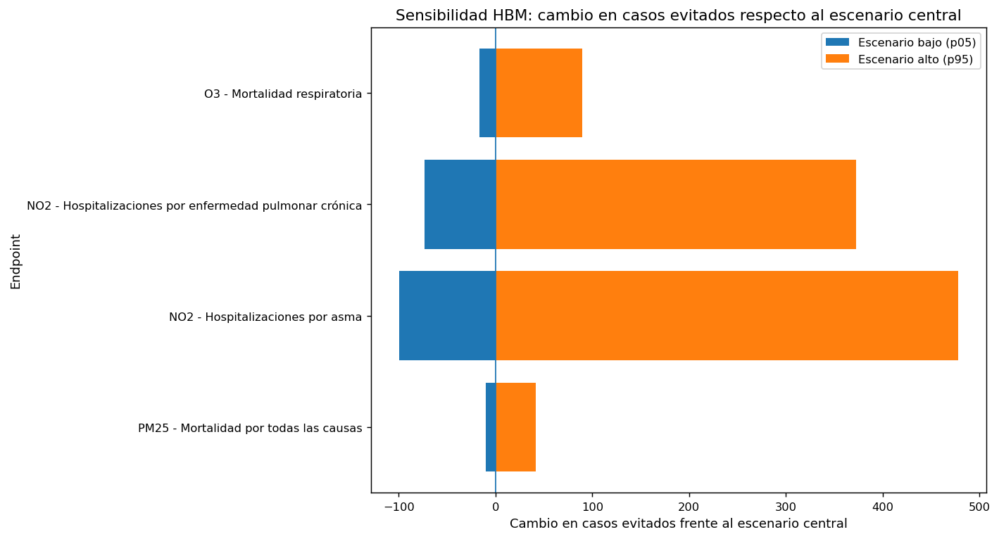

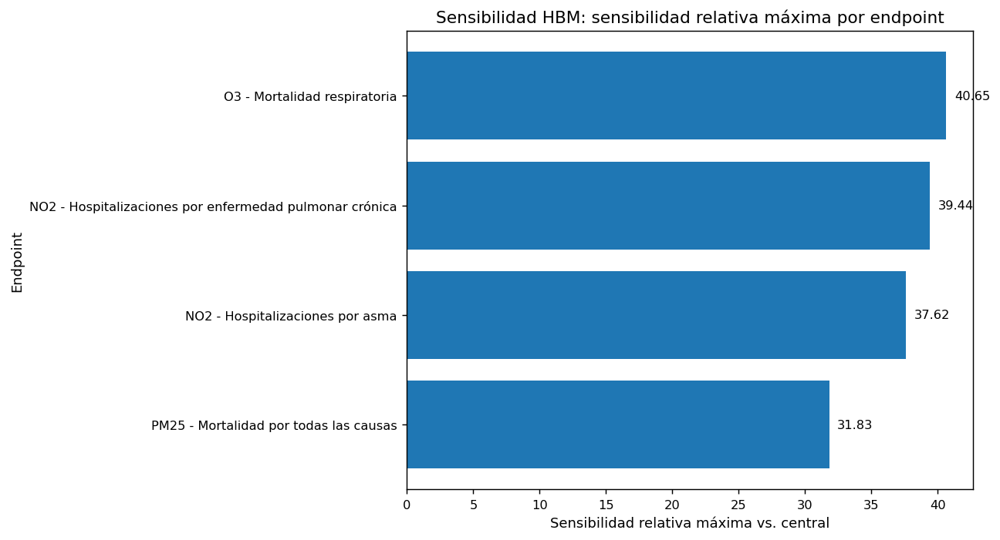


LECTURA AUTOMÁTICA DEL BLOQUE HBM


,Contaminante,Endpoint,Escenario más crítico,Cambio de signo en p05,Amplitud total del cambio en casos,Sensibilidad relativa máxima vs. central
0,O3,Mortalidad respiratoria,Alto (p95),Sí,106.566000,40.654400
1,NO2,Hospitalizaciones por enfermedad pulmonar crónica,Alto (p95),Sí,446.190000,39.435100
2,NO2,Hospitalizaciones por asma,Alto (p95),Sí,577.745000,37.622300
3,PM25,Mortalidad por todas las causas,Alto (p95),Sí,51.710000,31.826900



LECTURA RESUMIDA AUTOMÁTICA DEL HBM


,Endpoint,Lectura resumida
0,O3 - Mortalidad respiratoria,El escenario más crítico fue Alto (p95); la amplitud total del cambio en casos fue 106.566 y la sensibilidad relativ...
1,NO2 - Hospitalizaciones por enfermedad pulmonar crónica,El escenario más crítico fue Alto (p95); la amplitud total del cambio en casos fue 446.190 y la sensibilidad relativ...
2,NO2 - Hospitalizaciones por asma,El escenario más crítico fue Alto (p95); la amplitud total del cambio en casos fue 577.745 y la sensibilidad relativ...
3,PM25 - Mortalidad por todas las causas,El escenario más crítico fue Alto (p95); la amplitud total del cambio en casos fue 51.710 y la sensibilidad relativa...


In [81]:
# ============================================================
# CELDA HBM FINAL CORREGIDA
# RESULTADOS FINALES DEL BLOQUE DE SENSIBILIDAD HBM
# Versión robusta: reconoce formato ancho o formato largo
# ============================================================

from pathlib import Path
import os
import re
import unicodedata
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

BASE = Path(r"D:\TRABAJO DE GRADO BEN-MAP")

# ------------------------------------------------------------
# 1. Utilidades
# ------------------------------------------------------------
def leer_csv_flexible(path):
    path = str(path)
    if not os.path.exists(path):
        raise FileNotFoundError(f"No existe el archivo:\n{path}")
    for enc in ["utf-8-sig", "utf-8", "latin1", "cp1252"]:
        try:
            return pd.read_csv(path, encoding=enc)
        except Exception:
            continue
    raise ValueError(f"No pude leer el archivo:\n{path}")

def buscar_archivo_por_patrones(base, patrones):
    hallados = []
    for patron in patrones:
        hallados.extend(list(base.rglob(patron)))

    vistos = set()
    unicos = []
    for p in hallados:
        s = str(p).lower()
        if s not in vistos:
            vistos.add(s)
            unicos.append(p)

    if not unicos:
        return None, []

    unicos = sorted(unicos, key=lambda p: len(str(p)))
    return unicos[0], unicos

def normalizar_texto(txt):
    txt = str(txt).strip().lower()
    txt = unicodedata.normalize("NFKD", txt).encode("ascii", "ignore").decode("utf-8")
    txt = re.sub(r"[^a-z0-9]+", "_", txt)
    txt = re.sub(r"_+", "_", txt).strip("_")
    return txt

def mapa_columnas(df):
    return {normalizar_texto(c): c for c in df.columns}

def buscar_columna(df, candidatos_norm):
    mapa = mapa_columnas(df)
    for cand in candidatos_norm:
        if cand in mapa:
            return mapa[cand]
    return None

def buscar_columna_fragmentos(df, incluir, excluir=None):
    excluir = excluir or []
    for c in df.columns:
        cn = normalizar_texto(c)
        if all(f in cn for f in incluir) and not any(e in cn for e in excluir):
            return c
    return None

def clasificar_escenario_hbm(txt):
    s = normalizar_texto(txt)
    if ("p50" in s) or ("central" in s):
        return "central"
    if ("p95" in s) or ("alto" in s):
        return "alto"
    if ("p05" in s) or ("bajo" in s):
        return "bajo"
    return np.nan

def derivar_endpoint_desde_corrida(corrida):
    txt = str(corrida)
    if " - " in txt:
        return txt.split(" - ", 1)[1].strip()
    return txt

# ------------------------------------------------------------
# 2. Detectar archivo HBM
# ------------------------------------------------------------
PATH_HBM, CAND_HBM = buscar_archivo_por_patrones(
    BASE,
    [
        "tabla_5_41_sintesis_numerica_sensibilidad_hbm.csv",
        "*sintesis_numerica*sensibilidad_hbm*.csv",
        "tabla_resumen_sensibilidad_hbm_clara.csv",
        "*resumen*sensibilidad*hbm*clara*.csv",
        "*sensibilidad_hbm*.csv"
    ]
)

print("=" * 90)
print("ARCHIVOS DETECTADOS DEL BLOQUE DE SENSIBILIDAD HBM")
print("=" * 90)
print("Archivo principal:", PATH_HBM)

if PATH_HBM is None:
    raise FileNotFoundError("No encontré archivo para el bloque de sensibilidad HBM.")

# ------------------------------------------------------------
# 3. Cargar archivo
# ------------------------------------------------------------
df_hbm = leer_csv_flexible(PATH_HBM)
df_hbm.columns = [str(c).replace("\ufeff", "").strip() for c in df_hbm.columns]

print("\n" + "=" * 90)
print("FORMA CARGADA")
print("=" * 90)
print(df_hbm.shape)

print("\nColumnas detectadas:")
print(list(df_hbm.columns))

# ------------------------------------------------------------
# 4. Identificar formato
# ------------------------------------------------------------
cols_norm = [normalizar_texto(c) for c in df_hbm.columns]

es_formato_ancho = (
    ("casos_central_p50" in cols_norm and "casos_alto_p95" in cols_norm and "casos_bajo_p05" in cols_norm)
    or
    ("cambio_casos_alto_vs_central" in cols_norm and "cambio_casos_bajo_vs_central" in cols_norm)
)

es_formato_largo = (
    ("escenario_hbm" in cols_norm)
    and any("casos" in c and "evitados" in c for c in cols_norm)
)

print("\n" + "=" * 90)
print("TIPO DE FORMATO DETECTADO")
print("=" * 90)
print("Formato ancho:", es_formato_ancho)
print("Formato largo:", es_formato_largo)

# ------------------------------------------------------------
# 5A. Si el archivo ya viene en ancho
# ------------------------------------------------------------
if es_formato_ancho:
    col_corrida   = buscar_columna(df_hbm, ["corrida"])
    col_cont      = buscar_columna(df_hbm, ["contaminante"])
    col_endpoint  = buscar_columna(df_hbm, ["endpoint"])

    col_central   = buscar_columna(df_hbm, ["casos_central_p50"])
    col_alto      = buscar_columna(df_hbm, ["casos_alto_p95"])
    col_bajo      = buscar_columna(df_hbm, ["casos_bajo_p05"])

    col_dif_alto  = buscar_columna(df_hbm, ["cambio_casos_alto_vs_central"])
    col_dif_bajo  = buscar_columna(df_hbm, ["cambio_casos_bajo_vs_central"])

    col_raz_alto  = buscar_columna(df_hbm, ["razon_casos_alto_vs_central"])
    col_raz_bajo  = buscar_columna(df_hbm, ["razon_casos_bajo_vs_central"])

    col_usd_c     = buscar_columna(df_hbm, ["usd_central"])
    col_usd_a     = buscar_columna(df_hbm, ["usd_alto"])
    col_usd_b     = buscar_columna(df_hbm, ["usd_bajo"])

    col_cop_c     = buscar_columna(df_hbm, ["cop_central"])
    col_cop_a     = buscar_columna(df_hbm, ["cop_alto"])
    col_cop_b     = buscar_columna(df_hbm, ["cop_bajo"])

    tabla_hbm_final = df_hbm[[
        col_corrida, col_cont, col_endpoint,
        col_central, col_alto, col_bajo,
        col_dif_alto, col_dif_bajo,
        col_raz_alto, col_raz_bajo
    ] + [c for c in [col_usd_c, col_usd_a, col_usd_b, col_cop_c, col_cop_a, col_cop_b] if c is not None]].copy()

    tabla_hbm_final.columns = [
        "Corrida", "Contaminante", "Endpoint",
        "Casos central (p50)", "Casos alto (p95)", "Casos bajo (p05)",
        "Cambio alto vs central", "Cambio bajo vs central",
        "Razón alto vs central", "Razón bajo vs central"
    ] + [name for name in [
        "USD central" if col_usd_c is not None else None,
        "USD alto" if col_usd_a is not None else None,
        "USD bajo" if col_usd_b is not None else None,
        "COP central" if col_cop_c is not None else None,
        "COP alto" if col_cop_a is not None else None,
        "COP bajo" if col_cop_b is not None else None
    ] if name is not None]

# ------------------------------------------------------------
# 5B. Si el archivo viene en largo, pivotearlo
# ------------------------------------------------------------
elif es_formato_largo:
    col_corrida = buscar_columna(df_hbm, ["corrida"])
    col_cont    = buscar_columna(df_hbm, ["contaminante"])
    col_esc     = buscar_columna(df_hbm, ["escenario_hbm"])

    col_casos = buscar_columna(df_hbm, ["casos_evitados"])
    if col_casos is None:
        col_casos = buscar_columna_fragmentos(df_hbm, ["casos", "evitados"])

    col_usd = buscar_columna_fragmentos(df_hbm, ["valor", "economico", "usd"], excluir=["lectura"])
    if col_usd is None:
        col_usd = buscar_columna_fragmentos(df_hbm, ["usd", "2015"], excluir=["lectura"])

    col_cop = buscar_columna_fragmentos(df_hbm, ["valor", "economico", "cop"], excluir=["lectura"])
    if col_cop is None:
        col_cop = buscar_columna_fragmentos(df_hbm, ["cop", "2015"], excluir=["lectura"])

    if any(x is None for x in [col_corrida, col_cont, col_esc, col_casos]):
        raise ValueError(
            f"No pude detectar columnas mínimas del formato largo HBM. Columnas: {list(df_hbm.columns)}"
        )

    base_larga = df_hbm[[col_corrida, col_cont, col_esc, col_casos] + [c for c in [col_usd, col_cop] if c is not None]].copy()
    base_larga.columns = (
        ["Corrida", "Contaminante", "Escenario HBM", "Casos evitados"] +
        [name for name in [
            "Valor económico USD 2015" if col_usd is not None else None,
            "Valor económico COP 2015" if col_cop is not None else None
        ] if name is not None]
    )

    for c in ["Casos evitados", "Valor económico USD 2015", "Valor económico COP 2015"]:
        if c in base_larga.columns:
            base_larga[c] = pd.to_numeric(base_larga[c], errors="coerce")

    base_larga["esc_std"] = base_larga["Escenario HBM"].apply(clasificar_escenario_hbm)

    if base_larga["esc_std"].isna().any():
        print("\nValores originales de escenario que no pudieron clasificarse:")
        print(base_larga.loc[base_larga["esc_std"].isna(), "Escenario HBM"].drop_duplicates().tolist())
        raise ValueError("No pude clasificar todos los escenarios HBM en central/alto/bajo.")

    valores_pivot = ["Casos evitados"]
    if "Valor económico USD 2015" in base_larga.columns:
        valores_pivot.append("Valor económico USD 2015")
    if "Valor económico COP 2015" in base_larga.columns:
        valores_pivot.append("Valor económico COP 2015")

    pivot = (
        base_larga
        .pivot_table(
            index=["Corrida", "Contaminante"],
            columns="esc_std",
            values=valores_pivot,
            aggfunc="first"
        )
        .reset_index()
    )

    pivot.columns = [
        f"{a}_{b}" if b != "" else str(a)
        for a, b in pivot.columns.to_flat_index()
    ]

    rename_map = {
        "Casos evitados_central": "Casos central (p50)",
        "Casos evitados_alto": "Casos alto (p95)",
        "Casos evitados_bajo": "Casos bajo (p05)",
        "Valor económico USD 2015_central": "USD central",
        "Valor económico USD 2015_alto": "USD alto",
        "Valor económico USD 2015_bajo": "USD bajo",
        "Valor económico COP 2015_central": "COP central",
        "Valor económico COP 2015_alto": "COP alto",
        "Valor económico COP 2015_bajo": "COP bajo",
    }
    pivot = pivot.rename(columns=rename_map)

    pivot["Endpoint"] = pivot["Corrida"].apply(derivar_endpoint_desde_corrida)

    pivot["Cambio alto vs central"] = pivot["Casos alto (p95)"] - pivot["Casos central (p50)"]
    pivot["Cambio bajo vs central"] = pivot["Casos bajo (p05)"] - pivot["Casos central (p50)"]

    pivot["Razón alto vs central"] = np.where(
        pivot["Casos central (p50)"] != 0,
        pivot["Casos alto (p95)"] / pivot["Casos central (p50)"],
        np.nan
    )
    pivot["Razón bajo vs central"] = np.where(
        pivot["Casos central (p50)"] != 0,
        pivot["Casos bajo (p05)"] / pivot["Casos central (p50)"],
        np.nan
    )

    columnas_finales = [
        "Corrida", "Contaminante", "Endpoint",
        "Casos central (p50)", "Casos alto (p95)", "Casos bajo (p05)",
        "Cambio alto vs central", "Cambio bajo vs central",
        "Razón alto vs central", "Razón bajo vs central"
    ] + [c for c in ["USD central", "USD alto", "USD bajo", "COP central", "COP alto", "COP bajo"] if c in pivot.columns]

    tabla_hbm_final = pivot[columnas_finales].copy()

else:
    raise ValueError(
        "No pude identificar si el archivo HBM está en formato ancho o largo.\n"
        f"Columnas disponibles: {list(df_hbm.columns)}"
    )

# ------------------------------------------------------------
# 6. Métricas finales del bloque HBM
# ------------------------------------------------------------
tabla_hbm_final["Cambio de signo en p05"] = np.where(
    tabla_hbm_final["Casos bajo (p05)"] < 0,
    "Sí",
    "No"
)

tabla_hbm_final["Escenario más crítico"] = np.where(
    np.abs(tabla_hbm_final["Cambio alto vs central"]) >= np.abs(tabla_hbm_final["Cambio bajo vs central"]),
    "Alto (p95)",
    "Bajo (p05)"
)

tabla_hbm_final["Amplitud total del cambio en casos"] = (
    np.abs(tabla_hbm_final["Cambio alto vs central"]) +
    np.abs(tabla_hbm_final["Cambio bajo vs central"])
)

tabla_hbm_final["Sensibilidad relativa máxima vs. central"] = np.maximum(
    np.abs(tabla_hbm_final["Razón alto vs central"] - 1),
    np.abs(tabla_hbm_final["Razón bajo vs central"] - 1)
)

tabla_hbm_final["Etiqueta"] = (
    tabla_hbm_final["Contaminante"].astype(str) + " - " +
    tabla_hbm_final["Endpoint"].astype(str)
)

print("\n" + "=" * 90)
print("TABLA FINAL DEL BLOQUE DE SENSIBILIDAD HBM")
print("=" * 90)
display(
    tabla_hbm_final[[
        "Corrida", "Contaminante", "Endpoint",
        "Casos central (p50)", "Casos alto (p95)", "Casos bajo (p05)",
        "Cambio alto vs central", "Cambio bajo vs central",
        "Razón alto vs central", "Razón bajo vs central",
        "Cambio de signo en p05", "Escenario más crítico",
        "Amplitud total del cambio en casos", "Sensibilidad relativa máxima vs. central"
    ]].round(4)
)

# ------------------------------------------------------------
# 7. Gráfica divergente
# ------------------------------------------------------------
df_plot = tabla_hbm_final.copy().sort_values("Sensibilidad relativa máxima vs. central", ascending=True)

plt.figure(figsize=(11, 6))
y = np.arange(len(df_plot))

plt.barh(y, df_plot["Cambio bajo vs central"], label="Escenario bajo (p05)")
plt.barh(y, df_plot["Cambio alto vs central"], label="Escenario alto (p95)")
plt.axvline(0, linewidth=1)

plt.yticks(y, df_plot["Etiqueta"])
plt.xlabel("Cambio en casos evitados frente al escenario central")
plt.ylabel("Endpoint")
plt.title("Sensibilidad HBM: cambio en casos evitados respecto al escenario central")
plt.legend()
plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 8. Gráfica de sensibilidad relativa máxima
# ------------------------------------------------------------
df_rank_hbm = tabla_hbm_final.copy().sort_values("Sensibilidad relativa máxima vs. central", ascending=False)

plt.figure(figsize=(10, 5.5))
bars = plt.barh(df_rank_hbm["Etiqueta"], df_rank_hbm["Sensibilidad relativa máxima vs. central"])
plt.gca().invert_yaxis()
plt.xlabel("Sensibilidad relativa máxima vs. central")
plt.ylabel("Endpoint")
plt.title("Sensibilidad HBM: sensibilidad relativa máxima por endpoint")

xmax = df_rank_hbm["Sensibilidad relativa máxima vs. central"].max()
for bar, val in zip(bars, df_rank_hbm["Sensibilidad relativa máxima vs. central"]):
    plt.text(
        bar.get_width() + xmax * 0.015,
        bar.get_y() + bar.get_height() / 2,
        f"{val:.2f}",
        va="center",
        fontsize=9
    )

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 9. Tabla automática de lectura
# ------------------------------------------------------------
tabla_lectura_hbm = tabla_hbm_final[[
    "Contaminante", "Endpoint",
    "Escenario más crítico",
    "Cambio de signo en p05",
    "Amplitud total del cambio en casos",
    "Sensibilidad relativa máxima vs. central"
]].copy()

tabla_lectura_hbm = (
    tabla_lectura_hbm
    .sort_values("Sensibilidad relativa máxima vs. central", ascending=False)
    .reset_index(drop=True)
)

print("\n" + "=" * 90)
print("LECTURA AUTOMÁTICA DEL BLOQUE HBM")
print("=" * 90)
display(tabla_lectura_hbm.round(4))

# ------------------------------------------------------------
# 10. Lectura resumida automática
# ------------------------------------------------------------
resumen_hbm = []
for _, row in tabla_lectura_hbm.iterrows():
    resumen_hbm.append({
        "Endpoint": f"{row['Contaminante']} - {row['Endpoint']}",
        "Lectura resumida": (
            f"El escenario más crítico fue {row['Escenario más crítico']}; "
            f"la amplitud total del cambio en casos fue {row['Amplitud total del cambio en casos']:.3f} "
            f"y la sensibilidad relativa máxima frente al escenario central fue "
            f"{row['Sensibilidad relativa máxima vs. central']:.3f}. "
            f"Cambio de signo en p05: {row['Cambio de signo en p05']}."
        )
    })

print("\n" + "=" * 90)
print("LECTURA RESUMIDA AUTOMÁTICA DEL HBM")
print("=" * 90)
display(pd.DataFrame(resumen_hbm))

# Celda 13. Resultados finales del bloque de sensibilidad por función C-R

En esta celda se consolidan los resultados del análisis de sensibilidad asociado a la función concentración-respuesta (C-R). La rutina identifica automáticamente el archivo principal del bloque, reconoce las columnas disponibles y organiza una tabla final comparable entre la corrida base y la función alternativa.

A partir de esta base se generan:
1. una tabla final del bloque de sensibilidad por función C-R,
2. una gráfica de casos evitados por escenario,
3. una gráfica de reducción porcentual frente a la base,
4. una gráfica económica más interpretable en COP 2015,
5. una tabla de lectura automática para apoyar la redacción del capítulo de resultados.

ARCHIVOS DETECTADOS DEL BLOQUE DE SENSIBILIDAD C-R
Archivo principal: D:\TRABAJO DE GRADO BEN-MAP\SALIDAS_SENSIBILIDAD\04_sensibilidad\funcion_cr\sensibilidad_funcion_cr_pm25_resumen.csv

FORMA CARGADA
(2, 12)

Columnas detectadas:
['run_id', 'pollutant', 'cr_scenario', 'cr_reference', 'n_rows', 'n_unique_cells', 'delta_mean', 'baseline_cases_total', 'avoided_cases_total', 'beta_value', 'economic_value_total_usd_2015', 'economic_value_total_cop_2015']

TABLA FINAL DEL BLOQUE DE SENSIBILIDAD C-R


,Corrida,Contaminante,Escenario C-R,Referencia C-R,Casos evitados,Casos base,Diferencia casos vs. base,Razón casos vs. base,Porcentaje del resultado base conservado (%),Porcentaje de reducción vs. base (%),Dirección del cambio,Cambio medio en concentración,Beta,Valor económico USD 2015 (lectura),Valor económico COP 2015 (lectura)
0,PM25_MAIN,PM25,Función alternativa,Di et al. (2017),0.177200,1.299800,-1.122600,0.136300,13.633400,86.366600,Reducción frente a la base,1.478000,0.001100,1.54 millones USD,4.28 mil millones COP
1,PM25_MAIN,PM25,Función base,Corrida principal PM2.5,1.299800,1.299800,0.000000,1.000000,100.000000,0.000000,Sin cambio,1.478000,0.008100,11.31 millones USD,31.38 mil millones COP


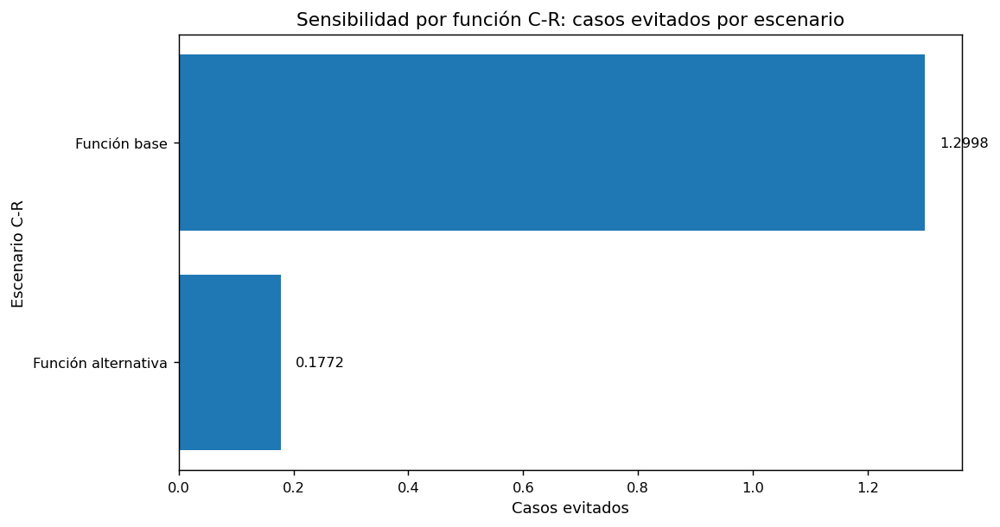

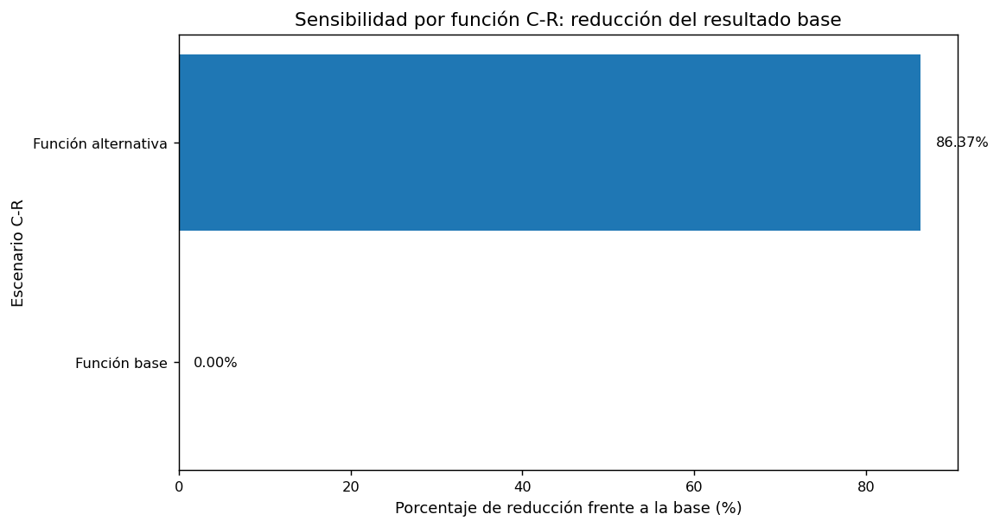

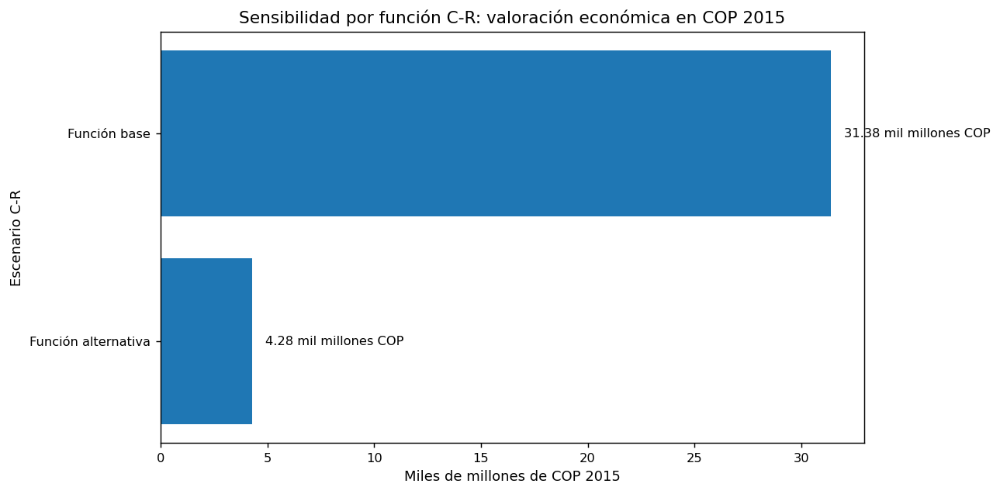


LECTURA AUTOMÁTICA DEL BLOQUE C-R


,Escenario C-R,Referencia C-R,Casos evitados,Casos base,Diferencia casos vs. base,Razón casos vs. base,Porcentaje del resultado base conservado (%),Porcentaje de reducción vs. base (%),Dirección del cambio
0,Función alternativa,Di et al. (2017),0.177200,1.299800,-1.122600,0.136300,13.633400,86.366600,Reducción frente a la base
1,Función base,Corrida principal PM2.5,1.299800,1.299800,0.000000,1.000000,100.000000,0.000000,Sin cambio



LECTURA RESUMIDA AUTOMÁTICA DEL BLOQUE C-R


,Escenario C-R,Lectura resumida
0,Función alternativa,"El escenario Función alternativa produjo 0.1772 casos evitados, frente a una base de 1.2998. Esto implica una difere..."
1,Función base,"El escenario Función base produjo 1.2998 casos evitados, frente a una base de 1.2998. Esto implica una diferencia de..."


In [82]:
# ============================================================
# CELDA 13 CORREGIDA
# RESULTADOS FINALES DEL BLOQUE DE SENSIBILIDAD C-R
# Compatible con archivos tipo:
# run_id, pollutant, cr_scenario, cr_reference, avoided_cases_total,
# baseline_cases_total, economic_value_total_usd_2015, economic_value_total_cop_2015
# ============================================================

from pathlib import Path
import os
import re
import unicodedata
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

BASE = Path(r"D:\TRABAJO DE GRADO BEN-MAP")

# ------------------------------------------------------------
# 1. Utilidades
# ------------------------------------------------------------
def leer_csv_flexible(path):
    path = str(path)
    if not os.path.exists(path):
        raise FileNotFoundError(f"No existe el archivo:\n{path}")
    for enc in ["utf-8-sig", "utf-8", "latin1", "cp1252"]:
        try:
            return pd.read_csv(path, encoding=enc)
        except Exception:
            continue
    raise ValueError(f"No pude leer el archivo:\n{path}")

def buscar_archivo_por_patrones(base, patrones):
    hallados = []
    for patron in patrones:
        hallados.extend(list(base.rglob(patron)))

    vistos = set()
    unicos = []
    for p in hallados:
        s = str(p).lower()
        if s not in vistos:
            vistos.add(s)
            unicos.append(p)

    if not unicos:
        return None, []

    unicos = sorted(unicos, key=lambda p: len(str(p)))
    return unicos[0], unicos

def normalizar_texto(txt):
    txt = str(txt).strip().lower()
    txt = unicodedata.normalize("NFKD", txt).encode("ascii", "ignore").decode("utf-8")
    txt = re.sub(r"[^a-z0-9]+", "_", txt)
    txt = re.sub(r"_+", "_", txt).strip("_")
    return txt

def mapa_columnas(df):
    return {normalizar_texto(c): c for c in df.columns}

def buscar_columna(df, candidatos_norm):
    mapa = mapa_columnas(df)
    for cand in candidatos_norm:
        if cand in mapa:
            return mapa[cand]
    return None

def buscar_columna_fragmentos(df, incluir, excluir=None):
    excluir = excluir or []
    for c in df.columns:
        cn = normalizar_texto(c)
        if all(f in cn for f in incluir) and not any(e in cn for e in excluir):
            return c
    return None

def formatear_usd(valor):
    if pd.isna(valor):
        return ""
    if abs(valor) >= 1e12:
        return f"{valor/1e12:.2f} billones USD"
    if abs(valor) >= 1e9:
        return f"{valor/1e9:.2f} mil millones USD"
    if abs(valor) >= 1e6:
        return f"{valor/1e6:.2f} millones USD"
    if abs(valor) >= 1e3:
        return f"{valor/1e3:.2f} mil USD"
    return f"{valor:,.2f} USD"

def formatear_cop(valor):
    if pd.isna(valor):
        return ""
    if abs(valor) >= 1e12:
        return f"{valor/1e12:.2f} billones COP"
    if abs(valor) >= 1e9:
        return f"{valor/1e9:.2f} mil millones COP"
    if abs(valor) >= 1e6:
        return f"{valor/1e6:.2f} millones COP"
    return f"{valor:,.0f} COP"

def escoger_unidad_cop(max_abs):
    if max_abs >= 1e9:
        return 1e9, "Miles de millones de COP 2015"
    return 1e6, "Millones de COP 2015"

def es_escenario_base(txt):
    s = normalizar_texto(txt)
    patrones_base = [
        "funcion_base", "base", "corrida_principal", "principal", "main"
    ]
    return any(p in s for p in patrones_base)

# ------------------------------------------------------------
# 2. Detectar archivo principal C-R
# ------------------------------------------------------------
PATH_CR, CAND_CR = buscar_archivo_por_patrones(
    BASE,
    [
        "sensibilidad_funcion_cr_pm25_resumen.csv",
        "*funcion_cr*resumen*.csv",
        "*sensibilidad*funcion_cr*.csv",
        "*funcion_cr*.csv"
    ]
)

print("=" * 90)
print("ARCHIVOS DETECTADOS DEL BLOQUE DE SENSIBILIDAD C-R")
print("=" * 90)
print("Archivo principal:", PATH_CR)

if PATH_CR is None:
    raise FileNotFoundError("No encontré el archivo principal del bloque de sensibilidad por función C-R.")

# ------------------------------------------------------------
# 3. Cargar archivo
# ------------------------------------------------------------
df_cr = leer_csv_flexible(PATH_CR)
df_cr.columns = [str(c).replace("\ufeff", "").strip() for c in df_cr.columns]

print("\n" + "=" * 90)
print("FORMA CARGADA")
print("=" * 90)
print(df_cr.shape)

print("\nColumnas detectadas:")
print(list(df_cr.columns))

# ------------------------------------------------------------
# 4. Detectar columnas reales del archivo
# ------------------------------------------------------------
col_corrida = buscar_columna(df_cr, ["run_id", "corrida"])
col_cont    = buscar_columna(df_cr, ["pollutant", "contaminante"])
col_esc     = buscar_columna(df_cr, ["cr_scenario", "escenario_c_r"])
col_ref     = buscar_columna(df_cr, ["cr_reference", "referencia_c_r"])

col_cases   = buscar_columna(df_cr, ["avoided_cases_total", "casos_evitados"])
col_base_epi = buscar_columna(df_cr, ["baseline_cases_total", "casos_basales_totales"])

col_usd = buscar_columna(df_cr, ["economic_value_total_usd_2015", "valor_economico_total_usd_2015"])
col_cop = buscar_columna(df_cr, ["economic_value_total_cop_2015", "valor_economico_total_cop_2015"])

col_beta  = buscar_columna(df_cr, ["beta_value", "beta"])
col_delta = buscar_columna(df_cr, ["delta_mean", "cambio_medio_en_concentracion"])

# búsquedas de respaldo
if col_cases is None:
    col_cases = buscar_columna_fragmentos(df_cr, ["avoided", "cases"])
if col_base_epi is None:
    col_base_epi = buscar_columna_fragmentos(df_cr, ["baseline", "cases"])
if col_usd is None:
    col_usd = buscar_columna_fragmentos(df_cr, ["economic", "value", "usd"])
if col_cop is None:
    col_cop = buscar_columna_fragmentos(df_cr, ["economic", "value", "cop"])

faltantes_min = [col_corrida, col_cont, col_esc, col_ref, col_cases]
if any(x is None for x in faltantes_min):
    raise ValueError(
        "No pude detectar las columnas mínimas necesarias del bloque C-R.\n"
        f"Columnas disponibles: {list(df_cr.columns)}"
    )

# ------------------------------------------------------------
# 5. Normalizar base
# ------------------------------------------------------------
base_cr = df_cr[[
    col_corrida, col_cont, col_esc, col_ref, col_cases
] + [c for c in [col_base_epi, col_usd, col_cop, col_beta, col_delta] if c is not None]].copy()

rename_map = {
    col_corrida: "Corrida",
    col_cont: "Contaminante",
    col_esc: "Escenario C-R",
    col_ref: "Referencia C-R",
    col_cases: "Casos evitados"
}
if col_base_epi is not None:
    rename_map[col_base_epi] = "Casos basales totales"
if col_usd is not None:
    rename_map[col_usd] = "Valor económico USD 2015"
if col_cop is not None:
    rename_map[col_cop] = "Valor económico COP 2015"
if col_beta is not None:
    rename_map[col_beta] = "Beta"
if col_delta is not None:
    rename_map[col_delta] = "Cambio medio en concentración"

base_cr = base_cr.rename(columns=rename_map)

for c in ["Casos evitados", "Casos basales totales", "Valor económico USD 2015", "Valor económico COP 2015", "Beta", "Cambio medio en concentración"]:
    if c in base_cr.columns:
        base_cr[c] = pd.to_numeric(base_cr[c], errors="coerce")

# ------------------------------------------------------------
# 6. Identificar la fila base del bloque
# ------------------------------------------------------------
mask_base = (
    base_cr["Escenario C-R"].astype(str).apply(es_escenario_base) |
    base_cr["Referencia C-R"].astype(str).apply(es_escenario_base)
)

if mask_base.sum() == 0:
    # respaldo: elegir la fila con mayor coincidencia textual "base/principal/main"
    txt_score = (
        base_cr["Escenario C-R"].astype(str).str.lower().str.contains("base|principal|main", regex=True, na=False).astype(int) +
        base_cr["Referencia C-R"].astype(str).str.lower().str.contains("base|principal|main", regex=True, na=False).astype(int)
    )
    if txt_score.max() > 0:
        fila_base = base_cr.loc[[txt_score.idxmax()]].copy()
    else:
        # último respaldo: la fila con mayor casos evitados
        fila_base = base_cr.loc[[base_cr["Casos evitados"].idxmax()]].copy()
else:
    fila_base = base_cr.loc[mask_base].copy()

fila_base = fila_base.iloc[0]

casos_base = fila_base["Casos evitados"]
usd_base = fila_base["Valor económico USD 2015"] if "Valor económico USD 2015" in base_cr.columns else np.nan
cop_base = fila_base["Valor económico COP 2015"] if "Valor económico COP 2015" in base_cr.columns else np.nan

# ------------------------------------------------------------
# 7. Construir tabla final comparativa
# ------------------------------------------------------------
tabla_cr_final = base_cr.copy()

tabla_cr_final["Casos base"] = casos_base
tabla_cr_final["Diferencia casos vs. base"] = tabla_cr_final["Casos evitados"] - tabla_cr_final["Casos base"]
tabla_cr_final["Razón casos vs. base"] = np.where(
    tabla_cr_final["Casos base"] != 0,
    tabla_cr_final["Casos evitados"] / tabla_cr_final["Casos base"],
    np.nan
)

if "Valor económico USD 2015" in tabla_cr_final.columns:
    tabla_cr_final["USD base"] = usd_base
    tabla_cr_final["Diferencia USD vs. base"] = tabla_cr_final["Valor económico USD 2015"] - tabla_cr_final["USD base"]
    tabla_cr_final["Razón USD vs. base"] = np.where(
        tabla_cr_final["USD base"] != 0,
        tabla_cr_final["Valor económico USD 2015"] / tabla_cr_final["USD base"],
        np.nan
    )

if "Valor económico COP 2015" in tabla_cr_final.columns:
    tabla_cr_final["COP base"] = cop_base
    tabla_cr_final["Diferencia COP vs. base"] = tabla_cr_final["Valor económico COP 2015"] - tabla_cr_final["COP base"]
    tabla_cr_final["Razón COP vs. base"] = np.where(
        tabla_cr_final["COP base"] != 0,
        tabla_cr_final["Valor económico COP 2015"] / tabla_cr_final["COP base"],
        np.nan
    )

tabla_cr_final["Porcentaje del resultado base conservado (%)"] = 100 * tabla_cr_final["Razón casos vs. base"]
tabla_cr_final["Porcentaje de reducción vs. base (%)"] = 100 * (1 - tabla_cr_final["Razón casos vs. base"])

tabla_cr_final["Dirección del cambio"] = np.where(
    tabla_cr_final["Diferencia casos vs. base"] < 0,
    "Reducción frente a la base",
    np.where(tabla_cr_final["Diferencia casos vs. base"] > 0, "Aumento frente a la base", "Sin cambio")
)

if "Valor económico USD 2015" in tabla_cr_final.columns:
    tabla_cr_final["Valor económico USD 2015 (lectura)"] = tabla_cr_final["Valor económico USD 2015"].apply(formatear_usd)

if "Valor económico COP 2015" in tabla_cr_final.columns:
    tabla_cr_final["Valor económico COP 2015 (lectura)"] = tabla_cr_final["Valor económico COP 2015"].apply(formatear_cop)
    tabla_cr_final["COP base (lectura)"] = tabla_cr_final["COP base"].apply(formatear_cop)

print("\n" + "=" * 90)
print("TABLA FINAL DEL BLOQUE DE SENSIBILIDAD C-R")
print("=" * 90)

cols_display = [
    "Corrida", "Contaminante", "Escenario C-R", "Referencia C-R",
    "Casos evitados", "Casos base",
    "Diferencia casos vs. base", "Razón casos vs. base",
    "Porcentaje del resultado base conservado (%)",
    "Porcentaje de reducción vs. base (%)",
    "Dirección del cambio"
]

if "Cambio medio en concentración" in tabla_cr_final.columns:
    cols_display.append("Cambio medio en concentración")
if "Beta" in tabla_cr_final.columns:
    cols_display.append("Beta")
if "Valor económico USD 2015 (lectura)" in tabla_cr_final.columns:
    cols_display.append("Valor económico USD 2015 (lectura)")
if "Valor económico COP 2015 (lectura)" in tabla_cr_final.columns:
    cols_display.append("Valor económico COP 2015 (lectura)")

display(tabla_cr_final[cols_display].round(4))

# ------------------------------------------------------------
# 8. Gráfica de casos evitados
# ------------------------------------------------------------
df_plot_cases = tabla_cr_final.copy().sort_values("Casos evitados", ascending=True)

plt.figure(figsize=(9, 4.8))
bars = plt.barh(df_plot_cases["Escenario C-R"], df_plot_cases["Casos evitados"])
plt.xlabel("Casos evitados")
plt.ylabel("Escenario C-R")
plt.title("Sensibilidad por función C-R: casos evitados por escenario")

xmax = df_plot_cases["Casos evitados"].max()
for bar, val in zip(bars, df_plot_cases["Casos evitados"]):
    plt.text(
        bar.get_width() + xmax * 0.02,
        bar.get_y() + bar.get_height() / 2,
        f"{val:.4f}",
        va="center",
        fontsize=9
    )

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 9. Gráfica de reducción vs base
# ------------------------------------------------------------
df_plot_red = tabla_cr_final.copy().sort_values("Porcentaje de reducción vs. base (%)", ascending=True)

plt.figure(figsize=(9, 4.8))
bars = plt.barh(df_plot_red["Escenario C-R"], df_plot_red["Porcentaje de reducción vs. base (%)"])
plt.xlabel("Porcentaje de reducción frente a la base (%)")
plt.ylabel("Escenario C-R")
plt.title("Sensibilidad por función C-R: reducción del resultado base")

xmax = max(abs(df_plot_red["Porcentaje de reducción vs. base (%)"]).max(), 1)
for bar, val in zip(bars, df_plot_red["Porcentaje de reducción vs. base (%)"]):
    xpos = bar.get_width() + xmax * 0.02 if val >= 0 else bar.get_width() - xmax * 0.10
    plt.text(
        xpos,
        bar.get_y() + bar.get_height() / 2,
        f"{val:.2f}%",
        va="center",
        fontsize=9
    )

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 10. Gráfica económica en COP
# ------------------------------------------------------------
if "Valor económico COP 2015" in tabla_cr_final.columns:
    df_plot_cop = tabla_cr_final.copy().sort_values("Valor económico COP 2015", ascending=True)

    escala, etiqueta_x = escoger_unidad_cop(df_plot_cop["Valor económico COP 2015"].abs().max())
    df_plot_cop["valor_plot_cop"] = df_plot_cop["Valor económico COP 2015"] / escala

    plt.figure(figsize=(10, 5))
    bars = plt.barh(df_plot_cop["Escenario C-R"], df_plot_cop["valor_plot_cop"])
    plt.xlabel(etiqueta_x)
    plt.ylabel("Escenario C-R")
    plt.title("Sensibilidad por función C-R: valoración económica en COP 2015")

    xmax = df_plot_cop["valor_plot_cop"].max()
    for bar, val_real in zip(bars, df_plot_cop["Valor económico COP 2015"]):
        plt.text(
            bar.get_width() + xmax * 0.02,
            bar.get_y() + bar.get_height() / 2,
            formatear_cop(val_real),
            va="center",
            fontsize=9
        )

    plt.tight_layout()
    plt.show()

# ------------------------------------------------------------
# 11. Tabla automática de lectura
# ------------------------------------------------------------
tabla_lectura_cr = tabla_cr_final[[
    "Escenario C-R", "Referencia C-R",
    "Casos evitados", "Casos base",
    "Diferencia casos vs. base", "Razón casos vs. base",
    "Porcentaje del resultado base conservado (%)",
    "Porcentaje de reducción vs. base (%)",
    "Dirección del cambio"
]].copy()

tabla_lectura_cr = tabla_lectura_cr.sort_values("Razón casos vs. base").reset_index(drop=True)

print("\n" + "=" * 90)
print("LECTURA AUTOMÁTICA DEL BLOQUE C-R")
print("=" * 90)
display(tabla_lectura_cr.round(4))

# ------------------------------------------------------------
# 12. Lectura resumida automática
# ------------------------------------------------------------
resumen_cr = []
for _, row in tabla_lectura_cr.iterrows():
    resumen_cr.append({
        "Escenario C-R": row["Escenario C-R"],
        "Lectura resumida": (
            f"El escenario {row['Escenario C-R']} produjo {row['Casos evitados']:.4f} casos evitados, "
            f"frente a una base de {row['Casos base']:.4f}. "
            f"Esto implica una diferencia de {row['Diferencia casos vs. base']:.4f} casos y conserva "
            f"{row['Porcentaje del resultado base conservado (%)']:.2f}% del resultado base. "
            f"La dirección del cambio fue: {row['Dirección del cambio']}."
        )
    })

print("\n" + "=" * 90)
print("LECTURA RESUMIDA AUTOMÁTICA DEL BLOQUE C-R")
print("=" * 90)
display(pd.DataFrame(resumen_cr))

# Celda 14. Tabla integradora final de sensibilidades

En esta celda se integran los tres bloques principales de sensibilidad del estudio: sensibilidad del HBM, sensibilidad de la función C-R y sensibilidad climática. El objetivo es construir una tabla comparativa única que permita contrastar, bajo un mismo esquema, el escenario más crítico, la magnitud del cambio y una medida relativa comparable entre bloques.

La salida incluye:
1. una tabla integradora final de sensibilidades,
2. una jerarquización global entre todas las fuentes de sensibilidad,
3. un resumen por bloque,
4. una lectura resumida automática para apoyar la redacción del capítulo de resultados.

FUENTE HBM DETECTADA
Variable en memoria: tabla_hbm_final
Forma: (4, 21)

FUENTE C-R DETECTADA
Variable en memoria: tabla_cr_final
Forma: (2, 25)

FUENTE CLIMÁTICA DETECTADA
Archivo: D:\TRABAJO DE GRADO BEN-MAP\SALIDAS_SENSIBILIDAD\04_sensibilidad\clima\sensibilidad_climatica_resumen.csv
Forma: (12, 16)

TABLA INTEGRADORA FINAL DE SENSIBILIDADES


,Bloque de sensibilidad,Corrida,Contaminante,Endpoint,Escenario más crítico,Referencia comparativa,Métrica principal,Valor principal,Métrica secundaria,Valor secundario,Magnitud relativa comparable,Lectura resumida
0,Climática,O3_MAIN,O3,Respiratory mortality,Desfavorable,desfavorable y favorable vs. central,Amplitud relativa total,0.249900,Amplitud total del cambio en casos,0.550800,0.249900,Escenario dominante Desfavorable; amplitud relativa total = 0.2499; amplitud total del cambio en casos = 0.5508.
1,Climática,PM25_MAIN,PM25,All-cause mortality,Desfavorable,desfavorable y favorable vs. central,Amplitud relativa total,0.149100,Amplitud total del cambio en casos,0.193700,0.149100,Escenario dominante Desfavorable; amplitud relativa total = 0.1491; amplitud total del cambio en casos = 0.1937.
2,Climática,NO2_CLD,NO2,Chronic Lung Disease,Desfavorable,desfavorable y favorable vs. central,Amplitud relativa total,0.079900,Amplitud total del cambio en casos,0.755300,0.079900,Escenario dominante Desfavorable; amplitud relativa total = 0.0799; amplitud total del cambio en casos = 0.7553.
3,Climática,NO2_ASTHMA,NO2,Asthma,Desfavorable,desfavorable y favorable vs. central,Amplitud relativa total,0.079800,Amplitud total del cambio en casos,1.014600,0.079800,Escenario dominante Desfavorable; amplitud relativa total = 0.0798; amplitud total del cambio en casos = 1.0146.
4,Función C-R,PM25_MAIN,PM25,PM25,Función alternativa,Di et al. (2017),Porcentaje de reducción vs. base (%),86.366600,Razón casos vs. base,0.136300,0.863700,Escenario Función alternativa; reducción vs. base = 86.37%; razón casos/base = 0.1363; magnitud comparable = 0.8637.
5,HBM,O3 - Mortalidad respiratoria,O3,Mortalidad respiratoria,Alto (p95),p95 y p05 vs. p50,Sensibilidad relativa máxima vs. central,40.654400,Amplitud total del cambio en casos,106.566000,40.654400,Escenario crítico Alto (p95); cambio de signo en p05: Sí; amplitud total = 106.566; sensibilidad relativa máxima = 4...
6,HBM,NO2 - Hospitalizaciones por enfermedad pulmonar crónica,NO2,Hospitalizaciones por enfermedad pulmonar crónica,Alto (p95),p95 y p05 vs. p50,Sensibilidad relativa máxima vs. central,39.435100,Amplitud total del cambio en casos,446.190000,39.435100,Escenario crítico Alto (p95); cambio de signo en p05: Sí; amplitud total = 446.190; sensibilidad relativa máxima = 3...
7,HBM,NO2 - Hospitalizaciones por asma,NO2,Hospitalizaciones por asma,Alto (p95),p95 y p05 vs. p50,Sensibilidad relativa máxima vs. central,37.622300,Amplitud total del cambio en casos,577.745000,37.622300,Escenario crítico Alto (p95); cambio de signo en p05: Sí; amplitud total = 577.745; sensibilidad relativa máxima = 3...
8,HBM,PM2.5 - Mortalidad por todas las causas,PM25,Mortalidad por todas las causas,Alto (p95),p95 y p05 vs. p50,Sensibilidad relativa máxima vs. central,31.826900,Amplitud total del cambio en casos,51.710000,31.826900,Escenario crítico Alto (p95); cambio de signo en p05: Sí; amplitud total = 51.710; sensibilidad relativa máxima = 31...



JERARQUIZACIÓN GLOBAL DE FUENTES DE SENSIBILIDAD


,Ranking global,Bloque de sensibilidad,Corrida,Contaminante,Endpoint,Escenario más crítico,Métrica principal,Valor principal,Magnitud relativa comparable
0,1,HBM,O3 - Mortalidad respiratoria,O3,Mortalidad respiratoria,Alto (p95),Sensibilidad relativa máxima vs. central,40.654400,40.654400
1,2,HBM,NO2 - Hospitalizaciones por enfermedad pulmonar crónica,NO2,Hospitalizaciones por enfermedad pulmonar crónica,Alto (p95),Sensibilidad relativa máxima vs. central,39.435100,39.435100
2,3,HBM,NO2 - Hospitalizaciones por asma,NO2,Hospitalizaciones por asma,Alto (p95),Sensibilidad relativa máxima vs. central,37.622300,37.622300
3,4,HBM,PM2.5 - Mortalidad por todas las causas,PM25,Mortalidad por todas las causas,Alto (p95),Sensibilidad relativa máxima vs. central,31.826900,31.826900
4,5,Función C-R,PM25_MAIN,PM25,PM25,Función alternativa,Porcentaje de reducción vs. base (%),86.366600,0.863700
5,6,Climática,O3_MAIN,O3,Respiratory mortality,Desfavorable,Amplitud relativa total,0.249900,0.249900
6,7,Climática,PM25_MAIN,PM25,All-cause mortality,Desfavorable,Amplitud relativa total,0.149100,0.149100
7,8,Climática,NO2_CLD,NO2,Chronic Lung Disease,Desfavorable,Amplitud relativa total,0.079900,0.079900
8,9,Climática,NO2_ASTHMA,NO2,Asthma,Desfavorable,Amplitud relativa total,0.079800,0.079800



JERARQUIZACIÓN RESUMIDA POR BLOQUE


,Ranking bloque,Bloque de sensibilidad,Max_magnitud_relativa,Promedio_magnitud_relativa,n_corridas
0,1,HBM,40.654400,37.384700,4
1,2,Función C-R,0.863700,0.863700,1
2,3,Climática,0.249900,0.139700,4


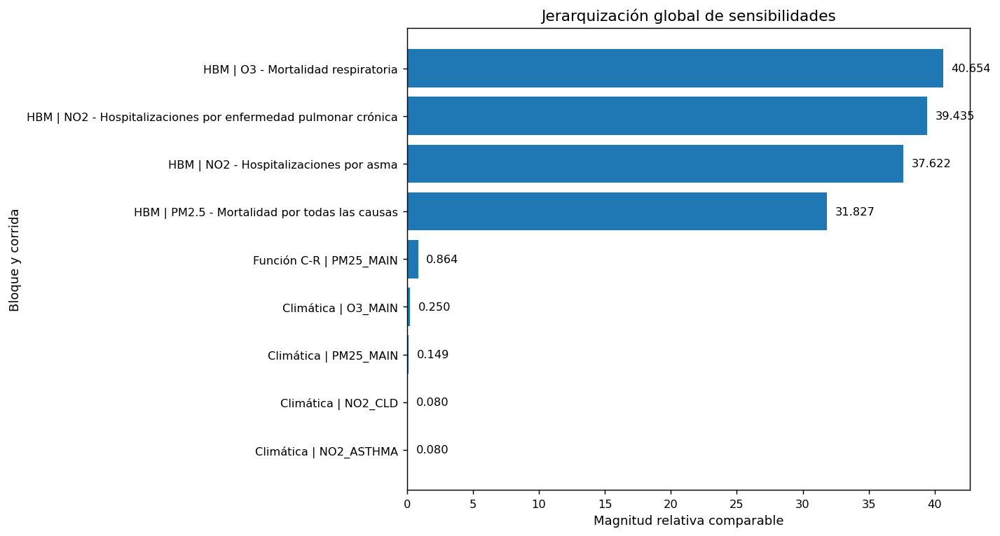


LECTURA RESUMIDA AUTOMÁTICA DE LA INTEGRACIÓN


,Ranking global,Bloque de sensibilidad,Corrida,Lectura resumida
0,1,HBM,O3 - Mortalidad respiratoria,"En la posición 1 se ubicó HBM para O3 - Mortalidad respiratoria (O3 - Mortalidad respiratoria), con escenario crític..."
1,2,HBM,NO2 - Hospitalizaciones por enfermedad pulmonar crónica,En la posición 2 se ubicó HBM para NO2 - Hospitalizaciones por enfermedad pulmonar crónica (NO2 - Hospitalizaciones ...
2,3,HBM,NO2 - Hospitalizaciones por asma,"En la posición 3 se ubicó HBM para NO2 - Hospitalizaciones por asma (NO2 - Hospitalizaciones por asma), con escenari..."
3,4,HBM,PM2.5 - Mortalidad por todas las causas,"En la posición 4 se ubicó HBM para PM2.5 - Mortalidad por todas las causas (PM25 - Mortalidad por todas las causas),..."
4,5,Función C-R,PM25_MAIN,"En la posición 5 se ubicó Función C-R para PM25_MAIN (PM25 - PM25), con escenario crítico 'Función alternativa' y un..."
5,6,Climática,O3_MAIN,"En la posición 6 se ubicó Climática para O3_MAIN (O3 - Respiratory mortality), con escenario crítico 'Desfavorable' ..."
6,7,Climática,PM25_MAIN,"En la posición 7 se ubicó Climática para PM25_MAIN (PM25 - All-cause mortality), con escenario crítico 'Desfavorable..."
7,8,Climática,NO2_CLD,"En la posición 8 se ubicó Climática para NO2_CLD (NO2 - Chronic Lung Disease), con escenario crítico 'Desfavorable' ..."
8,9,Climática,NO2_ASTHMA,"En la posición 9 se ubicó Climática para NO2_ASTHMA (NO2 - Asthma), con escenario crítico 'Desfavorable' y una magni..."


In [83]:
# ============================================================
# CELDA 14. TABLA INTEGRADORA FINAL DE SENSIBILIDADES
# Integra: HBM + Función C-R + Climática
# No guarda archivos todavía
# ============================================================

from pathlib import Path
import os
import re
import unicodedata
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

BASE = Path(r"D:\TRABAJO DE GRADO BEN-MAP")

# ------------------------------------------------------------
# 1. Utilidades
# ------------------------------------------------------------
def leer_csv_flexible(path):
    path = str(path)
    if not os.path.exists(path):
        raise FileNotFoundError(f"No existe el archivo:\n{path}")
    for enc in ["utf-8-sig", "utf-8", "latin1", "cp1252"]:
        try:
            return pd.read_csv(path, encoding=enc)
        except Exception:
            continue
    raise ValueError(f"No pude leer el archivo:\n{path}")

def buscar_archivo_por_patrones(base, patrones):
    hallados = []
    for patron in patrones:
        hallados.extend(list(base.rglob(patron)))

    vistos = set()
    unicos = []
    for p in hallados:
        s = str(p).lower()
        if s not in vistos:
            vistos.add(s)
            unicos.append(p)

    if not unicos:
        return None, []

    unicos = sorted(unicos, key=lambda p: len(str(p)))
    return unicos[0], unicos

def normalizar_texto(txt):
    txt = str(txt).strip().lower()
    txt = unicodedata.normalize("NFKD", txt).encode("ascii", "ignore").decode("utf-8")
    txt = re.sub(r"[^a-z0-9]+", "_", txt)
    txt = re.sub(r"_+", "_", txt).strip("_")
    return txt

def mapa_columnas(df):
    return {normalizar_texto(c): c for c in df.columns}

def buscar_columna(df, candidatos_norm):
    mapa = mapa_columnas(df)
    for cand in candidatos_norm:
        if cand in mapa:
            return mapa[cand]
    return None

def buscar_columna_fragmentos(df, incluir, excluir=None):
    excluir = excluir or []
    for c in df.columns:
        cn = normalizar_texto(c)
        if all(f in cn for f in incluir) and not any(e in cn for e in excluir):
            return c
    return None

def buscar_df_memoria(candidatos):
    for nombre in candidatos:
        if nombre in globals():
            obj = globals()[nombre]
            if isinstance(obj, pd.DataFrame) and len(obj) > 0:
                return obj.copy(), nombre
    return None, None

# ------------------------------------------------------------
# 2. Cargar HBM desde memoria
# ------------------------------------------------------------
df_hbm, nombre_hbm = buscar_df_memoria(["tabla_hbm_final"])

if df_hbm is None:
    raise ValueError(
        "No encontré 'tabla_hbm_final' en memoria. "
        "Corre primero la celda final del bloque HBM."
    )

print("=" * 95)
print("FUENTE HBM DETECTADA")
print("=" * 95)
print("Variable en memoria:", nombre_hbm)
print("Forma:", df_hbm.shape)

# ------------------------------------------------------------
# 3. Cargar C-R desde memoria
# ------------------------------------------------------------
df_cr, nombre_cr = buscar_df_memoria(["tabla_cr_final"])

if df_cr is None:
    raise ValueError(
        "No encontré 'tabla_cr_final' en memoria. "
        "Corre primero la celda final del bloque C-R."
    )

print("\n" + "=" * 95)
print("FUENTE C-R DETECTADA")
print("=" * 95)
print("Variable en memoria:", nombre_cr)
print("Forma:", df_cr.shape)

# ------------------------------------------------------------
# 4. Cargar Climática desde memoria o archivo
# ------------------------------------------------------------
df_clima, nombre_clima = buscar_df_memoria([
    "tabla_climatica_corta",
    "tabla_sensibilidad_climatica_corta",
    "tabla_clima_corta",
    "tabla_climatica_final",
    "tabla_clima_final"
])

if df_clima is not None:
    print("\n" + "=" * 95)
    print("FUENTE CLIMÁTICA DETECTADA")
    print("=" * 95)
    print("Variable en memoria:", nombre_clima)
    print("Forma:", df_clima.shape)
else:
    PATH_CLIMA, CAND_CLIMA = buscar_archivo_por_patrones(
        BASE,
        [
            "tabla_5_49_sintesis_corta_sensibilidad_climatica.csv",
            "*sintesis_corta*sensibilidad_climatica*.csv",
            "*resumen*sensibilidad*climatica*.csv",
            "*sensibilidad_climatica*.csv"
        ]
    )

    if PATH_CLIMA is None:
        raise FileNotFoundError(
            "No encontré la tabla corta del bloque climático ni en memoria ni en disco."
        )

    df_clima = leer_csv_flexible(PATH_CLIMA)
    df_clima.columns = [str(c).replace("\ufeff", "").strip() for c in df_clima.columns]

    print("\n" + "=" * 95)
    print("FUENTE CLIMÁTICA DETECTADA")
    print("=" * 95)
    print("Archivo:", PATH_CLIMA)
    print("Forma:", df_clima.shape)

# ------------------------------------------------------------
# 5. Estandarizar HBM
# ------------------------------------------------------------
req_hbm = [
    "Corrida", "Contaminante", "Endpoint",
    "Escenario más crítico",
    "Amplitud total del cambio en casos",
    "Sensibilidad relativa máxima vs. central"
]
falt_hbm = [c for c in req_hbm if c not in df_hbm.columns]
if falt_hbm:
    raise ValueError(f"En HBM faltan columnas: {falt_hbm}")

tabla_hbm_int = df_hbm[[
    "Corrida", "Contaminante", "Endpoint",
    "Escenario más crítico",
    "Cambio de signo en p05",
    "Amplitud total del cambio en casos",
    "Sensibilidad relativa máxima vs. central"
]].copy()

tabla_hbm_int["Bloque de sensibilidad"] = "HBM"
tabla_hbm_int["Referencia comparativa"] = "p95 y p05 vs. p50"
tabla_hbm_int["Métrica principal"] = "Sensibilidad relativa máxima vs. central"
tabla_hbm_int["Valor principal"] = tabla_hbm_int["Sensibilidad relativa máxima vs. central"]
tabla_hbm_int["Métrica secundaria"] = "Amplitud total del cambio en casos"
tabla_hbm_int["Valor secundario"] = tabla_hbm_int["Amplitud total del cambio en casos"]
tabla_hbm_int["Magnitud relativa comparable"] = tabla_hbm_int["Sensibilidad relativa máxima vs. central"]
tabla_hbm_int["Lectura resumida"] = tabla_hbm_int.apply(
    lambda r: (
        f"Escenario crítico {r['Escenario más crítico']}; "
        f"cambio de signo en p05: {r['Cambio de signo en p05']}; "
        f"amplitud total = {r['Amplitud total del cambio en casos']:.3f}; "
        f"sensibilidad relativa máxima = {r['Sensibilidad relativa máxima vs. central']:.3f}."
    ),
    axis=1
)

tabla_hbm_int = tabla_hbm_int[[
    "Bloque de sensibilidad", "Corrida", "Contaminante", "Endpoint",
    "Escenario más crítico", "Referencia comparativa",
    "Métrica principal", "Valor principal",
    "Métrica secundaria", "Valor secundario",
    "Magnitud relativa comparable", "Lectura resumida"
]].copy()

# ------------------------------------------------------------
# 6. Estandarizar C-R
# Tomamos solo escenarios NO base
# ------------------------------------------------------------
req_cr = [
    "Corrida", "Contaminante", "Escenario C-R", "Referencia C-R",
    "Razón casos vs. base", "Porcentaje de reducción vs. base (%)"
]
falt_cr = [c for c in req_cr if c not in df_cr.columns]
if falt_cr:
    raise ValueError(f"En C-R faltan columnas: {falt_cr}")

mask_no_base = ~df_cr["Escenario C-R"].astype(str).str.contains("base", case=False, na=False)
df_cr_alt = df_cr.loc[mask_no_base].copy()

if len(df_cr_alt) == 0:
    raise ValueError("En C-R no encontré escenarios alternativos para integrar.")

tabla_cr_int = df_cr_alt.copy()
tabla_cr_int["Endpoint"] = tabla_cr_int["Contaminante"].astype(str)

tabla_cr_int["Bloque de sensibilidad"] = "Función C-R"
tabla_cr_int["Escenario más crítico"] = tabla_cr_int["Escenario C-R"]
tabla_cr_int["Referencia comparativa"] = tabla_cr_int["Referencia C-R"]
tabla_cr_int["Métrica principal"] = "Porcentaje de reducción vs. base (%)"
tabla_cr_int["Valor principal"] = tabla_cr_int["Porcentaje de reducción vs. base (%)"]
tabla_cr_int["Métrica secundaria"] = "Razón casos vs. base"
tabla_cr_int["Valor secundario"] = tabla_cr_int["Razón casos vs. base"]
tabla_cr_int["Magnitud relativa comparable"] = (tabla_cr_int["Razón casos vs. base"] - 1).abs()

tabla_cr_int["Lectura resumida"] = tabla_cr_int.apply(
    lambda r: (
        f"Escenario {r['Escenario C-R']}; "
        f"reducción vs. base = {r['Porcentaje de reducción vs. base (%)']:.2f}%; "
        f"razón casos/base = {r['Razón casos vs. base']:.4f}; "
        f"magnitud comparable = {abs(r['Razón casos vs. base'] - 1):.4f}."
    ),
    axis=1
)

tabla_cr_int = tabla_cr_int[[
    "Bloque de sensibilidad", "Corrida", "Contaminante", "Endpoint",
    "Escenario más crítico", "Referencia comparativa",
    "Métrica principal", "Valor principal",
    "Métrica secundaria", "Valor secundario",
    "Magnitud relativa comparable", "Lectura resumida"
]].copy()

# ------------------------------------------------------------
# 7. Estandarizar Climática
# Compatible con:
# A) tabla corta ya resumida
# B) tabla larga por escenario climático
# ------------------------------------------------------------

def clasificar_escenario_clima(txt):
    s = normalizar_texto(txt)
    if any(k in s for k in ["central", "base", "main"]):
        return "central"
    if any(k in s for k in ["desfavorable", "unfavorable", "alto", "high"]):
        return "desfavorable"
    if any(k in s for k in ["favorable", "bajo", "low"]):
        return "favorable"
    return np.nan

# ---------
# Opción A: si ya viene resumida
# ---------
col_corrida_c = buscar_columna(df_clima, ["corrida"])
col_cont_c    = buscar_columna(df_clima, ["contaminante"])
col_endp_c    = buscar_columna(df_clima, ["endpoint"])
col_esc_c     = buscar_columna(df_clima, ["escenario_de_mayor_impacto", "escenario_mas_critico"])
col_amp_rel_c = buscar_columna(df_clima, ["amplitud_relativa_total"])
col_amp_abs_c = buscar_columna(df_clima, ["amplitud_total_del_cambio_en_casos", "amplitud_total_cambio_en_casos"])

if col_amp_abs_c is None:
    col_amp_abs_c = buscar_columna_fragmentos(df_clima, ["amplitud", "cambio", "casos"])

formato_clima_resumido = all(
    x is not None for x in [col_corrida_c, col_cont_c, col_endp_c, col_esc_c, col_amp_rel_c, col_amp_abs_c]
)

if formato_clima_resumido:
    tabla_clima_int = df_clima[[
        col_corrida_c, col_cont_c, col_endp_c,
        col_esc_c, col_amp_rel_c, col_amp_abs_c
    ]].copy()

    tabla_clima_int.columns = [
        "Corrida", "Contaminante", "Endpoint",
        "Escenario más crítico", "Amplitud relativa total", "Amplitud total del cambio en casos"
    ]

# ---------
# Opción B: si viene en formato largo por escenario climático
# ---------
else:
    col_corrida_c = buscar_columna(df_clima, ["run_id", "corrida"])
    col_cont_c    = buscar_columna(df_clima, ["pollutant", "contaminante"])
    col_endp_c    = buscar_columna(df_clima, ["endpoint"])
    col_esc_raw   = buscar_columna(df_clima, ["climate_scenario", "escenario_climatico"])
    col_mult_c    = buscar_columna(df_clima, ["climate_multiplier", "climate_mult", "multiplicador_climatico"])
    col_cases_c   = buscar_columna(df_clima, ["avoided_cases_total", "casos_evitados"])

    if col_cases_c is None:
        col_cases_c = buscar_columna_fragmentos(df_clima, ["avoided", "cases"])

    falt_clima = [x for x in [col_corrida_c, col_cont_c, col_endp_c, col_esc_raw, col_cases_c] if x is None]
    if falt_clima:
        raise ValueError(
            "No pude detectar todas las columnas necesarias en la tabla climática.\n"
            f"Columnas disponibles: {list(df_clima.columns)}"
        )

    clima_long = df_clima[[col_corrida_c, col_cont_c, col_endp_c, col_esc_raw, col_cases_c] +
                          ([col_mult_c] if col_mult_c is not None else [])].copy()

    clima_long.columns = (
        ["Corrida", "Contaminante", "Endpoint", "Escenario_raw", "Casos evitados"] +
        (["Multiplicador climático"] if col_mult_c is not None else [])
    )

    clima_long["Casos evitados"] = pd.to_numeric(clima_long["Casos evitados"], errors="coerce")
    if "Multiplicador climático" in clima_long.columns:
        clima_long["Multiplicador climático"] = pd.to_numeric(clima_long["Multiplicador climático"], errors="coerce")

    clima_long["esc_std"] = clima_long["Escenario_raw"].apply(clasificar_escenario_clima)

    # respaldo con multiplicador si el nombre del escenario no basta
    if clima_long["esc_std"].isna().any() and "Multiplicador climático" in clima_long.columns:
        clima_long.loc[
            clima_long["esc_std"].isna() & (clima_long["Multiplicador climático"] == 1),
            "esc_std"
        ] = "central"
        clima_long.loc[
            clima_long["esc_std"].isna() & (clima_long["Multiplicador climático"] > 1),
            "esc_std"
        ] = "desfavorable"
        clima_long.loc[
            clima_long["esc_std"].isna() & (clima_long["Multiplicador climático"] < 1),
            "esc_std"
        ] = "favorable"

    if clima_long["esc_std"].isna().any():
        print("Escenarios climáticos no clasificados:")
        print(clima_long.loc[clima_long["esc_std"].isna(), "Escenario_raw"].drop_duplicates().tolist())
        raise ValueError("No pude clasificar todos los escenarios climáticos en central/desfavorable/favorable.")

    clima_wide = (
        clima_long
        .pivot_table(
            index=["Corrida", "Contaminante", "Endpoint"],
            columns="esc_std",
            values="Casos evitados",
            aggfunc="first"
        )
        .reset_index()
    )

    clima_wide.columns.name = None

    for c in ["central", "desfavorable", "favorable"]:
        if c not in clima_wide.columns:
            raise ValueError(
                f"Falta el escenario climático '{c}' en la tabla larga. "
                f"Columnas generadas: {list(clima_wide.columns)}"
            )

    clima_wide = clima_wide.rename(columns={
        "central": "Casos central",
        "desfavorable": "Casos desfavorable",
        "favorable": "Casos favorable"
    })

    clima_wide["Cambio desfavorable vs central"] = clima_wide["Casos desfavorable"] - clima_wide["Casos central"]
    clima_wide["Cambio favorable vs central"] = clima_wide["Casos favorable"] - clima_wide["Casos central"]

    clima_wide["Razón desfavorable vs central"] = np.where(
        clima_wide["Casos central"] != 0,
        clima_wide["Casos desfavorable"] / clima_wide["Casos central"],
        np.nan
    )
    clima_wide["Razón favorable vs central"] = np.where(
        clima_wide["Casos central"] != 0,
        clima_wide["Casos favorable"] / clima_wide["Casos central"],
        np.nan
    )

    clima_wide["Amplitud total del cambio en casos"] = (
        np.abs(clima_wide["Cambio desfavorable vs central"]) +
        np.abs(clima_wide["Cambio favorable vs central"])
    )

    clima_wide["Amplitud relativa total"] = (
        clima_wide["Razón desfavorable vs central"] -
        clima_wide["Razón favorable vs central"]
    )

    clima_wide["Escenario más crítico"] = np.where(
        np.abs(clima_wide["Cambio desfavorable vs central"]) >= np.abs(clima_wide["Cambio favorable vs central"]),
        "Desfavorable",
        "Favorable"
    )

    tabla_clima_int = clima_wide[[
        "Corrida", "Contaminante", "Endpoint",
        "Escenario más crítico", "Amplitud relativa total", "Amplitud total del cambio en casos"
    ]].copy()

tabla_clima_int["Bloque de sensibilidad"] = "Climática"
tabla_clima_int["Referencia comparativa"] = "desfavorable y favorable vs. central"
tabla_clima_int["Métrica principal"] = "Amplitud relativa total"
tabla_clima_int["Valor principal"] = tabla_clima_int["Amplitud relativa total"]
tabla_clima_int["Métrica secundaria"] = "Amplitud total del cambio en casos"
tabla_clima_int["Valor secundario"] = tabla_clima_int["Amplitud total del cambio en casos"]
tabla_clima_int["Magnitud relativa comparable"] = tabla_clima_int["Amplitud relativa total"]

tabla_clima_int["Lectura resumida"] = tabla_clima_int.apply(
    lambda r: (
        f"Escenario dominante {r['Escenario más crítico']}; "
        f"amplitud relativa total = {r['Amplitud relativa total']:.4f}; "
        f"amplitud total del cambio en casos = {r['Amplitud total del cambio en casos']:.4f}."
    ),
    axis=1
)

tabla_clima_int = tabla_clima_int[[
    "Bloque de sensibilidad", "Corrida", "Contaminante", "Endpoint",
    "Escenario más crítico", "Referencia comparativa",
    "Métrica principal", "Valor principal",
    "Métrica secundaria", "Valor secundario",
    "Magnitud relativa comparable", "Lectura resumida"
]].copy()
# ------------------------------------------------------------
# 8. Integrar
# ------------------------------------------------------------
tabla_integrada_sens = pd.concat(
    [tabla_hbm_int, tabla_cr_int, tabla_clima_int],
    ignore_index=True
)

tabla_integrada_sens = tabla_integrada_sens.sort_values(
    ["Bloque de sensibilidad", "Magnitud relativa comparable"],
    ascending=[True, False]
).reset_index(drop=True)

print("\n" + "=" * 95)
print("TABLA INTEGRADORA FINAL DE SENSIBILIDADES")
print("=" * 95)
display(tabla_integrada_sens.round(4))

# ------------------------------------------------------------
# 9. Ranking global
# ------------------------------------------------------------
ranking_global = tabla_integrada_sens.copy().sort_values(
    "Magnitud relativa comparable", ascending=False
).reset_index(drop=True)

ranking_global.insert(0, "Ranking global", np.arange(1, len(ranking_global) + 1))

print("\n" + "=" * 95)
print("JERARQUIZACIÓN GLOBAL DE FUENTES DE SENSIBILIDAD")
print("=" * 95)
display(
    ranking_global[[
        "Ranking global", "Bloque de sensibilidad", "Corrida", "Contaminante",
        "Endpoint", "Escenario más crítico", "Métrica principal",
        "Valor principal", "Magnitud relativa comparable"
    ]].round(4)
)

# ------------------------------------------------------------
# 10. Resumen por bloque
# ------------------------------------------------------------
ranking_bloque = (
    tabla_integrada_sens
    .groupby("Bloque de sensibilidad", as_index=False)
    .agg(
        Max_magnitud_relativa=("Magnitud relativa comparable", "max"),
        Promedio_magnitud_relativa=("Magnitud relativa comparable", "mean"),
        n_corridas=("Corrida", "count")
    )
    .sort_values("Max_magnitud_relativa", ascending=False)
    .reset_index(drop=True)
)

ranking_bloque.insert(0, "Ranking bloque", np.arange(1, len(ranking_bloque) + 1))

print("\n" + "=" * 95)
print("JERARQUIZACIÓN RESUMIDA POR BLOQUE")
print("=" * 95)
display(ranking_bloque.round(4))

# ------------------------------------------------------------
# 11. Gráfica global
# ------------------------------------------------------------
df_plot_global = ranking_global.copy()

plt.figure(figsize=(11, 6))
bars = plt.barh(
    df_plot_global["Bloque de sensibilidad"] + " | " + df_plot_global["Corrida"].astype(str),
    df_plot_global["Magnitud relativa comparable"]
)
plt.gca().invert_yaxis()
plt.xlabel("Magnitud relativa comparable")
plt.ylabel("Bloque y corrida")
plt.title("Jerarquización global de sensibilidades")

xmax = df_plot_global["Magnitud relativa comparable"].max()
for bar, val in zip(bars, df_plot_global["Magnitud relativa comparable"]):
    plt.text(
        bar.get_width() + xmax * 0.015,
        bar.get_y() + bar.get_height() / 2,
        f"{val:.3f}",
        va="center",
        fontsize=9
    )

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 12. Lectura resumida automática
# ------------------------------------------------------------
lectura_integrada = ranking_global[[
    "Ranking global", "Bloque de sensibilidad", "Corrida",
    "Contaminante", "Endpoint", "Escenario más crítico",
    "Magnitud relativa comparable"
]].copy()

lectura_integrada["Lectura resumida"] = lectura_integrada.apply(
    lambda r: (
        f"En la posición {int(r['Ranking global'])} se ubicó {r['Bloque de sensibilidad']} "
        f"para {r['Corrida']} ({r['Contaminante']} - {r['Endpoint']}), "
        f"con escenario crítico '{r['Escenario más crítico']}' y una magnitud relativa comparable "
        f"de {r['Magnitud relativa comparable']:.4f}."
    ),
    axis=1
)

print("\n" + "=" * 95)
print("LECTURA RESUMIDA AUTOMÁTICA DE LA INTEGRACIÓN")
print("=" * 95)
display(lectura_integrada[[
    "Ranking global", "Bloque de sensibilidad", "Corrida", "Lectura resumida"
]])

corrija los nombres de endpoints,
construya un ranking interno por bloque,
cree una magnitud normalizada (0–1) para comparación global,
saque una tabla final pulida para redacción.


RESUMEN PULIDO POR BLOQUE


,Bloque de sensibilidad,max_magnitud_relativa,promedio_magnitud_relativa,max_normalizado,promedio_normalizado,n_corridas
0,Climática,0.249900,0.139700,1.000000,0.351900,4
1,Función C-R,0.863700,0.863700,1.000000,1.000000,1
2,HBM,40.654400,37.384700,1.000000,0.629600,4


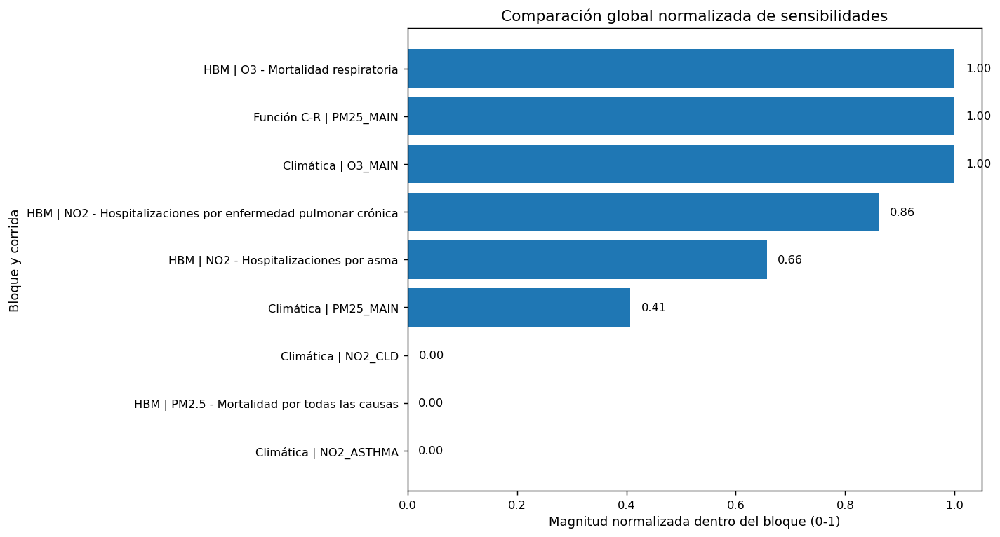


LECTURA FINAL AUTOMÁTICA DE LAS SENSIBILIDADES


,Ranking global normalizado,Bloque de sensibilidad,Corrida,Lectura resumida
0,1,HBM,O3 - Mortalidad respiratoria,"En el bloque HBM, la corrida O3 - Mortalidad respiratoria ocupó la posición 1 dentro de su bloque. Su escenario más ..."
1,2,Función C-R,PM25_MAIN,"En el bloque Función C-R, la corrida PM25_MAIN ocupó la posición 1 dentro de su bloque. Su escenario más crítico fue..."
2,3,Climática,O3_MAIN,"En el bloque Climática, la corrida O3_MAIN ocupó la posición 1 dentro de su bloque. Su escenario más crítico fue Des..."
3,4,HBM,NO2 - Hospitalizaciones por enfermedad pulmonar crónica,"En el bloque HBM, la corrida NO2 - Hospitalizaciones por enfermedad pulmonar crónica ocupó la posición 2 dentro de s..."
4,5,HBM,NO2 - Hospitalizaciones por asma,"En el bloque HBM, la corrida NO2 - Hospitalizaciones por asma ocupó la posición 3 dentro de su bloque. Su escenario ..."
5,6,Climática,PM25_MAIN,"En el bloque Climática, la corrida PM25_MAIN ocupó la posición 2 dentro de su bloque. Su escenario más crítico fue D..."
6,7,Climática,NO2_CLD,"En el bloque Climática, la corrida NO2_CLD ocupó la posición 3 dentro de su bloque. Su escenario más crítico fue Des..."
7,8,HBM,PM2.5 - Mortalidad por todas las causas,"En el bloque HBM, la corrida PM2.5 - Mortalidad por todas las causas ocupó la posición 4 dentro de su bloque. Su esc..."
8,9,Climática,NO2_ASTHMA,"En el bloque Climática, la corrida NO2_ASTHMA ocupó la posición 4 dentro de su bloque. Su escenario más crítico fue ..."


In [84]:
# ============================================================
# CELDA 15. PULIDO FINAL DE LA INTEGRACIÓN DE SENSIBILIDADES
# - corrige nombres
# - ranking dentro de cada bloque
# - ranking global normalizado
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

if "tabla_integrada_sens" not in globals():
    raise ValueError("No encontré 'tabla_integrada_sens' en memoria. Corre primero la celda integradora.")

tabla_integrada_pulida = tabla_integrada_sens.copy()

# ------------------------------------------------------------
# 1. Homogeneizar nombres de endpoints
# ------------------------------------------------------------
map_endpoint = {
    "Respiratory mortality": "Mortalidad respiratoria",
    "All-cause mortality": "Mortalidad por todas las causas",
    "Chronic Lung Disease": "Enfermedad pulmonar crónica",
    "Asthma": "Asma",
    "PM25": "PM2.5"
}

tabla_integrada_pulida["Endpoint"] = tabla_integrada_pulida["Endpoint"].replace(map_endpoint)

# ------------------------------------------------------------
# 2. Orden metodológico de bloques
# ------------------------------------------------------------
orden_bloques = {
    "HBM": 1,
    "Función C-R": 2,
    "Climática": 3
}
tabla_integrada_pulida["orden_bloque"] = tabla_integrada_pulida["Bloque de sensibilidad"].map(orden_bloques)

# ------------------------------------------------------------
# 3. Ranking dentro de cada bloque
# ------------------------------------------------------------
tabla_integrada_pulida = tabla_integrada_pulida.sort_values(
    ["Bloque de sensibilidad", "Magnitud relativa comparable"],
    ascending=[True, False]
).reset_index(drop=True)

tabla_integrada_pulida["Ranking dentro del bloque"] = (
    tabla_integrada_pulida
    .groupby("Bloque de sensibilidad")["Magnitud relativa comparable"]
    .rank(method="dense", ascending=False)
    .astype(int)
)

# ------------------------------------------------------------
# 4. Normalización 0-1 dentro de cada bloque
#    Esto sí permite comparación global más justa
# ------------------------------------------------------------
def normalizar_minmax(grupo):
    x = grupo["Magnitud relativa comparable"].astype(float)
    xmin, xmax = x.min(), x.max()
    if np.isclose(xmax, xmin):
        return pd.Series(np.ones(len(grupo)), index=grupo.index)
    return (x - xmin) / (xmax - xmin)

tabla_integrada_pulida["Magnitud normalizada dentro del bloque"] = (
    tabla_integrada_pulida
    .groupby("Bloque de sensibilidad", group_keys=False)
    .apply(normalizar_minmax)
)

# ------------------------------------------------------------
# 5. Ranking global normalizado
# ------------------------------------------------------------
ranking_global_norm = (
    tabla_integrada_pulida
    .sort_values(
        ["Magnitud normalizada dentro del bloque", "Magnitud relativa comparable"],
        ascending=[False, False]
    )
    .reset_index(drop=True)
)

ranking_global_norm.insert(0, "Ranking global normalizado", np.arange(1, len(ranking_global_norm) + 1))

# ------------------------------------------------------------
# 6. Tabla final pulida
# ------------------------------------------------------------
tabla_final_sens_pulida = tabla_integrada_pulida.copy()

tabla_final_sens_pulida = tabla_final_sens_pulida.sort_values(
    ["orden_bloque", "Ranking dentro del bloque"],
    ascending=[True, True]
).reset_index(drop=True)

tabla_final_sens_pulida = tabla_final_sens_pulida[[
    "Bloque de sensibilidad", "Corrida", "Contaminante", "Endpoint",
    "Escenario más crítico", "Referencia comparativa",
    "Métrica principal", "Valor principal",
    "Métrica secundaria", "Valor secundario",
    "Magnitud relativa comparable",
    "Ranking dentro del bloque",
    "Magnitud normalizada dentro del bloque"
]].copy()

# ------------------------------------------------------------
# 7. Resumen por bloque
# ------------------------------------------------------------
resumen_bloques_pulido = (
    tabla_integrada_pulida
    .groupby("Bloque de sensibilidad", as_index=False)
    .agg(
        max_magnitud_relativa=("Magnitud relativa comparable", "max"),
        promedio_magnitud_relativa=("Magnitud relativa comparable", "mean"),
        max_normalizado=("Magnitud normalizada dentro del bloque", "max"),
        promedio_normalizado=("Magnitud normalizada dentro del bloque", "mean"),
        n_corridas=("Corrida", "count")
    )
)

print("\n" + "=" * 95)
print("RESUMEN PULIDO POR BLOQUE")
print("=" * 95)
display(resumen_bloques_pulido.round(4))

# ------------------------------------------------------------
# 8. Gráfica global normalizada
# ------------------------------------------------------------
df_plot = ranking_global_norm.copy()

plt.figure(figsize=(11, 6))
bars = plt.barh(
    df_plot["Bloque de sensibilidad"] + " | " + df_plot["Corrida"].astype(str),
    df_plot["Magnitud normalizada dentro del bloque"]
)
plt.gca().invert_yaxis()
plt.xlabel("Magnitud normalizada dentro del bloque (0-1)")
plt.ylabel("Bloque y corrida")
plt.title("Comparación global normalizada de sensibilidades")

xmax = df_plot["Magnitud normalizada dentro del bloque"].max()
for bar, val in zip(bars, df_plot["Magnitud normalizada dentro del bloque"]):
    plt.text(
        bar.get_width() + 0.02,
        bar.get_y() + bar.get_height()/2,
        f"{val:.2f}",
        va="center",
        fontsize=9
    )

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# 9. Lectura automática final
# ------------------------------------------------------------
lectura_final_sens = ranking_global_norm[[
    "Ranking global normalizado",
    "Bloque de sensibilidad",
    "Corrida",
    "Contaminante",
    "Endpoint",
    "Escenario más crítico",
    "Ranking dentro del bloque",
    "Magnitud relativa comparable",
    "Magnitud normalizada dentro del bloque"
]].copy()

lectura_final_sens["Lectura resumida"] = lectura_final_sens.apply(
    lambda r: (
        f"En el bloque {r['Bloque de sensibilidad']}, la corrida {r['Corrida']} "
        f"ocupó la posición {int(r['Ranking dentro del bloque'])} dentro de su bloque. "
        f"Su escenario más crítico fue {r['Escenario más crítico']} y su magnitud relativa comparable fue "
        f"{r['Magnitud relativa comparable']:.4f}, equivalente a una magnitud normalizada de "
        f"{r['Magnitud normalizada dentro del bloque']:.4f}."
    ),
    axis=1
)

print("\n" + "=" * 95)
print("LECTURA FINAL AUTOMÁTICA DE LAS SENSIBILIDADES")
print("=" * 95)
display(lectura_final_sens[[
    "Ranking global normalizado",
    "Bloque de sensibilidad",
    "Corrida",
    "Lectura resumida"
]])

# Celda 16. Correcciones finales de presentación e interpretación

En esta celda se realizan los ajustes finales de presentación del análisis integrado de sensibilidad. Primero, se homogeneizan los nombres de endpoints y etiquetas al español para asegurar consistencia entre tablas, figuras y redacción del documento. Luego, se construyen tablas finales orientadas al capítulo de resultados, diferenciando claramente entre:

1. la comparación interna dentro de cada bloque de sensibilidad,
2. el resumen metodológico por bloque,
3. una lectura integrada que evita interpretar la comparación global normalizada como una jerarquía absoluta entre fuentes de sensibilidad.

La finalidad de esta celda es dejar listas las tablas de uso directo en el documento y consolidar una interpretación metodológicamente más sólida.

In [85]:
# ============================================================
# CELDA 16. CORRECCIONES FINALES DE PRESENTACIÓN E INTERPRETACIÓN
# ============================================================

import pandas as pd
import numpy as np

# ------------------------------------------------------------
# 1. Verificación de objetos necesarios
# ------------------------------------------------------------
faltantes = [
    nombre for nombre in [
        "tabla_integrada_sens",
        "tabla_final_sens_pulida",
        "ranking_global_norm",
        "resumen_bloques_pulido"
    ] if nombre not in globals()
]

if faltantes:
    raise ValueError(
        "Faltan objetos en memoria para esta celda: "
        + ", ".join(faltantes)
        + ". Corre primero la celda de integración/pulido."
    )

# ------------------------------------------------------------
# 2. Diccionarios de homogeneización
# ------------------------------------------------------------
map_endpoint = {
    "Respiratory mortality": "Mortalidad respiratoria",
    "All-cause mortality": "Mortalidad por todas las causas",
    "Chronic Lung Disease": "Enfermedad pulmonar crónica",
    "Asthma": "Asma",
    "PM25": "PM2.5",
    "PM2.5": "PM2.5"
}

map_cont = {
    "PM25": "PM2.5",
    "PM2.5": "PM2.5",
    "NO2": "NO2",
    "O3": "O3"
}

orden_bloques_doc = {
    "HBM": 1,
    "Función C-R": 2,
    "Climática": 3
}

# ------------------------------------------------------------
# 3. Función auxiliar para corregir etiquetas
# ------------------------------------------------------------
def corregir_etiquetas(df):
    out = df.copy()

    if "Endpoint" in out.columns:
        out["Endpoint"] = out["Endpoint"].replace(map_endpoint)
        out["Endpoint"] = out["Endpoint"].astype(str).str.strip()

    if "Contaminante" in out.columns:
        out["Contaminante"] = out["Contaminante"].replace(map_cont)
        out["Contaminante"] = out["Contaminante"].astype(str).str.strip()

    if "Bloque de sensibilidad" in out.columns:
        out["orden_bloque_doc"] = out["Bloque de sensibilidad"].map(orden_bloques_doc)

    return out

# ------------------------------------------------------------
# 4. Aplicar correcciones a tablas principales
# ------------------------------------------------------------
tabla_integrada_sens_doc = corregir_etiquetas(tabla_integrada_sens)
tabla_final_sens_pulida_doc = corregir_etiquetas(tabla_final_sens_pulida)
ranking_global_norm_doc = corregir_etiquetas(ranking_global_norm)
resumen_bloques_pulido_doc = resumen_bloques_pulido.copy()

# ------------------------------------------------------------
# 5. Ordenar tabla final para el documento
# ------------------------------------------------------------
if "orden_bloque_doc" in tabla_final_sens_pulida_doc.columns:
    tabla_final_sens_pulida_doc = (
        tabla_final_sens_pulida_doc
        .sort_values(["orden_bloque_doc", "Ranking dentro del bloque"], ascending=[True, True])
        .drop(columns=["orden_bloque_doc"], errors="ignore")
        .reset_index(drop=True)
    )

print("=" * 95)
print("TABLA FINAL PULIDA PARA EL DOCUMENTO")
print("=" * 95)
display(tabla_final_sens_pulida_doc.round(4))

# ------------------------------------------------------------
# 6. Resumen metodológico por bloque
# ------------------------------------------------------------
resumen_bloques_doc = resumen_bloques_pulido_doc.copy()

resumen_bloques_doc["Observación metodológica"] = resumen_bloques_doc["Bloque de sensibilidad"].map({
    "HBM": "Presentó la mayor sensibilidad interna; la variación proviene de la incertidumbre posterior del modelo.",
    "Función C-R": "Mostró sensibilidad estructural alta; la comparación con otros bloques debe interpretarse con cautela.",
    "Climática": "Mostró variación sistemática con predominio del escenario desfavorable, aunque de menor magnitud relativa."
})

resumen_bloques_doc["orden_bloque_doc"] = resumen_bloques_doc["Bloque de sensibilidad"].map(orden_bloques_doc)
resumen_bloques_doc = (
    resumen_bloques_doc
    .sort_values("orden_bloque_doc")
    .drop(columns=["orden_bloque_doc"], errors="ignore")
    .reset_index(drop=True)
)

resumen_bloques_doc = resumen_bloques_doc.rename(columns={
    "max_magnitud_relativa": "Máxima magnitud relativa interna",
    "promedio_magnitud_relativa": "Promedio de magnitud relativa interna",
    "max_normalizado": "Máximo valor normalizado",
    "promedio_normalizado": "Promedio normalizado",
    "n_corridas": "Número de corridas"
})

print("\n" + "=" * 95)
print("RESUMEN METODOLÓGICO POR BLOQUE")
print("=" * 95)
display(resumen_bloques_doc.round(4))

# ------------------------------------------------------------
# 7. Lectura integrada más prudente
# ------------------------------------------------------------
lectura_integrada_doc = ranking_global_norm_doc.copy()

# Reordenar para documento, pero dejando clara la lectura
if "orden_bloque_doc" in lectura_integrada_doc.columns:
    lectura_integrada_doc = lectura_integrada_doc.sort_values(
        ["orden_bloque_doc", "Ranking dentro del bloque" if "Ranking dentro del bloque" in lectura_integrada_doc.columns else "Ranking global normalizado"],
        ascending=[True, True]
    ).reset_index(drop=True)

lectura_integrada_doc["Lectura resumida corregida"] = lectura_integrada_doc.apply(
    lambda r: (
        f"Dentro del bloque {r['Bloque de sensibilidad']}, la corrida {r['Corrida']} "
        f"se ubicó en la posición {int(r['Ranking dentro del bloque']) if 'Ranking dentro del bloque' in lectura_integrada_doc.columns else 'correspondiente'} "
        f"de su grupo. El escenario más crítico fue {r['Escenario más crítico']} "
        f"y la magnitud relativa comparable fue {r['Magnitud relativa comparable']:.4f}. "
        f"Este resultado debe interpretarse como una comparación interna del bloque y no como una equivalencia absoluta entre bloques."
    ),
    axis=1
)

cols_lectura = [
    c for c in [
        "Bloque de sensibilidad", "Corrida", "Contaminante", "Endpoint",
        "Escenario más crítico", "Magnitud relativa comparable",
        "Ranking dentro del bloque", "Lectura resumida corregida"
    ] if c in lectura_integrada_doc.columns
]

print("\n" + "=" * 95)
print("LECTURA INTEGRADA CORREGIDA PARA EL DOCUMENTO")
print("=" * 95)
display(lectura_integrada_doc[cols_lectura])

# ------------------------------------------------------------
# 8. Nota metodológica final
# ------------------------------------------------------------
nota_metodologica_final = pd.DataFrame({
    "Aspecto": [
        "HBM",
        "Función C-R",
        "Climática",
        "Comparación global normalizada"
    ],
    "Interpretación recomendada": [
        "Comparar y discutir principalmente dentro del bloque, porque la sensibilidad refleja la propagación de la incertidumbre posterior del modelo.",
        "Interpretar como sensibilidad estructural del supuesto epidemiológico; el cambio frente a la función base es el hallazgo central.",
        "Interpretar como sensibilidad de escenario, con predominio sistemático del caso desfavorable.",
        "Usar solo como apoyo visual orientativo, no como prueba definitiva de superioridad absoluta entre bloques."
    ]
})

print("\n" + "=" * 95)
print("NOTA METODOLÓGICA FINAL PARA LA REDACCIÓN")
print("=" * 95)
display(nota_metodologica_final)

# ------------------------------------------------------------
# 9. Objetos finales para usar en las siguientes celdas
# ------------------------------------------------------------
tabla_resultados_sensibilidad_doc = tabla_final_sens_pulida_doc.copy()
tabla_resumen_bloques_doc = resumen_bloques_doc.copy()
tabla_lectura_integrada_doc = lectura_integrada_doc.copy()
tabla_nota_metodologica_doc = nota_metodologica_final.copy()

TABLA FINAL PULIDA PARA EL DOCUMENTO


,Bloque de sensibilidad,Corrida,Contaminante,Endpoint,Escenario más crítico,Referencia comparativa,Métrica principal,Valor principal,Métrica secundaria,Valor secundario,Magnitud relativa comparable,Ranking dentro del bloque,Magnitud normalizada dentro del bloque
0,HBM,O3 - Mortalidad respiratoria,O3,Mortalidad respiratoria,Alto (p95),p95 y p05 vs. p50,Sensibilidad relativa máxima vs. central,40.654400,Amplitud total del cambio en casos,106.566000,40.654400,1,1.000000
1,HBM,NO2 - Hospitalizaciones por enfermedad pulmonar crónica,NO2,Hospitalizaciones por enfermedad pulmonar crónica,Alto (p95),p95 y p05 vs. p50,Sensibilidad relativa máxima vs. central,39.435100,Amplitud total del cambio en casos,446.190000,39.435100,2,0.861900
2,HBM,NO2 - Hospitalizaciones por asma,NO2,Hospitalizaciones por asma,Alto (p95),p95 y p05 vs. p50,Sensibilidad relativa máxima vs. central,37.622300,Amplitud total del cambio en casos,577.745000,37.622300,3,0.656500
3,HBM,PM2.5 - Mortalidad por todas las causas,PM2.5,Mortalidad por todas las causas,Alto (p95),p95 y p05 vs. p50,Sensibilidad relativa máxima vs. central,31.826900,Amplitud total del cambio en casos,51.710000,31.826900,4,0.000000
4,Función C-R,PM25_MAIN,PM2.5,PM2.5,Función alternativa,Di et al. (2017),Porcentaje de reducción vs. base (%),86.366600,Razón casos vs. base,0.136300,0.863700,1,1.000000
5,Climática,O3_MAIN,O3,Mortalidad respiratoria,Desfavorable,desfavorable y favorable vs. central,Amplitud relativa total,0.249900,Amplitud total del cambio en casos,0.550800,0.249900,1,1.000000
6,Climática,PM25_MAIN,PM2.5,Mortalidad por todas las causas,Desfavorable,desfavorable y favorable vs. central,Amplitud relativa total,0.149100,Amplitud total del cambio en casos,0.193700,0.149100,2,0.407200
7,Climática,NO2_CLD,NO2,Enfermedad pulmonar crónica,Desfavorable,desfavorable y favorable vs. central,Amplitud relativa total,0.079900,Amplitud total del cambio en casos,0.755300,0.079900,3,0.000500
8,Climática,NO2_ASTHMA,NO2,Asma,Desfavorable,desfavorable y favorable vs. central,Amplitud relativa total,0.079800,Amplitud total del cambio en casos,1.014600,0.079800,4,0.000000



RESUMEN METODOLÓGICO POR BLOQUE


,Bloque de sensibilidad,Máxima magnitud relativa interna,Promedio de magnitud relativa interna,Máximo valor normalizado,Promedio normalizado,Número de corridas,Observación metodológica
0,HBM,40.654400,37.384700,1.000000,0.629600,4,Presentó la mayor sensibilidad interna; la variación proviene de la incertidumbre posterior del modelo.
1,Función C-R,0.863700,0.863700,1.000000,1.000000,1,Mostró sensibilidad estructural alta; la comparación con otros bloques debe interpretarse con cautela.
2,Climática,0.249900,0.139700,1.000000,0.351900,4,"Mostró variación sistemática con predominio del escenario desfavorable, aunque de menor magnitud relativa."



LECTURA INTEGRADA CORREGIDA PARA EL DOCUMENTO


,Bloque de sensibilidad,Corrida,Contaminante,Endpoint,Escenario más crítico,Magnitud relativa comparable,Ranking dentro del bloque,Lectura resumida corregida
0,HBM,O3 - Mortalidad respiratoria,O3,Mortalidad respiratoria,Alto (p95),40.654422,1,"Dentro del bloque HBM, la corrida O3 - Mortalidad respiratoria se ubicó en la posición 1 de su grupo. El escenario m..."
1,HBM,NO2 - Hospitalizaciones por enfermedad pulmonar crónica,NO2,Hospitalizaciones por enfermedad pulmonar crónica,Alto (p95),39.435054,2,"Dentro del bloque HBM, la corrida NO2 - Hospitalizaciones por enfermedad pulmonar crónica se ubicó en la posición 2 ..."
2,HBM,NO2 - Hospitalizaciones por asma,NO2,Hospitalizaciones por asma,Alto (p95),37.622306,3,"Dentro del bloque HBM, la corrida NO2 - Hospitalizaciones por asma se ubicó en la posición 3 de su grupo. El escenar..."
3,HBM,PM2.5 - Mortalidad por todas las causas,PM2.5,Mortalidad por todas las causas,Alto (p95),31.826923,4,"Dentro del bloque HBM, la corrida PM2.5 - Mortalidad por todas las causas se ubicó en la posición 4 de su grupo. El ..."
4,Función C-R,PM25_MAIN,PM2.5,PM2.5,Función alternativa,0.863666,1,"Dentro del bloque Función C-R, la corrida PM25_MAIN se ubicó en la posición 1 de su grupo. El escenario más crítico ..."
5,Climática,O3_MAIN,O3,Mortalidad respiratoria,Desfavorable,0.249863,1,"Dentro del bloque Climática, la corrida O3_MAIN se ubicó en la posición 1 de su grupo. El escenario más crítico fue ..."
6,Climática,PM25_MAIN,PM2.5,Mortalidad por todas las causas,Desfavorable,0.149059,2,"Dentro del bloque Climática, la corrida PM25_MAIN se ubicó en la posición 2 de su grupo. El escenario más crítico fu..."
7,Climática,NO2_CLD,NO2,Enfermedad pulmonar crónica,Desfavorable,0.079891,3,"Dentro del bloque Climática, la corrida NO2_CLD se ubicó en la posición 3 de su grupo. El escenario más crítico fue ..."
8,Climática,NO2_ASTHMA,NO2,Asma,Desfavorable,0.079805,4,"Dentro del bloque Climática, la corrida NO2_ASTHMA se ubicó en la posición 4 de su grupo. El escenario más crítico f..."



NOTA METODOLÓGICA FINAL PARA LA REDACCIÓN


,Aspecto,Interpretación recomendada
0,HBM,"Comparar y discutir principalmente dentro del bloque, porque la sensibilidad refleja la propagación de la incertidum..."
1,Función C-R,Interpretar como sensibilidad estructural del supuesto epidemiológico; el cambio frente a la función base es el hall...
2,Climática,"Interpretar como sensibilidad de escenario, con predominio sistemático del caso desfavorable."
3,Comparación global normalizada,"Usar solo como apoyo visual orientativo, no como prueba definitiva de superioridad absoluta entre bloques."


# imagenes a exportar


In [86]:
# ============================================================
# ORGANIZAR TODAS LAS FIGURAS EN RESULTADOS_FINALES\02_figuras
# SIN DUPLICADOS Y EN CARPETAS DEFINITIVAS
# ============================================================

from pathlib import Path
import shutil
import hashlib
import re
import pandas as pd

# ------------------------------------------------------------
# 1. RUTAS BASE
# ------------------------------------------------------------
BASE = Path(r"D:\TRABAJO DE GRADO BEN-MAP")
ROOT_FIG = BASE / "RESULTADOS_FINALES" / "02_figuras"

# ------------------------------------------------------------
# 2. ESTRUCTURA FINAL DE CARPETAS
# ------------------------------------------------------------
DESTINOS = {
    # 01. Base del estudio
    "01_base_estudio": ROOT_FIG / "01_base_estudio",

    # 02. Advección-difusión
    "02_ad_campos_interpolados": ROOT_FIG / "02_adveccion_difusion" / "01_campos_interpolados",
    "02_ad_gradiente": ROOT_FIG / "02_adveccion_difusion" / "02_gradiente_espacial",
    "02_ad_proxy": ROOT_FIG / "02_adveccion_difusion" / "03_proxy_advectivo",

    # 03. HBM
    "03_hbm_validacion": ROOT_FIG / "03_hbm" / "01_validacion",
    "03_hbm_superficie": ROOT_FIG / "03_hbm" / "02_superficie_central",
    "03_hbm_incertidumbre": ROOT_FIG / "03_hbm" / "03_incertidumbre",

    # 04. BenMAP base
    "04_benmap_base_general": ROOT_FIG / "04_benmap_base" / "01_resumen_general",
    "04_benmap_base_espacial": ROOT_FIG / "04_benmap_base" / "02_componente_espacial",

    # 05. Sensibilidad
    "05_sens_hbm": ROOT_FIG / "05_sensibilidad" / "01_hbm",
    "05_sens_cr": ROOT_FIG / "05_sensibilidad" / "02_funcion_cr",
    "05_sens_clima": ROOT_FIG / "05_sensibilidad" / "03_climatica",
    "05_sens_integrada": ROOT_FIG / "05_sensibilidad" / "04_integrada",

    # 99. Otros / revisión manual
    "99_otros": ROOT_FIG / "99_otros",
}

for carpeta in DESTINOS.values():
    carpeta.mkdir(parents=True, exist_ok=True)

# ------------------------------------------------------------
# 3. MAPEO DE CELDAS -> CARPETA FINAL
#    AJUSTA O AMPLÍA ESTE BLOQUE SI LUEGO APARECEN MÁS CELDAS
# ------------------------------------------------------------
MAPEO_CELDAS = {
    # --------------------------------------------------------
    # BASE DEL ESTUDIO
    # --------------------------------------------------------
    116: "01_base_estudio",
    118: "01_base_estudio",
    120: "01_base_estudio",
    122: "01_base_estudio",

    # --------------------------------------------------------
    # ADVECCIÓN-DIFUSIÓN
    # --------------------------------------------------------
    124: "02_ad_campos_interpolados",
    126: "02_ad_campos_interpolados",
    128: "02_ad_gradiente",
    130: "02_ad_proxy",

    # --------------------------------------------------------
    # HBM
    # --------------------------------------------------------
    132: "03_hbm_superficie",
    134: "03_hbm_incertidumbre",
    136: "03_hbm_superficie",
    140: "03_hbm_validacion",

    # --------------------------------------------------------
    # BENMAP BASE
    # --------------------------------------------------------
    142: "04_benmap_base_general",
    145: "04_benmap_base_general",
    147: "04_benmap_base_general",
    149: "04_benmap_base_espacial",

    # --------------------------------------------------------
    # SENSIBILIDAD HBM
    # (Si luego identificas más celdas, agrégalas aquí)
    # --------------------------------------------------------
    # 151: "05_sens_hbm",
    # 153: "05_sens_hbm",
    # 155: "05_sens_hbm",

    # --------------------------------------------------------
    # SENSIBILIDAD FUNCIÓN C-R
    # --------------------------------------------------------
    # 157: "05_sens_cr",
    # 159: "05_sens_cr",

    # --------------------------------------------------------
    # SENSIBILIDAD CLIMÁTICA
    # --------------------------------------------------------
    # 161: "05_sens_clima",
    # 163: "05_sens_clima",

    # --------------------------------------------------------
    # INTEGRACIÓN FINAL DE SENSIBILIDADES
    # --------------------------------------------------------
    # 165: "05_sens_integrada",
    # 167: "05_sens_integrada",
}

# ------------------------------------------------------------
# 4. EXTENSIONES VÁLIDAS
# ------------------------------------------------------------
EXTS_VALIDAS = {".png", ".jpg", ".jpeg", ".pdf", ".svg"}

# ------------------------------------------------------------
# 5. FUNCIONES AUXILIARES
# ------------------------------------------------------------
def hash_archivo(path, chunk_size=1024 * 1024):
    """Hash SHA256 para detectar duplicados reales."""
    h = hashlib.sha256()
    with open(path, "rb") as f:
        while True:
            chunk = f.read(chunk_size)
            if not chunk:
                break
            h.update(chunk)
    return h.hexdigest()


def extraer_celda(nombre_archivo):
    """
    Intenta detectar el número de celda desde nombres tipo:
    - celda_132_img_1.png
    - cell_132_...
    """
    patrones = [
        r"celda_(\d+)_img",
        r"cell_(\d+)_img",
        r"celda_(\d+)",
        r"cell_(\d+)",
    ]
    for patron in patrones:
        m = re.search(patron, nombre_archivo, flags=re.IGNORECASE)
        if m:
            return int(m.group(1))
    return None


def clasificar_por_ruta_actual(path_archivo):
    """
    Si el archivo YA está dentro de una carpeta temática correcta,
    la respeta. Esto ayuda a no depender solo del número de celda.
    """
    p = str(path_archivo).lower().replace("\\", "/")

    # Base
    if "/01_base_estudio/" in p:
        return "01_base_estudio"

    # Advección-difusión
    if "/02_adveccion_difusion/01_campos_interpolados/" in p:
        return "02_ad_campos_interpolados"
    if "/02_adveccion_difusion/02_gradiente_espacial/" in p:
        return "02_ad_gradiente"
    if "/02_adveccion_difusion/03_proxy_advectivo/" in p:
        return "02_ad_proxy"

    # HBM
    if "/03_hbm/01_validacion/" in p:
        return "03_hbm_validacion"
    if "/03_hbm/02_superficie_central/" in p:
        return "03_hbm_superficie"
    if "/03_hbm/03_incertidumbre/" in p:
        return "03_hbm_incertidumbre"

    # BenMAP base
    if "/04_benmap_base/01_resumen_general/" in p:
        return "04_benmap_base_general"
    if "/04_benmap_base/02_componente_espacial/" in p:
        return "04_benmap_base_espacial"

    # Sensibilidad
    if "/05_sensibilidad/01_hbm/" in p:
        return "05_sens_hbm"
    if "/05_sensibilidad/02_funcion_cr/" in p:
        return "05_sens_cr"
    if "/05_sensibilidad/03_climatica/" in p:
        return "05_sens_clima"
    if "/05_sensibilidad/04_integrada/" in p:
        return "05_sens_integrada"

    return None


def clasificar_destino(path_archivo):
    """
    Decide la carpeta destino.
    Prioridad:
    1) si ya está en carpeta temática correcta -> se respeta
    2) si tiene número de celda y está en el mapeo -> usa el mapeo
    3) si no, se manda a 99_otros
    """
    clasif_actual = clasificar_por_ruta_actual(path_archivo)
    if clasif_actual is not None:
        return clasif_actual

    celda = extraer_celda(path_archivo.name)
    if celda in MAPEO_CELDAS:
        return MAPEO_CELDAS[celda]

    return "99_otros"


def nombre_sin_duplicado(destino):
    """
    Si existe un archivo con el mismo nombre pero contenido distinto,
    crea un nombre alternativo para no sobreescribirlo.
    """
    if not destino.exists():
        return destino

    stem = destino.stem
    suffix = destino.suffix
    parent = destino.parent
    i = 2
    while True:
        nuevo = parent / f"{stem}_v{i}{suffix}"
        if not nuevo.exists():
            return nuevo
        i += 1


def prioridad_ruta(path):
    """
    Para decidir qué copia conservar al deduplicar:
    prioridad alta = carpetas temáticas reales
    prioridad baja = 99_otros
    """
    s = str(path).lower().replace("\\", "/")
    if "/99_otros/" in s:
        return 99
    return 1


# ------------------------------------------------------------
# 6. BUSCAR TODOS LOS ARCHIVOS
# ------------------------------------------------------------
archivos = [
    p for p in ROOT_FIG.rglob("*")
    if p.is_file() and p.suffix.lower() in EXTS_VALIDAS
]

if len(archivos) == 0:
    raise ValueError(f"No encontré imágenes/archivos dentro de:\n{ROOT_FIG}")

# ------------------------------------------------------------
# 7. MOVER A CARPETA DEFINITIVA
# ------------------------------------------------------------
movimientos = []
duplicados_eliminados = []
conflictos_renombrados = []

for archivo in sorted(archivos, key=lambda x: str(x).lower()):
    # por seguridad: si durante el proceso ya fue eliminado, saltar
    if not archivo.exists():
        continue

    clave_dest = clasificar_destino(archivo)
    carpeta_dest = DESTINOS[clave_dest]
    destino_base = carpeta_dest / archivo.name

    # Si ya está exactamente en su carpeta correcta, no se mueve
    if archivo.parent.resolve() == carpeta_dest.resolve():
        continue

    # Caso 1: existe un archivo con ese mismo nombre en destino
    if destino_base.exists():
        hash_src = hash_archivo(archivo)
        hash_dst = hash_archivo(destino_base)

        if hash_src == hash_dst:
            # Es duplicado real -> eliminar el archivo origen
            archivo.unlink()
            duplicados_eliminados.append({
                "archivo_eliminado": str(archivo),
                "duplicado_de": str(destino_base),
                "motivo": "Mismo nombre y mismo contenido"
            })
            continue
        else:
            # Mismo nombre, contenido distinto -> renombrar
            destino_real = nombre_sin_duplicado(destino_base)
            shutil.move(str(archivo), str(destino_real))
            conflictos_renombrados.append({
                "archivo_original": str(archivo),
                "destino_final": str(destino_real),
                "motivo": "Mismo nombre pero distinto contenido"
            })
            continue

    # Caso 2: no existe aún en destino
    shutil.move(str(archivo), str(destino_base))
    movimientos.append({
        "archivo": archivo.name,
        "origen": str(archivo.parent),
        "destino": str(carpeta_dest),
        "clasificacion": clave_dest,
        "celda_detectada": extraer_celda(archivo.name)
    })

# ------------------------------------------------------------
# 8. DEDUPLICACIÓN GLOBAL POR HASH
#    (por si quedaron copias repetidas con distinto nombre)
# ------------------------------------------------------------
archivos_finales = [
    p for p in ROOT_FIG.rglob("*")
    if p.is_file() and p.suffix.lower() in EXTS_VALIDAS
]

por_hash = {}
for f in archivos_finales:
    h = hash_archivo(f)
    por_hash.setdefault(h, []).append(f)

duplicados_globales = []

for h, grupo in por_hash.items():
    if len(grupo) <= 1:
        continue

    # conservar el mejor archivo: no 99_otros, y ruta más corta
    grupo_ordenado = sorted(
        grupo,
        key=lambda x: (prioridad_ruta(x), len(str(x)))
    )
    conservar = grupo_ordenado[0]
    eliminar = grupo_ordenado[1:]

    for f in eliminar:
        if f.exists():
            duplicados_globales.append({
                "archivo_eliminado": str(f),
                "archivo_conservado": str(conservar),
                "motivo": "Duplicado global por contenido (hash)"
            })
            f.unlink()

# ------------------------------------------------------------
# 9. RESÚMENES
# ------------------------------------------------------------
tabla_mov = pd.DataFrame(movimientos)
tabla_dup = pd.DataFrame(duplicados_eliminados)
tabla_conf = pd.DataFrame(conflictos_renombrados)
tabla_dup_global = pd.DataFrame(duplicados_globales)

# Resumen por carpeta
resumen = []
for clave, carpeta in DESTINOS.items():
    archivos_carpeta = [
        p for p in carpeta.glob("*")
        if p.is_file() and p.suffix.lower() in EXTS_VALIDAS
    ]
    resumen.append({
        "clave": clave,
        "carpeta": str(carpeta),
        "n_archivos": len(archivos_carpeta)
    })

tabla_resumen = pd.DataFrame(resumen).sort_values(["carpeta"]).reset_index(drop=True)

# Archivos que quedaron en 99_otros
otros = [
    p for p in DESTINOS["99_otros"].glob("*")
    if p.is_file() and p.suffix.lower() in EXTS_VALIDAS
]
tabla_otros = pd.DataFrame({
    "archivo_en_99_otros": [str(p) for p in otros],
    "celda_detectada": [extraer_celda(p.name) for p in otros]
})

# ------------------------------------------------------------
# 10. MOSTRAR RESULTADOS
# ------------------------------------------------------------
print("=" * 100)
print("ORGANIZACIÓN FINAL DE FIGURAS COMPLETADA")
print("=" * 100)
print(f"Carpeta raíz: {ROOT_FIG}")
print(f"Archivos movidos: {len(tabla_mov)}")
print(f"Duplicados eliminados por mismo nombre/contenido: {len(tabla_dup)}")
print(f"Conflictos renombrados: {len(tabla_conf)}")
print(f"Duplicados eliminados globalmente por hash: {len(tabla_dup_global)}")
print(f"Archivos en 99_otros: {len(tabla_otros)}")

print("\n" + "=" * 100)
print("RESUMEN FINAL POR CARPETA")
print("=" * 100)
display(tabla_resumen)

if len(tabla_mov) > 0:
    print("\n" + "=" * 100)
    print("ARCHIVOS MOVIDOS")
    print("=" * 100)
    display(tabla_mov.sort_values(["clasificacion", "archivo"]).reset_index(drop=True))

if len(tabla_dup) > 0:
    print("\n" + "=" * 100)
    print("DUPLICADOS ELIMINADOS (MISMO NOMBRE Y MISMO CONTENIDO)")
    print("=" * 100)
    display(tabla_dup.reset_index(drop=True))

if len(tabla_conf) > 0:
    print("\n" + "=" * 100)
    print("CONFLICTOS RENOMBRADOS")
    print("=" * 100)
    display(tabla_conf.reset_index(drop=True))

if len(tabla_dup_global) > 0:
    print("\n" + "=" * 100)
    print("DUPLICADOS ELIMINADOS GLOBALMENTE POR HASH")
    print("=" * 100)
    display(tabla_dup_global.reset_index(drop=True))

print("\n" + "=" * 100)
print("ARCHIVOS QUE QUEDARON EN 99_OTROS")
print("=" * 100)
if len(tabla_otros) > 0:
    display(tabla_otros.reset_index(drop=True))
    print("\nRecomendación: si estos archivos sí pertenecen a un bloque específico, "
          "agrega su número de celda en MAPEO_CELDAS y vuelve a correr la celda.")
else:
    print("No quedaron archivos en 99_otros. Todo quedó clasificado.")

ORGANIZACIÓN FINAL DE FIGURAS COMPLETADA
Carpeta raíz: D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras
Archivos movidos: 55
Duplicados eliminados por mismo nombre/contenido: 3
Conflictos renombrados: 3
Duplicados eliminados globalmente por hash: 23
Archivos en 99_otros: 35

RESUMEN FINAL POR CARPETA


,clave,carpeta,n_archivos
0,01_base_estudio,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\01_base_estudio,20
1,02_ad_campos_interpolados,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\02_adveccion_difusion\01_campos_interpolados,15
2,02_ad_gradiente,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\02_adveccion_difusion\02_gradiente_espacial,13
3,02_ad_proxy,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\02_adveccion_difusion\03_proxy_advectivo,13
4,03_hbm_validacion,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\03_hbm\01_validacion,23
5,03_hbm_superficie,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\03_hbm\02_superficie_central,23
6,03_hbm_incertidumbre,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\03_hbm\03_incertidumbre,19
7,04_benmap_base_general,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\04_benmap_base\01_resumen_general,12
8,04_benmap_base_espacial,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\04_benmap_base\02_componente_espacial,12
9,05_sens_hbm,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\05_sensibilidad\01_hbm,0



ARCHIVOS MOVIDOS


,archivo,origen,destino,clasificacion,celda_detectada
0,fig_5_01_porcentaje_faltantes_variables_numericas.pdf,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\01_panel,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros,99_otros,None
1,fig_5_01_porcentaje_faltantes_variables_numericas.png,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\01_panel,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros,99_otros,None
2,fig_5_02_cobertura_mensual_registros_no_nulos.pdf,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\01_panel,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros,99_otros,None
3,fig_5_02_cobertura_mensual_registros_no_nulos.png,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\01_panel,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros,99_otros,None
4,fig_5_03_promedios_anuales_observados_contaminantes.pdf,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\01_panel,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros,99_otros,None
5,fig_5_03_promedios_anuales_observados_contaminantes.png,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\01_panel,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros,99_otros,None
6,fig_5_04_boxplot_concentraciones_observadas_contaminantes.pdf,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\01_panel,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros,99_otros,None
7,fig_5_04_boxplot_concentraciones_observadas_contaminantes.png,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\01_panel,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros,99_otros,None
8,fig_5_05_distribucion_numero_vecinas_malla_queen.pdf,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\02_adveccion_difusion\00_estructura_malla,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros,99_otros,None
9,fig_5_05_distribucion_numero_vecinas_malla_queen.png,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\02_adveccion_difusion\00_estructura_malla,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros,99_otros,None



DUPLICADOS ELIMINADOS (MISMO NOMBRE Y MISMO CONTENIDO)


,archivo_eliminado,duplicado_de,motivo
0,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\02_adveccion_difusion\fig_5_05_distribucion_numero_vecinas...,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros\fig_5_05_distribucion_numero_vecinas_malla_queen.png,Mismo nombre y mismo contenido
1,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\02_adveccion_difusion\fig_5_09_promedio_mensual_termino_di...,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros\fig_5_09_promedio_mensual_termino_difusivo.png,Mismo nombre y mismo contenido
2,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\02_adveccion_difusion\fig_5_10_promedio_mensual_absoluto_t...,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros\fig_5_10_promedio_mensual_absoluto_termino_difusi...,Mismo nombre y mismo contenido



CONFLICTOS RENOMBRADOS


,archivo_original,destino_final,motivo
0,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\02_adveccion_difusion\fig_5_05_distribucion_numero_vecinas...,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros\fig_5_05_distribucion_numero_vecinas_malla_queen_...,Mismo nombre pero distinto contenido
1,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\02_adveccion_difusion\fig_5_09_promedio_mensual_termino_di...,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros\fig_5_09_promedio_mensual_termino_difusivo_v3.pdf,Mismo nombre pero distinto contenido
2,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\02_adveccion_difusion\fig_5_10_promedio_mensual_absoluto_t...,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros\fig_5_10_promedio_mensual_absoluto_termino_difusi...,Mismo nombre pero distinto contenido



DUPLICADOS ELIMINADOS GLOBALMENTE POR HASH


,archivo_eliminado,archivo_conservado,motivo
0,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros\fig_5_01_porcentaje_faltantes_variables_numericas...,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\01_base_estudio\fig_5_01_porcentaje_faltantes_variables_nu...,Duplicado global por contenido (hash)
1,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros\fig_5_02_cobertura_mensual_registros_no_nulos.png,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\01_base_estudio\fig_5_02_cobertura_mensual_registros_no_nu...,Duplicado global por contenido (hash)
2,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros\fig_5_03_promedios_anuales_observados_contaminant...,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\01_base_estudio\fig_5_03_promedios_anuales_observados_cont...,Duplicado global por contenido (hash)
3,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros\fig_5_04_boxplot_concentraciones_observadas_conta...,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\01_base_estudio\fig_5_04_boxplot_concentraciones_observada...,Duplicado global por contenido (hash)
4,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros\fig_5_06_promedio_mensual_campo_interpolado_conta...,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\02_adveccion_difusion\01_campos_interpolados\fig_5_06_prom...,Duplicado global por contenido (hash)
5,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros\fig_5_07_promedio_mensual_gradiente_espacial_km.png,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\02_adveccion_difusion\02_gradiente_espacial\fig_5_07_prome...,Duplicado global por contenido (hash)
6,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros\fig_5_08_promedio_mensual_proxy_advectivo_km.png,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\02_adveccion_difusion\03_proxy_advectivo\fig_5_08_promedio...,Duplicado global por contenido (hash)
7,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros\fig_5_11_obs_vs_pred_hbm_no2.png,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\03_hbm\01_validacion\fig_5_11_obs_vs_pred_hbm_no2_v2.png,Duplicado global por contenido (hash)
8,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros\fig_5_11_obs_vs_pred_hbm_o3.png,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\03_hbm\01_validacion\fig_5_11_obs_vs_pred_hbm_o3_v2.png,Duplicado global por contenido (hash)
9,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros\fig_5_11_obs_vs_pred_hbm_pm25.png,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\03_hbm\01_validacion\fig_5_11_obs_vs_pred_hbm_pm25.png,Duplicado global por contenido (hash)



ARCHIVOS QUE QUEDARON EN 99_OTROS


,archivo_en_99_otros,celda_detectada
0,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros\fig_5_01_porcentaje_faltantes_variables_numericas...,None
1,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros\fig_5_02_cobertura_mensual_registros_no_nulos.pdf,None
2,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros\fig_5_03_promedios_anuales_observados_contaminant...,None
3,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros\fig_5_04_boxplot_concentraciones_observadas_conta...,None
4,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros\fig_5_05_distribucion_numero_vecinas_malla_queen.pdf,None
5,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros\fig_5_05_distribucion_numero_vecinas_malla_queen.png,None
6,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros\fig_5_05_distribucion_numero_vecinas_malla_queen_...,None
7,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros\fig_5_05_distribucion_numero_vecinas_malla_queen_...,None
8,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros\fig_5_06_promedio_mensual_campo_interpolado_conta...,None
9,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros\fig_5_07_promedio_mensual_gradiente_espacial_km.pdf,None



Recomendación: si estos archivos sí pertenecen a un bloque específico, agrega su número de celda en MAPEO_CELDAS y vuelve a correr la celda.


In [87]:
# ============================================================
# REORGANIZAR FIGURAS FINALES POR NOMBRE DE ARCHIVO
# (corrige el problema de 99_otros)
# ============================================================

from pathlib import Path
import shutil
import hashlib
import pandas as pd

# ------------------------------------------------------------
# 1) RUTA BASE
# ------------------------------------------------------------
BASE = Path(r"D:\TRABAJO DE GRADO BEN-MAP")
ROOT_FIG = BASE / "RESULTADOS_FINALES" / "02_figuras"

if not ROOT_FIG.exists():
    raise FileNotFoundError(f"No existe la carpeta raíz:\n{ROOT_FIG}")

# ------------------------------------------------------------
# 2) ESTRUCTURA FINAL CORREGIDA
# ------------------------------------------------------------
DESTINOS = {
    # 01. Base del estudio / EDA
    "01_base_estudio": ROOT_FIG / "01_base_estudio",

    # 02. Advección-difusión
    "02_ad_estructura_malla": ROOT_FIG / "02_adveccion_difusion" / "00_estructura_malla",
    "02_ad_campos_interpolados": ROOT_FIG / "02_adveccion_difusion" / "01_campos_interpolados",
    "02_ad_gradiente": ROOT_FIG / "02_adveccion_difusion" / "02_gradiente_espacial",
    "02_ad_proxy": ROOT_FIG / "02_adveccion_difusion" / "03_proxy_advectivo",
    "02_ad_difusivo": ROOT_FIG / "02_adveccion_difusion" / "04_termino_difusivo",

    # 03. HBM
    "03_hbm_validacion": ROOT_FIG / "03_hbm" / "01_validacion",
    "03_hbm_superficie": ROOT_FIG / "03_hbm" / "02_superficie_central",
    "03_hbm_incertidumbre": ROOT_FIG / "03_hbm" / "03_incertidumbre",

    # 04. BenMAP base
    "04_benmap_base_general": ROOT_FIG / "04_benmap_base" / "01_resumen_general",
    "04_benmap_base_espacial": ROOT_FIG / "04_benmap_base" / "02_componente_espacial",

    # 05. Sensibilidad
    "05_sens_hbm": ROOT_FIG / "05_sensibilidad" / "01_hbm",
    "05_sens_cr": ROOT_FIG / "05_sensibilidad" / "02_funcion_cr",
    "05_sens_clima": ROOT_FIG / "05_sensibilidad" / "03_climatica",
    "05_sens_integrada": ROOT_FIG / "05_sensibilidad" / "04_integrada",

    # 99. Otros
    "99_otros": ROOT_FIG / "99_otros",
}

for carpeta in DESTINOS.values():
    carpeta.mkdir(parents=True, exist_ok=True)

# ------------------------------------------------------------
# 3) EXTENSIONES VÁLIDAS
# ------------------------------------------------------------
EXTS_VALIDAS = {".png", ".jpg", ".jpeg", ".pdf", ".svg"}

# ------------------------------------------------------------
# 4) FUNCIONES AUXILIARES
# ------------------------------------------------------------
def hash_archivo(path, chunk_size=1024 * 1024):
    h = hashlib.sha256()
    with open(path, "rb") as f:
        while True:
            chunk = f.read(chunk_size)
            if not chunk:
                break
            h.update(chunk)
    return h.hexdigest()

def nombre_sin_conflicto(destino):
    if not destino.exists():
        return destino
    stem = destino.stem
    suffix = destino.suffix
    parent = destino.parent
    i = 2
    while True:
        nuevo = parent / f"{stem}_v{i}{suffix}"
        if not nuevo.exists():
            return nuevo
        i += 1

def clasificar_por_nombre(path_archivo):
    n = path_archivo.name.lower()

    # --------------------------------------------------------
    # BASE DEL ESTUDIO
    # --------------------------------------------------------
    if any(x in n for x in [
        "fig_5_01_porcentaje_faltantes_variables_numericas",
        "fig_5_02_cobertura_mensual_registros_no_nulos",
        "fig_5_03_promedios_anuales_observados_contaminantes",
        "fig_5_04_boxplot_concentraciones_observadas_contaminantes",
    ]):
        return "01_base_estudio"

    # --------------------------------------------------------
    # ADVECCIÓN-DIFUSIÓN
    # --------------------------------------------------------
    if "fig_5_05_distribucion_numero_vecinas_malla_queen" in n:
        return "02_ad_estructura_malla"

    if "fig_5_06_promedio_mensual_campo_interpolado_contaminantes" in n:
        return "02_ad_campos_interpolados"

    if "fig_5_07_promedio_mensual_gradiente_espacial_km" in n:
        return "02_ad_gradiente"

    if "fig_5_08_promedio_mensual_proxy_advectivo_km" in n:
        return "02_ad_proxy"

    if any(x in n for x in [
        "fig_5_09_promedio_mensual_termino_difusivo",
        "fig_5_10_promedio_mensual_absoluto_termino_difusivo",
    ]):
        return "02_ad_difusivo"

    # --------------------------------------------------------
    # HBM
    # --------------------------------------------------------
    if any(x in n for x in [
        "fig_5_11_obs_vs_pred_hbm_",
        "fig_5_12_serie_mensual_obs_vs_pred_hbm_",
    ]):
        return "03_hbm_validacion"

    if "fig_5_13_superficie_posterior_central_hbm_" in n:
        return "03_hbm_superficie"

    if "fig_5_14_incertidumbre_posterior_hbm_" in n:
        return "03_hbm_incertidumbre"

    # --------------------------------------------------------
    # BENMAP BASE
    # --------------------------------------------------------
    if "fig_5_15_localidades_top_valor_" in n:
        return "04_benmap_base_espacial"

    if any(x in n for x in [
        "casos_evitados",
        "valor_economico",
        "bloque_5_4",
        "benmap_base",
    ]):
        return "04_benmap_base_general"

    # --------------------------------------------------------
    # SENSIBILIDAD HBM
    # --------------------------------------------------------
    if any(x in n for x in [
        "sensibilidad_hbm",
        "tabla_sensibilidad_hbm",
        "magnitud_relativa_hbm",
        "cambio_casos_hbm",
        "sens_hbm",
    ]):
        return "05_sens_hbm"

    # --------------------------------------------------------
    # SENSIBILIDAD FUNCIÓN C-R
    # --------------------------------------------------------
    if any(x in n for x in [
        "sensibilidad_cr",
        "funcion_cr",
        "sens_cr",
        "reduccion_resultado_base",
    ]):
        return "05_sens_cr"

    # --------------------------------------------------------
    # SENSIBILIDAD CLIMÁTICA
    # --------------------------------------------------------
    if any(x in n for x in [
        "sensibilidad_climatica",
        "sensibilidad_clima",
        "clima_",
        "climatico",
        "climática",
    ]):
        return "05_sens_clima"

    # --------------------------------------------------------
    # SENSIBILIDAD INTEGRADA
    # --------------------------------------------------------
    if any(x in n for x in [
        "integracion_sensibilidades",
        "sensibilidad_integrada",
        "jerarquizacion_global",
        "comparacion_global_normalizada",
        "tabla_final_pulida_para_el_documento",
    ]):
        return "05_sens_integrada"

    # --------------------------------------------------------
    # FALLBACK: por ruta actual
    # --------------------------------------------------------
    p = str(path_archivo).lower().replace("\\", "/")

    if "/01_base_estudio/" in p:
        return "01_base_estudio"

    if "/02_adveccion_difusion/00_estructura_malla/" in p:
        return "02_ad_estructura_malla"
    if "/02_adveccion_difusion/01_campos_interpolados/" in p:
        return "02_ad_campos_interpolados"
    if "/02_adveccion_difusion/02_gradiente_espacial/" in p:
        return "02_ad_gradiente"
    if "/02_adveccion_difusion/03_proxy_advectivo/" in p:
        return "02_ad_proxy"
    if "/02_adveccion_difusion/04_termino_difusivo/" in p:
        return "02_ad_difusivo"

    if "/03_hbm/01_validacion/" in p:
        return "03_hbm_validacion"
    if "/03_hbm/02_superficie_central/" in p:
        return "03_hbm_superficie"
    if "/03_hbm/03_incertidumbre/" in p:
        return "03_hbm_incertidumbre"

    if "/04_benmap_base/01_resumen_general/" in p:
        return "04_benmap_base_general"
    if "/04_benmap_base/02_componente_espacial/" in p:
        return "04_benmap_base_espacial"

    if "/05_sensibilidad/01_hbm/" in p:
        return "05_sens_hbm"
    if "/05_sensibilidad/02_funcion_cr/" in p:
        return "05_sens_cr"
    if "/05_sensibilidad/03_climatica/" in p:
        return "05_sens_clima"
    if "/05_sensibilidad/04_integrada/" in p:
        return "05_sens_integrada"

    return "99_otros"

# ------------------------------------------------------------
# 5) BUSCAR ARCHIVOS
# ------------------------------------------------------------
archivos = [
    p for p in ROOT_FIG.rglob("*")
    if p.is_file() and p.suffix.lower() in EXTS_VALIDAS
]

if len(archivos) == 0:
    raise ValueError(f"No encontré archivos de imagen/pdf en:\n{ROOT_FIG}")

# ------------------------------------------------------------
# 6) REUBICAR
# ------------------------------------------------------------
movidos = []
duplicados_eliminados = []
renombrados = []

for archivo in sorted(archivos, key=lambda x: str(x).lower()):
    if not archivo.exists():
        continue

    clave = clasificar_por_nombre(archivo)
    carpeta_dest = DESTINOS[clave]
    destino = carpeta_dest / archivo.name

    # ya está bien ubicado
    if archivo.parent.resolve() == carpeta_dest.resolve():
        continue

    # si existe archivo con ese mismo nombre
    if destino.exists():
        h_src = hash_archivo(archivo)
        h_dst = hash_archivo(destino)

        if h_src == h_dst:
            archivo.unlink()
            duplicados_eliminados.append({
                "archivo_eliminado": str(archivo),
                "se_conservo": str(destino),
                "motivo": "Mismo nombre y mismo contenido"
            })
            continue
        else:
            destino_real = nombre_sin_conflicto(destino)
            shutil.move(str(archivo), str(destino_real))
            renombrados.append({
                "archivo_original": str(archivo),
                "destino_final": str(destino_real),
                "motivo": "Mismo nombre, contenido distinto"
            })
            continue

    shutil.move(str(archivo), str(destino))
    movidos.append({
        "archivo": archivo.name,
        "origen": str(archivo.parent),
        "destino": str(carpeta_dest),
        "clasificacion": clave
    })

# ------------------------------------------------------------
# 7) RESUMEN FINAL
# ------------------------------------------------------------
resumen = []
for clave, carpeta in DESTINOS.items():
    n_archivos = len([
        p for p in carpeta.glob("*")
        if p.is_file() and p.suffix.lower() in EXTS_VALIDAS
    ])
    resumen.append({
        "clave": clave,
        "carpeta": str(carpeta),
        "n_archivos": n_archivos
    })

tabla_resumen = pd.DataFrame(resumen).sort_values("carpeta").reset_index(drop=True)
tabla_movidos = pd.DataFrame(movidos)
tabla_dup = pd.DataFrame(duplicados_eliminados)
tabla_ren = pd.DataFrame(renombrados)

otros = [
    p for p in DESTINOS["99_otros"].glob("*")
    if p.is_file() and p.suffix.lower() in EXTS_VALIDAS
]
tabla_otros = pd.DataFrame({
    "archivo_en_99_otros": [str(p) for p in otros]
})

print("=" * 100)
print("REORGANIZACIÓN CORREGIDA COMPLETADA")
print("=" * 100)
print(f"Carpeta raíz: {ROOT_FIG}")
print(f"Archivos movidos: {len(tabla_movidos)}")
print(f"Duplicados eliminados: {len(tabla_dup)}")
print(f"Conflictos renombrados: {len(tabla_ren)}")
print(f"Archivos restantes en 99_otros: {len(tabla_otros)}")

print("\n" + "=" * 100)
print("RESUMEN FINAL POR CARPETA")
print("=" * 100)
display(tabla_resumen)

if len(tabla_movidos) > 0:
    print("\n" + "=" * 100)
    print("ARCHIVOS MOVIDOS")
    print("=" * 100)
    display(tabla_movidos)

if len(tabla_dup) > 0:
    print("\n" + "=" * 100)
    print("DUPLICADOS ELIMINADOS")
    print("=" * 100)
    display(tabla_dup)

if len(tabla_ren) > 0:
    print("\n" + "=" * 100)
    print("ARCHIVOS RENOMBRADOS")
    print("=" * 100)
    display(tabla_ren)

print("\n" + "=" * 100)
print("ARCHIVOS QUE QUEDARON EN 99_OTROS")
print("=" * 100)
if len(tabla_otros) > 0:
    display(tabla_otros)
else:
    print("Perfecto: no quedaron archivos en 99_otros.")

REORGANIZACIÓN CORREGIDA COMPLETADA
Carpeta raíz: D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras
Archivos movidos: 12
Duplicados eliminados: 0
Conflictos renombrados: 23
Archivos restantes en 99_otros: 0

RESUMEN FINAL POR CARPETA


,clave,carpeta,n_archivos
0,01_base_estudio,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\01_base_estudio,24
1,02_ad_estructura_malla,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\02_adveccion_difusion\00_estructura_malla,4
2,02_ad_campos_interpolados,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\02_adveccion_difusion\01_campos_interpolados,16
3,02_ad_gradiente,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\02_adveccion_difusion\02_gradiente_espacial,14
4,02_ad_proxy,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\02_adveccion_difusion\03_proxy_advectivo,14
5,02_ad_difusivo,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\02_adveccion_difusion\04_termino_difusivo,8
6,03_hbm_validacion,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\03_hbm\01_validacion,29
7,03_hbm_superficie,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\03_hbm\02_superficie_central,26
8,03_hbm_incertidumbre,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\03_hbm\03_incertidumbre,22
9,04_benmap_base_general,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\04_benmap_base\01_resumen_general,12



ARCHIVOS MOVIDOS


,archivo,origen,destino,clasificacion
0,fig_5_05_distribucion_numero_vecinas_malla_queen.pdf,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\02_adveccion_difusion\00_estructura_malla,02_ad_estructura_malla
1,fig_5_05_distribucion_numero_vecinas_malla_queen.png,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\02_adveccion_difusion\00_estructura_malla,02_ad_estructura_malla
2,fig_5_05_distribucion_numero_vecinas_malla_queen_v2.pdf,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\02_adveccion_difusion\00_estructura_malla,02_ad_estructura_malla
3,fig_5_05_distribucion_numero_vecinas_malla_queen_v3.pdf,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\02_adveccion_difusion\00_estructura_malla,02_ad_estructura_malla
4,fig_5_09_promedio_mensual_termino_difusivo.pdf,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\02_adveccion_difusion\04_termino_difusivo,02_ad_difusivo
5,fig_5_09_promedio_mensual_termino_difusivo.png,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\02_adveccion_difusion\04_termino_difusivo,02_ad_difusivo
6,fig_5_09_promedio_mensual_termino_difusivo_v2.pdf,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\02_adveccion_difusion\04_termino_difusivo,02_ad_difusivo
7,fig_5_09_promedio_mensual_termino_difusivo_v3.pdf,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\02_adveccion_difusion\04_termino_difusivo,02_ad_difusivo
8,fig_5_10_promedio_mensual_absoluto_termino_difusivo.pdf,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\02_adveccion_difusion\04_termino_difusivo,02_ad_difusivo
9,fig_5_10_promedio_mensual_absoluto_termino_difusivo.png,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\02_adveccion_difusion\04_termino_difusivo,02_ad_difusivo



ARCHIVOS RENOMBRADOS


,archivo_original,destino_final,motivo
0,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros\fig_5_01_porcentaje_faltantes_variables_numericas...,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\01_base_estudio\fig_5_01_porcentaje_faltantes_variables_nu...,"Mismo nombre, contenido distinto"
1,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros\fig_5_02_cobertura_mensual_registros_no_nulos.pdf,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\01_base_estudio\fig_5_02_cobertura_mensual_registros_no_nu...,"Mismo nombre, contenido distinto"
2,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros\fig_5_03_promedios_anuales_observados_contaminant...,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\01_base_estudio\fig_5_03_promedios_anuales_observados_cont...,"Mismo nombre, contenido distinto"
3,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros\fig_5_04_boxplot_concentraciones_observadas_conta...,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\01_base_estudio\fig_5_04_boxplot_concentraciones_observada...,"Mismo nombre, contenido distinto"
4,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros\fig_5_06_promedio_mensual_campo_interpolado_conta...,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\02_adveccion_difusion\01_campos_interpolados\fig_5_06_prom...,"Mismo nombre, contenido distinto"
5,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros\fig_5_07_promedio_mensual_gradiente_espacial_km.pdf,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\02_adveccion_difusion\02_gradiente_espacial\fig_5_07_prome...,"Mismo nombre, contenido distinto"
6,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros\fig_5_08_promedio_mensual_proxy_advectivo_km.pdf,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\02_adveccion_difusion\03_proxy_advectivo\fig_5_08_promedio...,"Mismo nombre, contenido distinto"
7,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros\fig_5_11_obs_vs_pred_hbm_no2.pdf,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\03_hbm\01_validacion\fig_5_11_obs_vs_pred_hbm_no2_v3.pdf,"Mismo nombre, contenido distinto"
8,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros\fig_5_11_obs_vs_pred_hbm_o3.pdf,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\03_hbm\01_validacion\fig_5_11_obs_vs_pred_hbm_o3_v3.pdf,"Mismo nombre, contenido distinto"
9,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\99_otros\fig_5_11_obs_vs_pred_hbm_pm25.pdf,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\03_hbm\01_validacion\fig_5_11_obs_vs_pred_hbm_pm25_v3.pdf,"Mismo nombre, contenido distinto"



ARCHIVOS QUE QUEDARON EN 99_OTROS
Perfecto: no quedaron archivos en 99_otros.


In [88]:
# ============================================================
# REORGANIZAR TABLAS FINALES POR NOMBRE DE ARCHIVO
# ============================================================

from pathlib import Path
import shutil
import hashlib
import pandas as pd

# ------------------------------------------------------------
# 1) RUTA BASE
# ------------------------------------------------------------
BASE = Path(r"D:\TRABAJO DE GRADO BEN-MAP")
ROOT_TAB = BASE / "RESULTADOS_FINALES" / "03_tablas"

ROOT_TAB.mkdir(parents=True, exist_ok=True)

# ------------------------------------------------------------
# 2) ESTRUCTURA FINAL DE TABLAS
# ------------------------------------------------------------
DESTINOS = {
    # 01. Base del estudio
    "01_base_estudio": ROOT_TAB / "01_base_estudio",

    # 02. Advección-difusión
    "02_ad_base_panel": ROOT_TAB / "02_adveccion_difusion" / "01_base_panel",
    "02_ad_resultados": ROOT_TAB / "02_adveccion_difusion" / "02_resultados",

    # 03. HBM
    "03_hbm_validacion": ROOT_TAB / "03_hbm" / "01_validacion",
    "03_hbm_superficie": ROOT_TAB / "03_hbm" / "02_superficie_central",
    "03_hbm_incertidumbre": ROOT_TAB / "03_hbm" / "03_incertidumbre",

    # 04. BenMAP base
    "04_benmap_base_general": ROOT_TAB / "04_benmap_base" / "01_resumen_general",
    "04_benmap_base_espacial": ROOT_TAB / "04_benmap_base" / "02_componente_espacial",

    # 05. Sensibilidad
    "05_sens_hbm": ROOT_TAB / "05_sensibilidad" / "01_hbm",
    "05_sens_cr": ROOT_TAB / "05_sensibilidad" / "02_funcion_cr",
    "05_sens_clima": ROOT_TAB / "05_sensibilidad" / "03_climatica",
    "05_sens_integrada": ROOT_TAB / "05_sensibilidad" / "04_integrada",

    # 99. Otros
    "99_otros": ROOT_TAB / "99_otros",
}

for carpeta in DESTINOS.values():
    carpeta.mkdir(parents=True, exist_ok=True)

# ------------------------------------------------------------
# 3) EXTENSIONES VÁLIDAS DE TABLAS
# ------------------------------------------------------------
EXTS_VALIDAS = {
    ".csv", ".xlsx", ".xls", ".parquet", ".feather",
    ".json", ".txt", ".tex", ".html", ".pkl"
}

# ------------------------------------------------------------
# 4) FUNCIONES AUXILIARES
# ------------------------------------------------------------
def hash_archivo(path, chunk_size=1024 * 1024):
    h = hashlib.sha256()
    with open(path, "rb") as f:
        while True:
            chunk = f.read(chunk_size)
            if not chunk:
                break
            h.update(chunk)
    return h.hexdigest()

def nombre_sin_conflicto(destino):
    if not destino.exists():
        return destino
    stem = destino.stem
    suffix = destino.suffix
    parent = destino.parent
    i = 2
    while True:
        nuevo = parent / f"{stem}_v{i}{suffix}"
        if not nuevo.exists():
            return nuevo
        i += 1

def clasificar_tabla(path_archivo):
    n = path_archivo.name.lower()
    p = str(path_archivo).lower().replace("\\", "/")

    # --------------------------------------------------------
    # 01. BASE DEL ESTUDIO
    # --------------------------------------------------------
    if any(x in n for x in [
        "faltantes", "nulos", "cobertura", "promedios_anuales",
        "concentraciones_observadas", "base_estudio",
        "resumen_estaciones", "estadistico_bruto", "eda"
    ]):
        return "01_base_estudio"

    # --------------------------------------------------------
    # 02. ADVECCIÓN-DIFUSIÓN
    # --------------------------------------------------------
    if any(x in n for x in [
        "grid_3km", "queen", "vecinas", "panel_ad", "panel_base_ad",
        "cell_to_localidad", "malla", "adyacencia", "pesos_espaciales"
    ]):
        return "02_ad_base_panel"

    if any(x in n for x in [
        "campo_interpolado", "gradiente", "proxy_advectivo",
        "termino_difusivo", "adveccion", "difusion",
        "tabla_surface", "surface_final", "tabla_ancho_intervalo",
        "interpolado", "ad_"
    ]):
        return "02_ad_resultados"

    # --------------------------------------------------------
    # 03. HBM - VALIDACIÓN
    # --------------------------------------------------------
    if any(x in n for x in [
        "metricas_folds", "metricas_resumen", "pred_test_all_folds",
        "serie_mensual_obs_vs_pred", "tabla_robusta_validacion",
        "metricas_robustas_hbm", "obs_vs_pred", "folds_raw",
        "validacion_hbm", "wis_90", "width_90", "coverage_90",
        "rmse", "mae", "bias"
    ]):
        return "03_hbm_validacion"

    # --------------------------------------------------------
    # 03. HBM - SUPERFICIE
    # --------------------------------------------------------
    if any(x in n for x in [
        "superficie_posterior_central", "tabla_global_hbm",
        "tabla_anual_hbm", "superficie_central_hbm",
        "p50_hbm", "media_global_p50"
    ]):
        return "03_hbm_superficie"

    # --------------------------------------------------------
    # 03. HBM - INCERTIDUMBRE
    # --------------------------------------------------------
    if any(x in n for x in [
        "incertidumbre_posterior", "ancho_intervalo",
        "width_90", "p05_hbm", "p95_hbm", "ic90", "incertidumbre_hbm"
    ]):
        return "03_hbm_incertidumbre"

    # --------------------------------------------------------
    # 04. BENMAP BASE - GENERAL
    # --------------------------------------------------------
    if any(x in n for x in [
        "impactos_sanitarios_resumen", "valoracion_economica_resumen",
        "bloque_5_4", "tabla_compacta_final", "tabla_sintetica_final",
        "corrida_base", "benmap_base", "casos_evitados",
        "valor_economico", "resumen_general_benmap"
    ]):
        return "04_benmap_base_general"

    # --------------------------------------------------------
    # 04. BENMAP BASE - ESPACIAL
    # --------------------------------------------------------
    if any(x in n for x in [
        "impactos_sanitarios_por_celda", "valoracion_economica_por_celda",
        "localidad", "localidades", "top_5_localidades",
        "sintesis_espacial", "componente_espacial", "por_celda"
    ]):
        return "04_benmap_base_espacial"

    # --------------------------------------------------------
    # 05. SENSIBILIDAD HBM
    # --------------------------------------------------------
    if any(x in n for x in [
        "sensibilidad_hbm", "tabla_resumen_sensibilidad_hbm",
        "tabla_final_sensibilidad_hbm", "escenario_hbm",
        "magnitud_relativa_hbm", "cambio_casos_hbm", "sens_hbm"
    ]):
        return "05_sens_hbm"

    # --------------------------------------------------------
    # 05. SENSIBILIDAD FUNCIÓN C-R
    # --------------------------------------------------------
    if any(x in n for x in [
        "sensibilidad_funcion_cr", "funcion_cr", "sens_cr",
        "cr_reference", "cr_scenario", "reduccion_resultado_base"
    ]):
        return "05_sens_cr"

    # --------------------------------------------------------
    # 05. SENSIBILIDAD CLIMÁTICA
    # --------------------------------------------------------
    if any(x in n for x in [
        "sensibilidad_climatica", "sensibilidad_clima",
        "climate_scenario", "climatico", "climatica", "clima"
    ]):
        return "05_sens_clima"

    # --------------------------------------------------------
    # 05. SENSIBILIDAD INTEGRADA
    # --------------------------------------------------------
    if any(x in n for x in [
        "tabla_integradora_final", "jerarquizacion_global",
        "resumen_metodologico_por_bloque", "tabla_final_pulida_para_el_documento",
        "lectura_integrada", "comparacion_global_normalizada",
        "sensibilidad_integrada", "integracion_sensibilidades",
        "resumen_pulido_por_bloque"
    ]):
        return "05_sens_integrada"

    # --------------------------------------------------------
    # FALLBACK POR RUTA ACTUAL
    # --------------------------------------------------------
    if "/01_base_estudio/" in p:
        return "01_base_estudio"

    if "/02_adveccion_difusion/01_base_panel/" in p:
        return "02_ad_base_panel"
    if "/02_adveccion_difusion/02_resultados/" in p:
        return "02_ad_resultados"

    if "/03_hbm/01_validacion/" in p:
        return "03_hbm_validacion"
    if "/03_hbm/02_superficie_central/" in p:
        return "03_hbm_superficie"
    if "/03_hbm/03_incertidumbre/" in p:
        return "03_hbm_incertidumbre"

    if "/04_benmap_base/01_resumen_general/" in p:
        return "04_benmap_base_general"
    if "/04_benmap_base/02_componente_espacial/" in p:
        return "04_benmap_base_espacial"

    if "/05_sensibilidad/01_hbm/" in p:
        return "05_sens_hbm"
    if "/05_sensibilidad/02_funcion_cr/" in p:
        return "05_sens_cr"
    if "/05_sensibilidad/03_climatica/" in p:
        return "05_sens_clima"
    if "/05_sensibilidad/04_integrada/" in p:
        return "05_sens_integrada"

    return "99_otros"

# ------------------------------------------------------------
# 5) BUSCAR ARCHIVOS DE TABLA
# ------------------------------------------------------------
archivos = [
    p for p in ROOT_TAB.rglob("*")
    if p.is_file() and p.suffix.lower() in EXTS_VALIDAS
]

if len(archivos) == 0:
    print("=" * 100)
    print("No encontré archivos de tabla dentro de 03_tablas.")
    print("Si todavía no has exportado las tablas, primero genera/guarda esos archivos y luego corre esta celda.")
    print("=" * 100)
else:
    # --------------------------------------------------------
    # 6) REUBICAR
    # --------------------------------------------------------
    movidos = []
    duplicados_eliminados = []
    renombrados = []

    for archivo in sorted(archivos, key=lambda x: str(x).lower()):
        if not archivo.exists():
            continue

        clave = clasificar_tabla(archivo)
        carpeta_dest = DESTINOS[clave]
        destino = carpeta_dest / archivo.name

        if archivo.parent.resolve() == carpeta_dest.resolve():
            continue

        if destino.exists():
            h_src = hash_archivo(archivo)
            h_dst = hash_archivo(destino)

            if h_src == h_dst:
                archivo.unlink()
                duplicados_eliminados.append({
                    "archivo_eliminado": str(archivo),
                    "se_conservo": str(destino),
                    "motivo": "Mismo nombre y mismo contenido"
                })
                continue
            else:
                destino_real = nombre_sin_conflicto(destino)
                shutil.move(str(archivo), str(destino_real))
                renombrados.append({
                    "archivo_original": str(archivo),
                    "destino_final": str(destino_real),
                    "motivo": "Mismo nombre, contenido distinto"
                })
                continue

        shutil.move(str(archivo), str(destino))
        movidos.append({
            "archivo": archivo.name,
            "origen": str(archivo.parent),
            "destino": str(carpeta_dest),
            "clasificacion": clave
        })

    # --------------------------------------------------------
    # 7) RESUMEN FINAL
    # --------------------------------------------------------
    resumen = []
    for clave, carpeta in DESTINOS.items():
        n_archivos = len([
            p for p in carpeta.glob("*")
            if p.is_file() and p.suffix.lower() in EXTS_VALIDAS
        ])
        resumen.append({
            "clave": clave,
            "carpeta": str(carpeta),
            "n_archivos": n_archivos
        })

    tabla_resumen = pd.DataFrame(resumen).sort_values("carpeta").reset_index(drop=True)
    tabla_movidos = pd.DataFrame(movidos)
    tabla_dup = pd.DataFrame(duplicados_eliminados)
    tabla_ren = pd.DataFrame(renombrados)

    otros = [
        p for p in DESTINOS["99_otros"].glob("*")
        if p.is_file() and p.suffix.lower() in EXTS_VALIDAS
    ]
    tabla_otros = pd.DataFrame({
        "archivo_en_99_otros": [str(p) for p in otros]
    })

    print("=" * 100)
    print("REORGANIZACIÓN DE TABLAS COMPLETADA")
    print("=" * 100)
    print(f"Carpeta raíz: {ROOT_TAB}")
    print(f"Archivos movidos: {len(tabla_movidos)}")
    print(f"Duplicados eliminados: {len(tabla_dup)}")
    print(f"Conflictos renombrados: {len(tabla_ren)}")
    print(f"Archivos restantes en 99_otros: {len(tabla_otros)}")

    print("\n" + "=" * 100)
    print("RESUMEN FINAL POR CARPETA")
    print("=" * 100)
    display(tabla_resumen)

    if len(tabla_movidos) > 0:
        print("\n" + "=" * 100)
        print("ARCHIVOS MOVIDOS")
        print("=" * 100)
        display(tabla_movidos)

    if len(tabla_dup) > 0:
        print("\n" + "=" * 100)
        print("DUPLICADOS ELIMINADOS")
        print("=" * 100)
        display(tabla_dup)

    if len(tabla_ren) > 0:
        print("\n" + "=" * 100)
        print("ARCHIVOS RENOMBRADOS")
        print("=" * 100)
        display(tabla_ren)

    print("\n" + "=" * 100)
    print("ARCHIVOS QUE QUEDARON EN 99_OTROS")
    print("=" * 100)
    if len(tabla_otros) > 0:
        display(tabla_otros)
    else:
        print("Perfecto: no quedaron tablas en 99_otros.")

REORGANIZACIÓN DE TABLAS COMPLETADA
Carpeta raíz: D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas
Archivos movidos: 74
Duplicados eliminados: 38
Conflictos renombrados: 38
Archivos restantes en 99_otros: 38

RESUMEN FINAL POR CARPETA


,clave,carpeta,n_archivos
0,01_base_estudio,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\01_base_estudio,32
1,02_ad_base_panel,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\02_adveccion_difusion\01_base_panel,8
2,02_ad_resultados,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\02_adveccion_difusion\02_resultados,80
3,03_hbm_validacion,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\03_hbm\01_validacion,43
4,03_hbm_superficie,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\03_hbm\02_superficie_central,15
5,03_hbm_incertidumbre,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\03_hbm\03_incertidumbre,16
6,04_benmap_base_general,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\04_benmap_base\01_resumen_general,17
7,04_benmap_base_espacial,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\04_benmap_base\02_componente_espacial,0
8,05_sens_hbm,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\05_sensibilidad\01_hbm,0
9,05_sens_cr,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\05_sensibilidad\02_funcion_cr,0



ARCHIVOS MOVIDOS


,archivo,origen,destino,clasificacion
0,tabla_5_36_corrida_base_por_localidad_detalle.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\04_benmap_base\02_componente_espacial,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\02_adveccion_difusion\02_resultados,02_ad_resultados
1,tabla_5_36_corrida_base_por_localidad_detalle.xlsx,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\04_benmap_base\02_componente_espacial,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\02_adveccion_difusion\02_resultados,02_ad_resultados
2,tabla_5_36_corrida_base_por_localidad_detalle_v2.xlsx,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\04_benmap_base\02_componente_espacial,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\02_adveccion_difusion\02_resultados,02_ad_resultados
3,tabla_5_37_corrida_base_por_localidad_top5.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\04_benmap_base\02_componente_espacial,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\02_adveccion_difusion\02_resultados,02_ad_resultados
4,tabla_5_37_corrida_base_por_localidad_top5.xlsx,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\04_benmap_base\02_componente_espacial,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\02_adveccion_difusion\02_resultados,02_ad_resultados
...,...,...,...,...
69,tabla_5_07_distribucion_larga_contaminantes.xlsx,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_panel,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\99_otros,99_otros
70,tabla_5_08_estadisticos_descriptivos_variables_meteorologicas.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_panel,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\99_otros,99_otros
71,tabla_5_08_estadisticos_descriptivos_variables_meteorologicas.xlsx,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_panel,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\99_otros,99_otros
72,tabla_5_09_sintesis_bloque_5_1_panel_corregida.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_panel,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\99_otros,99_otros



DUPLICADOS ELIMINADOS


,archivo_eliminado,se_conservo,motivo
0,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_adveccion_difusion\tabla_5_15_resumen_conectividad_m...,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\02_adveccion_difusion\01_base_panel\tabla_5_15_resumen_cone...,Mismo nombre y mismo contenido
1,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_adveccion_difusion\tabla_5_16_vecinas_por_celda_mall...,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\02_adveccion_difusion\01_base_panel\tabla_5_16_vecinas_por_...,Mismo nombre y mismo contenido
2,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_adveccion_difusion\tabla_5_17_promedio_mensual_campo...,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\02_adveccion_difusion\02_resultados\tabla_5_17_promedio_men...,Mismo nombre y mismo contenido
3,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_adveccion_difusion\tabla_5_18_promedio_mensual_gradi...,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\02_adveccion_difusion\02_resultados\tabla_5_18_promedio_men...,Mismo nombre y mismo contenido
4,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_adveccion_difusion\tabla_5_19_promedio_mensual_proxy...,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\02_adveccion_difusion\02_resultados\tabla_5_19_promedio_men...,Mismo nombre y mismo contenido
5,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_adveccion_difusion\tabla_5_20_promedio_mensual_termi...,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\02_adveccion_difusion\02_resultados\tabla_5_20_promedio_men...,Mismo nombre y mismo contenido
6,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_adveccion_difusion\tabla_5_21_promedio_mensual_absol...,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\02_adveccion_difusion\02_resultados\tabla_5_21_promedio_men...,Mismo nombre y mismo contenido
7,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_benmap_base\tabla_5_36_corrida_base_por_localidad_de...,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\02_adveccion_difusion\02_resultados\tabla_5_36_corrida_base...,Mismo nombre y mismo contenido
8,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_benmap_base\tabla_5_37_corrida_base_por_localidad_to...,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\02_adveccion_difusion\02_resultados\tabla_5_37_corrida_base...,Mismo nombre y mismo contenido
9,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_benmap_base\tabla_5_38_corrida_base_por_localidad_to...,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\02_adveccion_difusion\02_resultados\tabla_5_38_corrida_base...,Mismo nombre y mismo contenido



ARCHIVOS RENOMBRADOS


,archivo_original,destino_final,motivo
0,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_adveccion_difusion\tabla_5_15_resumen_conectividad_m...,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\02_adveccion_difusion\01_base_panel\tabla_5_15_resumen_cone...,"Mismo nombre, contenido distinto"
1,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_adveccion_difusion\tabla_5_16_vecinas_por_celda_mall...,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\02_adveccion_difusion\01_base_panel\tabla_5_16_vecinas_por_...,"Mismo nombre, contenido distinto"
2,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_adveccion_difusion\tabla_5_17_promedio_mensual_campo...,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\02_adveccion_difusion\02_resultados\tabla_5_17_promedio_men...,"Mismo nombre, contenido distinto"
3,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_adveccion_difusion\tabla_5_18_promedio_mensual_gradi...,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\02_adveccion_difusion\02_resultados\tabla_5_18_promedio_men...,"Mismo nombre, contenido distinto"
4,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_adveccion_difusion\tabla_5_19_promedio_mensual_proxy...,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\02_adveccion_difusion\02_resultados\tabla_5_19_promedio_men...,"Mismo nombre, contenido distinto"
5,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_adveccion_difusion\tabla_5_20_promedio_mensual_termi...,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\02_adveccion_difusion\02_resultados\tabla_5_20_promedio_men...,"Mismo nombre, contenido distinto"
6,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_adveccion_difusion\tabla_5_21_promedio_mensual_absol...,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\02_adveccion_difusion\02_resultados\tabla_5_21_promedio_men...,"Mismo nombre, contenido distinto"
7,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_benmap_base\tabla_5_36_corrida_base_por_localidad_de...,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\02_adveccion_difusion\02_resultados\tabla_5_36_corrida_base...,"Mismo nombre, contenido distinto"
8,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_benmap_base\tabla_5_37_corrida_base_por_localidad_to...,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\02_adveccion_difusion\02_resultados\tabla_5_37_corrida_base...,"Mismo nombre, contenido distinto"
9,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_benmap_base\tabla_5_38_corrida_base_por_localidad_to...,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\02_adveccion_difusion\02_resultados\tabla_5_38_corrida_base...,"Mismo nombre, contenido distinto"



ARCHIVOS QUE QUEDARON EN 99_OTROS


,archivo_en_99_otros
0,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\99_otros\tabla_5_01_resumen_general_panel.csv
1,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\99_otros\tabla_5_01_resumen_general_panel.xlsx
2,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\99_otros\tabla_5_02_completitud_por_contaminante.csv
3,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\99_otros\tabla_5_02_completitud_por_contaminante.xlsx
4,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\99_otros\tabla_5_06_estadisticos_descriptivos_contaminantes...
5,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\99_otros\tabla_5_06_estadisticos_descriptivos_contaminantes...
6,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\99_otros\tabla_5_07_distribucion_larga_contaminantes.csv
7,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\99_otros\tabla_5_07_distribucion_larga_contaminantes.xlsx
8,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\99_otros\tabla_5_08_estadisticos_descriptivos_variables_met...
9,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\99_otros\tabla_5_08_estadisticos_descriptivos_variables_met...


In [89]:
# ============================================================
# RECLASIFICACIÓN FINAL CORREGIDA DE TABLAS POR NOMBRE
# ============================================================

from pathlib import Path
import shutil
import hashlib
import pandas as pd

# ------------------------------------------------------------
# 1) RUTA BASE
# ------------------------------------------------------------
BASE = Path(r"D:\TRABAJO DE GRADO BEN-MAP")
ROOT_TAB = BASE / "RESULTADOS_FINALES" / "03_tablas"
ROOT_TAB.mkdir(parents=True, exist_ok=True)

# ------------------------------------------------------------
# 2) ESTRUCTURA FINAL
# ------------------------------------------------------------
DESTINOS = {
    # 01. Base del estudio
    "01_base_estudio": ROOT_TAB / "01_base_estudio",

    # 02. Advección-difusión
    "02_ad_base_panel": ROOT_TAB / "02_adveccion_difusion" / "01_base_panel",
    "02_ad_resultados": ROOT_TAB / "02_adveccion_difusion" / "02_resultados",

    # 03. HBM
    "03_hbm_validacion": ROOT_TAB / "03_hbm" / "01_validacion",
    "03_hbm_superficie": ROOT_TAB / "03_hbm" / "02_superficie_central",
    "03_hbm_incertidumbre": ROOT_TAB / "03_hbm" / "03_incertidumbre",

    # 04. BenMAP base
    "04_benmap_base_general": ROOT_TAB / "04_benmap_base" / "01_resumen_general",
    "04_benmap_base_espacial": ROOT_TAB / "04_benmap_base" / "02_componente_espacial",

    # 05. Sensibilidad
    "05_sens_hbm": ROOT_TAB / "05_sensibilidad" / "01_hbm",
    "05_sens_cr": ROOT_TAB / "05_sensibilidad" / "02_funcion_cr",
    "05_sens_clima": ROOT_TAB / "05_sensibilidad" / "03_climatica",
    "05_sens_integrada": ROOT_TAB / "05_sensibilidad" / "04_integrada",

    # 99. Otros
    "99_otros": ROOT_TAB / "99_otros",
}

for carpeta in DESTINOS.values():
    carpeta.mkdir(parents=True, exist_ok=True)

# ------------------------------------------------------------
# 3) EXTENSIONES VÁLIDAS
# ------------------------------------------------------------
EXTS_VALIDAS = {
    ".csv", ".xlsx", ".xls", ".parquet", ".feather",
    ".json", ".txt", ".tex", ".html", ".pkl"
}

# ------------------------------------------------------------
# 4) AUXILIARES
# ------------------------------------------------------------
def hash_archivo(path, chunk_size=1024 * 1024):
    h = hashlib.sha256()
    with open(path, "rb") as f:
        while True:
            chunk = f.read(chunk_size)
            if not chunk:
                break
            h.update(chunk)
    return h.hexdigest()

def nombre_sin_conflicto(destino):
    if not destino.exists():
        return destino
    stem = destino.stem
    suffix = destino.suffix
    parent = destino.parent
    i = 2
    while True:
        nuevo = parent / f"{stem}_v{i}{suffix}"
        if not nuevo.exists():
            return nuevo
        i += 1

def contiene_alguno(texto, lista):
    return any(x in texto for x in lista)

# ------------------------------------------------------------
# 5) CLASIFICADOR CORREGIDO
#    IMPORTANTE: el orden sí importa
# ------------------------------------------------------------
def clasificar_tabla(path_archivo):
    n = path_archivo.name.lower()
    p = str(path_archivo).lower().replace("\\", "/")

    # ========================================================
    # 5.1 BASE DEL ESTUDIO
    # ========================================================
    if contiene_alguno(n, [
        "tabla_5_01_resumen_general_panel",
        "tabla_5_02_completitud_por_contaminante",
        "tabla_5_06_estadisticos_descriptivos_contaminantes",
        "tabla_5_07_distribucion_larga_contaminantes",
        "tabla_5_08_estadisticos_descriptivos_variables_met",
        "tabla_5_09_sintesis_bloque_5_1_panel",
        "tabla_5_09_sintesis_bloque_5_1_panel_corregida",
        "resumen_general_panel",
        "completitud_por_contaminante",
        "estadisticos_descriptivos_contaminantes",
        "distribucion_larga_contaminantes",
        "estadisticos_descriptivos_variables_met",
        "bloque_5_1_panel"
    ]):
        return "01_base_estudio"

    # ========================================================
    # 5.2 ADVECCIÓN-DIFUSIÓN
    # ========================================================
    if contiene_alguno(n, [
        "tabla_5_10_resumen_general_base_ad",
        "tabla_5_11_verificacion_temporal_base_ad",
        "tabla_5_12_verificacion_escala_terminos_ad",
        "tabla_5_22_sintesis_bloque_5_2_ad",
        "resumen_general_base_ad",
        "verificacion_temporal_base_ad",
        "verificacion_escala_terminos_ad",
        "bloque_5_2_ad"
    ]):
        return "02_ad_resultados"

    if contiene_alguno(n, [
        "grid",
        "queen",
        "vecinas",
        "malla",
        "cell_to_localidad",
        "pesos_espaciales",
        "adyacencia",
        "panel_ad_base",
        "base_panel_ad"
    ]):
        return "02_ad_base_panel"

    # ========================================================
    # 5.3 HBM
    # ========================================================
    # Validación
    if contiene_alguno(n, [
        "tabla_5_13_archivos_revisados_escala_hbm",
        "tabla_5_23_desempeno_predictivo_hbm_por_contaminante",
        "tabla_5_24_panel_observado_usado_hbm",
        "tabla_5_25_resumen_archivos_observado_vs_predicho",
        "tabla_metricas_folds_raw",
        "tabla_metricas_resumen",
        "tabla_pred_test_all_folds",
        "tabla_serie_mensual_obs_vs_pred",
        "metricas_robustas_hbm",
        "observado_vs_predicho",
        "desempeno_predictivo_hbm",
        "archivos_revisados_escala_hbm",
        "panel_observado_usado_hbm"
    ]):
        return "03_hbm_validacion"

    # Superficie
    if contiene_alguno(n, [
        "tabla_5_29_resumen_superficies_posteriores_central",
        "tabla_global_hbm",
        "tabla_anual_hbm",
        "superficies_posteriores_central",
        "superficie_posterior_central",
        "superficie_central_hbm",
        "p50_hbm"
    ]):
        return "03_hbm_superficie"

    # Incertidumbre
    if contiene_alguno(n, [
        "tabla_ancho_intervalo_mensual",
        "incertidumbre_posterior",
        "ancho_intervalo",
        "width_90",
        "p05_hbm",
        "p95_hbm",
        "ic90",
        "incertidumbre_hbm"
    ]):
        return "03_hbm_incertidumbre"

    # Síntesis HBM también se puede dejar en validación o superficie;
    # aquí la dejo en validación porque resume desempeño/robustez
    if contiene_alguno(n, [
        "tabla_5_33_sintesis_bloque_5_3_hbm",
        "bloque_5_3_hbm"
    ]):
        return "03_hbm_validacion"

    # ========================================================
    # 5.4 BENMAP BASE
    # ========================================================
    if contiene_alguno(n, [
        "tabla_5_34_auditoria_fuentes_usd_benmap",
        "tabla_5_34_resultados_base_benmap",
        "tabla_5_35_resultados_base_benmap_legible",
        "impactos_sanitarios_resumen",
        "valoracion_economica_resumen",
        "auditoria_fuentes_usd_benmap",
        "resultados_base_benmap",
        "resultados_base_benmap_legible",
        "bloque_5_4"
    ]):
        return "04_benmap_base_general"

    if contiene_alguno(n, [
        "impactos_sanitarios_por_celda",
        "valoracion_economica_por_celda",
        "top_5_localidades",
        "localidad",
        "localidades",
        "componente_espacial",
        "por_celda"
    ]):
        return "04_benmap_base_espacial"

    # ========================================================
    # 5.5 SENSIBILIDAD HBM
    # ========================================================
    if contiene_alguno(n, [
        "tabla_5_41_sintesis_numerica_sensibilidad_hbm",
        "tabla_5_42_sensibilidad_hbm_legible",
        "tabla_5_43_sintesis_corta_sensibilidad_hbm",
        "tabla_resumen_sensibilidad_hbm_clara",
        "sensibilidad_hbm",
        "sens_hbm",
        "escenario_hbm",
        "magnitud_relativa_hbm"
    ]):
        return "05_sens_hbm"

    # ========================================================
    # 5.6 SENSIBILIDAD FUNCIÓN C-R
    # ========================================================
    if contiene_alguno(n, [
        "sensibilidad_funcion_cr",
        "funcion_cr",
        "sens_cr",
        "cr_reference",
        "cr_scenario",
        "reduccion_resultado_base"
    ]):
        return "05_sens_cr"

    # ========================================================
    # 5.7 SENSIBILIDAD CLIMÁTICA
    # ========================================================
    if contiene_alguno(n, [
        "sensibilidad_climatica",
        "sensibilidad_clima",
        "climate_scenario",
        "climatico",
        "climatica",
        "clima"
    ]):
        return "05_sens_clima"

    # ========================================================
    # 5.8 SENSIBILIDAD INTEGRADA
    # ========================================================
    if contiene_alguno(n, [
        "tabla_integradora_final",
        "jerarquizacion_global",
        "resumen_metodologico_por_bloque",
        "tabla_final_pulida_para_el_documento",
        "lectura_integrada",
        "comparacion_global_normalizada",
        "sensibilidad_integrada",
        "integracion_sensibilidades",
        "resumen_pulido_por_bloque"
    ]):
        return "05_sens_integrada"

    # ========================================================
    # FALLBACK POR CARPETA ACTUAL
    # ========================================================
    if "/01_base_estudio/" in p:
        return "01_base_estudio"

    if "/02_adveccion_difusion/01_base_panel/" in p:
        return "02_ad_base_panel"
    if "/02_adveccion_difusion/02_resultados/" in p:
        return "02_ad_resultados"

    if "/03_hbm/01_validacion/" in p:
        return "03_hbm_validacion"
    if "/03_hbm/02_superficie_central/" in p:
        return "03_hbm_superficie"
    if "/03_hbm/03_incertidumbre/" in p:
        return "03_hbm_incertidumbre"

    if "/04_benmap_base/01_resumen_general/" in p:
        return "04_benmap_base_general"
    if "/04_benmap_base/02_componente_espacial/" in p:
        return "04_benmap_base_espacial"

    if "/05_sensibilidad/01_hbm/" in p:
        return "05_sens_hbm"
    if "/05_sensibilidad/02_funcion_cr/" in p:
        return "05_sens_cr"
    if "/05_sensibilidad/03_climatica/" in p:
        return "05_sens_clima"
    if "/05_sensibilidad/04_integrada/" in p:
        return "05_sens_integrada"

    return "99_otros"

# ------------------------------------------------------------
# 6) BUSCAR ARCHIVOS
# ------------------------------------------------------------
archivos = [
    p for p in ROOT_TAB.rglob("*")
    if p.is_file() and p.suffix.lower() in EXTS_VALIDAS
]

if len(archivos) == 0:
    raise ValueError(f"No encontré archivos de tabla en:\n{ROOT_TAB}")

# ------------------------------------------------------------
# 7) REUBICAR TODO OTRA VEZ
# ------------------------------------------------------------
movidos = []
duplicados_eliminados = []
renombrados = []

for archivo in sorted(archivos, key=lambda x: str(x).lower()):
    if not archivo.exists():
        continue

    clave = clasificar_tabla(archivo)
    carpeta_dest = DESTINOS[clave]
    destino = carpeta_dest / archivo.name

    if archivo.parent.resolve() == carpeta_dest.resolve():
        continue

    if destino.exists():
        h_src = hash_archivo(archivo)
        h_dst = hash_archivo(destino)

        if h_src == h_dst:
            archivo.unlink()
            duplicados_eliminados.append({
                "archivo_eliminado": str(archivo),
                "se_conservo": str(destino),
                "motivo": "Mismo nombre y mismo contenido"
            })
            continue
        else:
            destino_real = nombre_sin_conflicto(destino)
            shutil.move(str(archivo), str(destino_real))
            renombrados.append({
                "archivo_original": str(archivo),
                "destino_final": str(destino_real),
                "motivo": "Mismo nombre, contenido distinto"
            })
            continue

    shutil.move(str(archivo), str(destino))
    movidos.append({
        "archivo": archivo.name,
        "origen": str(archivo.parent),
        "destino": str(carpeta_dest),
        "clasificacion": clave
    })

# ------------------------------------------------------------
# 8) RESUMEN
# ------------------------------------------------------------
resumen = []
for clave, carpeta in DESTINOS.items():
    n_archivos = len([
        p for p in carpeta.glob("*")
        if p.is_file() and p.suffix.lower() in EXTS_VALIDAS
    ])
    resumen.append({
        "clave": clave,
        "carpeta": str(carpeta),
        "n_archivos": n_archivos
    })

tabla_resumen = pd.DataFrame(resumen).sort_values("carpeta").reset_index(drop=True)
tabla_movidos = pd.DataFrame(movidos)
tabla_dup = pd.DataFrame(duplicados_eliminados)
tabla_ren = pd.DataFrame(renombrados)

otros = [
    p for p in DESTINOS["99_otros"].glob("*")
    if p.is_file() and p.suffix.lower() in EXTS_VALIDAS
]
tabla_otros = pd.DataFrame({
    "archivo_en_99_otros": [str(p) for p in otros]
})

print("=" * 100)
print("RECLASIFICACIÓN FINAL DE TABLAS COMPLETADA")
print("=" * 100)
print(f"Carpeta raíz: {ROOT_TAB}")
print(f"Archivos movidos: {len(tabla_movidos)}")
print(f"Duplicados eliminados: {len(tabla_dup)}")
print(f"Conflictos renombrados: {len(tabla_ren)}")
print(f"Archivos restantes en 99_otros: {len(tabla_otros)}")

print("\n" + "=" * 100)
print("RESUMEN FINAL POR CARPETA")
print("=" * 100)
display(tabla_resumen)

if len(tabla_movidos) > 0:
    print("\n" + "=" * 100)
    print("ARCHIVOS MOVIDOS")
    print("=" * 100)
    display(tabla_movidos)

if len(tabla_dup) > 0:
    print("\n" + "=" * 100)
    print("DUPLICADOS ELIMINADOS")
    print("=" * 100)
    display(tabla_dup)

if len(tabla_ren) > 0:
    print("\n" + "=" * 100)
    print("ARCHIVOS RENOMBRADOS")
    print("=" * 100)
    display(tabla_ren)

print("\n" + "=" * 100)
print("ARCHIVOS QUE QUEDARON EN 99_OTROS")
print("=" * 100)
if len(tabla_otros) > 0:
    display(tabla_otros)
else:
    print("Perfecto: no quedaron tablas en 99_otros.")

RECLASIFICACIÓN FINAL DE TABLAS COMPLETADA
Carpeta raíz: D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas
Archivos movidos: 48
Duplicados eliminados: 19
Conflictos renombrados: 19
Archivos restantes en 99_otros: 0

RESUMEN FINAL POR CARPETA


,clave,carpeta,n_archivos
0,01_base_estudio,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\01_base_estudio,38
1,02_ad_base_panel,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\02_adveccion_difusion\01_base_panel,8
2,02_ad_resultados,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\02_adveccion_difusion\02_resultados,36
3,03_hbm_validacion,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\03_hbm\01_validacion,48
4,03_hbm_superficie,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\03_hbm\02_superficie_central,16
5,03_hbm_incertidumbre,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\03_hbm\03_incertidumbre,16
6,04_benmap_base_general,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\04_benmap_base\01_resumen_general,20
7,04_benmap_base_espacial,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\04_benmap_base\02_componente_espacial,12
8,05_sens_hbm,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\05_sensibilidad\01_hbm,12
9,05_sens_cr,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\05_sensibilidad\02_funcion_cr,12



ARCHIVOS MOVIDOS


,archivo,origen,destino,clasificacion
0,tabla_5_36_corrida_base_por_localidad_detalle.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\02_adveccion_difusion\02_resultados,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\04_benmap_base\02_componente_espacial,04_benmap_base_espacial
1,tabla_5_36_corrida_base_por_localidad_detalle.xlsx,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\02_adveccion_difusion\02_resultados,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\04_benmap_base\02_componente_espacial,04_benmap_base_espacial
2,tabla_5_36_corrida_base_por_localidad_detalle_v2.xlsx,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\02_adveccion_difusion\02_resultados,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\04_benmap_base\02_componente_espacial,04_benmap_base_espacial
3,tabla_5_36_corrida_base_por_localidad_detalle_v3.xlsx,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\02_adveccion_difusion\02_resultados,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\04_benmap_base\02_componente_espacial,04_benmap_base_espacial
4,tabla_5_37_corrida_base_por_localidad_top5.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\02_adveccion_difusion\02_resultados,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\04_benmap_base\02_componente_espacial,04_benmap_base_espacial
5,tabla_5_37_corrida_base_por_localidad_top5.xlsx,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\02_adveccion_difusion\02_resultados,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\04_benmap_base\02_componente_espacial,04_benmap_base_espacial
6,tabla_5_37_corrida_base_por_localidad_top5_v2.xlsx,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\02_adveccion_difusion\02_resultados,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\04_benmap_base\02_componente_espacial,04_benmap_base_espacial
7,tabla_5_37_corrida_base_por_localidad_top5_v3.xlsx,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\02_adveccion_difusion\02_resultados,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\04_benmap_base\02_componente_espacial,04_benmap_base_espacial
8,tabla_5_38_corrida_base_por_localidad_top5_legible.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\02_adveccion_difusion\02_resultados,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\04_benmap_base\02_componente_espacial,04_benmap_base_espacial
9,tabla_5_38_corrida_base_por_localidad_top5_legible.xlsx,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\02_adveccion_difusion\02_resultados,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\04_benmap_base\02_componente_espacial,04_benmap_base_espacial



DUPLICADOS ELIMINADOS


,archivo_eliminado,se_conservo,motivo
0,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\99_otros\tabla_5_01_resumen_general_panel.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\01_base_estudio\tabla_5_01_resumen_general_panel.csv,Mismo nombre y mismo contenido
1,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\99_otros\tabla_5_02_completitud_por_contaminante.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\01_base_estudio\tabla_5_02_completitud_por_contaminante.csv,Mismo nombre y mismo contenido
2,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\99_otros\tabla_5_06_estadisticos_descriptivos_contaminantes...,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\01_base_estudio\tabla_5_06_estadisticos_descriptivos_contam...,Mismo nombre y mismo contenido
3,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\99_otros\tabla_5_07_distribucion_larga_contaminantes.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\01_base_estudio\tabla_5_07_distribucion_larga_contaminantes...,Mismo nombre y mismo contenido
4,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\99_otros\tabla_5_08_estadisticos_descriptivos_variables_met...,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\01_base_estudio\tabla_5_08_estadisticos_descriptivos_variab...,Mismo nombre y mismo contenido
5,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\99_otros\tabla_5_09_sintesis_bloque_5_1_panel_corregida.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\01_base_estudio\tabla_5_09_sintesis_bloque_5_1_panel_correg...,Mismo nombre y mismo contenido
6,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\99_otros\tabla_5_10_resumen_general_base_ad.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\02_adveccion_difusion\02_resultados\tabla_5_10_resumen_gene...,Mismo nombre y mismo contenido
7,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\99_otros\tabla_5_11_verificacion_temporal_base_ad.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\02_adveccion_difusion\02_resultados\tabla_5_11_verificacion...,Mismo nombre y mismo contenido
8,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\99_otros\tabla_5_12_verificacion_escala_terminos_ad.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\02_adveccion_difusion\02_resultados\tabla_5_12_verificacion...,Mismo nombre y mismo contenido
9,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\99_otros\tabla_5_13_archivos_revisados_escala_hbm.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\03_hbm\01_validacion\tabla_5_13_archivos_revisados_escala_h...,Mismo nombre y mismo contenido



ARCHIVOS RENOMBRADOS


,archivo_original,destino_final,motivo
0,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\99_otros\tabla_5_01_resumen_general_panel.xlsx,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\01_base_estudio\tabla_5_01_resumen_general_panel_v3.xlsx,"Mismo nombre, contenido distinto"
1,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\99_otros\tabla_5_02_completitud_por_contaminante.xlsx,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\01_base_estudio\tabla_5_02_completitud_por_contaminante_v3....,"Mismo nombre, contenido distinto"
2,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\99_otros\tabla_5_06_estadisticos_descriptivos_contaminantes...,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\01_base_estudio\tabla_5_06_estadisticos_descriptivos_contam...,"Mismo nombre, contenido distinto"
3,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\99_otros\tabla_5_07_distribucion_larga_contaminantes.xlsx,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\01_base_estudio\tabla_5_07_distribucion_larga_contaminantes...,"Mismo nombre, contenido distinto"
4,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\99_otros\tabla_5_08_estadisticos_descriptivos_variables_met...,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\01_base_estudio\tabla_5_08_estadisticos_descriptivos_variab...,"Mismo nombre, contenido distinto"
5,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\99_otros\tabla_5_09_sintesis_bloque_5_1_panel_corregida.xlsx,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\01_base_estudio\tabla_5_09_sintesis_bloque_5_1_panel_correg...,"Mismo nombre, contenido distinto"
6,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\99_otros\tabla_5_10_resumen_general_base_ad.xlsx,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\02_adveccion_difusion\02_resultados\tabla_5_10_resumen_gene...,"Mismo nombre, contenido distinto"
7,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\99_otros\tabla_5_11_verificacion_temporal_base_ad.xlsx,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\02_adveccion_difusion\02_resultados\tabla_5_11_verificacion...,"Mismo nombre, contenido distinto"
8,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\99_otros\tabla_5_12_verificacion_escala_terminos_ad.xlsx,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\02_adveccion_difusion\02_resultados\tabla_5_12_verificacion...,"Mismo nombre, contenido distinto"
9,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\99_otros\tabla_5_13_archivos_revisados_escala_hbm.xlsx,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\03_hbm\01_validacion\tabla_5_13_archivos_revisados_escala_h...,"Mismo nombre, contenido distinto"



ARCHIVOS QUE QUEDARON EN 99_OTROS
Perfecto: no quedaron tablas en 99_otros.


In [90]:
# ============================================================
# CELDA MAESTRA FINAL:
# ORGANIZAR 04_RESUMENES Y 05_LOGS
# ============================================================

from pathlib import Path
import shutil
import hashlib
import pandas as pd

BASE = Path(r"D:\TRABAJO DE GRADO BEN-MAP")
ROOT_RES = BASE / "RESULTADOS_FINALES" / "04_resumenes"
ROOT_LOG = BASE / "RESULTADOS_FINALES" / "05_logs"

ROOT_RES.mkdir(parents=True, exist_ok=True)
ROOT_LOG.mkdir(parents=True, exist_ok=True)

# ------------------------------------------------------------
# 1) ESTRUCTURA DE RESÚMENES
# ------------------------------------------------------------
DEST_RES = {
    "01_base_estudio": ROOT_RES / "01_base_estudio",
    "02_adveccion_difusion": ROOT_RES / "02_adveccion_difusion",
    "03_hbm": ROOT_RES / "03_hbm",
    "04_benmap_base": ROOT_RES / "04_benmap_base",
    "05_sensibilidad_hbm": ROOT_RES / "05_sensibilidad" / "01_hbm",
    "05_sensibilidad_cr": ROOT_RES / "05_sensibilidad" / "02_funcion_cr",
    "05_sensibilidad_clima": ROOT_RES / "05_sensibilidad" / "03_climatica",
    "05_sensibilidad_integrada": ROOT_RES / "05_sensibilidad" / "04_integrada",
    "99_otros": ROOT_RES / "99_otros",
}

for carpeta in DEST_RES.values():
    carpeta.mkdir(parents=True, exist_ok=True)

# ------------------------------------------------------------
# 2) ESTRUCTURA DE LOGS
# ------------------------------------------------------------
DEST_LOG = {
    "01_base_estudio": ROOT_LOG / "01_base_estudio",
    "02_adveccion_difusion": ROOT_LOG / "02_adveccion_difusion",
    "03_hbm": ROOT_LOG / "03_hbm",
    "04_benmap_base": ROOT_LOG / "04_benmap_base",
    "05_sensibilidad_hbm": ROOT_LOG / "05_sensibilidad" / "01_hbm",
    "05_sensibilidad_cr": ROOT_LOG / "05_sensibilidad" / "02_funcion_cr",
    "05_sensibilidad_clima": ROOT_LOG / "05_sensibilidad" / "03_climatica",
    "05_sensibilidad_integrada": ROOT_LOG / "05_sensibilidad" / "04_integrada",
    "99_otros": ROOT_LOG / "99_otros",
}

for carpeta in DEST_LOG.values():
    carpeta.mkdir(parents=True, exist_ok=True)

# ------------------------------------------------------------
# 3) EXTENSIONES
# ------------------------------------------------------------
EXTS_RES = {".txt", ".md", ".docx", ".pdf", ".html", ".json", ".csv", ".xlsx"}
EXTS_LOG = {".log", ".txt", ".json", ".csv"}

# ------------------------------------------------------------
# 4) AUXILIARES
# ------------------------------------------------------------
def hash_archivo(path, chunk_size=1024 * 1024):
    h = hashlib.sha256()
    with open(path, "rb") as f:
        while True:
            chunk = f.read(chunk_size)
            if not chunk:
                break
            h.update(chunk)
    return h.hexdigest()

def nombre_sin_conflicto(destino):
    if not destino.exists():
        return destino
    stem = destino.stem
    suffix = destino.suffix
    parent = destino.parent
    i = 2
    while True:
        nuevo = parent / f"{stem}_v{i}{suffix}"
        if not nuevo.exists():
            return nuevo
        i += 1

def contiene_alguno(texto, lista):
    return any(x in texto for x in lista)

# ------------------------------------------------------------
# 5) CLASIFICADOR DE RESÚMENES
# ------------------------------------------------------------
def clasificar_resumen(path_archivo):
    n = path_archivo.name.lower()
    p = str(path_archivo).lower().replace("\\", "/")

    if contiene_alguno(n, [
        "base_estudio", "panel", "completitud", "descriptivo",
        "distribucion", "faltantes", "cobertura"
    ]):
        return "01_base_estudio"

    if contiene_alguno(n, [
        "adveccion", "difusion", "gradiente", "proxy", "termino_difusivo",
        "campo_interpolado", "base_ad", "bloque_5_2"
    ]):
        return "02_adveccion_difusion"

    if contiene_alguno(n, [
        "hbm", "obs_vs_pred", "validacion", "superficie_posterior",
        "incertidumbre", "metricas_robustas", "bloque_5_3"
    ]):
        return "03_hbm"

    if contiene_alguno(n, [
        "benmap", "impactos_sanitarios", "valoracion_economica",
        "corrida_base", "bloque_5_4", "localidades_top"
    ]):
        return "04_benmap_base"

    if contiene_alguno(n, [
        "sensibilidad_hbm", "sens_hbm"
    ]):
        return "05_sensibilidad_hbm"

    if contiene_alguno(n, [
        "funcion_cr", "sensibilidad_cr", "sens_cr"
    ]):
        return "05_sensibilidad_cr"

    if contiene_alguno(n, [
        "clima", "climatica", "climatica"
    ]):
        return "05_sensibilidad_clima"

    if contiene_alguno(n, [
        "integrada", "integracion", "jerarquizacion_global",
        "comparacion_global_normalizada", "tabla_integradora"
    ]):
        return "05_sensibilidad_integrada"

    # fallback por ruta
    if "/05_sensibilidad/01_hbm/" in p:
        return "05_sensibilidad_hbm"
    if "/05_sensibilidad/02_funcion_cr/" in p:
        return "05_sensibilidad_cr"
    if "/05_sensibilidad/03_climatica/" in p:
        return "05_sensibilidad_clima"
    if "/05_sensibilidad/04_integrada/" in p:
        return "05_sensibilidad_integrada"

    return "99_otros"

# ------------------------------------------------------------
# 6) CLASIFICADOR DE LOGS
# ------------------------------------------------------------
def clasificar_log(path_archivo):
    n = path_archivo.name.lower()
    p = str(path_archivo).lower().replace("\\", "/")

    if contiene_alguno(n, [
        "base_estudio", "panel", "completitud", "faltantes", "cobertura"
    ]):
        return "01_base_estudio"

    if contiene_alguno(n, [
        "adveccion", "difusion", "gradiente", "proxy", "interpolado", "base_ad"
    ]):
        return "02_adveccion_difusion"

    if contiene_alguno(n, [
        "hbm", "validacion", "obs_vs_pred", "superficie", "incertidumbre"
    ]):
        return "03_hbm"

    if contiene_alguno(n, [
        "benmap", "impactos_sanitarios", "valoracion_economica", "corrida_base"
    ]):
        return "04_benmap_base"

    if contiene_alguno(n, [
        "sensibilidad_hbm", "sens_hbm"
    ]):
        return "05_sensibilidad_hbm"

    if contiene_alguno(n, [
        "funcion_cr", "sensibilidad_cr", "sens_cr"
    ]):
        return "05_sensibilidad_cr"

    if contiene_alguno(n, [
        "clima", "climatica", "climatico"
    ]):
        return "05_sensibilidad_clima"

    if contiene_alguno(n, [
        "integrada", "integracion", "jerarquizacion"
    ]):
        return "05_sensibilidad_integrada"

    if "/05_sensibilidad/01_hbm/" in p:
        return "05_sensibilidad_hbm"
    if "/05_sensibilidad/02_funcion_cr/" in p:
        return "05_sensibilidad_cr"
    if "/05_sensibilidad/03_climatica/" in p:
        return "05_sensibilidad_clima"
    if "/05_sensibilidad/04_integrada/" in p:
        return "05_sensibilidad_integrada"

    return "99_otros"

# ------------------------------------------------------------
# 7) FUNCIÓN GENERAL PARA REORGANIZAR
# ------------------------------------------------------------
def reorganizar_archivos(root, destinos, ext_validas, clasificador, etiqueta):
    archivos = [
        p for p in root.rglob("*")
        if p.is_file() and p.suffix.lower() in ext_validas
    ]

    movidos = []
    duplicados_eliminados = []
    renombrados = []

    for archivo in sorted(archivos, key=lambda x: str(x).lower()):
        if not archivo.exists():
            continue

        clave = clasificador(archivo)
        carpeta_dest = destinos[clave]
        destino = carpeta_dest / archivo.name

        if archivo.parent.resolve() == carpeta_dest.resolve():
            continue

        if destino.exists():
            h_src = hash_archivo(archivo)
            h_dst = hash_archivo(destino)

            if h_src == h_dst:
                archivo.unlink()
                duplicados_eliminados.append({
                    "archivo_eliminado": str(archivo),
                    "se_conservo": str(destino),
                    "motivo": "Mismo nombre y mismo contenido"
                })
                continue
            else:
                destino_real = nombre_sin_conflicto(destino)
                shutil.move(str(archivo), str(destino_real))
                renombrados.append({
                    "archivo_original": str(archivo),
                    "destino_final": str(destino_real),
                    "motivo": "Mismo nombre, contenido distinto"
                })
                continue

        shutil.move(str(archivo), str(destino))
        movidos.append({
            "archivo": archivo.name,
            "origen": str(archivo.parent),
            "destino": str(carpeta_dest),
            "clasificacion": clave
        })

    resumen = []
    for clave, carpeta in destinos.items():
        n_archivos = len([
            p for p in carpeta.glob("*")
            if p.is_file() and p.suffix.lower() in ext_validas
        ])
        resumen.append({
            "clave": clave,
            "carpeta": str(carpeta),
            "n_archivos": n_archivos
        })

    tabla_resumen = pd.DataFrame(resumen).sort_values("carpeta").reset_index(drop=True)
    tabla_movidos = pd.DataFrame(movidos)
    tabla_dup = pd.DataFrame(duplicados_eliminados)
    tabla_ren = pd.DataFrame(renombrados)

    otros = [
        p for p in destinos["99_otros"].glob("*")
        if p.is_file() and p.suffix.lower() in ext_validas
    ]
    tabla_otros = pd.DataFrame({
        f"archivo_en_99_otros_{etiqueta}": [str(p) for p in otros]
    })

    print("=" * 100)
    print(f"REORGANIZACIÓN DE {etiqueta.upper()} COMPLETADA")
    print("=" * 100)
    print(f"Carpeta raíz: {root}")
    print(f"Archivos movidos: {len(tabla_movidos)}")
    print(f"Duplicados eliminados: {len(tabla_dup)}")
    print(f"Conflictos renombrados: {len(tabla_ren)}")
    print(f"Archivos restantes en 99_otros: {len(tabla_otros)}")

    print("\n" + "=" * 100)
    print(f"RESUMEN FINAL POR CARPETA - {etiqueta.upper()}")
    print("=" * 100)
    display(tabla_resumen)

    if len(tabla_movidos) > 0:
        print("\n" + "=" * 100)
        print(f"ARCHIVOS MOVIDOS - {etiqueta.upper()}")
        print("=" * 100)
        display(tabla_movidos)

    if len(tabla_dup) > 0:
        print("\n" + "=" * 100)
        print(f"DUPLICADOS ELIMINADOS - {etiqueta.upper()}")
        print("=" * 100)
        display(tabla_dup)

    if len(tabla_ren) > 0:
        print("\n" + "=" * 100)
        print(f"ARCHIVOS RENOMBRADOS - {etiqueta.upper()}")
        print("=" * 100)
        display(tabla_ren)

    print("\n" + "=" * 100)
    print(f"ARCHIVOS QUE QUEDARON EN 99_OTROS - {etiqueta.upper()}")
    print("=" * 100)
    if len(tabla_otros) > 0:
        display(tabla_otros)
    else:
        print("Perfecto: no quedaron archivos en 99_otros.")

# ------------------------------------------------------------
# 8) EJECUTAR PARA RESÚMENES Y LOGS
# ------------------------------------------------------------
reorganizar_archivos(
    root=ROOT_RES,
    destinos=DEST_RES,
    ext_validas=EXTS_RES,
    clasificador=clasificar_resumen,
    etiqueta="resumenes"
)

print("\n" + "#" * 100 + "\n")

reorganizar_archivos(
    root=ROOT_LOG,
    destinos=DEST_LOG,
    ext_validas=EXTS_LOG,
    clasificador=clasificar_log,
    etiqueta="logs"
)

REORGANIZACIÓN DE RESUMENES COMPLETADA
Carpeta raíz: D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes
Archivos movidos: 8
Duplicados eliminados: 1
Conflictos renombrados: 1
Archivos restantes en 99_otros: 12

RESUMEN FINAL POR CARPETA - RESUMENES


,clave,carpeta,n_archivos
0,01_base_estudio,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\01_base_estudio,0
1,02_adveccion_difusion,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\02_adveccion_difusion,0
2,03_hbm,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\03_hbm,0
3,04_benmap_base,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\04_benmap_base,0
4,05_sensibilidad_hbm,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\05_sensibilidad\01_hbm,0
5,05_sensibilidad_cr,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\05_sensibilidad\02_funcion_cr,0
6,05_sensibilidad_clima,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\05_sensibilidad\03_climatica,0
7,05_sensibilidad_integrada,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\05_sensibilidad\04_integrada,6
8,99_otros,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\99_otros,12



ARCHIVOS MOVIDOS - RESUMENES


,archivo,origen,destino,clasificacion
0,inventario_archivos_resultados.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\00_control_general,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\99_otros,99_otros
1,inventario_archivos_resultados.xlsx,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\00_control_general,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\99_otros,99_otros
2,inventario_final_resultados_20260426_115020.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\00_control_general,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\99_otros,99_otros
3,inventario_final_resultados_20260426_115020.xlsx,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\00_control_general,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\99_otros,99_otros
4,tabla_5_51_ranking_global_sensibilidades.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\99_otros,99_otros
5,tabla_5_51_ranking_global_sensibilidades.xlsx,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\99_otros,99_otros
6,tabla_5_52_ranking_resumido_por_bloque_sensibilidades.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\99_otros,99_otros
7,tabla_5_52_ranking_resumido_por_bloque_sensibilidades.xlsx,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\99_otros,99_otros



DUPLICADOS ELIMINADOS - RESUMENES


,archivo_eliminado,se_conservo,motivo
0,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\inventario_archivos_resultados.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\99_otros\inventario_archivos_resultados.csv,Mismo nombre y mismo contenido



ARCHIVOS RENOMBRADOS - RESUMENES


,archivo_original,destino_final,motivo
0,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\inventario_archivos_resultados.xlsx,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\99_otros\inventario_archivos_resultados_v3.xlsx,"Mismo nombre, contenido distinto"



ARCHIVOS QUE QUEDARON EN 99_OTROS - RESUMENES


,archivo_en_99_otros_resumenes
0,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\99_otros\inventario_archivos_resultados.csv
1,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\99_otros\inventario_archivos_resultados.xlsx
2,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\99_otros\inventario_archivos_resultados_v2.xlsx
3,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\99_otros\inventario_archivos_resultados_v3.xlsx
4,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\99_otros\inventario_final_resultados_20260423_182053.csv
5,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\99_otros\inventario_final_resultados_20260423_182053.xlsx
6,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\99_otros\inventario_final_resultados_20260426_115020.csv
7,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\99_otros\inventario_final_resultados_20260426_115020.xlsx
8,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\99_otros\tabla_5_51_ranking_global_sensibilidades.csv
9,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\99_otros\tabla_5_51_ranking_global_sensibilidades.xlsx



####################################################################################################

REORGANIZACIÓN DE LOGS COMPLETADA
Carpeta raíz: D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\05_logs
Archivos movidos: 1
Duplicados eliminados: 1
Conflictos renombrados: 0
Archivos restantes en 99_otros: 1

RESUMEN FINAL POR CARPETA - LOGS


,clave,carpeta,n_archivos
0,01_base_estudio,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\05_logs\01_base_estudio,0
1,02_adveccion_difusion,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\05_logs\02_adveccion_difusion,0
2,03_hbm,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\05_logs\03_hbm,0
3,04_benmap_base,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\05_logs\04_benmap_base,0
4,05_sensibilidad_hbm,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\05_logs\05_sensibilidad\01_hbm,0
5,05_sensibilidad_cr,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\05_logs\05_sensibilidad\02_funcion_cr,0
6,05_sensibilidad_clima,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\05_logs\05_sensibilidad\03_climatica,0
7,05_sensibilidad_integrada,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\05_logs\05_sensibilidad\04_integrada,0
8,99_otros,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\05_logs\99_otros,1



ARCHIVOS MOVIDOS - LOGS


,archivo,origen,destino,clasificacion
0,log_copia_insumos_resultados.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\05_logs\00_control_general,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\05_logs\99_otros,99_otros



DUPLICADOS ELIMINADOS - LOGS


,archivo_eliminado,se_conservo,motivo
0,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\05_logs\log_copia_insumos_resultados.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\05_logs\99_otros\log_copia_insumos_resultados.csv,Mismo nombre y mismo contenido



ARCHIVOS QUE QUEDARON EN 99_OTROS - LOGS


,archivo_en_99_otros_logs
0,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\05_logs\99_otros\log_copia_insumos_resultados.csv


In [91]:
# ============================================================
# AJUSTE FINAL DE RESÚMENES Y LOGS
# ============================================================

from pathlib import Path
import shutil
import pandas as pd

BASE = Path(r"D:\TRABAJO DE GRADO BEN-MAP")

ROOT_RES = BASE / "RESULTADOS_FINALES" / "04_resumenes"
ROOT_LOG = BASE / "RESULTADOS_FINALES" / "05_logs"

# ------------------------------------------------------------
# 1) Crear carpetas de control general
# ------------------------------------------------------------
RES_CONTROL = ROOT_RES / "00_control_general"
LOG_CONTROL = ROOT_LOG / "00_control_general"
RES_SENS_INT = ROOT_RES / "05_sensibilidad" / "04_integrada"

RES_CONTROL.mkdir(parents=True, exist_ok=True)
LOG_CONTROL.mkdir(parents=True, exist_ok=True)
RES_SENS_INT.mkdir(parents=True, exist_ok=True)

# ------------------------------------------------------------
# 2) Reglas puntuales
# ------------------------------------------------------------
movimientos = []

def mover_si_existe(origen: Path, destino_carpeta: Path):
    if origen.exists() and origen.is_file():
        destino = destino_carpeta / origen.name
        if origen.resolve() != destino.resolve():
            if destino.exists():
                destino.unlink()
            shutil.move(str(origen), str(destino))
            movimientos.append({
                "archivo": origen.name,
                "origen": str(origen.parent),
                "destino": str(destino_carpeta)
            })

# ------------------------------------------------------------
# 3) RESÚMENES
# ------------------------------------------------------------
# Desde 99_otros
RES_99 = ROOT_RES / "99_otros"

for nombre in [
    "inventario_archivos_resultados.csv",
    "inventario_archivos_resultados.xlsx",
]:
    mover_si_existe(RES_99 / nombre, RES_CONTROL)

for nombre in [
    "tabla_5_51_ranking_global_sensibilidades.csv",
    "tabla_5_51_ranking_global_sensibilidades.xlsx",
    "tabla_5_52_ranking_resumido_por_bloque_sensibilidades.csv",
    "tabla_5_52_ranking_resumido_por_bloque_sensibilidades.xlsx",
]:
    mover_si_existe(RES_99 / nombre, RES_SENS_INT)

# Por si alguno quedó en la raíz
for nombre in [
    "inventario_archivos_resultados.csv",
    "inventario_archivos_resultados.xlsx",
]:
    mover_si_existe(ROOT_RES / nombre, RES_CONTROL)

for nombre in [
    "tabla_5_51_ranking_global_sensibilidades.csv",
    "tabla_5_51_ranking_global_sensibilidades.xlsx",
    "tabla_5_52_ranking_resumido_por_bloque_sensibilidades.csv",
    "tabla_5_52_ranking_resumido_por_bloque_sensibilidades.xlsx",
]:
    mover_si_existe(ROOT_RES / nombre, RES_SENS_INT)

# ------------------------------------------------------------
# 4) LOGS
# ------------------------------------------------------------
LOG_99 = ROOT_LOG / "99_otros"

for nombre in [
    "log_copia_insumos_resultados.csv",
    "log_copia_insumos_resultados.txt",
    "log_copia_insumos_resultados.log",
    "log_copia_insumos_resultados.json",
]:
    mover_si_existe(LOG_99 / nombre, LOG_CONTROL)
    mover_si_existe(ROOT_LOG / nombre, LOG_CONTROL)

# ------------------------------------------------------------
# 5) Resumen final
# ------------------------------------------------------------
print("=" * 100)
print("AJUSTE FINAL COMPLETADO")
print("=" * 100)
print(f"Archivos movidos: {len(movimientos)}")

if movimientos:
    display(pd.DataFrame(movimientos))

print("\n" + "=" * 100)
print("RESUMEN FINAL - 04_RESUMENES")
print("=" * 100)

resumen_res = []
for carpeta in sorted([p for p in ROOT_RES.rglob("*") if p.is_dir()]):
    n = len([x for x in carpeta.iterdir() if x.is_file()])
    if n > 0:
        resumen_res.append({"carpeta": str(carpeta), "n_archivos": n})
display(pd.DataFrame(resumen_res))

print("\n" + "=" * 100)
print("RESUMEN FINAL - 05_LOGS")
print("=" * 100)

resumen_log = []
for carpeta in sorted([p for p in ROOT_LOG.rglob("*") if p.is_dir()]):
    n = len([x for x in carpeta.iterdir() if x.is_file()])
    if n > 0:
        resumen_log.append({"carpeta": str(carpeta), "n_archivos": n})
display(pd.DataFrame(resumen_log))

# ------------------------------------------------------------
# 6) Verificación de 99_otros
# ------------------------------------------------------------
print("\n" + "=" * 100)
print("VERIFICACIÓN FINAL DE 99_OTROS")
print("=" * 100)

res_99_rest = [x.name for x in RES_99.iterdir() if x.is_file()] if RES_99.exists() else []
log_99_rest = [x.name for x in LOG_99.iterdir() if x.is_file()] if LOG_99.exists() else []

print(f"Archivos restantes en 04_resumenes/99_otros: {len(res_99_rest)}")
if res_99_rest:
    print(res_99_rest)

print(f"Archivos restantes en 05_logs/99_otros: {len(log_99_rest)}")
if log_99_rest:
    print(log_99_rest)

AJUSTE FINAL COMPLETADO
Archivos movidos: 7


,archivo,origen,destino
0,inventario_archivos_resultados.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\99_otros,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\00_control_general
1,inventario_archivos_resultados.xlsx,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\99_otros,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\00_control_general
2,tabla_5_51_ranking_global_sensibilidades.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\99_otros,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\05_sensibilidad\04_integrada
3,tabla_5_51_ranking_global_sensibilidades.xlsx,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\99_otros,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\05_sensibilidad\04_integrada
4,tabla_5_52_ranking_resumido_por_bloque_sensibilidades.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\99_otros,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\05_sensibilidad\04_integrada
5,tabla_5_52_ranking_resumido_por_bloque_sensibilidades.xlsx,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\99_otros,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\05_sensibilidad\04_integrada
6,log_copia_insumos_resultados.csv,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\05_logs\99_otros,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\05_logs\00_control_general



RESUMEN FINAL - 04_RESUMENES


,carpeta,n_archivos
0,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\00_control_general,2
1,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\05_sensibilidad\04_integrada,6
2,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\99_otros,6



RESUMEN FINAL - 05_LOGS


,carpeta,n_archivos
0,D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\05_logs\00_control_general,1



VERIFICACIÓN FINAL DE 99_OTROS
Archivos restantes en 04_resumenes/99_otros: 6
['inventario_archivos_resultados_v2.xlsx', 'inventario_archivos_resultados_v3.xlsx', 'inventario_final_resultados_20260423_182053.csv', 'inventario_final_resultados_20260423_182053.xlsx', 'inventario_final_resultados_20260426_115020.csv', 'inventario_final_resultados_20260426_115020.xlsx']
Archivos restantes en 05_logs/99_otros: 0


In [92]:
# ============================================================
# INVENTARIO FINAL DE RESULTADOS_FINALES
# ============================================================

from pathlib import Path
import pandas as pd
from datetime import datetime

BASE = Path(r"D:\TRABAJO DE GRADO BEN-MAP")
ROOT = BASE / "RESULTADOS_FINALES"
OUT = ROOT / "04_resumenes" / "00_control_general"
OUT.mkdir(parents=True, exist_ok=True)

# ------------------------------------------------------------
# 1) Recorrer todo RESULTADOS_FINALES
# ------------------------------------------------------------
registros = []

for path in ROOT.rglob("*"):
    if path.is_file():
        rel = path.relative_to(ROOT)
        partes = rel.parts
        
        carpeta_nivel_1 = partes[0] if len(partes) >= 1 else ""
        carpeta_nivel_2 = partes[1] if len(partes) >= 2 else ""
        carpeta_nivel_3 = partes[2] if len(partes) >= 3 else ""
        carpeta_padre = str(rel.parent)
        
        registros.append({
            "ruta_relativa": str(rel),
            "nombre_archivo": path.name,
            "extension": path.suffix.lower(),
            "tamano_bytes": path.stat().st_size,
            "tamano_kb": round(path.stat().st_size / 1024, 2),
            "carpeta_nivel_1": carpeta_nivel_1,
            "carpeta_nivel_2": carpeta_nivel_2,
            "carpeta_nivel_3": carpeta_nivel_3,
            "carpeta_padre": carpeta_padre,
        })

df_inv = pd.DataFrame(registros)

if df_inv.empty:
    raise ValueError(f"No se encontraron archivos dentro de:\n{ROOT}")

# ------------------------------------------------------------
# 2) Resumen por carpeta padre
# ------------------------------------------------------------
resumen_carpeta = (
    df_inv.groupby(["carpeta_nivel_1", "carpeta_padre"], dropna=False)
    .agg(
        n_archivos=("nombre_archivo", "count"),
        tamano_total_kb=("tamano_kb", "sum")
    )
    .reset_index()
)

resumen_carpeta["tamano_total_kb"] = resumen_carpeta["tamano_total_kb"].round(2)

# ------------------------------------------------------------
# 3) Resumen por extensión
# ------------------------------------------------------------
resumen_extension = (
    df_inv.groupby("extension", dropna=False)
    .agg(
        n_archivos=("nombre_archivo", "count"),
        tamano_total_kb=("tamano_kb", "sum")
    )
    .reset_index()
    .sort_values(["n_archivos", "tamano_total_kb"], ascending=[False, False])
)

resumen_extension["tamano_total_kb"] = resumen_extension["tamano_total_kb"].round(2)

# ------------------------------------------------------------
# 4) Resumen por bloque principal
# ------------------------------------------------------------
resumen_bloque = (
    df_inv.groupby("carpeta_nivel_1", dropna=False)
    .agg(
        n_archivos=("nombre_archivo", "count"),
        tamano_total_kb=("tamano_kb", "sum")
    )
    .reset_index()
    .sort_values("carpeta_nivel_1")
)

resumen_bloque["tamano_total_kb"] = resumen_bloque["tamano_total_kb"].round(2)

# ------------------------------------------------------------
# 5) Guardar resultados
# ------------------------------------------------------------
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

path_detalle_csv = OUT / f"inventario_final_resultados_{timestamp}.csv"
path_excel = OUT / f"inventario_final_resultados_{timestamp}.xlsx"

df_inv.to_csv(path_detalle_csv, index=False, encoding="utf-8-sig")

with pd.ExcelWriter(path_excel, engine="openpyxl") as writer:
    df_inv.to_excel(writer, sheet_name="detalle_archivos", index=False)
    resumen_carpeta.to_excel(writer, sheet_name="resumen_por_carpeta", index=False)
    resumen_extension.to_excel(writer, sheet_name="resumen_por_extension", index=False)
    resumen_bloque.to_excel(writer, sheet_name="resumen_por_bloque", index=False)

# ------------------------------------------------------------
# 6) Mostrar salida
# ------------------------------------------------------------
print("=" * 100)
print("INVENTARIO FINAL DEL PROYECTO GENERADO")
print("=" * 100)
print(f"Raíz inventariada: {ROOT}")
print(f"Total de archivos: {len(df_inv)}")
print(f"CSV detalle: {path_detalle_csv}")
print(f"Excel resumen: {path_excel}")

print("\n" + "=" * 100)
print("RESUMEN POR BLOQUE PRINCIPAL")
print("=" * 100)
display(resumen_bloque)

print("\n" + "=" * 100)
print("RESUMEN POR CARPETA")
print("=" * 100)
display(resumen_carpeta.sort_values(["carpeta_nivel_1", "carpeta_padre"]).reset_index(drop=True))

print("\n" + "=" * 100)
print("RESUMEN POR EXTENSIÓN")
print("=" * 100)
display(resumen_extension.reset_index(drop=True))

INVENTARIO FINAL DEL PROYECTO GENERADO
Raíz inventariada: D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES
Total de archivos: 627
CSV detalle: D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\00_control_general\inventario_final_resultados_20260426_115226.csv
Excel resumen: D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\04_resumenes\00_control_general\inventario_final_resultados_20260426_115226.xlsx

RESUMEN POR BLOQUE PRINCIPAL


,carpeta_nivel_1,n_archivos,tamano_total_kb
0,01_insumos_resultados,78,"27,846.700000"
1,02_figuras,185,"16,262.240000"
2,03_tablas,230,"1,579.830000"
3,04_resumenes,14,385.470000
4,05_logs,2,10.300000
5,06_trazabilidad_archivos,118,"104,541.770000"



RESUMEN POR CARPETA


,carpeta_nivel_1,carpeta_padre,n_archivos,tamano_total_kb
0,01_insumos_resultados,01_insumos_resultados\adveccion_difusion,5,"17,239.220000"
1,01_insumos_resultados,01_insumos_resultados\benmap_base,4,625.940000
2,01_insumos_resultados,01_insumos_resultados\hbm\NO2,20,"3,200.250000"
3,01_insumos_resultados,01_insumos_resultados\hbm\O3,20,"3,088.670000"
4,01_insumos_resultados,01_insumos_resultados\hbm\PM25,20,"3,195.100000"
5,01_insumos_resultados,01_insumos_resultados\panel,1,322.840000
6,01_insumos_resultados,01_insumos_resultados\sensibilidad_climatica,3,8.020000
7,01_insumos_resultados,01_insumos_resultados\sensibilidad_funcion_cr,2,1.330000
8,01_insumos_resultados,01_insumos_resultados\sensibilidad_hbm,3,165.330000
9,02_figuras,02_figuras\01_base_estudio,24,"1,835.060000"



RESUMEN POR EXTENSIÓN


,extension,n_archivos,tamano_total_kb
0,.xlsx,182,"1,478.620000"
1,.csv,163,"21,346.580000"
2,.png,122,"20,435.380000"
3,.pdf,117,"5,156.100000"
4,.ipynb,6,"13,090.430000"
5,.txt,6,6.720000
6,.shp,5,"63,217.920000"
7,.dbf,5,280.910000
8,.shx,5,9.810000
9,.prj,5,0.700000


## ___________________________________


In [93]:
# %% [markdown]
# # Celda nueva. Figuras del bloque de sensibilidad HBM
# 
# Esta celda genera figuras del bloque de sensibilidad asociado al HBM
# y las guarda en la carpeta 05_sensibilidad_hbm.

# %%
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

if "tabla_sintesis_corta_hbm" not in globals():
    raise ValueError("No encontré 'tabla_sintesis_corta_hbm'. Corre primero la celda de síntesis corta HBM.")

df_hbm_fig = tabla_sintesis_corta_hbm.copy()

# Asegurar formato numérico
for col in [
    "Razón casos alto vs central",
    "Razón casos bajo vs central",
    "Casos central (p50)",
    "Casos alto (p95)",
    "Casos bajo (p05)"
]:
    df_hbm_fig[col] = pd.to_numeric(df_hbm_fig[col], errors="coerce")

df_hbm_fig["etiqueta"] = (
    df_hbm_fig["Contaminante"].astype(str) + " - " + df_hbm_fig["Endpoint"].astype(str)
)

# =========================================================
# Figura 1. Razones relativas respecto al escenario central
# =========================================================
df_plot = df_hbm_fig.sort_values("Razón casos alto vs central", ascending=True).copy()

y = np.arange(len(df_plot))
h = 0.36

fig, ax = plt.subplots(figsize=(10, 5.8))
ax.barh(y - h/2, df_plot["Razón casos alto vs central"], height=h, label="Alto vs central")
ax.barh(y + h/2, df_plot["Razón casos bajo vs central"], height=h, label="Bajo vs central")

ax.axvline(1.0, linestyle="--", linewidth=1.4)
ax.set_yticks(y)
ax.set_yticklabels(df_plot["etiqueta"])
ax.set_xlabel("Razón respecto al escenario central")
ax.set_ylabel("Corrida")
ax.set_title("Sensibilidad HBM: razón de casos evitados frente al escenario central")
ax.grid(True, axis="x", alpha=0.25)
ax.legend()

plt.tight_layout()
guardar_figura(fig, FIG_SENS_HBM, "fig_5_16_sensibilidad_hbm_razones_casos")

# =========================================================
# Figura 2. Cambios absolutos de casos frente al escenario central
# =========================================================
df_hbm_fig["Cambio alto abs"] = df_hbm_fig["Casos alto (p95)"] - df_hbm_fig["Casos central (p50)"]
df_hbm_fig["Cambio bajo abs"] = df_hbm_fig["Casos bajo (p05)"] - df_hbm_fig["Casos central (p50)"]

df_plot = df_hbm_fig.sort_values("Cambio alto abs", ascending=True).copy()

y = np.arange(len(df_plot))
h = 0.36

fig, ax = plt.subplots(figsize=(10, 5.8))
ax.barh(y - h/2, df_plot["Cambio alto abs"], height=h, label="Cambio alto vs central")
ax.barh(y + h/2, df_plot["Cambio bajo abs"], height=h, label="Cambio bajo vs central")

ax.axvline(0.0, linestyle="--", linewidth=1.4)
ax.set_yticks(y)
ax.set_yticklabels(df_plot["etiqueta"])
ax.set_xlabel("Cambio absoluto en casos evitados")
ax.set_ylabel("Corrida")
ax.set_title("Sensibilidad HBM: cambio absoluto de casos evitados")
ax.grid(True, axis="x", alpha=0.25)
ax.legend()

plt.tight_layout()
guardar_figura(fig, FIG_SENS_HBM, "fig_5_17_sensibilidad_hbm_cambios_absolutos_casos")

Figura guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\05_sensibilidad_hbm\fig_5_16_sensibilidad_hbm_razones_casos.png
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\05_sensibilidad_hbm\fig_5_16_sensibilidad_hbm_razones_casos.pdf
Figura guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\05_sensibilidad_hbm\fig_5_17_sensibilidad_hbm_cambios_absolutos_casos.png
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\05_sensibilidad_hbm\fig_5_17_sensibilidad_hbm_cambios_absolutos_casos.pdf


In [94]:
# %% [markdown]
# # Celda nueva. Figuras del bloque de sensibilidad por función C-R
# 
# Esta celda genera figuras del bloque de sensibilidad por función C-R
# y las guarda en la carpeta 06_sensibilidad_funcion_cr.

# %%
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

if "tabla_cr_sintesis_corta" not in globals():
    raise ValueError("No encontré 'tabla_cr_sintesis_corta'. Corre primero la celda de síntesis corta C-R.")

df_cr_fig = tabla_cr_sintesis_corta.copy()

# Filtrar escenario alternativo
if "Escenario C-R" in df_cr_fig.columns:
    df_cr_fig = df_cr_fig[
        df_cr_fig["Escenario C-R"].astype(str).str.strip().str.lower() != "función base"
    ].copy()

for col in [
    "Razón casos vs. base",
    "Diferencia casos vs. base",
    "Porcentaje de reducción vs. base (%)"
]:
    if col in df_cr_fig.columns:
        df_cr_fig[col] = pd.to_numeric(df_cr_fig[col], errors="coerce")

if "Endpoint" not in df_cr_fig.columns:
    df_cr_fig["Endpoint"] = "Todas las causas"

df_cr_fig["etiqueta"] = (
    df_cr_fig["Contaminante"].astype(str) + " - " + df_cr_fig["Endpoint"].astype(str)
)

# =========================================================
# Figura 1. Razón de casos frente a la función base
# =========================================================
df_plot = df_cr_fig.sort_values("Razón casos vs. base", ascending=True).copy()

fig, ax = plt.subplots(figsize=(9.5, 4.8))
ax.barh(df_plot["etiqueta"], df_plot["Razón casos vs. base"])

ax.axvline(1.0, linestyle="--", linewidth=1.4)
ax.set_xlabel("Razón de casos evitados frente a la función base")
ax.set_ylabel("Corrida")
ax.set_title("Sensibilidad por función C-R: razón de casos frente a la función base")
ax.grid(True, axis="x", alpha=0.25)

plt.tight_layout()
guardar_figura(fig, FIG_SENS_CR, "fig_5_18_sensibilidad_cr_razon_casos_vs_base")

# =========================================================
# Figura 2. Diferencia absoluta de casos frente a la base
# =========================================================
df_plot = df_cr_fig.sort_values("Diferencia casos vs. base", ascending=True).copy()

fig, ax = plt.subplots(figsize=(9.5, 4.8))
ax.barh(df_plot["etiqueta"], df_plot["Diferencia casos vs. base"])

ax.axvline(0.0, linestyle="--", linewidth=1.4)
ax.set_xlabel("Diferencia de casos evitados frente a la base")
ax.set_ylabel("Corrida")
ax.set_title("Sensibilidad por función C-R: diferencia absoluta de casos")
ax.grid(True, axis="x", alpha=0.25)

plt.tight_layout()
guardar_figura(fig, FIG_SENS_CR, "fig_5_19_sensibilidad_cr_diferencia_casos_vs_base")

Figura guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\06_sensibilidad_funcion_cr\fig_5_18_sensibilidad_cr_razon_casos_vs_base.png
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\06_sensibilidad_funcion_cr\fig_5_18_sensibilidad_cr_razon_casos_vs_base.pdf
Figura guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\06_sensibilidad_funcion_cr\fig_5_19_sensibilidad_cr_diferencia_casos_vs_base.png
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\06_sensibilidad_funcion_cr\fig_5_19_sensibilidad_cr_diferencia_casos_vs_base.pdf


In [95]:
# %% [markdown]
# # Celda nueva. Figuras del bloque de sensibilidad climática
# 
# Esta celda genera figuras del bloque de sensibilidad climática
# y las guarda en la carpeta 07_sensibilidad_climatica.

# %%
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

if "tabla_clima_sintesis_corta" not in globals():
    raise ValueError("No encontré 'tabla_clima_sintesis_corta'. Corre primero la celda de síntesis corta climática.")

df_clima_fig = tabla_clima_sintesis_corta.copy()

for col in [
    "Razón casos desfavorable vs. central",
    "Razón casos favorable vs. central",
    "Amplitud relativa total",
    "Cambio casos desfavorable vs. central",
    "Cambio casos favorable vs. central"
]:
    df_clima_fig[col] = pd.to_numeric(df_clima_fig[col], errors="coerce")

df_clima_fig["etiqueta"] = (
    df_clima_fig["Contaminante"].astype(str) + " - " + df_clima_fig["Endpoint"].astype(str)
)

# =========================================================
# Figura 1. Razones relativas frente al escenario central
# =========================================================
df_plot = df_clima_fig.sort_values("Razón casos desfavorable vs. central", ascending=True).copy()

y = np.arange(len(df_plot))
h = 0.36

fig, ax = plt.subplots(figsize=(10, 5.8))
ax.barh(y - h/2, df_plot["Razón casos desfavorable vs. central"], height=h, label="Desfavorable vs central")
ax.barh(y + h/2, df_plot["Razón casos favorable vs. central"], height=h, label="Favorable vs central")

ax.axvline(1.0, linestyle="--", linewidth=1.4)
ax.set_yticks(y)
ax.set_yticklabels(df_plot["etiqueta"])
ax.set_xlabel("Razón respecto al escenario central")
ax.set_ylabel("Corrida")
ax.set_title("Sensibilidad climática: razón de casos evitados frente al escenario central")
ax.grid(True, axis="x", alpha=0.25)
ax.legend()

plt.tight_layout()
guardar_figura(fig, FIG_SENS_CLIMA, "fig_5_20_sensibilidad_climatica_razones_casos")

# =========================================================
# Figura 2. Amplitud relativa total
# =========================================================
df_plot = df_clima_fig.sort_values("Amplitud relativa total", ascending=True).copy()

fig, ax = plt.subplots(figsize=(9.8, 4.8))
ax.barh(df_plot["etiqueta"], df_plot["Amplitud relativa total"])

ax.axvline(0.0, linestyle="--", linewidth=1.4)
ax.set_xlabel("Amplitud relativa total")
ax.set_ylabel("Corrida")
ax.set_title("Sensibilidad climática: amplitud relativa total de cambio")
ax.grid(True, axis="x", alpha=0.25)

plt.tight_layout()
guardar_figura(fig, FIG_SENS_CLIMA, "fig_5_21_sensibilidad_climatica_amplitud_relativa_total")

Figura guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\07_sensibilidad_climatica\fig_5_20_sensibilidad_climatica_razones_casos.png
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\07_sensibilidad_climatica\fig_5_20_sensibilidad_climatica_razones_casos.pdf
Figura guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\07_sensibilidad_climatica\fig_5_21_sensibilidad_climatica_amplitud_relativa_total.png
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\07_sensibilidad_climatica\fig_5_21_sensibilidad_climatica_amplitud_relativa_total.pdf


In [96]:
# %% [markdown]
# # Celda nueva. Exportación de figuras de integración de sensibilidades

# %%
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# =========================================================
# Figura 1. Jerarquización global de sensibilidades
# =========================================================
if "ranking_global" in globals():
    df_plot = ranking_global.copy()

    fig, ax = plt.subplots(figsize=(11, 6))
    bars = ax.barh(
        df_plot["Bloque de sensibilidad"].astype(str) + " | " + df_plot["Corrida"].astype(str),
        pd.to_numeric(df_plot["Magnitud relativa comparable"], errors="coerce")
    )

    ax.invert_yaxis()
    ax.set_xlabel("Magnitud relativa comparable")
    ax.set_ylabel("Bloque y corrida")
    ax.set_title("Jerarquización global de sensibilidades")
    ax.grid(True, axis="x", alpha=0.25)

    xmax = pd.to_numeric(df_plot["Magnitud relativa comparable"], errors="coerce").max()
    for bar, val in zip(bars, pd.to_numeric(df_plot["Magnitud relativa comparable"], errors="coerce")):
        ax.text(
            bar.get_width() + xmax * 0.015,
            bar.get_y() + bar.get_height() / 2,
            f"{val:.3f}",
            va="center",
            fontsize=9
        )

    plt.tight_layout()
    guardar_figura(fig, FIG_SENS_CLIMA.parent, "fig_5_22_jerarquizacion_global_sensibilidades")

# =========================================================
# Figura 2. Comparación global normalizada
# =========================================================
if "ranking_global_norm" in globals():
    df_plot = ranking_global_norm.copy()

    fig, ax = plt.subplots(figsize=(11, 6))
    bars = ax.barh(
        df_plot["Bloque de sensibilidad"].astype(str) + " | " + df_plot["Corrida"].astype(str),
        pd.to_numeric(df_plot["Magnitud normalizada dentro del bloque"], errors="coerce")
    )

    ax.invert_yaxis()
    ax.set_xlabel("Magnitud normalizada dentro del bloque (0-1)")
    ax.set_ylabel("Bloque y corrida")
    ax.set_title("Comparación global normalizada de sensibilidades")
    ax.grid(True, axis="x", alpha=0.25)

    for bar, val in zip(bars, pd.to_numeric(df_plot["Magnitud normalizada dentro del bloque"], errors="coerce")):
        ax.text(
            bar.get_width() + 0.02,
            bar.get_y() + bar.get_height() / 2,
            f"{val:.2f}",
            va="center",
            fontsize=9
        )

    plt.tight_layout()
    guardar_figura(fig, FIG_SENS_CLIMA.parent, "fig_5_23_comparacion_global_normalizada_sensibilidades")

# =========================================================
# Figura 3. Resumen por bloque
# =========================================================
if "resumen_bloques_pulido" in globals():
    df_plot = resumen_bloques_pulido.copy()

    fig, ax = plt.subplots(figsize=(8.8, 4.8))
    ax.bar(
        df_plot["Bloque de sensibilidad"],
        pd.to_numeric(df_plot["max_magnitud_relativa"], errors="coerce")
    )

    ax.set_xlabel("Bloque de sensibilidad")
    ax.set_ylabel("Máxima magnitud relativa")
    ax.set_title("Resumen comparativo por bloque de sensibilidad")
    ax.grid(True, axis="y", alpha=0.25)

    plt.xticks(rotation=20, ha="right")
    plt.tight_layout()
    guardar_figura(fig, FIG_SENS_CLIMA.parent, "fig_5_24_resumen_por_bloque_sensibilidad")

Figura guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\fig_5_22_jerarquizacion_global_sensibilidades.png
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\fig_5_22_jerarquizacion_global_sensibilidades.pdf
Figura guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\fig_5_23_comparacion_global_normalizada_sensibilidades.png
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\fig_5_23_comparacion_global_normalizada_sensibilidades.pdf
Figura guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\fig_5_24_resumen_por_bloque_sensibilidad.png
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\fig_5_24_resumen_por_bloque_sensibilidad.pdf


## morant amtes del hbm

Tabla cargada:


,Contaminante,Moran_I,Valor_esperado,z_perm,p_perm,Interpretación
0,PM2.5,0.879112,-0.003953,24.824799,0.001000,Autocorrelación espacial positiva significativa
1,NO2,0.708398,-0.003953,19.542244,0.001000,Autocorrelación espacial positiva significativa
2,O3,0.792389,-0.003953,21.129298,0.001000,Autocorrelación espacial positiva significativa


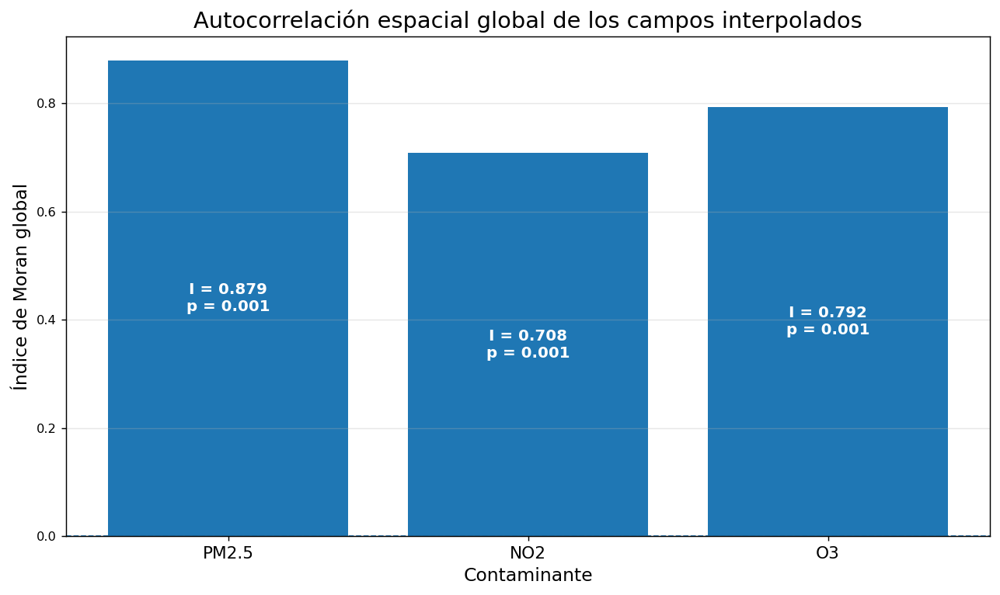

Figura guardada en:
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\01_panel\fig_5_08_moran_global_campos_interpolados.png
- D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\01_panel\fig_5_08_moran_global_campos_interpolados.pdf


In [103]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# ============================================================
# 1. Ruta de la tabla guardada
# ============================================================
ruta_tabla = r"D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\03_tablas\tablas_panel\tabla_5_10_moran_global_campos_interpolados.csv"

# ============================================================
# 2. Cargar tabla
# ============================================================
tabla_moran = pd.read_csv(ruta_tabla)

# Si aparece una columna basura tipo 'Unnamed: 0', eliminarla
tabla_moran = tabla_moran.loc[:, ~tabla_moran.columns.str.contains("^Unnamed")]

print("Tabla cargada:")
display(tabla_moran)

# ============================================================
# 3. Gráfica de Moran global
# ============================================================
fig, ax = plt.subplots(figsize=(10, 6))

x = np.arange(len(tabla_moran["Contaminante"]))
y = tabla_moran["Moran_I"].values

barras = ax.bar(x, y)

ax.set_xticks(x)
ax.set_xticklabels(tabla_moran["Contaminante"], fontsize=12)
ax.set_ylabel("Índice de Moran global", fontsize=13)
ax.set_xlabel("Contaminante", fontsize=13)
ax.set_title("Autocorrelación espacial global de los campos interpolados", fontsize=16)

# Línea horizontal en 0
ax.axhline(0, linestyle="--", linewidth=1)

# Etiquetas centradas dentro de las barras
for barra, (_, fila) in zip(barras, tabla_moran.iterrows()):
    altura = barra.get_height()
    x_texto = barra.get_x() + barra.get_width() / 2
    y_texto = altura / 2

    etiqueta = f"I = {fila['Moran_I']:.3f}\np = {fila['p_perm']:.3f}"

    ax.text(
        x_texto,
        y_texto,
        etiqueta,
        ha="center",
        va="center",
        color="white",
        fontsize=11,
        fontweight="bold"
    )

ax.grid(axis="y", alpha=0.3)
plt.tight_layout()

# ============================================================
# 4. Guardar figura
# ============================================================
ruta_figuras = r"D:\TRABAJO DE GRADO BEN-MAP\RESULTADOS_FINALES\02_figuras\01_panel"
os.makedirs(ruta_figuras, exist_ok=True)

ruta_fig_png = os.path.join(ruta_figuras, "fig_5_08_moran_global_campos_interpolados.png")
ruta_fig_pdf = os.path.join(ruta_figuras, "fig_5_08_moran_global_campos_interpolados.pdf")

plt.savefig(ruta_fig_png, dpi=300, bbox_inches="tight")
plt.savefig(ruta_fig_pdf, bbox_inches="tight")
plt.show()

print("Figura guardada en:")
print("-", ruta_fig_png)
print("-", ruta_fig_pdf)